### Table of Contents

* [Creating Patient Group With Metabolomics Data](#Creating_patient_group)
* [KNN Imputation For NaNs](#KNN_Imputer)
* [Adding Covariates](#Adding_covariates)
* [Pearson Correlation Clustering](#Pearson)
    * [Survival Analysis](#Survival_analysis)
    * [Statistical Testing For Clusters From Pearson Correlation Clustering On Metabolites](#Stat_testing)
    * [Finding Percentage Increase/Decrease For Uniquely Expressed Features To One Group Vs. All Other Groups](#Percent_difference)
    * [Finding Other Diseases in Pre-diabetic Patient Subgroups](#Diseases)
    * [Charlson Comorbidity Index](#Charlson)
    * [Addition of Clinical-Biological Features](#Involving_cb_features)
    * [Statistical Testing For Clusters From Pearson Correlation Clustering On Clinical-Biological Features](#Stat_testing_cb)
    * [Categorizing Groups By Feature Expression](#Categorization)
    
<a class="anchor" id="Creating_patient_group"></a>

First we import the packages we may need for the notebook.

In [2]:
import numpy as np
from numpy import linalg
import pandas as pd
import matplotlib.pyplot as plt
import glob
import os
import dask.dataframe as dd
import time
import sklearn
from sklearn.ensemble import RandomForestClassifier
from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn import metrics
import shap
import time
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import auc
from sklearn.metrics import plot_roc_curve
from sklearn.model_selection import StratifiedKFold
from numpy import mean
from numpy import std
import seaborn as sns
from scipy.stats import chisquare
from scipy.stats import chi2_contingency
from scipy.stats import chi2

First, we import our dataframe of all patients we will use in our model which we created in a previous notebook. This contains the eid (identifier variable for a patient) and target (labeled 0 if the patients did not progress to diabetes and 1 if the patient did progress to diabetes).

In [3]:
prediabetes_with_targets = pd.read_csv('prediabetic_patients_with_additional_4513_patients_from_unknown_patients_who_have_ICD_code_since_2018')
prediabetes_with_targets = prediabetes_with_targets.drop(columns = 'Unnamed: 0')
prediabetes_with_targets

,eid,target
0,4754980,0
1,3990434,0
2,4341307,0
3,2189918,0
4,1384041,0
...,...,...
9939,6020998,0
9940,6022016,0
9941,6024268,0
9942,6024393,0


Below we import the dataframe that has many features from the UKBiobank. We drop the first column which is just an identity column brought over from our previous analysis.

In [4]:
prediabetes_with_features = pd.read_csv('all_features_prediabetic_patients_with_additional_4513_patients_from_unknown_patients_who_have_ICD_code_since_2018')
prediabetes_with_features = prediabetes_with_features.drop(columns = ['Unnamed: 0'])
prediabetes_with_features

Columns (42,43,213,317,318,319,320,321,322,323,324,325,326,327,328,329,330,2610,2611,2612,2613,2614,2615,2616,2617,2618,2619,2847,2851,2855,2859,2862,2864,2866,2867,2868,2869,2870,2871,2872,2895,2896,2897,2898,2912,2913,2914,2915,2964,3085,3086,3087,3088,3089,3090,3091,3092,3093,3094,3095,3096,3097,3098,3099,3100,3101,3102,3103,3104,3105,3106,3107,3108,3109,3110,3111,3112,3113,3114,3115,3116,3117,3124,3125,3126,3127,3128,3129,3130,3157,3158,3159,3160,3161,3162,3163,3164,3165,3166,3167,3168,3169,3170,3171,3172,3173,3174,3175,3176,3177,3178,3179,3180,3181,3182,3183,3184,3185,3186,3187,3188,3189,3190,3191,3192,3193,3211,3212,3213,3214,3215,3216,3217,3218,3219,3220,3233,3263,3264,3265,3266,3267,3268,3269,3270,3271,3272,3273,3274,3275,3276,3277,3278,3279,3280,3281,3282,3283,3284,3285,3286,3287,3288,3289,3290,3291,3292,3293,3294,3295,3296,3297,3298,3299,3300,3301,3302,3303,3304,3305,3306,3307,3308,3309,3310,3311,3312,3313,3314,3315,3316,3317,3318,3319,3320,3321,3322,3323,3324,3325,3326,3327,

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,...,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
0,4863545,1.0,NaN,NaN,1,1942,1.0,NaN,NaN,1056.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3440845,1.0,NaN,NaN,0,1950,1.0,NaN,NaN,3157.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1191090,1.0,NaN,NaN,0,1954,1.0,NaN,NaN,1044.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3087664,1.0,NaN,NaN,1,1944,1.0,NaN,NaN,1040.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2195757,1.0,NaN,NaN,0,1958,1.0,NaN,NaN,1039.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9939,5612713,1.0,NaN,NaN,1,1958,1.0,NaN,NaN,3156.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9940,6022397,1.0,NaN,NaN,1,1945,1.0,NaN,NaN,2818.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9941,5011216,1.0,NaN,NaN,0,1947,1.0,NaN,NaN,3155.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9942,3482443,1.0,NaN,NaN,1,1950,1.0,NaN,NaN,1045.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Below we show some information about the total dataframe. We find that there are mostly float data types in our dataframe, but also a few integer and a bunch of object data types.

In [5]:
prediabetes_with_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9944 entries, 0 to 9943
Columns: 12711 entries, eid to 40021-16.0
dtypes: float64(10792), int64(6), object(1913)
memory usage: 964.3+ MB


Below we show that there are many columns in which duplicate data is recorded. This may be due to patients requesting not to have their data used in the study after it was originally recorded and posted for use. After these patients decided not to share their data, their information was removed in a column in a different text file. The higher the number of the csv file (e.g. whole_file_26867 < whole_file_42385) the less patients kept in the columns. We need to account for this request of removal and not use patients who decide not to share their information as ethical researchers. Since both columns are kept, they are differentiated by x (representing column from lower number of csv file) and y (representing column from higher number of csv file which we want to keep) in the pandas dataframe. Therefore, we want to get rid of all columns ending in x and keep all columns ending in y. Below we search for all columns ending in x. and print all the column names so that we can easily drop them from the dataframe.

In [6]:
spike_cols = [col for col in prediabetes_with_features.columns if 'x' in col]
print(spike_cols)
print(len(spike_cols))

['84-0.0_x', '84-0.1_x', '84-0.2_x', '84-0.3_x', '84-0.4_x', '84-0.5_x', '84-1.0_x', '84-1.1_x', '84-1.2_x', '84-1.3_x', '84-1.4_x', '84-1.5_x', '84-2.0_x', '84-2.1_x', '84-2.2_x', '84-2.3_x', '84-2.4_x', '84-2.5_x', '87-0.0_x', '87-0.1_x', '87-0.2_x', '87-0.3_x', '87-0.4_x', '87-0.5_x', '87-0.6_x', '87-0.7_x', '87-0.8_x', '87-0.9_x', '87-0.10_x', '87-0.11_x', '87-0.12_x', '87-0.13_x', '87-0.14_x', '87-0.15_x', '87-0.16_x', '87-0.17_x', '87-0.18_x', '87-0.19_x', '87-0.20_x', '87-0.21_x', '87-0.22_x', '87-0.23_x', '87-0.24_x', '87-0.25_x', '87-0.26_x', '87-0.27_x', '87-0.28_x', '87-0.29_x', '87-0.30_x', '87-0.31_x', '87-0.32_x', '87-0.33_x', '87-1.0_x', '87-1.1_x', '87-1.2_x', '87-1.3_x', '87-1.4_x', '87-1.5_x', '87-1.6_x', '87-1.7_x', '87-1.8_x', '87-1.9_x', '87-1.10_x', '87-1.11_x', '87-1.12_x', '87-1.13_x', '87-1.14_x', '87-1.15_x', '87-1.16_x', '87-1.17_x', '87-1.18_x', '87-1.19_x', '87-1.20_x', '87-1.21_x', '87-1.22_x', '87-1.23_x', '87-1.24_x', '87-1.25_x', '87-1.26_x', '87-1.27_x


1652


Now we want to delete these columns from the final dataframe, shown below.

In [7]:
prediabetes_with_features = prediabetes_with_features.drop(columns = ['84-0.0_x', '84-0.1_x', '84-0.2_x', '84-0.3_x', '84-0.4_x', '84-0.5_x', '84-1.0_x', '84-1.1_x', '84-1.2_x', '84-1.3_x', '84-1.4_x', '84-1.5_x', '84-2.0_x', '84-2.1_x', '84-2.2_x', '84-2.3_x', '84-2.4_x', '84-2.5_x', '87-0.0_x', '87-0.1_x', '87-0.2_x', '87-0.3_x', '87-0.4_x', '87-0.5_x', '87-0.6_x', '87-0.7_x', '87-0.8_x', '87-0.9_x', '87-0.10_x', '87-0.11_x', '87-0.12_x', '87-0.13_x', '87-0.14_x', '87-0.15_x', '87-0.16_x', '87-0.17_x', '87-0.18_x', '87-0.19_x', '87-0.20_x', '87-0.21_x', '87-0.22_x', '87-0.23_x', '87-0.24_x', '87-0.25_x', '87-0.26_x', '87-0.27_x', '87-0.28_x', '87-0.29_x', '87-0.30_x', '87-0.31_x', '87-0.32_x', '87-0.33_x', '87-1.0_x', '87-1.1_x', '87-1.2_x', '87-1.3_x', '87-1.4_x', '87-1.5_x', '87-1.6_x', '87-1.7_x', '87-1.8_x', '87-1.9_x', '87-1.10_x', '87-1.11_x', '87-1.12_x', '87-1.13_x', '87-1.14_x', '87-1.15_x', '87-1.16_x', '87-1.17_x', '87-1.18_x', '87-1.19_x', '87-1.20_x', '87-1.21_x', '87-1.22_x', '87-1.23_x', '87-1.24_x', '87-1.25_x', '87-1.26_x', '87-1.27_x', '87-1.28_x', '87-1.29_x', '87-1.30_x', '87-1.31_x', '87-1.32_x', '87-1.33_x', '87-2.0_x', '87-2.1_x', '87-2.2_x', '87-2.3_x', '87-2.4_x', '87-2.5_x', '87-2.6_x', '87-2.7_x', '87-2.8_x', '87-2.9_x', '87-2.10_x', '87-2.11_x', '87-2.12_x', '87-2.13_x', '87-2.14_x', '87-2.15_x', '87-2.16_x', '87-2.17_x', '87-2.18_x', '87-2.19_x', '87-2.20_x', '87-2.21_x', '87-2.22_x', '87-2.23_x', '87-2.24_x', '87-2.25_x', '87-2.26_x', '87-2.27_x', '87-2.28_x', '87-2.29_x', '87-2.30_x', '87-2.31_x', '87-2.32_x', '87-2.33_x', '134-0.0_x', '134-1.0_x', '134-2.0_x', '135-0.0_x', '135-1.0_x', '135-2.0_x', '1259-0.0_x', '1259-1.0_x', '1259-2.0_x', '1558-0.0_x', '1558-1.0_x', '1558-2.0_x', '1647-0.0_x', '1647-1.0_x', '1647-2.0_x', '1677-0.0_x', '1677-1.0_x', '1677-2.0_x', '1687-0.0_x', '1687-1.0_x', '1687-2.0_x', '1697-0.0_x', '1697-1.0_x', '1697-2.0_x', '1707-0.0_x', '1707-1.0_x', '1707-2.0_x', '1767-0.0_x', '1767-1.0_x', '1767-2.0_x', '1777-0.0_x', '1777-1.0_x', '1777-2.0_x', '1787-0.0_x', '1787-1.0_x', '1787-2.0_x', '1797-0.0_x', '1797-1.0_x', '1797-2.0_x', '1807-0.0_x', '1807-1.0_x', '1807-2.0_x', '1835-0.0_x', '1835-1.0_x', '1835-2.0_x', '1845-0.0_x', '1845-1.0_x', '1845-2.0_x', '1873-0.0_x', '1873-1.0_x', '1873-2.0_x', '1883-0.0_x', '1883-1.0_x', '1883-2.0_x', '2946-0.0_x', '2946-1.0_x', '2946-2.0_x', '3140-0.0_x', '3140-1.0_x', '3140-2.0_x', '3526-0.0_x', '3526-1.0_x', '3526-2.0_x', '3912-0.0_x', '3912-1.0_x', '3912-2.0_x', '3942-0.0_x', '3942-1.0_x', '3942-2.0_x', '3972-0.0_x', '3972-1.0_x', '3972-2.0_x', '3982-0.0_x', '3982-1.0_x', '3982-2.0_x', '4501-0.0_x', '4501-1.0_x', '4501-2.0_x', '5057-0.0_x', '5057-1.0_x', '5057-2.0_x', '5364-0.0_x', '5364-1.0_x', '5364-2.0_x', '20001-0.0_x', '20001-0.1_x', '20001-0.2_x', '20001-0.3_x', '20001-0.4_x', '20001-0.5_x', '20001-1.0_x', '20001-1.1_x', '20001-1.2_x', '20001-1.3_x', '20001-1.4_x', '20001-1.5_x', '20001-2.0_x', '20001-2.1_x', '20001-2.2_x', '20001-2.3_x', '20001-2.4_x', '20001-2.5_x', '20002-0.0_x', '20002-0.1_x', '20002-0.2_x', '20002-0.3_x', '20002-0.4_x', '20002-0.5_x', '20002-0.6_x', '20002-0.7_x', '20002-0.8_x', '20002-0.9_x', '20002-0.10_x', '20002-0.11_x', '20002-0.12_x', '20002-0.13_x', '20002-0.14_x', '20002-0.15_x', '20002-0.16_x', '20002-0.17_x', '20002-0.18_x', '20002-0.19_x', '20002-0.20_x', '20002-0.21_x', '20002-0.22_x', '20002-0.23_x', '20002-0.24_x', '20002-0.25_x', '20002-0.26_x', '20002-0.27_x', '20002-0.28_x', '20002-0.29_x', '20002-0.30_x', '20002-0.31_x', '20002-0.32_x', '20002-0.33_x', '20002-1.0_x', '20002-1.1_x', '20002-1.2_x', '20002-1.3_x', '20002-1.4_x', '20002-1.5_x', '20002-1.6_x', '20002-1.7_x', '20002-1.8_x', '20002-1.9_x', '20002-1.10_x', '20002-1.11_x', '20002-1.12_x', '20002-1.13_x', '20002-1.14_x', '20002-1.15_x', '20002-1.16_x', '20002-1.17_x', '20002-1.18_x', '20002-1.19_x', '20002-1.20_x', '20002-1.21_x', '20002-1.22_x', '20002-1.23_x', '20002-1.24_x', '20002-1.25_x', '20002-1.26_x', '20002-1.27_x', '20002-1.28_x', '20002-1.29_x', '20002-1.30_x', '20002-1.31_x', '20002-1.32_x', '20002-1.33_x', '20002-2.0_x', '20002-2.1_x', '20002-2.2_x', '20002-2.3_x', '20002-2.4_x', '20002-2.5_x', '20002-2.6_x', '20002-2.7_x', '20002-2.8_x', '20002-2.9_x', '20002-2.10_x', '20002-2.11_x', '20002-2.12_x', '20002-2.13_x', '20002-2.14_x', '20002-2.15_x', '20002-2.16_x', '20002-2.17_x', '20002-2.18_x', '20002-2.19_x', '20002-2.20_x', '20002-2.21_x', '20002-2.22_x', '20002-2.23_x', '20002-2.24_x', '20002-2.25_x', '20002-2.26_x', '20002-2.27_x', '20002-2.28_x', '20002-2.29_x', '20002-2.30_x', '20002-2.31_x', '20002-2.32_x', '20002-2.33_x', '20006-0.0_x', '20006-0.1_x', '20006-0.2_x', '20006-0.3_x', '20006-0.4_x', '20006-0.5_x', '20006-1.0_x', '20006-1.1_x', '20006-1.2_x', '20006-1.3_x', '20006-1.4_x', '20006-1.5_x', '20006-2.0_x', '20006-2.1_x', '20006-2.2_x', '20006-2.3_x', '20006-2.4_x', '20006-2.5_x', '20007-0.0_x', '20007-0.1_x', '20007-0.2_x', '20007-0.3_x', '20007-0.4_x', '20007-0.5_x', '20007-1.0_x', '20007-1.1_x', '20007-1.2_x', '20007-1.3_x', '20007-1.4_x', '20007-1.5_x', '20007-2.0_x', '20007-2.1_x', '20007-2.2_x', '20007-2.3_x', '20007-2.4_x', '20007-2.5_x', '20008-0.0_x', '20008-0.1_x', '20008-0.2_x', '20008-0.3_x', '20008-0.4_x', '20008-0.5_x', '20008-0.6_x', '20008-0.7_x', '20008-0.8_x', '20008-0.9_x', '20008-0.10_x', '20008-0.11_x', '20008-0.12_x', '20008-0.13_x', '20008-0.14_x', '20008-0.15_x', '20008-0.16_x', '20008-0.17_x', '20008-0.18_x', '20008-0.19_x', '20008-0.20_x', '20008-0.21_x', '20008-0.22_x', '20008-0.23_x', '20008-0.24_x', '20008-0.25_x', '20008-0.26_x', '20008-0.27_x', '20008-0.28_x', '20008-0.29_x', '20008-0.30_x', '20008-0.31_x', '20008-0.32_x', '20008-0.33_x', '20008-1.0_x', '20008-1.1_x', '20008-1.2_x', '20008-1.3_x', '20008-1.4_x', '20008-1.5_x', '20008-1.6_x', '20008-1.7_x', '20008-1.8_x', '20008-1.9_x', '20008-1.10_x', '20008-1.11_x', '20008-1.12_x', '20008-1.13_x', '20008-1.14_x', '20008-1.15_x', '20008-1.16_x', '20008-1.17_x', '20008-1.18_x', '20008-1.19_x', '20008-1.20_x', '20008-1.21_x', '20008-1.22_x', '20008-1.23_x', '20008-1.24_x', '20008-1.25_x', '20008-1.26_x', '20008-1.27_x', '20008-1.28_x', '20008-1.29_x', '20008-1.30_x', '20008-1.31_x', '20008-1.32_x', '20008-1.33_x', '20008-2.0_x', '20008-2.1_x', '20008-2.2_x', '20008-2.3_x', '20008-2.4_x', '20008-2.5_x', '20008-2.6_x', '20008-2.7_x', '20008-2.8_x', '20008-2.9_x', '20008-2.10_x', '20008-2.11_x', '20008-2.12_x', '20008-2.13_x', '20008-2.14_x', '20008-2.15_x', '20008-2.16_x', '20008-2.17_x', '20008-2.18_x', '20008-2.19_x', '20008-2.20_x', '20008-2.21_x', '20008-2.22_x', '20008-2.23_x', '20008-2.24_x', '20008-2.25_x', '20008-2.26_x', '20008-2.27_x', '20008-2.28_x', '20008-2.29_x', '20008-2.30_x', '20008-2.31_x', '20008-2.32_x', '20008-2.33_x', '20009-0.0_x', '20009-0.1_x', '20009-0.2_x', '20009-0.3_x', '20009-0.4_x', '20009-0.5_x', '20009-0.6_x', '20009-0.7_x', '20009-0.8_x', '20009-0.9_x', '20009-0.10_x', '20009-0.11_x', '20009-0.12_x', '20009-0.13_x', '20009-0.14_x', '20009-0.15_x', '20009-0.16_x', '20009-0.17_x', '20009-0.18_x', '20009-0.19_x', '20009-0.20_x', '20009-0.21_x', '20009-0.22_x', '20009-0.23_x', '20009-0.24_x', '20009-0.25_x', '20009-0.26_x', '20009-0.27_x', '20009-0.28_x', '20009-0.29_x', '20009-0.30_x', '20009-0.31_x', '20009-0.32_x', '20009-0.33_x', '20009-1.0_x', '20009-1.1_x', '20009-1.2_x', '20009-1.3_x', '20009-1.4_x', '20009-1.5_x', '20009-1.6_x', '20009-1.7_x', '20009-1.8_x', '20009-1.9_x', '20009-1.10_x', '20009-1.11_x', '20009-1.12_x', '20009-1.13_x', '20009-1.14_x', '20009-1.15_x', '20009-1.16_x', '20009-1.17_x', '20009-1.18_x', '20009-1.19_x', '20009-1.20_x', '20009-1.21_x', '20009-1.22_x', '20009-1.23_x', '20009-1.24_x', '20009-1.25_x', '20009-1.26_x', '20009-1.27_x', '20009-1.28_x', '20009-1.29_x', '20009-1.30_x', '20009-1.31_x', '20009-1.32_x', '20009-1.33_x', '20009-2.0_x', '20009-2.1_x', '20009-2.2_x', '20009-2.3_x', '20009-2.4_x', '20009-2.5_x', '20009-2.6_x', '20009-2.7_x', '20009-2.8_x', '20009-2.9_x', '20009-2.10_x', '20009-2.11_x', '20009-2.12_x', '20009-2.13_x', '20009-2.14_x', '20009-2.15_x', '20009-2.16_x', '20009-2.17_x', '20009-2.18_x', '20009-2.19_x', '20009-2.20_x', '20009-2.21_x', '20009-2.22_x', '20009-2.23_x', '20009-2.24_x', '20009-2.25_x', '20009-2.26_x', '20009-2.27_x', '20009-2.28_x', '20009-2.29_x', '20009-2.30_x', '20009-2.31_x', '20009-2.32_x', '20009-2.33_x', '20012-0.0_x', '20012-0.1_x', '20012-0.2_x', '20012-0.3_x', '20012-0.4_x', '20012-0.5_x', '20012-1.0_x', '20012-1.1_x', '20012-1.2_x', '20012-1.3_x', '20012-1.4_x', '20012-1.5_x', '20012-2.0_x', '20012-2.1_x', '20012-2.2_x', '20012-2.3_x', '20012-2.4_x', '20012-2.5_x', '20013-0.0_x', '20013-0.1_x', '20013-0.2_x', '20013-0.3_x', '20013-0.4_x', '20013-0.5_x', '20013-0.6_x', '20013-0.7_x', '20013-0.8_x', '20013-0.9_x', '20013-0.10_x', '20013-0.11_x', '20013-0.12_x', '20013-0.13_x', '20013-0.14_x', '20013-0.15_x', '20013-0.16_x', '20013-0.17_x', '20013-0.18_x', '20013-0.19_x', '20013-0.20_x', '20013-0.21_x', '20013-0.22_x', '20013-0.23_x', '20013-0.24_x', '20013-0.25_x', '20013-0.26_x', '20013-0.27_x', '20013-0.28_x', '20013-0.29_x', '20013-0.30_x', '20013-0.31_x', '20013-0.32_x', '20013-0.33_x', '20013-1.0_x', '20013-1.1_x', '20013-1.2_x', '20013-1.3_x', '20013-1.4_x', '20013-1.5_x', '20013-1.6_x', '20013-1.7_x', '20013-1.8_x', '20013-1.9_x', '20013-1.10_x', '20013-1.11_x', '20013-1.12_x', '20013-1.13_x', '20013-1.14_x', '20013-1.15_x', '20013-1.16_x', '20013-1.17_x', '20013-1.18_x', '20013-1.19_x', '20013-1.20_x', '20013-1.21_x', '20013-1.22_x', '20013-1.23_x', '20013-1.24_x', '20013-1.25_x', '20013-1.26_x', '20013-1.27_x', '20013-1.28_x', '20013-1.29_x', '20013-1.30_x', '20013-1.31_x', '20013-1.32_x', '20013-1.33_x', '20013-2.0_x', '20013-2.1_x', '20013-2.2_x', '20013-2.3_x', '20013-2.4_x', '20013-2.5_x', '20013-2.6_x', '20013-2.7_x', '20013-2.8_x', '20013-2.9_x', '20013-2.10_x', '20013-2.11_x', '20013-2.12_x', '20013-2.13_x', '20013-2.14_x', '20013-2.15_x', '20013-2.16_x', '20013-2.17_x', '20013-2.18_x', '20013-2.19_x', '20013-2.20_x', '20013-2.21_x', '20013-2.22_x', '20013-2.23_x', '20013-2.24_x', '20013-2.25_x', '20013-2.26_x', '20013-2.27_x', '20013-2.28_x', '20013-2.29_x', '20013-2.30_x', '20013-2.31_x', '20013-2.32_x', '20013-2.33_x', '20107-0.0_x', '20107-0.1_x', '20107-0.2_x', '20107-0.3_x', '20107-0.4_x', '20107-0.5_x', '20107-0.6_x', '20107-0.7_x', '20107-0.8_x', '20107-0.9_x', '20107-1.0_x', '20107-1.1_x', '20107-1.2_x', '20107-1.3_x', '20107-1.4_x', '20107-1.5_x', '20107-1.6_x', '20107-1.7_x', '20107-1.8_x', '20107-1.9_x', '20107-2.0_x', '20107-2.1_x', '20107-2.2_x', '20107-2.3_x', '20107-2.4_x', '20107-2.5_x', '20107-2.6_x', '20107-2.7_x', '20107-2.8_x', '20107-2.9_x', '20110-0.0_x', '20110-0.1_x', '20110-0.2_x', '20110-0.3_x', '20110-0.4_x', '20110-0.5_x', '20110-0.6_x', '20110-0.7_x', '20110-0.8_x', '20110-0.9_x', '20110-0.10_x', '20110-1.0_x', '20110-1.1_x', '20110-1.2_x', '20110-1.3_x', '20110-1.4_x', '20110-1.5_x', '20110-1.6_x', '20110-1.7_x', '20110-1.8_x', '20110-1.9_x', '20110-1.10_x', '20110-2.0_x', '20110-2.1_x', '20110-2.2_x', '20110-2.3_x', '20110-2.4_x', '20110-2.5_x', '20110-2.6_x', '20110-2.7_x', '20110-2.8_x', '20110-2.9_x', '20110-2.10_x', '20111-0.0_x', '20111-0.1_x', '20111-0.2_x', '20111-0.3_x', '20111-0.4_x', '20111-0.5_x', '20111-0.6_x', '20111-0.7_x', '20111-0.8_x', '20111-0.9_x', '20111-0.10_x', '20111-0.11_x', '20111-1.0_x', '20111-1.1_x', '20111-1.2_x', '20111-1.3_x', '20111-1.4_x', '20111-1.5_x', '20111-1.6_x', '20111-1.7_x', '20111-1.8_x', '20111-1.9_x', '20111-1.10_x', '20111-1.11_x', '20111-2.0_x', '20111-2.1_x', '20111-2.2_x', '20111-2.3_x', '20111-2.4_x', '20111-2.5_x', '20111-2.6_x', '20111-2.7_x', '20111-2.8_x', '20111-2.9_x', '20111-2.10_x', '20111-2.11_x', '20112-0.0_x', '20112-0.1_x', '20112-0.2_x', '20112-0.3_x', '20112-0.4_x', '20112-0.5_x', '20112-0.6_x', '20112-1.0_x', '20112-1.1_x', '20112-1.2_x', '20112-1.3_x', '20112-1.4_x', '20112-1.5_x', '20112-1.6_x', '20112-2.0_x', '20112-2.1_x', '20112-2.2_x', '20112-2.3_x', '20112-2.4_x', '20112-2.5_x', '20112-2.6_x', '20113-0.0_x', '20113-0.1_x', '20113-0.2_x', '20113-0.3_x', '20113-0.4_x', '20113-0.5_x', '20113-1.0_x', '20113-1.1_x', '20113-1.2_x', '20113-1.3_x', '20113-1.4_x', '20113-1.5_x', '20113-2.0_x', '20113-2.1_x', '20113-2.2_x', '20113-2.3_x', '20113-2.4_x', '20113-2.5_x', '20114-0.0_x', '20114-0.1_x', '20114-0.2_x', '20114-0.3_x', '20114-0.4_x', '20114-0.5_x', '20114-0.6_x', '20114-1.0_x', '20114-1.1_x', '20114-1.2_x', '20114-1.3_x', '20114-1.4_x', '20114-1.5_x', '20114-1.6_x', '20114-2.0_x', '20114-2.1_x', '20114-2.2_x', '20114-2.3_x', '20114-2.4_x', '20114-2.5_x', '20114-2.6_x', '20116-0.0_x', '20116-1.0_x', '20116-2.0_x', '20117-0.0_x', '20117-1.0_x', '20117-2.0_x', '20160-0.0_x', '20160-1.0_x', '20160-2.0_x', '20161-0.0_x', '20161-1.0_x', '20161-2.0_x', '30000-0.0_x', '30000-1.0_x', '30000-2.0_x', '30010-0.0_x', '30010-1.0_x', '30010-2.0_x', '30020-0.0_x', '30020-1.0_x', '30020-2.0_x', '30030-0.0_x', '30030-1.0_x', '30030-2.0_x', '30040-0.0_x', '30040-1.0_x', '30040-2.0_x', '30050-0.0_x', '30050-1.0_x', '30050-2.0_x', '30060-0.0_x', '30060-1.0_x', '30060-2.0_x', '30070-0.0_x', '30070-1.0_x', '30070-2.0_x', '30080-0.0_x', '30080-1.0_x', '30080-2.0_x', '30090-0.0_x', '30090-1.0_x', '30090-2.0_x', '30100-0.0_x', '30100-1.0_x', '30100-2.0_x', '30110-0.0_x', '30110-1.0_x', '30110-2.0_x', '30120-0.0_x', '30120-1.0_x', '30120-2.0_x', '30130-0.0_x', '30130-1.0_x', '30130-2.0_x', '30140-0.0_x', '30140-1.0_x', '30140-2.0_x', '30150-0.0_x', '30150-1.0_x', '30150-2.0_x', '30160-0.0_x', '30160-1.0_x', '30160-2.0_x', '30170-0.0_x', '30170-1.0_x', '30170-2.0_x', '30180-0.0_x', '30180-1.0_x', '30180-2.0_x', '30190-0.0_x', '30190-1.0_x', '30190-2.0_x', '30200-0.0_x', '30200-1.0_x', '30200-2.0_x', '30210-0.0_x', '30210-1.0_x', '30210-2.0_x', '30220-0.0_x', '30220-1.0_x', '30220-2.0_x', '30230-0.0_x', '30230-1.0_x', '30230-2.0_x', '30240-0.0_x', '30240-1.0_x', '30240-2.0_x', '30250-0.0_x', '30250-1.0_x', '30250-2.0_x', '30260-0.0_x', '30260-1.0_x', '30260-2.0_x', '30270-0.0_x', '30270-1.0_x', '30270-2.0_x', '30280-0.0_x', '30280-1.0_x', '30280-2.0_x', '30290-0.0_x', '30290-1.0_x', '30290-2.0_x', '30300-0.0_x', '30300-1.0_x', '30300-2.0_x', '30502-0.0_x', '30502-1.0_x', '30503-0.0_x', '30503-1.0_x', '30512-0.0_x', '30512-1.0_x', '30513-0.0_x', '30513-1.0_x', '30522-0.0_x', '30522-1.0_x', '30523-0.0_x', '30523-1.0_x', '30532-0.0_x', '30532-1.0_x', '30533-0.0_x', '30533-1.0_x', '40005-0.0_x', '40005-1.0_x', '40005-2.0_x', '40005-3.0_x', '40005-4.0_x', '40005-5.0_x', '40005-6.0_x', '40005-7.0_x', '40005-8.0_x', '40005-9.0_x', '40005-10.0_x', '40005-11.0_x', '40005-12.0_x', '40005-13.0_x', '40005-14.0_x', '40005-15.0_x', '40005-16.0_x', '40006-0.0_x', '40006-1.0_x', '40006-2.0_x', '40006-3.0_x', '40006-4.0_x', '40006-5.0_x', '40006-6.0_x', '40006-7.0_x', '40006-8.0_x', '40006-9.0_x', '40006-10.0_x', '40006-11.0_x', '40006-12.0_x', '40006-13.0_x', '40006-14.0_x', '40006-15.0_x', '40006-16.0_x', '40008-0.0_x', '40008-1.0_x', '40008-2.0_x', '40008-3.0_x', '40008-4.0_x', '40008-5.0_x', '40008-6.0_x', '40008-7.0_x', '40008-8.0_x', '40008-9.0_x', '40008-10.0_x', '40008-11.0_x', '40008-12.0_x', '40008-13.0_x', '40008-14.0_x', '40008-15.0_x', '40008-16.0_x', '40009-0.0_x', '40011-0.0_x', '40011-1.0_x', '40011-2.0_x', '40011-3.0_x', '40011-4.0_x', '40011-5.0_x', '40011-6.0_x', '40011-7.0_x', '40011-8.0_x', '40011-9.0_x', '40011-10.0_x', '40011-11.0_x', '40011-12.0_x', '40011-13.0_x', '40011-14.0_x', '40011-15.0_x', '40011-16.0_x', '40012-0.0_x', '40012-1.0_x', '40012-2.0_x', '40012-3.0_x', '40012-4.0_x', '40012-5.0_x', '40012-6.0_x', '40012-7.0_x', '40012-8.0_x', '40012-9.0_x', '40012-10.0_x', '40012-11.0_x', '40012-12.0_x', '40012-13.0_x', '40012-14.0_x', '40012-15.0_x', '40012-16.0_x', '40013-0.0_x', '40013-1.0_x', '40013-2.0_x', '40013-3.0_x', '40013-4.0_x', '40013-5.0_x', '40013-6.0_x', '40013-7.0_x', '40013-8.0_x', '40013-9.0_x', '40013-10.0_x', '40013-11.0_x', '40013-12.0_x', '40013-13.0_x', '40013-14.0_x', '40019-0.0_x', '40019-1.0_x', '40019-2.0_x', '40019-3.0_x', '40019-4.0_x', '40019-5.0_x', '40019-6.0_x', '40019-7.0_x', '40019-8.0_x', '40019-9.0_x', '40019-10.0_x', '40019-11.0_x', '40019-12.0_x', '40019-13.0_x', '40019-14.0_x', '40019-15.0_x', '40019-16.0_x', '41200-0.0_x', '41200-0.1_x', '41200-0.2_x', '41200-0.3_x', '41200-0.4_x', '41200-0.5_x', '41200-0.6_x', '41200-0.7_x', '41200-0.8_x', '41200-0.9_x', '41200-0.10_x', '41200-0.11_x', '41200-0.12_x', '41200-0.13_x', '41200-0.14_x', '41200-0.15_x', '41200-0.16_x', '41200-0.17_x', '41200-0.18_x', '41200-0.19_x', '41200-0.20_x', '41200-0.21_x', '41200-0.22_x', '41200-0.23_x', '41200-0.24_x', '41200-0.25_x', '41200-0.26_x', '41200-0.27_x', '41200-0.28_x', '41200-0.29_x', '41200-0.30_x', '41200-0.31_x', '41200-0.32_x', '41200-0.33_x', '41200-0.34_x', '41200-0.35_x', '41200-0.36_x', '41200-0.37_x', '41200-0.38_x', '41200-0.39_x', '41200-0.40_x', '41200-0.41_x', '41200-0.42_x', '41200-0.43_x', '41200-0.44_x', '41200-0.45_x', '41200-0.46_x', '41200-0.47_x', '41200-0.48_x', '41210-0.0_x', '41210-0.1_x', '41210-0.2_x', '41210-0.3_x', '41210-0.4_x', '41210-0.5_x', '41210-0.6_x', '41210-0.7_x', '41210-0.8_x', '41210-0.9_x', '41210-0.10_x', '41210-0.11_x', '41210-0.12_x', '41210-0.13_x', '41210-0.14_x', '41210-0.15_x', '41210-0.16_x', '41210-0.17_x', '41210-0.18_x', '41210-0.19_x', '41210-0.20_x', '41210-0.21_x', '41210-0.22_x', '41210-0.23_x', '41210-0.24_x', '41210-0.25_x', '41210-0.26_x', '41210-0.27_x', '41210-0.28_x', '41210-0.29_x', '41210-0.30_x', '41210-0.31_x', '41210-0.32_x', '41210-0.33_x', '41210-0.34_x', '41210-0.35_x', '41210-0.36_x', '41210-0.37_x', '41210-0.38_x', '41210-0.39_x', '41210-0.40_x', '41210-0.41_x', '41210-0.42_x', '41210-0.43_x', '41210-0.44_x', '41210-0.45_x', '41210-0.46_x', '41210-0.47_x', '41210-0.48_x', '41210-0.49_x', '41210-0.50_x', '41210-0.51_x', '41210-0.52_x', '41210-0.53_x', '41210-0.54_x', '41210-0.55_x', '41210-0.56_x', '41210-0.57_x', '41210-0.58_x', '41210-0.59_x', '41210-0.60_x', '41210-0.61_x', '41210-0.62_x', '41210-0.63_x', '41210-0.64_x', '41210-0.65_x', '41210-0.66_x', '41210-0.67_x', '41210-0.68_x', '41210-0.69_x', '41210-0.70_x', '41210-0.71_x', '41210-0.72_x', '41210-0.73_x', '41210-0.74_x', '41210-0.75_x', '41210-0.76_x', '41210-0.77_x', '41210-0.78_x', '41210-0.79_x', '41210-0.80_x', '41210-0.81_x', '41210-0.82_x', '41210-0.83_x', '41210-0.84_x', '41210-0.85_x', '864-0.0_x', '864-1.0_x', '864-2.0_x', '874-0.0_x', '874-1.0_x', '874-2.0_x', '884-0.0_x', '884-1.0_x', '884-2.0_x', '894-0.0_x', '894-1.0_x', '894-2.0_x', '904-0.0_x', '904-1.0_x', '904-2.0_x', '914-0.0_x', '914-1.0_x', '914-2.0_x', '924-0.0_x', '924-1.0_x', '924-2.0_x', '943-0.0_x', '943-1.0_x', '943-2.0_x', '971-0.0_x', '971-1.0_x', '971-2.0_x', '981-0.0_x', '981-1.0_x', '981-2.0_x', '991-0.0_x', '991-1.0_x', '991-2.0_x', '1001-0.0_x', '1001-1.0_x', '1001-2.0_x', '1011-0.0_x', '1011-1.0_x', '1011-2.0_x', '1021-0.0_x', '1021-1.0_x', '1021-2.0_x', '1050-0.0_x', '1050-1.0_x', '1050-2.0_x', '1060-0.0_x', '1060-1.0_x', '1060-2.0_x', '1070-0.0_x', '1070-1.0_x', '1070-2.0_x', '1080-0.0_x', '1080-1.0_x', '1080-2.0_x', '1090-0.0_x', '1090-1.0_x', '1090-2.0_x', '1100-0.0_x', '1100-1.0_x', '1100-2.0_x', '1160-0.0_x', '1160-1.0_x', '1160-2.0_x', '1170-0.0_x', '1170-1.0_x', '1170-2.0_x', '1180-0.0_x', '1180-1.0_x', '1180-2.0_x', '1190-0.0_x', '1190-1.0_x', '1190-2.0_x', '1200-0.0_x', '1200-1.0_x', '1200-2.0_x', '1210-0.0_x', '1210-1.0_x', '1210-2.0_x', '1220-0.0_x', '1220-1.0_x', '1220-2.0_x', '1239-0.0_x', '1239-1.0_x', '1239-2.0_x', '1249-0.0_x', '1249-1.0_x', '1249-2.0_x', '1269-0.0_x', '1269-1.0_x', '1269-2.0_x', '1279-0.0_x', '1279-1.0_x', '1279-2.0_x', '1289-0.0_x', '1289-1.0_x', '1289-2.0_x', '1299-0.0_x', '1299-1.0_x', '1299-2.0_x', '1309-0.0_x', '1309-1.0_x', '1309-2.0_x', '1319-0.0_x', '1319-1.0_x', '1319-2.0_x', '1329-0.0_x', '1329-1.0_x', '1329-2.0_x', '1339-0.0_x', '1339-1.0_x', '1339-2.0_x', '1349-0.0_x', '1349-1.0_x', '1349-2.0_x', '1359-0.0_x', '1359-1.0_x', '1359-2.0_x', '1369-0.0_x', '1369-1.0_x', '1369-2.0_x', '1379-0.0_x', '1379-1.0_x', '1379-2.0_x', '1389-0.0_x', '1389-1.0_x', '1389-2.0_x', '1408-0.0_x', '1408-1.0_x', '1408-2.0_x', '1418-0.0_x', '1418-1.0_x', '1418-2.0_x', '1428-0.0_x', '1428-1.0_x', '1428-2.0_x', '1438-0.0_x', '1438-1.0_x', '1438-2.0_x', '1448-0.0_x', '1448-1.0_x', '1448-2.0_x', '1458-0.0_x', '1458-1.0_x', '1458-2.0_x', '1468-0.0_x', '1468-1.0_x', '1468-2.0_x', '1478-0.0_x', '1478-1.0_x', '1478-2.0_x', '1488-0.0_x', '1488-1.0_x', '1488-2.0_x', '1498-0.0_x', '1498-1.0_x', '1498-2.0_x', '1508-0.0_x', '1508-1.0_x', '1508-2.0_x', '1518-0.0_x', '1518-1.0_x', '1518-2.0_x', '1528-0.0_x', '1528-1.0_x', '1528-2.0_x', '1538-0.0_x', '1538-1.0_x', '1538-2.0_x', '1548-0.0_x', '1548-1.0_x', '1548-2.0_x', '1568-0.0_x', '1568-1.0_x', '1568-2.0_x', '1578-0.0_x', '1578-1.0_x', '1578-2.0_x', '1588-0.0_x', '1588-1.0_x', '1588-2.0_x', '1598-0.0_x', '1598-1.0_x', '1598-2.0_x', '1608-0.0_x', '1608-1.0_x', '1608-2.0_x', '1618-0.0_x', '1618-1.0_x', '1618-2.0_x', '1628-0.0_x', '1628-1.0_x', '1628-2.0_x', '1717-0.0_x', '1717-1.0_x', '1717-2.0_x', '1727-0.0_x', '1727-1.0_x', '1727-2.0_x', '1737-0.0_x', '1737-1.0_x', '1737-2.0_x', '1747-0.0_x', '1747-1.0_x', '1747-2.0_x', '1757-0.0_x', '1757-1.0_x', '1757-2.0_x', '2129-0.0_x', '2129-1.0_x', '2129-2.0_x', '2139-0.0_x', '2139-1.0_x', '2139-2.0_x', '2149-0.0_x', '2149-1.0_x', '2149-2.0_x', '2159-0.0_x', '2159-1.0_x', '2159-2.0_x', '2267-0.0_x', '2267-1.0_x', '2267-2.0_x', '2277-0.0_x', '2277-1.0_x', '2277-2.0_x', '2624-0.0_x', '2624-1.0_x', '2624-2.0_x', '2634-0.0_x', '2634-1.0_x', '2634-2.0_x', '2644-0.0_x', '2644-1.0_x', '2644-2.0_x', '2654-0.0_x', '2654-1.0_x', '2654-2.0_x', '2664-0.0_x', '2664-1.0_x', '2664-2.0_x', '2714-0.0_x', '2714-1.0_x', '2714-2.0_x', '2724-0.0_x', '2724-1.0_x', '2724-2.0_x', '2867-0.0_x', '2867-1.0_x', '2867-2.0_x', '2877-0.0_x', '2877-1.0_x', '2877-2.0_x', '2887-0.0_x', '2887-1.0_x', '2887-2.0_x', '2897-0.0_x', '2897-1.0_x', '2897-2.0_x', '2907-0.0_x', '2907-1.0_x', '2907-2.0_x', '2926-0.0_x', '2926-1.0_x', '2926-2.0_x', '2936-0.0_x', '2936-1.0_x', '2936-2.0_x', '3436-0.0_x', '3436-1.0_x', '3436-2.0_x', '3446-0.0_x', '3446-1.0_x', '3446-2.0_x', '3456-0.0_x', '3456-1.0_x', '3456-2.0_x', '3466-0.0_x', '3466-1.0_x', '3466-2.0_x', '3476-0.0_x', '3476-1.0_x', '3476-2.0_x', '3486-0.0_x', '3486-1.0_x', '3486-2.0_x', '3496-0.0_x', '3496-1.0_x', '3496-2.0_x', '3506-0.0_x', '3506-1.0_x', '3506-2.0_x', '3637-0.0_x', '3637-1.0_x', '3637-2.0_x', '3647-0.0_x', '3647-1.0_x', '3647-2.0_x', '3669-0.0_x', '3669-1.0_x', '3669-2.0_x', '3680-0.0_x', '3680-1.0_x', '3680-2.0_x', '3700-0.0_x', '3700-1.0_x', '3700-2.0_x', '3710-0.0_x', '3710-1.0_x', '3710-2.0_x', '3720-0.0_x', '3720-1.0_x', '3720-2.0_x', '3731-0.0_x', '3731-1.0_x', '3731-2.0_x', '3859-0.0_x', '3859-1.0_x', '3859-2.0_x', '4407-0.0_x', '4407-1.0_x', '4407-2.0_x', '4418-0.0_x', '4418-1.0_x', '4418-2.0_x', '4429-0.0_x', '4429-1.0_x', '4429-2.0_x', '4440-0.0_x', '4440-1.0_x', '4440-2.0_x', '4451-0.0_x', '4451-1.0_x', '4451-2.0_x', '4462-0.0_x', '4462-1.0_x', '4462-2.0_x', '5959-0.0_x', '5959-1.0_x', '5959-2.0_x', '6144-0.0_x', '6144-0.1_x', '6144-0.2_x', '6144-0.3_x', '6144-1.0_x', '6144-1.1_x', '6144-1.2_x', '6144-1.3_x', '6144-2.0_x', '6144-2.1_x', '6144-2.2_x', '6144-2.3_x', '6157-0.0_x', '6157-0.1_x', '6157-0.2_x', '6157-0.3_x', '6157-1.0_x', '6157-1.1_x', '6157-1.2_x', '6157-1.3_x', '6157-2.0_x', '6157-2.1_x', '6157-2.2_x', '6157-2.3_x', '6158-0.0_x', '6158-0.1_x', '6158-0.2_x', '6158-0.3_x', '6158-1.0_x', '6158-1.1_x', '6158-1.2_x', '6158-1.3_x', '6158-2.0_x', '6158-2.1_x', '6158-2.2_x', '6158-2.3_x', '6162-0.0_x', '6162-0.1_x', '6162-0.2_x', '6162-0.3_x', '6162-1.0_x', '6162-1.1_x', '6162-1.2_x', '6162-1.3_x', '6162-2.0_x', '6162-2.1_x', '6162-2.2_x', '6162-2.3_x', '6164-0.0_x', '6164-0.1_x', '6164-0.2_x', '6164-0.3_x', '6164-0.4_x', '6164-1.0_x', '6164-1.1_x', '6164-1.2_x', '6164-1.3_x', '6164-1.4_x', '6164-2.0_x', '6164-2.1_x', '6164-2.2_x', '6164-2.3_x', '6164-2.4_x', '6183-0.0_x', '6183-1.0_x', '6183-2.0_x', '6194-0.0_x', '6194-1.0_x', '6194-2.0_x', '10115-0.0_x', '10767-0.0_x', '10776-0.0_x', '10818-0.0_x', '10827-0.0_x', '10853-0.0_x', '10855-0.0_x', '10855-0.1_x', '10855-0.2_x', '10855-0.3_x', '10895-0.0_x', '10912-0.0_x', '10953-0.0_x', '10962-0.0_x', '10971-0.0_x', '20162-0.0_x', '20162-1.0_x', '20162-2.0_x', '22032-0.0_x', '22033-0.0_x', '22034-0.0_x', '22035-0.0_x', '22036-0.0_x', '22037-0.0_x', '22038-0.0_x', '22039-0.0_x', '22040-0.0_x'])
prediabetes_with_features

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,...,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
0,4863545,1.0,NaN,NaN,1,1942,1.0,NaN,NaN,1056.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3440845,1.0,NaN,NaN,0,1950,1.0,NaN,NaN,3157.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1191090,1.0,NaN,NaN,0,1954,1.0,NaN,NaN,1044.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3087664,1.0,NaN,NaN,1,1944,1.0,NaN,NaN,1040.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2195757,1.0,NaN,NaN,0,1958,1.0,NaN,NaN,1039.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9939,5612713,1.0,NaN,NaN,1,1958,1.0,NaN,NaN,3156.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9940,6022397,1.0,NaN,NaN,1,1945,1.0,NaN,NaN,2818.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9941,5011216,1.0,NaN,NaN,0,1947,1.0,NaN,NaN,3155.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9942,3482443,1.0,NaN,NaN,1,1950,1.0,NaN,NaN,1045.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Below we show that the shape has decreased by the number of columns with an x at the end (1652).

In [8]:
prediabetes_with_features.shape

(9944, 11059)

The next step is to rename all the columns ending in y such that we drop the "_y" pattern from them so that all columns are kept in the same form (UDI number from UK Biobank, with exception of eid)

In [9]:
prediabetes_with_features.columns = prediabetes_with_features.columns.str.replace('_y','')
prediabetes_with_features

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,...,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
0,4863545,1.0,NaN,NaN,1,1942,1.0,NaN,NaN,1056.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3440845,1.0,NaN,NaN,0,1950,1.0,NaN,NaN,3157.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1191090,1.0,NaN,NaN,0,1954,1.0,NaN,NaN,1044.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3087664,1.0,NaN,NaN,1,1944,1.0,NaN,NaN,1040.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2195757,1.0,NaN,NaN,0,1958,1.0,NaN,NaN,1039.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9939,5612713,1.0,NaN,NaN,1,1958,1.0,NaN,NaN,3156.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9940,6022397,1.0,NaN,NaN,1,1945,1.0,NaN,NaN,2818.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9941,5011216,1.0,NaN,NaN,0,1947,1.0,NaN,NaN,3155.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9942,3482443,1.0,NaN,NaN,1,1950,1.0,NaN,NaN,1045.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Below we show all remaining patients who are diagnosed with diabetes when their measurements are taken and we need to cut them out of the dataframe.

In [10]:
already_diabetic_patients_at_measurement = prediabetes_with_features[prediabetes_with_features['2443-0.0'] == 1]
already_diabetic_patients_at_measurement

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,...,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
14,2425377,1.0,NaN,NaN,0,1946,1.0,NaN,NaN,2818.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
56,5512282,3.0,NaN,NaN,1,1940,1.0,NaN,NaN,1044.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61,5724786,1.0,NaN,NaN,1,1940,1.0,NaN,NaN,1057.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
200,4256846,3.0,NaN,1.0,1,1955,1.0,NaN,1.0,1039.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
222,2189918,1.0,NaN,NaN,0,1961,1.0,NaN,NaN,1039.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9640,1665367,1.0,NaN,NaN,1,1946,1.0,NaN,NaN,1053.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9675,2739978,1.0,NaN,NaN,0,1941,1.0,NaN,NaN,1056.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9689,5684156,3.0,NaN,NaN,0,1940,1.0,NaN,NaN,1047.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9779,5209790,1.0,NaN,NaN,1,1950,1.0,NaN,NaN,2815.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Below we make a list of the eid numbers.

In [11]:
dfToList_already_diabetic_at_start = already_diabetic_patients_at_measurement['eid'].tolist()
dfToList_already_diabetic_at_start

[2425377,
 5512282,
 5724786,
 4256846,
 2189918,
 2546801,
 1706511,
 4387781,
 3462831,
 2817041,
 1072495,
 2268893,
 4683307,
 2748729,
 4623980,
 5605075,
 5275213,
 1146097,
 4821929,
 5415675,
 2429507,
 3265844,
 4578103,
 1202644,
 2586223,
 2763479,
 3593711,
 2480161,
 1526262,
 2268137,
 4861030,
 2238033,
 4496514,
 1731265,
 3829166,
 2883116,
 5708973,
 2693446,
 4246045,
 3857759,
 2484797,
 2994186,
 4745503,
 1338136,
 5905564,
 1336221,
 4270479,
 3342350,
 2225944,
 1328378,
 2500901,
 2850077,
 2219400,
 2203109,
 4690101,
 3264433,
 1637230,
 1457680,
 5083386,
 5011490,
 2591687,
 1404125,
 1936742,
 4779249,
 2839824,
 3230080,
 3669628,
 4983552,
 1067255,
 1895718,
 2648322,
 1424752,
 2693862,
 1117612,
 4157944,
 3836870,
 5402929,
 5903604,
 3415657,
 3676477,
 1105902,
 2650506,
 4791134,
 2862531,
 4876864,
 3348953,
 3392380,
 2233450,
 4729030,
 2191774,
 5311017,
 4641634,
 5878402,
 2031987,
 4366316,
 1340066,
 2344091,
 1568527,
 2997821,
 5665933,


Next, we import the information with the metabolomics data.

In [12]:
prediabetes_metabolomics = pd.read_csv('prediabetics_with_metabolomic_and_telomere_length_data')
prediabetes_metabolomics = prediabetes_metabolomics.drop(columns = 'Unnamed: 0')
prediabetes_metabolomics

,eid,22190-0.0,22190-1.0,22190-2.0,22191-0.0,22191-1.0,22191-2.0,22192-0.0,22192-1.0,22192-2.0,...,23864-1.0,23867-0.0,23868-0.0,23869-0.0,23870-0.0,23871-0.0,23871-1.0,23876-0.0,23878-0.0,23878-1.0
0,1000330,0.769934,NaN,NaN,0.868105,NaN,NaN,0.351325,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1000789,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1000809,0.728637,NaN,NaN,0.749579,NaN,NaN,-0.598856,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1001783,0.613309,NaN,NaN,0.742680,NaN,NaN,-0.658705,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1002432,0.794364,NaN,NaN,0.933980,NaN,NaN,0.824742,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9938,6024145,0.706609,NaN,NaN,0.782405,NaN,NaN,-0.321438,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9939,6024268,0.870288,NaN,NaN,0.938913,NaN,NaN,0.858840,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9940,6024393,0.667180,NaN,NaN,0.737532,NaN,NaN,-0.703726,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9941,6024501,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Below we cut out all patients who are already diabetic.

In [13]:
prediabetes_metabolomics = prediabetes_metabolomics[~prediabetes_metabolomics.eid.isin(dfToList_already_diabetic_at_start)]
prediabetes_metabolomics

,eid,22190-0.0,22190-1.0,22190-2.0,22191-0.0,22191-1.0,22191-2.0,22192-0.0,22192-1.0,22192-2.0,...,23864-1.0,23867-0.0,23868-0.0,23869-0.0,23870-0.0,23871-0.0,23871-1.0,23876-0.0,23878-0.0,23878-1.0
0,1000330,0.769934,NaN,NaN,0.868105,NaN,NaN,0.351325,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1000789,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1000809,0.728637,NaN,NaN,0.749579,NaN,NaN,-0.598856,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1001783,0.613309,NaN,NaN,0.742680,NaN,NaN,-0.658705,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1002432,0.794364,NaN,NaN,0.933980,NaN,NaN,0.824742,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9938,6024145,0.706609,NaN,NaN,0.782405,NaN,NaN,-0.321438,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9939,6024268,0.870288,NaN,NaN,0.938913,NaN,NaN,0.858840,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9940,6024393,0.667180,NaN,NaN,0.737532,NaN,NaN,-0.703726,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9941,6024501,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Below we merge the dataframes by eid to add the target column.

In [14]:
prediabetes_with_metabolomics_and_target = prediabetes_metabolomics.merge(prediabetes_with_targets, on = 'eid')
prediabetes_with_metabolomics_and_target

,eid,22190-0.0,22190-1.0,22190-2.0,22191-0.0,22191-1.0,22191-2.0,22192-0.0,22192-1.0,22192-2.0,...,23867-0.0,23868-0.0,23869-0.0,23870-0.0,23871-0.0,23871-1.0,23876-0.0,23878-0.0,23878-1.0,target
0,1000330,0.769934,NaN,NaN,0.868105,NaN,NaN,0.351325,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,1000789,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
2,1000809,0.728637,NaN,NaN,0.749579,NaN,NaN,-0.598856,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,1001783,0.613309,NaN,NaN,0.742680,NaN,NaN,-0.658705,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
4,1002432,0.794364,NaN,NaN,0.933980,NaN,NaN,0.824742,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9748,6024145,0.706609,NaN,NaN,0.782405,NaN,NaN,-0.321438,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
9749,6024268,0.870288,NaN,NaN,0.938913,NaN,NaN,0.858840,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
9750,6024393,0.667180,NaN,NaN,0.737532,NaN,NaN,-0.703726,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
9751,6024501,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


Next we want to run a model using the metabolomic data. The whole CSV has continuous and categorical data in which the categorical data contains markers for specific patients with problems. We do not include the categorical data here because it is very sparse. Therefore, we first take only the continuous data. However, we show below that python reads in the data as floats. Therefore, we have to manually keep the columns we want.

In [15]:
prediabetes_with_metabolomics_and_target.dtypes

eid            int64
22190-0.0    float64
22190-1.0    float64
22190-2.0    float64
22191-0.0    float64
              ...   
23871-1.0    float64
23876-0.0    float64
23878-0.0    float64
23878-1.0    float64
target         int64
Length: 484, dtype: object

Below we keep the columns we want by name. First we have to show a list of all column names. 

In [16]:
print(prediabetes_with_metabolomics_and_target.columns.tolist())

['eid', '22190-0.0', '22190-1.0', '22190-2.0', '22191-0.0', '22191-1.0', '22191-2.0', '22192-0.0', '22192-1.0', '22192-2.0', '22194-0.0', '22194-1.0', '22194-2.0', '23400-0.0', '23400-1.0', '23401-0.0', '23401-1.0', '23402-0.0', '23402-1.0', '23403-0.0', '23403-1.0', '23404-0.0', '23404-1.0', '23405-0.0', '23405-1.0', '23406-0.0', '23406-1.0', '23407-0.0', '23407-1.0', '23408-0.0', '23408-1.0', '23409-0.0', '23409-1.0', '23410-0.0', '23410-1.0', '23411-0.0', '23411-1.0', '23412-0.0', '23412-1.0', '23413-0.0', '23413-1.0', '23414-0.0', '23414-1.0', '23415-0.0', '23415-1.0', '23416-0.0', '23416-1.0', '23417-0.0', '23417-1.0', '23418-0.0', '23418-1.0', '23419-0.0', '23419-1.0', '23420-0.0', '23420-1.0', '23421-0.0', '23421-1.0', '23422-0.0', '23422-1.0', '23423-0.0', '23423-1.0', '23424-0.0', '23424-1.0', '23425-0.0', '23425-1.0', '23426-0.0', '23426-1.0', '23427-0.0', '23427-1.0', '23428-0.0', '23428-1.0', '23429-0.0', '23429-1.0', '23430-0.0', '23430-1.0', '23431-0.0', '23431-1.0', '234

Next we take the names of the columns we want to keep.

In [17]:
prediabetes_with_metabolomics_continuous_only = prediabetes_with_metabolomics_and_target[['eid', 'target', '23400-0.0', '23400-1.0', '23401-0.0', '23401-1.0', '23402-0.0', '23402-1.0', '23403-0.0', '23403-1.0', '23404-0.0', '23404-1.0', '23405-0.0', '23405-1.0', '23406-0.0', '23406-1.0', '23407-0.0', '23407-1.0', '23408-0.0', '23408-1.0', '23409-0.0', '23409-1.0', '23410-0.0', '23410-1.0', '23411-0.0', '23411-1.0', '23412-0.0', '23412-1.0', '23413-0.0', '23413-1.0', '23414-0.0', '23414-1.0', '23415-0.0', '23415-1.0', '23416-0.0', '23416-1.0', '23417-0.0', '23417-1.0', '23418-0.0', '23418-1.0', '23419-0.0', '23419-1.0', '23420-0.0', '23420-1.0', '23421-0.0', '23421-1.0', '23422-0.0', '23422-1.0', '23423-0.0', '23423-1.0', '23424-0.0', '23424-1.0', '23425-0.0', '23425-1.0', '23426-0.0', '23426-1.0', '23427-0.0', '23427-1.0', '23428-0.0', '23428-1.0', '23429-0.0', '23429-1.0', '23430-0.0', '23430-1.0', '23431-0.0', '23431-1.0', '23432-0.0', '23432-1.0', '23433-0.0', '23433-1.0', '23434-0.0', '23434-1.0', '23436-0.0', '23436-1.0', '23437-0.0', '23437-1.0', '23438-0.0', '23438-1.0', '23439-0.0', '23439-1.0', '23440-0.0', '23440-1.0', '23442-0.0', '23442-1.0', '23443-0.0', '23443-1.0', '23444-0.0', '23444-1.0', '23445-0.0', '23445-1.0', '23446-0.0', '23446-1.0', '23447-0.0', '23447-1.0', '23448-0.0', '23448-1.0', '23449-0.0', '23449-1.0', '23450-0.0', '23450-1.0', '23460-0.0', '23460-1.0', '23461-0.0', '23461-1.0', '23462-0.0', '23462-1.0', '23463-0.0', '23463-1.0', '23464-0.0', '23464-1.0', '23465-0.0', '23465-1.0', '23466-0.0', '23466-1.0', '23467-0.0', '23467-1.0', '23468-0.0', '23468-1.0', '23469-0.0', '23469-1.0', '23470-0.0', '23470-1.0', '23471-0.0', '23471-1.0', '23472-0.0', '23472-1.0', '23473-0.0', '23473-1.0', '23474-0.0', '23474-1.0', '23475-0.0', '23475-1.0', '23476-0.0', '23476-1.0', '23477-0.0', '23477-1.0', '23478-0.0', '23478-1.0', '23479-0.0', '23479-1.0', '23480-0.0', '23480-1.0', '23481-0.0', '23481-1.0', '23482-0.0', '23482-1.0', '23483-0.0', '23483-1.0', '23484-0.0', '23484-1.0', '23485-0.0', '23485-1.0', '23486-0.0', '23486-1.0', '23487-0.0', '23487-1.0', '23488-0.0', '23488-1.0', '23489-0.0', '23489-1.0', '23490-0.0', '23490-1.0', '23491-0.0', '23491-1.0', '23492-0.0', '23492-1.0', '23493-0.0', '23493-1.0', '23494-0.0', '23494-1.0', '23495-0.0', '23495-1.0', '23496-0.0', '23496-1.0', '23497-0.0', '23497-1.0', '23498-0.0', '23498-1.0', '23499-0.0', '23499-1.0', '23500-0.0', '23500-1.0', '23501-0.0', '23501-1.0', '23502-0.0', '23502-1.0', '23503-0.0', '23503-1.0', '23504-0.0', '23504-1.0', '23505-0.0', '23505-1.0', '23506-0.0', '23506-1.0', '23507-0.0', '23507-1.0', '23508-0.0', '23508-1.0', '23509-0.0', '23509-1.0', '23510-0.0', '23510-1.0', '23511-0.0', '23511-1.0', '23512-0.0', '23512-1.0', '23513-0.0', '23513-1.0', '23514-0.0', '23514-1.0', '23515-0.0', '23515-1.0', '23516-0.0', '23516-1.0', '23517-0.0', '23517-1.0', '23518-0.0', '23518-1.0', '23519-0.0', '23519-1.0', '23520-0.0', '23520-1.0', '23521-0.0', '23521-1.0', '23522-0.0', '23522-1.0', '23523-0.0', '23523-1.0', '23524-0.0', '23524-1.0', '23525-0.0', '23525-1.0', '23526-0.0', '23526-1.0', '23527-0.0', '23527-1.0', '23528-0.0', '23528-1.0', '23529-0.0', '23529-1.0', '23530-0.0', '23530-1.0', '23531-0.0', '23531-1.0', '23532-0.0', '23532-1.0', '23533-0.0', '23533-1.0', '23534-0.0', '23534-1.0', '23535-0.0', '23535-1.0', '23536-0.0', '23536-1.0', '23537-0.0', '23537-1.0', '23538-0.0', '23538-1.0', '23539-0.0', '23539-1.0', '23540-0.0', '23540-1.0', '23541-0.0', '23541-1.0', '23542-0.0', '23542-1.0', '23543-0.0', '23543-1.0', '23544-0.0', '23544-1.0', '23545-0.0', '23545-1.0', '23546-0.0', '23546-1.0', '23547-0.0', '23547-1.0', '23548-0.0', '23548-1.0', '23549-0.0', '23549-1.0', '23550-0.0', '23550-1.0', '23551-0.0', '23551-1.0', '23552-0.0', '23552-1.0', '23553-0.0', '23553-1.0', '23554-0.0', '23554-1.0', '23555-0.0', '23555-1.0', '23556-0.0', '23556-1.0', '23557-0.0', '23557-1.0', '23558-0.0', '23558-1.0', '23559-0.0', '23559-1.0', '23560-0.0', '23560-1.0', '23561-0.0', '23561-1.0', '23562-0.0', '23562-1.0', '23563-0.0', '23563-1.0', '23564-0.0', '23564-1.0', '23565-0.0', '23565-1.0', '23566-0.0', '23566-1.0', '23567-0.0', '23567-1.0', '23568-0.0', '23568-1.0', '23569-0.0', '23569-1.0', '23570-0.0', '23570-1.0', '23571-0.0', '23571-1.0', '23572-0.0', '23572-1.0', '23573-0.0', '23573-1.0', '23574-0.0', '23574-1.0', '23575-0.0', '23575-1.0', '23576-0.0', '23576-1.0', '23577-0.0', '23577-1.0', '23578-0.0', '23578-1.0']]
prediabetes_with_metabolomics_continuous_only

,eid,target,23400-0.0,23400-1.0,23401-0.0,23401-1.0,23402-0.0,23402-1.0,23403-0.0,23403-1.0,...,23574-0.0,23574-1.0,23575-0.0,23575-1.0,23576-0.0,23576-1.0,23577-0.0,23577-1.0,23578-0.0,23578-1.0
0,1000330,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1000789,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1000809,1,5.0722,NaN,3.6887,NaN,1.8404,NaN,0.84379,NaN,...,0.61907,NaN,0.40574,NaN,0.29572,NaN,0.11002,NaN,0.047430,NaN
3,1001783,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1002432,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9748,6024145,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9749,6024268,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9750,6024393,0,5.1455,NaN,3.3451,NaN,1.4854,NaN,0.53555,NaN,...,0.74767,NaN,0.52592,NaN,0.39495,NaN,0.13097,NaN,0.037247,NaN
9751,6024501,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Below we keep only the columns that end in -0.0 or are the eid and target columns.

In [18]:
prediabetes_with_metabolomics_continuous_only_to_keep = prediabetes_with_metabolomics_continuous_only.filter(regex='-0.0|eid|target')
prediabetes_with_metabolomics_continuous_only_to_keep

,eid,target,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,...,23569-0.0,23570-0.0,23571-0.0,23572-0.0,23573-0.0,23574-0.0,23575-0.0,23576-0.0,23577-0.0,23578-0.0
0,1000330,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1000789,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1000809,1,5.0722,3.6887,1.8404,0.84379,2.8117,1.8483,1.3835,1.05560,...,0.40360,0.089485,0.05340,0.008862,1.0722,0.61907,0.40574,0.29572,0.11002,0.047430
3,1001783,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1002432,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9748,6024145,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9749,6024268,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9750,6024393,0,5.1455,3.3451,1.4854,0.53555,2.7781,1.8598,1.8004,0.75232,...,0.56824,0.121000,0.04205,0.011256,1.3108,0.74767,0.52592,0.39495,0.13097,0.037247
9751,6024501,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Below we look at how many NaN values we have in the dataframe. We see that a lot of the patients do not have much information. Therefore, we will keep only the rows without many NaN values in them.

In [19]:
pd.options.display.max_rows = 200
prediabetes_with_metabolomics_continuous_only_to_keep.isnull().sum()

eid             0
target          0
23400-0.0    7414
23401-0.0    7414
23402-0.0    7414
23403-0.0    7414
23404-0.0    7414
23405-0.0    7414
23406-0.0    7414
23407-0.0    7414
23408-0.0    7414
23409-0.0    7414
23410-0.0    7414
23411-0.0    7414
23412-0.0    7414
23413-0.0    7414
23414-0.0    7414
23415-0.0    7414
23416-0.0    7414
23417-0.0    7414
23418-0.0    7414
23419-0.0    7414
23420-0.0    7414
23421-0.0    7414
23422-0.0    7414
23423-0.0    7414
23424-0.0    7414
23425-0.0    7414
23426-0.0    7414
23427-0.0    7414
23428-0.0    7414
23429-0.0    7414
23430-0.0    7414
23431-0.0    7414
23432-0.0    7414
23433-0.0    7414
23434-0.0    7416
23436-0.0    7416
23437-0.0    7416
23438-0.0    7416
23439-0.0    7414
23440-0.0    7414
23442-0.0    7416
23443-0.0    7416
23444-0.0    7416
23445-0.0    7416
23446-0.0    7416
23447-0.0    7416
23448-0.0    7416
23449-0.0    7416
23450-0.0    7416
23460-0.0    7414
23461-0.0    7423
23462-0.0    7414
23463-0.0    7420
23464-0.0 

Below we filter for rows without NaN values, keeping all rows with 3 or less NaN values in them.

In [20]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered = prediabetes_with_metabolomics_continuous_only_to_keep.dropna(thresh=3)
prediabetes_with_metabolomics_continuous_only_to_keep_filtered

,eid,target,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,...,23569-0.0,23570-0.0,23571-0.0,23572-0.0,23573-0.0,23574-0.0,23575-0.0,23576-0.0,23577-0.0,23578-0.0
2,1000809,1,5.0722,3.6887,1.8404,0.84379,2.8117,1.84830,1.38350,1.05560,...,0.40360,0.089485,0.053400,0.008862,1.07220,0.61907,0.40574,0.29572,0.110020,0.047430
7,1005686,1,3.7716,2.4546,1.1090,0.42269,1.9801,1.34560,1.31700,0.72558,...,0.41526,0.083232,0.033200,0.009097,1.07350,0.61140,0.42628,0.32234,0.103940,0.035841
8,1005936,1,4.5190,3.5896,1.7915,0.97591,2.5595,1.79800,0.92939,2.13880,...,0.29014,0.065946,0.086861,0.009035,1.14000,0.65788,0.39831,0.28809,0.110220,0.083784
11,1007333,0,4.9518,3.1492,1.3743,0.45402,2.6832,1.77490,1.80260,0.56713,...,0.50841,0.108500,0.016658,0.009099,1.01750,0.56630,0.43184,0.31848,0.113370,0.019326
19,1016167,0,2.9259,1.8478,0.8703,0.35565,1.3400,0.97753,1.07800,0.92902,...,0.34595,0.066720,0.035421,0.008057,0.97235,0.56304,0.37241,0.28323,0.089176,0.036902
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9734,6017696,0,5.5147,4.2459,2.1481,1.08270,3.2354,2.09780,1.26890,1.63230,...,0.39407,0.087251,0.069017,0.010124,1.22800,0.70412,0.45917,0.33805,0.121120,0.064663
9735,6017753,0,4.0321,2.8769,1.3677,0.64201,2.1882,1.50910,1.15530,1.27490,...,0.38089,0.078563,0.050539,0.009690,1.17340,0.67604,0.44390,0.33278,0.111120,0.053463
9736,6017871,1,3.5629,2.6253,1.2123,0.67483,1.7881,1.41300,0.93761,2.31370,...,0.33310,0.071334,0.075526,0.010021,1.25460,0.72523,0.44733,0.32932,0.118020,0.082007
9737,6018114,0,4.0710,2.8931,1.3145,0.72080,2.0921,1.57860,1.17800,1.97550,...,0.40807,0.085483,0.065454,0.010734,1.31230,0.75289,0.48803,0.36378,0.124250,0.071392


Below we plot the distributions of every metabolomic feature. They all seem to be relatively normal with some having more right skew than others.

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


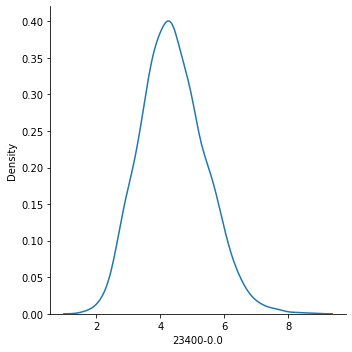

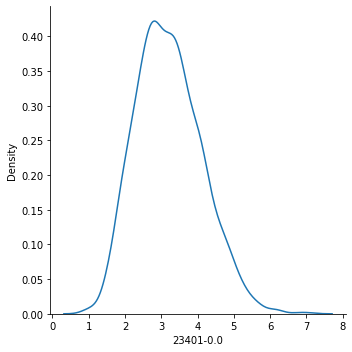

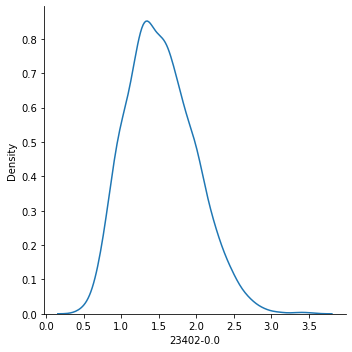

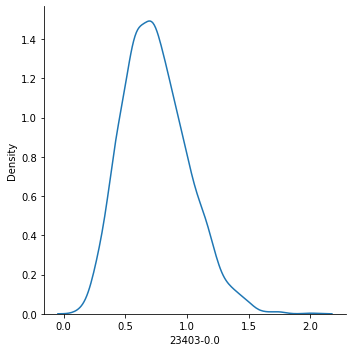

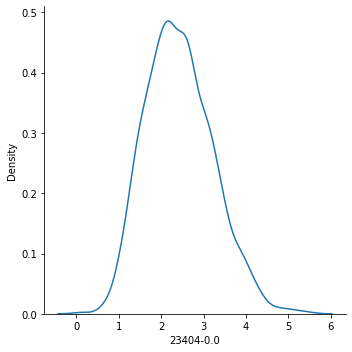

...

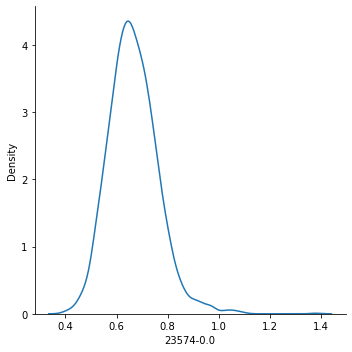

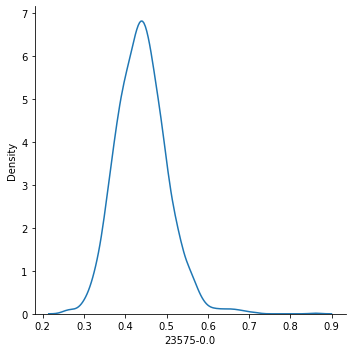

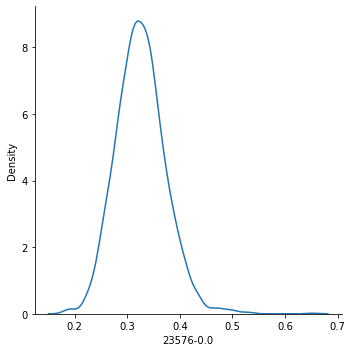

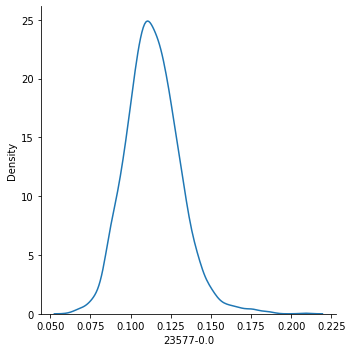

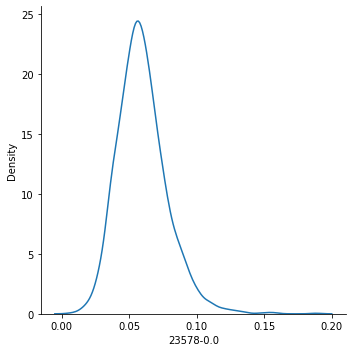

In [21]:
for col in prediabetes_with_metabolomics_continuous_only_to_keep_filtered.drop(columns = ['eid', 'target']):
    sns.displot(data=prediabetes_with_metabolomics_continuous_only_to_keep_filtered, x= col, kind="kde")

Below we show the number of NaN values remaining.

In [22]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered.isnull().sum()


eid           0
target        0
23400-0.0     0
23401-0.0     0
23402-0.0     0
23403-0.0     0
23404-0.0     0
23405-0.0     0
23406-0.0     0
23407-0.0     0
23408-0.0     0
23409-0.0     0
23410-0.0     0
23411-0.0     0
23412-0.0     0
23413-0.0     0
23414-0.0     0
23415-0.0     0
23416-0.0     0
23417-0.0     0
23418-0.0     0
23419-0.0     0
23420-0.0     0
23421-0.0     0
23422-0.0     0
23423-0.0     0
23424-0.0     0
23425-0.0     0
23426-0.0     0
23427-0.0     0
23428-0.0     0
23429-0.0     0
23430-0.0     0
23431-0.0     0
23432-0.0     0
23433-0.0     0
23434-0.0     2
23436-0.0     2
23437-0.0     2
23438-0.0     2
23439-0.0     0
23440-0.0     0
23442-0.0     2
23443-0.0     2
23444-0.0     2
23445-0.0     2
23446-0.0     2
23447-0.0     2
23448-0.0     2
23449-0.0     2
23450-0.0     2
23460-0.0     0
23461-0.0     9
23462-0.0     0
23463-0.0     6
23464-0.0     0
23465-0.0     0
23466-0.0     0
23467-0.0     0
23468-0.0     2
23469-0.0     5
23470-0.0     6
23471-0.

In [23]:
99/2339

0.042325780247969215

Below we make a bar chart for the percent of missing values for metabolomic features but only those greater than one percent.

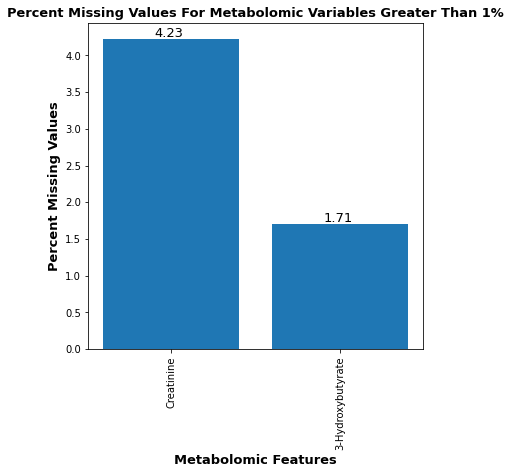

In [24]:
metabolomic_features = ['Creatinine', '3-Hydroxybutyrate']
nan_values_met = [4.23, 1.71]


plt.figure(figsize=(6,6))
for i, v in enumerate(nan_values_met):
    plt.text(i - 0.1, v + 0.03, str(v), fontsize = 13)
plt.bar(metabolomic_features, nan_values_met)
plt.title('Percent Missing Values For Metabolomic Variables Greater Than 1%', fontsize = 13, fontweight = 'bold')
plt.xlabel('Metabolomic Features', fontsize = 13, fontweight = 'bold')
plt.xticks(rotation = 90)
plt.ylabel('Percent Missing Values', fontsize = 13, fontweight = 'bold')

plt.show()

Below we make a new list of the float columns so we can fill all NaN values.

In [25]:
pd.options.display.max_rows = 10
floats_final = prediabetes_with_metabolomics_continuous_only_to_keep_filtered.select_dtypes(include=['float64']).columns.to_list()
floats_final

['23400-0.0',
 '23401-0.0',
 '23402-0.0',
 '23403-0.0',
 '23404-0.0',
 '23405-0.0',
 '23406-0.0',
 '23407-0.0',
 '23408-0.0',
 '23409-0.0',
 '23410-0.0',
 '23411-0.0',
 '23412-0.0',
 '23413-0.0',
 '23414-0.0',
 '23415-0.0',
 '23416-0.0',
 '23417-0.0',
 '23418-0.0',
 '23419-0.0',
 '23420-0.0',
 '23421-0.0',
 '23422-0.0',
 '23423-0.0',
 '23424-0.0',
 '23425-0.0',
 '23426-0.0',
 '23427-0.0',
 '23428-0.0',
 '23429-0.0',
 '23430-0.0',
 '23431-0.0',
 '23432-0.0',
 '23433-0.0',
 '23434-0.0',
 '23436-0.0',
 '23437-0.0',
 '23438-0.0',
 '23439-0.0',
 '23440-0.0',
 '23442-0.0',
 '23443-0.0',
 '23444-0.0',
 '23445-0.0',
 '23446-0.0',
 '23447-0.0',
 '23448-0.0',
 '23449-0.0',
 '23450-0.0',
 '23460-0.0',
 '23461-0.0',
 '23462-0.0',
 '23463-0.0',
 '23464-0.0',
 '23465-0.0',
 '23466-0.0',
 '23467-0.0',
 '23468-0.0',
 '23469-0.0',
 '23470-0.0',
 '23471-0.0',
 '23472-0.0',
 '23473-0.0',
 '23474-0.0',
 '23475-0.0',
 '23476-0.0',
 '23477-0.0',
 '23478-0.0',
 '23479-0.0',
 '23480-0.0',
 '23481-0.0',
 '2348

<a class="anchor" id="KNN_Imputer"></a>
Next we perform Imputation Using k-NN with k = 5. Implementation from: https://machinelearningmastery.com/knn-imputation-for-missing-values-in-machine-learning/

In [26]:
from sklearn.impute import KNNImputer

prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn = prediabetes_with_metabolomics_continuous_only_to_keep_filtered.drop(columns = ['eid', 'target'])

# define imputer
imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')

# fit on the dataset
imputer.fit(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn)

# transform the dataset
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final = imputer.transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn)
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final

array([[5.0722  , 3.6887  , 1.8404  , ..., 0.29572 , 0.11002 , 0.04743 ],
       [3.7716  , 2.4546  , 1.109   , ..., 0.32234 , 0.10394 , 0.035841],
       [4.519   , 3.5896  , 1.7915  , ..., 0.28809 , 0.11022 , 0.083784],
       ...,
       [3.5629  , 2.6253  , 1.2123  , ..., 0.32932 , 0.11802 , 0.082007],
       [4.071   , 2.8931  , 1.3145  , ..., 0.36378 , 0.12425 , 0.071392],
       [5.1455  , 3.3451  , 1.4854  , ..., 0.39495 , 0.13097 , 0.037247]])

Below we create a dataframe of these values.

In [27]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df = pd.DataFrame(data=prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final, columns=prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn.columns)
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,23569-0.0,23570-0.0,23571-0.0,23572-0.0,23573-0.0,23574-0.0,23575-0.0,23576-0.0,23577-0.0,23578-0.0
0,5.0722,3.6887,1.8404,0.84379,2.8117,1.84830,1.38350,1.05560,0.65250,0.14697,...,0.40360,0.089485,0.053400,0.008862,1.07220,0.61907,0.40574,0.29572,0.110020,0.047430
1,3.7716,2.4546,1.1090,0.42269,1.9801,1.34560,1.31700,0.72558,0.44415,0.11384,...,0.41526,0.083232,0.033200,0.009097,1.07350,0.61140,0.42628,0.32234,0.103940,0.035841
2,4.5190,3.5896,1.7915,0.97591,2.5595,1.79800,0.92939,2.13880,1.54990,0.21661,...,0.29014,0.065946,0.086861,0.009035,1.14000,0.65788,0.39831,0.28809,0.110220,0.083784
3,4.9518,3.1492,1.3743,0.45402,2.6832,1.77490,1.80260,0.56713,0.31040,0.11897,...,0.50841,0.108500,0.016658,0.009099,1.01750,0.56630,0.43184,0.31848,0.113370,0.019326
4,2.9259,1.8478,0.8703,0.35565,1.3400,0.97753,1.07800,0.92902,0.69337,0.08373,...,0.34595,0.066720,0.035421,0.008057,0.97235,0.56304,0.37241,0.28323,0.089176,0.036902
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2334,5.5147,4.2459,2.1481,1.08270,3.2354,2.09780,1.26890,1.63230,1.15280,0.17546,...,0.39407,0.087251,0.069017,0.010124,1.22800,0.70412,0.45917,0.33805,0.121120,0.064663
2335,4.0321,2.8769,1.3677,0.64201,2.1882,1.50910,1.15530,1.27490,0.91217,0.13757,...,0.38089,0.078563,0.050539,0.009690,1.17340,0.67604,0.44390,0.33278,0.111120,0.053463
2336,3.5629,2.6253,1.2123,0.67483,1.7881,1.41300,0.93761,2.31370,1.80970,0.18737,...,0.33310,0.071334,0.075526,0.010021,1.25460,0.72523,0.44733,0.32932,0.118020,0.082007
2337,4.0710,2.8931,1.3145,0.72080,2.0921,1.57860,1.17800,1.97550,1.52290,0.17258,...,0.40807,0.085483,0.065454,0.010734,1.31230,0.75289,0.48803,0.36378,0.124250,0.071392


Below we take the mean of every metabolomic feature.

In [28]:
for col in prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df.columns:
    print('Mean for', col, 'is:', prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df[col].mean())

Mean for 23400-0.0 is: 4.3985346729371475
Mean for 23401-0.0 is: 3.209656938862763
Mean for 23402-0.0 is: 1.5327743736639579
Mean for 23403-0.0 is: 0.746020884993586
Mean for 23404-0.0 is: 2.428404082086359
Mean for 23405-0.0 is: 1.676883534843952
Mean for 23406-0.0 is: 1.1888769559640842
Mean for 23407-0.0 is: 1.4920703676784928
Mean for 23408-0.0 is: 1.0707826079521179
Mean for 23409-0.0 is: 0.1578044561778541
Mean for 23410-0.0 is: 0.15649221333903385
Mean for 23411-0.0 is: 2.8475737922188986
Mean for 23412-0.0 is: 0.5117573544249667
Mean for 23413-0.0 is: 0.5919015733219332
Mean for 23414-0.0 is: 1.4637553997434791
Mean for 23415-0.0 is: 3.1832853783668282
Mean for 23416-0.0 is: 0.4361344728516457
Mean for 23417-0.0 is: 1.2385015079093595
Mean for 23418-0.0 is: 0.9215712056434368
Mean for 23419-0.0 is: 1.2152491363830678
Mean for 23420-0.0 is: 0.3098866327490386
Mean for 23421-0.0 is: 0.43838145938435236
Mean for 23422-0.0 is: 0.26730657973492983
Mean for 23423-0.0 is: 8.7381808892

Below we add the eid column.

In [29]:
prediabetes_for_progression_split = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df.drop_duplicates()
prediabetes_for_progression_split['eid'] = prediabetes_with_metabolomics_continuous_only_to_keep_filtered.reset_index(inplace = False)['eid']

## We cannot run the code below until we have clustered. However, it is convenient to place here since we are finding the mean of the metabolomic features before normalization.

In [30]:
#cluster_1_before_normalization = prediabetes_for_progression_split[prediabetes_for_progression_split.eid.isin(cluster_1['eid'])]
#cluster_2_before_normalization = prediabetes_for_progression_split[prediabetes_for_progression_split.eid.isin(cluster_2['eid'])]
#cluster_3_before_normalization = prediabetes_for_progression_split[prediabetes_for_progression_split.eid.isin(cluster_3['eid'])]
#cluster_4_before_normalization = prediabetes_for_progression_split[prediabetes_for_progression_split.eid.isin(cluster_4['eid'])]
#cluster_5_before_normalization = prediabetes_for_progression_split[prediabetes_for_progression_split.eid.isin(cluster_5['eid'])]
#cluster_6_before_normalization = prediabetes_for_progression_split[prediabetes_for_progression_split.eid.isin(cluster_6['eid'])]
#cluster_7_before_normalization = prediabetes_for_progression_split[prediabetes_for_progression_split.eid.isin(cluster_7['eid'])]

Below we find the mean of all metabolomic features for cluster 1

In [31]:
#for col in cluster_1_before_normalization.columns:
#    print('Mean for', col, 'is:', cluster_1_before_normalization[col].mean())

Below we find the mean of all metabolomic features for cluster 2

In [32]:
#for col in cluster_2_before_normalization.columns:
#    print('Mean for', col, 'is:', cluster_2_before_normalization[col].mean())

Below we find the mean of all metabolomic features for cluster 3

In [33]:
#for col in cluster_3_before_normalization.columns:
#    print('Mean for', col, 'is:', cluster_3_before_normalization[col].mean())

Below we find the mean of all metabolomic features for cluster 4

In [34]:
#for col in cluster_4_before_normalization.columns:
#    print('Mean for', col, 'is:', cluster_4_before_normalization[col].mean())

Below we find the mean of all metabolomic features for cluster 5

In [35]:
#for col in cluster_5_before_normalization.columns:
#    print('Mean for', col, 'is:', cluster_5_before_normalization[col].mean())

Below we find the mean of all metabolomic features for cluster 6

In [36]:
#for col in cluster_6_before_normalization.columns:
#    print('Mean for', col, 'is:', cluster_6_before_normalization[col].mean())

Below we find the mean of all metabolomic features for cluster 7

In [37]:
#for col in cluster_7_before_normalization.columns:
#    print('Mean for', col, 'is:', cluster_7_before_normalization[col].mean())

Next we merge the target column to our data and separate patients based on progression outcome.

In [38]:
#prediabetes_for_progression_split_with_target = prediabetes_for_progression_split.merge(prediabetes_with_targets, on = 'eid')
#prediabetes_for_progression_split_not_progressing = prediabetes_for_progression_split_with_target[prediabetes_for_progression_split_with_target['target'] == 0]
#prediabetes_for_progression_split_progressing = prediabetes_for_progression_split_with_target[prediabetes_for_progression_split_with_target['target'] == 1]

Below we find the mean of all columns for patients not progressing to diabetes.

In [39]:
#for col in prediabetes_for_progression_split_not_progressing.columns:
#    print('Mean for', col, 'is:', prediabetes_for_progression_split_not_progressing[col].mean())

Below we find the mean of all columns for patients progressing to diabetes.

In [40]:
#for col in prediabetes_for_progression_split_progressing.columns:
#    print('Mean for', col, 'is:', prediabetes_for_progression_split_progressing[col].mean())

Below we run Levene's test on all standard deviations. Notice that we need to add notnull() for this to work since Levene's test assumes all values are full. We create two lists which contain the values which are or are not statistically significant as a reuslt of Levene's test. We need to do this so that we can run different types of independent t tests depending on the results.

In [41]:
from scipy.stats import levene

#equal_variance = []
#unequal_variance = []

#for i in prediabetes_for_progression_split_progressing.columns:
#    filtered_df = prediabetes_for_progression_split_not_progressing[prediabetes_for_progression_split_not_progressing[i].notnull()]
#    filtered_df2 = prediabetes_for_progression_split_progressing[prediabetes_for_progression_split_progressing[i].notnull()]
#    stat, pval = levene(filtered_df[i], filtered_df2[i])
#    if pval < 0.05:
#        unequal_variance.append(i)
#    else:
#        equal_variance.append(i)
#    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (stat, pval))


Below we run our statistical tests for all columns that have been shown to not have unequal variances (statistically speaking).

In [42]:
from scipy.stats import ttest_ind

#for i in equal_variance:
#    t_stat, t_pval = ttest_ind(prediabetes_for_progression_split_not_progressing[i], prediabetes_for_progression_split_progressing[i], nan_policy = 'omit')
#    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*168))

Below we run our statistical independent t tests for all columns that have been shown to have statistically unequal variances.

In [43]:
from scipy.stats import ttest_ind

#for i in unequal_variance:
#    t_stat, t_pval = ttest_ind(prediabetes_for_progression_split_not_progressing[i], prediabetes_for_progression_split_progressing[i], nan_policy = 'omit', equal_var = False)
#    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*168))

Below we show which metabolomic data distributions are normal and which are not normal using the Shapiro-Wilk test. This is important for our statistical testing further on.

In [44]:
import scipy.stats as stats

normal_metabolites = []
not_normal_metabolites = []

for col in prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df.columns:
    w, pvalue = stats.shapiro(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df[col])
    print('For feature:', col, 'Shapiro test statistic is:', w, 'With padjusted (pval*168):', pvalue)
    if pvalue*168 < 0.05:
        not_normal_metabolites.append(col)
        print('-------------------NOT NORMAL-----------------')
    else:
        normal_metabolites.append(col)
        print('-------------------NORMAL-----------------')

For feature: 23400-0.0 Shapiro test statistic is: 0.9926098585128784 With padjusted (pval*168): 1.6382571965678494e-09
-------------------NOT NORMAL-----------------
For feature: 23401-0.0 Shapiro test statistic is: 0.9882523417472839 With padjusted (pval*168): 6.110207825815728e-13
-------------------NOT NORMAL-----------------
For feature: 23402-0.0 Shapiro test statistic is: 0.9865480065345764 With padjusted (pval*168): 4.687404774766403e-14
-------------------NOT NORMAL-----------------
For feature: 23403-0.0 Shapiro test statistic is: 0.9841951131820679 With padjusted (pval*168): 1.8934386038091866e-15
-------------------NOT NORMAL-----------------
For feature: 23404-0.0 Shapiro test statistic is: 0.9892460107803345 With padjusted (pval*168): 3.0611492073812085e-12
-------------------NOT NORMAL-----------------
For feature: 23405-0.0 Shapiro test statistic is: 0.9900402426719666 With padjusted (pval*168): 1.190730760519676e-11
-------------------NOT NORMAL-----------------
For fea

For feature: 23460-0.0 Shapiro test statistic is: 0.988315999507904 With padjusted (pval*168): 6.756170059171729e-13
-------------------NOT NORMAL-----------------
For feature: 23461-0.0 Shapiro test statistic is: 0.9958756566047668 With padjusted (pval*168): 4.820469712285558e-06
-------------------NOT NORMAL-----------------
For feature: 23462-0.0 Shapiro test statistic is: 0.9248075485229492 With padjusted (pval*168): 1.0519019931560691e-32
-------------------NOT NORMAL-----------------
For feature: 23463-0.0 Shapiro test statistic is: 0.8674162030220032 With padjusted (pval*168): 1.114564772554673e-40
-------------------NOT NORMAL-----------------
For feature: 23464-0.0 Shapiro test statistic is: 0.9475915431976318 With padjusted (pval*168): 4.214772016362594e-28
-------------------NOT NORMAL-----------------
For feature: 23465-0.0 Shapiro test statistic is: 0.9117856025695801 With padjusted (pval*168): 7.380280440621527e-35
-------------------NOT NORMAL-----------------
For featur

For feature: 23510-0.0 Shapiro test statistic is: 0.9801120162010193 With padjusted (pval*168): 1.4608773932572468e-17
-------------------NOT NORMAL-----------------
For feature: 23511-0.0 Shapiro test statistic is: 0.9845162034034729 With padjusted (pval*168): 2.875694643620242e-15
-------------------NOT NORMAL-----------------
For feature: 23512-0.0 Shapiro test statistic is: 0.981955885887146 With padjusted (pval*168): 1.1944274963539926e-16
-------------------NOT NORMAL-----------------
For feature: 23513-0.0 Shapiro test statistic is: 0.9818296432495117 With padjusted (pval*168): 1.0295748339602575e-16
-------------------NOT NORMAL-----------------
For feature: 23514-0.0 Shapiro test statistic is: 0.982912540435791 With padjusted (pval*168): 3.7715605755309696e-16
-------------------NOT NORMAL-----------------
For feature: 23515-0.0 Shapiro test statistic is: 0.9604519605636597 With padjusted (pval*168): 9.114400291310418e-25
-------------------NOT NORMAL-----------------
For feat

For feature: 23571-0.0 Shapiro test statistic is: 0.9482105374336243 With padjusted (pval*168): 5.888904435373185e-28
-------------------NOT NORMAL-----------------
For feature: 23572-0.0 Shapiro test statistic is: 0.9823819994926453 With padjusted (pval*168): 1.98269859168371e-16
-------------------NOT NORMAL-----------------
For feature: 23573-0.0 Shapiro test statistic is: 0.9768907427787781 With padjusted (pval*168): 5.064263373869887e-19
-------------------NOT NORMAL-----------------
For feature: 23574-0.0 Shapiro test statistic is: 0.9737457633018494 With padjusted (pval*168): 2.592508601509212e-20
-------------------NOT NORMAL-----------------
For feature: 23575-0.0 Shapiro test statistic is: 0.9822317361831665 With padjusted (pval*168): 1.656695992015823e-16
-------------------NOT NORMAL-----------------
For feature: 23576-0.0 Shapiro test statistic is: 0.9847082495689392 With padjusted (pval*168): 3.702990452654096e-15
-------------------NOT NORMAL-----------------
For feature

Now we have to normalize all the float columns so that they have values between 0 and 1. We do this by dividing each value in a column by using min-max normalization.

In [45]:
for col in floats_final:
    prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df[col] = (prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df[col] - prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df[col].min()) / (prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df[col].max() - prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df[col].min())
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,23569-0.0,23570-0.0,23571-0.0,23572-0.0,23573-0.0,23574-0.0,23575-0.0,23576-0.0,23577-0.0,23578-0.0
0,0.484941,0.448143,0.454182,0.383128,0.503289,0.502098,0.374557,0.133833,0.111934,0.168066,...,0.330396,0.363306,0.235669,0.243458,0.228702,0.226876,0.250734,0.244515,0.321751,0.224446
1,0.302067,0.250503,0.216074,0.160176,0.350962,0.360633,0.345652,0.073043,0.067466,0.103913,...,0.344825,0.330879,0.127482,0.261577,0.229491,0.219080,0.284609,0.301056,0.279932,0.160634
2,0.407157,0.432272,0.438263,0.453080,0.457093,0.487943,0.177170,0.333359,0.303467,0.302916,...,0.189997,0.241236,0.414881,0.256776,0.269833,0.266324,0.238480,0.228309,0.323126,0.424620
3,0.468012,0.361743,0.302443,0.176763,0.479751,0.481443,0.556726,0.043856,0.038919,0.113847,...,0.460093,0.461915,0.038885,0.261708,0.195518,0.173240,0.293779,0.292857,0.344792,0.069699
4,0.183155,0.153325,0.138365,0.124681,0.233713,0.257054,0.241766,0.110517,0.120657,0.045608,...,0.259058,0.245250,0.139377,0.181507,0.168128,0.169926,0.195765,0.217986,0.178384,0.166476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2334,0.547160,0.537378,0.554354,0.509620,0.580900,0.572311,0.324744,0.240061,0.218714,0.223234,...,0.318604,0.351721,0.319311,0.340555,0.323218,0.313323,0.338853,0.334424,0.398098,0.319335
2335,0.338695,0.318134,0.300294,0.276295,0.389081,0.406644,0.275366,0.174228,0.167356,0.149864,...,0.302294,0.306666,0.220346,0.307195,0.290095,0.284782,0.313669,0.323230,0.329317,0.257665
2336,0.272722,0.277841,0.249704,0.293672,0.315793,0.379600,0.180743,0.365576,0.358917,0.246296,...,0.243157,0.269177,0.354173,0.332631,0.339355,0.334780,0.319326,0.315881,0.376775,0.414835
2337,0.344165,0.320729,0.282975,0.318011,0.371478,0.426202,0.285233,0.303279,0.297705,0.217657,...,0.335928,0.342552,0.300229,0.387488,0.374359,0.362894,0.386450,0.389074,0.419626,0.356386


Below we add the eid column back.

In [46]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df['eid'] = prediabetes_with_metabolomics_continuous_only_to_keep_filtered.reset_index(inplace = False)['eid']
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,23570-0.0,23571-0.0,23572-0.0,23573-0.0,23574-0.0,23575-0.0,23576-0.0,23577-0.0,23578-0.0,eid
0,0.484941,0.448143,0.454182,0.383128,0.503289,0.502098,0.374557,0.133833,0.111934,0.168066,...,0.363306,0.235669,0.243458,0.228702,0.226876,0.250734,0.244515,0.321751,0.224446,1000809
1,0.302067,0.250503,0.216074,0.160176,0.350962,0.360633,0.345652,0.073043,0.067466,0.103913,...,0.330879,0.127482,0.261577,0.229491,0.219080,0.284609,0.301056,0.279932,0.160634,1005686
2,0.407157,0.432272,0.438263,0.453080,0.457093,0.487943,0.177170,0.333359,0.303467,0.302916,...,0.241236,0.414881,0.256776,0.269833,0.266324,0.238480,0.228309,0.323126,0.424620,1005936
3,0.468012,0.361743,0.302443,0.176763,0.479751,0.481443,0.556726,0.043856,0.038919,0.113847,...,0.461915,0.038885,0.261708,0.195518,0.173240,0.293779,0.292857,0.344792,0.069699,1007333
4,0.183155,0.153325,0.138365,0.124681,0.233713,0.257054,0.241766,0.110517,0.120657,0.045608,...,0.245250,0.139377,0.181507,0.168128,0.169926,0.195765,0.217986,0.178384,0.166476,1016167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2334,0.547160,0.537378,0.554354,0.509620,0.580900,0.572311,0.324744,0.240061,0.218714,0.223234,...,0.351721,0.319311,0.340555,0.323218,0.313323,0.338853,0.334424,0.398098,0.319335,6017696
2335,0.338695,0.318134,0.300294,0.276295,0.389081,0.406644,0.275366,0.174228,0.167356,0.149864,...,0.306666,0.220346,0.307195,0.290095,0.284782,0.313669,0.323230,0.329317,0.257665,6017753
2336,0.272722,0.277841,0.249704,0.293672,0.315793,0.379600,0.180743,0.365576,0.358917,0.246296,...,0.269177,0.354173,0.332631,0.339355,0.334780,0.319326,0.315881,0.376775,0.414835,6017871
2337,0.344165,0.320729,0.282975,0.318011,0.371478,0.426202,0.285233,0.303279,0.297705,0.217657,...,0.342552,0.300229,0.387488,0.374359,0.362894,0.386450,0.389074,0.419626,0.356386,6018114


Below we create a list of these eid numbers.

In [47]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df_with_eid = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df['eid'].tolist()
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df_with_eid

[1000809,
 1005686,
 1005936,
 1007333,
 1016167,
 1017443,
 1018119,
 1025405,
 1025738,
 1026007,
 1027978,
 1030454,
 1034056,
 1035811,
 1036940,
 1037932,
 1039510,
 1040950,
 1041652,
 1042924,
 1043213,
 1045764,
 1046313,
 1048428,
 1049423,
 1049710,
 1050906,
 1052513,
 1056375,
 1056980,
 1062604,
 1063648,
 1063856,
 1068154,
 1068882,
 1069867,
 1072504,
 1073266,
 1075104,
 1075927,
 1076087,
 1077768,
 1082613,
 1084010,
 1086687,
 1087122,
 1087380,
 1090737,
 1094263,
 1094700,
 1097020,
 1098087,
 1099030,
 1099336,
 1099911,
 1101247,
 1102293,
 1102744,
 1102863,
 1104962,
 1106386,
 1107380,
 1115680,
 1116252,
 1117967,
 1120584,
 1120681,
 1125079,
 1125452,
 1128480,
 1128721,
 1130724,
 1137127,
 1145728,
 1147334,
 1148003,
 1149894,
 1150077,
 1151556,
 1151952,
 1155943,
 1157575,
 1168769,
 1169079,
 1169859,
 1174474,
 1177141,
 1177496,
 1179607,
 1185015,
 1192821,
 1193061,
 1196100,
 1196563,
 1200313,
 1201409,
 1201497,
 1202179,
 1202941,
 1204760,


<a class="anchor" id="Adding_covariates"></a>
# Below we account for covariates of sex, age, and ethnic backgound.

Below we add the sex, ethnicity, and age information to the dataframe. We will use these later on to account for the covariates and see if this changes the results of the model.

In [48]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_nan_knn_final_df.merge(prediabetes_with_features[['eid', '31-0.0', '21003-0.0', '21000-0.0']], on = 'eid')
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,23573-0.0,23574-0.0,23575-0.0,23576-0.0,23577-0.0,23578-0.0,eid,31-0.0,21003-0.0,21000-0.0
0,0.484941,0.448143,0.454182,0.383128,0.503289,0.502098,0.374557,0.133833,0.111934,0.168066,...,0.228702,0.226876,0.250734,0.244515,0.321751,0.224446,1000809,0,50,3001.0
1,0.302067,0.250503,0.216074,0.160176,0.350962,0.360633,0.345652,0.073043,0.067466,0.103913,...,0.229491,0.219080,0.284609,0.301056,0.279932,0.160634,1005686,0,67,1001.0
2,0.407157,0.432272,0.438263,0.453080,0.457093,0.487943,0.177170,0.333359,0.303467,0.302916,...,0.269833,0.266324,0.238480,0.228309,0.323126,0.424620,1005936,1,61,1001.0
3,0.468012,0.361743,0.302443,0.176763,0.479751,0.481443,0.556726,0.043856,0.038919,0.113847,...,0.195518,0.173240,0.293779,0.292857,0.344792,0.069699,1007333,1,57,4001.0
4,0.183155,0.153325,0.138365,0.124681,0.233713,0.257054,0.241766,0.110517,0.120657,0.045608,...,0.168128,0.169926,0.195765,0.217986,0.178384,0.166476,1016167,0,64,3001.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2334,0.547160,0.537378,0.554354,0.509620,0.580900,0.572311,0.324744,0.240061,0.218714,0.223234,...,0.323218,0.313323,0.338853,0.334424,0.398098,0.319335,6017696,0,61,6.0
2335,0.338695,0.318134,0.300294,0.276295,0.389081,0.406644,0.275366,0.174228,0.167356,0.149864,...,0.290095,0.284782,0.313669,0.323230,0.329317,0.257665,6017753,1,55,6.0
2336,0.272722,0.277841,0.249704,0.293672,0.315793,0.379600,0.180743,0.365576,0.358917,0.246296,...,0.339355,0.334780,0.319326,0.315881,0.376775,0.414835,6017871,1,50,1001.0
2337,0.344165,0.320729,0.282975,0.318011,0.371478,0.426202,0.285233,0.303279,0.297705,0.217657,...,0.374359,0.362894,0.386450,0.389074,0.419626,0.356386,6018114,0,61,1001.0


Below we show how many nan values are in the added sex, age, and race columns. We see that there are only 6 patients without a value in the race column, and therefore we can go ahead with our usual coding of ethnic background.

In [49]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates.isnull().sum()

23400-0.0    0
23401-0.0    0
23402-0.0    0
23403-0.0    0
23404-0.0    0
            ..
23578-0.0    0
eid          0
31-0.0       0
21003-0.0    0
21000-0.0    6
Length: 172, dtype: int64

Next we create a column that specifies if a person is greater than or equal to 60 years of age. We suspect that age has an impact on metabolomics and so we create this covariate.

In [50]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['Age Covariate'] = np.where(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21003-0.0'] >= 60, 1, 0)
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,23574-0.0,23575-0.0,23576-0.0,23577-0.0,23578-0.0,eid,31-0.0,21003-0.0,21000-0.0,Age Covariate
0,0.484941,0.448143,0.454182,0.383128,0.503289,0.502098,0.374557,0.133833,0.111934,0.168066,...,0.226876,0.250734,0.244515,0.321751,0.224446,1000809,0,50,3001.0,0
1,0.302067,0.250503,0.216074,0.160176,0.350962,0.360633,0.345652,0.073043,0.067466,0.103913,...,0.219080,0.284609,0.301056,0.279932,0.160634,1005686,0,67,1001.0,1
2,0.407157,0.432272,0.438263,0.453080,0.457093,0.487943,0.177170,0.333359,0.303467,0.302916,...,0.266324,0.238480,0.228309,0.323126,0.424620,1005936,1,61,1001.0,1
3,0.468012,0.361743,0.302443,0.176763,0.479751,0.481443,0.556726,0.043856,0.038919,0.113847,...,0.173240,0.293779,0.292857,0.344792,0.069699,1007333,1,57,4001.0,0
4,0.183155,0.153325,0.138365,0.124681,0.233713,0.257054,0.241766,0.110517,0.120657,0.045608,...,0.169926,0.195765,0.217986,0.178384,0.166476,1016167,0,64,3001.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2334,0.547160,0.537378,0.554354,0.509620,0.580900,0.572311,0.324744,0.240061,0.218714,0.223234,...,0.313323,0.338853,0.334424,0.398098,0.319335,6017696,0,61,6.0,1
2335,0.338695,0.318134,0.300294,0.276295,0.389081,0.406644,0.275366,0.174228,0.167356,0.149864,...,0.284782,0.313669,0.323230,0.329317,0.257665,6017753,1,55,6.0,0
2336,0.272722,0.277841,0.249704,0.293672,0.315793,0.379600,0.180743,0.365576,0.358917,0.246296,...,0.334780,0.319326,0.315881,0.376775,0.414835,6017871,1,50,1001.0,0
2337,0.344165,0.320729,0.282975,0.318011,0.371478,0.426202,0.285233,0.303279,0.297705,0.217657,...,0.362894,0.386450,0.389074,0.419626,0.356386,6018114,0,61,1001.0,1


Below we drop the age column from the dataframe.

In [51]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates.drop(columns = '21003-0.0')
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,23573-0.0,23574-0.0,23575-0.0,23576-0.0,23577-0.0,23578-0.0,eid,31-0.0,21000-0.0,Age Covariate
0,0.484941,0.448143,0.454182,0.383128,0.503289,0.502098,0.374557,0.133833,0.111934,0.168066,...,0.228702,0.226876,0.250734,0.244515,0.321751,0.224446,1000809,0,3001.0,0
1,0.302067,0.250503,0.216074,0.160176,0.350962,0.360633,0.345652,0.073043,0.067466,0.103913,...,0.229491,0.219080,0.284609,0.301056,0.279932,0.160634,1005686,0,1001.0,1
2,0.407157,0.432272,0.438263,0.453080,0.457093,0.487943,0.177170,0.333359,0.303467,0.302916,...,0.269833,0.266324,0.238480,0.228309,0.323126,0.424620,1005936,1,1001.0,1
3,0.468012,0.361743,0.302443,0.176763,0.479751,0.481443,0.556726,0.043856,0.038919,0.113847,...,0.195518,0.173240,0.293779,0.292857,0.344792,0.069699,1007333,1,4001.0,0
4,0.183155,0.153325,0.138365,0.124681,0.233713,0.257054,0.241766,0.110517,0.120657,0.045608,...,0.168128,0.169926,0.195765,0.217986,0.178384,0.166476,1016167,0,3001.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2334,0.547160,0.537378,0.554354,0.509620,0.580900,0.572311,0.324744,0.240061,0.218714,0.223234,...,0.323218,0.313323,0.338853,0.334424,0.398098,0.319335,6017696,0,6.0,1
2335,0.338695,0.318134,0.300294,0.276295,0.389081,0.406644,0.275366,0.174228,0.167356,0.149864,...,0.290095,0.284782,0.313669,0.323230,0.329317,0.257665,6017753,1,6.0,0
2336,0.272722,0.277841,0.249704,0.293672,0.315793,0.379600,0.180743,0.365576,0.358917,0.246296,...,0.339355,0.334780,0.319326,0.315881,0.376775,0.414835,6017871,1,1001.0,0
2337,0.344165,0.320729,0.282975,0.318011,0.371478,0.426202,0.285233,0.303279,0.297705,0.217657,...,0.374359,0.362894,0.386450,0.389074,0.419626,0.356386,6018114,0,1001.0,1


Below we show our coding for Ethnicity.

In [52]:
whites = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates[(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 1) | (prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 1001) | (prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 2001) | (prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 3001) | (prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 4001)]
dfToList_whites = whites['eid'].tolist()
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_whites = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates.eid.isin(dfToList_whites)]
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_whites['Ethnicity'] = '0'

mixed = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates[(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 1002) | (prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 2002) | (prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 3002) | (prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 4002)]
dfToList_mixed = mixed['eid'].tolist()
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_mixed = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates.eid.isin(dfToList_mixed)]
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_mixed['Ethnicity'] = '1'

asian_british = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates[(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 1003) | (prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 2003) | (prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 3003) | (prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 4003)]
dfToList_asian_british = asian_british['eid'].tolist()
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_asian_british = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates.eid.isin(dfToList_asian_british)]
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_asian_british['Ethnicity'] = '2'

black_british = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates[(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 2004) | (prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 3004)]
dfToList_black_british = black_british['eid'].tolist()
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_black_british = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates.eid.isin(dfToList_black_british)]
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_black_british['Ethnicity'] = '3'

chinese = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 5]
dfToList_chinese = chinese['eid'].tolist()
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_chinese = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates.eid.isin(dfToList_chinese)]
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_chinese['Ethnicity'] = '4'

other = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == 6]
dfToList_other = other['eid'].tolist()
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_other = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates.eid.isin(dfToList_other)]
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_other['Ethnicity'] = '5'

nan_values = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates[(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'].isnull()) | (prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates['21000-0.0'] == -3)]
dfToList_nan = nan_values['eid'].tolist()
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_nan = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates.eid.isin(dfToList_nan)]
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_nan['Ethnicity'] = np.nan

prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates = pd.concat([prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_whites, 
                                                              prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_mixed, 
                                                              prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_asian_british, 
                                                              prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_black_british, 
                                                              prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_chinese, 
                                                              prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_other, 
                                                              prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_nan])


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

Next we drop the column used to code ethnicity.

In [53]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates.drop(columns = '21000-0.0')
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,23573-0.0,23574-0.0,23575-0.0,23576-0.0,23577-0.0,23578-0.0,eid,31-0.0,Age Covariate,Ethnicity
0,0.484941,0.448143,0.454182,0.383128,0.503289,0.502098,0.374557,0.133833,0.111934,0.168066,...,0.228702,0.226876,0.250734,0.244515,0.321751,0.224446,1000809,0,0,0
1,0.302067,0.250503,0.216074,0.160176,0.350962,0.360633,0.345652,0.073043,0.067466,0.103913,...,0.229491,0.219080,0.284609,0.301056,0.279932,0.160634,1005686,0,1,0
2,0.407157,0.432272,0.438263,0.453080,0.457093,0.487943,0.177170,0.333359,0.303467,0.302916,...,0.269833,0.266324,0.238480,0.228309,0.323126,0.424620,1005936,1,1,0
3,0.468012,0.361743,0.302443,0.176763,0.479751,0.481443,0.556726,0.043856,0.038919,0.113847,...,0.195518,0.173240,0.293779,0.292857,0.344792,0.069699,1007333,1,0,0
4,0.183155,0.153325,0.138365,0.124681,0.233713,0.257054,0.241766,0.110517,0.120657,0.045608,...,0.168128,0.169926,0.195765,0.217986,0.178384,0.166476,1016167,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1538,0.199311,0.208368,0.178656,0.180189,0.306012,0.318956,0.142349,0.062007,0.057552,0.092217,...,0.138032,0.114978,0.196820,0.226078,0.156642,0.187477,4309199,0,1,NaN
1578,0.298678,0.311232,0.302964,0.340216,0.362594,0.392235,0.170372,0.239048,0.235532,0.173991,...,0.198976,0.186026,0.214962,0.223126,0.241786,0.294975,4400000,1,0,NaN
1645,0.146302,0.152444,0.143008,0.172512,0.231479,0.251471,0.130296,0.108410,0.103448,0.099111,...,0.153805,0.146670,0.174044,0.198509,0.150871,0.234952,4541241,0,0,NaN
1731,0.398749,0.359789,0.310224,0.275162,0.450151,0.471284,0.347912,0.157687,0.155088,0.145720,...,0.270804,0.247825,0.334994,0.345532,0.346030,0.211710,4730666,1,1,NaN


We next have to one hot encode our object columns so that they are represented in a numerical way. Now we have 178 columns.

In [54]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates = pd.get_dummies(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates)
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,23578-0.0,eid,31-0.0,Age Covariate,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5
0,0.484941,0.448143,0.454182,0.383128,0.503289,0.502098,0.374557,0.133833,0.111934,0.168066,...,0.224446,1000809,0,0,1,0,0,0,0,0
1,0.302067,0.250503,0.216074,0.160176,0.350962,0.360633,0.345652,0.073043,0.067466,0.103913,...,0.160634,1005686,0,1,1,0,0,0,0,0
2,0.407157,0.432272,0.438263,0.453080,0.457093,0.487943,0.177170,0.333359,0.303467,0.302916,...,0.424620,1005936,1,1,1,0,0,0,0,0
3,0.468012,0.361743,0.302443,0.176763,0.479751,0.481443,0.556726,0.043856,0.038919,0.113847,...,0.069699,1007333,1,0,1,0,0,0,0,0
4,0.183155,0.153325,0.138365,0.124681,0.233713,0.257054,0.241766,0.110517,0.120657,0.045608,...,0.166476,1016167,0,1,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1538,0.199311,0.208368,0.178656,0.180189,0.306012,0.318956,0.142349,0.062007,0.057552,0.092217,...,0.187477,4309199,0,1,0,0,0,0,0,0
1578,0.298678,0.311232,0.302964,0.340216,0.362594,0.392235,0.170372,0.239048,0.235532,0.173991,...,0.294975,4400000,1,0,0,0,0,0,0,0
1645,0.146302,0.152444,0.143008,0.172512,0.231479,0.251471,0.130296,0.108410,0.103448,0.099111,...,0.234952,4541241,0,0,0,0,0,0,0,0
1731,0.398749,0.359789,0.310224,0.275162,0.450151,0.471284,0.347912,0.157687,0.155088,0.145720,...,0.211710,4730666,1,1,0,0,0,0,0,0


Below we merge the target column.

In [55]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates.merge(prediabetes_with_targets, on = 'eid', how = 'left')
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,eid,31-0.0,Age Covariate,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target
0,0.484941,0.448143,0.454182,0.383128,0.503289,0.502098,0.374557,0.133833,0.111934,0.168066,...,1000809,0,0,1,0,0,0,0,0,1
1,0.302067,0.250503,0.216074,0.160176,0.350962,0.360633,0.345652,0.073043,0.067466,0.103913,...,1005686,0,1,1,0,0,0,0,0,1
2,0.407157,0.432272,0.438263,0.453080,0.457093,0.487943,0.177170,0.333359,0.303467,0.302916,...,1005936,1,1,1,0,0,0,0,0,1
3,0.468012,0.361743,0.302443,0.176763,0.479751,0.481443,0.556726,0.043856,0.038919,0.113847,...,1007333,1,0,1,0,0,0,0,0,0
4,0.183155,0.153325,0.138365,0.124681,0.233713,0.257054,0.241766,0.110517,0.120657,0.045608,...,1016167,0,1,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2334,0.199311,0.208368,0.178656,0.180189,0.306012,0.318956,0.142349,0.062007,0.057552,0.092217,...,4309199,0,1,0,0,0,0,0,0,1
2335,0.298678,0.311232,0.302964,0.340216,0.362594,0.392235,0.170372,0.239048,0.235532,0.173991,...,4400000,1,0,0,0,0,0,0,0,1
2336,0.146302,0.152444,0.143008,0.172512,0.231479,0.251471,0.130296,0.108410,0.103448,0.099111,...,4541241,0,0,0,0,0,0,0,0,0
2337,0.398749,0.359789,0.310224,0.275162,0.450151,0.471284,0.347912,0.157687,0.155088,0.145720,...,4730666,1,1,0,0,0,0,0,0,1


Below we import the dataframe that contains incorrectly labeled patients who actually do progress to diabetes.

In [57]:
incorrectly_labeled_patients = pd.read_csv('dataframe_of_incorrectly_labeled_patients_who_do_progress_to_diabetes')
incorrectly_labeled_patients = incorrectly_labeled_patients.drop(columns = 'Unnamed: 0')
incorrectly_labeled_patients

,eid,30070-0.0,30530-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,...,21003-0.0,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,epistart,53-0.0
0,1051431,0.327873,0.126984,0.556306,0.098499,0.286383,0.223186,0.510870,0.433333,0.525641,...,0.833333,1,0,0,0,0,0,0,2020-05-11,2009-10-27
1,1076523,0.286507,0.409704,0.529279,0.098963,0.422367,0.121133,0.358696,0.366667,0.423077,...,0.866667,1,0,0,0,0,0,0,2019-06-25,2008-05-07
2,1092269,0.300389,0.215034,0.522523,0.161319,0.321703,0.043943,0.282609,0.277778,0.333333,...,0.700000,1,0,0,0,0,0,0,2020-07-15,2008-05-23
3,1201476,0.314270,0.131177,0.506757,0.081769,0.403844,0.175773,0.641304,0.511111,0.596154,...,0.200000,1,0,0,0,0,0,0,2019-12-14,2008-04-09
4,1219935,0.317879,0.387242,0.500000,0.098499,0.307777,0.223186,0.456522,0.422222,0.358974,...,0.300000,0,0,1,0,0,0,0,2020-01-10,2010-03-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199,5857129,0.283731,0.054807,0.540541,0.082536,0.263629,0.223764,0.413043,0.388889,0.512821,...,0.900000,1,0,0,0,0,0,0,2020-08-21,2008-07-17
200,5875058,0.311494,0.134172,0.533784,0.038423,0.124400,0.127783,0.141304,0.133333,0.326923,...,0.866667,1,0,0,0,0,0,0,2019-03-29,2008-04-01
201,5917509,0.319822,0.132674,0.527027,0.064859,0.241680,0.191674,0.402174,0.366667,0.403846,...,0.866667,1,0,0,0,0,0,0,2020-06-05,2007-10-29
202,5963928,0.330927,0.058101,0.495495,0.098499,0.294703,0.223186,0.293478,0.255556,0.243590,...,0.800000,1,0,0,0,0,0,0,2020-08-29,2009-07-22


Below we create a list of the eid numbers from the dataframe.

In [58]:
dftolist_incorrectly_labeled_patients = incorrectly_labeled_patients['eid'].tolist()
dftolist_incorrectly_labeled_patients

[1051431,
 1076523,
 1092269,
 1201476,
 1219935,
 1240413,
 1263885,
 1265430,
 1297498,
 1329210,
 1360424,
 1362200,
 1371856,
 1374556,
 1400609,
 1413291,
 1461090,
 1461331,
 1484121,
 1504691,
 1519651,
 1532247,
 1603339,
 1633843,
 1661738,
 1683777,
 1726048,
 1770926,
 1810247,
 1825574,
 1887315,
 1899824,
 1919600,
 1972200,
 1978466,
 2004686,
 2024017,
 2073050,
 2097259,
 2110006,
 2136792,
 2200802,
 2262691,
 2287275,
 2292659,
 2293069,
 2439215,
 2440362,
 2471721,
 2473616,
 2484415,
 2510442,
 2516822,
 2575456,
 2606136,
 2629794,
 2684312,
 2702146,
 2719149,
 2733348,
 2733952,
 2740848,
 2799525,
 2818287,
 2870289,
 2885664,
 2892435,
 2918954,
 2932443,
 2957800,
 3016721,
 3018991,
 3033771,
 3048237,
 3090593,
 3115828,
 3138358,
 3143452,
 3154811,
 3215654,
 3224419,
 3236229,
 3301936,
 3346182,
 3370115,
 3396294,
 3421175,
 3438609,
 3454033,
 3479747,
 3507296,
 3527678,
 3544013,
 3566887,
 3632108,
 3638600,
 3672858,
 3684074,
 3729128,
 3732998,


Below we create a dataframe with just these patients with the features we want.

In [59]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target.eid.isin(dftolist_incorrectly_labeled_patients)]
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,eid,31-0.0,Age Covariate,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target
123,0.388948,0.424201,0.424589,0.378644,0.497831,0.485608,0.142823,0.164668,0.171808,0.109741,...,1265430,1,1,1,0,0,0,0,0,0
143,0.245163,0.250647,0.215456,0.222476,0.330484,0.361421,0.169390,0.121668,0.108425,0.145991,...,1297498,1,1,1,0,0,0,0,0,0
153,0.486881,0.480125,0.479152,0.424426,0.538440,0.536712,0.293753,0.296758,0.296808,0.196492,...,1329210,1,0,1,0,0,0,0,0,0
178,0.305034,0.275695,0.261814,0.242040,0.339935,0.365361,0.286407,0.198929,0.191715,0.140956,...,1362200,0,1,1,0,0,0,0,0,0
185,0.370655,0.395086,0.338253,0.339877,0.474751,0.509049,0.165282,0.235364,0.228147,0.208052,...,1374556,1,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2207,0.466142,0.470740,0.445327,0.419772,0.533440,0.549460,0.255067,0.311771,0.309657,0.212332,...,3138358,1,1,0,0,1,0,0,0,0
2220,0.647989,0.651436,0.569980,0.471341,0.758340,0.759224,0.326874,0.210239,0.206313,0.191806,...,4145184,1,0,0,0,1,0,0,0,0
2242,0.578389,0.588850,0.568027,0.457067,0.668108,0.650937,0.281538,0.231975,0.216345,0.219303,...,5425071,0,1,0,0,1,0,0,0,0
2272,0.450914,0.469331,0.434844,0.374281,0.554303,0.556045,0.211861,0.178059,0.173259,0.160185,...,5755203,1,1,0,0,0,1,0,0,0


Below we change all incorrectly labeled patients from a 0 to a 1 in the target column.

In [60]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled['target'] = 1
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,eid,31-0.0,Age Covariate,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target
123,0.388948,0.424201,0.424589,0.378644,0.497831,0.485608,0.142823,0.164668,0.171808,0.109741,...,1265430,1,1,1,0,0,0,0,0,1
143,0.245163,0.250647,0.215456,0.222476,0.330484,0.361421,0.169390,0.121668,0.108425,0.145991,...,1297498,1,1,1,0,0,0,0,0,1
153,0.486881,0.480125,0.479152,0.424426,0.538440,0.536712,0.293753,0.296758,0.296808,0.196492,...,1329210,1,0,1,0,0,0,0,0,1
178,0.305034,0.275695,0.261814,0.242040,0.339935,0.365361,0.286407,0.198929,0.191715,0.140956,...,1362200,0,1,1,0,0,0,0,0,1
185,0.370655,0.395086,0.338253,0.339877,0.474751,0.509049,0.165282,0.235364,0.228147,0.208052,...,1374556,1,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2207,0.466142,0.470740,0.445327,0.419772,0.533440,0.549460,0.255067,0.311771,0.309657,0.212332,...,3138358,1,1,0,0,1,0,0,0,1
2220,0.647989,0.651436,0.569980,0.471341,0.758340,0.759224,0.326874,0.210239,0.206313,0.191806,...,4145184,1,0,0,0,1,0,0,0,1
2242,0.578389,0.588850,0.568027,0.457067,0.668108,0.650937,0.281538,0.231975,0.216345,0.219303,...,5425071,0,1,0,0,1,0,0,0,1
2272,0.450914,0.469331,0.434844,0.374281,0.554303,0.556045,0.211861,0.178059,0.173259,0.160185,...,5755203,1,1,0,0,0,1,0,0,1


Below we append the dataframe keeping only the new rows with the target 1 and dropping the incorrect rows.

In [61]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_with_duplicates = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target.append(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled)
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_with_duplicates.drop_duplicates(subset = 'eid', keep = 'last')
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,eid,31-0.0,Age Covariate,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target
0,0.484941,0.448143,0.454182,0.383128,0.503289,0.502098,0.374557,0.133833,0.111934,0.168066,...,1000809,0,0,1,0,0,0,0,0,1
1,0.302067,0.250503,0.216074,0.160176,0.350962,0.360633,0.345652,0.073043,0.067466,0.103913,...,1005686,0,1,1,0,0,0,0,0,1
2,0.407157,0.432272,0.438263,0.453080,0.457093,0.487943,0.177170,0.333359,0.303467,0.302916,...,1005936,1,1,1,0,0,0,0,0,1
3,0.468012,0.361743,0.302443,0.176763,0.479751,0.481443,0.556726,0.043856,0.038919,0.113847,...,1007333,1,0,1,0,0,0,0,0,0
4,0.183155,0.153325,0.138365,0.124681,0.233713,0.257054,0.241766,0.110517,0.120657,0.045608,...,1016167,0,1,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2207,0.466142,0.470740,0.445327,0.419772,0.533440,0.549460,0.255067,0.311771,0.309657,0.212332,...,3138358,1,1,0,0,1,0,0,0,1
2220,0.647989,0.651436,0.569980,0.471341,0.758340,0.759224,0.326874,0.210239,0.206313,0.191806,...,4145184,1,0,0,0,1,0,0,0,1
2242,0.578389,0.588850,0.568027,0.457067,0.668108,0.650937,0.281538,0.231975,0.216345,0.219303,...,5425071,0,1,0,0,1,0,0,0,1
2272,0.450914,0.469331,0.434844,0.374281,0.554303,0.556045,0.211861,0.178059,0.173259,0.160185,...,5755203,1,1,0,0,0,1,0,0,1


Below we shuffle the rows with the eid column.

In [62]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final.sample(frac = 1, random_state = 100)
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,eid,31-0.0,Age Covariate,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target
135,0.368701,0.354952,0.317711,0.313315,0.410439,0.456313,0.268151,0.266144,0.243557,0.245425,...,1281323,1,0,1,0,0,0,0,0,1
1089,0.178951,0.183385,0.195076,0.286471,0.185227,0.260847,0.147217,0.412621,0.395243,0.290853,...,3612804,1,1,1,0,0,0,0,0,1
1490,0.529190,0.523941,0.545857,0.559230,0.528915,0.556045,0.305662,0.346235,0.312944,0.311998,...,4595616,0,1,1,0,0,0,0,0,0
420,0.362598,0.340459,0.346718,0.345140,0.400694,0.405771,0.288623,0.224699,0.229556,0.127227,...,1908972,0,1,1,0,0,0,0,0,1
2098,0.626181,0.509336,0.463818,0.313156,0.602129,0.601268,0.645094,0.132783,0.105471,0.206871,...,2200802,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358,0.409575,0.430062,0.400141,0.398334,0.490266,0.517041,0.190667,0.248019,0.241892,0.191515,...,1742251,1,1,1,0,0,0,0,0,1
1977,0.454162,0.399073,0.344602,0.296642,0.483616,0.510597,0.412591,0.167026,0.155478,0.169499,...,5757336,0,1,1,0,0,0,0,0,1
79,0.292815,0.276207,0.258656,0.276523,0.333195,0.368991,0.247287,0.265757,0.259607,0.191012,...,1177141,1,1,1,0,0,0,0,0,1
1904,0.299452,0.309983,0.311656,0.308671,0.366862,0.382527,0.176149,0.265407,0.261677,0.192154,...,5599911,1,1,1,0,0,0,0,0,1


Below we save this dataframe to be used in R with Jan Krumsiek's SGI Toolbox.

In [63]:
#prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled.to_csv('metabolomics_data_to_be_clustered_with_sgi_toolbox.csv')

Below we drop the eid column.

In [64]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_no_eid = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final.drop(columns = 'eid')
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_no_eid

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,23578-0.0,31-0.0,Age Covariate,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target
0,0.484941,0.448143,0.454182,0.383128,0.503289,0.502098,0.374557,0.133833,0.111934,0.168066,...,0.224446,0,0,1,0,0,0,0,0,1
1,0.302067,0.250503,0.216074,0.160176,0.350962,0.360633,0.345652,0.073043,0.067466,0.103913,...,0.160634,0,1,1,0,0,0,0,0,1
2,0.407157,0.432272,0.438263,0.453080,0.457093,0.487943,0.177170,0.333359,0.303467,0.302916,...,0.424620,1,1,1,0,0,0,0,0,1
3,0.468012,0.361743,0.302443,0.176763,0.479751,0.481443,0.556726,0.043856,0.038919,0.113847,...,0.069699,1,0,1,0,0,0,0,0,0
4,0.183155,0.153325,0.138365,0.124681,0.233713,0.257054,0.241766,0.110517,0.120657,0.045608,...,0.166476,0,1,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2207,0.466142,0.470740,0.445327,0.419772,0.533440,0.549460,0.255067,0.311771,0.309657,0.212332,...,0.340639,1,1,0,0,1,0,0,0,1
2220,0.647989,0.651436,0.569980,0.471341,0.758340,0.759224,0.326874,0.210239,0.206313,0.191806,...,0.272488,1,0,0,0,1,0,0,0,1
2242,0.578389,0.588850,0.568027,0.457067,0.668108,0.650937,0.281538,0.231975,0.216345,0.219303,...,0.298505,0,1,0,0,1,0,0,0,1
2272,0.450914,0.469331,0.434844,0.374281,0.554303,0.556045,0.211861,0.178059,0.173259,0.160185,...,0.231246,1,1,0,0,0,1,0,0,1


Below we shuffle the rows.

In [65]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_no_eid_shuffled = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_no_eid.sample(frac = 1, random_state = 100)
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_no_eid_shuffled

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,23578-0.0,31-0.0,Age Covariate,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target
135,0.368701,0.354952,0.317711,0.313315,0.410439,0.456313,0.268151,0.266144,0.243557,0.245425,...,0.375972,1,0,1,0,0,0,0,0,1
1089,0.178951,0.183385,0.195076,0.286471,0.185227,0.260847,0.147217,0.412621,0.395243,0.290853,...,0.467706,1,1,1,0,0,0,0,0,1
1490,0.529190,0.523941,0.545857,0.559230,0.528915,0.556045,0.305662,0.346235,0.312944,0.311998,...,0.401637,0,1,1,0,0,0,0,0,0
420,0.362598,0.340459,0.346718,0.345140,0.400694,0.405771,0.288623,0.224699,0.229556,0.127227,...,0.262467,0,1,1,0,0,0,0,0,1
2098,0.626181,0.509336,0.463818,0.313156,0.602129,0.601268,0.645094,0.132783,0.105471,0.206871,...,0.212387,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358,0.409575,0.430062,0.400141,0.398334,0.490266,0.517041,0.190667,0.248019,0.241892,0.191515,...,0.310652,1,1,1,0,0,0,0,0,1
1977,0.454162,0.399073,0.344602,0.296642,0.483616,0.510597,0.412591,0.167026,0.155478,0.169499,...,0.249962,0,1,1,0,0,0,0,0,1
79,0.292815,0.276207,0.258656,0.276523,0.333195,0.368991,0.247287,0.265757,0.259607,0.191012,...,0.327864,1,1,1,0,0,0,0,0,1
1904,0.299452,0.309983,0.311656,0.308671,0.366862,0.382527,0.176149,0.265407,0.261677,0.192154,...,0.324781,1,1,1,0,0,0,0,0,1


<a class="anchor" id="Pearson"></a>
# Pearson Correlation

Below we show a heatmap of the correlation matrix. 

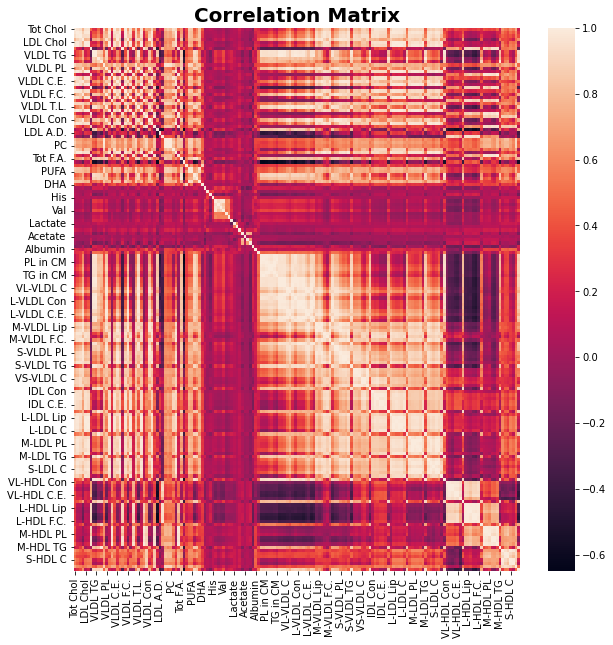

In [66]:
plt.figure(figsize = (10, 10))
corrMatrix = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_no_eid_shuffled.rename(
    columns = {'target' : 'Phenotype', '23400-0.0' : 'Tot Chol', '23404-0.0' : 'LDL Chol', '23408-0.0' : 'VLDL TG', '23412-0.0' : 'VLDL PL', 
               '23416-0.0' : 'VLDL C.E.', '23420-0.0' : 'VLDL F.C.', '23424-0.0' : 'VLDL T.L.', '23428-0.0' : 'VLDL Con', 
               '23432-0.0' : 'LDL A.D.', '23437-0.0' : 'PC', '23442-0.0' : 'Tot F.A.', '23446-0.0' : 'PUFA', 
               '23450-0.0' : 'DHA', '23463-0.0' : 'His', '23467-0.0' : 'Val', '23471-0.0' : 'Lactate', 
               '23475-0.0' : 'Acetate', '23479-0.0' : 'Albumin', '23483-0.0' : 'PL in CM', '23487-0.0' : 'TG in CM', 
               '23491-0.0' : 'VL-VLDL C', '23495-0.0' : 'L-VLDL Con', '23499-0.0' : 'L-VLDL C.E.', 
               '23503-0.0' : 'M-VLDL Lip', '23507-0.0' : 'M-VLDL F.C.', '23511-0.0' : 'S-VLDL PL', 
               '23515-0.0' : 'S-VLDL TG', '23519-0.0' : 'VS-VLDL C', '23523-0.0' : 'IDL Con', '23527-0.0' : 'IDL C.E.', 
               '23531-0.0' : 'L-LDL Lip', '23535-0.0' : 'L-LDL C', '23539-0.0' : 'M-LDL PL', '23543-0.0' : 'M-LDL TG', 
               '23547-0.0' : 'S-LDL C', '23551-0.0' : 'VL-HDL Con', '23555-0.0' : 'VL-HDL C.E.', 
               '23559-0.0' : 'L-HDL Lip', '23563-0.0' : 'L-HDL F.C.', '23567-0.0' : 'M-HDL PL', 
               '23571-0.0' : 'M-HDL TG', '23575-0.0' : 'S-HDL C'}).drop(columns = ['31-0.0', 'Age Covariate', 'Phenotype', 'Ethnicity_0', 'Ethnicity_1', 
                               'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']).corr()
sns.heatmap(corrMatrix)
plt.title('Correlation Matrix', fontweight = 'bold', fontsize = 20)
plt.show()

Below we cluster the patients based on pearson correlation with complete linkage.

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.


<Figure size 1440x1440 with 0 Axes>

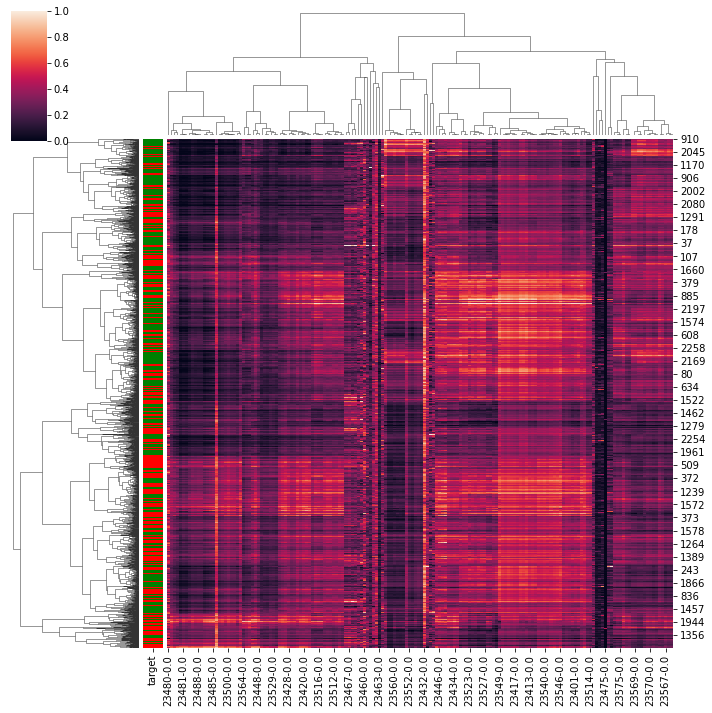

In [67]:
color_dict=dict(zip(np.unique(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_no_eid_shuffled['target']),np.array(['green','red'])))
target_df = pd.DataFrame({"target":prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_no_eid_shuffled['target']})
row_colors = target_df.target.map(color_dict)

plt.figure(figsize = (20, 20))
sns.clustermap(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_no_eid_shuffled.
               drop(columns = ['31-0.0', 'Age Covariate', 'target', 'Ethnicity_0', 'Ethnicity_1', 
                               'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']), metric = 'correlation', method = 'complete', row_colors = row_colors)
plt.show()

Below we show these clusters again with another dendrogram and without the data.

Text(0, 0.5, 'Distance')

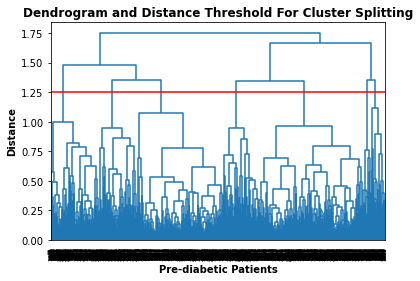

In [68]:
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import dendrogram, linkage

Y=pdist(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_no_eid_shuffled.drop(columns = ['31-0.0', 'Age Covariate', 'target', 'Ethnicity_0', 'Ethnicity_1', 
                               'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']), 'correlation')

Z=linkage(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_no_eid_shuffled.drop(columns = ['31-0.0', 'Age Covariate', 'target', 'Ethnicity_0', 'Ethnicity_1', 
                               'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']), 'complete', 'correlation')
dendrogram(Z, color_threshold=0)
plt.axhline(y = 1.25, color = 'red')
plt.title('Dendrogram and Distance Threshold For Cluster Splitting', fontweight = 'bold')
plt.xlabel('Pre-diabetic Patients', fontweight = 'bold')
plt.ylabel('Distance', fontweight = 'bold')


Below we show these clusters again with another dendrogram without the title and x axis ticks.

([], [])

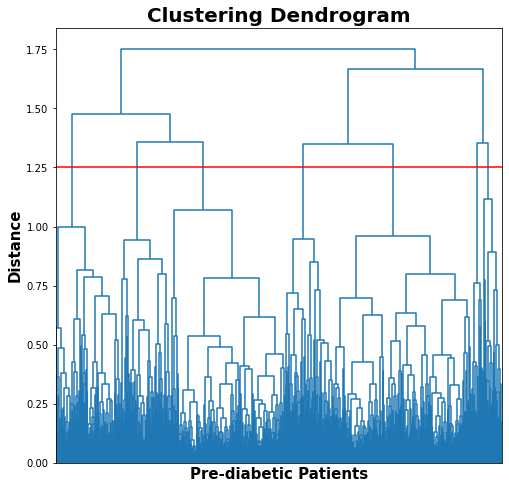

In [69]:
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import dendrogram, linkage

Y=pdist(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_no_eid_shuffled.drop(columns = ['31-0.0', 'Age Covariate', 'target', 'Ethnicity_0', 'Ethnicity_1', 
                               'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']), 'correlation')

Z=linkage(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_no_eid_shuffled.drop(columns = ['31-0.0', 'Age Covariate', 'target', 'Ethnicity_0', 'Ethnicity_1', 
                               'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']), 'complete', 'correlation')
plt.figure(figsize=(8,8))
dendrogram(Z, color_threshold=0)
plt.axhline(y = 1.25, color = 'red')
plt.xlabel('Pre-diabetic Patients', fontweight = 'bold', fontsize = 15)
plt.ylabel('Distance', fontweight = 'bold', fontsize = 15)
plt.title('Clustering Dendrogram', fontweight = 'bold', fontsize = 20)
plt.xticks([], [])


Below we use the fcluster function to create the clusters from the dendrogram at a distance threshold of 1.25, which gives us 7 clusters if we draw a straight horizontal line at y = 1.25.

In [70]:
from scipy.cluster.hierarchy import ward, fcluster
# Clusterize the data
threshold = 1.25 # Threshold is based on the distance from the dendrogram above - 1.25 gives us 7 clusters
labels = fcluster(Z, threshold, criterion='distance')

# Show the cluster
labels

array([5, 7, 3, ..., 7, 5, 5], dtype=int32)

Below we show the cophenet score.

In [71]:
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist

c, coph_dists = cophenet(Z, Y)
c

0.4431164306011676

Below we show that the greatest distance between cluster formation, verifying we used the correct distance at 1.25 to take our clusters since this value lies within the range from 1.11 to 1.35. We use the reference: https://joernhees.de/blog/2015/08/26/scipy-hierarchical-clustering-and-dendrogram-tutorial/

In [72]:
Z[-10:,2]

array([0.96071635, 0.99832813, 1.0710844 , 1.11445846, 1.34906375,
       1.35478942, 1.35587529, 1.47836758, 1.6652216 , 1.75299939])

Below we show the knee plot. It tries to find the clustering step where the acceleration of distance growth is the biggest (the "strongest elbow" of the blue line graph below, which is the highest value of the green graph below). This demonstrates that 7 clusters is the optimal cutoff due to its flattening of the blue line and the peak of the green line. https://joernhees.de/blog/2015/08/26/scipy-hierarchical-clustering-and-dendrogram-tutorial/

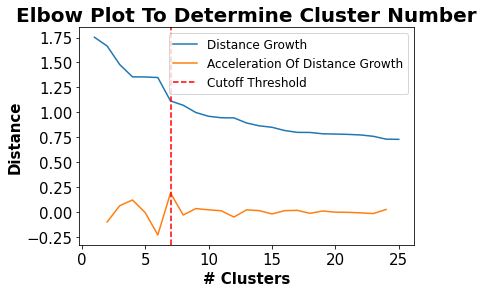

clusters: 7


In [73]:
last = Z[-25:, 2]
last_rev = last[::-1]
idxs = np.arange(1, len(last) + 1)
plt.plot(idxs, last_rev, label = 'Distance Growth')

acceleration = np.diff(last, 2)  # 2nd derivative of the distances
acceleration_rev = acceleration[::-1]
plt.plot(idxs[:-2] + 1, acceleration_rev, label = 'Acceleration Of Distance Growth')
plt.axvline(x = 7, color = 'red', linestyle = '--', label = 'Cutoff Threshold')
plt.ylabel('Distance', fontweight = 'bold', fontsize = 15)
plt.xlabel('# Clusters', fontweight = 'bold', fontsize = 15)
plt.title('Elbow Plot To Determine Cluster Number', fontweight = 'bold', fontsize = 20)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.legend(fontsize = 'large')
plt.show()
k = acceleration_rev.argmax() + 2  # if idx 0 is the max of this we want 2 clusters
print("clusters:", k)


Below we add the clusters to the dataframe.

In [74]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled['labels'] = labels
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,31-0.0,Age Covariate,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels
135,0.368701,0.354952,0.317711,0.313315,0.410439,0.456313,0.268151,0.266144,0.243557,0.245425,...,1,0,1,0,0,0,0,0,1,5
1089,0.178951,0.183385,0.195076,0.286471,0.185227,0.260847,0.147217,0.412621,0.395243,0.290853,...,1,1,1,0,0,0,0,0,1,7
1490,0.529190,0.523941,0.545857,0.559230,0.528915,0.556045,0.305662,0.346235,0.312944,0.311998,...,0,1,1,0,0,0,0,0,0,3
420,0.362598,0.340459,0.346718,0.345140,0.400694,0.405771,0.288623,0.224699,0.229556,0.127227,...,0,1,1,0,0,0,0,0,1,5
2098,0.626181,0.509336,0.463818,0.313156,0.602129,0.601268,0.645094,0.132783,0.105471,0.206871,...,0,0,0,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358,0.409575,0.430062,0.400141,0.398334,0.490266,0.517041,0.190667,0.248019,0.241892,0.191515,...,1,1,1,0,0,0,0,0,1,5
1977,0.454162,0.399073,0.344602,0.296642,0.483616,0.510597,0.412591,0.167026,0.155478,0.169499,...,0,1,1,0,0,0,0,0,1,3
79,0.292815,0.276207,0.258656,0.276523,0.333195,0.368991,0.247287,0.265757,0.259607,0.191012,...,1,1,1,0,0,0,0,0,1,7
1904,0.299452,0.309983,0.311656,0.308671,0.366862,0.382527,0.176149,0.265407,0.261677,0.192154,...,1,1,1,0,0,0,0,0,1,5


In [75]:
#prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']].to_csv('prediabetic_patient_eid_and_group_labels_for_scott.csv')

Below we name all metabolites.

In [76]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled.rename(
    columns = {'23400-0.0' : 'Total Cholesterol', '23401-0.0' : 'Total Cholesterol Minus HDL-C', 
               '23402-0.0' : 'Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)', '23403-0.0' : 'VLDL Cholesterol', 
               '23404-0.0' : 'Clinical LDL Cholesterol', '23405-0.0' : 'LDL Cholesterol', '23406-0.0' : 'HDL Cholesterol', 
               '23407-0.0' : 'Total Triglycerides', '23408-0.0' : 'Triglycerides in VLDL', 
               '23409-0.0' : 'Triglycerides in LDL', '23410-0.0' : 'Triglycerides in HDL', 
               '23411-0.0' : 'Total Phospholipids in Lipoprotein Particles', '23412-0.0' : 'Phospholipids in VLDL', 
               '23413-0.0' : 'Phospholipids in LDL', '23414-0.0' : 'Phospholipids in HDL', 
               '23415-0.0' : 'Total Esterified Cholesterol', '23416-0.0' : 'Cholesteryl Esters in VLDL', 
               '23417-0.0' : 'Cholesteryl Esters in LDL', '23418-0.0' : 'Cholesteryl Esters in HDL', 
               '23419-0.0' : 'Total Free Cholesterol', '23420-0.0' : 'Free Cholesterol in VLDL', 
               '23421-0.0' : 'Free Cholesterol in LDL', '23422-0.0' : 'Free Cholesterol in HDL', 
               '23423-0.0' : 'Total Lipids in Lipoprotein Particles', '23424-0.0' : 'Total Lipids in VLDL', 
               '23425-0.0' : 'Total Lipids in LDL', '23426-0.0' : 'Total Lipids in HDL', 
               '23427-0.0' : 'Total Concentration of Lipoprotein Particles', 
               '23428-0.0' : 'Concentration of VLDL Particles', '23429-0.0' : 'Concentration of LDL Particles', 
               '23430-0.0' : 'Concentration of HDL Particles', '23431-0.0' : 'Average Diameter for VLDL Particles', 
               '23432-0.0' : 'Average Diameter for LDL Particles', '23433-0.0' : 'Average Diameter for HDL Particles', 
               '23434-0.0' : 'Phosphoglycerides', '23436-0.0' : 'Total Cholines', '23437-0.0' : 'Phosphatidylcholines', 
               '23438-0.0' : 'Sphingomyelins', '23439-0.0' : 'Apolipoprotein B', '23440-0.0' : 'Apolipoprotein A1', 
               '23442-0.0' : 'Total Fatty Acids', '23443-0.0' : 'Degree of Unsaturation', 
               '23444-0.0' : 'Omega-3 Fatty Acids', '23445-0.0' : 'Omega-6 Fatty Acids', 
               '23446-0.0' : 'Polyunsaturated Fatty Acids', '23447-0.0' : 'Monounsaturated Fatty Acids', 
               '23448-0.0' : 'Saturated Fatty Acids', '23449-0.0' : 'Linoleic Acid', 
               '23450-0.0' : 'Docosahexaenoic Acid', '23460-0.0' : 'Alanine', '23461-0.0' : 'Glutamine', 
               '23462-0.0' : 'Glycine', '23463-0.0' : 'Histidine', 
               '23464-0.0' : 'Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine)', 
               '23465-0.0' : 'Isoleucine', '23466-0.0' : 'Leucine', '23467-0.0' : 'Valine', '23468-0.0' : 'Phenylalanine', 
               '23469-0.0' : 'Tyrosine', '23470-0.0' : 'Glucose', '23471-0.0' : 'Lactate', '23472-0.0' : 'Pyruvate', 
               '23473-0.0' : 'Citrate', '23474-0.0' : '3-Hydroxybutyrate', '23475-0.0' : 'Acetate', 
               '23476-0.0' : 'Acetoacetate', '23477-0.0' : 'Acetone', '23478-0.0' : 'Creatinine', 
               '23479-0.0' : 'Albumin', '23480-0.0' : 'Glycoprotein Acetyls', 
               '23481-0.0' : 'Concentration of Chylomicrons and Extremely Large VLDL Particles', 
               '23482-0.0' : 'Total Lipids in Chylomicrons and Extremely Large VLDL', 
               '23483-0.0' : 'Phospholipids in Chylomicrons and Extremely Large VLDL', 
               '23484-0.0' : 'Cholesterol in Chylomicrons and Extremely Large VLDL', 
               '23485-0.0' : 'Cholesteryl Esters in Chylomicrons and Extremely Large VLDL', 
               '23486-0.0' : 'Free Cholesterol in Chylomicrons and Extremely Large VLDL', 
               '23487-0.0' : 'Triglycerides in Chylomicrons and Extremely Large VLDL', '23488-0.0' : 'Concentration of Very Large VLDL Particles', '23489-0.0' : 'Total Lipids in Very Large VLDL', '23490-0.0' : 'Phospholipids in Very Large VLDL', '23491-0.0' : 'Cholesterol in Very Large VLDL', '23492-0.0' : 'Cholesteryl Esters in Very Large VLDL', '23493-0.0' : 'Free Cholesterol in Very Large VLDL', '23494-0.0' : 'Triglycerides in Very Large VLDL', '23495-0.0' : 'Concentration of Large VLDL Particles', '23496-0.0' : 'Total Lipids in Large VLDL', '23497-0.0' : 'Phospholipids in Large VLDL', '23498-0.0' : 'Cholesterol in Large VLDL', '23499-0.0' : 'Cholesteryl Esters in Large VLDL', '23500-0.0' : 'Free Cholesterol in Large VLDL', '23501-0.0' : 'Triglycerides in Large VLDL', '23502-0.0' : 'Concentration of Medium VLDL Particles', '23503-0.0' : 'Total Lipids in Medium VLDL', '23504-0.0' : 'Phospholipids in Medium VLDL', '23505-0.0' : 'Cholesterol in Medium VLDL', '23506-0.0' : 'Cholesteryl Esters in Medium VLDL', '23507-0.0' : 'Free Cholesterol in Medium VLDL', '23508-0.0' : 'Triglycerides in Medium VLDL', '23509-0.0' : 'Concentration of Small VLDL Particles', '23510-0.0' : 'Total Lipids in Small VLDL', '23511-0.0' : 'Phospholipids in Small VLDL', '23512-0.0' : 'Cholesterol in Small VLDL', '23513-0.0' : 'Cholesteryl Esters in Small VLDL', '23514-0.0' : 'Free Cholesterol in Small VLDL', '23515-0.0' : 'Triglycerides in Small VLDL', '23516-0.0' : 'Concentration of Very Small VLDL Particles', '23517-0.0' : 'Total Lipids in Very Small VLDL', '23518-0.0' : 'Phospholipids in Very Small VLDL', '23519-0.0' : 'Cholesterol in Very Small VLDL', '23520-0.0' : 'Cholesteryl Esters in Very Small VLDL', '23521-0.0' : 'Free Cholesterol in Very Small VLDL', '23522-0.0' : 'Triglycerides in Very Small VLDL', '23523-0.0' : 'Concentration of IDL Particles', '23524-0.0' : 'Total Lipids in IDL', '23525-0.0' : 'Phospholipids in IDL', '23526-0.0' : 'Cholesterol in IDL', '23527-0.0' : 'Cholesteryl Esters in IDL', '23528-0.0' : 'Free Cholesterol in IDL', '23529-0.0' : 'Triglycerides in IDL', '23530-0.0' : 'Concentration of Large LDL Particles', '23531-0.0' : 'Total Lipids in Large LDL', '23532-0.0' : 'Phospholipids in Large LDL', '23533-0.0' : 'Cholesterol in Large LDL', '23534-0.0' : 'Cholesteryl Esters in Large LDL', '23535-0.0' : 'Free Cholesterol in Large LDL', '23536-0.0' : 'Triglycerides in Large LDL', '23537-0.0' : 'Concentration of Medium LDL Particles', '23538-0.0' : 'Total Lipids in Medium LDL', '23539-0.0' : 'Phospholipids in Medium LDL', '23540-0.0' : 'Cholesterol in Medium LDL', '23541-0.0' : 'Cholesteryl Esters in Medium LDL', '23542-0.0' : 'Free Cholesterol in Medium LDL', '23543-0.0' : 'Triglycerides in Medium LDL', '23544-0.0' : 'Concentration of Small LDL Particles', '23545-0.0' : 'Total Lipids in Small LDL', '23546-0.0' : 'Phospholipids in Small LDL', '23547-0.0' : 'Cholesterol in Small LDL', '23548-0.0' : 'Cholesteryl Esters in Small LDL', '23549-0.0' : 'Free Cholesterol in Small LDL', '23550-0.0' : 'Triglycerides in Small LDL', '23551-0.0' : 'Concentration of Very Large HDL Particles', '23552-0.0' : 'Total Lipids in Very Large HDL', '23553-0.0' : 'Phospholipids in Very Large HDL', '23554-0.0' : 'Cholesterol in Very Large HDL', '23555-0.0' : 'Cholesteryl Esters in Very Large HDL', '23556-0.0' : 'Free Cholesterol in Very Large HDL', '23557-0.0' : 'Triglycerides in Very Large HDL', '23558-0.0' : 'Concentration of Large HDL Particles', '23559-0.0' : 'Total Lipids in Large HDL', '23560-0.0' : 'Phospholipids in Large HDL', '23561-0.0' : 'Cholesterol in Large HDL', '23562-0.0' : 'Cholesteryl Esters in Large HDL', '23563-0.0' : 'Free Cholesterol in Large HDL', '23564-0.0' : 'Triglycerides in Large HDL', '23565-0.0' : 'Concentration of Medium HDL Particles', '23566-0.0' : 'Total Lipids in Medium HDL', '23567-0.0' : 'Phospholipids in Medium HDL', '23568-0.0' : 'Cholesterol in Medium HDL', '23569-0.0' : 'Cholesteryl Esters in Medium HDL', '23570-0.0' : 'Free Cholesterol in Medium HDL', '23571-0.0' : 'Triglycerides in Medium HDL', '23572-0.0' : 'Concentration of Small HDL Particles', '23573-0.0' : 'Total Lipids in Small HDL', '23574-0.0' : 'Phospholipids in Small HDL', '23575-0.0' : 'Cholesterol in Small HDL', '23576-0.0' :  'Cholesteryl Esters in Small HDL', '23577-0.0' : 'Free Cholesterol in Small HDL', '23578-0.0' : 'Triglycerides in Small HDL'})
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names['labels'] = labels
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names

,Total Cholesterol,Total Cholesterol Minus HDL-C,"Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)",VLDL Cholesterol,Clinical LDL Cholesterol,LDL Cholesterol,HDL Cholesterol,Total Triglycerides,Triglycerides in VLDL,Triglycerides in LDL,...,31-0.0,Age Covariate,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels
135,0.368701,0.354952,0.317711,0.313315,0.410439,0.456313,0.268151,0.266144,0.243557,0.245425,...,1,0,1,0,0,0,0,0,1,5
1089,0.178951,0.183385,0.195076,0.286471,0.185227,0.260847,0.147217,0.412621,0.395243,0.290853,...,1,1,1,0,0,0,0,0,1,7
1490,0.529190,0.523941,0.545857,0.559230,0.528915,0.556045,0.305662,0.346235,0.312944,0.311998,...,0,1,1,0,0,0,0,0,0,3
420,0.362598,0.340459,0.346718,0.345140,0.400694,0.405771,0.288623,0.224699,0.229556,0.127227,...,0,1,1,0,0,0,0,0,1,5
2098,0.626181,0.509336,0.463818,0.313156,0.602129,0.601268,0.645094,0.132783,0.105471,0.206871,...,0,0,0,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358,0.409575,0.430062,0.400141,0.398334,0.490266,0.517041,0.190667,0.248019,0.241892,0.191515,...,1,1,1,0,0,0,0,0,1,5
1977,0.454162,0.399073,0.344602,0.296642,0.483616,0.510597,0.412591,0.167026,0.155478,0.169499,...,0,1,1,0,0,0,0,0,1,3
79,0.292815,0.276207,0.258656,0.276523,0.333195,0.368991,0.247287,0.265757,0.259607,0.191012,...,1,1,1,0,0,0,0,0,1,7
1904,0.299452,0.309983,0.311656,0.308671,0.366862,0.382527,0.176149,0.265407,0.261677,0.192154,...,1,1,1,0,0,0,0,0,1,5


Below we save the heatmap above without the title for the paper.

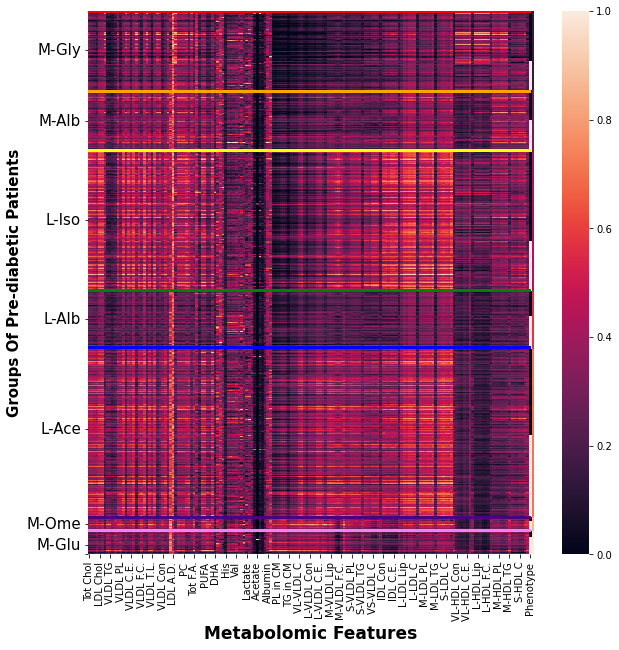

In [77]:
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_with_normalized_labels = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled.drop_duplicates()
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_with_normalized_labels['labels'] = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_with_normalized_labels['labels']/7
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_with_normalized_labels_with_phenotype = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_with_normalized_labels.drop_duplicates()
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_with_normalized_labels_with_phenotype = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_with_normalized_labels_with_phenotype.rename(
    columns = {'target' : 'Phenotype', '23400-0.0' : 'Tot Chol', '23404-0.0' : 'LDL Chol', '23408-0.0' : 'VLDL TG', '23412-0.0' : 'VLDL PL', 
               '23416-0.0' : 'VLDL C.E.', '23420-0.0' : 'VLDL F.C.', '23424-0.0' : 'VLDL T.L.', '23428-0.0' : 'VLDL Con', 
               '23432-0.0' : 'LDL A.D.', '23437-0.0' : 'PC', '23442-0.0' : 'Tot F.A.', '23446-0.0' : 'PUFA', 
               '23450-0.0' : 'DHA', '23463-0.0' : 'His', '23467-0.0' : 'Val', '23471-0.0' : 'Lactate', 
               '23475-0.0' : 'Acetate', '23479-0.0' : 'Albumin', '23483-0.0' : 'PL in CM', '23487-0.0' : 'TG in CM', 
               '23491-0.0' : 'VL-VLDL C', '23495-0.0' : 'L-VLDL Con', '23499-0.0' : 'L-VLDL C.E.', 
               '23503-0.0' : 'M-VLDL Lip', '23507-0.0' : 'M-VLDL F.C.', '23511-0.0' : 'S-VLDL PL', 
               '23515-0.0' : 'S-VLDL TG', '23519-0.0' : 'VS-VLDL C', '23523-0.0' : 'IDL Con', '23527-0.0' : 'IDL C.E.', 
               '23531-0.0' : 'L-LDL Lip', '23535-0.0' : 'L-LDL C', '23539-0.0' : 'M-LDL PL', '23543-0.0' : 'M-LDL TG', 
               '23547-0.0' : 'S-LDL C', '23551-0.0' : 'VL-HDL Con', '23555-0.0' : 'VL-HDL C.E.', 
               '23559-0.0' : 'L-HDL Lip', '23563-0.0' : 'L-HDL F.C.', '23567-0.0' : 'M-HDL PL', 
               '23571-0.0' : 'M-HDL TG', '23575-0.0' : 'S-HDL C'})
plt.figure(figsize = (10, 10))
heatmap_by_clusters = sns.heatmap(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_with_normalized_labels_with_phenotype.sort_values(by = ['labels', 'Phenotype']).drop(columns = ['eid', '31-0.0', 'Age Covariate', 'Ethnicity_0', 'Ethnicity_1', 
                               'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']))

ax = heatmap_by_clusters  # this is the important part
# Horizontal lines
ax.plot([0, 168], [0, 0], '-', lw = 3, color = 'red')
#ax.plot([0, 168], [2330, 2330], '-', lw = 3, color = 'orange')
ax.plot([0, 168], [345, 345], '-', lw = 3, color = 'orange')
ax.plot([0, 168], [600, 600], '-', lw = 3, color = 'yellow')
ax.plot([0, 168], [1200, 1200], '-', lw = 3, color = 'green')
ax.plot([0, 168], [1445, 1445], '-', lw = 3, color = 'blue')
ax.plot([0, 168], [2180, 2180], '-', lw = 3, color = 'indigo')
ax.plot([0, 168], [2235, 2235], '-', lw = 3, color = 'violet')
# Vertical lines at start and end
#ax.plot([0, 0], [0, 2339], 'c-', lw = 4)
#ax.plot([170, 170], [0, 2339], 'c-', lw = 4)

cluster_labels = ['M-Gly', 'M-Alb', 'L-Iso', 'L-Alb', 'L-Ace', 'M-Ome', 'M-Glu', '']
length = [170, 475, 900, 1325, 1800, 2208, 2300, 2339]

ax.set_xlabel('Metabolomic Features', fontsize = 17, fontweight = 'bold')
ax.set_ylabel('Groups Of Pre-diabetic Patients', fontsize = 15, fontweight = 'bold')
#ax.set_title('Heatmap Of Metabolomic Features With Phenotype', fontsize = 15, fontweight = 'bold')
ax.set_yticks(length)
ax.set_yticklabels(cluster_labels)
ax.tick_params(axis='y', which='major', labelsize=15)
plt.show()

Below we standardize the columns so we can use them for PCA, TSNE, and Hierarchical clustering.

In [78]:
from sklearn.preprocessing import StandardScaler

prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized = StandardScaler().fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled.drop(columns = ['eid', '31-0.0', 'Age Covariate', 'target', 'Ethnicity_0', 'Ethnicity_1', 
                               'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5', 'labels']))
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized

array([[-0.15240657, -0.11342136, -0.24682497, ...,  0.54434238,
         0.62801218,  0.82116499],
       [-1.49636776, -1.29475438, -1.08016118, ..., -1.23541761,
        -0.29404542,  1.71959202],
       [ 0.98430874,  1.05015804,  1.30348566, ..., -0.80541133,
         0.43897852,  1.07251964],
       ...,
       [-0.68989146, -0.65562377, -0.64811827, ..., -0.097066  ,
        -0.32189678,  0.35000311],
       [-0.64288518, -0.42306227, -0.28797191, ..., -0.32626147,
        -0.4759681 ,  0.31980389],
       [-1.30645046, -0.96934471, -1.08502802, ..., -0.84459909,
        -1.57680769, -0.70093001]])

In [79]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
principalDf

,principal component 1,principal component 2
0,1.268173,3.140821
1,-2.375988,12.324124
2,11.765029,0.061316
3,-1.059694,1.914654
4,5.386410,-15.273719
...,...,...
2334,3.241321,2.877231
2335,0.571538,-4.665764
2336,-2.863991,5.057415
2337,-1.930129,5.794736


In [80]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,principal component 1,principal component 2,index,labels
0,1.268173,3.140821,135,5
1,-2.375988,12.324124,1089,7
2,11.765029,0.061316,1490,3
3,-1.059694,1.914654,420,5
4,5.386410,-15.273719,2098,3
...,...,...,...,...
2334,3.241321,2.877231,358,5
2335,0.571538,-4.665764,1977,3
2336,-2.863991,5.057415,79,7
2337,-1.930129,5.794736,1904,5


# Here we make a publication finalized PCA plot.

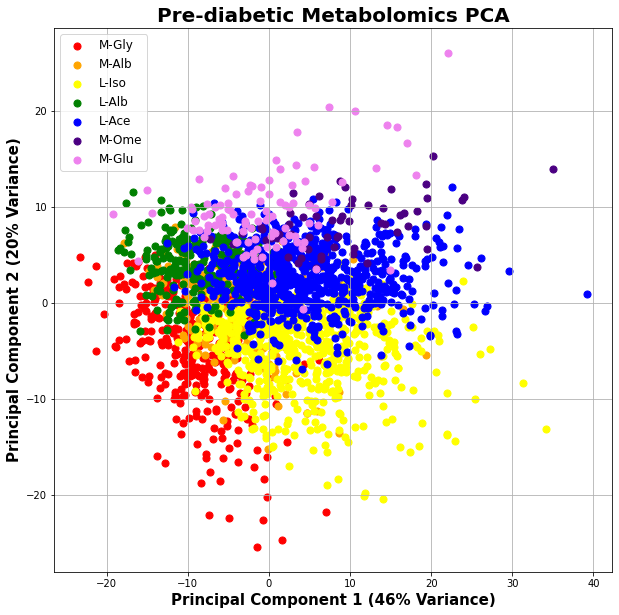

In [81]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1 (46% Variance)', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('Principal Component 2 (20% Variance)', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics PCA', fontsize = 20, fontweight = 'bold')
labels = ['M-Gly', 'M-Alb', 'L-Iso', 'L-Alb', 'L-Ace', 'M-Ome', 'M-Glu', '']
group_numbers = [1, 2, 3, 4, 5, 6, 7]

colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']
for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(labels, fontsize = 'large')
ax.grid()


Below we create the scree plot showing the %variance explained by the first 2 principal components.

[46.05 20.37]


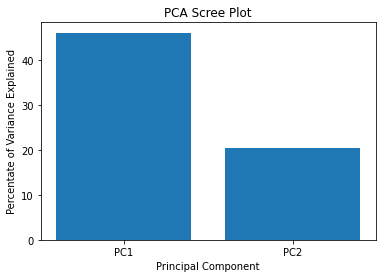

In [82]:
percent_variance = np.round(pca.explained_variance_ratio_* 100, decimals =2)
print(percent_variance)
columns = ['PC1', 'PC2']
plt.bar(x= range(1,3), height=percent_variance, tick_label=columns)
plt.ylabel('Percentate of Variance Explained')
plt.xlabel('Principal Component')
plt.title('PCA Scree Plot')
plt.show()

Below we repeat the pca with three principal components.

In [83]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3'])
principalDf

,principal component 1,principal component 2,principal component 3
0,1.268173,3.140821,2.770285
1,-2.375988,12.324124,6.975277
2,11.765029,0.061316,1.050047
3,-1.059694,1.914654,0.888674
4,5.386410,-15.273719,5.211870
...,...,...,...
2334,3.241321,2.877231,-3.925374
2335,0.571538,-4.665764,1.375291
2336,-2.863991,5.057415,2.812061
2337,-1.930129,5.794736,-0.351810


In [84]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,principal component 1,principal component 2,principal component 3,index,labels
0,1.268173,3.140821,2.770285,135,5
1,-2.375988,12.324124,6.975277,1089,7
2,11.765029,0.061316,1.050047,1490,3
3,-1.059694,1.914654,0.888674,420,5
4,5.386410,-15.273719,5.211870,2098,3
...,...,...,...,...,...
2334,3.241321,2.877231,-3.925374,358,5
2335,0.571538,-4.665764,1.375291,1977,3
2336,-2.863991,5.057415,2.812061,79,7
2337,-1.930129,5.794736,-0.351810,1904,5


Below we create the scree plot showing the %variance explained by the first 3 principal components.

[46.05 20.37 11.83]


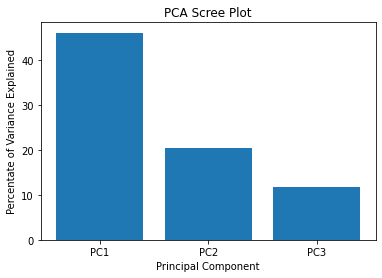

In [85]:
percent_variance = np.round(pca.explained_variance_ratio_* 100, decimals =2)
print(percent_variance)
columns = ['PC1', 'PC2', 'PC3']
plt.bar(x= range(1,4), height=percent_variance, tick_label=columns)
plt.ylabel('Percentate of Variance Explained')
plt.xlabel('Principal Component')
plt.title('PCA Scree Plot')
plt.show()

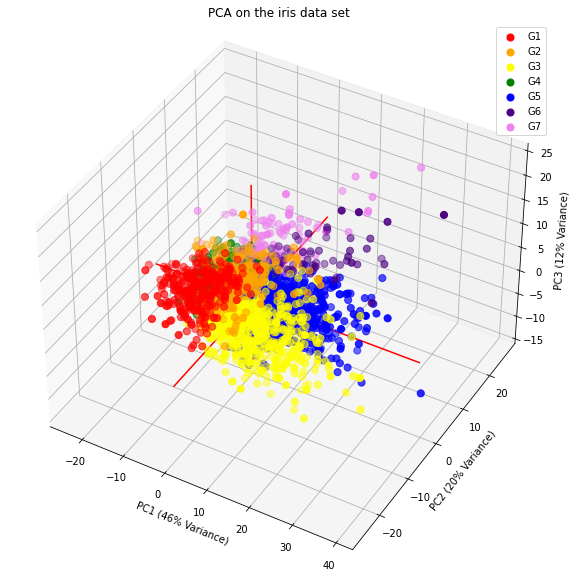

In [86]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(111, projection='3d')
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
group_numbers = [1, 2, 3, 4, 5, 6, 7]

colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']
for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , finalDf.loc[indicesToKeep, 'principal component 3']
               , c = color
               , s = 50)
ax.legend(labels)
ax.grid()
 
# make simple, bare axis lines through space:
xAxisLine = ((min(finalDf['principal component 1']), max(finalDf['principal component 1'])), (0, 0), (0,0))
ax.plot(xAxisLine[0], xAxisLine[1], xAxisLine[2], 'r')
yAxisLine = ((0, 0), (min(finalDf['principal component 2']), max(finalDf['principal component 2'])), (0,0))
ax.plot(yAxisLine[0], yAxisLine[1], yAxisLine[2], 'r')
zAxisLine = ((0, 0), (0,0), (min(finalDf['principal component 3']), max(finalDf['principal component 3'])))
ax.plot(zAxisLine[0], zAxisLine[1], zAxisLine[2], 'r')
 
from mpl_toolkits.mplot3d import Axes3D

ax.view_init(elev=40.)
    
# label the axes
ax.set_xlabel("PC1 (46% Variance)")
ax.set_ylabel("PC2 (20% Variance)")
ax.set_zlabel("PC3 (12% Variance)")
ax.set_title("PCA on the iris data set")
plt.show()

# TSNE with perplexity 30 - shows not really any distinct groups

In [87]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state = 100)
tsne_components = tsne.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
principalDf = pd.DataFrame(data = tsne_components
             , columns = ['tsne component 1', 'tsne component 2'])
principalDf

,tsne component 1,tsne component 2
0,7.644615,-25.513697
1,-2.086295,-44.090633
2,42.796921,-2.833981
3,2.064646,-18.256361
4,17.084208,40.797504
...,...,...
2334,17.994013,-6.697674
2335,-7.995593,26.093616
2336,-6.134916,-35.060814
2337,-7.877572,-24.989275


In [88]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,tsne component 1,tsne component 2,index,labels
0,7.644615,-25.513697,135,5
1,-2.086295,-44.090633,1089,7
2,42.796921,-2.833981,1490,3
3,2.064646,-18.256361,420,5
4,17.084208,40.797504,2098,3
...,...,...,...,...
2334,17.994013,-6.697674,358,5
2335,-7.995593,26.093616,1977,3
2336,-6.134916,-35.060814,79,7
2337,-7.877572,-24.989275,1904,5


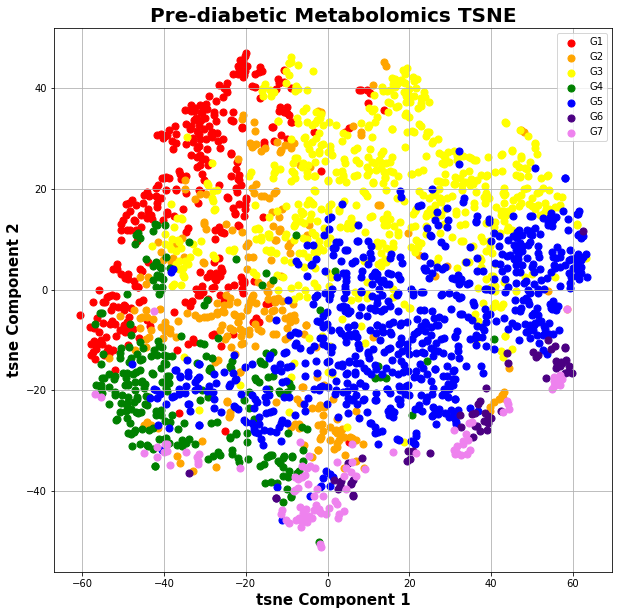

In [89]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()


# TSNE with perplexity 30 with correlation distance - a little nicer than euclidean

In [90]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, metric = 'correlation', perplexity = 30, random_state = 100)
tsne_components = tsne.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
principalDf = pd.DataFrame(data = tsne_components
             , columns = ['tsne component 1', 'tsne component 2'])
principalDf

'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.


,tsne component 1,tsne component 2
0,25.401035,34.897781
1,20.897251,27.766958
2,35.117779,-23.378456
3,27.375374,15.838115
4,-33.779274,-9.352596
...,...,...
2334,17.972015,-19.110104
2335,-28.564690,-10.080866
2336,18.434658,32.887650
2337,31.819435,13.631183


In [91]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,tsne component 1,tsne component 2,index,labels
0,25.401035,34.897781,135,5
1,20.897251,27.766958,1089,7
2,35.117779,-23.378456,1490,3
3,27.375374,15.838115,420,5
4,-33.779274,-9.352596,2098,3
...,...,...,...,...
2334,17.972015,-19.110104,358,5
2335,-28.564690,-10.080866,1977,3
2336,18.434658,32.887650,79,7
2337,31.819435,13.631183,1904,5


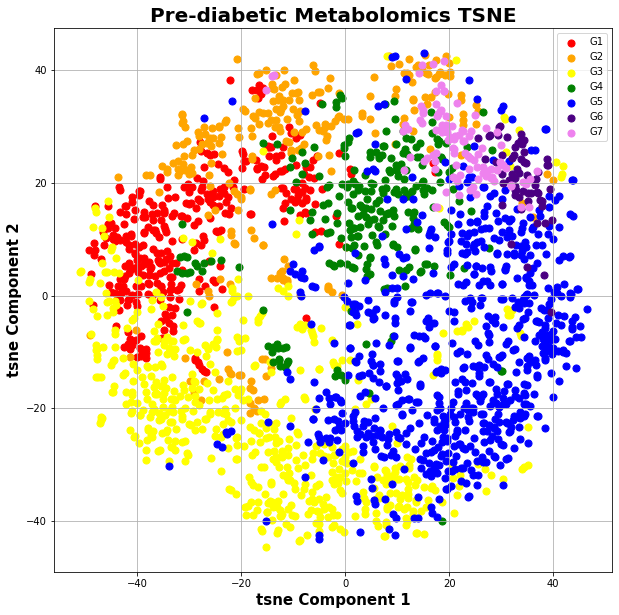

In [92]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()


# TSNE with perplexity 50 - pretty similar to the TSNE above

In [93]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, metric = 'correlation', perplexity = 50, random_state = 100)
tsne_components = tsne.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
principalDf = pd.DataFrame(data = tsne_components
             , columns = ['tsne component 1', 'tsne component 2'])
principalDf

'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.


,tsne component 1,tsne component 2
0,-15.670330,25.461311
1,-12.576018,20.523191
2,-26.807003,-8.975237
3,-18.817911,12.751478
4,22.601460,-9.709295
...,...,...
2334,-13.324155,-10.931525
2335,16.561926,-9.654592
2336,-9.717574,23.391626
2337,-21.477276,11.856875


In [94]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,tsne component 1,tsne component 2,index,labels
0,-15.670330,25.461311,135,5
1,-12.576018,20.523191,1089,7
2,-26.807003,-8.975237,1490,3
3,-18.817911,12.751478,420,5
4,22.601460,-9.709295,2098,3
...,...,...,...,...
2334,-13.324155,-10.931525,358,5
2335,16.561926,-9.654592,1977,3
2336,-9.717574,23.391626,79,7
2337,-21.477276,11.856875,1904,5


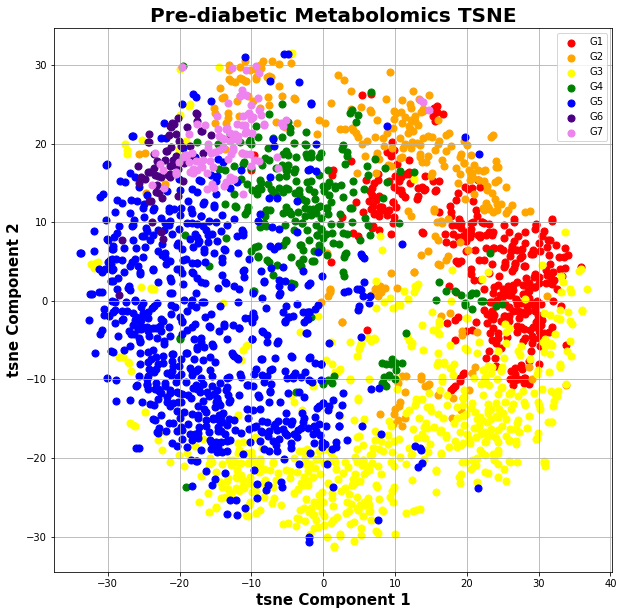

In [95]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()


# TSNE with perplexity 100 - a little better clustered than with perplexity = 50

In [96]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, metric = 'correlation', perplexity = 100, random_state = 100)
tsne_components = tsne.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
principalDf = pd.DataFrame(data = tsne_components
             , columns = ['tsne component 1', 'tsne component 2'])
principalDf

'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.


,tsne component 1,tsne component 2
0,-14.091080,-8.476174
1,-12.963365,-4.875813
2,-11.311074,12.600508
3,-20.659536,-2.186259
4,13.560299,-2.302869
...,...,...
2334,-3.607516,9.720730
2335,10.287828,-1.095894
2336,-12.639800,-7.510870
2337,-14.283463,1.709094


In [97]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,tsne component 1,tsne component 2,index,labels
0,-14.091080,-8.476174,135,5
1,-12.963365,-4.875813,1089,7
2,-11.311074,12.600508,1490,3
3,-20.659536,-2.186259,420,5
4,13.560299,-2.302869,2098,3
...,...,...,...,...
2334,-3.607516,9.720730,358,5
2335,10.287828,-1.095894,1977,3
2336,-12.639800,-7.510870,79,7
2337,-14.283463,1.709094,1904,5


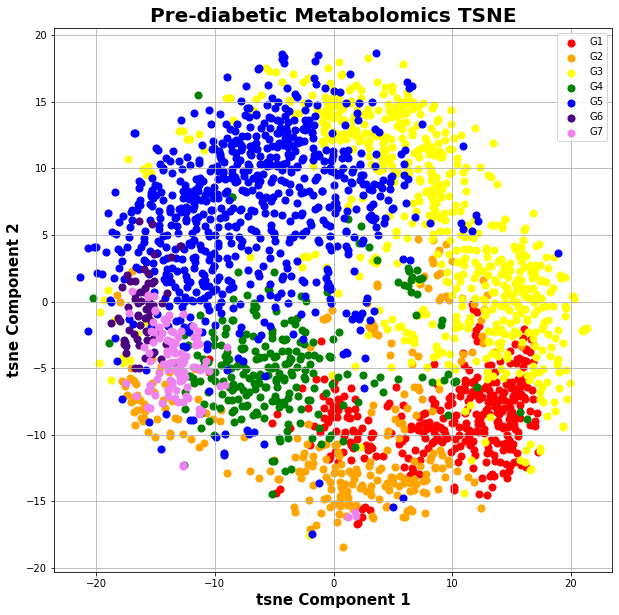

In [98]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()


# TSNE with perplexity 30, learning rate 500 - Not a good clustering

In [99]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, metric = 'correlation', perplexity = 30, learning_rate = 500, random_state = 100)
tsne_components = tsne.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
principalDf = pd.DataFrame(data = tsne_components
             , columns = ['tsne component 1', 'tsne component 2'])
principalDf

'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.


,tsne component 1,tsne component 2
0,-27.659014,37.548504
1,-21.494678,30.893131
2,9.062117,15.407842
3,-20.726408,47.378269
4,1.953114,-37.789822
...,...,...
2334,24.719444,8.794196
2335,2.179238,-32.764637
2336,-27.761215,31.198940
2337,-2.086521,37.074848


In [100]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,tsne component 1,tsne component 2,index,labels
0,-27.659014,37.548504,135,5
1,-21.494678,30.893131,1089,7
2,9.062117,15.407842,1490,3
3,-20.726408,47.378269,420,5
4,1.953114,-37.789822,2098,3
...,...,...,...,...
2334,24.719444,8.794196,358,5
2335,2.179238,-32.764637,1977,3
2336,-27.761215,31.198940,79,7
2337,-2.086521,37.074848,1904,5


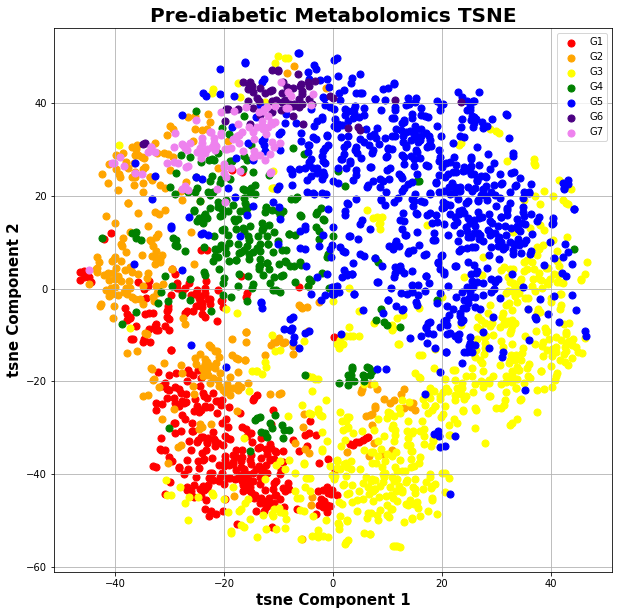

In [101]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()


# TSNE with perplexity 100, learning rate 100 - not much change to learning rate 200

In [102]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, metric = 'correlation', perplexity = 100, learning_rate = 100, random_state = 100)
tsne_components = tsne.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
principalDf = pd.DataFrame(data = tsne_components
             , columns = ['tsne component 1', 'tsne component 2'])
principalDf

'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.


,tsne component 1,tsne component 2
0,15.954687,-4.047523
1,13.896366,-1.169474
2,7.678808,14.009054
3,20.292122,3.774145
4,-11.587757,-6.660805
...,...,...
2334,0.703035,9.799311
2335,-8.943049,-4.543636
2336,14.339972,-3.694601
2337,13.211480,5.475492


In [103]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,tsne component 1,tsne component 2,index,labels
0,15.954687,-4.047523,135,5
1,13.896366,-1.169474,1089,7
2,7.678808,14.009054,1490,3
3,20.292122,3.774145,420,5
4,-11.587757,-6.660805,2098,3
...,...,...,...,...
2334,0.703035,9.799311,358,5
2335,-8.943049,-4.543636,1977,3
2336,14.339972,-3.694601,79,7
2337,13.211480,5.475492,1904,5


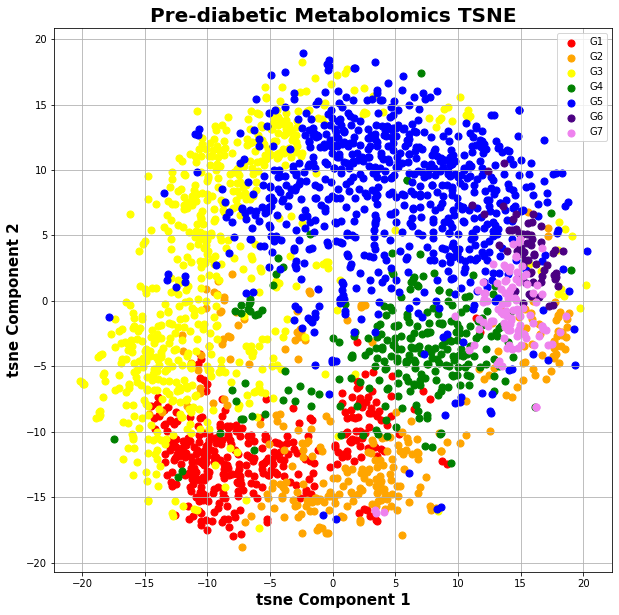

In [104]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()


# TSNE with perplexity 100, learning rate 10 - not much change to learning rate 100

In [105]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, metric = 'correlation', perplexity = 100, learning_rate = 10, random_state = 100)
tsne_components = tsne.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
principalDf = pd.DataFrame(data = tsne_components
             , columns = ['tsne component 1', 'tsne component 2'])
principalDf

'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.


,tsne component 1,tsne component 2
0,15.008081,1.442776
1,12.425174,1.382173
2,2.921071,13.630834
3,17.459970,6.777773
4,-9.385707,-8.339306
...,...,...
2334,-1.285177,8.918396
2335,-7.385590,-5.897528
2336,13.000719,-0.921802
2337,10.582490,7.360182


In [106]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,tsne component 1,tsne component 2,index,labels
0,15.008081,1.442776,135,5
1,12.425174,1.382173,1089,7
2,2.921071,13.630834,1490,3
3,17.459970,6.777773,420,5
4,-9.385707,-8.339306,2098,3
...,...,...,...,...
2334,-1.285177,8.918396,358,5
2335,-7.385590,-5.897528,1977,3
2336,13.000719,-0.921802,79,7
2337,10.582490,7.360182,1904,5


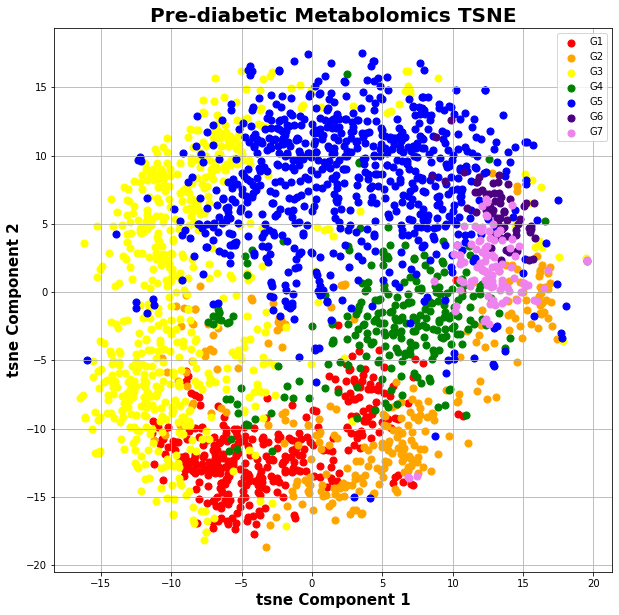

In [107]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()

#  TSNE with perplexity 100, learning rate 10, initializer pca, method exact - probably best so far but not too much of a difference

In [108]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, metric = 'correlation', perplexity = 100, learning_rate = 10, init = 'pca', method = 'exact', random_state = 100)
tsne_components = tsne.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
principalDf = pd.DataFrame(data = tsne_components
             , columns = ['tsne component 1', 'tsne component 2'])
principalDf

'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.


,tsne component 1,tsne component 2
0,14.823388,-8.792929
1,12.256931,-7.278444
2,13.209169,11.543061
3,20.638151,-5.490430
4,-14.483130,-0.571568
...,...,...
2334,4.847423,9.803992
2335,-11.090412,0.490829
2336,11.497460,-9.855682
2337,14.751827,-0.543142


In [109]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,tsne component 1,tsne component 2,index,labels
0,14.823388,-8.792929,135,5
1,12.256931,-7.278444,1089,7
2,13.209169,11.543061,1490,3
3,20.638151,-5.490430,420,5
4,-14.483130,-0.571568,2098,3
...,...,...,...,...
2334,4.847423,9.803992,358,5
2335,-11.090412,0.490829,1977,3
2336,11.497460,-9.855682,79,7
2337,14.751827,-0.543142,1904,5


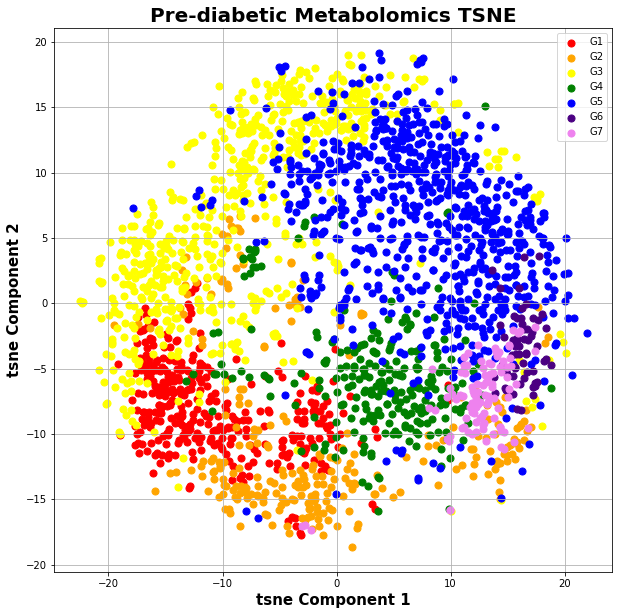

In [110]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()


#  TSNE with perplexity 100, learning rate 10, initializer pca - almost no difference to the one above and runs a lot faster 

In [111]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, metric = 'correlation', perplexity = 100, learning_rate = 10, init = 'pca', random_state = 100)
tsne_components = tsne.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
principalDf = pd.DataFrame(data = tsne_components
             , columns = ['tsne component 1', 'tsne component 2'])
principalDf

'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.


,tsne component 1,tsne component 2
0,12.696479,-8.200035
1,10.633162,-6.617383
2,11.995405,9.812050
3,18.078678,-5.497095
4,-12.970794,-0.105294
...,...,...
2334,4.661713,8.624168
2335,-9.774270,0.666599
2336,9.659782,-8.872305
2337,13.037724,-0.752109


In [112]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,tsne component 1,tsne component 2,index,labels
0,12.696479,-8.200035,135,5
1,10.633162,-6.617383,1089,7
2,11.995405,9.812050,1490,3
3,18.078678,-5.497095,420,5
4,-12.970794,-0.105294,2098,3
...,...,...,...,...
2334,4.661713,8.624168,358,5
2335,-9.774270,0.666599,1977,3
2336,9.659782,-8.872305,79,7
2337,13.037724,-0.752109,1904,5


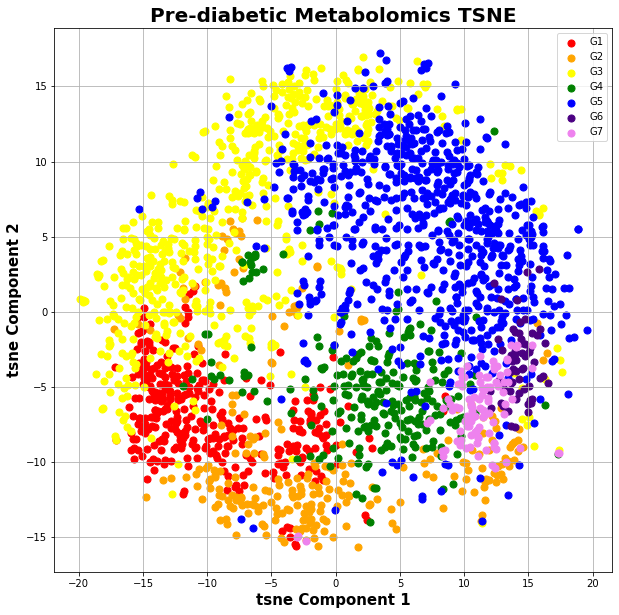

In [113]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()

#  TSNE with perplexity 200, learning rate 10, initializer pca - a little bit better and more clumped THIS IS THE ONE WE USE IN THE PAPER!

In [114]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, metric = 'correlation', perplexity = 200, learning_rate = 10, init = 'pca', random_state = 100)
tsne_components = tsne.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
principalDf = pd.DataFrame(data = tsne_components
             , columns = ['tsne component 1', 'tsne component 2'])
principalDf

'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.


,tsne component 1,tsne component 2
0,6.901343,-5.905232
1,6.773128,-3.682746
2,6.476282,6.555334
3,11.515412,-2.681799
4,-8.489030,-0.586171
...,...,...
2334,2.717659,5.401555
2335,-6.331009,-0.505076
2336,5.957210,-5.029811
2337,8.114377,-0.090610


In [115]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,tsne component 1,tsne component 2,index,labels
0,6.901343,-5.905232,135,5
1,6.773128,-3.682746,1089,7
2,6.476282,6.555334,1490,3
3,11.515412,-2.681799,420,5
4,-8.489030,-0.586171,2098,3
...,...,...,...,...
2334,2.717659,5.401555,358,5
2335,-6.331009,-0.505076,1977,3
2336,5.957210,-5.029811,79,7
2337,8.114377,-0.090610,1904,5


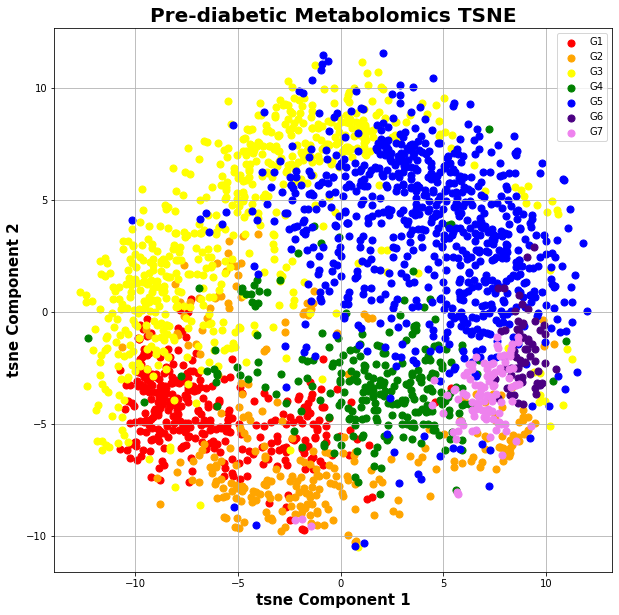

In [116]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()


Below we make the same figure but without a title.

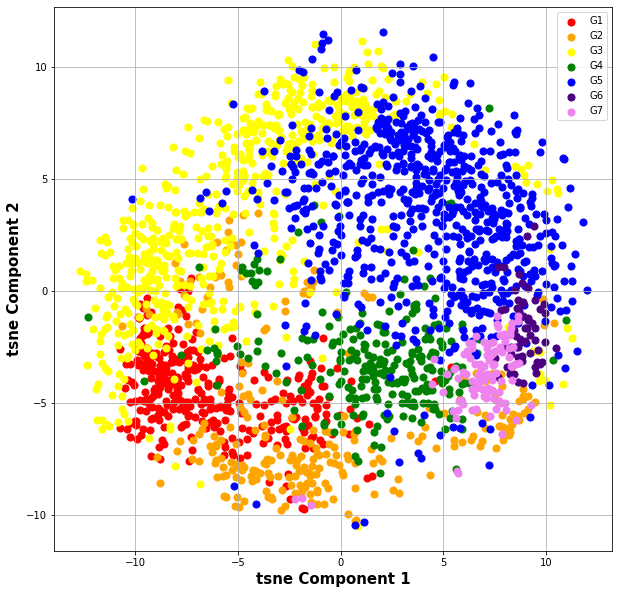

In [117]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
#ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()


# Below we use the final labels in the paper to make it look better.

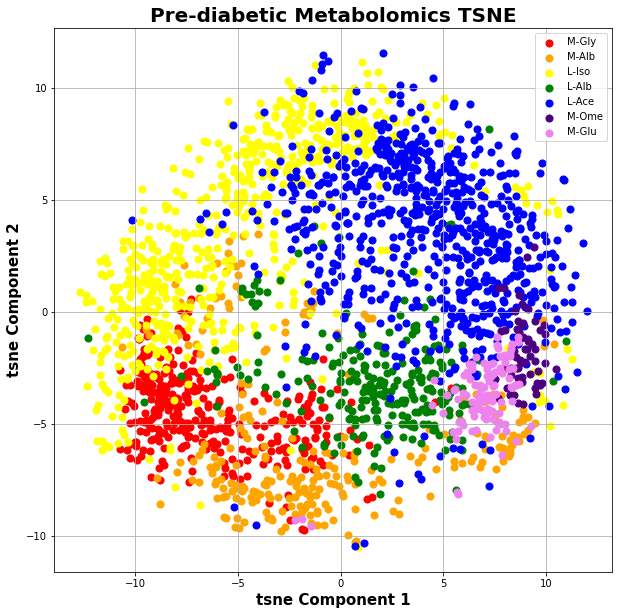

In [118]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['M-Gly', 'M-Alb', 'L-Iso', 'L-Alb', 'L-Ace', 'M-Ome', 'M-Glu']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()


#  TSNE with perplexity 300, learning rate 10, initializer pca - not great since separates group 3 completely into 2 groups

In [119]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, metric = 'correlation', perplexity = 300, learning_rate = 10, init = 'pca', random_state = 100)
tsne_components = tsne.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
principalDf = pd.DataFrame(data = tsne_components
             , columns = ['tsne component 1', 'tsne component 2'])
principalDf

'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.


,tsne component 1,tsne component 2
0,4.670089,4.191989
1,4.220925,2.336984
2,5.845568,-4.441354
3,4.915628,5.233214
4,-9.025106,4.334183
...,...,...
2334,3.227942,-4.652909
2335,-7.057465,4.830604
2336,3.518963,3.133791
2337,5.756405,0.121187


In [120]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,tsne component 1,tsne component 2,index,labels
0,4.670089,4.191989,135,5
1,4.220925,2.336984,1089,7
2,5.845568,-4.441354,1490,3
3,4.915628,5.233214,420,5
4,-9.025106,4.334183,2098,3
...,...,...,...,...
2334,3.227942,-4.652909,358,5
2335,-7.057465,4.830604,1977,3
2336,3.518963,3.133791,79,7
2337,5.756405,0.121187,1904,5


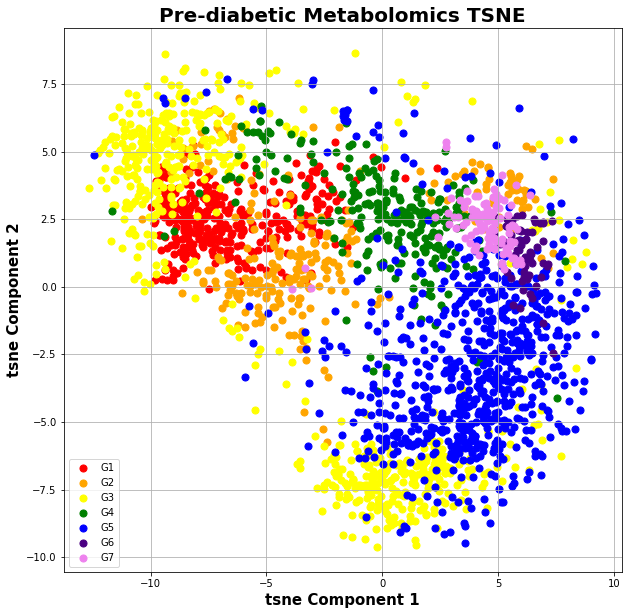

In [121]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()

#  TSNE with perplexity 400, learning rate 10, initializer pca - brings groups back together again

In [122]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, metric = 'correlation', perplexity = 400, learning_rate = 10, init = 'pca', random_state = 100)
tsne_components = tsne.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
principalDf = pd.DataFrame(data = tsne_components
             , columns = ['tsne component 1', 'tsne component 2'])
principalDf

'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.


,tsne component 1,tsne component 2
0,3.160084,4.533785
1,3.228019,3.263383
2,4.753692,-3.472224
3,5.291878,4.723261
4,-5.879442,-0.646001
...,...,...
2334,2.348951,-2.951679
2335,-4.363999,-0.301378
2336,2.450896,3.823387
2337,4.728789,1.440228


In [123]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,tsne component 1,tsne component 2,index,labels
0,3.160084,4.533785,135,5
1,3.228019,3.263383,1089,7
2,4.753692,-3.472224,1490,3
3,5.291878,4.723261,420,5
4,-5.879442,-0.646001,2098,3
...,...,...,...,...
2334,2.348951,-2.951679,358,5
2335,-4.363999,-0.301378,1977,3
2336,2.450896,3.823387,79,7
2337,4.728789,1.440228,1904,5


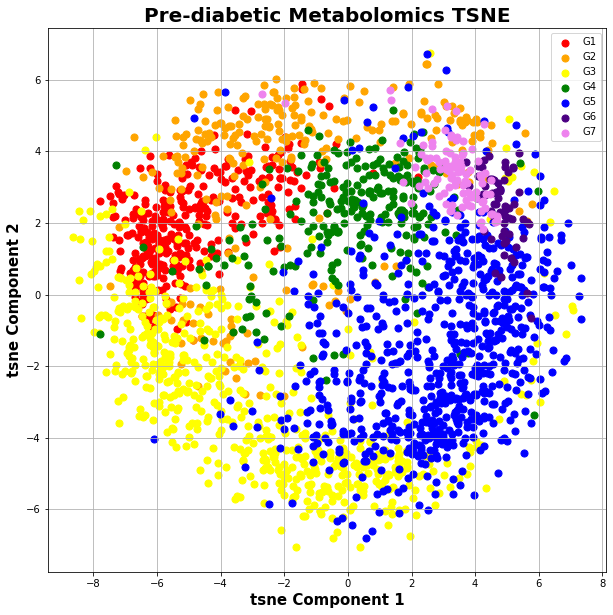

In [124]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()


#  TSNE with perplexity 500, learning rate 10, initializer pca - not as good as previous tsne

In [125]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, metric = 'correlation', perplexity = 500, learning_rate = 10, init = 'pca', random_state = 100)
tsne_components = tsne.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
principalDf = pd.DataFrame(data = tsne_components
             , columns = ['tsne component 1', 'tsne component 2'])
principalDf

'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.


,tsne component 1,tsne component 2
0,4.329165,2.190936
1,3.190750,2.461641
2,-2.531490,5.013598
3,4.753263,3.865761
4,-1.837169,-4.538739
...,...,...
2334,-2.111363,2.832587
2335,-1.051277,-3.358368
2336,3.489642,1.733215
2337,1.962328,4.133899


In [126]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,tsne component 1,tsne component 2,index,labels
0,4.329165,2.190936,135,5
1,3.190750,2.461641,1089,7
2,-2.531490,5.013598,1490,3
3,4.753263,3.865761,420,5
4,-1.837169,-4.538739,2098,3
...,...,...,...,...
2334,-2.111363,2.832587,358,5
2335,-1.051277,-3.358368,1977,3
2336,3.489642,1.733215,79,7
2337,1.962328,4.133899,1904,5


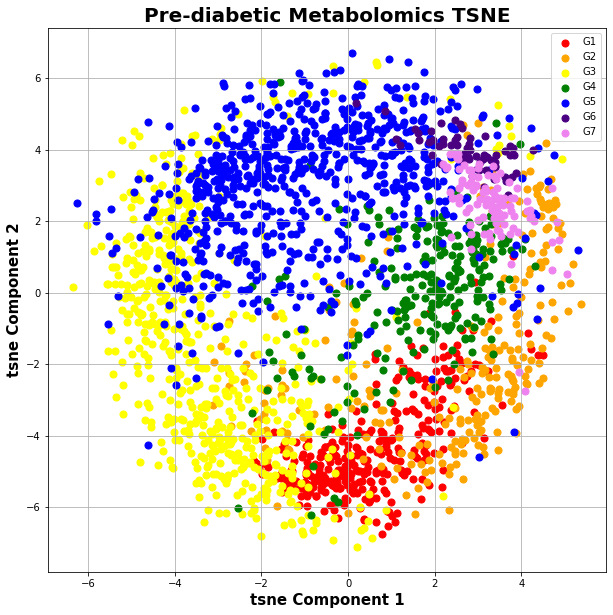

In [127]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()


#  TSNE with perplexity 200, learning rate 10, initializer default - very similar to pca initialization

In [128]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, metric = 'correlation', perplexity = 200, learning_rate = 10, random_state = 100)
tsne_components = tsne.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
principalDf = pd.DataFrame(data = tsne_components
             , columns = ['tsne component 1', 'tsne component 2'])
principalDf

'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.


,tsne component 1,tsne component 2
0,-4.547278,8.307607
1,-2.378809,7.661837
2,8.005835,5.653591
3,0.490068,12.138917
4,-1.933053,-7.938482
...,...,...
2334,6.107619,2.070543
2335,-1.353022,-5.947212
2336,-3.868113,7.176954
2337,1.392078,8.338278


In [129]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,tsne component 1,tsne component 2,index,labels
0,-4.547278,8.307607,135,5
1,-2.378809,7.661837,1089,7
2,8.005835,5.653591,1490,3
3,0.490068,12.138917,420,5
4,-1.933053,-7.938482,2098,3
...,...,...,...,...
2334,6.107619,2.070543,358,5
2335,-1.353022,-5.947212,1977,3
2336,-3.868113,7.176954,79,7
2337,1.392078,8.338278,1904,5


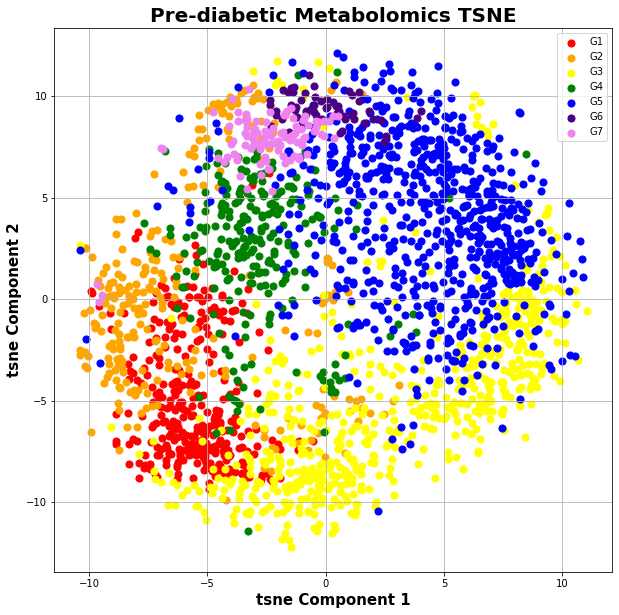

In [130]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()


# Below we perform tsne on the pca with 15 components to see if this gives different results than the pca initialized results - this severely loses information shown by the 2 graphs below not having the separated structures we saw above

In [131]:
from sklearn.decomposition import PCA
pca_for_tsne = PCA(n_components=15)
principalComponents_for_tsne = pca_for_tsne.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
tsne = TSNE()
tsne_components = tsne.fit_transform(principalComponents_for_tsne)
principalDf = pd.DataFrame(data = tsne_components
             , columns = ['tsne component 1', 'tsne component 2'])
principalDf

,tsne component 1,tsne component 2
0,10.654500,-6.626697
1,45.073074,0.846747
2,13.464085,39.224579
3,23.020285,-7.562847
4,-36.279610,28.806837
...,...,...
2334,13.649981,10.681853
2335,-28.139284,1.725881
2336,33.092106,-16.691162
2337,22.628910,-15.390581


In [132]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,tsne component 1,tsne component 2,index,labels
0,10.654500,-6.626697,135,5
1,45.073074,0.846747,1089,7
2,13.464085,39.224579,1490,3
3,23.020285,-7.562847,420,5
4,-36.279610,28.806837,2098,3
...,...,...,...,...
2334,13.649981,10.681853,358,5
2335,-28.139284,1.725881,1977,3
2336,33.092106,-16.691162,79,7
2337,22.628910,-15.390581,1904,5


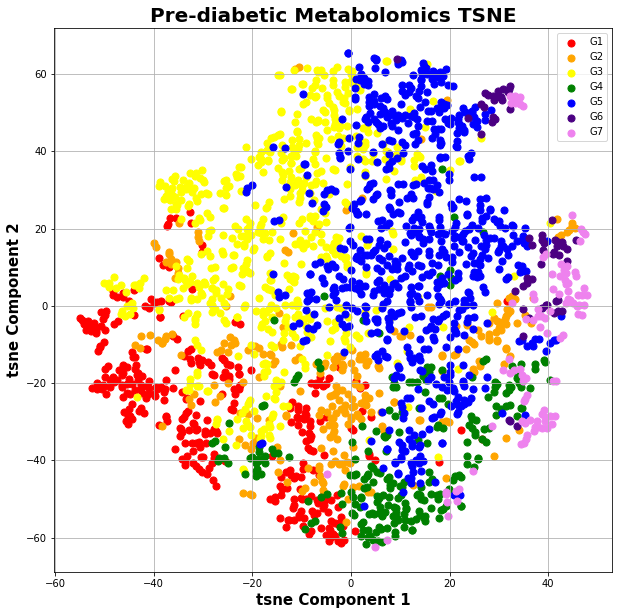

In [133]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()


In [134]:
from sklearn.decomposition import PCA
pca_for_tsne = PCA(n_components=15)
principalComponents_for_tsne = pca_for_tsne.fit_transform(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_standardized)
tsne = TSNE(n_components=2, metric = 'correlation', perplexity = 200, learning_rate = 10, random_state = 100)
tsne_components = tsne.fit_transform(principalComponents_for_tsne)
principalDf = pd.DataFrame(data = tsne_components
             , columns = ['tsne component 1', 'tsne component 2'])
principalDf

'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.


,tsne component 1,tsne component 2
0,-3.211165,5.599637
1,-6.250918,4.282520
2,8.006162,8.252845
3,-9.102530,3.037838
4,6.817819,-5.138825
...,...,...
2334,3.421974,4.623733
2335,5.162942,-8.748225
2336,-6.858606,2.902944
2337,-10.245020,2.540258


In [135]:
finalDf = pd.concat([principalDf, prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['labels']].reset_index()], axis = 1)
finalDf

,tsne component 1,tsne component 2,index,labels
0,-3.211165,5.599637,135,5
1,-6.250918,4.282520,1089,7
2,8.006162,8.252845,1490,3
3,-9.102530,3.037838,420,5
4,6.817819,-5.138825,2098,3
...,...,...,...,...
2334,3.421974,4.623733,358,5
2335,5.162942,-8.748225,1977,3
2336,-6.858606,2.902944,79,7
2337,-10.245020,2.540258,1904,5


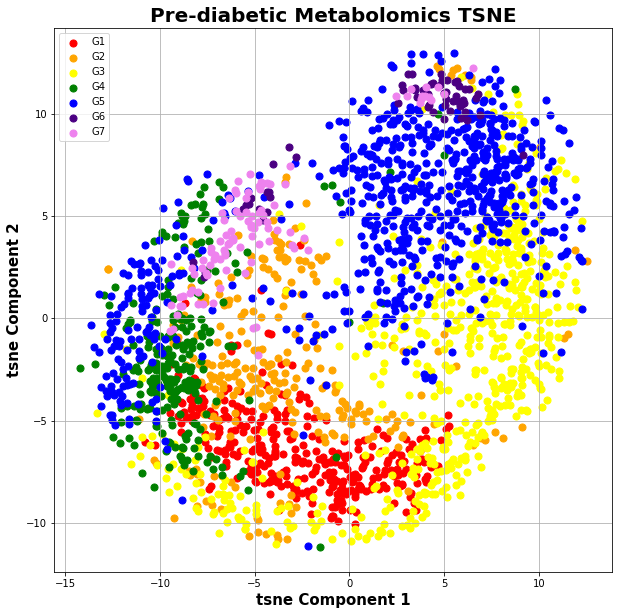

In [136]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('tsne Component 1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('tsne Component 2', fontsize = 15, fontweight = 'bold')
ax.set_title('Pre-diabetic Metabolomics TSNE', fontsize = 20, fontweight = 'bold')
group_numbers = [1, 2, 3, 4, 5, 6, 7]
labels = ['G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7']
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

for group, color in zip(group_numbers,colors):
    indicesToKeep = finalDf['labels'] == group
    ax.scatter(finalDf.loc[indicesToKeep, 'tsne component 1']
               , finalDf.loc[indicesToKeep, 'tsne component 2']
               , c = color
               , s = 50, alpha = 1)
ax.legend(labels)
ax.grid()


Below we separate patients by clusters.

In [137]:
cluster_1 = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names['labels'] == 1]
cluster_2 = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names['labels'] == 2]
cluster_3 = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names['labels'] == 3]
cluster_4 = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names['labels'] == 4]
cluster_5 = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names['labels'] == 5]
cluster_6 = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names['labels'] == 6]
cluster_7 = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names[prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names['labels'] == 7]

Below we show the number of patients in each cluster.

In [138]:
print('Number of patients in Cluster 1:', len(cluster_1))
print('Number of patients in Cluster 2:', len(cluster_2))
print('Number of patients in Cluster 3:', len(cluster_3))
print('Number of patients in Cluster 4:', len(cluster_4))
print('Number of patients in Cluster 5:', len(cluster_5))
print('Number of patients in Cluster 6:', len(cluster_6))
print('Number of patients in Cluster 7:', len(cluster_7))

Number of patients in Cluster 1: 341
Number of patients in Cluster 2: 266
Number of patients in Cluster 3: 599
Number of patients in Cluster 4: 250
Number of patients in Cluster 5: 722
Number of patients in Cluster 6: 60
Number of patients in Cluster 7: 101


Below we show the proportion of patients progressing in each cluster.

In [139]:
print('Proportion of patients progressing in Cluster 1:', len(cluster_1[cluster_1['target'] == 1])/len(cluster_1))
print('Proportion of patients progressing in Cluster 2:', len(cluster_2[cluster_2['target'] == 1])/len(cluster_2))
print('Proportion of patients progressing in Cluster 3:', len(cluster_3[cluster_3['target'] == 1])/len(cluster_3))
print('Proportion of patients progressing in Cluster 4:', len(cluster_4[cluster_4['target'] == 1])/len(cluster_4))
print('Proportion of patients progressing in Cluster 5:', len(cluster_5[cluster_5['target'] == 1])/len(cluster_5))
print('Proportion of patients progressing in Cluster 6:', len(cluster_6[cluster_6['target'] == 1])/len(cluster_6))
print('Proportion of patients progressing in Cluster 7:', len(cluster_7[cluster_7['target'] == 1])/len(cluster_7))

Proportion of patients progressing in Cluster 1: 0.36950146627565983
Proportion of patients progressing in Cluster 2: 0.518796992481203
Proportion of patients progressing in Cluster 3: 0.3572621035058431
Proportion of patients progressing in Cluster 4: 0.576
Proportion of patients progressing in Cluster 5: 0.4916897506925208
Proportion of patients progressing in Cluster 6: 0.7
Proportion of patients progressing in Cluster 7: 0.7623762376237624


Next, we import the information with the epistart dates and icd codes. 

In [140]:
prediabetes_containing_unknowns = pd.read_csv('icd_codes_and_epistart_dates_to_try_to_classify_unknown_patients')
prediabetes_containing_unknowns = prediabetes_containing_unknowns.drop(columns = 'Unnamed: 0')
prediabetes_containing_unknowns

,eid,ins_index,epistart,diag_icd10
0,1000072,12,28/08/2015,Z885
1,1000072,12,28/08/2015,Z867
2,1000072,12,28/08/2015,Z864
3,1000072,12,28/08/2015,Z922
4,1000072,12,28/08/2015,Z966
...,...,...,...,...
727730,6025367,12,02/11/2017,I10
727731,6025367,12,02/11/2017,N183
727732,6025367,12,02/11/2017,H269
727733,6025367,12,02/11/2017,Z961


Next we filter for only patients with type 2 diabetes.

In [141]:
prediabetes_to_diabetes_with_date = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('E11', na = False)]
prediabetes_to_diabetes_with_date

,eid,ins_index,epistart,diag_icd10
302,1002432,1,02/03/2020,E119
315,1003245,8,22/08/2013,E119
327,1003245,6,05/11/2012,E119
360,1005686,2,04/11/2019,E119
387,1005936,4,10/05/2016,E119
...,...,...,...,...
727678,6025367,11,07/09/2017,E119
727681,6025367,4,20/10/2014,E119
727704,6025367,6,09/04/2015,E119
727715,6025367,5,31/12/2014,E119


Below we merge the epistart dates with the patients we know progress to diabetes.

In [142]:
prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates = pd.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled, prediabetes_to_diabetes_with_date[['eid', 'epistart']], on = 'eid')
prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Age Covariate,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,epistart
0,0.368701,0.354952,0.317711,0.313315,0.410439,0.456313,0.268151,0.266144,0.243557,0.245425,...,0,1,0,0,0,0,0,1,5,22/01/2020
1,0.368701,0.354952,0.317711,0.313315,0.410439,0.456313,0.268151,0.266144,0.243557,0.245425,...,0,1,0,0,0,0,0,1,5,10/04/2015
2,0.178951,0.183385,0.195076,0.286471,0.185227,0.260847,0.147217,0.412621,0.395243,0.290853,...,1,1,0,0,0,0,0,1,7,22/07/2016
3,0.362598,0.340459,0.346718,0.345140,0.400694,0.405771,0.288623,0.224699,0.229556,0.127227,...,1,1,0,0,0,0,0,1,5,02/08/2017
4,0.362598,0.340459,0.346718,0.345140,0.400694,0.405771,0.288623,0.224699,0.229556,0.127227,...,1,1,0,0,0,0,0,1,5,18/05/2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4980,0.205765,0.230645,0.194360,0.212756,0.317936,0.344508,0.101838,0.132322,0.137994,0.083949,...,1,1,0,0,0,0,0,1,5,10/10/2016
4981,0.205765,0.230645,0.194360,0.212756,0.317936,0.344508,0.101838,0.132322,0.137994,0.083949,...,1,1,0,0,0,0,0,1,5,30/10/2018
4982,0.205765,0.230645,0.194360,0.212756,0.317936,0.344508,0.101838,0.132322,0.137994,0.083949,...,1,1,0,0,0,0,0,1,5,18/12/2019
4983,0.205765,0.230645,0.194360,0.212756,0.317936,0.344508,0.101838,0.132322,0.137994,0.083949,...,1,1,0,0,0,0,0,1,5,26/11/2019


Next, we import the information with the epistart dates and icd codes. 

In [143]:
prediabetes_containing_unknowns = pd.read_csv('icd_codes_and_epistart_dates_to_try_to_classify_unknown_patients')
prediabetes_containing_unknowns = prediabetes_containing_unknowns.drop(columns = 'Unnamed: 0')
prediabetes_containing_unknowns

,eid,ins_index,epistart,diag_icd10
0,1000072,12,28/08/2015,Z885
1,1000072,12,28/08/2015,Z867
2,1000072,12,28/08/2015,Z864
3,1000072,12,28/08/2015,Z922
4,1000072,12,28/08/2015,Z966
...,...,...,...,...
727730,6025367,12,02/11/2017,I10
727731,6025367,12,02/11/2017,N183
727732,6025367,12,02/11/2017,H269
727733,6025367,12,02/11/2017,Z961


We will also import the patients from a previous model so we can cut out the patients we know to have prediabetes and not progress to diabetes.

In [144]:
prediabetes_from_model_21 = pd.read_csv('prediabetic_all_possible_to_classify_WITH_PREDIABETIC_ICD_CODES_ALSO_INCORPORATING_DATES_BEFORE_ASSESSMENT_CENTER_final')
prediabetes_from_model_21 = prediabetes_from_model_21.drop(columns = 'Unnamed: 0')
prediabetes_from_model_21

,eid,target
0,4754980,0
1,3990434,0
2,4341307,0
3,2189918,0
4,1384041,0
...,...,...
5426,3939961,1
5427,2215660,1
5428,5612713,1
5429,6022397,1


Below we make a list of these patients.

In [145]:
dfToList_prediabetes_not_for_feature_selection = prediabetes_from_model_21['eid'].tolist()
dfToList_prediabetes_not_for_feature_selection

[4754980,
 3990434,
 4341307,
 2189918,
 1384041,
 2668919,
 4731399,
 5176915,
 2546801,
 4074087,
 5610428,
 4291108,
 1087841,
 2400159,
 2651683,
 3021843,
 3741116,
 2300870,
 5300315,
 3131032,
 5054628,
 3848034,
 3814179,
 4041516,
 3244213,
 2153925,
 5275213,
 4247282,
 3005969,
 5415675,
 2666156,
 1157575,
 3787794,
 1721346,
 4125910,
 4772707,
 2629558,
 4329061,
 3593711,
 3706865,
 3468606,
 1526262,
 2315761,
 1532705,
 3762664,
 1696778,
 2238033,
 2412934,
 2802052,
 3586593,
 2883116,
 1245115,
 3993670,
 3857759,
 2994186,
 4054334,
 1656085,
 5985181,
 1099911,
 1414086,
 5495249,
 2771587,
 3615764,
 5176828,
 4968900,
 3132679,
 2319445,
 3274237,
 2935906,
 1443994,
 1931859,
 5665291,
 3387357,
 3133140,
 4065319,
 5083386,
 2979692,
 2262386,
 2024396,
 2455237,
 3631850,
 2839824,
 5273096,
 3230080,
 4893226,
 3554949,
 3245699,
 2997509,
 4757559,
 5817242,
 3422921,
 2337129,
 1204343,
 2857922,
 3406342,
 5040694,
 1642615,
 5402929,
 3000943,
 2126187,


Below we cut these patients from the dataframe with all the icd codes.

In [146]:
prediabetes_for_unknowns_only = prediabetes_containing_unknowns[~prediabetes_containing_unknowns.eid.isin(dfToList_prediabetes_not_for_feature_selection)]
prediabetes_for_unknowns_only

,eid,ins_index,epistart,diag_icd10
0,1000072,12,28/08/2015,Z885
1,1000072,12,28/08/2015,Z867
2,1000072,12,28/08/2015,Z864
3,1000072,12,28/08/2015,Z922
4,1000072,12,28/08/2015,Z966
...,...,...,...,...
727673,6024501,2,01/06/1999,I251
727674,6024501,2,01/06/1999,I209
727675,6024501,0,29/12/2000,W790
727676,6024501,0,29/12/2000,T181


Next, we change the epistart column to date time format.

In [147]:
prediabetes_for_unknowns_only['epistart'] = pd.to_datetime(prediabetes_for_unknowns_only['epistart'])
prediabetes_for_unknowns_only


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,eid,ins_index,epistart,diag_icd10
0,1000072,12,2015-08-28,Z885
1,1000072,12,2015-08-28,Z867
2,1000072,12,2015-08-28,Z864
3,1000072,12,2015-08-28,Z922
4,1000072,12,2015-08-28,Z966
...,...,...,...,...
727673,6024501,2,1999-01-06,I251
727674,6024501,2,1999-01-06,I209
727675,6024501,0,2000-12-29,W790
727676,6024501,0,2000-12-29,T181


Below we filter for all patients who had an epistart date later than 2018. This is about 10 years after most patients had their data taken at the assessment center. Therefore, if they are diagnosed with a disease from 2018 onwards, this means that they would most likely have been diagnosed with diabetes if they developed it. Therefore, we will keep these patients and classify them as those who do not progress to diabetes. First, we have to set the index as epistart.

In [148]:
prediabetes_for_unknowns_only_index_epistart = prediabetes_for_unknowns_only.set_index(['epistart'])
prediabetes_for_unknowns_only_index_epistart

,eid,ins_index,diag_icd10
epistart,,,
2015-08-28,1000072,12,Z885
2015-08-28,1000072,12,Z867
2015-08-28,1000072,12,Z864
2015-08-28,1000072,12,Z922
2015-08-28,1000072,12,Z966
...,...,...,...
1999-01-06,6024501,2,I251
1999-01-06,6024501,2,I209
2000-12-29,6024501,0,W790


Next, we can filter for all epistart dates from 2018 onwards.

In [149]:
prediabetes_for_unknowns_only_index_epistart_later_than_2018 = prediabetes_for_unknowns_only_index_epistart.loc['2018' : '2021']
prediabetes_for_unknowns_only_index_epistart_later_than_2018

,eid,ins_index,diag_icd10
epistart,,,
2019-03-06,1000330,28,I10
2019-03-06,1000330,28,D123
2019-03-06,1000330,28,M139
2019-03-06,1000330,28,M858
2019-03-06,1000330,28,N26
...,...,...,...
2020-03-20,6024501,5,Z951
2020-03-20,6024501,6,E780
2020-03-20,6024501,6,C61


Below we make a list of these patients.

In [150]:
dfToList_prediabetes_for_unknowns_only_index_epistart_later_than_2018 = prediabetes_for_unknowns_only_index_epistart_later_than_2018['eid'].tolist()
dfToList_prediabetes_for_unknowns_only_index_epistart_later_than_2018

[1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000789,
 1000789,
 1000789,
 1005310,
 1005310,
 1005310,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006718,


Below we show that there are an additional 4513 patients we can use if our assumption is correct that we can classify as not progressing to diabetes.

In [151]:
prediabetes_for_unknowns_only_index_epistart_later_than_2018_patients = prediabetes_for_unknowns_only_index_epistart_later_than_2018.drop_duplicates(subset = 'eid')
prediabetes_for_unknowns_only_index_epistart_later_than_2018_patients

,eid,ins_index,diag_icd10
epistart,,,
2019-03-06,1000330,28,I10
2018-09-04,1000789,1,D509
2019-09-23,1005310,3,M179
2020-05-13,1006688,6,N201
2019-03-26,1006718,0,E039
...,...,...,...
2020-06-25,6020998,33,C859
2019-06-26,6022016,7,Z907
2020-03-25,6024268,16,R69


Below we import the whole dataframe of prediabetic patients with all the features.

In [152]:
prediabetes_with_all = pd.read_csv('all_features_prediabetic_patients_with_additional_4513_patients_from_unknown_patients_who_have_ICD_code_since_2018')
prediabetes_with_all = prediabetes_with_all.drop(columns = 'Unnamed: 0')
prediabetes_with_all

Columns (42,43,213,317,318,319,320,321,322,323,324,325,326,327,328,329,330,2610,2611,2612,2613,2614,2615,2616,2617,2618,2619,2847,2851,2855,2859,2862,2864,2866,2867,2868,2869,2870,2871,2872,2895,2896,2897,2898,2912,2913,2914,2915,2964,3085,3086,3087,3088,3089,3090,3091,3092,3093,3094,3095,3096,3097,3098,3099,3100,3101,3102,3103,3104,3105,3106,3107,3108,3109,3110,3111,3112,3113,3114,3115,3116,3117,3124,3125,3126,3127,3128,3129,3130,3157,3158,3159,3160,3161,3162,3163,3164,3165,3166,3167,3168,3169,3170,3171,3172,3173,3174,3175,3176,3177,3178,3179,3180,3181,3182,3183,3184,3185,3186,3187,3188,3189,3190,3191,3192,3193,3211,3212,3213,3214,3215,3216,3217,3218,3219,3220,3233,3263,3264,3265,3266,3267,3268,3269,3270,3271,3272,3273,3274,3275,3276,3277,3278,3279,3280,3281,3282,3283,3284,3285,3286,3287,3288,3289,3290,3291,3292,3293,3294,3295,3296,3297,3298,3299,3300,3301,3302,3303,3304,3305,3306,3307,3308,3309,3310,3311,3312,3313,3314,3315,3316,3317,3318,3319,3320,3321,3322,3323,3324,3325,3326,3327,

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,...,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
0,4863545,1.0,NaN,NaN,1,1942,1.0,NaN,NaN,1056.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3440845,1.0,NaN,NaN,0,1950,1.0,NaN,NaN,3157.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1191090,1.0,NaN,NaN,0,1954,1.0,NaN,NaN,1044.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3087664,1.0,NaN,NaN,1,1944,1.0,NaN,NaN,1040.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2195757,1.0,NaN,NaN,0,1958,1.0,NaN,NaN,1039.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9939,5612713,1.0,NaN,NaN,1,1958,1.0,NaN,NaN,3156.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9940,6022397,1.0,NaN,NaN,1,1945,1.0,NaN,NaN,2818.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9941,5011216,1.0,NaN,NaN,0,1947,1.0,NaN,NaN,3155.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9942,3482443,1.0,NaN,NaN,1,1950,1.0,NaN,NaN,1045.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Below we show that there are many columns in which duplicate data is recorded. This may be due to patients requesting not to have their data used in the study after it was originally recorded and posted for use. After these patients decided not to share their data, their information was removed in a column in a different text file. The higher the number of the csv file (e.g. whole_file_26867 < whole_file_42385) the less patients kept in the columns. We need to account for this request of removal and not use patients who decide not to share their information as ethical researchers. Since both columns are kept, they are differentiated by x (representing column from lower number of csv file) and y (representing column from higher number of csv file which we want to keep) in the pandas dataframe. Therefore, we want to get rid of all columns ending in x and keep all columns ending in y. Below we search for all columns ending in x. and print all the column names so that we can easily drop them from the dataframe.

In [153]:
spike_cols = [col for col in prediabetes_with_all.columns if 'x' in col]
print(spike_cols)
print(len(spike_cols))

['84-0.0_x', '84-0.1_x', '84-0.2_x', '84-0.3_x', '84-0.4_x', '84-0.5_x', '84-1.0_x', '84-1.1_x', '84-1.2_x', '84-1.3_x', '84-1.4_x', '84-1.5_x', '84-2.0_x', '84-2.1_x', '84-2.2_x', '84-2.3_x', '84-2.4_x', '84-2.5_x', '87-0.0_x', '87-0.1_x', '87-0.2_x', '87-0.3_x', '87-0.4_x', '87-0.5_x', '87-0.6_x', '87-0.7_x', '87-0.8_x', '87-0.9_x', '87-0.10_x', '87-0.11_x', '87-0.12_x', '87-0.13_x', '87-0.14_x', '87-0.15_x', '87-0.16_x', '87-0.17_x', '87-0.18_x', '87-0.19_x', '87-0.20_x', '87-0.21_x', '87-0.22_x', '87-0.23_x', '87-0.24_x', '87-0.25_x', '87-0.26_x', '87-0.27_x', '87-0.28_x', '87-0.29_x', '87-0.30_x', '87-0.31_x', '87-0.32_x', '87-0.33_x', '87-1.0_x', '87-1.1_x', '87-1.2_x', '87-1.3_x', '87-1.4_x', '87-1.5_x', '87-1.6_x', '87-1.7_x', '87-1.8_x', '87-1.9_x', '87-1.10_x', '87-1.11_x', '87-1.12_x', '87-1.13_x', '87-1.14_x', '87-1.15_x', '87-1.16_x', '87-1.17_x', '87-1.18_x', '87-1.19_x', '87-1.20_x', '87-1.21_x', '87-1.22_x', '87-1.23_x', '87-1.24_x', '87-1.25_x', '87-1.26_x', '87-1.27_x


1652


Now we want to delete these columns from the final dataframe, shown below.

In [154]:
prediabetes_with_all = prediabetes_with_all.drop(columns = ['84-0.0_x', '84-0.1_x', '84-0.2_x', '84-0.3_x', '84-0.4_x', '84-0.5_x', '84-1.0_x', '84-1.1_x', '84-1.2_x', '84-1.3_x', '84-1.4_x', '84-1.5_x', '84-2.0_x', '84-2.1_x', '84-2.2_x', '84-2.3_x', '84-2.4_x', '84-2.5_x', '87-0.0_x', '87-0.1_x', '87-0.2_x', '87-0.3_x', '87-0.4_x', '87-0.5_x', '87-0.6_x', '87-0.7_x', '87-0.8_x', '87-0.9_x', '87-0.10_x', '87-0.11_x', '87-0.12_x', '87-0.13_x', '87-0.14_x', '87-0.15_x', '87-0.16_x', '87-0.17_x', '87-0.18_x', '87-0.19_x', '87-0.20_x', '87-0.21_x', '87-0.22_x', '87-0.23_x', '87-0.24_x', '87-0.25_x', '87-0.26_x', '87-0.27_x', '87-0.28_x', '87-0.29_x', '87-0.30_x', '87-0.31_x', '87-0.32_x', '87-0.33_x', '87-1.0_x', '87-1.1_x', '87-1.2_x', '87-1.3_x', '87-1.4_x', '87-1.5_x', '87-1.6_x', '87-1.7_x', '87-1.8_x', '87-1.9_x', '87-1.10_x', '87-1.11_x', '87-1.12_x', '87-1.13_x', '87-1.14_x', '87-1.15_x', '87-1.16_x', '87-1.17_x', '87-1.18_x', '87-1.19_x', '87-1.20_x', '87-1.21_x', '87-1.22_x', '87-1.23_x', '87-1.24_x', '87-1.25_x', '87-1.26_x', '87-1.27_x', '87-1.28_x', '87-1.29_x', '87-1.30_x', '87-1.31_x', '87-1.32_x', '87-1.33_x', '87-2.0_x', '87-2.1_x', '87-2.2_x', '87-2.3_x', '87-2.4_x', '87-2.5_x', '87-2.6_x', '87-2.7_x', '87-2.8_x', '87-2.9_x', '87-2.10_x', '87-2.11_x', '87-2.12_x', '87-2.13_x', '87-2.14_x', '87-2.15_x', '87-2.16_x', '87-2.17_x', '87-2.18_x', '87-2.19_x', '87-2.20_x', '87-2.21_x', '87-2.22_x', '87-2.23_x', '87-2.24_x', '87-2.25_x', '87-2.26_x', '87-2.27_x', '87-2.28_x', '87-2.29_x', '87-2.30_x', '87-2.31_x', '87-2.32_x', '87-2.33_x', '134-0.0_x', '134-1.0_x', '134-2.0_x', '135-0.0_x', '135-1.0_x', '135-2.0_x', '1259-0.0_x', '1259-1.0_x', '1259-2.0_x', '1558-0.0_x', '1558-1.0_x', '1558-2.0_x', '1647-0.0_x', '1647-1.0_x', '1647-2.0_x', '1677-0.0_x', '1677-1.0_x', '1677-2.0_x', '1687-0.0_x', '1687-1.0_x', '1687-2.0_x', '1697-0.0_x', '1697-1.0_x', '1697-2.0_x', '1707-0.0_x', '1707-1.0_x', '1707-2.0_x', '1767-0.0_x', '1767-1.0_x', '1767-2.0_x', '1777-0.0_x', '1777-1.0_x', '1777-2.0_x', '1787-0.0_x', '1787-1.0_x', '1787-2.0_x', '1797-0.0_x', '1797-1.0_x', '1797-2.0_x', '1807-0.0_x', '1807-1.0_x', '1807-2.0_x', '1835-0.0_x', '1835-1.0_x', '1835-2.0_x', '1845-0.0_x', '1845-1.0_x', '1845-2.0_x', '1873-0.0_x', '1873-1.0_x', '1873-2.0_x', '1883-0.0_x', '1883-1.0_x', '1883-2.0_x', '2946-0.0_x', '2946-1.0_x', '2946-2.0_x', '3140-0.0_x', '3140-1.0_x', '3140-2.0_x', '3526-0.0_x', '3526-1.0_x', '3526-2.0_x', '3912-0.0_x', '3912-1.0_x', '3912-2.0_x', '3942-0.0_x', '3942-1.0_x', '3942-2.0_x', '3972-0.0_x', '3972-1.0_x', '3972-2.0_x', '3982-0.0_x', '3982-1.0_x', '3982-2.0_x', '4501-0.0_x', '4501-1.0_x', '4501-2.0_x', '5057-0.0_x', '5057-1.0_x', '5057-2.0_x', '5364-0.0_x', '5364-1.0_x', '5364-2.0_x', '20001-0.0_x', '20001-0.1_x', '20001-0.2_x', '20001-0.3_x', '20001-0.4_x', '20001-0.5_x', '20001-1.0_x', '20001-1.1_x', '20001-1.2_x', '20001-1.3_x', '20001-1.4_x', '20001-1.5_x', '20001-2.0_x', '20001-2.1_x', '20001-2.2_x', '20001-2.3_x', '20001-2.4_x', '20001-2.5_x', '20002-0.0_x', '20002-0.1_x', '20002-0.2_x', '20002-0.3_x', '20002-0.4_x', '20002-0.5_x', '20002-0.6_x', '20002-0.7_x', '20002-0.8_x', '20002-0.9_x', '20002-0.10_x', '20002-0.11_x', '20002-0.12_x', '20002-0.13_x', '20002-0.14_x', '20002-0.15_x', '20002-0.16_x', '20002-0.17_x', '20002-0.18_x', '20002-0.19_x', '20002-0.20_x', '20002-0.21_x', '20002-0.22_x', '20002-0.23_x', '20002-0.24_x', '20002-0.25_x', '20002-0.26_x', '20002-0.27_x', '20002-0.28_x', '20002-0.29_x', '20002-0.30_x', '20002-0.31_x', '20002-0.32_x', '20002-0.33_x', '20002-1.0_x', '20002-1.1_x', '20002-1.2_x', '20002-1.3_x', '20002-1.4_x', '20002-1.5_x', '20002-1.6_x', '20002-1.7_x', '20002-1.8_x', '20002-1.9_x', '20002-1.10_x', '20002-1.11_x', '20002-1.12_x', '20002-1.13_x', '20002-1.14_x', '20002-1.15_x', '20002-1.16_x', '20002-1.17_x', '20002-1.18_x', '20002-1.19_x', '20002-1.20_x', '20002-1.21_x', '20002-1.22_x', '20002-1.23_x', '20002-1.24_x', '20002-1.25_x', '20002-1.26_x', '20002-1.27_x', '20002-1.28_x', '20002-1.29_x', '20002-1.30_x', '20002-1.31_x', '20002-1.32_x', '20002-1.33_x', '20002-2.0_x', '20002-2.1_x', '20002-2.2_x', '20002-2.3_x', '20002-2.4_x', '20002-2.5_x', '20002-2.6_x', '20002-2.7_x', '20002-2.8_x', '20002-2.9_x', '20002-2.10_x', '20002-2.11_x', '20002-2.12_x', '20002-2.13_x', '20002-2.14_x', '20002-2.15_x', '20002-2.16_x', '20002-2.17_x', '20002-2.18_x', '20002-2.19_x', '20002-2.20_x', '20002-2.21_x', '20002-2.22_x', '20002-2.23_x', '20002-2.24_x', '20002-2.25_x', '20002-2.26_x', '20002-2.27_x', '20002-2.28_x', '20002-2.29_x', '20002-2.30_x', '20002-2.31_x', '20002-2.32_x', '20002-2.33_x', '20006-0.0_x', '20006-0.1_x', '20006-0.2_x', '20006-0.3_x', '20006-0.4_x', '20006-0.5_x', '20006-1.0_x', '20006-1.1_x', '20006-1.2_x', '20006-1.3_x', '20006-1.4_x', '20006-1.5_x', '20006-2.0_x', '20006-2.1_x', '20006-2.2_x', '20006-2.3_x', '20006-2.4_x', '20006-2.5_x', '20007-0.0_x', '20007-0.1_x', '20007-0.2_x', '20007-0.3_x', '20007-0.4_x', '20007-0.5_x', '20007-1.0_x', '20007-1.1_x', '20007-1.2_x', '20007-1.3_x', '20007-1.4_x', '20007-1.5_x', '20007-2.0_x', '20007-2.1_x', '20007-2.2_x', '20007-2.3_x', '20007-2.4_x', '20007-2.5_x', '20008-0.0_x', '20008-0.1_x', '20008-0.2_x', '20008-0.3_x', '20008-0.4_x', '20008-0.5_x', '20008-0.6_x', '20008-0.7_x', '20008-0.8_x', '20008-0.9_x', '20008-0.10_x', '20008-0.11_x', '20008-0.12_x', '20008-0.13_x', '20008-0.14_x', '20008-0.15_x', '20008-0.16_x', '20008-0.17_x', '20008-0.18_x', '20008-0.19_x', '20008-0.20_x', '20008-0.21_x', '20008-0.22_x', '20008-0.23_x', '20008-0.24_x', '20008-0.25_x', '20008-0.26_x', '20008-0.27_x', '20008-0.28_x', '20008-0.29_x', '20008-0.30_x', '20008-0.31_x', '20008-0.32_x', '20008-0.33_x', '20008-1.0_x', '20008-1.1_x', '20008-1.2_x', '20008-1.3_x', '20008-1.4_x', '20008-1.5_x', '20008-1.6_x', '20008-1.7_x', '20008-1.8_x', '20008-1.9_x', '20008-1.10_x', '20008-1.11_x', '20008-1.12_x', '20008-1.13_x', '20008-1.14_x', '20008-1.15_x', '20008-1.16_x', '20008-1.17_x', '20008-1.18_x', '20008-1.19_x', '20008-1.20_x', '20008-1.21_x', '20008-1.22_x', '20008-1.23_x', '20008-1.24_x', '20008-1.25_x', '20008-1.26_x', '20008-1.27_x', '20008-1.28_x', '20008-1.29_x', '20008-1.30_x', '20008-1.31_x', '20008-1.32_x', '20008-1.33_x', '20008-2.0_x', '20008-2.1_x', '20008-2.2_x', '20008-2.3_x', '20008-2.4_x', '20008-2.5_x', '20008-2.6_x', '20008-2.7_x', '20008-2.8_x', '20008-2.9_x', '20008-2.10_x', '20008-2.11_x', '20008-2.12_x', '20008-2.13_x', '20008-2.14_x', '20008-2.15_x', '20008-2.16_x', '20008-2.17_x', '20008-2.18_x', '20008-2.19_x', '20008-2.20_x', '20008-2.21_x', '20008-2.22_x', '20008-2.23_x', '20008-2.24_x', '20008-2.25_x', '20008-2.26_x', '20008-2.27_x', '20008-2.28_x', '20008-2.29_x', '20008-2.30_x', '20008-2.31_x', '20008-2.32_x', '20008-2.33_x', '20009-0.0_x', '20009-0.1_x', '20009-0.2_x', '20009-0.3_x', '20009-0.4_x', '20009-0.5_x', '20009-0.6_x', '20009-0.7_x', '20009-0.8_x', '20009-0.9_x', '20009-0.10_x', '20009-0.11_x', '20009-0.12_x', '20009-0.13_x', '20009-0.14_x', '20009-0.15_x', '20009-0.16_x', '20009-0.17_x', '20009-0.18_x', '20009-0.19_x', '20009-0.20_x', '20009-0.21_x', '20009-0.22_x', '20009-0.23_x', '20009-0.24_x', '20009-0.25_x', '20009-0.26_x', '20009-0.27_x', '20009-0.28_x', '20009-0.29_x', '20009-0.30_x', '20009-0.31_x', '20009-0.32_x', '20009-0.33_x', '20009-1.0_x', '20009-1.1_x', '20009-1.2_x', '20009-1.3_x', '20009-1.4_x', '20009-1.5_x', '20009-1.6_x', '20009-1.7_x', '20009-1.8_x', '20009-1.9_x', '20009-1.10_x', '20009-1.11_x', '20009-1.12_x', '20009-1.13_x', '20009-1.14_x', '20009-1.15_x', '20009-1.16_x', '20009-1.17_x', '20009-1.18_x', '20009-1.19_x', '20009-1.20_x', '20009-1.21_x', '20009-1.22_x', '20009-1.23_x', '20009-1.24_x', '20009-1.25_x', '20009-1.26_x', '20009-1.27_x', '20009-1.28_x', '20009-1.29_x', '20009-1.30_x', '20009-1.31_x', '20009-1.32_x', '20009-1.33_x', '20009-2.0_x', '20009-2.1_x', '20009-2.2_x', '20009-2.3_x', '20009-2.4_x', '20009-2.5_x', '20009-2.6_x', '20009-2.7_x', '20009-2.8_x', '20009-2.9_x', '20009-2.10_x', '20009-2.11_x', '20009-2.12_x', '20009-2.13_x', '20009-2.14_x', '20009-2.15_x', '20009-2.16_x', '20009-2.17_x', '20009-2.18_x', '20009-2.19_x', '20009-2.20_x', '20009-2.21_x', '20009-2.22_x', '20009-2.23_x', '20009-2.24_x', '20009-2.25_x', '20009-2.26_x', '20009-2.27_x', '20009-2.28_x', '20009-2.29_x', '20009-2.30_x', '20009-2.31_x', '20009-2.32_x', '20009-2.33_x', '20012-0.0_x', '20012-0.1_x', '20012-0.2_x', '20012-0.3_x', '20012-0.4_x', '20012-0.5_x', '20012-1.0_x', '20012-1.1_x', '20012-1.2_x', '20012-1.3_x', '20012-1.4_x', '20012-1.5_x', '20012-2.0_x', '20012-2.1_x', '20012-2.2_x', '20012-2.3_x', '20012-2.4_x', '20012-2.5_x', '20013-0.0_x', '20013-0.1_x', '20013-0.2_x', '20013-0.3_x', '20013-0.4_x', '20013-0.5_x', '20013-0.6_x', '20013-0.7_x', '20013-0.8_x', '20013-0.9_x', '20013-0.10_x', '20013-0.11_x', '20013-0.12_x', '20013-0.13_x', '20013-0.14_x', '20013-0.15_x', '20013-0.16_x', '20013-0.17_x', '20013-0.18_x', '20013-0.19_x', '20013-0.20_x', '20013-0.21_x', '20013-0.22_x', '20013-0.23_x', '20013-0.24_x', '20013-0.25_x', '20013-0.26_x', '20013-0.27_x', '20013-0.28_x', '20013-0.29_x', '20013-0.30_x', '20013-0.31_x', '20013-0.32_x', '20013-0.33_x', '20013-1.0_x', '20013-1.1_x', '20013-1.2_x', '20013-1.3_x', '20013-1.4_x', '20013-1.5_x', '20013-1.6_x', '20013-1.7_x', '20013-1.8_x', '20013-1.9_x', '20013-1.10_x', '20013-1.11_x', '20013-1.12_x', '20013-1.13_x', '20013-1.14_x', '20013-1.15_x', '20013-1.16_x', '20013-1.17_x', '20013-1.18_x', '20013-1.19_x', '20013-1.20_x', '20013-1.21_x', '20013-1.22_x', '20013-1.23_x', '20013-1.24_x', '20013-1.25_x', '20013-1.26_x', '20013-1.27_x', '20013-1.28_x', '20013-1.29_x', '20013-1.30_x', '20013-1.31_x', '20013-1.32_x', '20013-1.33_x', '20013-2.0_x', '20013-2.1_x', '20013-2.2_x', '20013-2.3_x', '20013-2.4_x', '20013-2.5_x', '20013-2.6_x', '20013-2.7_x', '20013-2.8_x', '20013-2.9_x', '20013-2.10_x', '20013-2.11_x', '20013-2.12_x', '20013-2.13_x', '20013-2.14_x', '20013-2.15_x', '20013-2.16_x', '20013-2.17_x', '20013-2.18_x', '20013-2.19_x', '20013-2.20_x', '20013-2.21_x', '20013-2.22_x', '20013-2.23_x', '20013-2.24_x', '20013-2.25_x', '20013-2.26_x', '20013-2.27_x', '20013-2.28_x', '20013-2.29_x', '20013-2.30_x', '20013-2.31_x', '20013-2.32_x', '20013-2.33_x', '20107-0.0_x', '20107-0.1_x', '20107-0.2_x', '20107-0.3_x', '20107-0.4_x', '20107-0.5_x', '20107-0.6_x', '20107-0.7_x', '20107-0.8_x', '20107-0.9_x', '20107-1.0_x', '20107-1.1_x', '20107-1.2_x', '20107-1.3_x', '20107-1.4_x', '20107-1.5_x', '20107-1.6_x', '20107-1.7_x', '20107-1.8_x', '20107-1.9_x', '20107-2.0_x', '20107-2.1_x', '20107-2.2_x', '20107-2.3_x', '20107-2.4_x', '20107-2.5_x', '20107-2.6_x', '20107-2.7_x', '20107-2.8_x', '20107-2.9_x', '20110-0.0_x', '20110-0.1_x', '20110-0.2_x', '20110-0.3_x', '20110-0.4_x', '20110-0.5_x', '20110-0.6_x', '20110-0.7_x', '20110-0.8_x', '20110-0.9_x', '20110-0.10_x', '20110-1.0_x', '20110-1.1_x', '20110-1.2_x', '20110-1.3_x', '20110-1.4_x', '20110-1.5_x', '20110-1.6_x', '20110-1.7_x', '20110-1.8_x', '20110-1.9_x', '20110-1.10_x', '20110-2.0_x', '20110-2.1_x', '20110-2.2_x', '20110-2.3_x', '20110-2.4_x', '20110-2.5_x', '20110-2.6_x', '20110-2.7_x', '20110-2.8_x', '20110-2.9_x', '20110-2.10_x', '20111-0.0_x', '20111-0.1_x', '20111-0.2_x', '20111-0.3_x', '20111-0.4_x', '20111-0.5_x', '20111-0.6_x', '20111-0.7_x', '20111-0.8_x', '20111-0.9_x', '20111-0.10_x', '20111-0.11_x', '20111-1.0_x', '20111-1.1_x', '20111-1.2_x', '20111-1.3_x', '20111-1.4_x', '20111-1.5_x', '20111-1.6_x', '20111-1.7_x', '20111-1.8_x', '20111-1.9_x', '20111-1.10_x', '20111-1.11_x', '20111-2.0_x', '20111-2.1_x', '20111-2.2_x', '20111-2.3_x', '20111-2.4_x', '20111-2.5_x', '20111-2.6_x', '20111-2.7_x', '20111-2.8_x', '20111-2.9_x', '20111-2.10_x', '20111-2.11_x', '20112-0.0_x', '20112-0.1_x', '20112-0.2_x', '20112-0.3_x', '20112-0.4_x', '20112-0.5_x', '20112-0.6_x', '20112-1.0_x', '20112-1.1_x', '20112-1.2_x', '20112-1.3_x', '20112-1.4_x', '20112-1.5_x', '20112-1.6_x', '20112-2.0_x', '20112-2.1_x', '20112-2.2_x', '20112-2.3_x', '20112-2.4_x', '20112-2.5_x', '20112-2.6_x', '20113-0.0_x', '20113-0.1_x', '20113-0.2_x', '20113-0.3_x', '20113-0.4_x', '20113-0.5_x', '20113-1.0_x', '20113-1.1_x', '20113-1.2_x', '20113-1.3_x', '20113-1.4_x', '20113-1.5_x', '20113-2.0_x', '20113-2.1_x', '20113-2.2_x', '20113-2.3_x', '20113-2.4_x', '20113-2.5_x', '20114-0.0_x', '20114-0.1_x', '20114-0.2_x', '20114-0.3_x', '20114-0.4_x', '20114-0.5_x', '20114-0.6_x', '20114-1.0_x', '20114-1.1_x', '20114-1.2_x', '20114-1.3_x', '20114-1.4_x', '20114-1.5_x', '20114-1.6_x', '20114-2.0_x', '20114-2.1_x', '20114-2.2_x', '20114-2.3_x', '20114-2.4_x', '20114-2.5_x', '20114-2.6_x', '20116-0.0_x', '20116-1.0_x', '20116-2.0_x', '20117-0.0_x', '20117-1.0_x', '20117-2.0_x', '20160-0.0_x', '20160-1.0_x', '20160-2.0_x', '20161-0.0_x', '20161-1.0_x', '20161-2.0_x', '30000-0.0_x', '30000-1.0_x', '30000-2.0_x', '30010-0.0_x', '30010-1.0_x', '30010-2.0_x', '30020-0.0_x', '30020-1.0_x', '30020-2.0_x', '30030-0.0_x', '30030-1.0_x', '30030-2.0_x', '30040-0.0_x', '30040-1.0_x', '30040-2.0_x', '30050-0.0_x', '30050-1.0_x', '30050-2.0_x', '30060-0.0_x', '30060-1.0_x', '30060-2.0_x', '30070-0.0_x', '30070-1.0_x', '30070-2.0_x', '30080-0.0_x', '30080-1.0_x', '30080-2.0_x', '30090-0.0_x', '30090-1.0_x', '30090-2.0_x', '30100-0.0_x', '30100-1.0_x', '30100-2.0_x', '30110-0.0_x', '30110-1.0_x', '30110-2.0_x', '30120-0.0_x', '30120-1.0_x', '30120-2.0_x', '30130-0.0_x', '30130-1.0_x', '30130-2.0_x', '30140-0.0_x', '30140-1.0_x', '30140-2.0_x', '30150-0.0_x', '30150-1.0_x', '30150-2.0_x', '30160-0.0_x', '30160-1.0_x', '30160-2.0_x', '30170-0.0_x', '30170-1.0_x', '30170-2.0_x', '30180-0.0_x', '30180-1.0_x', '30180-2.0_x', '30190-0.0_x', '30190-1.0_x', '30190-2.0_x', '30200-0.0_x', '30200-1.0_x', '30200-2.0_x', '30210-0.0_x', '30210-1.0_x', '30210-2.0_x', '30220-0.0_x', '30220-1.0_x', '30220-2.0_x', '30230-0.0_x', '30230-1.0_x', '30230-2.0_x', '30240-0.0_x', '30240-1.0_x', '30240-2.0_x', '30250-0.0_x', '30250-1.0_x', '30250-2.0_x', '30260-0.0_x', '30260-1.0_x', '30260-2.0_x', '30270-0.0_x', '30270-1.0_x', '30270-2.0_x', '30280-0.0_x', '30280-1.0_x', '30280-2.0_x', '30290-0.0_x', '30290-1.0_x', '30290-2.0_x', '30300-0.0_x', '30300-1.0_x', '30300-2.0_x', '30502-0.0_x', '30502-1.0_x', '30503-0.0_x', '30503-1.0_x', '30512-0.0_x', '30512-1.0_x', '30513-0.0_x', '30513-1.0_x', '30522-0.0_x', '30522-1.0_x', '30523-0.0_x', '30523-1.0_x', '30532-0.0_x', '30532-1.0_x', '30533-0.0_x', '30533-1.0_x', '40005-0.0_x', '40005-1.0_x', '40005-2.0_x', '40005-3.0_x', '40005-4.0_x', '40005-5.0_x', '40005-6.0_x', '40005-7.0_x', '40005-8.0_x', '40005-9.0_x', '40005-10.0_x', '40005-11.0_x', '40005-12.0_x', '40005-13.0_x', '40005-14.0_x', '40005-15.0_x', '40005-16.0_x', '40006-0.0_x', '40006-1.0_x', '40006-2.0_x', '40006-3.0_x', '40006-4.0_x', '40006-5.0_x', '40006-6.0_x', '40006-7.0_x', '40006-8.0_x', '40006-9.0_x', '40006-10.0_x', '40006-11.0_x', '40006-12.0_x', '40006-13.0_x', '40006-14.0_x', '40006-15.0_x', '40006-16.0_x', '40008-0.0_x', '40008-1.0_x', '40008-2.0_x', '40008-3.0_x', '40008-4.0_x', '40008-5.0_x', '40008-6.0_x', '40008-7.0_x', '40008-8.0_x', '40008-9.0_x', '40008-10.0_x', '40008-11.0_x', '40008-12.0_x', '40008-13.0_x', '40008-14.0_x', '40008-15.0_x', '40008-16.0_x', '40009-0.0_x', '40011-0.0_x', '40011-1.0_x', '40011-2.0_x', '40011-3.0_x', '40011-4.0_x', '40011-5.0_x', '40011-6.0_x', '40011-7.0_x', '40011-8.0_x', '40011-9.0_x', '40011-10.0_x', '40011-11.0_x', '40011-12.0_x', '40011-13.0_x', '40011-14.0_x', '40011-15.0_x', '40011-16.0_x', '40012-0.0_x', '40012-1.0_x', '40012-2.0_x', '40012-3.0_x', '40012-4.0_x', '40012-5.0_x', '40012-6.0_x', '40012-7.0_x', '40012-8.0_x', '40012-9.0_x', '40012-10.0_x', '40012-11.0_x', '40012-12.0_x', '40012-13.0_x', '40012-14.0_x', '40012-15.0_x', '40012-16.0_x', '40013-0.0_x', '40013-1.0_x', '40013-2.0_x', '40013-3.0_x', '40013-4.0_x', '40013-5.0_x', '40013-6.0_x', '40013-7.0_x', '40013-8.0_x', '40013-9.0_x', '40013-10.0_x', '40013-11.0_x', '40013-12.0_x', '40013-13.0_x', '40013-14.0_x', '40019-0.0_x', '40019-1.0_x', '40019-2.0_x', '40019-3.0_x', '40019-4.0_x', '40019-5.0_x', '40019-6.0_x', '40019-7.0_x', '40019-8.0_x', '40019-9.0_x', '40019-10.0_x', '40019-11.0_x', '40019-12.0_x', '40019-13.0_x', '40019-14.0_x', '40019-15.0_x', '40019-16.0_x', '41200-0.0_x', '41200-0.1_x', '41200-0.2_x', '41200-0.3_x', '41200-0.4_x', '41200-0.5_x', '41200-0.6_x', '41200-0.7_x', '41200-0.8_x', '41200-0.9_x', '41200-0.10_x', '41200-0.11_x', '41200-0.12_x', '41200-0.13_x', '41200-0.14_x', '41200-0.15_x', '41200-0.16_x', '41200-0.17_x', '41200-0.18_x', '41200-0.19_x', '41200-0.20_x', '41200-0.21_x', '41200-0.22_x', '41200-0.23_x', '41200-0.24_x', '41200-0.25_x', '41200-0.26_x', '41200-0.27_x', '41200-0.28_x', '41200-0.29_x', '41200-0.30_x', '41200-0.31_x', '41200-0.32_x', '41200-0.33_x', '41200-0.34_x', '41200-0.35_x', '41200-0.36_x', '41200-0.37_x', '41200-0.38_x', '41200-0.39_x', '41200-0.40_x', '41200-0.41_x', '41200-0.42_x', '41200-0.43_x', '41200-0.44_x', '41200-0.45_x', '41200-0.46_x', '41200-0.47_x', '41200-0.48_x', '41210-0.0_x', '41210-0.1_x', '41210-0.2_x', '41210-0.3_x', '41210-0.4_x', '41210-0.5_x', '41210-0.6_x', '41210-0.7_x', '41210-0.8_x', '41210-0.9_x', '41210-0.10_x', '41210-0.11_x', '41210-0.12_x', '41210-0.13_x', '41210-0.14_x', '41210-0.15_x', '41210-0.16_x', '41210-0.17_x', '41210-0.18_x', '41210-0.19_x', '41210-0.20_x', '41210-0.21_x', '41210-0.22_x', '41210-0.23_x', '41210-0.24_x', '41210-0.25_x', '41210-0.26_x', '41210-0.27_x', '41210-0.28_x', '41210-0.29_x', '41210-0.30_x', '41210-0.31_x', '41210-0.32_x', '41210-0.33_x', '41210-0.34_x', '41210-0.35_x', '41210-0.36_x', '41210-0.37_x', '41210-0.38_x', '41210-0.39_x', '41210-0.40_x', '41210-0.41_x', '41210-0.42_x', '41210-0.43_x', '41210-0.44_x', '41210-0.45_x', '41210-0.46_x', '41210-0.47_x', '41210-0.48_x', '41210-0.49_x', '41210-0.50_x', '41210-0.51_x', '41210-0.52_x', '41210-0.53_x', '41210-0.54_x', '41210-0.55_x', '41210-0.56_x', '41210-0.57_x', '41210-0.58_x', '41210-0.59_x', '41210-0.60_x', '41210-0.61_x', '41210-0.62_x', '41210-0.63_x', '41210-0.64_x', '41210-0.65_x', '41210-0.66_x', '41210-0.67_x', '41210-0.68_x', '41210-0.69_x', '41210-0.70_x', '41210-0.71_x', '41210-0.72_x', '41210-0.73_x', '41210-0.74_x', '41210-0.75_x', '41210-0.76_x', '41210-0.77_x', '41210-0.78_x', '41210-0.79_x', '41210-0.80_x', '41210-0.81_x', '41210-0.82_x', '41210-0.83_x', '41210-0.84_x', '41210-0.85_x', '864-0.0_x', '864-1.0_x', '864-2.0_x', '874-0.0_x', '874-1.0_x', '874-2.0_x', '884-0.0_x', '884-1.0_x', '884-2.0_x', '894-0.0_x', '894-1.0_x', '894-2.0_x', '904-0.0_x', '904-1.0_x', '904-2.0_x', '914-0.0_x', '914-1.0_x', '914-2.0_x', '924-0.0_x', '924-1.0_x', '924-2.0_x', '943-0.0_x', '943-1.0_x', '943-2.0_x', '971-0.0_x', '971-1.0_x', '971-2.0_x', '981-0.0_x', '981-1.0_x', '981-2.0_x', '991-0.0_x', '991-1.0_x', '991-2.0_x', '1001-0.0_x', '1001-1.0_x', '1001-2.0_x', '1011-0.0_x', '1011-1.0_x', '1011-2.0_x', '1021-0.0_x', '1021-1.0_x', '1021-2.0_x', '1050-0.0_x', '1050-1.0_x', '1050-2.0_x', '1060-0.0_x', '1060-1.0_x', '1060-2.0_x', '1070-0.0_x', '1070-1.0_x', '1070-2.0_x', '1080-0.0_x', '1080-1.0_x', '1080-2.0_x', '1090-0.0_x', '1090-1.0_x', '1090-2.0_x', '1100-0.0_x', '1100-1.0_x', '1100-2.0_x', '1160-0.0_x', '1160-1.0_x', '1160-2.0_x', '1170-0.0_x', '1170-1.0_x', '1170-2.0_x', '1180-0.0_x', '1180-1.0_x', '1180-2.0_x', '1190-0.0_x', '1190-1.0_x', '1190-2.0_x', '1200-0.0_x', '1200-1.0_x', '1200-2.0_x', '1210-0.0_x', '1210-1.0_x', '1210-2.0_x', '1220-0.0_x', '1220-1.0_x', '1220-2.0_x', '1239-0.0_x', '1239-1.0_x', '1239-2.0_x', '1249-0.0_x', '1249-1.0_x', '1249-2.0_x', '1269-0.0_x', '1269-1.0_x', '1269-2.0_x', '1279-0.0_x', '1279-1.0_x', '1279-2.0_x', '1289-0.0_x', '1289-1.0_x', '1289-2.0_x', '1299-0.0_x', '1299-1.0_x', '1299-2.0_x', '1309-0.0_x', '1309-1.0_x', '1309-2.0_x', '1319-0.0_x', '1319-1.0_x', '1319-2.0_x', '1329-0.0_x', '1329-1.0_x', '1329-2.0_x', '1339-0.0_x', '1339-1.0_x', '1339-2.0_x', '1349-0.0_x', '1349-1.0_x', '1349-2.0_x', '1359-0.0_x', '1359-1.0_x', '1359-2.0_x', '1369-0.0_x', '1369-1.0_x', '1369-2.0_x', '1379-0.0_x', '1379-1.0_x', '1379-2.0_x', '1389-0.0_x', '1389-1.0_x', '1389-2.0_x', '1408-0.0_x', '1408-1.0_x', '1408-2.0_x', '1418-0.0_x', '1418-1.0_x', '1418-2.0_x', '1428-0.0_x', '1428-1.0_x', '1428-2.0_x', '1438-0.0_x', '1438-1.0_x', '1438-2.0_x', '1448-0.0_x', '1448-1.0_x', '1448-2.0_x', '1458-0.0_x', '1458-1.0_x', '1458-2.0_x', '1468-0.0_x', '1468-1.0_x', '1468-2.0_x', '1478-0.0_x', '1478-1.0_x', '1478-2.0_x', '1488-0.0_x', '1488-1.0_x', '1488-2.0_x', '1498-0.0_x', '1498-1.0_x', '1498-2.0_x', '1508-0.0_x', '1508-1.0_x', '1508-2.0_x', '1518-0.0_x', '1518-1.0_x', '1518-2.0_x', '1528-0.0_x', '1528-1.0_x', '1528-2.0_x', '1538-0.0_x', '1538-1.0_x', '1538-2.0_x', '1548-0.0_x', '1548-1.0_x', '1548-2.0_x', '1568-0.0_x', '1568-1.0_x', '1568-2.0_x', '1578-0.0_x', '1578-1.0_x', '1578-2.0_x', '1588-0.0_x', '1588-1.0_x', '1588-2.0_x', '1598-0.0_x', '1598-1.0_x', '1598-2.0_x', '1608-0.0_x', '1608-1.0_x', '1608-2.0_x', '1618-0.0_x', '1618-1.0_x', '1618-2.0_x', '1628-0.0_x', '1628-1.0_x', '1628-2.0_x', '1717-0.0_x', '1717-1.0_x', '1717-2.0_x', '1727-0.0_x', '1727-1.0_x', '1727-2.0_x', '1737-0.0_x', '1737-1.0_x', '1737-2.0_x', '1747-0.0_x', '1747-1.0_x', '1747-2.0_x', '1757-0.0_x', '1757-1.0_x', '1757-2.0_x', '2129-0.0_x', '2129-1.0_x', '2129-2.0_x', '2139-0.0_x', '2139-1.0_x', '2139-2.0_x', '2149-0.0_x', '2149-1.0_x', '2149-2.0_x', '2159-0.0_x', '2159-1.0_x', '2159-2.0_x', '2267-0.0_x', '2267-1.0_x', '2267-2.0_x', '2277-0.0_x', '2277-1.0_x', '2277-2.0_x', '2624-0.0_x', '2624-1.0_x', '2624-2.0_x', '2634-0.0_x', '2634-1.0_x', '2634-2.0_x', '2644-0.0_x', '2644-1.0_x', '2644-2.0_x', '2654-0.0_x', '2654-1.0_x', '2654-2.0_x', '2664-0.0_x', '2664-1.0_x', '2664-2.0_x', '2714-0.0_x', '2714-1.0_x', '2714-2.0_x', '2724-0.0_x', '2724-1.0_x', '2724-2.0_x', '2867-0.0_x', '2867-1.0_x', '2867-2.0_x', '2877-0.0_x', '2877-1.0_x', '2877-2.0_x', '2887-0.0_x', '2887-1.0_x', '2887-2.0_x', '2897-0.0_x', '2897-1.0_x', '2897-2.0_x', '2907-0.0_x', '2907-1.0_x', '2907-2.0_x', '2926-0.0_x', '2926-1.0_x', '2926-2.0_x', '2936-0.0_x', '2936-1.0_x', '2936-2.0_x', '3436-0.0_x', '3436-1.0_x', '3436-2.0_x', '3446-0.0_x', '3446-1.0_x', '3446-2.0_x', '3456-0.0_x', '3456-1.0_x', '3456-2.0_x', '3466-0.0_x', '3466-1.0_x', '3466-2.0_x', '3476-0.0_x', '3476-1.0_x', '3476-2.0_x', '3486-0.0_x', '3486-1.0_x', '3486-2.0_x', '3496-0.0_x', '3496-1.0_x', '3496-2.0_x', '3506-0.0_x', '3506-1.0_x', '3506-2.0_x', '3637-0.0_x', '3637-1.0_x', '3637-2.0_x', '3647-0.0_x', '3647-1.0_x', '3647-2.0_x', '3669-0.0_x', '3669-1.0_x', '3669-2.0_x', '3680-0.0_x', '3680-1.0_x', '3680-2.0_x', '3700-0.0_x', '3700-1.0_x', '3700-2.0_x', '3710-0.0_x', '3710-1.0_x', '3710-2.0_x', '3720-0.0_x', '3720-1.0_x', '3720-2.0_x', '3731-0.0_x', '3731-1.0_x', '3731-2.0_x', '3859-0.0_x', '3859-1.0_x', '3859-2.0_x', '4407-0.0_x', '4407-1.0_x', '4407-2.0_x', '4418-0.0_x', '4418-1.0_x', '4418-2.0_x', '4429-0.0_x', '4429-1.0_x', '4429-2.0_x', '4440-0.0_x', '4440-1.0_x', '4440-2.0_x', '4451-0.0_x', '4451-1.0_x', '4451-2.0_x', '4462-0.0_x', '4462-1.0_x', '4462-2.0_x', '5959-0.0_x', '5959-1.0_x', '5959-2.0_x', '6144-0.0_x', '6144-0.1_x', '6144-0.2_x', '6144-0.3_x', '6144-1.0_x', '6144-1.1_x', '6144-1.2_x', '6144-1.3_x', '6144-2.0_x', '6144-2.1_x', '6144-2.2_x', '6144-2.3_x', '6157-0.0_x', '6157-0.1_x', '6157-0.2_x', '6157-0.3_x', '6157-1.0_x', '6157-1.1_x', '6157-1.2_x', '6157-1.3_x', '6157-2.0_x', '6157-2.1_x', '6157-2.2_x', '6157-2.3_x', '6158-0.0_x', '6158-0.1_x', '6158-0.2_x', '6158-0.3_x', '6158-1.0_x', '6158-1.1_x', '6158-1.2_x', '6158-1.3_x', '6158-2.0_x', '6158-2.1_x', '6158-2.2_x', '6158-2.3_x', '6162-0.0_x', '6162-0.1_x', '6162-0.2_x', '6162-0.3_x', '6162-1.0_x', '6162-1.1_x', '6162-1.2_x', '6162-1.3_x', '6162-2.0_x', '6162-2.1_x', '6162-2.2_x', '6162-2.3_x', '6164-0.0_x', '6164-0.1_x', '6164-0.2_x', '6164-0.3_x', '6164-0.4_x', '6164-1.0_x', '6164-1.1_x', '6164-1.2_x', '6164-1.3_x', '6164-1.4_x', '6164-2.0_x', '6164-2.1_x', '6164-2.2_x', '6164-2.3_x', '6164-2.4_x', '6183-0.0_x', '6183-1.0_x', '6183-2.0_x', '6194-0.0_x', '6194-1.0_x', '6194-2.0_x', '10115-0.0_x', '10767-0.0_x', '10776-0.0_x', '10818-0.0_x', '10827-0.0_x', '10853-0.0_x', '10855-0.0_x', '10855-0.1_x', '10855-0.2_x', '10855-0.3_x', '10895-0.0_x', '10912-0.0_x', '10953-0.0_x', '10962-0.0_x', '10971-0.0_x', '20162-0.0_x', '20162-1.0_x', '20162-2.0_x', '22032-0.0_x', '22033-0.0_x', '22034-0.0_x', '22035-0.0_x', '22036-0.0_x', '22037-0.0_x', '22038-0.0_x', '22039-0.0_x', '22040-0.0_x'])
prediabetes_with_all

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,...,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
0,4863545,1.0,NaN,NaN,1,1942,1.0,NaN,NaN,1056.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3440845,1.0,NaN,NaN,0,1950,1.0,NaN,NaN,3157.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1191090,1.0,NaN,NaN,0,1954,1.0,NaN,NaN,1044.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3087664,1.0,NaN,NaN,1,1944,1.0,NaN,NaN,1040.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2195757,1.0,NaN,NaN,0,1958,1.0,NaN,NaN,1039.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9939,5612713,1.0,NaN,NaN,1,1958,1.0,NaN,NaN,3156.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9940,6022397,1.0,NaN,NaN,1,1945,1.0,NaN,NaN,2818.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9941,5011216,1.0,NaN,NaN,0,1947,1.0,NaN,NaN,3155.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9942,3482443,1.0,NaN,NaN,1,1950,1.0,NaN,NaN,1045.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Below we show that the shape has decreased by the number of columns with an x at the end (1652).

In [155]:
prediabetes_with_all.shape

(9944, 11059)

The next step is to rename all the columns ending in y such that we drop the "_y" pattern from them so that all columns are kept in the same form (UDI number, with exception of eid)

In [156]:
prediabetes_with_all.columns = prediabetes_with_all.columns.str.replace('_y','')
prediabetes_with_all

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,...,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
0,4863545,1.0,NaN,NaN,1,1942,1.0,NaN,NaN,1056.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3440845,1.0,NaN,NaN,0,1950,1.0,NaN,NaN,3157.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1191090,1.0,NaN,NaN,0,1954,1.0,NaN,NaN,1044.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3087664,1.0,NaN,NaN,1,1944,1.0,NaN,NaN,1040.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2195757,1.0,NaN,NaN,0,1958,1.0,NaN,NaN,1039.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9939,5612713,1.0,NaN,NaN,1,1958,1.0,NaN,NaN,3156.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9940,6022397,1.0,NaN,NaN,1,1945,1.0,NaN,NaN,2818.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9941,5011216,1.0,NaN,NaN,0,1947,1.0,NaN,NaN,3155.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9942,3482443,1.0,NaN,NaN,1,1950,1.0,NaN,NaN,1045.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Below we add the date attending assessment center column to the dataframe with epistart dates.

In [157]:
prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included = pd.merge(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates, prediabetes_with_all[['eid', '53-0.0']], on = 'eid')
prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,epistart,53-0.0
0,0.368701,0.354952,0.317711,0.313315,0.410439,0.456313,0.268151,0.266144,0.243557,0.245425,...,1,0,0,0,0,0,1,5,22/01/2020,2009-06-19
1,0.368701,0.354952,0.317711,0.313315,0.410439,0.456313,0.268151,0.266144,0.243557,0.245425,...,1,0,0,0,0,0,1,5,10/04/2015,2009-06-19
2,0.178951,0.183385,0.195076,0.286471,0.185227,0.260847,0.147217,0.412621,0.395243,0.290853,...,1,0,0,0,0,0,1,7,22/07/2016,2009-04-17
3,0.362598,0.340459,0.346718,0.345140,0.400694,0.405771,0.288623,0.224699,0.229556,0.127227,...,1,0,0,0,0,0,1,5,02/08/2017,2010-06-18
4,0.362598,0.340459,0.346718,0.345140,0.400694,0.405771,0.288623,0.224699,0.229556,0.127227,...,1,0,0,0,0,0,1,5,18/05/2016,2010-06-18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4980,0.205765,0.230645,0.194360,0.212756,0.317936,0.344508,0.101838,0.132322,0.137994,0.083949,...,1,0,0,0,0,0,1,5,10/10/2016,2008-08-21
4981,0.205765,0.230645,0.194360,0.212756,0.317936,0.344508,0.101838,0.132322,0.137994,0.083949,...,1,0,0,0,0,0,1,5,30/10/2018,2008-08-21
4982,0.205765,0.230645,0.194360,0.212756,0.317936,0.344508,0.101838,0.132322,0.137994,0.083949,...,1,0,0,0,0,0,1,5,18/12/2019,2008-08-21
4983,0.205765,0.230645,0.194360,0.212756,0.317936,0.344508,0.101838,0.132322,0.137994,0.083949,...,1,0,0,0,0,0,1,5,26/11/2019,2008-08-21


Below we convert the date columns to datetime.

In [158]:
prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included['epistart'] = pd.to_datetime(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included['epistart'])
prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included['53-0.0'] = pd.to_datetime(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included['53-0.0'])

Below we sort our dataframe such that we only have increasing dates for each eid number.

In [159]:
prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included.sort_values(by=['eid', 'epistart'])
prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,epistart,53-0.0
4239,0.302067,0.250503,0.216074,0.160176,0.350962,0.360633,0.345652,0.073043,0.067466,0.103913,...,1,0,0,0,0,0,1,1,2019-04-11,2010-06-18
4932,0.407157,0.432272,0.438263,0.453080,0.457093,0.487943,0.177170,0.333359,0.303467,0.302916,...,1,0,0,0,0,0,1,5,2016-10-05,2009-07-09
4115,0.366704,0.386069,0.433119,0.541652,0.340906,0.411231,0.177527,0.632925,0.602186,0.473261,...,1,0,0,0,0,0,1,7,2016-10-25,2008-11-08
4117,0.366704,0.386069,0.433119,0.541652,0.340906,0.411231,0.177527,0.632925,0.602186,0.473261,...,1,0,0,0,0,0,1,7,2017-09-26,2008-11-08
4114,0.366704,0.386069,0.433119,0.541652,0.340906,0.411231,0.177527,0.632925,0.602186,0.473261,...,1,0,0,0,0,0,1,7,2020-07-16,2008-11-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3130,0.601800,0.623234,0.574180,0.592797,0.679538,0.706037,0.260587,0.369168,0.360688,0.288200,...,1,0,0,0,0,0,1,5,2019-10-07,2009-09-23
4093,0.207776,0.200361,0.208815,0.232488,0.241352,0.278798,0.190263,0.188393,0.178078,0.142137,...,1,0,0,0,0,0,1,1,2018-03-29,2009-07-27
4365,0.573116,0.544505,0.542439,0.513856,0.571411,0.595105,0.385598,0.338480,0.309144,0.296720,...,1,0,0,0,0,0,1,5,2014-11-20,2008-10-07
1569,0.272722,0.277841,0.249704,0.293672,0.315793,0.379600,0.180743,0.365576,0.358917,0.246296,...,1,0,0,0,0,0,1,7,2019-08-20,2008-04-01


Now we can drop duplicates based on eid number since we will only keep our earliest diabetes diagnosis for each patient.

In [160]:
prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted.drop_duplicates(subset = 'eid')
prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,epistart,53-0.0
4239,0.302067,0.250503,0.216074,0.160176,0.350962,0.360633,0.345652,0.073043,0.067466,0.103913,...,1,0,0,0,0,0,1,1,2019-04-11,2010-06-18
4932,0.407157,0.432272,0.438263,0.453080,0.457093,0.487943,0.177170,0.333359,0.303467,0.302916,...,1,0,0,0,0,0,1,5,2016-10-05,2009-07-09
4115,0.366704,0.386069,0.433119,0.541652,0.340906,0.411231,0.177527,0.632925,0.602186,0.473261,...,1,0,0,0,0,0,1,7,2016-10-25,2008-11-08
4190,0.431145,0.444668,0.443634,0.437424,0.496915,0.505110,0.217686,0.303500,0.299220,0.220833,...,1,0,0,0,0,0,1,5,2016-06-19,2008-06-25
1727,0.167112,0.163014,0.136842,0.169097,0.237285,0.275393,0.165895,0.153100,0.148437,0.112840,...,1,0,0,0,0,0,1,2,2017-07-06,2008-11-18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1503,0.259435,0.253914,0.291374,0.297913,0.293299,0.301536,0.204589,0.246490,0.237239,0.189037,...,1,0,0,0,0,0,1,4,2013-01-12,2010-06-26
3129,0.601800,0.623234,0.574180,0.592797,0.679538,0.706037,0.260587,0.369168,0.360688,0.288200,...,1,0,0,0,0,0,1,5,2017-02-06,2009-09-23
4093,0.207776,0.200361,0.208815,0.232488,0.241352,0.278798,0.190263,0.188393,0.178078,0.142137,...,1,0,0,0,0,0,1,1,2018-03-29,2009-07-27
4365,0.573116,0.544505,0.542439,0.513856,0.571411,0.595105,0.385598,0.338480,0.309144,0.296720,...,1,0,0,0,0,0,1,5,2014-11-20,2008-10-07


Below we compare the datetime columns to produce a column which contains information about how long after we classified the patient as pre-diabetic it took for them to develop diabetes.

In [161]:
prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['days between diagnoses'] = (prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['epistart'] - prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['53-0.0']).dt.days
prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,epistart,53-0.0,days between diagnoses
4239,0.302067,0.250503,0.216074,0.160176,0.350962,0.360633,0.345652,0.073043,0.067466,0.103913,...,0,0,0,0,0,1,1,2019-04-11,2010-06-18,3219
4932,0.407157,0.432272,0.438263,0.453080,0.457093,0.487943,0.177170,0.333359,0.303467,0.302916,...,0,0,0,0,0,1,5,2016-10-05,2009-07-09,2645
4115,0.366704,0.386069,0.433119,0.541652,0.340906,0.411231,0.177527,0.632925,0.602186,0.473261,...,0,0,0,0,0,1,7,2016-10-25,2008-11-08,2908
4190,0.431145,0.444668,0.443634,0.437424,0.496915,0.505110,0.217686,0.303500,0.299220,0.220833,...,0,0,0,0,0,1,5,2016-06-19,2008-06-25,2916
1727,0.167112,0.163014,0.136842,0.169097,0.237285,0.275393,0.165895,0.153100,0.148437,0.112840,...,0,0,0,0,0,1,2,2017-07-06,2008-11-18,3152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1503,0.259435,0.253914,0.291374,0.297913,0.293299,0.301536,0.204589,0.246490,0.237239,0.189037,...,0,0,0,0,0,1,4,2013-01-12,2010-06-26,931
3129,0.601800,0.623234,0.574180,0.592797,0.679538,0.706037,0.260587,0.369168,0.360688,0.288200,...,0,0,0,0,0,1,5,2017-02-06,2009-09-23,2693
4093,0.207776,0.200361,0.208815,0.232488,0.241352,0.278798,0.190263,0.188393,0.178078,0.142137,...,0,0,0,0,0,1,1,2018-03-29,2009-07-27,3167
4365,0.573116,0.544505,0.542439,0.513856,0.571411,0.595105,0.385598,0.338480,0.309144,0.296720,...,0,0,0,0,0,1,5,2014-11-20,2008-10-07,2235


Next we show the average days to progression for patients in each cluster.

In [162]:
print('Average Days To Progression For Cluster 1:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 1]['days between diagnoses'].mean(), 'with standard deviation', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 1]['days between diagnoses']), 'with standard error', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 1]['days between diagnoses'])/np.sqrt(len(cluster_1)))
print('Average Days To Progression For Cluster 2:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 2]['days between diagnoses'].mean(), 'with standard deviation', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 2]['days between diagnoses']), 'with standard error', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 2]['days between diagnoses'])/np.sqrt(len(cluster_2)))
print('Average Days To Progression For Cluster 3:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 3]['days between diagnoses'].mean(), 'with standard deviation', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 3]['days between diagnoses']), 'with standard error', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 3]['days between diagnoses'])/np.sqrt(len(cluster_3)))
print('Average Days To Progression For Cluster 4:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 4]['days between diagnoses'].mean(), 'with standard deviation', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 4]['days between diagnoses']), 'with standard error', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 4]['days between diagnoses'])/np.sqrt(len(cluster_4)))
print('Average Days To Progression For Cluster 5:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 5]['days between diagnoses'].mean(), 'with standard deviation', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 5]['days between diagnoses']), 'with standard error', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 5]['days between diagnoses'])/np.sqrt(len(cluster_5)))
print('Average Days To Progression For Cluster 6:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 6]['days between diagnoses'].mean(), 'with standard deviation', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 6]['days between diagnoses']), 'with standard error', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 6]['days between diagnoses'])/np.sqrt(len(cluster_6)))
print('Average Days To Progression For Cluster 7:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 7]['days between diagnoses'].mean(), 'with standard deviation', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 7]['days between diagnoses']), 'with standard error', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 7]['days between diagnoses'])/np.sqrt(len(cluster_7)))

Average Days To Progression For Cluster 1: 2692.7131147540986 with standard deviation 1042.5423251187783 with standard error 56.456832175637686
Average Days To Progression For Cluster 2: 2548.5481481481484 with standard deviation 1060.4256987156482 with standard error 65.0188712483396
Average Days To Progression For Cluster 3: 2768.150485436893 with standard deviation 1026.0749474295153 with standard error 41.92428579160331
Average Days To Progression For Cluster 4: 2453.36690647482 with standard deviation 1142.2279386973466 with standard error 72.24083786725593
Average Days To Progression For Cluster 5: 2560.268436578171 with standard deviation 1036.1766380723586 with standard error 38.56250143621283
Average Days To Progression For Cluster 6: 2556.048780487805 with standard deviation 1042.587914084982 with standard error 134.59752094027547
Average Days To Progression For Cluster 7: 2237.3835616438355 with standard deviation 1119.6222899078723 with standard error 111.40658174464032


Next we show the average days to progression for patients in each cluster WHEN TAKING THE STANDARD ERROR USING ONLY PROGRESSORS WITH DATES OF PROGRESSION.

In [163]:
print('Average Days To Progression For Cluster 1:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 1]['days between diagnoses'].mean(), 'with standard deviation', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 1]['days between diagnoses']), 'with standard error', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 1]['days between diagnoses'])/np.sqrt(len(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 1])))
print('Average Days To Progression For Cluster 2:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 2]['days between diagnoses'].mean(), 'with standard deviation', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 2]['days between diagnoses']), 'with standard error', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 2]['days between diagnoses'])/np.sqrt(len(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 2])))
print('Average Days To Progression For Cluster 3:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 3]['days between diagnoses'].mean(), 'with standard deviation', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 3]['days between diagnoses']), 'with standard error', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 3]['days between diagnoses'])/np.sqrt(len(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 3])))
print('Average Days To Progression For Cluster 4:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 4]['days between diagnoses'].mean(), 'with standard deviation', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 4]['days between diagnoses']), 'with standard error', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 4]['days between diagnoses'])/np.sqrt(len(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 4])))
print('Average Days To Progression For Cluster 5:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 5]['days between diagnoses'].mean(), 'with standard deviation', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 5]['days between diagnoses']), 'with standard error', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 5]['days between diagnoses'])/np.sqrt(len(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 5])))
print('Average Days To Progression For Cluster 6:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 6]['days between diagnoses'].mean(), 'with standard deviation', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 6]['days between diagnoses']), 'with standard error', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 6]['days between diagnoses'])/np.sqrt(len(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 6])))
print('Average Days To Progression For Cluster 7:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 7]['days between diagnoses'].mean(), 'with standard deviation', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 7]['days between diagnoses']), 'with standard error', std(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 7]['days between diagnoses'])/np.sqrt(len(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 7])))

Average Days To Progression For Cluster 1: 2692.7131147540986 with standard deviation 1042.5423251187783 with standard error 94.3873471855305
Average Days To Progression For Cluster 2: 2548.5481481481484 with standard deviation 1060.4256987156482 with standard error 91.26691268924598
Average Days To Progression For Cluster 3: 2768.150485436893 with standard deviation 1026.0749474295153 with standard error 71.49002910116793
Average Days To Progression For Cluster 4: 2453.36690647482 with standard deviation 1142.2279386973466 with standard error 96.8825092774262
Average Days To Progression For Cluster 5: 2560.268436578171 with standard deviation 1036.1766380723586 with standard error 56.277389930287214
Average Days To Progression For Cluster 6: 2556.048780487805 with standard deviation 1042.587914084982 with standard error 162.82487664224647
Average Days To Progression For Cluster 7: 2237.3835616438355 with standard deviation 1119.6222899078723 with standard error 131.04187723717607


Below we make a bar graph for these results with standard error USING ONLY THE SIZE OF THE PATIENTS PROGRESSING IN EACH CLUSTER being the error.

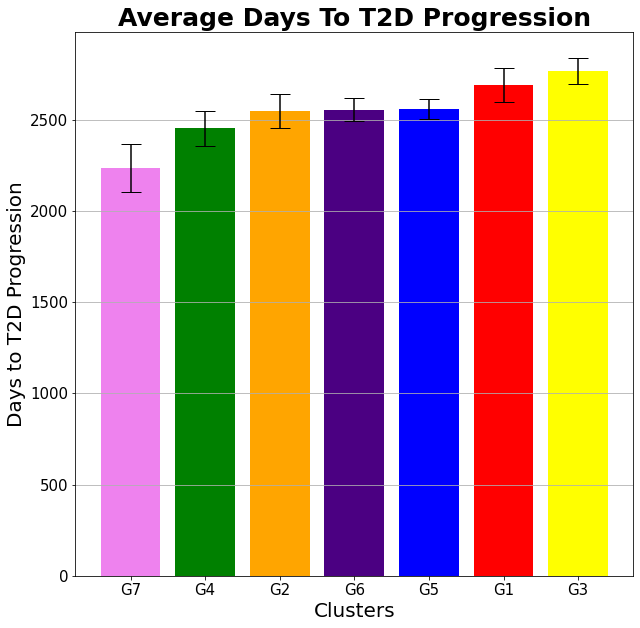

In [164]:
# Create lists for the plot
clusters = ['G7', 'G4', 'G2', 'G6', 'G5', 'G1', 'G3']
x_pos = np.arange(len(clusters))
time_to_progression = [2237, 2453, 2549, 2556, 2560, 2693, 2768]
error = [131, 97, 91, 63, 56, 94, 71]

# Build the plot
fig, ax = plt.subplots(figsize = (10,10))
ax.bar(x_pos, time_to_progression, yerr=error, align='center', alpha=1, ecolor='black', capsize=10, color=['violet', 'green', 'orange', 'indigo', 'blue', 'red', 'yellow'])
ax.set_ylabel('Days to T2D Progression', fontsize = 20)
ax.set_xlabel('Clusters', fontsize = 20)
ax.set_xticks(x_pos)
ax.set_xticklabels(clusters, fontsize = 15)
ax.yaxis.set_tick_params(labelsize=15)
ax.set_title('Average Days To T2D Progression', fontsize = 25, fontweight = 'bold')
ax.yaxis.grid(True)

Below we show the median progression time to T2D for each cluster.

In [165]:
print('Median Days To Progression For Cluster 1:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 1]['days between diagnoses'].median())
print('Median Days To Progression For Cluster 2:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 2]['days between diagnoses'].median())
print('Median Days To Progression For Cluster 3:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 3]['days between diagnoses'].median())
print('Median Days To Progression For Cluster 4:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 4]['days between diagnoses'].median())
print('Median Days To Progression For Cluster 5:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 5]['days between diagnoses'].median())
print('Median Days To Progression For Cluster 6:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 6]['days between diagnoses'].median())
print('Median Days To Progression For Cluster 7:', prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final['labels'] == 7]['days between diagnoses'].median())


Median Days To Progression For Cluster 1: 2915.0
Median Days To Progression For Cluster 2: 2560.0
Median Days To Progression For Cluster 3: 2900.0
Median Days To Progression For Cluster 4: 2667.0
Median Days To Progression For Cluster 5: 2627.0
Median Days To Progression For Cluster 6: 2366.0
Median Days To Progression For Cluster 7: 2266.0


<a class="anchor" id="Survival_analysis"></a>
# Survival Analysis 

In [166]:
prediabetes_with_metabolomics_with_diagnosis_column = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled.drop_duplicates()
prediabetes_with_metabolomics_with_diagnosis_column

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,31-0.0,Age Covariate,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels
135,0.368701,0.354952,0.317711,0.313315,0.410439,0.456313,0.268151,0.266144,0.243557,0.245425,...,1,0,1,0,0,0,0,0,1,5
1089,0.178951,0.183385,0.195076,0.286471,0.185227,0.260847,0.147217,0.412621,0.395243,0.290853,...,1,1,1,0,0,0,0,0,1,7
1490,0.529190,0.523941,0.545857,0.559230,0.528915,0.556045,0.305662,0.346235,0.312944,0.311998,...,0,1,1,0,0,0,0,0,0,3
420,0.362598,0.340459,0.346718,0.345140,0.400694,0.405771,0.288623,0.224699,0.229556,0.127227,...,0,1,1,0,0,0,0,0,1,5
2098,0.626181,0.509336,0.463818,0.313156,0.602129,0.601268,0.645094,0.132783,0.105471,0.206871,...,0,0,0,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358,0.409575,0.430062,0.400141,0.398334,0.490266,0.517041,0.190667,0.248019,0.241892,0.191515,...,1,1,1,0,0,0,0,0,1,5
1977,0.454162,0.399073,0.344602,0.296642,0.483616,0.510597,0.412591,0.167026,0.155478,0.169499,...,0,1,1,0,0,0,0,0,1,3
79,0.292815,0.276207,0.258656,0.276523,0.333195,0.368991,0.247287,0.265757,0.259607,0.191012,...,1,1,1,0,0,0,0,0,1,7
1904,0.299452,0.309983,0.311656,0.308671,0.366862,0.382527,0.176149,0.265407,0.261677,0.192154,...,1,1,1,0,0,0,0,0,1,5


Below we add the days to diagnoses column.

In [167]:
prediabetes_with_metabolomics_with_diagnosis_column_with_days = prediabetes_with_metabolomics_with_diagnosis_column.merge(prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[['eid', 'days between diagnoses']], how = 'left')
prediabetes_with_metabolomics_with_diagnosis_column_with_days

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Age Covariate,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,days between diagnoses
0,0.368701,0.354952,0.317711,0.313315,0.410439,0.456313,0.268151,0.266144,0.243557,0.245425,...,0,1,0,0,0,0,0,1,5,2298.0
1,0.178951,0.183385,0.195076,0.286471,0.185227,0.260847,0.147217,0.412621,0.395243,0.290853,...,1,1,0,0,0,0,0,1,7,2653.0
2,0.529190,0.523941,0.545857,0.559230,0.528915,0.556045,0.305662,0.346235,0.312944,0.311998,...,1,1,0,0,0,0,0,0,3,NaN
3,0.362598,0.340459,0.346718,0.345140,0.400694,0.405771,0.288623,0.224699,0.229556,0.127227,...,1,1,0,0,0,0,0,1,5,1353.0
4,0.626181,0.509336,0.463818,0.313156,0.602129,0.601268,0.645094,0.132783,0.105471,0.206871,...,0,0,1,0,0,0,0,1,3,3563.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2334,0.409575,0.430062,0.400141,0.398334,0.490266,0.517041,0.190667,0.248019,0.241892,0.191515,...,1,1,0,0,0,0,0,1,5,2377.0
2335,0.454162,0.399073,0.344602,0.296642,0.483616,0.510597,0.412591,0.167026,0.155478,0.169499,...,1,1,0,0,0,0,0,1,3,1790.0
2336,0.292815,0.276207,0.258656,0.276523,0.333195,0.368991,0.247287,0.265757,0.259607,0.191012,...,1,1,0,0,0,0,0,1,7,3265.0
2337,0.299452,0.309983,0.311656,0.308671,0.366862,0.382527,0.176149,0.265407,0.261677,0.192154,...,1,1,0,0,0,0,0,1,5,1002.0


Since all other 

In [168]:
test = pd.isnull(prediabetes_with_metabolomics_with_diagnosis_column_with_days['days between diagnoses'])
cut_out = prediabetes_with_metabolomics_with_diagnosis_column_with_days[test][prediabetes_with_metabolomics_with_diagnosis_column_with_days['target'] == 1]
dftolist_cut_out = cut_out.eid.tolist()
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors = prediabetes_with_metabolomics_with_diagnosis_column_with_days[~prediabetes_with_metabolomics_with_diagnosis_column_with_days.eid.isin(dftolist_cut_out)]
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors

Boolean Series key will be reindexed to match DataFrame index.


,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Age Covariate,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,days between diagnoses
0,0.368701,0.354952,0.317711,0.313315,0.410439,0.456313,0.268151,0.266144,0.243557,0.245425,...,0,1,0,0,0,0,0,1,5,2298.0
1,0.178951,0.183385,0.195076,0.286471,0.185227,0.260847,0.147217,0.412621,0.395243,0.290853,...,1,1,0,0,0,0,0,1,7,2653.0
2,0.529190,0.523941,0.545857,0.559230,0.528915,0.556045,0.305662,0.346235,0.312944,0.311998,...,1,1,0,0,0,0,0,0,3,NaN
3,0.362598,0.340459,0.346718,0.345140,0.400694,0.405771,0.288623,0.224699,0.229556,0.127227,...,1,1,0,0,0,0,0,1,5,1353.0
4,0.626181,0.509336,0.463818,0.313156,0.602129,0.601268,0.645094,0.132783,0.105471,0.206871,...,0,0,1,0,0,0,0,1,3,3563.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2334,0.409575,0.430062,0.400141,0.398334,0.490266,0.517041,0.190667,0.248019,0.241892,0.191515,...,1,1,0,0,0,0,0,1,5,2377.0
2335,0.454162,0.399073,0.344602,0.296642,0.483616,0.510597,0.412591,0.167026,0.155478,0.169499,...,1,1,0,0,0,0,0,1,3,1790.0
2336,0.292815,0.276207,0.258656,0.276523,0.333195,0.368991,0.247287,0.265757,0.259607,0.191012,...,1,1,0,0,0,0,0,1,7,3265.0
2337,0.299452,0.309983,0.311656,0.308671,0.366862,0.382527,0.176149,0.265407,0.261677,0.192154,...,1,1,0,0,0,0,0,1,5,1002.0


Next we fill the remaining nan values with the value 5110 = 365*14 years which should be large enough for all patients not progressing to make it to the end of the study.

In [169]:
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors.fillna(5110)
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Age Covariate,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,days between diagnoses
0,0.368701,0.354952,0.317711,0.313315,0.410439,0.456313,0.268151,0.266144,0.243557,0.245425,...,0,1,0,0,0,0,0,1,5,2298.0
1,0.178951,0.183385,0.195076,0.286471,0.185227,0.260847,0.147217,0.412621,0.395243,0.290853,...,1,1,0,0,0,0,0,1,7,2653.0
2,0.529190,0.523941,0.545857,0.559230,0.528915,0.556045,0.305662,0.346235,0.312944,0.311998,...,1,1,0,0,0,0,0,0,3,5110.0
3,0.362598,0.340459,0.346718,0.345140,0.400694,0.405771,0.288623,0.224699,0.229556,0.127227,...,1,1,0,0,0,0,0,1,5,1353.0
4,0.626181,0.509336,0.463818,0.313156,0.602129,0.601268,0.645094,0.132783,0.105471,0.206871,...,0,0,1,0,0,0,0,1,3,3563.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2334,0.409575,0.430062,0.400141,0.398334,0.490266,0.517041,0.190667,0.248019,0.241892,0.191515,...,1,1,0,0,0,0,0,1,5,2377.0
2335,0.454162,0.399073,0.344602,0.296642,0.483616,0.510597,0.412591,0.167026,0.155478,0.169499,...,1,1,0,0,0,0,0,1,3,1790.0
2336,0.292815,0.276207,0.258656,0.276523,0.333195,0.368991,0.247287,0.265757,0.259607,0.191012,...,1,1,0,0,0,0,0,1,7,3265.0
2337,0.299452,0.309983,0.311656,0.308671,0.366862,0.382527,0.176149,0.265407,0.261677,0.192154,...,1,1,0,0,0,0,0,1,5,1002.0


Below we make the kaplan meier curves for each cluster. We use this reference: https://plotly.com/python/v3/ipython-notebooks/survival-analysis-r-vs-python/

Text(0.5, 1.0, 'Time to T2D Kaplan Meier Curves')

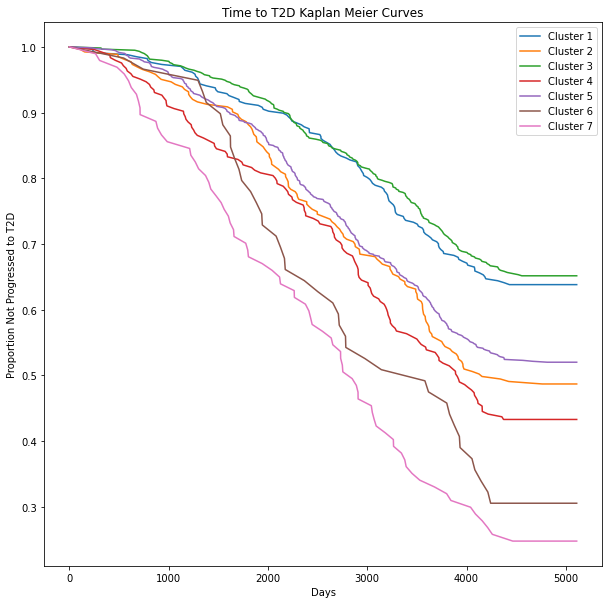

In [170]:
import kaplanmeier as km
import lifelines as ll
from lifelines import KaplanMeierFitter
import matplotlib.patches as mpatches

plt.figure(figsize = (10, 10))
ax = plt.subplot(111)

kmf = KaplanMeierFitter()

T = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored.labels == 1]['days between diagnoses']
C = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored.labels == 1]['target']

T2 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored.labels == 2]['days between diagnoses']
C2 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored.labels == 2]['target']

T3 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored.labels == 3]['days between diagnoses']
C3 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored.labels == 3]['target']

T4 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored.labels == 4]['days between diagnoses']
C4 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored.labels == 4]['target']

T5 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored.labels == 5]['days between diagnoses']
C5 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored.labels == 5]['target']

T6 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored.labels == 6]['days between diagnoses']
C6 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored.labels == 6]['target']

T7 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored.labels == 7]['days between diagnoses']
C7 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored.labels == 7]['target']

kmf.fit(T, event_observed=C, label='Cluster 1')
kmf.survival_function_.plot(ax=ax)
kmf.fit(T2, event_observed=C2, label='Cluster 2')
kmf.survival_function_.plot(ax=ax)
kmf.fit(T3, event_observed=C3, label='Cluster 3')
kmf.survival_function_.plot(ax=ax)
kmf.fit(T4, event_observed=C4, label='Cluster 4')
kmf.survival_function_.plot(ax=ax)
kmf.fit(T5, event_observed=C5, label='Cluster 5')
kmf.survival_function_.plot(ax=ax)
kmf.fit(T6, event_observed=C6, label='Cluster 6')
kmf.survival_function_.plot(ax=ax)
kmf.fit(T7, event_observed=C7, label='Cluster 7')
kmf.survival_function_.plot(ax=ax)

plt.ylabel('Proportion Not Progressed to T2D')
plt.xlabel('Days')
plt.title('Time to T2D Kaplan Meier Curves')



We estimate the cumulative hazard function using the Nelson-Aalen estimator. We see the shape is indicative of wear-out mortality.

Text(0.5, 1.0, 'Nelson-Aalen Estimate')

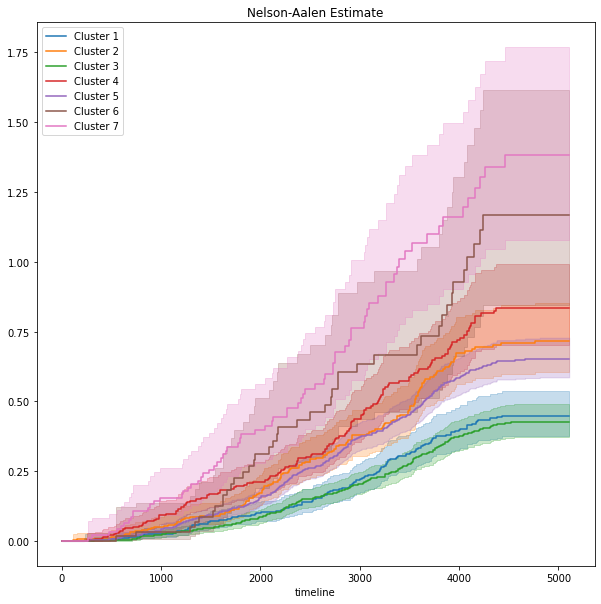

In [171]:
from lifelines import NelsonAalenFitter

plt.figure(figsize = (10, 10))
naf = NelsonAalenFitter()
naf.fit(T, event_observed=C)
naf2 = NelsonAalenFitter()
naf2.fit(T2, event_observed=C2)
naf3 = NelsonAalenFitter()
naf3.fit(T3, event_observed=C3)
naf4 = NelsonAalenFitter()
naf4.fit(T4, event_observed=C4)
naf5 = NelsonAalenFitter()
naf5.fit(T5, event_observed=C5)
naf6 = NelsonAalenFitter()
naf6.fit(T6, event_observed=C6)
naf7 = NelsonAalenFitter()
naf7.fit(T7, event_observed=C7)

naf.plot(label = 'Cluster 1')
naf2.plot(label = 'Cluster 2')
naf3.plot(label = 'Cluster 3')
naf4.plot(label = 'Cluster 4')
naf5.plot(label = 'Cluster 5')
naf6.plot(label = 'Cluster 6')
naf7.plot(label = 'Cluster 7')

plt.legend(loc = 'upper left')
plt.title('Nelson-Aalen Estimate')

Next we want to compare the groups statistically to see if they are different. We do this using the pairwise logrank test shown here: https://github.com/CamDavidsonPilon/lifelines/issues/185 We have to first label all censored patients.

In [172]:
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_only = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored['days between diagnoses'] == 5110]
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_only['status'] = 0
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_only


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,days between diagnoses,status
2,0.529190,0.523941,0.545857,0.559230,0.528915,0.556045,0.305662,0.346235,0.312944,0.311998,...,1,0,0,0,0,0,0,3,5110.0,0
5,0.575464,0.585278,0.540551,0.446509,0.683916,0.668413,0.282190,0.168813,0.160991,0.180652,...,1,0,0,0,0,0,0,3,5110.0,0
6,0.383690,0.376508,0.329659,0.317376,0.445974,0.483863,0.255980,0.215894,0.204051,0.179607,...,0,0,1,0,0,0,0,5,5110.0,0
12,0.590200,0.615098,0.591304,0.548058,0.676919,0.676940,0.246808,0.298564,0.270641,0.300980,...,1,0,0,0,0,0,0,3,5110.0,0
14,0.402390,0.375051,0.395485,0.333826,0.442274,0.424401,0.317746,0.137793,0.117071,0.172113,...,1,0,0,0,0,0,0,3,5110.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2327,0.368293,0.393148,0.340239,0.327324,0.480521,0.503956,0.163205,0.173878,0.162982,0.176334,...,1,0,0,0,0,0,0,5,5110.0,0
2330,0.367253,0.229764,0.186352,0.105584,0.318834,0.349883,0.603410,0.065249,0.054446,0.103216,...,1,0,0,0,0,0,0,1,5110.0,0
2331,0.150183,0.176659,0.177695,0.258124,0.221221,0.264052,0.076562,0.235033,0.227720,0.189792,...,1,0,0,0,0,0,0,4,5110.0,0
2332,0.251645,0.187773,0.157218,0.165798,0.260914,0.301255,0.360039,0.136356,0.141891,0.082477,...,1,0,0,0,0,0,0,1,5110.0,0


Next we label all progressing patients.

In [173]:
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_progressors_only = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored['days between diagnoses'] != 5110]
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_progressors_only['status'] = 1
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_progressors_only


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,days between diagnoses,status
0,0.368701,0.354952,0.317711,0.313315,0.410439,0.456313,0.268151,0.266144,0.243557,0.245425,...,1,0,0,0,0,0,1,5,2298.0,1
1,0.178951,0.183385,0.195076,0.286471,0.185227,0.260847,0.147217,0.412621,0.395243,0.290853,...,1,0,0,0,0,0,1,7,2653.0,1
3,0.362598,0.340459,0.346718,0.345140,0.400694,0.405771,0.288623,0.224699,0.229556,0.127227,...,1,0,0,0,0,0,1,5,1353.0,1
4,0.626181,0.509336,0.463818,0.313156,0.602129,0.601268,0.645094,0.132783,0.105471,0.206871,...,0,1,0,0,0,0,1,3,3563.0,1
7,0.629921,0.681768,0.700005,0.752322,0.676663,0.700156,0.188624,0.487038,0.464907,0.392165,...,1,0,0,0,0,0,1,5,2066.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2334,0.409575,0.430062,0.400141,0.398334,0.490266,0.517041,0.190667,0.248019,0.241892,0.191515,...,1,0,0,0,0,0,1,5,2377.0,1
2335,0.454162,0.399073,0.344602,0.296642,0.483616,0.510597,0.412591,0.167026,0.155478,0.169499,...,1,0,0,0,0,0,1,3,1790.0,1
2336,0.292815,0.276207,0.258656,0.276523,0.333195,0.368991,0.247287,0.265757,0.259607,0.191012,...,1,0,0,0,0,0,1,7,3265.0,1
2337,0.299452,0.309983,0.311656,0.308671,0.366862,0.382527,0.176149,0.265407,0.261677,0.192154,...,1,0,0,0,0,0,1,5,1002.0,1


Below we combine these groups.

In [174]:
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_only.append(prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_progressors_only)
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,days between diagnoses,status
2,0.529190,0.523941,0.545857,0.559230,0.528915,0.556045,0.305662,0.346235,0.312944,0.311998,...,1,0,0,0,0,0,0,3,5110.0,0
5,0.575464,0.585278,0.540551,0.446509,0.683916,0.668413,0.282190,0.168813,0.160991,0.180652,...,1,0,0,0,0,0,0,3,5110.0,0
6,0.383690,0.376508,0.329659,0.317376,0.445974,0.483863,0.255980,0.215894,0.204051,0.179607,...,0,0,1,0,0,0,0,5,5110.0,0
12,0.590200,0.615098,0.591304,0.548058,0.676919,0.676940,0.246808,0.298564,0.270641,0.300980,...,1,0,0,0,0,0,0,3,5110.0,0
14,0.402390,0.375051,0.395485,0.333826,0.442274,0.424401,0.317746,0.137793,0.117071,0.172113,...,1,0,0,0,0,0,0,3,5110.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2334,0.409575,0.430062,0.400141,0.398334,0.490266,0.517041,0.190667,0.248019,0.241892,0.191515,...,1,0,0,0,0,0,1,5,2377.0,1
2335,0.454162,0.399073,0.344602,0.296642,0.483616,0.510597,0.412591,0.167026,0.155478,0.169499,...,1,0,0,0,0,0,1,3,1790.0,1
2336,0.292815,0.276207,0.258656,0.276523,0.333195,0.368991,0.247287,0.265757,0.259607,0.191012,...,1,0,0,0,0,0,1,7,3265.0,1
2337,0.299452,0.309983,0.311656,0.308671,0.366862,0.382527,0.176149,0.265407,0.261677,0.192154,...,1,0,0,0,0,0,1,5,1002.0,1


Now we can run our statistical testing.

In [175]:
from lifelines.statistics import pairwise_logrank_test

pairwise_logrank_test(prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status['days between diagnoses'], prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status['labels'], event_observed = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status['status'], alpha=0.95, bonferroni=True)

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
             alpha = 0.95
        bonferroni = True
         test_name = logrank_test

---
     test_statistic      p  -log2(p)
1 2           15.14 <0.005     13.29
  3            0.24   0.63      0.67
  4           27.34 <0.005     22.48
  5           13.67 <0.005     12.16
  6           29.38 <0.005     24.00
  7           68.90 <0.005     53.10
2 3           24.26 <0.005     20.18
  4            1.65   0.20      2.33
  5            0.85   0.36      1.49
  6            6.66   0.01      6.67
  7           23.26 <0.005     19.43
3 4           41.72 <0.005     33.14
  5           25.59 <0.005     21.17
  6           37.89 <0.005     30.31
  7           93.36 <0.005     70.96
4 5            6.08   0.01      6.19
  6            2.86   0.09      3.46
  7           13.27 <0.005     11.85
5 6           11.39 <0.005     10.40
  7           38.28 <0.005     30.61
6 7            1.40   0.24      2.08

Below we merge the death date column to the dataframe. We need to factor these into the survival analysis. 

In [176]:
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status.merge(prediabetes_with_all[['eid', '40000-0.0']])
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,days between diagnoses,status,40000-0.0
0,0.529190,0.523941,0.545857,0.559230,0.528915,0.556045,0.305662,0.346235,0.312944,0.311998,...,0,0,0,0,0,0,3,5110.0,0,NaN
1,0.575464,0.585278,0.540551,0.446509,0.683916,0.668413,0.282190,0.168813,0.160991,0.180652,...,0,0,0,0,0,0,3,5110.0,0,NaN
2,0.383690,0.376508,0.329659,0.317376,0.445974,0.483863,0.255980,0.215894,0.204051,0.179607,...,0,1,0,0,0,0,5,5110.0,0,NaN
3,0.590200,0.615098,0.591304,0.548058,0.676919,0.676940,0.246808,0.298564,0.270641,0.300980,...,0,0,0,0,0,0,3,5110.0,0,NaN
4,0.402390,0.375051,0.395485,0.333826,0.442274,0.424401,0.317746,0.137793,0.117071,0.172113,...,0,0,0,0,0,0,3,5110.0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2293,0.409575,0.430062,0.400141,0.398334,0.490266,0.517041,0.190667,0.248019,0.241892,0.191515,...,0,0,0,0,0,1,5,2377.0,1,NaN
2294,0.454162,0.399073,0.344602,0.296642,0.483616,0.510597,0.412591,0.167026,0.155478,0.169499,...,0,0,0,0,0,1,3,1790.0,1,2015-07-19
2295,0.292815,0.276207,0.258656,0.276523,0.333195,0.368991,0.247287,0.265757,0.259607,0.191012,...,0,0,0,0,0,1,7,3265.0,1,NaN
2296,0.299452,0.309983,0.311656,0.308671,0.366862,0.382527,0.176149,0.265407,0.261677,0.192154,...,0,0,0,0,0,1,5,1002.0,1,NaN


Below we look at patients who do not progress to T2D who die. 

In [177]:
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_censored = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death['40000-0.0'].notnull()
censored_with_death = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_censored][prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death['status'] == 0]
censored_with_death

Boolean Series key will be reindexed to match DataFrame index.


,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,days between diagnoses,status,40000-0.0
29,0.271527,0.237035,0.220144,0.241341,0.285331,0.333449,0.287798,0.205819,0.187574,0.177031,...,0,0,0,0,0,0,2,5110.0,0,2015-06-10
277,0.187205,0.180983,0.172291,0.230254,0.231076,0.276322,0.179257,0.191432,0.185406,0.144577,...,0,0,0,0,0,0,4,5110.0,0,2014-08-26
397,0.327011,0.246804,0.267251,0.240404,0.268809,0.309923,0.432759,0.152363,0.111977,0.208924,...,1,0,0,0,0,0,1,5110.0,0,2017-04-01
592,0.482860,0.469795,0.482375,0.526827,0.486144,0.515775,0.309357,0.351153,0.322676,0.287619,...,0,0,0,0,0,0,3,5110.0,0,2017-10-29
650,0.201969,0.209041,0.223041,0.227729,0.268131,0.281753,0.148761,0.109382,0.086813,0.136193,...,1,0,0,0,0,0,5,5110.0,0,2013-01-28
786,0.146822,0.153853,0.148171,0.183175,0.216513,0.249498,0.128044,0.147132,0.150431,0.083387,...,0,0,0,0,0,0,4,5110.0,0,2015-01-08


Below we merge the date of attending the assessment center to these patients.

In [178]:
censored_with_death_with_date = censored_with_death.merge(prediabetes_with_all[['eid', '53-0.0']])
censored_with_death_with_date

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,days between diagnoses,status,40000-0.0,53-0.0
0,0.271527,0.237035,0.220144,0.241341,0.285331,0.333449,0.287798,0.205819,0.187574,0.177031,...,0,0,0,0,0,2,5110.0,0,2015-06-10,2009-10-16
1,0.187205,0.180983,0.172291,0.230254,0.231076,0.276322,0.179257,0.191432,0.185406,0.144577,...,0,0,0,0,0,4,5110.0,0,2014-08-26,2008-02-07
2,0.327011,0.246804,0.267251,0.240404,0.268809,0.309923,0.432759,0.152363,0.111977,0.208924,...,0,0,0,0,0,1,5110.0,0,2017-04-01,2008-11-13
3,0.482860,0.469795,0.482375,0.526827,0.486144,0.515775,0.309357,0.351153,0.322676,0.287619,...,0,0,0,0,0,3,5110.0,0,2017-10-29,2009-04-24
4,0.201969,0.209041,0.223041,0.227729,0.268131,0.281753,0.148761,0.109382,0.086813,0.136193,...,0,0,0,0,0,5,5110.0,0,2013-01-28,2009-09-07
5,0.146822,0.153853,0.148171,0.183175,0.216513,0.249498,0.128044,0.147132,0.150431,0.083387,...,0,0,0,0,0,4,5110.0,0,2015-01-08,2009-06-02


Below we change the date columns to date time format.

In [179]:
censored_with_death_with_date['53-0.0'] = pd.to_datetime(censored_with_death_with_date['53-0.0'])
censored_with_death_with_date['40000-0.0'] = pd.to_datetime(censored_with_death_with_date['40000-0.0'])
censored_with_death_with_date

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,days between diagnoses,status,40000-0.0,53-0.0
0,0.271527,0.237035,0.220144,0.241341,0.285331,0.333449,0.287798,0.205819,0.187574,0.177031,...,0,0,0,0,0,2,5110.0,0,2015-06-10,2009-10-16
1,0.187205,0.180983,0.172291,0.230254,0.231076,0.276322,0.179257,0.191432,0.185406,0.144577,...,0,0,0,0,0,4,5110.0,0,2014-08-26,2008-02-07
2,0.327011,0.246804,0.267251,0.240404,0.268809,0.309923,0.432759,0.152363,0.111977,0.208924,...,0,0,0,0,0,1,5110.0,0,2017-04-01,2008-11-13
3,0.482860,0.469795,0.482375,0.526827,0.486144,0.515775,0.309357,0.351153,0.322676,0.287619,...,0,0,0,0,0,3,5110.0,0,2017-10-29,2009-04-24
4,0.201969,0.209041,0.223041,0.227729,0.268131,0.281753,0.148761,0.109382,0.086813,0.136193,...,0,0,0,0,0,5,5110.0,0,2013-01-28,2009-09-07
5,0.146822,0.153853,0.148171,0.183175,0.216513,0.249498,0.128044,0.147132,0.150431,0.083387,...,0,0,0,0,0,4,5110.0,0,2015-01-08,2009-06-02


Below we fill in the days between diagnoses with the time until death for each patient.

In [180]:
censored_with_death_with_date['days between diagnoses'] = (censored_with_death_with_date['40000-0.0'] - censored_with_death_with_date['53-0.0']).dt.days
censored_with_death_with_date

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,days between diagnoses,status,40000-0.0,53-0.0
0,0.271527,0.237035,0.220144,0.241341,0.285331,0.333449,0.287798,0.205819,0.187574,0.177031,...,0,0,0,0,0,2,2063,0,2015-06-10,2009-10-16
1,0.187205,0.180983,0.172291,0.230254,0.231076,0.276322,0.179257,0.191432,0.185406,0.144577,...,0,0,0,0,0,4,2392,0,2014-08-26,2008-02-07
2,0.327011,0.246804,0.267251,0.240404,0.268809,0.309923,0.432759,0.152363,0.111977,0.208924,...,0,0,0,0,0,1,3061,0,2017-04-01,2008-11-13
3,0.482860,0.469795,0.482375,0.526827,0.486144,0.515775,0.309357,0.351153,0.322676,0.287619,...,0,0,0,0,0,3,3110,0,2017-10-29,2009-04-24
4,0.201969,0.209041,0.223041,0.227729,0.268131,0.281753,0.148761,0.109382,0.086813,0.136193,...,0,0,0,0,0,5,1239,0,2013-01-28,2009-09-07
5,0.146822,0.153853,0.148171,0.183175,0.216513,0.249498,0.128044,0.147132,0.150431,0.083387,...,0,0,0,0,0,4,2046,0,2015-01-08,2009-06-02


Below we add these columns back in and drop those from the current dataframe with the censored time between diagnoses.

In [181]:
censored_with_death_with_date_no_extra_cols = censored_with_death_with_date.drop(columns = ['40000-0.0', '53-0.0'])
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status.append(censored_with_death_with_date_no_extra_cols)
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death.drop_duplicates(subset = 'eid', keep = 'last')
prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,...,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,target,labels,days between diagnoses,status
2,0.529190,0.523941,0.545857,0.559230,0.528915,0.556045,0.305662,0.346235,0.312944,0.311998,...,1,0,0,0,0,0,0,3,5110.0,0
5,0.575464,0.585278,0.540551,0.446509,0.683916,0.668413,0.282190,0.168813,0.160991,0.180652,...,1,0,0,0,0,0,0,3,5110.0,0
6,0.383690,0.376508,0.329659,0.317376,0.445974,0.483863,0.255980,0.215894,0.204051,0.179607,...,0,0,1,0,0,0,0,5,5110.0,0
12,0.590200,0.615098,0.591304,0.548058,0.676919,0.676940,0.246808,0.298564,0.270641,0.300980,...,1,0,0,0,0,0,0,3,5110.0,0
14,0.402390,0.375051,0.395485,0.333826,0.442274,0.424401,0.317746,0.137793,0.117071,0.172113,...,1,0,0,0,0,0,0,3,5110.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1,0.187205,0.180983,0.172291,0.230254,0.231076,0.276322,0.179257,0.191432,0.185406,0.144577,...,1,0,0,0,0,0,0,4,2392.0,0
2,0.327011,0.246804,0.267251,0.240404,0.268809,0.309923,0.432759,0.152363,0.111977,0.208924,...,0,1,0,0,0,0,0,1,3061.0,0
3,0.482860,0.469795,0.482375,0.526827,0.486144,0.515775,0.309357,0.351153,0.322676,0.287619,...,1,0,0,0,0,0,0,3,3110.0,0
4,0.201969,0.209041,0.223041,0.227729,0.268131,0.281753,0.148761,0.109382,0.086813,0.136193,...,0,1,0,0,0,0,0,5,1239.0,0


Below we make the kaplan meier curves with our new data.

([<matplotlib.axis.YTick at 0x2800823c308>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

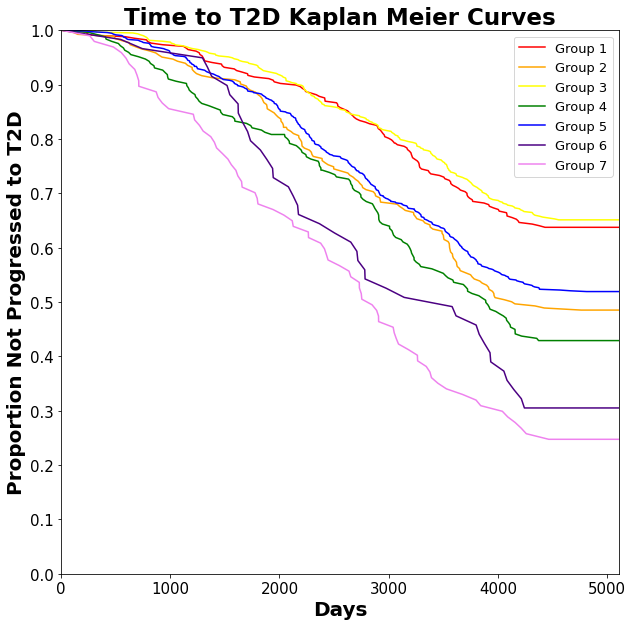

In [182]:
plt.figure(figsize = (10, 10))
ax = plt.subplot(111)

kmf = KaplanMeierFitter()

T = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 1]['days between diagnoses']
C = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 1]['target']

T2 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 2]['days between diagnoses']
C2 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 2]['target']

T3 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 3]['days between diagnoses']
C3 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 3]['target']

T4 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 4]['days between diagnoses']
C4 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 4]['target']

T5 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 5]['days between diagnoses']
C5 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 5]['target']

T6 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 6]['days between diagnoses']
C6 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 6]['target']

T7 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 7]['days between diagnoses']
C7 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 7]['target']

kmf.fit(T, event_observed=C, label='Group 1')
kmf.survival_function_.plot(ax=ax, color = 'Red')
kmf.fit(T2, event_observed=C2, label='Group 2')
kmf.survival_function_.plot(ax=ax, color = 'Orange')
kmf.fit(T3, event_observed=C3, label='Group 3')
kmf.survival_function_.plot(ax=ax, color = 'Yellow')
kmf.fit(T4, event_observed=C4, label='Group 4')
kmf.survival_function_.plot(ax=ax, color = 'Green')
kmf.fit(T5, event_observed=C5, label='Group 5')
kmf.survival_function_.plot(ax=ax, color = 'Blue')
kmf.fit(T6, event_observed=C6, label='Group 6')
kmf.survival_function_.plot(ax=ax, color = 'Indigo')
kmf.fit(T7, event_observed=C7, label='Group 7')
kmf.survival_function_.plot(ax=ax, color = 'Violet')

plt.ylabel('Proportion Not Progressed to T2D', fontsize = 20, fontweight = 'bold')
plt.xlabel('Days', fontsize = 20, fontweight = 'bold')
plt.title('Time to T2D Kaplan Meier Curves', fontsize = 23, fontweight = 'bold')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.legend(fontsize = 13)
plt.ylim(0, 1)
plt.margins(0)
plt.yticks(np.arange(0, 1 + 0.1, 0.1))


# Below we create the final figure for survival analysis with new labels.

([<matplotlib.axis.YTick at 0x2801a8b5f48>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

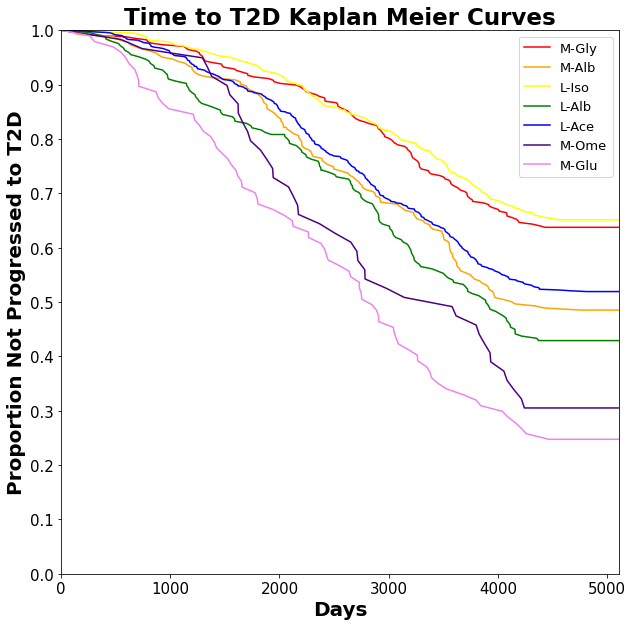

In [183]:
plt.figure(figsize = (10, 10))
ax = plt.subplot(111)

kmf = KaplanMeierFitter()

T = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 1]['days between diagnoses']
C = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 1]['target']

T2 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 2]['days between diagnoses']
C2 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 2]['target']

T3 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 3]['days between diagnoses']
C3 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 3]['target']

T4 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 4]['days between diagnoses']
C4 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 4]['target']

T5 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 5]['days between diagnoses']
C5 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 5]['target']

T6 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 6]['days between diagnoses']
C6 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 6]['target']

T7 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 7]['days between diagnoses']
C7 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 7]['target']

kmf.fit(T, event_observed=C, label='M-Gly')
kmf.survival_function_.plot(ax=ax, color = 'Red')
kmf.fit(T2, event_observed=C2, label='M-Alb')
kmf.survival_function_.plot(ax=ax, color = 'Orange')
kmf.fit(T3, event_observed=C3, label='L-Iso')
kmf.survival_function_.plot(ax=ax, color = 'Yellow')
kmf.fit(T4, event_observed=C4, label='L-Alb')
kmf.survival_function_.plot(ax=ax, color = 'Green')
kmf.fit(T5, event_observed=C5, label='L-Ace')
kmf.survival_function_.plot(ax=ax, color = 'Blue')
kmf.fit(T6, event_observed=C6, label='M-Ome')
kmf.survival_function_.plot(ax=ax, color = 'Indigo')
kmf.fit(T7, event_observed=C7, label='M-Glu')
kmf.survival_function_.plot(ax=ax, color = 'Violet')

plt.ylabel('Proportion Not Progressed to T2D', fontsize = 20, fontweight = 'bold')
plt.xlabel('Days', fontsize = 20, fontweight = 'bold')
plt.title('Time to T2D Kaplan Meier Curves', fontsize = 23, fontweight = 'bold')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.legend(fontsize = 13)
plt.ylim(0, 1)
plt.margins(0)
plt.yticks(np.arange(0, 1 + 0.1, 0.1))

Below we make the same graph without the lines in it for the 3 minute competition.

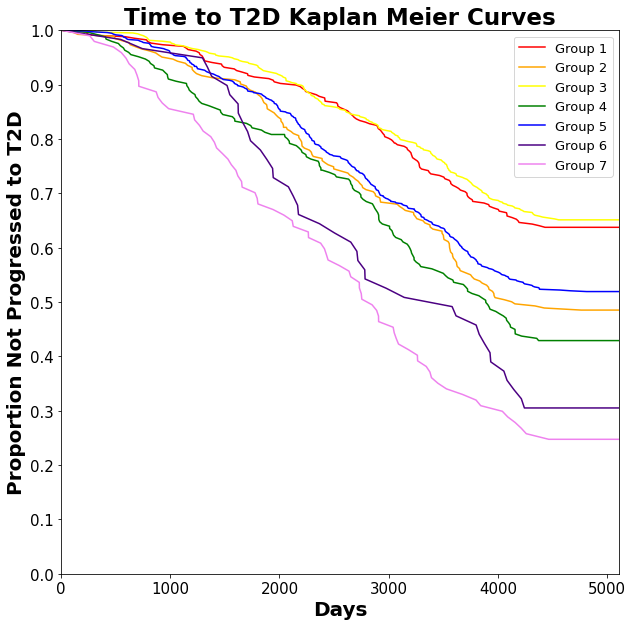

In [184]:
plt.figure(figsize = (10, 10))
ax = plt.subplot(111)

kmf = KaplanMeierFitter()

T = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 1]['days between diagnoses']
C = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 1]['target']

T2 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 2]['days between diagnoses']
C2 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 2]['target']

T3 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 3]['days between diagnoses']
C3 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 3]['target']

T4 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 4]['days between diagnoses']
C4 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 4]['target']

T5 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 5]['days between diagnoses']
C5 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 5]['target']

T6 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 6]['days between diagnoses']
C6 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 6]['target']

T7 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 7]['days between diagnoses']
C7 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final.labels == 7]['target']

kmf.fit(T, event_observed=C, label='Group 1')
kmf.survival_function_.plot(ax=ax, color = 'Red')
kmf.fit(T2, event_observed=C2, label='Group 2')
kmf.survival_function_.plot(ax=ax, color = 'Orange')
kmf.fit(T3, event_observed=C3, label='Group 3')
kmf.survival_function_.plot(ax=ax, color = 'Yellow')
kmf.fit(T4, event_observed=C4, label='Group 4')
kmf.survival_function_.plot(ax=ax, color = 'Green')
kmf.fit(T5, event_observed=C5, label='Group 5')
kmf.survival_function_.plot(ax=ax, color = 'Blue')
kmf.fit(T6, event_observed=C6, label='Group 6')
kmf.survival_function_.plot(ax=ax, color = 'Indigo')
kmf.fit(T7, event_observed=C7, label='Group 7')
kmf.survival_function_.plot(ax=ax, color = 'Violet')

plt.ylabel('Proportion Not Progressed to T2D', fontsize = 20, fontweight = 'bold')
plt.xlabel('Days', fontsize = 20, fontweight = 'bold')
plt.title('Time to T2D Kaplan Meier Curves', fontsize = 23, fontweight = 'bold')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.legend(fontsize = 13)
plt.ylim(0, 1)
plt.margins(0)
plt.yticks(np.arange(0, 1 + 0.1, 0.1))
plt.grid(False)

We estimate the cumulative hazard function using the Nelson-Aalen estimator. We see the shape is indicative of wear-out mortality.

Text(0.5, 1.0, 'Nelson-Aalen Estimate')

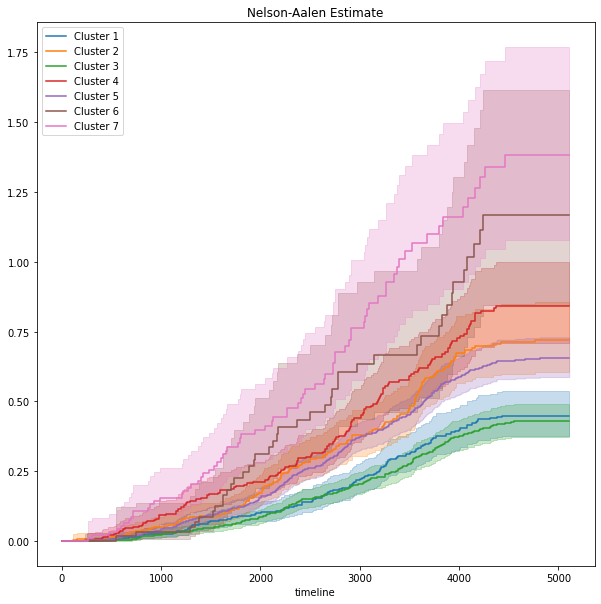

In [185]:
from lifelines import NelsonAalenFitter

plt.figure(figsize = (10, 10))
naf = NelsonAalenFitter()
naf.fit(T, event_observed=C)
naf2 = NelsonAalenFitter()
naf2.fit(T2, event_observed=C2)
naf3 = NelsonAalenFitter()
naf3.fit(T3, event_observed=C3)
naf4 = NelsonAalenFitter()
naf4.fit(T4, event_observed=C4)
naf5 = NelsonAalenFitter()
naf5.fit(T5, event_observed=C5)
naf6 = NelsonAalenFitter()
naf6.fit(T6, event_observed=C6)
naf7 = NelsonAalenFitter()
naf7.fit(T7, event_observed=C7)

naf.plot(label = 'Cluster 1')
naf2.plot(label = 'Cluster 2')
naf3.plot(label = 'Cluster 3')
naf4.plot(label = 'Cluster 4')
naf5.plot(label = 'Cluster 5')
naf6.plot(label = 'Cluster 6')
naf7.plot(label = 'Cluster 7')

plt.legend(loc = 'upper left')
plt.title('Nelson-Aalen Estimate')

Now we can run our statistical testing.

In [186]:
from lifelines.statistics import pairwise_logrank_test

pairwise_logrank_test(prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['days between diagnoses'], prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['labels'], event_observed = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['status'], alpha=0.95, bonferroni=True)

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
             alpha = 0.95
        bonferroni = True
         test_name = logrank_test

---
     test_statistic      p  -log2(p)
1 2           15.30 <0.005     13.41
  3            0.24   0.62      0.68
  4           28.00 <0.005     22.97
  5           13.68 <0.005     12.17
  6           29.28 <0.005     23.93
  7           68.73 <0.005     52.98
2 3           24.56 <0.005     20.41
  4            1.74   0.19      2.42
  5            0.90   0.34      1.54
  6            6.55   0.01      6.58
  7           23.02 <0.005     19.25
3 4           42.73 <0.005     33.89
  5           25.69 <0.005     21.25
  6           37.82 <0.005     30.26
  7           93.25 <0.005     70.88
4 5            6.42   0.01      6.47
  6            2.71   0.10      3.33
  7           12.88 <0.005     11.56
5 6           11.32 <0.005     10.35
  7           38.12 <0.005     30.49
6 7            1.40   0.24      2.08

# For all analyses below, we have to multiple the p-values by 7 because the test does not account for Bonferroni correction. - https://medium.com/analytics-vidhya/log-rank-test-kaplan-meier-survival-curve-python-code-3fc78da644d5

Olivier said it would be better to condense these results in a one-vs-all fashion, just as we do for the statistics below comparing one cluster vs the rest of the data. Below we show the results for cluster 1 vs all other clusters.

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          15.15 <0.005     13.30

Text(0, 0.5, 'Proportion Not Progressed to T2D')

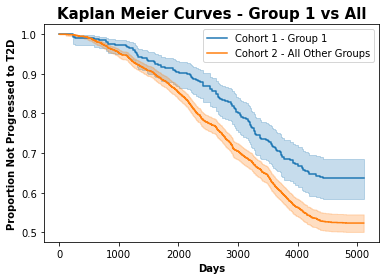

In [187]:
#KM curve
from lifelines import KaplanMeierFitter
group1 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['labels']==1]
group2 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['labels']!=1]
T = group1['days between diagnoses']
E = group1['status']
T1 = group2['days between diagnoses']
E1 = group2['status']

kmf = KaplanMeierFitter()

ax = plt.subplot(111)
ax = kmf.fit(T, E, label = "Cohort 1 - Group 1").plot(ax=ax)
ax = kmf.fit(T1, E1, label = "Cohort 2 - All Other Groups").plot(ax = ax)

#logrank_test
from lifelines.statistics import logrank_test
results=logrank_test(T, T1, event_observed_A=E, event_observed_B=E1)
results.print_summary()

plt.title('Kaplan Meier Curves - Group 1 vs All', fontsize = 15, fontweight = 'bold')
plt.xlabel('Days', fontsize = 10, fontweight = 'bold')
plt.ylabel('Proportion Not Progressed to T2D', fontsize = 10, fontweight = 'bold')


Below we show the results for cluster 2 vs all other clusters.

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           3.94 0.05      4.40

Text(0, 0.5, 'Proportion Not Progressed to T2D')

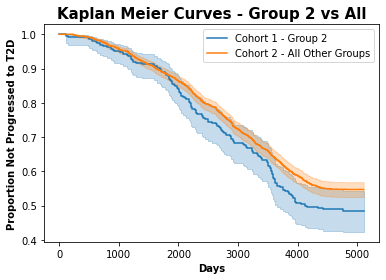

In [188]:
#KM curve
from lifelines import KaplanMeierFitter
group1 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['labels']==2]
group2 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['labels']!=2]
T = group1['days between diagnoses']
E = group1['status']
T1 = group2['days between diagnoses']
E1 = group2['status']

kmf = KaplanMeierFitter()

ax = plt.subplot(111)
ax = kmf.fit(T, E, label = "Cohort 1 - Group 2").plot(ax=ax)
ax = kmf.fit(T1, E1, label = "Cohort 2 - All Other Groups").plot(ax = ax)

#logrank_test
from lifelines.statistics import logrank_test
results=logrank_test(T, T1, event_observed_A=E, event_observed_B=E1)
results.print_summary()

plt.title('Kaplan Meier Curves - Group 2 vs All', fontsize = 15, fontweight = 'bold')
plt.xlabel('Days', fontsize = 10, fontweight = 'bold')
plt.ylabel('Proportion Not Progressed to T2D', fontsize = 10, fontweight = 'bold')


Below we show the results for cluster 3 vs all other clusters.

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          41.32 <0.005     32.85

Text(0, 0.5, 'Proportion Not Progressed to T2D')

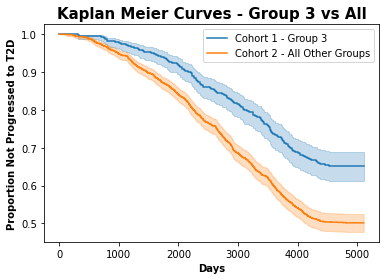

In [189]:
#KM curve
from lifelines import KaplanMeierFitter
group1 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['labels']==3]
group2 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['labels']!=3]
T = group1['days between diagnoses']
E = group1['status']
T1 = group2['days between diagnoses']
E1 = group2['status']

kmf = KaplanMeierFitter()

ax = plt.subplot(111)
ax = kmf.fit(T, E, label = "Cohort 1 - Group 3").plot(ax=ax)
ax = kmf.fit(T1, E1, label = "Cohort 2 - All Other Groups").plot(ax = ax)

#logrank_test
from lifelines.statistics import logrank_test
results=logrank_test(T, T1, event_observed_A=E, event_observed_B=E1)
results.print_summary()

plt.title('Kaplan Meier Curves - Group 3 vs All', fontsize = 15, fontweight = 'bold')
plt.xlabel('Days', fontsize = 10, fontweight = 'bold')
plt.ylabel('Proportion Not Progressed to T2D', fontsize = 10, fontweight = 'bold')


Below we show the results for cluster 4 vs all other clusters.

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          16.06 <0.005     14.00

Text(0, 0.5, 'Proportion Not Progressed to T2D')

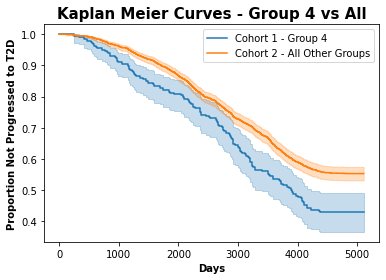

In [190]:
#KM curve
from lifelines import KaplanMeierFitter
group1 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['labels']==4]
group2 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['labels']!=4]
T = group1['days between diagnoses']
E = group1['status']
T1 = group2['days between diagnoses']
E1 = group2['status']

kmf = KaplanMeierFitter()

ax = plt.subplot(111)
ax = kmf.fit(T, E, label = "Cohort 1 - Group 4").plot(ax=ax)
ax = kmf.fit(T1, E1, label = "Cohort 2 - All Other Groups").plot(ax = ax)

#logrank_test
from lifelines.statistics import logrank_test
results=logrank_test(T, T1, event_observed_A=E, event_observed_B=E1)
results.print_summary()

plt.title('Kaplan Meier Curves - Group 4 vs All', fontsize = 15, fontweight = 'bold')
plt.xlabel('Days', fontsize = 10, fontweight = 'bold')
plt.ylabel('Proportion Not Progressed to T2D', fontsize = 10, fontweight = 'bold')


Below we show the results for cluster 5 vs all other clusters.

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           2.08 0.15      2.75

Text(0, 0.5, 'Proportion Not Progressed to T2D')

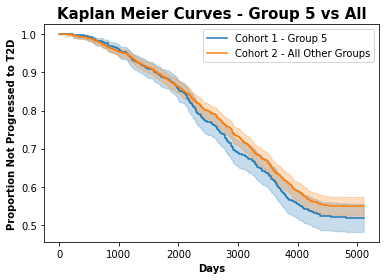

In [191]:
#KM curve
from lifelines import KaplanMeierFitter
group1 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['labels']==5]
group2 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['labels']!=5]
T = group1['days between diagnoses']
E = group1['status']
T1 = group2['days between diagnoses']
E1 = group2['status']

kmf = KaplanMeierFitter()

ax = plt.subplot(111)
ax = kmf.fit(T, E, label = "Cohort 1 - Group 5").plot(ax=ax)
ax = kmf.fit(T1, E1, label = "Cohort 2 - All Other Groups").plot(ax = ax)

#logrank_test
from lifelines.statistics import logrank_test
results=logrank_test(T, T1, event_observed_A=E, event_observed_B=E1)
results.print_summary()

plt.title('Kaplan Meier Curves - Group 5 vs All', fontsize = 15, fontweight = 'bold')
plt.xlabel('Days', fontsize = 10, fontweight = 'bold')
plt.ylabel('Proportion Not Progressed to T2D', fontsize = 10, fontweight = 'bold')


Below we show the results for cluster 6 vs all other clusters.

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          16.27 <0.005     14.15

Text(0, 0.5, 'Proportion Not Progressed to T2D')

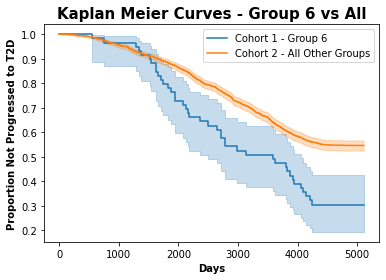

In [192]:
#KM curve
from lifelines import KaplanMeierFitter
group1 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['labels']==6]
group2 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['labels']!=6]
T = group1['days between diagnoses']
E = group1['status']
T1 = group2['days between diagnoses']
E1 = group2['status']

kmf = KaplanMeierFitter()

ax = plt.subplot(111)
ax = kmf.fit(T, E, label = "Cohort 1 - Group 6").plot(ax=ax)
ax = kmf.fit(T1, E1, label = "Cohort 2 - All Other Groups").plot(ax = ax)

#logrank_test
from lifelines.statistics import logrank_test
results=logrank_test(T, T1, event_observed_A=E, event_observed_B=E1)
results.print_summary()

plt.title('Kaplan Meier Curves - Group 6 vs All', fontsize = 15, fontweight = 'bold')
plt.xlabel('Days', fontsize = 10, fontweight = 'bold')
plt.ylabel('Proportion Not Progressed to T2D', fontsize = 10, fontweight = 'bold')


Below we show the results for cluster 7 vs all other clusters.

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          57.84 <0.005     45.00

Text(0, 0.5, 'Proportion Not Progressed to T2D')

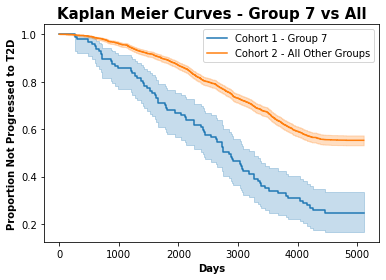

In [193]:
#KM curve
from lifelines import KaplanMeierFitter
group1 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['labels']==7]
group2 = prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final[prediabetes_with_metabolomics_with_diagnosis_column_with_days_without_some_progressors_censored_with_status_with_death_final['labels']!=7]
T = group1['days between diagnoses']
E = group1['status']
T1 = group2['days between diagnoses']
E1 = group2['status']

kmf = KaplanMeierFitter()

ax = plt.subplot(111)
ax = kmf.fit(T, E, label = "Cohort 1 - Group 7").plot(ax=ax)
ax = kmf.fit(T1, E1, label = "Cohort 2 - All Other Groups").plot(ax = ax)

#logrank_test
from lifelines.statistics import logrank_test
results=logrank_test(T, T1, event_observed_A=E, event_observed_B=E1)
results.print_summary()

plt.title('Kaplan Meier Curves - Group 7 vs All', fontsize = 15, fontweight = 'bold')
plt.xlabel('Days', fontsize = 10, fontweight = 'bold')
plt.ylabel('Proportion Not Progressed to T2D', fontsize = 10, fontweight = 'bold')


# Applying Bonferroni correction (multiplying each p-value by the number of tests = 7) we get the following results:

1. Cluster 1 vs all: p-value = < 0.005
2. Cluster 2 vs all: p-value = 0.35
3. Cluster 3 vs all: p-value = < 0.005
4. Cluster 4 vs all: p-value = < 0.005
5. Cluster 5 vs all: p-value = 1
6. Cluster 6 vs all: p-value = < 0.005
7. Cluster 7 vs all: p-value = < 0.005

Below we make the kaplan meier curve for just cluster 1.

<AxesSubplot:title={'center':'Tumor DNA Profile 1'}, xlabel='timeline'>

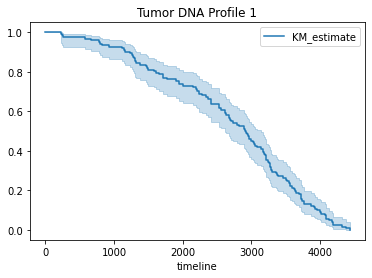

In [194]:
import kaplanmeier as km
import lifelines as ll
from lifelines import KaplanMeierFitter
#from lifelines.estimation import KaplanMeierFitter
kmf = KaplanMeierFitter()

T = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final.labels == 1]['days between diagnoses']
C = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final.labels == 1]['target']

kmf.fit(T, event_observed=C)
kmf.plot(title='Tumor DNA Profile 1')

Below we make kaplan meier curves comparing the 7 clusters in progression time.

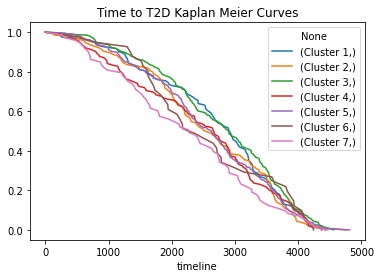

In [195]:
ax = plt.subplot(111)

T = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final.labels == 1]['days between diagnoses']
C = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final.labels == 1]['target']

T2 = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final.labels == 2]['days between diagnoses']
C2 = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final.labels == 2]['target']

T3 = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final.labels == 3]['days between diagnoses']
C3 = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final.labels == 3]['target']

T4 = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final.labels == 4]['days between diagnoses']
C4 = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final.labels == 4]['target']

T5 = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final.labels == 5]['days between diagnoses']
C5 = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final.labels == 5]['target']

T6 = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final.labels == 6]['days between diagnoses']
C6 = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final.labels == 6]['target']

T7 = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final.labels == 7]['days between diagnoses']
C7 = prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final[prediabetes_with_features_from_literature_to_keep_binary_classified_with_dates_all_included_sorted_final.labels == 7]['target']

kmf.fit(T, event_observed=C, label=['Cluster 1'])
kmf.survival_function_.plot(ax=ax)
kmf.fit(T2, event_observed=C2, label=['Cluster 2'])
kmf.survival_function_.plot(ax=ax)
kmf.fit(T3, event_observed=C3, label=['Cluster 3'])
kmf.survival_function_.plot(ax=ax)
kmf.fit(T4, event_observed=C4, label=['Cluster 4'])
kmf.survival_function_.plot(ax=ax)
kmf.fit(T5, event_observed=C5, label=['Cluster 5'])
kmf.survival_function_.plot(ax=ax)
kmf.fit(T6, event_observed=C6, label=['Cluster 6'])
kmf.survival_function_.plot(ax=ax)
kmf.fit(T7, event_observed=C7, label=['Cluster 7'])
kmf.survival_function_.plot(ax=ax)

plt.title('Time to T2D Kaplan Meier Curves')

kmf2 = plt.gcf()

In [196]:
from lifelines.statistics import logrank_test
summary_= logrank_test(T, T2, C, C2, alpha=99)

print(summary_)

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
             alpha = 99
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           0.92 0.34      1.57


<AxesSubplot:title={'center':'Nelson-Aalen Estimate'}, xlabel='timeline'>

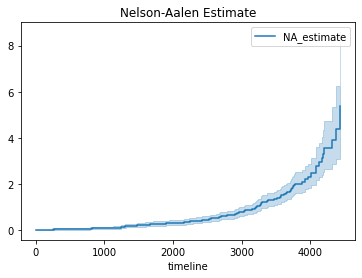

In [197]:
from lifelines import NelsonAalenFitter

naf = NelsonAalenFitter()
naf.fit(T, event_observed=C)

naf.plot(title='Nelson-Aalen Estimate')

<a class="anchor" id="Stat_testing"></a>

# Statistical Testing For Hierarchical Clustering On Metabolites

First we run Tukey's HSD test. This shows that there are many significantly different metabolites between all the clusters. However, it does not give us good information on the unique metabolites that caused the clusters to be created as they are. For this reason, we implement a one-vs-all strategy for each cluster for all metabolites to see which are significantly different between a given cluster and the rest of the patients. This may show us unique metabolite expression to a single cluster.

In [198]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.stats.libqsturng import psturng

for col in prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names.drop(columns = ['eid', '31-0.0', 'Age Covariate', 'target', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']):
    tukey = pairwise_tukeyhsd(endog=prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names[col],
                              groups=prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names['labels'],
                              alpha=0.05)
    print(col)
    print(tukey)

    p_values = psturng(np.abs(tukey.meandiffs / tukey.std_pairs), len(tukey.groupsunique), tukey.df_total)
    print("p values:", p_values)


pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.


Total Cholesterol
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0219 0.1385 -0.0033  0.0472  False
     1      3    0.198  0.001  0.1771   0.219   True
     1      4  -0.0775  0.001 -0.1032 -0.0518   True
     1      5   0.1203  0.001  0.1001  0.1406   True
     1      6    0.076  0.001  0.0328  0.1192   True
     1      7  -0.0711  0.001 -0.1061 -0.0361   True
     2      3   0.1761  0.001  0.1534  0.1989   True
     2      4  -0.0994  0.001 -0.1266 -0.0722   True
     2      5   0.0984  0.001  0.0763  0.1206   True
     2      6   0.0541 0.0056    0.01  0.0982   True
     2      7   -0.093  0.001 -0.1291 -0.0569   True
     3      4  -0.2755  0.001 -0.2987 -0.2523   True
     3      5  -0.0777  0.001 -0.0947 -0.0606   True
     3      6   -0.122  0.001 -0.1638 -0.0802   True
     3      7  -0.2691  0.001 -0.3023 -0.2359   True
     4      5   0.1978  0.00

----------------------------------------------------
p values: [0.001      0.001      0.54795536 0.001      0.001      0.00359376
 0.001      0.001      0.001      0.01504175 0.001      0.001
 0.001      0.001      0.001      0.001      0.001      0.23100544
 0.001      0.001      0.001     ]
HDL Cholesterol
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2  -0.0732  0.001 -0.0961 -0.0503   True
     1      3   -0.044  0.001  -0.063  -0.025   True
     1      4  -0.2193  0.001 -0.2426  -0.196   True
     1      5  -0.1752  0.001 -0.1935 -0.1568   True
     1      6  -0.1492  0.001 -0.1884   -0.11   True
     1      7  -0.2009  0.001 -0.2326 -0.1692   True
     2      3   0.0291  0.001  0.0085  0.0498   True
     2      4  -0.1461  0.001 -0.1708 -0.1215   True
     2      5   -0.102  0.001 -0.1221 -0.0819   True
     2      6  -0.0761  0.001 -0.1161 -0.0361   True
 

----------------------------------------------------
p values: [0.001      0.001      0.85063755 0.001      0.001      0.001
 0.001      0.001      0.9        0.001      0.001      0.001
 0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.001      0.001     ]
Total Phospholipids in Lipoprotein Particles
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0404  0.001  0.0139   0.067   True
     1      3   0.1338  0.001  0.1118  0.1559   True
     1      4  -0.1043  0.001 -0.1314 -0.0773   True
     1      5   0.0755  0.001  0.0542  0.0968   True
     1      6   0.1694  0.001   0.124  0.2149   True
     1      7   0.0243 0.4492 -0.0125  0.0611  False
     2      3   0.0934  0.001  0.0695  0.1173   True
     2      4  -0.1448  0.001 -0.1734 -0.1162   True
     2      5   0.0351  0.001  0.0118  0.0584   True
     2      6    0.129  0.001  0.08

----------------------------------------------------
p values: [0.30980293 0.001      0.001      0.001      0.00347019 0.001
 0.001      0.001      0.001      0.1881404  0.001      0.001
 0.001      0.001      0.001      0.001      0.001      0.9
 0.00603968 0.001      0.001     ]
Cholesteryl Esters in VLDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0667  0.001  0.0429  0.0904   True
     1      3   0.2262  0.001  0.2065  0.2459   True
     1      4   0.0435  0.001  0.0194  0.0677   True
     1      5   0.2381  0.001   0.219  0.2572   True
     1      6   0.2425  0.001  0.2018  0.2831   True
     1      7   0.0959  0.001   0.063  0.1288   True
     2      3   0.1595  0.001  0.1381  0.1809   True
     2      4  -0.0232 0.1063 -0.0487  0.0024  False
     2      5   0.1714  0.001  0.1506  0.1922   True
     2      6   0.1758  0.001  0.1343  0.2173   True
  

----------------------------------------------------
p values: [0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.02319105 0.001      0.001      0.001      0.001
 0.001      0.001      0.6483937  0.001      0.001      0.001
 0.001      0.001      0.001     ]
Free Cholesterol in LDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0201 0.1561 -0.0035  0.0437  False
     1      3   0.2151  0.001  0.1955  0.2347   True
     1      4  -0.0318 0.0018 -0.0558 -0.0078   True
     1      5   0.1399  0.001   0.121  0.1589   True
     1      6   0.0017    0.9 -0.0387   0.042  False
     1      7  -0.1158  0.001 -0.1485 -0.0832   True
     2      3    0.195  0.001  0.1738  0.2163   True
     2      4  -0.0519  0.001 -0.0773 -0.0265   True
     2      5   0.1199  0.001  0.0992  0.1405   True
     2      6  -0.0184 0.8243 -0.0596  0.0228  False
   

----------------------------------------------------
p values: [0.001      0.001      0.9        0.001      0.001      0.56692627
 0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.001      0.001      0.001      0.001      0.9
 0.001      0.001      0.001     ]
Total Lipids in HDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2  -0.0359  0.001 -0.0593 -0.0126   True
     1      3  -0.0355  0.001 -0.0549 -0.0161   True
     1      4   -0.199  0.001 -0.2228 -0.1752   True
     1      5  -0.1441  0.001 -0.1629 -0.1254   True
     1      6  -0.0486 0.0063 -0.0886 -0.0086   True
     1      7  -0.1098  0.001 -0.1422 -0.0775   True
     2      3   0.0004    0.9 -0.0206  0.0215  False
     2      4   -0.163  0.001 -0.1882 -0.1379   True
     2      5  -0.1082  0.001 -0.1287 -0.0877   True
     2      6  -0.0127    0.9 -0.0535  0.0282  False
    

----------------------------------------------------
p values: [0.00471592 0.02077732 0.001      0.001      0.9        0.001
 0.9        0.001      0.001      0.09822079 0.001      0.001
 0.001      0.26442432 0.001      0.001      0.001      0.001
 0.001      0.85583084 0.001     ]
Average Diameter for VLDL Particles
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.1863  0.001  0.1622  0.2103   True
     1      3   0.0983  0.001  0.0783  0.1182   True
     1      4   0.1692  0.001  0.1447  0.1937   True
     1      5   0.2408  0.001  0.2214  0.2601   True
     1      6   0.3679  0.001  0.3268  0.4091   True
     1      7   0.3795  0.001  0.3461  0.4128   True
     2      3   -0.088  0.001 -0.1097 -0.0663   True
     2      4  -0.0171 0.4529  -0.043  0.0088  False
     2      5   0.0545  0.001  0.0334  0.0756   True
     2      6   0.1817  0.001  0.1396  0.223

----------------------------------------------------
p values: [0.001      0.001      0.001      0.001      0.001      0.9
 0.001      0.001      0.9        0.001      0.04997133 0.001
 0.001      0.53323543 0.001      0.001      0.001      0.001
 0.001      0.05473438 0.001     ]
Phosphatidylcholines
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0412  0.001  0.0145  0.0678   True
     1      3   0.0938  0.001  0.0717  0.1159   True
     1      4  -0.1256  0.001 -0.1528 -0.0985   True
     1      5   0.0245 0.0135   0.003  0.0459   True
     1      6   0.1408  0.001  0.0952  0.1864   True
     1      7   0.0159 0.8536 -0.0211  0.0528  False
     2      3   0.0526  0.001  0.0286  0.0766   True
     2      4  -0.1668  0.001 -0.1955 -0.1381   True
     2      5  -0.0167 0.3492 -0.0401  0.0067  False
     2      6   0.0996  0.001   0.053  0.1462   True
     2  

p values: [0.001      0.001      0.61150625 0.001      0.001      0.001
 0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.001      0.001     ]
Degree of Unsaturation
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2  -0.0793  0.001 -0.1026  -0.056   True
     1      3  -0.0313  0.001 -0.0507  -0.012   True
     1      4  -0.0919  0.001 -0.1157 -0.0682   True
     1      5  -0.1087  0.001 -0.1275   -0.09   True
     1      6  -0.2267  0.001 -0.2666 -0.1869   True
     1      7  -0.2356  0.001 -0.2678 -0.2033   True
     2      3   0.0479  0.001   0.027  0.0689   True
     2      4  -0.0127 0.7233 -0.0378  0.0124  False
     2      5  -0.0295  0.001 -0.0499  -0.009   True
     2      6  -0.1475  0.001 -0.1882 -0.1067   True
     2      7  -0.1563  0.001 -0.1896  -0.123   True
    

 0.001      0.001      0.001     ]
Saturated Fatty Acids
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0775  0.001   0.055     0.1   True
     1      3   0.0977  0.001  0.0791  0.1164   True
     1      4  -0.0152 0.4399 -0.0381  0.0076  False
     1      5   0.1226  0.001  0.1045  0.1406   True
     1      6   0.3079  0.001  0.2694  0.3464   True
     1      7   0.2043  0.001  0.1732  0.2355   True
     2      3   0.0202 0.0504    -0.0  0.0405  False
     2      4  -0.0927  0.001  -0.117 -0.0685   True
     2      5   0.0451  0.001  0.0254  0.0648   True
     2      6   0.2304  0.001  0.1911  0.2697   True
     2      7   0.1268  0.001  0.0947   0.159   True
     3      4   -0.113  0.001 -0.1337 -0.0923   True
     3      5   0.0248  0.001  0.0097    0.04   True
     3      6   0.2102  0.001   0.173  0.2474   True
     3      7   0.1066  0.001   0.077  0.1

----------------------------------------------------
p values: [0.001      0.11262574 0.001      0.001      0.001      0.001
 0.23019559 0.9        0.9        0.40572616 0.001      0.01750832
 0.001      0.01228011 0.001      0.9        0.73161687 0.01258901
 0.64402416 0.00261193 0.9       ]
Histidine
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     1      2   0.0092 0.1103  -0.001 0.0194  False
     1      3   0.0023    0.9 -0.0061 0.0108  False
     1      4   0.0088 0.1545 -0.0015 0.0192  False
     1      5   0.0055 0.4253 -0.0027 0.0137  False
     1      6   0.0134  0.264 -0.0041 0.0308  False
     1      7   0.0068 0.7676 -0.0073 0.0209  False
     2      3  -0.0069 0.2921  -0.016 0.0023  False
     2      4  -0.0003    0.9 -0.0113 0.0106  False
     2      5  -0.0037 0.8885 -0.0126 0.0053  False
     2      6   0.0042    0.9 -0.0136  0.022  False
     2      7  -0.00

----------------------------------------------------
p values: [0.00213207 0.9        0.001      0.001      0.001      0.001
 0.0206456  0.02301301 0.4629667  0.00469761 0.001      0.001
 0.001      0.001      0.001      0.44033465 0.61180917 0.001
 0.06292795 0.001      0.09567389]
Phenylalanine
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0029    0.9 -0.0217  0.0274  False
     1      3  -0.0216 0.0299 -0.0419 -0.0012   True
     1      4   0.0369  0.001  0.0119  0.0619   True
     1      5   -0.005    0.9 -0.0248  0.0147  False
     1      6  -0.0092    0.9 -0.0512  0.0328  False
     1      7   0.0414 0.0061  0.0074  0.0754   True
     2      3  -0.0244 0.0196 -0.0465 -0.0023   True
     2      4    0.034 0.0029  0.0076  0.0604   True
     2      5  -0.0079    0.9 -0.0294  0.0136  False
     2      6  -0.0121    0.9  -0.055  0.0308  False
     2      7

 0.9        0.9        0.9       ]
Citrate
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2  -0.0106 0.8576 -0.0352  0.0141  False
     1      3   0.0028    0.9 -0.0176  0.0233  False
     1      4  -0.0076    0.9 -0.0327  0.0175  False
     1      5  -0.0176 0.1204 -0.0374  0.0022  False
     1      6  -0.0155    0.9 -0.0578  0.0268  False
     1      7  -0.0225  0.456 -0.0567  0.0117  False
     2      3   0.0134 0.5555 -0.0089  0.0356  False
     2      4   0.0029    0.9 -0.0236  0.0295  False
     2      5  -0.0071    0.9 -0.0287  0.0146  False
     2      6  -0.0049    0.9 -0.0481  0.0382  False
     2      7  -0.0119    0.9 -0.0472  0.0234  False
     3      4  -0.0104 0.8026 -0.0332  0.0123  False
     3      5  -0.0204 0.0057 -0.0371 -0.0038   True
     3      6  -0.0183 0.8213 -0.0592  0.0225  False
     3      7  -0.0253 0.2441 -0.0578  0.0072  False
   

----------------------------------------------------
p values: [0.11456778 0.9        0.001      0.001      0.001      0.001
 0.00313709 0.12203667 0.25668588 0.01237804 0.001      0.001
 0.001      0.001      0.001      0.9        0.55743513 0.03223275
 0.20008102 0.001      0.9       ]
Albumin
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0359  0.001  0.0122  0.0596   True
     1      3   0.0207 0.0307  0.0011  0.0404   True
     1      4  -0.0191 0.2249 -0.0432   0.005  False
     1      5    0.007    0.9  -0.012  0.0261  False
     1      6   0.0272 0.4289 -0.0133  0.0678  False
     1      7   0.0124    0.9 -0.0204  0.0452  False
     2      3  -0.0151 0.3589 -0.0365  0.0062  False
     2      4   -0.055  0.001 -0.0805 -0.0295   True
     2      5  -0.0288  0.001 -0.0496 -0.0081   True
     2      6  -0.0086    0.9   -0.05  0.0328  False
     2      7 

----------------------------------------------------
p values: [0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.10009311 0.001      0.001      0.001      0.0301043
 0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.001      0.001     ]
Cholesterol in Chylomicrons and Extremely Large VLDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.1043  0.001  0.0804  0.1283   True
     1      3   0.0794  0.001  0.0595  0.0992   True
     1      4   0.0788  0.001  0.0544  0.1032   True
     1      5    0.199  0.001  0.1797  0.2182   True
     1      6   0.4193  0.001  0.3783  0.4603   True
     1      7   0.3258  0.001  0.2926  0.3589   True
     2      3   -0.025 0.0116 -0.0465 -0.0034   True
     2      4  -0.0255 0.0545 -0.0513  0.0003  False
     2      5   0.0947  0.001  0.0737  0.1157   True
     2      6    0.315 

----------------------------------------------------
p values: [0.001      0.001      0.001      0.001      0.001      0.001
 0.20935976 0.04460501 0.001      0.001      0.001      0.9
 0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.001      0.001     ]
Total Lipids in Very Large VLDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0995  0.001  0.0793  0.1196   True
     1      3   0.0843  0.001  0.0676  0.1011   True
     1      4   0.0776  0.001  0.0571  0.0981   True
     1      5   0.1924  0.001  0.1762  0.2086   True
     1      6   0.3651  0.001  0.3306  0.3996   True
     1      7   0.2836  0.001  0.2557  0.3116   True
     2      3  -0.0151 0.1755 -0.0333   0.003  False
     2      4  -0.0219 0.0471 -0.0436 -0.0002   True
     2      5   0.0929  0.001  0.0752  0.1106   True
     2      6   0.2657  0.001  0.2304  0.3009   Tr

----------------------------------------------------
p values: [0.001      0.001      0.001      0.001      0.001      0.001
 0.68738628 0.51384276 0.001      0.001      0.001      0.00449176
 0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.001      0.001     ]
Triglycerides in Very Large VLDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0942  0.001  0.0748  0.1135   True
     1      3   0.0596  0.001  0.0436  0.0756   True
     1      4   0.0692  0.001  0.0495  0.0889   True
     1      5   0.1655  0.001    0.15  0.1811   True
     1      6   0.3487  0.001  0.3156  0.3818   True
     1      7   0.2808  0.001   0.254  0.3076   True
     2      3  -0.0346  0.001  -0.052 -0.0172   True
     2      4   -0.025 0.0074 -0.0458 -0.0042   True
     2      5   0.0714  0.001  0.0544  0.0883   True
     2      6   0.2545  0.001  0.2207  0.2

----------------------------------------------------
p values: [0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.30154912 0.001      0.001      0.001      0.001
 0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.84529446 0.001     ]
Cholesteryl Esters in Large VLDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.1093  0.001  0.0848  0.1338   True
     1      3   0.1931  0.001  0.1728  0.2134   True
     1      4   0.0935  0.001  0.0686  0.1184   True
     1      5   0.2783  0.001  0.2586  0.2979   True
     1      6   0.3492  0.001  0.3073  0.3911   True
     1      7   0.2083  0.001  0.1744  0.2422   True
     2      3   0.0838  0.001  0.0617  0.1058   True
     2      4  -0.0158 0.5622 -0.0421  0.0106  False
     2      5    0.169  0.001  0.1475  0.1904   True
     2      6   0.2399  0.001  0.1971  0.2827  

----------------------------------------------------
p values: [0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.001      0.56925886 0.001      0.001      0.001
 0.001      0.001      0.001     ]
Phospholipids in Medium VLDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0787  0.001  0.0554   0.102   True
     1      3   0.2122  0.001  0.1929  0.2315   True
     1      4   0.0483  0.001  0.0246   0.072   True
     1      5   0.2472  0.001  0.2285  0.2659   True
     1      6   0.2616  0.001  0.2218  0.3015   True
     1      7   0.1146  0.001  0.0823  0.1468   True
     2      3   0.1335  0.001  0.1125  0.1545   True
     2      4  -0.0304 0.0065 -0.0555 -0.0053   True
     2      5   0.1685  0.001  0.1481  0.1889   True
     2      6   0.1829  0.001  0.1422  0.2236   Tru

----------------------------------------------------
p values: [0.001      0.001      0.001      0.001      0.001      0.001
 0.9        0.001      0.001      0.001      0.001      0.001
 0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.02338882 0.001     ]
Concentration of Small VLDL Particles
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0933  0.001  0.0721  0.1146   True
     1      3     0.15  0.001  0.1324  0.1676   True
     1      4   0.0633  0.001  0.0417   0.085   True
     1      5   0.2141  0.001   0.197  0.2312   True
     1      6   0.3109  0.001  0.2745  0.3473   True
     1      7   0.1825  0.001   0.153  0.2119   True
     2      3   0.0567  0.001  0.0375  0.0758   True
     2      4    -0.03 0.0022 -0.0529 -0.0071   True
     2      5   0.1207  0.001  0.1021  0.1394   True
     2      6   0.2175  0.001  0.1804  0.2

----------------------------------------------------
p values: [0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.21761062 0.001      0.001      0.52953699 0.001
 0.00894808 0.152347   0.001      0.001      0.001      0.00680362
 0.9        0.001      0.001     ]
Free Cholesterol in Small VLDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0621  0.001  0.0401  0.0841   True
     1      3   0.2173  0.001   0.199  0.2355   True
     1      4   0.0343  0.001  0.0119  0.0567   True
     1      5   0.2184  0.001  0.2007  0.2361   True
     1      6   0.1866  0.001   0.149  0.2242   True
     1      7   0.0424  0.001  0.0119  0.0729   True
     2      3   0.1552  0.001  0.1354   0.175   True
     2      4  -0.0278 0.0099 -0.0515 -0.0041   True
     2      5   0.1563  0.001   0.137  0.1756   True
     2      6   0.1245  0.001  0.0861  0.162

----------------------------------------------------
p values: [0.001      0.001      0.65676497 0.001      0.001      0.001
 0.001      0.12668529 0.001      0.001      0.001      0.001
 0.9        0.001      0.001      0.001      0.001      0.001
 0.001      0.001      0.001     ]
Cholesterol in Very Small VLDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0092    0.9 -0.0171  0.0356  False
     1      3   0.2213  0.001  0.1994  0.2431   True
     1      4  -0.0232 0.1429   -0.05  0.0037  False
     1      5   0.1545  0.001  0.1334  0.1757   True
     1      6   0.1189  0.001  0.0738   0.164   True
     1      7  -0.0143    0.9 -0.0508  0.0222  False
     2      3    0.212  0.001  0.1883  0.2358   True
     2      4  -0.0324 0.0135 -0.0608  -0.004   True
     2      5   0.1453  0.001  0.1222  0.1684   True
     2      6   0.1096  0.001  0.0636  0.1557   T

 0.001      0.001      0.001     ]
Total Lipids in IDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0108 0.8864 -0.0155  0.0371  False
     1      3   0.2352  0.001  0.2134   0.257   True
     1      4    -0.06  0.001 -0.0867 -0.0332   True
     1      5   0.1378  0.001  0.1167  0.1589   True
     1      6   0.0526 0.0102  0.0076  0.0976   True
     1      7  -0.0819  0.001 -0.1183 -0.0455   True
     2      3   0.2244  0.001  0.2008  0.2481   True
     2      4  -0.0708  0.001 -0.0991 -0.0425   True
     2      5    0.127  0.001   0.104  0.1501   True
     2      6   0.0418 0.1024 -0.0041  0.0877  False
     2      7  -0.0927  0.001 -0.1303 -0.0552   True
     3      4  -0.2952  0.001 -0.3194  -0.271   True
     3      5  -0.0974  0.001 -0.1152 -0.0797   True
     3      6  -0.1827  0.001 -0.2262 -0.1391   True
     3      7  -0.3172  0.001 -0.3518 -0.282

----------------------------------------------------
p values: [0.001      0.001      0.61549313 0.001      0.001      0.001
 0.00299113 0.001      0.001      0.001      0.001      0.001
 0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.001      0.001     ]
Concentration of Large LDL Particles
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0303 0.0016  0.0076  0.0529   True
     1      3    0.207  0.001  0.1882  0.2258   True
     1      4   0.0148 0.4872 -0.0083  0.0378  False
     1      5   0.1908  0.001  0.1726  0.2089   True
     1      6   0.1293  0.001  0.0905   0.168   True
     1      7  -0.0034    0.9 -0.0347   0.028  False
     2      3   0.1768  0.001  0.1564  0.1971   True
     2      4  -0.0155 0.4966 -0.0399  0.0089  False
     2      5   0.1605  0.001  0.1407  0.1804   True
     2      6    0.099  0.001  0.0595  0.13

----------------------------------------------------
p values: [0.001      0.001      0.02628271 0.001      0.001      0.001
 0.001      0.001      0.001      0.02680684 0.001      0.001
 0.001      0.001      0.001      0.001      0.001      0.49314323
 0.001      0.001      0.001     ]
Free Cholesterol in Large LDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0111 0.7766 -0.0123  0.0344  False
     1      3   0.2077  0.001  0.1883   0.227   True
     1      4   -0.046  0.001 -0.0698 -0.0223   True
     1      5   0.1219  0.001  0.1032  0.1407   True
     1      6  -0.0077    0.9 -0.0476  0.0322  False
     1      7  -0.1239  0.001 -0.1562 -0.0916   True
     2      3   0.1966  0.001  0.1756  0.2176   True
     2      4  -0.0571  0.001 -0.0822  -0.032   True
     2      5   0.1109  0.001  0.0904  0.1313   True
     2      6  -0.0188 0.8006 -0.0595   0.022

----------------------------------------------------
p values: [0.001      0.001      0.10464179 0.001      0.001      0.43854056
 0.001      0.001      0.001      0.001      0.001      0.001
 0.10701091 0.001      0.001      0.001      0.001      0.9
 0.00106695 0.001      0.001     ]
Cholesterol in Medium LDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0712  0.001  0.0487  0.0937   True
     1      3   0.2178  0.001  0.1992  0.2365   True
     1      4    0.014 0.5412 -0.0089  0.0369  False
     1      5   0.2035  0.001  0.1854  0.2216   True
     1      6   0.1422  0.001  0.1037  0.1808   True
     1      7   0.0083    0.9 -0.0229  0.0395  False
     2      3   0.1467  0.001  0.1264  0.1669   True
     2      4  -0.0572  0.001 -0.0814  -0.033   True
     2      5   0.1323  0.001  0.1126  0.1521   True
     2      6    0.071  0.001  0.0317  0.1104   Tru

----------------------------------------------------
p values: [0.001      0.001      0.001      0.001      0.001      0.001
 0.001      0.58592906 0.001      0.001      0.59401241 0.001
 0.0587536  0.9        0.001      0.001      0.001      0.04557204
 0.48797101 0.001      0.001     ]
Total Lipids in Small LDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0509  0.001  0.0289   0.073   True
     1      3   0.2082  0.001  0.1899  0.2265   True
     1      4   0.0241 0.0261  0.0016  0.0465   True
     1      5   0.2108  0.001  0.1931  0.2285   True
     1      6   0.1649  0.001  0.1272  0.2026   True
     1      7   0.0355 0.0109   0.005   0.066   True
     2      3   0.1573  0.001  0.1374  0.1771   True
     2      4  -0.0268  0.015 -0.0506 -0.0031   True
     2      5   0.1599  0.001  0.1405  0.1792   True
     2      6    0.114  0.001  0.0755  0.1525   T

----------------------------------------------------
p values: [0.59820309 0.001      0.9        0.001      0.9        0.001
 0.001      0.75244968 0.001      0.34601148 0.001      0.001
 0.001      0.001      0.001      0.001      0.88359637 0.001
 0.001      0.001      0.001     ]
Triglycerides in Small LDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower   upper  reject
---------------------------------------------------
     1      2   0.0745 0.001  0.0556  0.0933   True
     1      3   0.0682 0.001  0.0526  0.0839   True
     1      4   0.0421 0.001  0.0229  0.0613   True
     1      5   0.1429 0.001  0.1277   0.158   True
     1      6   0.3305 0.001  0.2982  0.3628   True
     1      7   0.2435 0.001  0.2173  0.2696   True
     2      3  -0.0062   0.9 -0.0232  0.0107  False
     2      4  -0.0324 0.001 -0.0527 -0.0121   True
     2      5   0.0684 0.001  0.0518  0.0849   True
     2      6    0.256 0.001  0.2231   0.289   True
     2      7

 0.00124247 0.001      0.70220583]
Cholesteryl Esters in Very Large HDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2  -0.1632  0.001 -0.1839 -0.1425   True
     1      3  -0.0476  0.001 -0.0647 -0.0304   True
     1      4  -0.1626  0.001 -0.1836 -0.1415   True
     1      5  -0.1326  0.001 -0.1492  -0.116   True
     1      6  -0.1763  0.001 -0.2117 -0.1409   True
     1      7     -0.2  0.001 -0.2286 -0.1713   True
     2      3   0.1156  0.001   0.097  0.1343   True
     2      4   0.0006    0.9 -0.0217  0.0229  False
     2      5   0.0306  0.001  0.0124  0.0487   True
     2      6  -0.0131    0.9 -0.0493  0.0231  False
     2      7  -0.0368 0.0046 -0.0664 -0.0072   True
     3      4   -0.115  0.001 -0.1341  -0.096   True
     3      5  -0.0851  0.001  -0.099 -0.0711   True
     3      6  -0.1287  0.001  -0.163 -0.0945   True
     3      7  -0.1524  0.0

 0.27033723 0.9        0.66352375]
Phospholipids in Large HDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2  -0.1277  0.001 -0.1511 -0.1043   True
     1      3  -0.0922  0.001 -0.1116 -0.0728   True
     1      4  -0.2233  0.001 -0.2471 -0.1995   True
     1      5  -0.2107  0.001 -0.2295 -0.1919   True
     1      6  -0.1621  0.001 -0.2022 -0.1221   True
     1      7  -0.1836  0.001 -0.2161 -0.1512   True
     2      3   0.0355  0.001  0.0144  0.0566   True
     2      4  -0.0956  0.001 -0.1208 -0.0704   True
     2      5   -0.083  0.001 -0.1035 -0.0625   True
     2      6  -0.0344 0.1652 -0.0753  0.0065  False
     2      7  -0.0559  0.001 -0.0894 -0.0225   True
     3      4  -0.1311  0.001 -0.1526 -0.1095   True
     3      5  -0.1185  0.001 -0.1343 -0.1027   True
     3      6  -0.0699  0.001 -0.1087 -0.0312   True
     3      7  -0.0914  0.001 -0.1222

 0.001      0.001      0.001     ]
Concentration of Medium HDL Particles
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0037    0.9 -0.0186   0.026  False
     1      3  -0.0297  0.001 -0.0482 -0.0112   True
     1      4  -0.1745  0.001 -0.1972 -0.1518   True
     1      5  -0.1293  0.001 -0.1473 -0.1114   True
     1      6  -0.0268 0.3711  -0.065  0.0114  False
     1      7  -0.0822  0.001 -0.1131 -0.0513   True
     2      3  -0.0334  0.001 -0.0535 -0.0133   True
     2      4  -0.1781  0.001 -0.2022 -0.1541   True
     2      5   -0.133  0.001 -0.1526 -0.1134   True
     2      6  -0.0305 0.2405 -0.0695  0.0085  False
     2      7  -0.0859  0.001 -0.1178  -0.054   True
     3      4  -0.1448  0.001 -0.1653 -0.1242   True
     3      5  -0.0996  0.001 -0.1147 -0.0846   True
     3      6   0.0029    0.9 -0.0341  0.0398  False
     3      7  -0.0525  0.

 0.001      0.52436781 0.09197255]
Free Cholesterol in Medium HDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2  -0.0131 0.6317 -0.0367  0.0104  False
     1      3   -0.025  0.003 -0.0446 -0.0055   True
     1      4  -0.1907  0.001 -0.2147 -0.1668   True
     1      5  -0.1336  0.001 -0.1525 -0.1147   True
     1      6   -0.038 0.0796 -0.0783  0.0023  False
     1      7  -0.0998  0.001 -0.1324 -0.0672   True
     2      3  -0.0119 0.6241 -0.0331  0.0093  False
     2      4  -0.1776  0.001 -0.2029 -0.1522   True
     2      5  -0.1205  0.001 -0.1411 -0.0998   True
     2      6  -0.0249 0.5501  -0.066  0.0162  False
     2      7  -0.0867  0.001 -0.1203  -0.053   True
     3      4  -0.1657  0.001 -0.1873  -0.144   True
     3      5  -0.1085  0.001 -0.1244 -0.0926   True
     3      6   -0.013    0.9 -0.0519   0.026  False
     3      7  -0.0747  0.001 -0.

 0.001      0.001      0.001     ]
Cholesterol in Small HDL
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.0974  0.001  0.0759  0.1189   True
     1      3   0.0731  0.001  0.0553  0.0909   True
     1      4  -0.0683  0.001 -0.0902 -0.0464   True
     1      5   0.0126 0.3235 -0.0047  0.0299  False
     1      6   0.0435 0.0089  0.0067  0.0803   True
     1      7  -0.0343 0.0122 -0.0641 -0.0045   True
     2      3  -0.0243 0.0042 -0.0436 -0.0049   True
     2      4  -0.1657  0.001 -0.1888 -0.1425   True
     2      5  -0.0848  0.001 -0.1036 -0.0659   True
     2      6  -0.0538  0.001 -0.0914 -0.0163   True
     2      7  -0.1317  0.001 -0.1624 -0.1009   True
     3      4  -0.1414  0.001 -0.1612 -0.1216   True
     3      5  -0.0605  0.001  -0.075  -0.046   True
     3      6  -0.0296 0.1777 -0.0652   0.006  False
     3      7  -0.1074  0.001 -0.1357 -

# Cluster 1

Below we look at a one-vs-all t-test comparison between cluster 1 and the rest of the data to try to find signicantly expressed metabolites unique to this cluster. To do this, we create a dataframe for all patients not in cluster 1 for comparison.

In [199]:
pd.options.display.max_columns = 200
not_cluster_1 = cluster_2.append([cluster_3, cluster_4, cluster_5, cluster_6, cluster_7])
not_cluster_1

,Total Cholesterol,Total Cholesterol Minus HDL-C,"Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)",VLDL Cholesterol,Clinical LDL Cholesterol,LDL Cholesterol,HDL Cholesterol,Total Triglycerides,Triglycerides in VLDL,Triglycerides in LDL,Triglycerides in HDL,Total Phospholipids in Lipoprotein Particles,Phospholipids in VLDL,Phospholipids in LDL,Phospholipids in HDL,Total Esterified Cholesterol,Cholesteryl Esters in VLDL,Cholesteryl Esters in LDL,Cholesteryl Esters in HDL,Total Free Cholesterol,Free Cholesterol in VLDL,Free Cholesterol in LDL,Free Cholesterol in HDL,Total Lipids in Lipoprotein Particles,Total Lipids in VLDL,Total Lipids in LDL,Total Lipids in HDL,Total Concentration of Lipoprotein Particles,Concentration of VLDL Particles,Concentration of LDL Particles,Concentration of HDL Particles,Average Diameter for VLDL Particles,Average Diameter for LDL Particles,Average Diameter for HDL Particles,Phosphoglycerides,Total Cholines,Phosphatidylcholines,Sphingomyelins,Apolipoprotein B,Apolipoprotein A1,Total Fatty Acids,Degree of Unsaturation,Omega-3 Fatty Acids,Omega-6 Fatty Acids,Polyunsaturated Fatty Acids,Monounsaturated Fatty Acids,Saturated Fatty Acids,Linoleic Acid,Docosahexaenoic Acid,Alanine,Glutamine,Glycine,Histidine,Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine),Isoleucine,Leucine,Valine,Phenylalanine,Tyrosine,Glucose,Lactate,Pyruvate,Citrate,3-Hydroxybutyrate,Acetate,Acetoacetate,Acetone,Creatinine,Albumin,Glycoprotein Acetyls,Concentration of Chylomicrons and Extremely Large VLDL Particles,Total Lipids in Chylomicrons and Extremely Large VLDL,Phospholipids in Chylomicrons and Extremely Large VLDL,Cholesterol in Chylomicrons and Extremely Large VLDL,Cholesteryl Esters in Chylomicrons and Extremely Large VLDL,Free Cholesterol in Chylomicrons and Extremely Large VLDL,Triglycerides in Chylomicrons and Extremely Large VLDL,Concentration of Very Large VLDL Particles,Total Lipids in Very Large VLDL,Phospholipids in Very Large VLDL,Cholesterol in Very Large VLDL,Cholesteryl Esters in Very Large VLDL,Free Cholesterol in Very Large VLDL,Triglycerides in Very Large VLDL,Concentration of Large VLDL Particles,Total Lipids in Large VLDL,Phospholipids in Large VLDL,Cholesterol in Large VLDL,Cholesteryl Esters in Large VLDL,Free Cholesterol in Large VLDL,Triglycerides in Large VLDL,Concentration of Medium VLDL Particles,Total Lipids in Medium VLDL,Phospholipids in Medium VLDL,Cholesterol in Medium VLDL,Cholesteryl Esters in Medium VLDL,Free Cholesterol in Medium VLDL,Triglycerides in Medium VLDL,Concentration of Small VLDL Particles,Total Lipids in Small VLDL,Phospholipids in Small VLDL,Cholesterol in Small VLDL,Cholesteryl Esters in Small VLDL,Free Cholesterol in Small VLDL,Triglycerides in Small VLDL,Concentration of Very Small VLDL Particles,Total Lipids in Very Small VLDL,Phospholipids in Very Small VLDL,Cholesterol in Very Small VLDL,Cholesteryl Esters in Very Small VLDL,Free Cholesterol in Very Small VLDL,Triglycerides in Very Small VLDL,Concentration of IDL Particles,Total Lipids in IDL,Phospholipids in IDL,Cholesterol in IDL,Cholesteryl Esters in IDL,Free Cholesterol in IDL,Triglycerides in IDL,Concentration of Large LDL Particles,Total Lipids in Large LDL,Phospholipids in Large LDL,Cholesterol in Large LDL,Cholesteryl Esters in Large LDL,Free Cholesterol in Large LDL,Triglycerides in Large LDL,Concentration of Medium LDL Particles,Total Lipids in Medium LDL,Phospholipids in Medium LDL,Cholesterol in Medium LDL,Cholesteryl Esters in Medium LDL,Free Cholesterol in Medium LDL,Triglycerides in Medium LDL,Concentration of Small LDL Particles,Total Lipids in Small LDL,Phospholipids in Small LDL,Cholesterol in Small LDL,Cholesteryl Esters in Small LDL,Free Cholesterol in Small LDL,Triglycerides in Small LDL,Concentration of Very Large HDL Particles,Total Lipids in Very Large HDL,Phospholipids in Very Large HDL,Cholesterol in Very Large HDL,Cholesteryl Esters in Very Large HDL,Free Cholest

In [200]:
not_cluster_1.columns.tolist()

['Total Cholesterol',
 'Total Cholesterol Minus HDL-C',
 'Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)',
 'VLDL Cholesterol',
 'Clinical LDL Cholesterol',
 'LDL Cholesterol',
 'HDL Cholesterol',
 'Total Triglycerides',
 'Triglycerides in VLDL',
 'Triglycerides in LDL',
 'Triglycerides in HDL',
 'Total Phospholipids in Lipoprotein Particles',
 'Phospholipids in VLDL',
 'Phospholipids in LDL',
 'Phospholipids in HDL',
 'Total Esterified Cholesterol',
 'Cholesteryl Esters in VLDL',
 'Cholesteryl Esters in LDL',
 'Cholesteryl Esters in HDL',
 'Total Free Cholesterol',
 'Free Cholesterol in VLDL',
 'Free Cholesterol in LDL',
 'Free Cholesterol in HDL',
 'Total Lipids in Lipoprotein Particles',
 'Total Lipids in VLDL',
 'Total Lipids in LDL',
 'Total Lipids in HDL',
 'Total Concentration of Lipoprotein Particles',
 'Concentration of VLDL Particles',
 'Concentration of LDL Particles',
 'Concentration of HDL Particles',
 'Average Diameter for VLDL Particles',
 'Average Diameter for LDL 

Below we run Levene's test on all standard deviations. Notice that we need to add notnull() for this to work since Levene's test assumes all values are full. We create two lists which contain the values which are or are not statistically significant as a reuslt of Levene's test. We need to do this so that we can run different types of independent t tests depending on the results.

In [201]:
from scipy.stats import levene

equal_variance = []
unequal_variance = []

for i in cluster_1.drop(columns = ['eid', '31-0.0', 'Age Covariate', 'target', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5', 'labels']):
    filtered_df = cluster_1[cluster_1[i].notnull()]
    filtered_df2 = not_cluster_1[not_cluster_1[i].notnull()]
    stat, pval = levene(filtered_df[i], filtered_df2[i])
    if pval < 0.05:
        unequal_variance.append(i)
    else:
        equal_variance.append(i)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (stat, pval))


Statistic and pval for Column Total Cholesterol: stat=33.582 pval=0.000
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=97.004 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=100.094 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=117.157 pval=0.000
Statistic and pval for Column Clinical LDL Cholesterol: stat=95.433 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=82.829 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=40.361 pval=0.000
Statistic and pval for Column Total Triglycerides: stat=92.502 pval=0.000
Statistic and pval for Column Triglycerides in VLDL: stat=99.307 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=74.553 pval=0.000
Statistic and pval for Column Triglycerides in HDL: stat=21.878 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=6.700 pval=0.010
Statistic and pval for Column Phospholipids in V

Statistic and pval for Column Cholesterol in Small VLDL: stat=119.976 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Small VLDL: stat=108.441 pval=0.000
Statistic and pval for Column Free Cholesterol in Small VLDL: stat=124.525 pval=0.000
Statistic and pval for Column Triglycerides in Small VLDL: stat=52.851 pval=0.000
Statistic and pval for Column Concentration of Very Small VLDL Particles: stat=81.975 pval=0.000
Statistic and pval for Column Total Lipids in Very Small VLDL: stat=62.991 pval=0.000
Statistic and pval for Column Phospholipids in Very Small VLDL: stat=57.697 pval=0.000
Statistic and pval for Column Cholesterol in Very Small VLDL: stat=78.946 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Very Small VLDL: stat=75.359 pval=0.000
Statistic and pval for Column Free Cholesterol in Very Small VLDL: stat=77.883 pval=0.000
Statistic and pval for Column Triglycerides in Very Small VLDL: stat=41.565 pval=0.000
Statistic and pval for Column Concentra

Below we run our statistical tests for all columns that have been shown to not have unequal variances (statistically speaking).

In [202]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_1[i], not_cluster_1[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column Total Concentration of Lipoprotein Particles: stat=2.621 pval=0.009
Statistic and pval for Column Concentration of HDL Particles: stat=6.425 pval=0.000
Statistic and pval for Column Average Diameter for VLDL Particles: stat=-26.609 pval=0.000
Statistic and pval for Column Phosphoglycerides: stat=-5.495 pval=0.000
Statistic and pval for Column Total Cholines: stat=-4.989 pval=0.000
Statistic and pval for Column Phosphatidylcholines: stat=-4.262 pval=0.000
Statistic and pval for Column Degree of Unsaturation: stat=14.117 pval=0.000
Statistic and pval for Column Alanine: stat=-1.474 pval=0.141
Statistic and pval for Column Glutamine: stat=2.443 pval=0.015
Statistic and pval for Column Histidine: stat=-2.324 pval=0.020
Statistic and pval for Column Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine): stat=-5.067 pval=0.000
Statistic and pval for Column Isoleucine: stat=-2.848 pval=0.004
Statistic and pval for Column Leucine: stat=

Below we run our statistical independent t tests for all columns that have been shown to have statistically unequal variances.

In [203]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_1[i], not_cluster_1[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column Total Cholesterol: stat=-14.309 pval=0.000
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=-28.374 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=-30.277 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=-40.796 pval=0.000
Statistic and pval for Column Clinical LDL Cholesterol: stat=-24.377 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=-25.118 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=15.472 pval=0.000
Statistic and pval for Column Total Triglycerides: stat=-32.444 pval=0.000
Statistic and pval for Column Triglycerides in VLDL: stat=-33.495 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=-26.784 pval=0.000
Statistic and pval for Column Triglycerides in HDL: stat=-15.908 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=-9.301 pval=0.000
Statistic and pval for Column Phospholi

Statistic and pval for Column Concentration of Large LDL Particles: stat=-29.950 pval=0.000
Statistic and pval for Column Total Lipids in Large LDL: stat=-22.506 pval=0.000
Statistic and pval for Column Phospholipids in Large LDL: stat=-23.733 pval=0.000
Statistic and pval for Column Cholesterol in Large LDL: stat=-20.796 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Large LDL: stat=-22.268 pval=0.000
Statistic and pval for Column Free Cholesterol in Large LDL: stat=-16.379 pval=0.000
Statistic and pval for Column Triglycerides in Large LDL: stat=-24.093 pval=0.000
Statistic and pval for Column Concentration of Medium LDL Particles: stat=-35.277 pval=0.000
Statistic and pval for Column Total Lipids in Medium LDL: stat=-33.730 pval=0.000
Statistic and pval for Column Phospholipids in Medium LDL: stat=-33.283 pval=0.000
Statistic and pval for Column Cholesterol in Medium LDL: stat=-32.400 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Medium LDL: stat=-35

Below we account for multiple testing correction by multiplying the p-values by the number of metabolites (168)

In [204]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_1[i], not_cluster_1[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*168))

Statistic and pval for Column Total Concentration of Lipoprotein Particles: stat=2.621 pval=1.481
Statistic and pval for Column Concentration of HDL Particles: stat=6.425 pval=0.000
Statistic and pval for Column Average Diameter for VLDL Particles: stat=-26.609 pval=0.000
Statistic and pval for Column Phosphoglycerides: stat=-5.495 pval=0.000
Statistic and pval for Column Total Cholines: stat=-4.989 pval=0.000
Statistic and pval for Column Phosphatidylcholines: stat=-4.262 pval=0.004
Statistic and pval for Column Degree of Unsaturation: stat=14.117 pval=0.000
Statistic and pval for Column Alanine: stat=-1.474 pval=23.626
Statistic and pval for Column Glutamine: stat=2.443 pval=2.457
Statistic and pval for Column Histidine: stat=-2.324 pval=3.392
Statistic and pval for Column Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine): stat=-5.067 pval=0.000
Statistic and pval for Column Isoleucine: stat=-2.848 pval=0.746
Statistic and pval for Column Leucine: stat

In [205]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_1[i], not_cluster_1[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*168))

Statistic and pval for Column Total Cholesterol: stat=-14.309 pval=0.000
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=-28.374 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=-30.277 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=-40.796 pval=0.000
Statistic and pval for Column Clinical LDL Cholesterol: stat=-24.377 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=-25.118 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=15.472 pval=0.000
Statistic and pval for Column Total Triglycerides: stat=-32.444 pval=0.000
Statistic and pval for Column Triglycerides in VLDL: stat=-33.495 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=-26.784 pval=0.000
Statistic and pval for Column Triglycerides in HDL: stat=-15.908 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=-9.301 pval=0.000
Statistic and pval for Column Phospholi

Statistic and pval for Column Concentration of Large LDL Particles: stat=-29.950 pval=0.000
Statistic and pval for Column Total Lipids in Large LDL: stat=-22.506 pval=0.000
Statistic and pval for Column Phospholipids in Large LDL: stat=-23.733 pval=0.000
Statistic and pval for Column Cholesterol in Large LDL: stat=-20.796 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Large LDL: stat=-22.268 pval=0.000
Statistic and pval for Column Free Cholesterol in Large LDL: stat=-16.379 pval=0.000
Statistic and pval for Column Triglycerides in Large LDL: stat=-24.093 pval=0.000
Statistic and pval for Column Concentration of Medium LDL Particles: stat=-35.277 pval=0.000
Statistic and pval for Column Total Lipids in Medium LDL: stat=-33.730 pval=0.000
Statistic and pval for Column Phospholipids in Medium LDL: stat=-33.283 pval=0.000
Statistic and pval for Column Cholesterol in Medium LDL: stat=-32.400 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Medium LDL: stat=-35

Below we account for multiple testing correction FOR ALL T-TESTS IN TOTAL ACROSS ALL CLUSTER TESTING by multiplying the p-values by the number of metabolites*number of tests (1176)

In [206]:
from scipy.stats import ttest_ind

significant_features_equal = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_1[i], not_cluster_1[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_equal.append(i)
        print('SIGNIFICANT')
    else:
        print('NOT SIGNIFICANT')
significant_features_equal

Statistic and pval for Column Total Concentration of Lipoprotein Particles: stat=2.621 pval=10.369
NOT SIGNIFICANT
Statistic and pval for Column Concentration of HDL Particles: stat=6.425 pval=0.000
SIGNIFICANT
Statistic and pval for Column Average Diameter for VLDL Particles: stat=-26.609 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phosphoglycerides: stat=-5.495 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Cholines: stat=-4.989 pval=0.001
SIGNIFICANT
Statistic and pval for Column Phosphatidylcholines: stat=-4.262 pval=0.025
SIGNIFICANT
Statistic and pval for Column Degree of Unsaturation: stat=14.117 pval=0.000
SIGNIFICANT
Statistic and pval for Column Alanine: stat=-1.474 pval=165.380
NOT SIGNIFICANT
Statistic and pval for Column Glutamine: stat=2.443 pval=17.201
NOT SIGNIFICANT
Statistic and pval for Column Histidine: stat=-2.324 pval=23.747
NOT SIGNIFICANT
Statistic and pval for Column Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + 

['Concentration of HDL Particles',
 'Average Diameter for VLDL Particles',
 'Phosphoglycerides',
 'Total Cholines',
 'Phosphatidylcholines',
 'Degree of Unsaturation',
 'Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine)',
 'Valine',
 'Creatinine',
 'Concentration of Medium HDL Particles',
 'Total Lipids in Medium HDL',
 'Phospholipids in Medium HDL',
 'Cholesteryl Esters in Medium HDL',
 'Concentration of Small HDL Particles',
 'Total Lipids in Small HDL',
 'Phospholipids in Small HDL',
 'Cholesterol in Small HDL',
 'Cholesteryl Esters in Small HDL']

In [207]:
from scipy.stats import ttest_ind

significant_features_unequal = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_1[i], not_cluster_1[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_unequal.append(i)
        print('SIGNIFICANT')
    else:
        print('NOT SIGNIFICANT')
significant_features_unequal

Statistic and pval for Column Total Cholesterol: stat=-14.309 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=-28.374 pval=0.000
SIGNIFICANT
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=-30.277 pval=0.000
SIGNIFICANT
Statistic and pval for Column VLDL Cholesterol: stat=-40.796 pval=0.000
SIGNIFICANT
Statistic and pval for Column Clinical LDL Cholesterol: stat=-24.377 pval=0.000
SIGNIFICANT
Statistic and pval for Column LDL Cholesterol: stat=-25.118 pval=0.000
SIGNIFICANT
Statistic and pval for Column HDL Cholesterol: stat=15.472 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Triglycerides: stat=-32.444 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in VLDL: stat=-33.495 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in LDL: stat=-26.784 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in HDL: stat=-15.908 pval=0.000
SIGNIFICANT
Statis

Statistic and pval for Column Phospholipids in Very Small VLDL: stat=-25.192 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesterol in Very Small VLDL: stat=-20.622 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesteryl Esters in Very Small VLDL: stat=-18.457 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in Very Small VLDL: stat=-25.149 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in Very Small VLDL: stat=-23.585 pval=0.000
SIGNIFICANT
Statistic and pval for Column Concentration of IDL Particles: stat=-26.498 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in IDL: stat=-16.882 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in IDL: stat=-17.487 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesterol in IDL: stat=-14.685 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesteryl Esters in IDL: stat=-14.521 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholest

['Total Cholesterol',
 'Total Cholesterol Minus HDL-C',
 'Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)',
 'VLDL Cholesterol',
 'Clinical LDL Cholesterol',
 'LDL Cholesterol',
 'HDL Cholesterol',
 'Total Triglycerides',
 'Triglycerides in VLDL',
 'Triglycerides in LDL',
 'Triglycerides in HDL',
 'Total Phospholipids in Lipoprotein Particles',
 'Phospholipids in VLDL',
 'Phospholipids in LDL',
 'Phospholipids in HDL',
 'Total Esterified Cholesterol',
 'Cholesteryl Esters in VLDL',
 'Cholesteryl Esters in LDL',
 'Cholesteryl Esters in HDL',
 'Total Free Cholesterol',
 'Free Cholesterol in VLDL',
 'Free Cholesterol in LDL',
 'Free Cholesterol in HDL',
 'Total Lipids in Lipoprotein Particles',
 'Total Lipids in VLDL',
 'Total Lipids in LDL',
 'Total Lipids in HDL',
 'Concentration of VLDL Particles',
 'Concentration of LDL Particles',
 'Average Diameter for LDL Particles',
 'Average Diameter for HDL Particles',
 'Sphingomyelins',
 'Apolipoprotein B',
 'Apolipoprotein A1',
 'Total Fat

Below we create one list of significant features for cluster 1.

In [208]:
sig_metabolites_c1 = significant_features_equal + significant_features_unequal
sig_metabolites_c1

['Concentration of HDL Particles',
 'Average Diameter for VLDL Particles',
 'Phosphoglycerides',
 'Total Cholines',
 'Phosphatidylcholines',
 'Degree of Unsaturation',
 'Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine)',
 'Valine',
 'Creatinine',
 'Concentration of Medium HDL Particles',
 'Total Lipids in Medium HDL',
 'Phospholipids in Medium HDL',
 'Cholesteryl Esters in Medium HDL',
 'Concentration of Small HDL Particles',
 'Total Lipids in Small HDL',
 'Phospholipids in Small HDL',
 'Cholesterol in Small HDL',
 'Cholesteryl Esters in Small HDL',
 'Total Cholesterol',
 'Total Cholesterol Minus HDL-C',
 'Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)',
 'VLDL Cholesterol',
 'Clinical LDL Cholesterol',
 'LDL Cholesterol',
 'HDL Cholesterol',
 'Total Triglycerides',
 'Triglycerides in VLDL',
 'Triglycerides in LDL',
 'Triglycerides in HDL',
 'Total Phospholipids in Lipoprotein Particles',
 'Phospholipids in VLDL',
 'Phospholipids in LDL',
 'Phospho

Below we print all significant metabolomic features to be used with the word cloud tool https://worditout.com/word-cloud/create

In [209]:
[print(i) for i in sig_metabolites_c1]

Concentration of HDL Particles
Average Diameter for VLDL Particles
Phosphoglycerides
Total Cholines
Phosphatidylcholines
Degree of Unsaturation
Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine)
Valine
Creatinine
Concentration of Medium HDL Particles
Total Lipids in Medium HDL
Phospholipids in Medium HDL
Cholesteryl Esters in Medium HDL
Concentration of Small HDL Particles
Total Lipids in Small HDL
Phospholipids in Small HDL
Cholesterol in Small HDL
Cholesteryl Esters in Small HDL
Total Cholesterol
Total Cholesterol Minus HDL-C
Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)
VLDL Cholesterol
Clinical LDL Cholesterol
LDL Cholesterol
HDL Cholesterol
Total Triglycerides
Triglycerides in VLDL
Triglycerides in LDL
Triglycerides in HDL
Total Phospholipids in Lipoprotein Particles
Phospholipids in VLDL
Phospholipids in LDL
Phospholipids in HDL
Total Esterified Cholesterol
Cholesteryl Esters in VLDL
Cholesteryl Esters in LDL
Cholesteryl Esters in HDL
Total Fr

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

# Below we show a list of the significant metabolite expressions for cluster 1 in order: feature identifier - feature name - KEGG ID

1. '23400-0.0' - Total Cholesterol - C00187
2. '23401-0.0' - Total Cholesterol Minus HDL-C - C00187
3. '23402-0.0' - Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol) - C00187
4. '23403-0.0' - VLDL Cholesterol - C00187
5. '23404-0.0' - Clinical LDL Cholesterol - C00187
6. '23405-0.0' - LDL Cholesterol - C00187
7. '23406-0.0' - HDL Cholesterol - C00187
8. '23407-0.0' - Total Triglycerides - C00422
9. '23408-0.0' - Triglycerides in VLDL - C00422
10. '23409-0.0' - Triglycerides in LDL - C00422
11. '23410-0.0' - Triglycerides in HDL - C00422
12. '23411-0.0' - Total Phospholipids in Lipoprotein Particles - C00865
13. '23412-0.0' - Phospholipids in VLDL - C00865
14. '23413-0.0' - Phospholipids in LDL - C00865
15. '23414-0.0' - Phospholipids in HDL - C00865
16. '23415-0.0' - Total Esterified Cholesterol - C02530
17. '23416-0.0' - Cholesteryl Esters in VLDL - C02530
18. '23417-0.0' - Cholesteryl Esters in LDL - C02530
19. '23418-0.0' - Cholesteryl Esters in HDL - C02530
20. '23419-0.0' - Total Free Cholesterol - C00187
21. '23420-0.0' - Free Cholesterol in VLDL - C00187
22. '23421-0.0' - Free Cholesterol in LDL - C00187
23. '23422-0.0' - Free Cholesterol in HDL - C00187
24. '23423-0.0' - Total Lipids in Lipoprotein Particles - NA
25. '23424-0.0' - Total Lipids in VLDL - NA
26. '23425-0.0' - Total Lipids in LDL - NA
27. '23426-0.0' - Total Lipids in HDL - NA
28. '23428-0.0' - Concentration of VLDL Particles - NA
29. '23429-0.0' - Concentration of LDL Particles - NA
30. '23432-0.0' - Average Diameter for LDL Particles - NA
31. '23433-0.0' -Average Diameter for HDL Particles - NA
32. '23438-0.0' - Sphingomyelins - C00550
33. '23439-0.0' - Apolipoprotein B - K14462
34. '23440-0.0' - Apolipoprotein A1 - K08757
35. '23442-0.0' - Total Fatty Acids - C01595
36. '23444-0.0' - Omega-3 Fatty Acids - K23006
37. '23445-0.0' - Omega-6 Fatty Acids - K10256
38. '23446-0.0' - Polyunsaturated Fatty Acids - C01595
39. '23447-0.0' - Monounsaturated Fatty Acids - C01595
40. '23448-0.0' - Saturated Fatty Acids - C00249
41. '23449-0.0' - Linoleic Acid - C01595
42. '23462-0.0' - Glycine - C00037
43. '23477-0.0' - Acetone - C00207
44. '23480-0.0' - Glycoprotein Acetyls - NA
45. '23481-0.0' - Concentration of Chylomicrons and Extremely Large VLDL Particles - hsa04977
46. '23482-0.0' - Total Lipids in Chylomicrons and Extremely Large VLDL - NA
47. '23483-0.0' - Phospholipids in Chylomicrons and Extremely Large VLDL - C00865
48. '23484-0.0' - Cholesterol in Chylomicrons and Extremely Large VLDL - C00187
49. '23485-0.0' - Cholesteryl Esters in Chylomicrons and Extremely Large VLDL - C02530
50. '23486-0.0' - Free Cholesterol in Chylomicrons and Extremely Large VLDL - NA
51. '23487-0.0' - Triglycerides in Chylomicrons and Extremely Large VLDL - C00422
52. '23488-0.0' - Concentration of Very Large VLDL Particles - NA
53. '23489-0.0' - Total Lipids in Very Large VLDL - NA
54. '23490-0.0' - Phospholipids in Very Large VLDL - C00865
55. '23491-0.0' - Cholesterol in Very Large VLDL - C00187
56. '23492-0.0' - Cholesteryl Esters in Very Large VLDL - C02530
57. '23493-0.0' - Free Cholesterol in Very Large VLDL - C00187
58. '23494-0.0' - Triglycerides in Very Large VLDL - C00422
59. '23495-0.0' - Concentration of Very Large VLDL - NA
60. '23496-0.0' - Total Lipids in Large VLDL - NA
61. '23497-0.0' - Phospholipids in Large VLDL - C00865
62. '23498-0.0' - Cholesterol in Large VLDL - C00187
63. '23499-0.0' - Cholesteryl Esters in Large VLDL - C02530

Rest is Repeated for different sizes so won't add new metabolite KEGG IDs UNTIL NEXT LIST ADDED

64. '23500-0.0',
65. '23501-0.0',
66. '23502-0.0',
67. '23503-0.0',
68. '23504-0.0',
69. '23505-0.0',
70. '23506-0.0',
71. '23507-0.0',
72. '23508-0.0',
73. '23509-0.0',
74. '23510-0.0',
75. '23511-0.0',
76. '23512-0.0',
77. '23513-0.0',
78. '23514-0.0',
79. '23515-0.0',
80. '23516-0.0',
81. '23517-0.0',
82. '23518-0.0',
83. '23519-0.0',
84. '23520-0.0',
85. '23521-0.0',
86. '23522-0.0',
87. '23523-0.0',
88. '23524-0.0',
89. '23525-0.0',
90. '23526-0.0',
91. '23527-0.0',
92. '23528-0.0',
93. '23529-0.0',
94. '23530-0.0',
95. '23531-0.0',
96. '23532-0.0',
97. '23533-0.0',
98. '23534-0.0',
99. '23535-0.0',
100. '23536-0.0',
101. '23537-0.0',
102. '23538-0.0',
103. '23539-0.0',
104. '23540-0.0',
105. '23541-0.0',
106. '23542-0.0',
107. '23543-0.0',
108. '23544-0.0',
109. '23545-0.0',
110. '23546-0.0',
111. '23547-0.0',
112. '23548-0.0',
113. '23549-0.0',
114. '23550-0.0',
115. '23551-0.0',
116. '23552-0.0',
117. '23553-0.0',
118. '23554-0.0',
119. '23555-0.0',
120. '23556-0.0',
121. '23557-0.0',
122. '23558-0.0',
123. '23559-0.0',
124. '23560-0.0',
125. '23561-0.0',
126. '23562-0.0',
127. '23563-0.0',
128. '23568-0.0',
129. '23570-0.0',
130. '23571-0.0',
131. '23577-0.0',
132. '23578-0.0'
133. '23430-0.0' - Concentration of HDL Particles - NA
134. '23431-0.0' - Average Diameter for VLDL Particles - NA
135. '23434-0.0' - Phosphoglycerides - C00344
136. '23436-0.0' - Total Cholines - C00114
137. '23437-0.0' - Phosphatidylcholines - C00157
138. '23443-0.0' - Degree of Unsaturation - NA
139. '23464-0.0' - Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine) - NA
140. '23467-0.0' - Valine - C00183
141. '23478-0.0' - Creatinine - C00791
142. '23565-0.0' - THIS AND REST ALREADY ACCOUNTED FOR
143. '23566-0.0',
144. '23567-0.0',
145. '23569-0.0',
146. '23572-0.0',
147. '23573-0.0',
148. '23574-0.0',
149. '23575-0.0',
150. '23576-0.0'

Cluster 1 metabolites for use for pathway analysis:

1. '23400-0.0' - Total Cholesterol - C00187
2. '23401-0.0' - Total Cholesterol Minus HDL-C - C00187
3. '23402-0.0' - Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol) - C00187
4. '23403-0.0' - VLDL Cholesterol - C00187
5. '23404-0.0' - Clinical LDL Cholesterol - C00187
6. '23405-0.0' - LDL Cholesterol - C00187
7. '23406-0.0' - HDL Cholesterol - C00187
8. '23407-0.0' - Total Triglycerides - C00422
9. '23408-0.0' - Triglycerides in VLDL - C00422
10. '23409-0.0' - Triglycerides in LDL - C00422
11. '23410-0.0' - Triglycerides in HDL - C00422
12. '23411-0.0' - Total Phospholipids in Lipoprotein Particles - C00865
13. '23412-0.0' - Phospholipids in VLDL - C00865
14. '23413-0.0' - Phospholipids in LDL - C00865
15. '23414-0.0' - Phospholipids in HDL - C00865
16. '23415-0.0' - Total Esterified Cholesterol - C02530
17. '23416-0.0' - Cholesteryl Esters in VLDL - C02530
18. '23417-0.0' - Cholesteryl Esters in LDL - C02530
19. '23418-0.0' - Cholesteryl Esters in HDL - C02530
20. '23419-0.0' - Total Free Cholesterol - C00187
21. '23420-0.0' - Free Cholesterol in VLDL - C00187
22. '23421-0.0' - Free Cholesterol in LDL - C00187
23. '23422-0.0' - Free Cholesterol in HDL - C00187
32. '23438-0.0' - Sphingomyelins - C00550
33. '23439-0.0' - Apolipoprotein B - K14462
34. '23440-0.0' - Apolipoprotein A1 - K08757
35. '23442-0.0' - Total Fatty Acids - C01595
36. '23444-0.0' - Omega-3 Fatty Acids - K23006
37. '23445-0.0' - Omega-6 Fatty Acids - K10256
38. '23446-0.0' - Polyunsaturated Fatty Acids - C01595
39. '23447-0.0' - Monounsaturated Fatty Acids - C01595
40. '23448-0.0' - Saturated Fatty Acids - C00249
41. '23449-0.0' - Linoleic Acid - C01595
42. '23462-0.0' - Glycine - C00037
43. '23477-0.0' - Acetone - C00207
45. '23481-0.0' - Concentration of Chylomicrons and Extremely Large VLDL Particles - hsa04977
47. '23483-0.0' - Phospholipids in Chylomicrons and Extremely Large VLDL - C00865
48. '23484-0.0' - Cholesterol in Chylomicrons and Extremely Large VLDL - C00187
49. '23485-0.0' - Cholesteryl Esters in Chylomicrons and Extremely Large VLDL - C02530
51. '23487-0.0' - Triglycerides in Chylomicrons and Extremely Large VLDL - C00422
54. '23490-0.0' - Phospholipids in Very Large VLDL - C00865
55. '23491-0.0' - Cholesterol in Very Large VLDL - C00187
56. '23492-0.0' - Cholesteryl Esters in Very Large VLDL - C02530
57. '23493-0.0' - Free Cholesterol in Very Large VLDL - C00187
58. '23494-0.0' - Triglycerides in Very Large VLDL - C00422
135. '23434-0.0' - Phosphoglycerides - C00344
136. '23436-0.0' - Total Cholines - C00114
137. '23437-0.0' - Phosphatidylcholines - C00157
140. '23467-0.0' - Valine - C00183
141. '23478-0.0' - Creatinine - C00791

# Below we list the top 10 most significant metabolite expressions for cluster 1 (shown by the test statistic) and whether they are expressed higher or lower 

1. 23492 - Cholesteryl Esters in Very Large VLDL - Lower (tstat = -45.737)
2. 23491 - Cholesterol in Very Large VLDL - Lower (tstat = -43.296)
3. 23498 - Cholesterol in Large VLDL - Lower (tstat = -42.586)
4. 23499 - Cholesteryl Esters in Large VLDL - Lower (tstat = -42.213)
5. 23420 - Free Cholesterol in VLDL - Lower (tstat = -42.071)
6. 23513 - Cholesteryl Esters in Small VLDL - Lower (tstat = -41.504)
7. 23502 - Concentration of Medium VLDL Particles - Lower (tstat = -41.064)
8. 23412 - Phospholipids in VLDL - Lower (tstat = -41.021)
9. 23512 - Cholesterol in Small VLDL - Lower (tstat = -41.010)
10. 23403 - VLDL Cholesterol - Lower (tstat = -40.796)

## Below we account for the direction of differentiation as well as the significance of the p-values. We create a list of significantly overexpressed and underexpressed metabolites for cluster 1.

In [210]:
from scipy.stats import ttest_ind

significant_features_equal_c1 = []
underexpressed_features_equal_c1 = []
overexpressed_features_equal_c1 = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_1[i], not_cluster_1[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_equal_c1.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_equal_c1.append(i)
        else:
            overexpressed_features_equal_c1.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column Total Concentration of Lipoprotein Particles: stat=2.621 pval=10.369
NOT SIGNIFICANT
Statistic and pval for Column Concentration of HDL Particles: stat=6.425 pval=0.000
SIGNIFICANT
Statistic and pval for Column Average Diameter for VLDL Particles: stat=-26.609 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phosphoglycerides: stat=-5.495 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Cholines: stat=-4.989 pval=0.001
SIGNIFICANT
Statistic and pval for Column Phosphatidylcholines: stat=-4.262 pval=0.025
SIGNIFICANT
Statistic and pval for Column Degree of Unsaturation: stat=14.117 pval=0.000
SIGNIFICANT
Statistic and pval for Column Alanine: stat=-1.474 pval=165.380
NOT SIGNIFICANT
Statistic and pval for Column Glutamine: stat=2.443 pval=17.201
NOT SIGNIFICANT
Statistic and pval for Column Histidine: stat=-2.324 pval=23.747
NOT SIGNIFICANT
Statistic and pval for Column Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + 

In [211]:
from scipy.stats import ttest_ind

significant_features_unequal_c1 = []
underexpressed_features_unequal_c1 = []
overexpressed_features_unequal_c1 = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_1[i], not_cluster_1[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_unequal.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_unequal_c1.append(i)
        else:
            overexpressed_features_unequal_c1.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column Total Cholesterol: stat=-14.309 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=-28.374 pval=0.000
SIGNIFICANT
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=-30.277 pval=0.000
SIGNIFICANT
Statistic and pval for Column VLDL Cholesterol: stat=-40.796 pval=0.000
SIGNIFICANT
Statistic and pval for Column Clinical LDL Cholesterol: stat=-24.377 pval=0.000
SIGNIFICANT
Statistic and pval for Column LDL Cholesterol: stat=-25.118 pval=0.000
SIGNIFICANT
Statistic and pval for Column HDL Cholesterol: stat=15.472 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Triglycerides: stat=-32.444 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in VLDL: stat=-33.495 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in LDL: stat=-26.784 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in HDL: stat=-15.908 pval=0.000
SIGNIFICANT
Statis

Statistic and pval for Column Phospholipids in Very Small VLDL: stat=-25.192 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesterol in Very Small VLDL: stat=-20.622 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesteryl Esters in Very Small VLDL: stat=-18.457 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in Very Small VLDL: stat=-25.149 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in Very Small VLDL: stat=-23.585 pval=0.000
SIGNIFICANT
Statistic and pval for Column Concentration of IDL Particles: stat=-26.498 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in IDL: stat=-16.882 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in IDL: stat=-17.487 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesterol in IDL: stat=-14.685 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesteryl Esters in IDL: stat=-14.521 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholest

Below we create a list of significant features for cluster 1 underexpressed and overexpressed features.

In [212]:
sig_metabolites_underexpressed_c1 = underexpressed_features_equal_c1 + underexpressed_features_unequal_c1
print(len(sig_metabolites_underexpressed_c1))
sig_metabolites_overexpressed_c1 = overexpressed_features_equal_c1 + overexpressed_features_unequal_c1
print(len(sig_metabolites_overexpressed_c1))

120
30


# Cluster 2

Below we look at a one-vs-all t-test comparison between cluster 2 and the rest of the data to try to find signicantly expressed metabolites unique to this cluster. To do this, we create a dataframe for all patients not in cluster 2 for comparison.

In [213]:
not_cluster_2 = cluster_1.append([cluster_3, cluster_4, cluster_5, cluster_6, cluster_7])
not_cluster_2

,Total Cholesterol,Total Cholesterol Minus HDL-C,"Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)",VLDL Cholesterol,Clinical LDL Cholesterol,LDL Cholesterol,HDL Cholesterol,Total Triglycerides,Triglycerides in VLDL,Triglycerides in LDL,Triglycerides in HDL,Total Phospholipids in Lipoprotein Particles,Phospholipids in VLDL,Phospholipids in LDL,Phospholipids in HDL,Total Esterified Cholesterol,Cholesteryl Esters in VLDL,Cholesteryl Esters in LDL,Cholesteryl Esters in HDL,Total Free Cholesterol,Free Cholesterol in VLDL,Free Cholesterol in LDL,Free Cholesterol in HDL,Total Lipids in Lipoprotein Particles,Total Lipids in VLDL,Total Lipids in LDL,Total Lipids in HDL,Total Concentration of Lipoprotein Particles,Concentration of VLDL Particles,Concentration of LDL Particles,Concentration of HDL Particles,Average Diameter for VLDL Particles,Average Diameter for LDL Particles,Average Diameter for HDL Particles,Phosphoglycerides,Total Cholines,Phosphatidylcholines,Sphingomyelins,Apolipoprotein B,Apolipoprotein A1,Total Fatty Acids,Degree of Unsaturation,Omega-3 Fatty Acids,Omega-6 Fatty Acids,Polyunsaturated Fatty Acids,Monounsaturated Fatty Acids,Saturated Fatty Acids,Linoleic Acid,Docosahexaenoic Acid,Alanine,Glutamine,Glycine,Histidine,Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine),Isoleucine,Leucine,Valine,Phenylalanine,Tyrosine,Glucose,Lactate,Pyruvate,Citrate,3-Hydroxybutyrate,Acetate,Acetoacetate,Acetone,Creatinine,Albumin,Glycoprotein Acetyls,Concentration of Chylomicrons and Extremely Large VLDL Particles,Total Lipids in Chylomicrons and Extremely Large VLDL,Phospholipids in Chylomicrons and Extremely Large VLDL,Cholesterol in Chylomicrons and Extremely Large VLDL,Cholesteryl Esters in Chylomicrons and Extremely Large VLDL,Free Cholesterol in Chylomicrons and Extremely Large VLDL,Triglycerides in Chylomicrons and Extremely Large VLDL,Concentration of Very Large VLDL Particles,Total Lipids in Very Large VLDL,Phospholipids in Very Large VLDL,Cholesterol in Very Large VLDL,Cholesteryl Esters in Very Large VLDL,Free Cholesterol in Very Large VLDL,Triglycerides in Very Large VLDL,Concentration of Large VLDL Particles,Total Lipids in Large VLDL,Phospholipids in Large VLDL,Cholesterol in Large VLDL,Cholesteryl Esters in Large VLDL,Free Cholesterol in Large VLDL,Triglycerides in Large VLDL,Concentration of Medium VLDL Particles,Total Lipids in Medium VLDL,Phospholipids in Medium VLDL,Cholesterol in Medium VLDL,Cholesteryl Esters in Medium VLDL,Free Cholesterol in Medium VLDL,Triglycerides in Medium VLDL,Concentration of Small VLDL Particles,Total Lipids in Small VLDL,Phospholipids in Small VLDL,Cholesterol in Small VLDL,Cholesteryl Esters in Small VLDL,Free Cholesterol in Small VLDL,Triglycerides in Small VLDL,Concentration of Very Small VLDL Particles,Total Lipids in Very Small VLDL,Phospholipids in Very Small VLDL,Cholesterol in Very Small VLDL,Cholesteryl Esters in Very Small VLDL,Free Cholesterol in Very Small VLDL,Triglycerides in Very Small VLDL,Concentration of IDL Particles,Total Lipids in IDL,Phospholipids in IDL,Cholesterol in IDL,Cholesteryl Esters in IDL,Free Cholesterol in IDL,Triglycerides in IDL,Concentration of Large LDL Particles,Total Lipids in Large LDL,Phospholipids in Large LDL,Cholesterol in Large LDL,Cholesteryl Esters in Large LDL,Free Cholesterol in Large LDL,Triglycerides in Large LDL,Concentration of Medium LDL Particles,Total Lipids in Medium LDL,Phospholipids in Medium LDL,Cholesterol in Medium LDL,Cholesteryl Esters in Medium LDL,Free Cholesterol in Medium LDL,Triglycerides in Medium LDL,Concentration of Small LDL Particles,Total Lipids in Small LDL,Phospholipids in Small LDL,Cholesterol in Small LDL,Cholesteryl Esters in Small LDL,Free Cholesterol in Small LDL,Triglycerides in Small LDL,Concentration of Very Large HDL Particles,Total Lipids in Very Large HDL,Phospholipids in Very Large HDL,Cholesterol in Very Large HDL,Cholesteryl Esters in Very Large HDL,Free Cholest

Below we run Levene's test on all standard deviations. Notice that we need to add notnull() for this to work since Levene's test assumes all values are full. We create two lists which contain the values which are or are not statistically significant as a reuslt of Levene's test. We need to do this so that we can run different types of independent t tests depending on the results.

In [214]:
from scipy.stats import levene

equal_variance = []
unequal_variance = []

for i in cluster_2.drop(columns = ['eid', '31-0.0', 'Age Covariate', 'target', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5', 'labels']):
    filtered_df = cluster_2[cluster_2[i].notnull()]
    filtered_df2 = not_cluster_2[not_cluster_2[i].notnull()]
    stat, pval = levene(filtered_df[i], filtered_df2[i])
    if pval < 0.05:
        unequal_variance.append(i)
    else:
        equal_variance.append(i)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (stat, pval))


Statistic and pval for Column Total Cholesterol: stat=75.947 pval=0.000
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=109.021 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=114.731 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=122.106 pval=0.000
Statistic and pval for Column Clinical LDL Cholesterol: stat=95.161 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=92.548 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=23.651 pval=0.000
Statistic and pval for Column Total Triglycerides: stat=45.001 pval=0.000
Statistic and pval for Column Triglycerides in VLDL: stat=50.204 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=27.145 pval=0.000
Statistic and pval for Column Triglycerides in HDL: stat=9.202 pval=0.002
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=28.412 pval=0.000
Statistic and pval for Column Phospholipids in 

Statistic and pval for Column Cholesteryl Esters in Small VLDL: stat=108.653 pval=0.000
Statistic and pval for Column Free Cholesterol in Small VLDL: stat=123.166 pval=0.000
Statistic and pval for Column Triglycerides in Small VLDL: stat=42.850 pval=0.000
Statistic and pval for Column Concentration of Very Small VLDL Particles: stat=75.731 pval=0.000
Statistic and pval for Column Total Lipids in Very Small VLDL: stat=62.532 pval=0.000
Statistic and pval for Column Phospholipids in Very Small VLDL: stat=57.136 pval=0.000
Statistic and pval for Column Cholesterol in Very Small VLDL: stat=75.577 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Very Small VLDL: stat=69.001 pval=0.000
Statistic and pval for Column Free Cholesterol in Very Small VLDL: stat=75.853 pval=0.000
Statistic and pval for Column Triglycerides in Very Small VLDL: stat=24.485 pval=0.000
Statistic and pval for Column Concentration of IDL Particles: stat=92.383 pval=0.000
Statistic and pval for Column Total

Below we run our statistical tests for all columns that have been shown to not have unequal variances (statistically speaking).

In [215]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_2[i], not_cluster_2[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column Phospholipids in HDL: stat=8.720 pval=0.000
Statistic and pval for Column Omega-3 Fatty Acids: stat=0.799 pval=0.424
Statistic and pval for Column Alanine: stat=2.801 pval=0.005
Statistic and pval for Column Glutamine: stat=-0.541 pval=0.589
Statistic and pval for Column Glycine: stat=-0.638 pval=0.524
Statistic and pval for Column Histidine: stat=1.745 pval=0.081
Statistic and pval for Column Phenylalanine: stat=0.690 pval=0.490
Statistic and pval for Column Tyrosine: stat=1.374 pval=0.170
Statistic and pval for Column Glucose: stat=1.532 pval=0.126
Statistic and pval for Column Lactate: stat=0.018 pval=0.986
Statistic and pval for Column Pyruvate: stat=-0.018 pval=0.986
Statistic and pval for Column Citrate: stat=-0.416 pval=0.678
Statistic and pval for Column 3-Hydroxybutyrate: stat=-1.533 pval=0.126
Statistic and pval for Column Acetate: stat=-0.417 pval=0.677
Statistic and pval for Column Acetoacetate: stat=1.222 pval=0.222
Statistic and pval for Colu

Below we run our statistical independent t tests for all columns that have been shown to have statistically unequal variances.

In [216]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_2[i], not_cluster_2[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column Total Cholesterol: stat=-10.435 pval=0.000
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=-15.210 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=-17.046 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=-16.894 pval=0.000
Statistic and pval for Column Clinical LDL Cholesterol: stat=-14.182 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=-12.681 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=6.393 pval=0.000
Statistic and pval for Column Total Triglycerides: stat=-3.024 pval=0.003
Statistic and pval for Column Triglycerides in VLDL: stat=-3.548 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=-4.226 pval=0.000
Statistic and pval for Column Triglycerides in HDL: stat=4.040 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=-2.545 pval=0.011
Statistic and pval for Column Phospholipids i

Statistic and pval for Column Cholesterol in IDL: stat=-13.425 pval=0.000
Statistic and pval for Column Cholesteryl Esters in IDL: stat=-12.531 pval=0.000
Statistic and pval for Column Free Cholesterol in IDL: stat=-15.526 pval=0.000
Statistic and pval for Column Triglycerides in IDL: stat=-3.940 pval=0.000
Statistic and pval for Column Concentration of Large LDL Particles: stat=-19.176 pval=0.000
Statistic and pval for Column Total Lipids in Large LDL: stat=-12.121 pval=0.000
Statistic and pval for Column Phospholipids in Large LDL: stat=-12.472 pval=0.000
Statistic and pval for Column Cholesterol in Large LDL: stat=-12.096 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Large LDL: stat=-11.495 pval=0.000
Statistic and pval for Column Free Cholesterol in Large LDL: stat=-13.228 pval=0.000
Statistic and pval for Column Triglycerides in Large LDL: stat=-4.205 pval=0.000
Statistic and pval for Column Concentration of Medium LDL Particles: stat=-16.565 pval=0.000
Statistic 

Below we account for multiple testing correction by multiplying the p-values by the number of metabolites (168)

In [217]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_2[i], not_cluster_2[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*168))

Statistic and pval for Column Phospholipids in HDL: stat=8.720 pval=0.000
Statistic and pval for Column Omega-3 Fatty Acids: stat=0.799 pval=71.302
Statistic and pval for Column Alanine: stat=2.801 pval=0.862
Statistic and pval for Column Glutamine: stat=-0.541 pval=98.880
Statistic and pval for Column Glycine: stat=-0.638 pval=87.980
Statistic and pval for Column Histidine: stat=1.745 pval=13.635
Statistic and pval for Column Phenylalanine: stat=0.690 pval=82.360
Statistic and pval for Column Tyrosine: stat=1.374 pval=28.500
Statistic and pval for Column Glucose: stat=1.532 pval=21.111
Statistic and pval for Column Lactate: stat=0.018 pval=165.636
Statistic and pval for Column Pyruvate: stat=-0.018 pval=165.635
Statistic and pval for Column Citrate: stat=-0.416 pval=113.860
Statistic and pval for Column 3-Hydroxybutyrate: stat=-1.533 pval=21.085
Statistic and pval for Column Acetate: stat=-0.417 pval=113.748
Statistic and pval for Column Acetoacetate: stat=1.222 pval=37.284
Statistic 

In [218]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_2[i], not_cluster_2[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*168))

Statistic and pval for Column Total Cholesterol: stat=-10.435 pval=0.000
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=-15.210 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=-17.046 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=-16.894 pval=0.000
Statistic and pval for Column Clinical LDL Cholesterol: stat=-14.182 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=-12.681 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=6.393 pval=0.000
Statistic and pval for Column Total Triglycerides: stat=-3.024 pval=0.442
Statistic and pval for Column Triglycerides in VLDL: stat=-3.548 pval=0.072
Statistic and pval for Column Triglycerides in LDL: stat=-4.226 pval=0.005
Statistic and pval for Column Triglycerides in HDL: stat=4.040 pval=0.011
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=-2.545 pval=1.902
Statistic and pval for Column Phospholipids i

Statistic and pval for Column Cholesterol in IDL: stat=-13.425 pval=0.000
Statistic and pval for Column Cholesteryl Esters in IDL: stat=-12.531 pval=0.000
Statistic and pval for Column Free Cholesterol in IDL: stat=-15.526 pval=0.000
Statistic and pval for Column Triglycerides in IDL: stat=-3.940 pval=0.016
Statistic and pval for Column Concentration of Large LDL Particles: stat=-19.176 pval=0.000
Statistic and pval for Column Total Lipids in Large LDL: stat=-12.121 pval=0.000
Statistic and pval for Column Phospholipids in Large LDL: stat=-12.472 pval=0.000
Statistic and pval for Column Cholesterol in Large LDL: stat=-12.096 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Large LDL: stat=-11.495 pval=0.000
Statistic and pval for Column Free Cholesterol in Large LDL: stat=-13.228 pval=0.000
Statistic and pval for Column Triglycerides in Large LDL: stat=-4.205 pval=0.005
Statistic and pval for Column Concentration of Medium LDL Particles: stat=-16.565 pval=0.000
Statistic 

Below we account for multiple testing correction FOR ALL T-TESTS IN TOTAL ACROSS ALL CLUSTER TESTING by multiplying the p-values by the number of metabolites*number of tests (1176)

In [219]:
from scipy.stats import ttest_ind

significant_features_equal = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_2[i], not_cluster_2[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_equal.append(i)
        print('SIGNIFICANT')
    else:
        print('NOT SIGNIFICANT')
significant_features_equal

Statistic and pval for Column Phospholipids in HDL: stat=8.720 pval=0.000
SIGNIFICANT
Statistic and pval for Column Omega-3 Fatty Acids: stat=0.799 pval=499.111
NOT SIGNIFICANT
Statistic and pval for Column Alanine: stat=2.801 pval=6.034
NOT SIGNIFICANT
Statistic and pval for Column Glutamine: stat=-0.541 pval=692.158
NOT SIGNIFICANT
Statistic and pval for Column Glycine: stat=-0.638 pval=615.859
NOT SIGNIFICANT
Statistic and pval for Column Histidine: stat=1.745 pval=95.448
NOT SIGNIFICANT
Statistic and pval for Column Phenylalanine: stat=0.690 pval=576.521
NOT SIGNIFICANT
Statistic and pval for Column Tyrosine: stat=1.374 pval=199.498
NOT SIGNIFICANT
Statistic and pval for Column Glucose: stat=1.532 pval=147.776
NOT SIGNIFICANT
Statistic and pval for Column Lactate: stat=0.018 pval=1159.450
NOT SIGNIFICANT
Statistic and pval for Column Pyruvate: stat=-0.018 pval=1159.446
NOT SIGNIFICANT
Statistic and pval for Column Citrate: stat=-0.416 pval=797.021
NOT SIGNIFICANT
Statistic and pval

['Phospholipids in HDL',
 'Albumin',
 'Concentration of Medium HDL Particles',
 'Total Lipids in Medium HDL',
 'Phospholipids in Medium HDL',
 'Concentration of Small HDL Particles',
 'Total Lipids in Small HDL',
 'Phospholipids in Small HDL',
 'Cholesterol in Small HDL',
 'Cholesteryl Esters in Small HDL',
 'Free Cholesterol in Small HDL']

In [220]:
from scipy.stats import ttest_ind

significant_features_unequal = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_2[i], not_cluster_2[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_unequal.append(i)
        print('SIGNIFICANT')
    else:
        print('NOT SIGNIFICANT')
significant_features_unequal

Statistic and pval for Column Total Cholesterol: stat=-10.435 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=-15.210 pval=0.000
SIGNIFICANT
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=-17.046 pval=0.000
SIGNIFICANT
Statistic and pval for Column VLDL Cholesterol: stat=-16.894 pval=0.000
SIGNIFICANT
Statistic and pval for Column Clinical LDL Cholesterol: stat=-14.182 pval=0.000
SIGNIFICANT
Statistic and pval for Column LDL Cholesterol: stat=-12.681 pval=0.000
SIGNIFICANT
Statistic and pval for Column HDL Cholesterol: stat=6.393 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Triglycerides: stat=-3.024 pval=3.095
NOT SIGNIFICANT
Statistic and pval for Column Triglycerides in VLDL: stat=-3.548 pval=0.502
NOT SIGNIFICANT
Statistic and pval for Column Triglycerides in LDL: stat=-4.226 pval=0.034
SIGNIFICANT
Statistic and pval for Column Triglycerides in HDL: stat=4.040 pval=0.077
NOT SIGNIFICANT


Statistic and pval for Column Cholesteryl Esters in Small VLDL: stat=-15.714 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in Small VLDL: stat=-17.409 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in Small VLDL: stat=-1.472 pval=166.593
NOT SIGNIFICANT
Statistic and pval for Column Concentration of Very Small VLDL Particles: stat=-15.637 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in Very Small VLDL: stat=-13.946 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in Very Small VLDL: stat=-14.389 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesterol in Very Small VLDL: stat=-16.883 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesteryl Esters in Very Small VLDL: stat=-16.641 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in Very Small VLDL: stat=-16.569 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in Very Small VLDL: stat=-2.283 pval=26.978

['Total Cholesterol',
 'Total Cholesterol Minus HDL-C',
 'Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)',
 'VLDL Cholesterol',
 'Clinical LDL Cholesterol',
 'LDL Cholesterol',
 'HDL Cholesterol',
 'Triglycerides in LDL',
 'Phospholipids in VLDL',
 'Phospholipids in LDL',
 'Total Esterified Cholesterol',
 'Cholesteryl Esters in VLDL',
 'Cholesteryl Esters in LDL',
 'Cholesteryl Esters in HDL',
 'Total Free Cholesterol',
 'Free Cholesterol in VLDL',
 'Free Cholesterol in LDL',
 'Total Lipids in Lipoprotein Particles',
 'Total Lipids in VLDL',
 'Total Lipids in LDL',
 'Total Lipids in HDL',
 'Total Concentration of Lipoprotein Particles',
 'Concentration of VLDL Particles',
 'Concentration of LDL Particles',
 'Concentration of HDL Particles',
 'Average Diameter for LDL Particles',
 'Sphingomyelins',
 'Apolipoprotein B',
 'Apolipoprotein A1',
 'Omega-6 Fatty Acids',
 'Polyunsaturated Fatty Acids',
 'Linoleic Acid',
 'Cholesteryl Esters in Chylomicrons and Extremely Large VLDL',
 'Con

Below we create one list of significant features for cluster 2.

In [221]:
sig_metabolites_c2 = significant_features_equal + significant_features_unequal
sig_metabolites_c2

['Phospholipids in HDL',
 'Albumin',
 'Concentration of Medium HDL Particles',
 'Total Lipids in Medium HDL',
 'Phospholipids in Medium HDL',
 'Concentration of Small HDL Particles',
 'Total Lipids in Small HDL',
 'Phospholipids in Small HDL',
 'Cholesterol in Small HDL',
 'Cholesteryl Esters in Small HDL',
 'Free Cholesterol in Small HDL',
 'Total Cholesterol',
 'Total Cholesterol Minus HDL-C',
 'Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)',
 'VLDL Cholesterol',
 'Clinical LDL Cholesterol',
 'LDL Cholesterol',
 'HDL Cholesterol',
 'Triglycerides in LDL',
 'Phospholipids in VLDL',
 'Phospholipids in LDL',
 'Total Esterified Cholesterol',
 'Cholesteryl Esters in VLDL',
 'Cholesteryl Esters in LDL',
 'Cholesteryl Esters in HDL',
 'Total Free Cholesterol',
 'Free Cholesterol in VLDL',
 'Free Cholesterol in LDL',
 'Total Lipids in Lipoprotein Particles',
 'Total Lipids in VLDL',
 'Total Lipids in LDL',
 'Total Lipids in HDL',
 'Total Concentration of Lipoprotein Particles',
 'Conce

Below we print all significant metabolomic features to be used with the word cloud tool https://worditout.com/word-cloud/create

In [222]:
[print(i) for i in sig_metabolites_c2]

Phospholipids in HDL
Albumin
Concentration of Medium HDL Particles
Total Lipids in Medium HDL
Phospholipids in Medium HDL
Concentration of Small HDL Particles
Total Lipids in Small HDL
Phospholipids in Small HDL
Cholesterol in Small HDL
Cholesteryl Esters in Small HDL
Free Cholesterol in Small HDL
Total Cholesterol
Total Cholesterol Minus HDL-C
Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)
VLDL Cholesterol
Clinical LDL Cholesterol
LDL Cholesterol
HDL Cholesterol
Triglycerides in LDL
Phospholipids in VLDL
Phospholipids in LDL
Total Esterified Cholesterol
Cholesteryl Esters in VLDL
Cholesteryl Esters in LDL
Cholesteryl Esters in HDL
Total Free Cholesterol
Free Cholesterol in VLDL
Free Cholesterol in LDL
Total Lipids in Lipoprotein Particles
Total Lipids in VLDL
Total Lipids in LDL
Total Lipids in HDL
Total Concentration of Lipoprotein Particles
Concentration of VLDL Particles
Concentration of LDL Particles
Concentration of HDL Particles
Average Diameter for LDL Particles
Sphingomye

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

# Below we show a list of the significant metabolite expressions for cluster 2.

1. '23400-0.0',
2. '23401-0.0',
3. '23402-0.0',
4. '23403-0.0',
5. '23404-0.0',
6. '23405-0.0',
7. '23406-0.0',
8. '23409-0.0',
9. '23412-0.0',
10. '23413-0.0',
11. '23415-0.0',
12. '23416-0.0',
13. '23417-0.0',
14. '23418-0.0',
15. '23419-0.0',
16. '23420-0.0',
17. '23421-0.0',
18. '23423-0.0',
19. '23424-0.0',
20. '23425-0.0',
21. '23426-0.0',
22. '23427-0.0' - Total Concentration of Lipoprotein Particles - NA
23. '23428-0.0',
24. '23429-0.0',
25. '23430-0.0',
26. '23432-0.0',
27. '23438-0.0',
28. '23439-0.0',
29. '23440-0.0',
30. '23445-0.0',
31. '23446-0.0',
32. '23449-0.0',
33. '23485-0.0',
34. '23488-0.0',
35. '23489-0.0',
36. '23490-0.0',
37. '23491-0.0',
38. '23492-0.0',
39. '23493-0.0',
40. '23495-0.0',
41. '23496-0.0',
42. '23497-0.0',
43. '23498-0.0',
44. '23499-0.0',
45. '23500-0.0',
46. '23502-0.0',
47. '23503-0.0',
48. '23504-0.0',
49. '23505-0.0',
50. '23506-0.0',
51. '23507-0.0',
52. '23508-0.0',
53. '23509-0.0',
54. '23510-0.0',
55. '23511-0.0',
56. '23512-0.0',
57. '23513-0.0',
58. '23514-0.0',
59. '23516-0.0',
60. '23517-0.0',
61. '23518-0.0',
62. '23519-0.0',
63. '23520-0.0',
64. '23521-0.0',
65. '23523-0.0',
66. '23524-0.0',
67. '23525-0.0',
68. '23526-0.0',
69. '23527-0.0',
70. '23528-0.0',
71. '23530-0.0',
72. '23531-0.0',
73. '23532-0.0',
74. '23533-0.0',
75. '23534-0.0',
76. '23535-0.0',
77. '23536-0.0',
78. '23537-0.0',
79. '23538-0.0',
80. '23539-0.0',
81. '23540-0.0',
82. '23541-0.0',
83. '23542-0.0',
84. '23544-0.0',
85. '23545-0.0',
86. '23546-0.0',
87. '23547-0.0',
88. '23548-0.0',
89. '23549-0.0',
90. '23550-0.0',
91. '23551-0.0',
92. '23552-0.0',
93. '23553-0.0',
94. '23554-0.0',
95. '23555-0.0',
96. '23556-0.0',
97. '23557-0.0',
98. '23563-0.0',
99. '23568-0.0',
100. '23569-0.0',
101. '23570-0.0',
102. '23571-0.0'
103. '23414-0.0',
104. '23479-0.0',
105. '23565-0.0',
106. '23566-0.0',
107. '23567-0.0',
108. '23572-0.0',
109. '23573-0.0',
110. '23574-0.0',
111. '23575-0.0',
112. '23576-0.0',
113. '23577-0.0'

Cluster 2 metabolites for use for pathway analysis:

1. '23400-0.0' - Total Cholesterol - C00187
2. '23401-0.0' - Total Cholesterol Minus HDL-C - C00187
3. '23402-0.0' - Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol) - C00187
4. '23403-0.0' - VLDL Cholesterol - C00187
5. '23404-0.0' - Clinical LDL Cholesterol - C00187
6. '23405-0.0' - LDL Cholesterol - C00187
7. '23406-0.0' - HDL Cholesterol - C00187
10. '23409-0.0' - Triglycerides in LDL - C00422
13. '23412-0.0' - Phospholipids in VLDL - C00865
14. '23413-0.0' - Phospholipids in LDL - C00865
16. '23415-0.0' - Total Esterified Cholesterol - C02530
17. '23416-0.0' - Cholesteryl Esters in VLDL - C02530
18. '23417-0.0' - Cholesteryl Esters in LDL - C02530
19. '23418-0.0' - Cholesteryl Esters in HDL - C02530
20. '23419-0.0' - Total Free Cholesterol - C00187
21. '23420-0.0' - Free Cholesterol in VLDL - C00187
22. '23421-0.0' - Free Cholesterol in LDL - C00187
32. '23438-0.0' - Sphingomyelins - C00550
33. '23439-0.0' - Apolipoprotein B - K14462
34. '23440-0.0' - Apolipoprotein A1 - K08757
37. '23445-0.0' - Omega-6 Fatty Acids - K10256
38. '23446-0.0' - Polyunsaturated Fatty Acids - C01595
41. '23449-0.0' - Linoleic Acid - C01595
49. '23485-0.0' - Cholesteryl Esters in Chylomicrons and Extremely Large VLDL - C02530
54. '23490-0.0' - Phospholipids in Very Large VLDL - C00865
55. '23491-0.0' - Cholesterol in Very Large VLDL - C00187
56. '23492-0.0' - Cholesteryl Esters in Very Large VLDL - C02530
57. '23493-0.0' - Free Cholesterol in Very Large VLDL - C00187

# Below we list the top 10 most significant metabolite expressions for cluster 2 (shown by the test statistic) and whether they are expressed higher or lower 

1. 23556 - Free Cholesterol in Very Large HDL - Lower (tstat = -21.929)
2. 23505 - Cholesterol in Medium VLDL - Lower (tstat = -20.476)
3. 23506 - Cholesteryl Esters in Medium VLDL - Lower (tstat = -20.244)
4. 23544 - Concentration of Small LDL Particles - Lower (tstat = -19.842)
5. 23546 - Phospholipids in Small LDL - Lower (tstat = -19.477)
6. 23439 - Apolipoprotein B - Lower (tstat = -19.341)
7. 23429 - Concentration of LDL Particles - Lower (tstat = -19.268)
8. 23530 - Concentration of Large LDL Particles - Lower (tstat = -19.176)
9. 23507 - Free Cholesterol in Medium VLDL - Lower (tstat = -18.588)
10. 23416 - Cholesteryl Esters in VLDL - Lower (tstat = -18.457)

## Below we account for the direction of differentiation as well as the significance of the p-values. We create a list of significantly overexpressed and underexpressed metabolites for cluster 2.

In [223]:
from scipy.stats import ttest_ind

significant_features_equal_c2 = []
underexpressed_features_equal_c2 = []
overexpressed_features_equal_c2 = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_2[i], not_cluster_2[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_equal_c2.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_equal_c2.append(i)
        else:
            overexpressed_features_equal_c2.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column Phospholipids in HDL: stat=8.720 pval=0.000
SIGNIFICANT
Statistic and pval for Column Omega-3 Fatty Acids: stat=0.799 pval=499.111
NOT SIGNIFICANT
Statistic and pval for Column Alanine: stat=2.801 pval=6.034
NOT SIGNIFICANT
Statistic and pval for Column Glutamine: stat=-0.541 pval=692.158
NOT SIGNIFICANT
Statistic and pval for Column Glycine: stat=-0.638 pval=615.859
NOT SIGNIFICANT
Statistic and pval for Column Histidine: stat=1.745 pval=95.448
NOT SIGNIFICANT
Statistic and pval for Column Phenylalanine: stat=0.690 pval=576.521
NOT SIGNIFICANT
Statistic and pval for Column Tyrosine: stat=1.374 pval=199.498
NOT SIGNIFICANT
Statistic and pval for Column Glucose: stat=1.532 pval=147.776
NOT SIGNIFICANT
Statistic and pval for Column Lactate: stat=0.018 pval=1159.450
NOT SIGNIFICANT
Statistic and pval for Column Pyruvate: stat=-0.018 pval=1159.446
NOT SIGNIFICANT
Statistic and pval for Column Citrate: stat=-0.416 pval=797.021
NOT SIGNIFICANT
Statistic and pval

In [224]:
from scipy.stats import ttest_ind

significant_features_unequal_c2 = []
underexpressed_features_unequal_c2 = []
overexpressed_features_unequal_c2 = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_2[i], not_cluster_2[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_unequal.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_unequal_c2.append(i)
        else:
            overexpressed_features_unequal_c2.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column Total Cholesterol: stat=-10.435 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=-15.210 pval=0.000
SIGNIFICANT
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=-17.046 pval=0.000
SIGNIFICANT
Statistic and pval for Column VLDL Cholesterol: stat=-16.894 pval=0.000
SIGNIFICANT
Statistic and pval for Column Clinical LDL Cholesterol: stat=-14.182 pval=0.000
SIGNIFICANT
Statistic and pval for Column LDL Cholesterol: stat=-12.681 pval=0.000
SIGNIFICANT
Statistic and pval for Column HDL Cholesterol: stat=6.393 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Triglycerides: stat=-3.024 pval=3.095
NOT SIGNIFICANT
Statistic and pval for Column Triglycerides in VLDL: stat=-3.548 pval=0.502
NOT SIGNIFICANT
Statistic and pval for Column Triglycerides in LDL: stat=-4.226 pval=0.034
SIGNIFICANT
Statistic and pval for Column Triglycerides in HDL: stat=4.040 pval=0.077
NOT SIGNIFICANT


Statistic and pval for Column Cholesteryl Esters in Small VLDL: stat=-15.714 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in Small VLDL: stat=-17.409 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in Small VLDL: stat=-1.472 pval=166.593
NOT SIGNIFICANT
Statistic and pval for Column Concentration of Very Small VLDL Particles: stat=-15.637 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in Very Small VLDL: stat=-13.946 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in Very Small VLDL: stat=-14.389 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesterol in Very Small VLDL: stat=-16.883 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesteryl Esters in Very Small VLDL: stat=-16.641 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in Very Small VLDL: stat=-16.569 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in Very Small VLDL: stat=-2.283 pval=26.978

Below we create a list of significant features for cluster 2 underexpressed and overexpressed features.

In [225]:
sig_metabolites_underexpressed_c2 = underexpressed_features_equal_c2 + underexpressed_features_unequal_c2
print(len(sig_metabolites_underexpressed_c2))
sig_metabolites_overexpressed_c2 = overexpressed_features_equal_c2 + overexpressed_features_unequal_c2
print(len(sig_metabolites_overexpressed_c2))

92
21


# Cluster 3

Below we look at a one-vs-all t-test comparison between cluster 3 and the rest of the data to try to find signicantly expressed metabolites unique to this cluster. To do this, we create a dataframe for all patients not in cluster 3 for comparison.

In [226]:
not_cluster_3 = cluster_1.append([cluster_2, cluster_4, cluster_5, cluster_6, cluster_7])
not_cluster_3

,Total Cholesterol,Total Cholesterol Minus HDL-C,"Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)",VLDL Cholesterol,Clinical LDL Cholesterol,LDL Cholesterol,HDL Cholesterol,Total Triglycerides,Triglycerides in VLDL,Triglycerides in LDL,Triglycerides in HDL,Total Phospholipids in Lipoprotein Particles,Phospholipids in VLDL,Phospholipids in LDL,Phospholipids in HDL,Total Esterified Cholesterol,Cholesteryl Esters in VLDL,Cholesteryl Esters in LDL,Cholesteryl Esters in HDL,Total Free Cholesterol,Free Cholesterol in VLDL,Free Cholesterol in LDL,Free Cholesterol in HDL,Total Lipids in Lipoprotein Particles,Total Lipids in VLDL,Total Lipids in LDL,Total Lipids in HDL,Total Concentration of Lipoprotein Particles,Concentration of VLDL Particles,Concentration of LDL Particles,Concentration of HDL Particles,Average Diameter for VLDL Particles,Average Diameter for LDL Particles,Average Diameter for HDL Particles,Phosphoglycerides,Total Cholines,Phosphatidylcholines,Sphingomyelins,Apolipoprotein B,Apolipoprotein A1,Total Fatty Acids,Degree of Unsaturation,Omega-3 Fatty Acids,Omega-6 Fatty Acids,Polyunsaturated Fatty Acids,Monounsaturated Fatty Acids,Saturated Fatty Acids,Linoleic Acid,Docosahexaenoic Acid,Alanine,Glutamine,Glycine,Histidine,Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine),Isoleucine,Leucine,Valine,Phenylalanine,Tyrosine,Glucose,Lactate,Pyruvate,Citrate,3-Hydroxybutyrate,Acetate,Acetoacetate,Acetone,Creatinine,Albumin,Glycoprotein Acetyls,Concentration of Chylomicrons and Extremely Large VLDL Particles,Total Lipids in Chylomicrons and Extremely Large VLDL,Phospholipids in Chylomicrons and Extremely Large VLDL,Cholesterol in Chylomicrons and Extremely Large VLDL,Cholesteryl Esters in Chylomicrons and Extremely Large VLDL,Free Cholesterol in Chylomicrons and Extremely Large VLDL,Triglycerides in Chylomicrons and Extremely Large VLDL,Concentration of Very Large VLDL Particles,Total Lipids in Very Large VLDL,Phospholipids in Very Large VLDL,Cholesterol in Very Large VLDL,Cholesteryl Esters in Very Large VLDL,Free Cholesterol in Very Large VLDL,Triglycerides in Very Large VLDL,Concentration of Large VLDL Particles,Total Lipids in Large VLDL,Phospholipids in Large VLDL,Cholesterol in Large VLDL,Cholesteryl Esters in Large VLDL,Free Cholesterol in Large VLDL,Triglycerides in Large VLDL,Concentration of Medium VLDL Particles,Total Lipids in Medium VLDL,Phospholipids in Medium VLDL,Cholesterol in Medium VLDL,Cholesteryl Esters in Medium VLDL,Free Cholesterol in Medium VLDL,Triglycerides in Medium VLDL,Concentration of Small VLDL Particles,Total Lipids in Small VLDL,Phospholipids in Small VLDL,Cholesterol in Small VLDL,Cholesteryl Esters in Small VLDL,Free Cholesterol in Small VLDL,Triglycerides in Small VLDL,Concentration of Very Small VLDL Particles,Total Lipids in Very Small VLDL,Phospholipids in Very Small VLDL,Cholesterol in Very Small VLDL,Cholesteryl Esters in Very Small VLDL,Free Cholesterol in Very Small VLDL,Triglycerides in Very Small VLDL,Concentration of IDL Particles,Total Lipids in IDL,Phospholipids in IDL,Cholesterol in IDL,Cholesteryl Esters in IDL,Free Cholesterol in IDL,Triglycerides in IDL,Concentration of Large LDL Particles,Total Lipids in Large LDL,Phospholipids in Large LDL,Cholesterol in Large LDL,Cholesteryl Esters in Large LDL,Free Cholesterol in Large LDL,Triglycerides in Large LDL,Concentration of Medium LDL Particles,Total Lipids in Medium LDL,Phospholipids in Medium LDL,Cholesterol in Medium LDL,Cholesteryl Esters in Medium LDL,Free Cholesterol in Medium LDL,Triglycerides in Medium LDL,Concentration of Small LDL Particles,Total Lipids in Small LDL,Phospholipids in Small LDL,Cholesterol in Small LDL,Cholesteryl Esters in Small LDL,Free Cholesterol in Small LDL,Triglycerides in Small LDL,Concentration of Very Large HDL Particles,Total Lipids in Very Large HDL,Phospholipids in Very Large HDL,Cholesterol in Very Large HDL,Cholesteryl Esters in Very Large HDL,Free Cholest

Below we run Levene's test on all standard deviations. Notice that we need to add notnull() for this to work since Levene's test assumes all values are full. We create two lists which contain the values which are or are not statistically significant as a reuslt of Levene's test. We need to do this so that we can run different types of independent t tests depending on the results.

In [227]:
from scipy.stats import levene

equal_variance = []
unequal_variance = []

for i in cluster_3.drop(columns = ['eid', '31-0.0', 'Age Covariate', 'target', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5', 'labels']):
    filtered_df = cluster_3[cluster_3[i].notnull()]
    filtered_df2 = not_cluster_3[not_cluster_3[i].notnull()]
    stat, pval = levene(filtered_df[i], filtered_df2[i])
    if pval < 0.05:
        unequal_variance.append(i)
    else:
        equal_variance.append(i)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (stat, pval))


Statistic and pval for Column Total Cholesterol: stat=2.566 pval=0.109
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=6.426 pval=0.011
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=6.736 pval=0.010
Statistic and pval for Column VLDL Cholesterol: stat=29.270 pval=0.000
Statistic and pval for Column Clinical LDL Cholesterol: stat=2.870 pval=0.090
Statistic and pval for Column LDL Cholesterol: stat=4.008 pval=0.045
Statistic and pval for Column HDL Cholesterol: stat=5.925 pval=0.015
Statistic and pval for Column Total Triglycerides: stat=114.343 pval=0.000
Statistic and pval for Column Triglycerides in VLDL: stat=128.017 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=35.317 pval=0.000
Statistic and pval for Column Triglycerides in HDL: stat=21.471 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=4.683 pval=0.031
Statistic and pval for Column Phospholipids in VLDL: s

Statistic and pval for Column Cholesteryl Esters in Small VLDL: stat=9.156 pval=0.003
Statistic and pval for Column Free Cholesterol in Small VLDL: stat=13.438 pval=0.000
Statistic and pval for Column Triglycerides in Small VLDL: stat=61.660 pval=0.000
Statistic and pval for Column Concentration of Very Small VLDL Particles: stat=0.053 pval=0.818
Statistic and pval for Column Total Lipids in Very Small VLDL: stat=0.000 pval=0.994
Statistic and pval for Column Phospholipids in Very Small VLDL: stat=0.289 pval=0.591
Statistic and pval for Column Cholesterol in Very Small VLDL: stat=1.014 pval=0.314
Statistic and pval for Column Cholesteryl Esters in Very Small VLDL: stat=1.447 pval=0.229
Statistic and pval for Column Free Cholesterol in Very Small VLDL: stat=0.002 pval=0.967
Statistic and pval for Column Triglycerides in Very Small VLDL: stat=22.332 pval=0.000
Statistic and pval for Column Concentration of IDL Particles: stat=0.349 pval=0.555
Statistic and pval for Column Total Lipids in

Below we run our statistical tests for all columns that have been shown to not have unequal variances (statistically speaking).

In [228]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_3[i], not_cluster_3[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column Total Cholesterol: stat=26.920 pval=0.000
Statistic and pval for Column Clinical LDL Cholesterol: stat=27.352 pval=0.000
Statistic and pval for Column Total Esterified Cholesterol: stat=27.744 pval=0.000
Statistic and pval for Column Total Free Cholesterol: stat=24.404 pval=0.000
Statistic and pval for Column Free Cholesterol in LDL: stat=29.004 pval=0.000
Statistic and pval for Column Free Cholesterol in HDL: stat=15.686 pval=0.000
Statistic and pval for Column Average Diameter for LDL Particles: stat=11.254 pval=0.000
Statistic and pval for Column Average Diameter for HDL Particles: stat=9.876 pval=0.000
Statistic and pval for Column Sphingomyelins: stat=27.869 pval=0.000
Statistic and pval for Column Omega-3 Fatty Acids: stat=3.247 pval=0.001
Statistic and pval for Column Docosahexaenoic Acid: stat=9.379 pval=0.000
Statistic and pval for Column Alanine: stat=-5.413 pval=0.000
Statistic and pval for Column Glutamine: stat=-1.260 pval=0.208
Statistic and 

Below we run our statistical independent t tests for all columns that have been shown to have statistically unequal variances.

In [229]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_3[i], not_cluster_3[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=24.969 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=23.220 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=12.383 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=25.408 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=17.351 pval=0.000
Statistic and pval for Column Total Triglycerides: stat=-11.165 pval=0.000
Statistic and pval for Column Triglycerides in VLDL: stat=-13.051 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=-0.461 pval=0.645
Statistic and pval for Column Triglycerides in HDL: stat=-5.554 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=18.649 pval=0.000
Statistic and pval for Column Phospholipids in VLDL: stat=2.400 pval=0.017
Statistic and pval for Column Phospholipids in LDL: stat=25.669 pval=0.000
Statistic and pval for Column Phospholipids in H

Statistic and pval for Column Triglycerides in Small LDL: stat=-8.710 pval=0.000
Statistic and pval for Column Concentration of Very Large HDL Particles: stat=13.591 pval=0.000
Statistic and pval for Column Total Lipids in Very Large HDL: stat=12.320 pval=0.000
Statistic and pval for Column Phospholipids in Very Large HDL: stat=10.377 pval=0.000
Statistic and pval for Column Triglycerides in Very Large HDL: stat=-2.092 pval=0.037
Statistic and pval for Column Concentration of Large HDL Particles: stat=13.830 pval=0.000
Statistic and pval for Column Free Cholesterol in Large HDL: stat=13.883 pval=0.000
Statistic and pval for Column Concentration of Medium HDL Particles: stat=11.476 pval=0.000
Statistic and pval for Column Total Lipids in Medium HDL: stat=9.517 pval=0.000
Statistic and pval for Column Phospholipids in Medium HDL: stat=7.173 pval=0.000
Statistic and pval for Column Cholesterol in Medium HDL: stat=13.138 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Medium

Below we account for multiple testing correction by multiplying the p-values by the number of metabolites (168)

In [230]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_3[i], not_cluster_3[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*168))

Statistic and pval for Column Total Cholesterol: stat=26.920 pval=0.000
Statistic and pval for Column Clinical LDL Cholesterol: stat=27.352 pval=0.000
Statistic and pval for Column Total Esterified Cholesterol: stat=27.744 pval=0.000
Statistic and pval for Column Total Free Cholesterol: stat=24.404 pval=0.000
Statistic and pval for Column Free Cholesterol in LDL: stat=29.004 pval=0.000
Statistic and pval for Column Free Cholesterol in HDL: stat=15.686 pval=0.000
Statistic and pval for Column Average Diameter for LDL Particles: stat=11.254 pval=0.000
Statistic and pval for Column Average Diameter for HDL Particles: stat=9.876 pval=0.000
Statistic and pval for Column Sphingomyelins: stat=27.869 pval=0.000
Statistic and pval for Column Omega-3 Fatty Acids: stat=3.247 pval=0.198
Statistic and pval for Column Docosahexaenoic Acid: stat=9.379 pval=0.000
Statistic and pval for Column Alanine: stat=-5.413 pval=0.000
Statistic and pval for Column Glutamine: stat=-1.260 pval=34.913
Statistic and

In [231]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_3[i], not_cluster_3[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*168))

Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=24.969 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=23.220 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=12.383 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=25.408 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=17.351 pval=0.000
Statistic and pval for Column Total Triglycerides: stat=-11.165 pval=0.000
Statistic and pval for Column Triglycerides in VLDL: stat=-13.051 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=-0.461 pval=108.296
Statistic and pval for Column Triglycerides in HDL: stat=-5.554 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=18.649 pval=0.000
Statistic and pval for Column Phospholipids in VLDL: stat=2.400 pval=2.778
Statistic and pval for Column Phospholipids in LDL: stat=25.669 pval=0.000
Statistic and pval for Column Phospholipids in

Statistic and pval for Column Triglycerides in Small LDL: stat=-8.710 pval=0.000
Statistic and pval for Column Concentration of Very Large HDL Particles: stat=13.591 pval=0.000
Statistic and pval for Column Total Lipids in Very Large HDL: stat=12.320 pval=0.000
Statistic and pval for Column Phospholipids in Very Large HDL: stat=10.377 pval=0.000
Statistic and pval for Column Triglycerides in Very Large HDL: stat=-2.092 pval=6.159
Statistic and pval for Column Concentration of Large HDL Particles: stat=13.830 pval=0.000
Statistic and pval for Column Free Cholesterol in Large HDL: stat=13.883 pval=0.000
Statistic and pval for Column Concentration of Medium HDL Particles: stat=11.476 pval=0.000
Statistic and pval for Column Total Lipids in Medium HDL: stat=9.517 pval=0.000
Statistic and pval for Column Phospholipids in Medium HDL: stat=7.173 pval=0.000
Statistic and pval for Column Cholesterol in Medium HDL: stat=13.138 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Medium

Below we account for multiple testing correction FOR ALL T-TESTS IN TOTAL ACROSS ALL CLUSTER TESTING by multiplying the p-values by the number of metabolites*number of tests (1176)

In [232]:
from scipy.stats import ttest_ind

significant_features_equal = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_3[i], not_cluster_3[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_equal.append(i)
        print('SIGNIFICANT')
    else:
        print('NOT SIGNIFICANT')
significant_features_equal

Statistic and pval for Column Total Cholesterol: stat=26.920 pval=0.000
SIGNIFICANT
Statistic and pval for Column Clinical LDL Cholesterol: stat=27.352 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Esterified Cholesterol: stat=27.744 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Free Cholesterol: stat=24.404 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in LDL: stat=29.004 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in HDL: stat=15.686 pval=0.000
SIGNIFICANT
Statistic and pval for Column Average Diameter for LDL Particles: stat=11.254 pval=0.000
SIGNIFICANT
Statistic and pval for Column Average Diameter for HDL Particles: stat=9.876 pval=0.000
SIGNIFICANT
Statistic and pval for Column Sphingomyelins: stat=27.869 pval=0.000
SIGNIFICANT
Statistic and pval for Column Omega-3 Fatty Acids: stat=3.247 pval=1.389
NOT SIGNIFICANT
Statistic and pval for Column Docosahexaenoic Acid: stat=9.379 pval=0.000
SIGNIFICANT
Stat

['Total Cholesterol',
 'Clinical LDL Cholesterol',
 'Total Esterified Cholesterol',
 'Total Free Cholesterol',
 'Free Cholesterol in LDL',
 'Free Cholesterol in HDL',
 'Average Diameter for LDL Particles',
 'Average Diameter for HDL Particles',
 'Sphingomyelins',
 'Docosahexaenoic Acid',
 'Alanine',
 'Tyrosine',
 'Concentration of Very Small VLDL Particles',
 'Total Lipids in Very Small VLDL',
 'Phospholipids in Very Small VLDL',
 'Cholesterol in Very Small VLDL',
 'Cholesteryl Esters in Very Small VLDL',
 'Free Cholesterol in Very Small VLDL',
 'Concentration of IDL Particles',
 'Total Lipids in IDL',
 'Phospholipids in IDL',
 'Cholesterol in IDL',
 'Cholesteryl Esters in IDL',
 'Free Cholesterol in IDL',
 'Total Lipids in Large LDL',
 'Phospholipids in Large LDL',
 'Cholesterol in Large LDL',
 'Cholesteryl Esters in Large LDL',
 'Free Cholesterol in Large LDL',
 'Free Cholesterol in Medium LDL',
 'Cholesterol in Very Large HDL',
 'Cholesteryl Esters in Very Large HDL',
 'Free Cholest

In [233]:
from scipy.stats import ttest_ind

significant_features_unequal = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_3[i], not_cluster_3[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_unequal.append(i)
        print('SIGNIFICANT')
    else:
        print('NOT SIGNIFICANT')
significant_features_unequal

Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=24.969 pval=0.000
SIGNIFICANT
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=23.220 pval=0.000
SIGNIFICANT
Statistic and pval for Column VLDL Cholesterol: stat=12.383 pval=0.000
SIGNIFICANT
Statistic and pval for Column LDL Cholesterol: stat=25.408 pval=0.000
SIGNIFICANT
Statistic and pval for Column HDL Cholesterol: stat=17.351 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Triglycerides: stat=-11.165 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in VLDL: stat=-13.051 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in LDL: stat=-0.461 pval=758.069
NOT SIGNIFICANT
Statistic and pval for Column Triglycerides in HDL: stat=-5.554 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=18.649 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in VLDL: stat=2.400 pval=19.

Statistic and pval for Column Triglycerides in Large LDL: stat=2.197 pval=33.182
NOT SIGNIFICANT
Statistic and pval for Column Concentration of Medium LDL Particles: stat=20.349 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in Medium LDL: stat=20.478 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in Medium LDL: stat=20.721 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesterol in Medium LDL: stat=21.667 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesteryl Esters in Medium LDL: stat=19.142 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in Medium LDL: stat=-3.019 pval=3.036
NOT SIGNIFICANT
Statistic and pval for Column Concentration of Small LDL Particles: stat=17.769 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in Small LDL: stat=19.613 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in Small LDL: stat=20.090 pval=0.000
SIGNIFICANT
Statistic and pval for Column Chole

['Total Cholesterol Minus HDL-C',
 'Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)',
 'VLDL Cholesterol',
 'LDL Cholesterol',
 'HDL Cholesterol',
 'Total Triglycerides',
 'Triglycerides in VLDL',
 'Triglycerides in HDL',
 'Total Phospholipids in Lipoprotein Particles',
 'Phospholipids in LDL',
 'Phospholipids in HDL',
 'Cholesteryl Esters in VLDL',
 'Cholesteryl Esters in LDL',
 'Cholesteryl Esters in HDL',
 'Free Cholesterol in VLDL',
 'Total Lipids in Lipoprotein Particles',
 'Total Lipids in LDL',
 'Total Lipids in HDL',
 'Total Concentration of Lipoprotein Particles',
 'Concentration of VLDL Particles',
 'Concentration of LDL Particles',
 'Concentration of HDL Particles',
 'Average Diameter for VLDL Particles',
 'Phosphoglycerides',
 'Total Cholines',
 'Phosphatidylcholines',
 'Apolipoprotein B',
 'Apolipoprotein A1',
 'Total Fatty Acids',
 'Degree of Unsaturation',
 'Omega-6 Fatty Acids',
 'Polyunsaturated Fatty Acids',
 'Monounsaturated Fatty Acids',
 'Linoleic Acid',
 'Tota

Below we create one list of significant features for cluster 3.

In [234]:
sig_metabolites_c3 = significant_features_equal + significant_features_unequal
sig_metabolites_c3

['Total Cholesterol',
 'Clinical LDL Cholesterol',
 'Total Esterified Cholesterol',
 'Total Free Cholesterol',
 'Free Cholesterol in LDL',
 'Free Cholesterol in HDL',
 'Average Diameter for LDL Particles',
 'Average Diameter for HDL Particles',
 'Sphingomyelins',
 'Docosahexaenoic Acid',
 'Alanine',
 'Tyrosine',
 'Concentration of Very Small VLDL Particles',
 'Total Lipids in Very Small VLDL',
 'Phospholipids in Very Small VLDL',
 'Cholesterol in Very Small VLDL',
 'Cholesteryl Esters in Very Small VLDL',
 'Free Cholesterol in Very Small VLDL',
 'Concentration of IDL Particles',
 'Total Lipids in IDL',
 'Phospholipids in IDL',
 'Cholesterol in IDL',
 'Cholesteryl Esters in IDL',
 'Free Cholesterol in IDL',
 'Total Lipids in Large LDL',
 'Phospholipids in Large LDL',
 'Cholesterol in Large LDL',
 'Cholesteryl Esters in Large LDL',
 'Free Cholesterol in Large LDL',
 'Free Cholesterol in Medium LDL',
 'Cholesterol in Very Large HDL',
 'Cholesteryl Esters in Very Large HDL',
 'Free Cholest

Below we print all significant metabolomic features to be used with the word cloud tool https://worditout.com/word-cloud/create

In [235]:
[print(i) for i in sig_metabolites_c3]

Total Cholesterol
Clinical LDL Cholesterol
Total Esterified Cholesterol
Total Free Cholesterol
Free Cholesterol in LDL
Free Cholesterol in HDL
Average Diameter for LDL Particles
Average Diameter for HDL Particles
Sphingomyelins
Docosahexaenoic Acid
Alanine
Tyrosine
Concentration of Very Small VLDL Particles
Total Lipids in Very Small VLDL
Phospholipids in Very Small VLDL
Cholesterol in Very Small VLDL
Cholesteryl Esters in Very Small VLDL
Free Cholesterol in Very Small VLDL
Concentration of IDL Particles
Total Lipids in IDL
Phospholipids in IDL
Cholesterol in IDL
Cholesteryl Esters in IDL
Free Cholesterol in IDL
Total Lipids in Large LDL
Phospholipids in Large LDL
Cholesterol in Large LDL
Cholesteryl Esters in Large LDL
Free Cholesterol in Large LDL
Free Cholesterol in Medium LDL
Cholesterol in Very Large HDL
Cholesteryl Esters in Very Large HDL
Free Cholesterol in Very Large HDL
Total Lipids in Large HDL
Phospholipids in Large HDL
Cholesterol in Large HDL
Cholesteryl Esters in Large H

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

# Below we show a list of the significant metabolite expressions for cluster 3.

1. '23400-0.0',
2. '23404-0.0',
3. '23415-0.0',
4. '23419-0.0',
5. '23421-0.0',
6. '23422-0.0',
7. '23432-0.0',
8. '23433-0.0',
9. '23438-0.0',
10. '23450-0.0' - Docosahexaenoic Acid - C06429
11. '23460-0.0' - Alanine - C00041
12. '23469-0.0' - Tyrosine - C00082
13. '23516-0.0',
14. '23517-0.0',
15. '23518-0.0',
16. '23519-0.0',
17. '23520-0.0',
18. '23521-0.0',
19. '23523-0.0',
20. '23524-0.0',
21. '23525-0.0',
22. '23526-0.0',
23. '23527-0.0',
24. '23528-0.0',
25. '23531-0.0',
26. '23532-0.0',
27. '23533-0.0',
28. '23534-0.0',
29. '23535-0.0',
30. '23542-0.0',
31. '23554-0.0',
32. '23555-0.0',
33. '23556-0.0',
34. '23559-0.0',
35. '23560-0.0',
36. '23561-0.0',
37. '23562-0.0',
38. '23576-0.0'
39. '23401-0.0',
40. '23402-0.0',
41. '23403-0.0',
42. '23405-0.0',
43. '23406-0.0',
44. '23407-0.0',
45. '23408-0.0',
46. '23410-0.0',
47. '23411-0.0',
48. '23413-0.0',
49. '23414-0.0',
50. '23416-0.0',
51. '23417-0.0',
52. '23418-0.0',
53. '23420-0.0',
54. '23423-0.0',
55. '23425-0.0',
56. '23426-0.0',
57. '23427-0.0',
58. '23428-0.0',
59. '23429-0.0',
60. '23430-0.0',
61. '23431-0.0',
62. '23434-0.0',
63. '23436-0.0',
64. '23437-0.0',
65. '23439-0.0',
66. '23440-0.0',
67. '23442-0.0',
68. '23443-0.0',
69. '23445-0.0',
70. '23446-0.0',
71. '23447-0.0',
72. '23449-0.0',
73. '23464-0.0',
74. '23465-0.0' - Isoleucine - C00407
75. '23466-0.0' - Leucine - C00123
76. '23467-0.0',
77. '23468-0.0' - Phenylalanine - C00079
78. '23478-0.0',
79. '23481-0.0',
80. '23482-0.0',
81. '23483-0.0',
82. '23484-0.0',
83. '23485-0.0',
84. '23486-0.0',
85. '23487-0.0',
86. '23488-0.0',
87. '23489-0.0',
88. '23490-0.0',
89. '23493-0.0',
90. '23494-0.0',
91. '23495-0.0',
92. '23496-0.0',
93. '23497-0.0',
94. '23500-0.0',
95. '23501-0.0',
96. '23502-0.0',
97. '23503-0.0',
98. '23504-0.0',
99. '23505-0.0',
100. '23506-0.0',
101. '23507-0.0',
102. '23508-0.0',
103. '23510-0.0',
104. '23511-0.0',
105. '23512-0.0',
106. '23513-0.0',
107. '23514-0.0',
108. '23515-0.0',
109. '23530-0.0',
110. '23537-0.0',
111. '23538-0.0',
112. '23539-0.0',
113. '23540-0.0',
114. '23541-0.0',
115. '23544-0.0',
116. '23545-0.0',
117. '23546-0.0',
118. '23547-0.0',
119. '23548-0.0',
120. '23549-0.0',
121. '23550-0.0',
122. '23551-0.0',
123. '23552-0.0',
124. '23553-0.0',
125. '23558-0.0',
126. '23563-0.0',
127. '23565-0.0',
128. '23566-0.0',
129. '23567-0.0',
130. '23568-0.0',
131. '23569-0.0',
132. '23570-0.0',
133. '23571-0.0',
134. '23572-0.0',
135. '23573-0.0',
136. '23574-0.0',
137. '23575-0.0',
138. '23577-0.0',
139. '23578-0.0'

Cluster 3 metabolites for use for pathway analysis:

1. '23400-0.0' - Total Cholesterol - C00187
2. '23401-0.0' - Total Cholesterol Minus HDL-C - C00187
3. '23402-0.0' - Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol) - C00187
4. '23403-0.0' - VLDL Cholesterol - C00187
5. '23404-0.0' - Clinical LDL Cholesterol - C00187
6. '23405-0.0' - LDL Cholesterol - C00187
7. '23406-0.0' - HDL Cholesterol - C00187
8. '23407-0.0' - Total Triglycerides - C00422
9. '23408-0.0' - Triglycerides in VLDL - C00422
11. '23410-0.0' - Triglycerides in HDL - C00422
12. '23411-0.0' - Total Phospholipids in Lipoprotein Particles - C00865
14. '23413-0.0' - Phospholipids in LDL - C00865
15. '23414-0.0' - Phospholipids in HDL - C00865
16. '23415-0.0' - Total Esterified Cholesterol - C02530
17. '23416-0.0' - Cholesteryl Esters in VLDL - C02530
18. '23417-0.0' - Cholesteryl Esters in LDL - C02530
19. '23418-0.0' - Cholesteryl Esters in HDL - C02530
20. '23419-0.0' - Total Free Cholesterol - C00187
21. '23420-0.0' - Free Cholesterol in VLDL - C00187
22. '23421-0.0' - Free Cholesterol in LDL - C00187
23. '23422-0.0' - Free Cholesterol in HDL - C00187
32. '23438-0.0' - Sphingomyelins - C00550
33. '23439-0.0' - Apolipoprotein B - K14462
34. '23440-0.0' - Apolipoprotein A1 - K08757
35. '23442-0.0' - Total Fatty Acids - C01595
37. '23445-0.0' - Omega-6 Fatty Acids - K10256
38. '23446-0.0' - Polyunsaturated Fatty Acids - C01595
39. '23447-0.0' - Monounsaturated Fatty Acids - C01595
41. '23449-0.0' - Linoleic Acid - C01595
45. '23481-0.0' - Concentration of Chylomicrons and Extremely Large VLDL Particles - hsa04977
47. '23483-0.0' - Phospholipids in Chylomicrons and Extremely Large VLDL - C00865
48. '23484-0.0' - Cholesterol in Chylomicrons and Extremely Large VLDL - C00187
49. '23485-0.0' - Cholesteryl Esters in Chylomicrons and Extremely Large VLDL - C02530
51. '23487-0.0' - Triglycerides in Chylomicrons and Extremely Large VLDL - C00422
54. '23490-0.0' - Phospholipids in Very Large VLDL - C00865
55. '23491-0.0' - Cholesterol in Very Large VLDL - C00187
56. '23492-0.0' - Cholesteryl Esters in Very Large VLDL - C02530
57. '23493-0.0' - Free Cholesterol in Very Large VLDL - C00187
58. '23494-0.0' - Triglycerides in Very Large VLDL - C00422
135. '23434-0.0' - Phosphoglycerides - C00344
136. '23436-0.0' - Total Cholines - C00114
137. '23437-0.0' - Phosphatidylcholines - C00157
140. '23467-0.0' - Valine - C00183
141. '23478-0.0' - Creatinine - C00791
10. '23450-0.0' - Docosahexaenoic Acid - C06429
11. '23460-0.0' - Alanine - C00041
12. '23469-0.0' - Tyrosine - C00082
74. '23465-0.0' - Isoleucine - C00407
75. '23466-0.0' - Leucine - C00123
77. '23468-0.0' - Phenylalanine - C00079

# Below we list the top 10 most significant metabolite expressions for cluster 3 (shown by the test statistic) and whether they are expressed higher or lower 

1. 23528 - Free Cholesterol in IDL - Higher (tstat = 33.809)
2. 23526 - Cholesterol in IDL - Higher (tstat = 32.553)
3. 23527 - Cholesteryl Esters in IDL - Higher (tstat = 31.762)
4. 23535 - Free Cholesterol in Large LDL - Higher (tstat = 30.932)
5. 23524 - Total Lipids in IDL - Higher (tstat = 30.615)
6. 23421 - Free Cholesterol in LDL - Higher (tstat = 29.685)
7. 23525 - Phospholipids in IDL - Higher (tstat = 29.250)
8. 23532 - Phospholipids in Large LDL - Higher (tstat = 28.808)
9. 23506 - Cholesteryl Esters in Medium VLDL - Higher (tstat = 28.604)
10. 23415 - Total Esterified Cholesterol - Higher (tstat = 28.526)

## Below we account for the direction of differentiation as well as the significance of the p-values. We create a list of significantly overexpressed and underexpressed metabolites for cluster 3.

In [236]:
from scipy.stats import ttest_ind

significant_features_equal_c3 = []
underexpressed_features_equal_c3 = []
overexpressed_features_equal_c3 = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_3[i], not_cluster_3[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_equal_c3.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_equal_c3.append(i)
        else:
            overexpressed_features_equal_c3.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column Total Cholesterol: stat=26.920 pval=0.000
SIGNIFICANT
Statistic and pval for Column Clinical LDL Cholesterol: stat=27.352 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Esterified Cholesterol: stat=27.744 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Free Cholesterol: stat=24.404 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in LDL: stat=29.004 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in HDL: stat=15.686 pval=0.000
SIGNIFICANT
Statistic and pval for Column Average Diameter for LDL Particles: stat=11.254 pval=0.000
SIGNIFICANT
Statistic and pval for Column Average Diameter for HDL Particles: stat=9.876 pval=0.000
SIGNIFICANT
Statistic and pval for Column Sphingomyelins: stat=27.869 pval=0.000
SIGNIFICANT
Statistic and pval for Column Omega-3 Fatty Acids: stat=3.247 pval=1.389
NOT SIGNIFICANT
Statistic and pval for Column Docosahexaenoic Acid: stat=9.379 pval=0.000
SIGNIFICANT
Stat

In [237]:
from scipy.stats import ttest_ind

significant_features_unequal_c3 = []
underexpressed_features_unequal_c3 = []
overexpressed_features_unequal_c3 = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_3[i], not_cluster_3[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_unequal.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_unequal_c3.append(i)
        else:
            overexpressed_features_unequal_c3.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=24.969 pval=0.000
SIGNIFICANT
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=23.220 pval=0.000
SIGNIFICANT
Statistic and pval for Column VLDL Cholesterol: stat=12.383 pval=0.000
SIGNIFICANT
Statistic and pval for Column LDL Cholesterol: stat=25.408 pval=0.000
SIGNIFICANT
Statistic and pval for Column HDL Cholesterol: stat=17.351 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Triglycerides: stat=-11.165 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in VLDL: stat=-13.051 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in LDL: stat=-0.461 pval=758.069
NOT SIGNIFICANT
Statistic and pval for Column Triglycerides in HDL: stat=-5.554 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=18.649 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in VLDL: stat=2.400 pval=19.

Statistic and pval for Column Triglycerides in Large LDL: stat=2.197 pval=33.182
NOT SIGNIFICANT
Statistic and pval for Column Concentration of Medium LDL Particles: stat=20.349 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in Medium LDL: stat=20.478 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in Medium LDL: stat=20.721 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesterol in Medium LDL: stat=21.667 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesteryl Esters in Medium LDL: stat=19.142 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in Medium LDL: stat=-3.019 pval=3.036
NOT SIGNIFICANT
Statistic and pval for Column Concentration of Small LDL Particles: stat=17.769 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in Small LDL: stat=19.613 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in Small LDL: stat=20.090 pval=0.000
SIGNIFICANT
Statistic and pval for Column Chole

Below we create a list of significant features for cluster 3 underexpressed and overexpressed features.

In [238]:
sig_metabolites_underexpressed_c3 = underexpressed_features_equal_c3 + underexpressed_features_unequal_c3
print(len(sig_metabolites_underexpressed_c3))
sig_metabolites_overexpressed_c3 = overexpressed_features_equal_c3 + overexpressed_features_unequal_c3
print(len(sig_metabolites_overexpressed_c3))

35
104


# Cluster 4

Below we look at a one-vs-all t-test comparison between cluster 4 and the rest of the data to try to find signicantly expressed metabolites unique to this cluster. To do this, we create a dataframe for all patients not in cluster 4 for comparison.

In [239]:
not_cluster_4 = cluster_1.append([cluster_2, cluster_3, cluster_5, cluster_6, cluster_7])
not_cluster_4

,Total Cholesterol,Total Cholesterol Minus HDL-C,"Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)",VLDL Cholesterol,Clinical LDL Cholesterol,LDL Cholesterol,HDL Cholesterol,Total Triglycerides,Triglycerides in VLDL,Triglycerides in LDL,Triglycerides in HDL,Total Phospholipids in Lipoprotein Particles,Phospholipids in VLDL,Phospholipids in LDL,Phospholipids in HDL,Total Esterified Cholesterol,Cholesteryl Esters in VLDL,Cholesteryl Esters in LDL,Cholesteryl Esters in HDL,Total Free Cholesterol,Free Cholesterol in VLDL,Free Cholesterol in LDL,Free Cholesterol in HDL,Total Lipids in Lipoprotein Particles,Total Lipids in VLDL,Total Lipids in LDL,Total Lipids in HDL,Total Concentration of Lipoprotein Particles,Concentration of VLDL Particles,Concentration of LDL Particles,Concentration of HDL Particles,Average Diameter for VLDL Particles,Average Diameter for LDL Particles,Average Diameter for HDL Particles,Phosphoglycerides,Total Cholines,Phosphatidylcholines,Sphingomyelins,Apolipoprotein B,Apolipoprotein A1,Total Fatty Acids,Degree of Unsaturation,Omega-3 Fatty Acids,Omega-6 Fatty Acids,Polyunsaturated Fatty Acids,Monounsaturated Fatty Acids,Saturated Fatty Acids,Linoleic Acid,Docosahexaenoic Acid,Alanine,Glutamine,Glycine,Histidine,Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine),Isoleucine,Leucine,Valine,Phenylalanine,Tyrosine,Glucose,Lactate,Pyruvate,Citrate,3-Hydroxybutyrate,Acetate,Acetoacetate,Acetone,Creatinine,Albumin,Glycoprotein Acetyls,Concentration of Chylomicrons and Extremely Large VLDL Particles,Total Lipids in Chylomicrons and Extremely Large VLDL,Phospholipids in Chylomicrons and Extremely Large VLDL,Cholesterol in Chylomicrons and Extremely Large VLDL,Cholesteryl Esters in Chylomicrons and Extremely Large VLDL,Free Cholesterol in Chylomicrons and Extremely Large VLDL,Triglycerides in Chylomicrons and Extremely Large VLDL,Concentration of Very Large VLDL Particles,Total Lipids in Very Large VLDL,Phospholipids in Very Large VLDL,Cholesterol in Very Large VLDL,Cholesteryl Esters in Very Large VLDL,Free Cholesterol in Very Large VLDL,Triglycerides in Very Large VLDL,Concentration of Large VLDL Particles,Total Lipids in Large VLDL,Phospholipids in Large VLDL,Cholesterol in Large VLDL,Cholesteryl Esters in Large VLDL,Free Cholesterol in Large VLDL,Triglycerides in Large VLDL,Concentration of Medium VLDL Particles,Total Lipids in Medium VLDL,Phospholipids in Medium VLDL,Cholesterol in Medium VLDL,Cholesteryl Esters in Medium VLDL,Free Cholesterol in Medium VLDL,Triglycerides in Medium VLDL,Concentration of Small VLDL Particles,Total Lipids in Small VLDL,Phospholipids in Small VLDL,Cholesterol in Small VLDL,Cholesteryl Esters in Small VLDL,Free Cholesterol in Small VLDL,Triglycerides in Small VLDL,Concentration of Very Small VLDL Particles,Total Lipids in Very Small VLDL,Phospholipids in Very Small VLDL,Cholesterol in Very Small VLDL,Cholesteryl Esters in Very Small VLDL,Free Cholesterol in Very Small VLDL,Triglycerides in Very Small VLDL,Concentration of IDL Particles,Total Lipids in IDL,Phospholipids in IDL,Cholesterol in IDL,Cholesteryl Esters in IDL,Free Cholesterol in IDL,Triglycerides in IDL,Concentration of Large LDL Particles,Total Lipids in Large LDL,Phospholipids in Large LDL,Cholesterol in Large LDL,Cholesteryl Esters in Large LDL,Free Cholesterol in Large LDL,Triglycerides in Large LDL,Concentration of Medium LDL Particles,Total Lipids in Medium LDL,Phospholipids in Medium LDL,Cholesterol in Medium LDL,Cholesteryl Esters in Medium LDL,Free Cholesterol in Medium LDL,Triglycerides in Medium LDL,Concentration of Small LDL Particles,Total Lipids in Small LDL,Phospholipids in Small LDL,Cholesterol in Small LDL,Cholesteryl Esters in Small LDL,Free Cholesterol in Small LDL,Triglycerides in Small LDL,Concentration of Very Large HDL Particles,Total Lipids in Very Large HDL,Phospholipids in Very Large HDL,Cholesterol in Very Large HDL,Cholesteryl Esters in Very Large HDL,Free Cholest

Below we run Levene's test on all standard deviations. Notice that we need to add notnull() for this to work since Levene's test assumes all values are full. We create two lists which contain the values which are or are not statistically significant as a reuslt of Levene's test. We need to do this so that we can run different types of independent t tests depending on the results.

In [240]:
from scipy.stats import levene

equal_variance = []
unequal_variance = []

for i in cluster_4.drop(columns = ['eid', '31-0.0', 'Age Covariate', 'target', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5', 'labels']):
    filtered_df = cluster_4[cluster_4[i].notnull()]
    filtered_df2 = not_cluster_4[not_cluster_4[i].notnull()]
    stat, pval = levene(filtered_df[i], filtered_df2[i])
    if pval < 0.05:
        unequal_variance.append(i)
    else:
        equal_variance.append(i)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (stat, pval))


Statistic and pval for Column Total Cholesterol: stat=70.622 pval=0.000
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=99.595 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=95.306 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=97.597 pval=0.000
Statistic and pval for Column Clinical LDL Cholesterol: stat=97.117 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=88.547 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=68.905 pval=0.000
Statistic and pval for Column Total Triglycerides: stat=54.524 pval=0.000
Statistic and pval for Column Triglycerides in VLDL: stat=61.707 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=37.969 pval=0.000
Statistic and pval for Column Triglycerides in HDL: stat=20.039 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=40.946 pval=0.000
Statistic and pval for Column Phospholipids in VL

Statistic and pval for Column Cholesterol in Small VLDL: stat=112.009 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Small VLDL: stat=106.443 pval=0.000
Statistic and pval for Column Free Cholesterol in Small VLDL: stat=115.188 pval=0.000
Statistic and pval for Column Triglycerides in Small VLDL: stat=53.464 pval=0.000
Statistic and pval for Column Concentration of Very Small VLDL Particles: stat=65.897 pval=0.000
Statistic and pval for Column Total Lipids in Very Small VLDL: stat=58.854 pval=0.000
Statistic and pval for Column Phospholipids in Very Small VLDL: stat=51.218 pval=0.000
Statistic and pval for Column Cholesterol in Very Small VLDL: stat=81.806 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Very Small VLDL: stat=78.359 pval=0.000
Statistic and pval for Column Free Cholesterol in Very Small VLDL: stat=73.630 pval=0.000
Statistic and pval for Column Triglycerides in Very Small VLDL: stat=32.133 pval=0.000
Statistic and pval for Column Concentra

Below we run our statistical tests for all columns that have been shown to not have unequal variances (statistically speaking).

In [241]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_4[i], not_cluster_4[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column Glutamine: stat=2.858 pval=0.004
Statistic and pval for Column Glycine: stat=-1.869 pval=0.062
Statistic and pval for Column Histidine: stat=1.552 pval=0.121
Statistic and pval for Column Phenylalanine: stat=6.225 pval=0.000
Statistic and pval for Column Glucose: stat=0.615 pval=0.539
Statistic and pval for Column Lactate: stat=-0.923 pval=0.356
Statistic and pval for Column Pyruvate: stat=-0.378 pval=0.705
Statistic and pval for Column Citrate: stat=0.079 pval=0.937
Statistic and pval for Column 3-Hydroxybutyrate: stat=-0.678 pval=0.498
Statistic and pval for Column Acetate: stat=-0.226 pval=0.821
Statistic and pval for Column Acetone: stat=0.305 pval=0.760
Statistic and pval for Column Creatinine: stat=3.584 pval=0.000
Statistic and pval for Column Albumin: stat=-5.070 pval=0.000
Statistic and pval for Column Glycoprotein Acetyls: stat=-4.888 pval=0.000


Below we run our statistical independent t tests for all columns that have been shown to have statistically unequal variances.

In [242]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_4[i], not_cluster_4[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column Total Cholesterol: stat=-31.581 pval=0.000
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=-28.182 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=-26.995 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=-21.941 pval=0.000
Statistic and pval for Column Clinical LDL Cholesterol: stat=-26.399 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=-27.209 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=-26.986 pval=0.000
Statistic and pval for Column Total Triglycerides: stat=-11.690 pval=0.000
Statistic and pval for Column Triglycerides in VLDL: stat=-10.423 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=-16.201 pval=0.000
Statistic and pval for Column Triglycerides in HDL: stat=-12.279 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=-31.484 pval=0.000
Statistic and pval for Column Phospho

Statistic and pval for Column Triglycerides in Very Small VLDL: stat=-12.573 pval=0.000
Statistic and pval for Column Concentration of IDL Particles: stat=-23.619 pval=0.000
Statistic and pval for Column Total Lipids in IDL: stat=-28.410 pval=0.000
Statistic and pval for Column Phospholipids in IDL: stat=-27.365 pval=0.000
Statistic and pval for Column Cholesterol in IDL: stat=-27.715 pval=0.000
Statistic and pval for Column Cholesteryl Esters in IDL: stat=-27.759 pval=0.000
Statistic and pval for Column Free Cholesterol in IDL: stat=-26.748 pval=0.000
Statistic and pval for Column Triglycerides in IDL: stat=-15.264 pval=0.000
Statistic and pval for Column Concentration of Large LDL Particles: stat=-23.657 pval=0.000
Statistic and pval for Column Total Lipids in Large LDL: stat=-28.025 pval=0.000
Statistic and pval for Column Phospholipids in Large LDL: stat=-27.623 pval=0.000
Statistic and pval for Column Cholesterol in Large LDL: stat=-27.388 pval=0.000
Statistic and pval for Column 

Below we account for multiple testing correction by multiplying the p-values by the number of metabolites (168)

In [243]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_4[i], not_cluster_4[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*168))

Statistic and pval for Column Glutamine: stat=2.858 pval=0.723
Statistic and pval for Column Glycine: stat=-1.869 pval=10.365
Statistic and pval for Column Histidine: stat=1.552 pval=20.285
Statistic and pval for Column Phenylalanine: stat=6.225 pval=0.000
Statistic and pval for Column Glucose: stat=0.615 pval=90.494
Statistic and pval for Column Lactate: stat=-0.923 pval=59.819
Statistic and pval for Column Pyruvate: stat=-0.378 pval=118.510
Statistic and pval for Column Citrate: stat=0.079 pval=157.388
Statistic and pval for Column 3-Hydroxybutyrate: stat=-0.678 pval=83.666
Statistic and pval for Column Acetate: stat=-0.226 pval=137.949
Statistic and pval for Column Acetone: stat=0.305 pval=127.717
Statistic and pval for Column Creatinine: stat=3.584 pval=0.058
Statistic and pval for Column Albumin: stat=-5.070 pval=0.000
Statistic and pval for Column Glycoprotein Acetyls: stat=-4.888 pval=0.000


In [244]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_4[i], not_cluster_4[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*168))

Statistic and pval for Column Total Cholesterol: stat=-31.581 pval=0.000
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=-28.182 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=-26.995 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=-21.941 pval=0.000
Statistic and pval for Column Clinical LDL Cholesterol: stat=-26.399 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=-27.209 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=-26.986 pval=0.000
Statistic and pval for Column Total Triglycerides: stat=-11.690 pval=0.000
Statistic and pval for Column Triglycerides in VLDL: stat=-10.423 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=-16.201 pval=0.000
Statistic and pval for Column Triglycerides in HDL: stat=-12.279 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=-31.484 pval=0.000
Statistic and pval for Column Phospho

Statistic and pval for Column Triglycerides in Very Small VLDL: stat=-12.573 pval=0.000
Statistic and pval for Column Concentration of IDL Particles: stat=-23.619 pval=0.000
Statistic and pval for Column Total Lipids in IDL: stat=-28.410 pval=0.000
Statistic and pval for Column Phospholipids in IDL: stat=-27.365 pval=0.000
Statistic and pval for Column Cholesterol in IDL: stat=-27.715 pval=0.000
Statistic and pval for Column Cholesteryl Esters in IDL: stat=-27.759 pval=0.000
Statistic and pval for Column Free Cholesterol in IDL: stat=-26.748 pval=0.000
Statistic and pval for Column Triglycerides in IDL: stat=-15.264 pval=0.000
Statistic and pval for Column Concentration of Large LDL Particles: stat=-23.657 pval=0.000
Statistic and pval for Column Total Lipids in Large LDL: stat=-28.025 pval=0.000
Statistic and pval for Column Phospholipids in Large LDL: stat=-27.623 pval=0.000
Statistic and pval for Column Cholesterol in Large LDL: stat=-27.388 pval=0.000
Statistic and pval for Column 

Below we account for multiple testing correction FOR ALL T-TESTS IN TOTAL ACROSS ALL CLUSTER TESTING by multiplying the p-values by the number of metabolites*number of tests (1176)

In [245]:
from scipy.stats import ttest_ind

significant_features_equal = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_4[i], not_cluster_4[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_equal.append(i)
        print('SIGNIFICANT')
    else:
        print('NOT SIGNIFICANT')
significant_features_equal

Statistic and pval for Column Glutamine: stat=2.858 pval=5.064
NOT SIGNIFICANT
Statistic and pval for Column Glycine: stat=-1.869 pval=72.552
NOT SIGNIFICANT
Statistic and pval for Column Histidine: stat=1.552 pval=141.993
NOT SIGNIFICANT
Statistic and pval for Column Phenylalanine: stat=6.225 pval=0.000
SIGNIFICANT
Statistic and pval for Column Glucose: stat=0.615 pval=633.458
NOT SIGNIFICANT
Statistic and pval for Column Lactate: stat=-0.923 pval=418.733
NOT SIGNIFICANT
Statistic and pval for Column Pyruvate: stat=-0.378 pval=829.568
NOT SIGNIFICANT
Statistic and pval for Column Citrate: stat=0.079 pval=1101.714
NOT SIGNIFICANT
Statistic and pval for Column 3-Hydroxybutyrate: stat=-0.678 pval=585.661
NOT SIGNIFICANT
Statistic and pval for Column Acetate: stat=-0.226 pval=965.643
NOT SIGNIFICANT
Statistic and pval for Column Acetone: stat=0.305 pval=894.018
NOT SIGNIFICANT
Statistic and pval for Column Creatinine: stat=3.584 pval=0.406
NOT SIGNIFICANT
Statistic and pval for Column Alb

['Phenylalanine', 'Albumin', 'Glycoprotein Acetyls']

In [246]:
from scipy.stats import ttest_ind

significant_features_unequal = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_4[i], not_cluster_4[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_unequal.append(i)
        print('SIGNIFICANT')
    else:
        print('NOT SIGNIFICANT')
significant_features_unequal

Statistic and pval for Column Total Cholesterol: stat=-31.581 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=-28.182 pval=0.000
SIGNIFICANT
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=-26.995 pval=0.000
SIGNIFICANT
Statistic and pval for Column VLDL Cholesterol: stat=-21.941 pval=0.000
SIGNIFICANT
Statistic and pval for Column Clinical LDL Cholesterol: stat=-26.399 pval=0.000
SIGNIFICANT
Statistic and pval for Column LDL Cholesterol: stat=-27.209 pval=0.000
SIGNIFICANT
Statistic and pval for Column HDL Cholesterol: stat=-26.986 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Triglycerides: stat=-11.690 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in VLDL: stat=-10.423 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in LDL: stat=-16.201 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in HDL: stat=-12.279 pval=0.000
SIGNIFICANT
Stati

Statistic and pval for Column Total Lipids in Small VLDL: stat=-19.160 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in Small VLDL: stat=-23.080 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesterol in Small VLDL: stat=-22.496 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesteryl Esters in Small VLDL: stat=-20.884 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in Small VLDL: stat=-24.603 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in Small VLDL: stat=-11.154 pval=0.000
SIGNIFICANT
Statistic and pval for Column Concentration of Very Small VLDL Particles: stat=-21.920 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in Very Small VLDL: stat=-21.628 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in Very Small VLDL: stat=-19.251 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesterol in Very Small VLDL: stat=-23.603 pval=0.000
SIGNIFICANT
Statistic and pval

['Total Cholesterol',
 'Total Cholesterol Minus HDL-C',
 'Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)',
 'VLDL Cholesterol',
 'Clinical LDL Cholesterol',
 'LDL Cholesterol',
 'HDL Cholesterol',
 'Total Triglycerides',
 'Triglycerides in VLDL',
 'Triglycerides in LDL',
 'Triglycerides in HDL',
 'Total Phospholipids in Lipoprotein Particles',
 'Phospholipids in VLDL',
 'Phospholipids in LDL',
 'Phospholipids in HDL',
 'Total Esterified Cholesterol',
 'Cholesteryl Esters in VLDL',
 'Cholesteryl Esters in LDL',
 'Cholesteryl Esters in HDL',
 'Total Free Cholesterol',
 'Free Cholesterol in VLDL',
 'Free Cholesterol in LDL',
 'Free Cholesterol in HDL',
 'Total Lipids in Lipoprotein Particles',
 'Total Lipids in VLDL',
 'Total Lipids in LDL',
 'Total Lipids in HDL',
 'Total Concentration of Lipoprotein Particles',
 'Concentration of VLDL Particles',
 'Concentration of LDL Particles',
 'Concentration of HDL Particles',
 'Average Diameter for HDL Particles',
 'Phosphoglycerides',
 'Tota

Below we create one list of significant features for cluster 4.

In [247]:
sig_metabolites_c4 = significant_features_equal + significant_features_unequal
sig_metabolites_c4

['Phenylalanine',
 'Albumin',
 'Glycoprotein Acetyls',
 'Total Cholesterol',
 'Total Cholesterol Minus HDL-C',
 'Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)',
 'VLDL Cholesterol',
 'Clinical LDL Cholesterol',
 'LDL Cholesterol',
 'HDL Cholesterol',
 'Total Triglycerides',
 'Triglycerides in VLDL',
 'Triglycerides in LDL',
 'Triglycerides in HDL',
 'Total Phospholipids in Lipoprotein Particles',
 'Phospholipids in VLDL',
 'Phospholipids in LDL',
 'Phospholipids in HDL',
 'Total Esterified Cholesterol',
 'Cholesteryl Esters in VLDL',
 'Cholesteryl Esters in LDL',
 'Cholesteryl Esters in HDL',
 'Total Free Cholesterol',
 'Free Cholesterol in VLDL',
 'Free Cholesterol in LDL',
 'Free Cholesterol in HDL',
 'Total Lipids in Lipoprotein Particles',
 'Total Lipids in VLDL',
 'Total Lipids in LDL',
 'Total Lipids in HDL',
 'Total Concentration of Lipoprotein Particles',
 'Concentration of VLDL Particles',
 'Concentration of LDL Particles',
 'Concentration of HDL Particles',
 'Average Di

Below we print all significant metabolomic features to be used with the word cloud tool https://worditout.com/word-cloud/create

In [248]:
[print(i) for i in sig_metabolites_c4]

Phenylalanine
Albumin
Glycoprotein Acetyls
Total Cholesterol
Total Cholesterol Minus HDL-C
Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)
VLDL Cholesterol
Clinical LDL Cholesterol
LDL Cholesterol
HDL Cholesterol
Total Triglycerides
Triglycerides in VLDL
Triglycerides in LDL
Triglycerides in HDL
Total Phospholipids in Lipoprotein Particles
Phospholipids in VLDL
Phospholipids in LDL
Phospholipids in HDL
Total Esterified Cholesterol
Cholesteryl Esters in VLDL
Cholesteryl Esters in LDL
Cholesteryl Esters in HDL
Total Free Cholesterol
Free Cholesterol in VLDL
Free Cholesterol in LDL
Free Cholesterol in HDL
Total Lipids in Lipoprotein Particles
Total Lipids in VLDL
Total Lipids in LDL
Total Lipids in HDL
Total Concentration of Lipoprotein Particles
Concentration of VLDL Particles
Concentration of LDL Particles
Concentration of HDL Particles
Average Diameter for HDL Particles

# Below we show a list of the significant metabolite expressions for cluster 4.

1. '23400-0.0',
2. '23401-0.0',
3. '23402-0.0',
4. '23403-0.0',
5. '23404-0.0',
6. '23405-0.0',
7. '23406-0.0',
8. '23407-0.0',
9. '23408-0.0',
10. '23409-0.0',
11. '23410-0.0',
12. '23411-0.0',
13. '23412-0.0',
14. '23413-0.0',
15. '23414-0.0',
16. '23415-0.0',
17. '23416-0.0',
18. '23417-0.0',
19. '23418-0.0',
20. '23419-0.0',
21. '23420-0.0',
22. '23421-0.0',
23. '23422-0.0',
24. '23423-0.0',
25. '23424-0.0',
26. '23425-0.0',
27. '23426-0.0',
28. '23427-0.0',
29. '23428-0.0',
30. '23429-0.0',
31. '23430-0.0',
32. '23433-0.0',
33. '23434-0.0',
34. '23436-0.0',
35. '23437-0.0',
36. '23438-0.0',
37. '23439-0.0',
38. '23440-0.0',
39. '23442-0.0',
40. '23444-0.0',
41. '23445-0.0',
42. '23446-0.0',
43. '23447-0.0',
44. '23448-0.0',
45. '23449-0.0',
46. '23450-0.0',
47. '23464-0.0',
48. '23465-0.0',
49. '23466-0.0',
50. '23469-0.0',
51. '23481-0.0',
52. '23482-0.0',
53. '23483-0.0',
54. '23484-0.0',
55. '23485-0.0',
56. '23486-0.0',
57. '23487-0.0',
58. '23488-0.0',
59. '23489-0.0',
60. '23490-0.0',
61. '23491-0.0',
62. '23492-0.0',
63. '23493-0.0',
64. '23494-0.0',
65. '23495-0.0',
66. '23496-0.0',
67. '23497-0.0',
68. '23498-0.0',
69. '23499-0.0',
70. '23500-0.0',
71. '23501-0.0',
72. '23502-0.0',
73. '23503-0.0',
74. '23504-0.0',
75. '23505-0.0',
76. '23506-0.0',
77. '23507-0.0',
78. '23508-0.0',
79. '23509-0.0',
80. '23510-0.0',
81. '23511-0.0',
82. '23512-0.0',
83. '23513-0.0',
84. '23514-0.0',
85. '23515-0.0',
86. '23516-0.0',
87. '23517-0.0',
88. '23518-0.0',
89. '23519-0.0',
90. '23520-0.0',
91. '23521-0.0',
92. '23522-0.0',
93. '23523-0.0',
94. '23524-0.0',
95. '23525-0.0',
96. '23526-0.0',
97. '23527-0.0',
98. '23528-0.0',
99. '23529-0.0',
100. '23530-0.0',
101. '23531-0.0',
102. '23532-0.0',
103. '23533-0.0',
104. '23534-0.0',
105. '23535-0.0',
106. '23536-0.0',
107. '23537-0.0',
108. '23538-0.0',
109. '23539-0.0',
110. '23540-0.0',
111. '23541-0.0',
112. '23542-0.0',
113. '23543-0.0',
114. '23544-0.0',
115. '23545-0.0',
116. '23546-0.0',
117. '23547-0.0',
118. '23548-0.0',
119. '23549-0.0',
120. '23550-0.0',
121. '23551-0.0',
122. '23552-0.0',
123. '23553-0.0',
124. '23554-0.0',
125. '23555-0.0',
126. '23556-0.0',
127. '23557-0.0',
128. '23558-0.0',
129. '23559-0.0',
130. '23560-0.0',
131. '23561-0.0',
132. '23562-0.0',
133. '23563-0.0',
134. '23564-0.0',
135. '23565-0.0',
136. '23566-0.0',
137. '23567-0.0',
138. '23568-0.0',
139. '23569-0.0',
140. '23570-0.0',
141. '23571-0.0',
142. '23572-0.0',
143. '23573-0.0',
144. '23574-0.0',
145. '23575-0.0',
146. '23576-0.0',
147. '23577-0.0',
148. '23578-0.0'
149. '23468-0.0', 
150. '23479-0.0' - Albumin - NA
151. '23480-0.0'

Cluster 4 metabolites for use for pathway analysis:

1. '23400-0.0' - Total Cholesterol - C00187
2. '23401-0.0' - Total Cholesterol Minus HDL-C - C00187
3. '23402-0.0' - Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol) - C00187
4. '23403-0.0' - VLDL Cholesterol - C00187
5. '23404-0.0' - Clinical LDL Cholesterol - C00187
6. '23405-0.0' - LDL Cholesterol - C00187
7. '23406-0.0' - HDL Cholesterol - C00187
8. '23407-0.0' - Total Triglycerides - C00422
9. '23408-0.0' - Triglycerides in VLDL - C00422
10. '23409-0.0' - Triglycerides in LDL - C00422
11. '23410-0.0' - Triglycerides in HDL - C00422
12. '23411-0.0' - Total Phospholipids in Lipoprotein Particles - C00865
13. '23412-0.0' - Phospholipids in VLDL - C00865
14. '23413-0.0' - Phospholipids in LDL - C00865
15. '23414-0.0' - Phospholipids in HDL - C00865
16. '23415-0.0' - Total Esterified Cholesterol - C02530
17. '23416-0.0' - Cholesteryl Esters in VLDL - C02530
18. '23417-0.0' - Cholesteryl Esters in LDL - C02530
19. '23418-0.0' - Cholesteryl Esters in HDL - C02530
20. '23419-0.0' - Total Free Cholesterol - C00187
21. '23420-0.0' - Free Cholesterol in VLDL - C00187
22. '23421-0.0' - Free Cholesterol in LDL - C00187
23. '23422-0.0' - Free Cholesterol in HDL - C00187
32. '23438-0.0' - Sphingomyelins - C00550
33. '23439-0.0' - Apolipoprotein B - K14462
34. '23440-0.0' - Apolipoprotein A1 - K08757
35. '23442-0.0' - Total Fatty Acids - C01595
36. '23444-0.0' - Omega-3 Fatty Acids - K23006
37. '23445-0.0' - Omega-6 Fatty Acids - K10256
38. '23446-0.0' - Polyunsaturated Fatty Acids - C01595
39. '23447-0.0' - Monounsaturated Fatty Acids - C01595
40. '23448-0.0' - Saturated Fatty Acids - C00249
41. '23449-0.0' - Linoleic Acid - C01595
45. '23481-0.0' - Concentration of Chylomicrons and Extremely Large VLDL Particles - hsa04977
47. '23483-0.0' - Phospholipids in Chylomicrons and Extremely Large VLDL - C00865
48. '23484-0.0' - Cholesterol in Chylomicrons and Extremely Large VLDL - C00187
49. '23485-0.0' - Cholesteryl Esters in Chylomicrons and Extremely Large VLDL - C02530
51. '23487-0.0' - Triglycerides in Chylomicrons and Extremely Large VLDL - C00422
54. '23490-0.0' - Phospholipids in Very Large VLDL - C00865
55. '23491-0.0' - Cholesterol in Very Large VLDL - C00187
56. '23492-0.0' - Cholesteryl Esters in Very Large VLDL - C02530
57. '23493-0.0' - Free Cholesterol in Very Large VLDL - C00187
58. '23494-0.0' - Triglycerides in Very Large VLDL - C00422
135. '23434-0.0' - Phosphoglycerides - C00344
136. '23436-0.0' - Total Cholines - C00114
137. '23437-0.0' - Phosphatidylcholines - C00157
10. '23450-0.0' - Docosahexaenoic Acid - C06429
12. '23469-0.0' - Tyrosine - C00082
74. '23465-0.0' - Isoleucine - C00407
75. '23466-0.0' - Leucine - C00123
77. '23468-0.0' - Phenylalanine - C00079

# Below we list the top 10 most significant metabolite expressions for cluster 4 (shown by the test statistic) and whether they are expressed higher or lower 

1. 23415 - Total Esterified Cholesterol - Lower (tstat = -31.687)
2. 23400 - Total Cholesterol - Lower (tstat = -31.581)
3. 23411 - Total Phospholipids in Lipoprotein Particles - Lower (tstat = -31.484)
4. 23427 - Total Concentration of Lipoprotein Particles - Lower (tstat = -31.046)
5. 23419 - Total Free Cholesterol - Lower (tstat = -30.750)
6. 23438 - Sphingomyelins - Lower (tstat = -30.449)
7. 23423 - Total Lipids in Lipoprotein Particles - Lower (tstat = -29.809)
8. 23422 - Free Cholesterol in HDL - Lower (tstat = -29.293)
9. 23524 - Total Lipids in IDL - Lower (tstat = -28.410)
10. 23440 - Apolipoprotein A1 - Lower (tstat = -28.331)

## Below we account for the direction of differentiation as well as the significance of the p-values. We create a list of significantly overexpressed and underexpressed metabolites for cluster 4.

In [249]:
from scipy.stats import ttest_ind

significant_features_equal_c4 = []
underexpressed_features_equal_c4 = []
overexpressed_features_equal_c4 = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_4[i], not_cluster_4[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_equal_c4.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_equal_c4.append(i)
        else:
            overexpressed_features_equal_c4.append(i)
    else:
        print('NOT SIGNIFICANT')

In [250]:
from scipy.stats import ttest_ind

significant_features_unequal_c4 = []
underexpressed_features_unequal_c4 = []
overexpressed_features_unequal_c4 = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_4[i], not_cluster_4[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_unequal.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_unequal_c4.append(i)
        else:
            overexpressed_features_unequal_c4.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column Total Cholesterol: stat=-31.581 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=-28.182 pval=0.000
SIGNIFICANT
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=-26.995 pval=0.000
SIGNIFICANT
Statistic and pval for Column VLDL Cholesterol: stat=-21.941 pval=0.000
SIGNIFICANT
Statistic and pval for Column Clinical LDL Cholesterol: stat=-26.399 pval=0.000
SIGNIFICANT
Statistic and pval for Column LDL Cholesterol: stat=-27.209 pval=0.000
SIGNIFICANT
Statistic and pval for Column HDL Cholesterol: stat=-26.986 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Triglycerides: stat=-11.690 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in VLDL: stat=-10.423 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in LDL: stat=-16.201 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in HDL: stat=-12.279 pval=0.000
SIGNIFICANT
Stati

Statistic and pval for Column Total Lipids in Small VLDL: stat=-19.160 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in Small VLDL: stat=-23.080 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesterol in Small VLDL: stat=-22.496 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesteryl Esters in Small VLDL: stat=-20.884 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in Small VLDL: stat=-24.603 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in Small VLDL: stat=-11.154 pval=0.000
SIGNIFICANT
Statistic and pval for Column Concentration of Very Small VLDL Particles: stat=-21.920 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in Very Small VLDL: stat=-21.628 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in Very Small VLDL: stat=-19.251 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesterol in Very Small VLDL: stat=-23.603 pval=0.000
SIGNIFICANT
Statistic and pval

Below we create a list of significant features for cluster 4 underexpressed and overexpressed features.

In [251]:
sig_metabolites_underexpressed_c4 = underexpressed_features_equal_c4 + underexpressed_features_unequal_c4
print(len(sig_metabolites_underexpressed_c4))
sig_metabolites_overexpressed_c4 = overexpressed_features_equal_c4 + overexpressed_features_unequal_c4
print(len(sig_metabolites_overexpressed_c4))

# Cluster 5

Below we look at a one-vs-all t-test comparison between cluster 5 and the rest of the data to try to find signicantly expressed metabolites unique to this cluster. To do this, we create a dataframe for all patients not in cluster 5 for comparison.

In [252]:
not_cluster_5 = cluster_1.append([cluster_2, cluster_3, cluster_4, cluster_6, cluster_7])
not_cluster_5

,Total Cholesterol,Total Cholesterol Minus HDL-C,"Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)",VLDL Cholesterol,Clinical LDL Cholesterol,LDL Cholesterol,HDL Cholesterol,Total Triglycerides,Triglycerides in VLDL,Triglycerides in LDL,Triglycerides in HDL,Total Phospholipids in Lipoprotein Particles,Phospholipids in VLDL,Phospholipids in LDL,Phospholipids in HDL,Total Esterified Cholesterol,Cholesteryl Esters in VLDL,Cholesteryl Esters in LDL,Cholesteryl Esters in HDL,Total Free Cholesterol,Free Cholesterol in VLDL,Free Cholesterol in LDL,Free Cholesterol in HDL,Total Lipids in Lipoprotein Particles,Total Lipids in VLDL,Total Lipids in LDL,Total Lipids in HDL,Total Concentration of Lipoprotein Particles,Concentration of VLDL Particles,Concentration of LDL Particles,Concentration of HDL Particles,Average Diameter for VLDL Particles,Average Diameter for LDL Particles,Average Diameter for HDL Particles,Phosphoglycerides,Total Cholines,Phosphatidylcholines,Sphingomyelins,Apolipoprotein B,Apolipoprotein A1,Total Fatty Acids,Degree of Unsaturation,Omega-3 Fatty Acids,Omega-6 Fatty Acids,Polyunsaturated Fatty Acids,Monounsaturated Fatty Acids,Saturated Fatty Acids,Linoleic Acid,Docosahexaenoic Acid,Alanine,Glutamine,Glycine,Histidine,Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine),Isoleucine,Leucine,Valine,Phenylalanine,Tyrosine,Glucose,Lactate,Pyruvate,Citrate,3-Hydroxybutyrate,Acetate,Acetoacetate,Acetone,Creatinine,Albumin,Glycoprotein Acetyls,Concentration of Chylomicrons and Extremely Large VLDL Particles,Total Lipids in Chylomicrons and Extremely Large VLDL,Phospholipids in Chylomicrons and Extremely Large VLDL,Cholesterol in Chylomicrons and Extremely Large VLDL,Cholesteryl Esters in Chylomicrons and Extremely Large VLDL,Free Cholesterol in Chylomicrons and Extremely Large VLDL,Triglycerides in Chylomicrons and Extremely Large VLDL,Concentration of Very Large VLDL Particles,Total Lipids in Very Large VLDL,Phospholipids in Very Large VLDL,Cholesterol in Very Large VLDL,Cholesteryl Esters in Very Large VLDL,Free Cholesterol in Very Large VLDL,Triglycerides in Very Large VLDL,Concentration of Large VLDL Particles,Total Lipids in Large VLDL,Phospholipids in Large VLDL,Cholesterol in Large VLDL,Cholesteryl Esters in Large VLDL,Free Cholesterol in Large VLDL,Triglycerides in Large VLDL,Concentration of Medium VLDL Particles,Total Lipids in Medium VLDL,Phospholipids in Medium VLDL,Cholesterol in Medium VLDL,Cholesteryl Esters in Medium VLDL,Free Cholesterol in Medium VLDL,Triglycerides in Medium VLDL,Concentration of Small VLDL Particles,Total Lipids in Small VLDL,Phospholipids in Small VLDL,Cholesterol in Small VLDL,Cholesteryl Esters in Small VLDL,Free Cholesterol in Small VLDL,Triglycerides in Small VLDL,Concentration of Very Small VLDL Particles,Total Lipids in Very Small VLDL,Phospholipids in Very Small VLDL,Cholesterol in Very Small VLDL,Cholesteryl Esters in Very Small VLDL,Free Cholesterol in Very Small VLDL,Triglycerides in Very Small VLDL,Concentration of IDL Particles,Total Lipids in IDL,Phospholipids in IDL,Cholesterol in IDL,Cholesteryl Esters in IDL,Free Cholesterol in IDL,Triglycerides in IDL,Concentration of Large LDL Particles,Total Lipids in Large LDL,Phospholipids in Large LDL,Cholesterol in Large LDL,Cholesteryl Esters in Large LDL,Free Cholesterol in Large LDL,Triglycerides in Large LDL,Concentration of Medium LDL Particles,Total Lipids in Medium LDL,Phospholipids in Medium LDL,Cholesterol in Medium LDL,Cholesteryl Esters in Medium LDL,Free Cholesterol in Medium LDL,Triglycerides in Medium LDL,Concentration of Small LDL Particles,Total Lipids in Small LDL,Phospholipids in Small LDL,Cholesterol in Small LDL,Cholesteryl Esters in Small LDL,Free Cholesterol in Small LDL,Triglycerides in Small LDL,Concentration of Very Large HDL Particles,Total Lipids in Very Large HDL,Phospholipids in Very Large HDL,Cholesterol in Very Large HDL,Cholesteryl Esters in Very Large HDL,Free Cholest

Below we run Levene's test on all standard deviations. Notice that we need to add notnull() for this to work since Levene's test assumes all values are full. We create two lists which contain the values which are or are not statistically significant as a reuslt of Levene's test. We need to do this so that we can run different types of independent t tests depending on the results.

In [253]:
from scipy.stats import levene

equal_variance = []
unequal_variance = []

for i in cluster_5.drop(columns = ['eid', '31-0.0', 'Age Covariate', 'target', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5', 'labels']):
    filtered_df = cluster_5[cluster_5[i].notnull()]
    filtered_df2 = not_cluster_5[not_cluster_5[i].notnull()]
    stat, pval = levene(filtered_df[i], filtered_df2[i])
    if pval < 0.05:
        unequal_variance.append(i)
    else:
        equal_variance.append(i)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (stat, pval))


Statistic and pval for Column Total Cholesterol: stat=82.344 pval=0.000
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=56.084 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=47.418 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=14.675 pval=0.000
Statistic and pval for Column Clinical LDL Cholesterol: stat=86.619 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=58.071 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=168.571 pval=0.000
Statistic and pval for Column Total Triglycerides: stat=2.108 pval=0.147
Statistic and pval for Column Triglycerides in VLDL: stat=1.616 pval=0.204
Statistic and pval for Column Triglycerides in LDL: stat=0.554 pval=0.457
Statistic and pval for Column Triglycerides in HDL: stat=29.984 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=35.963 pval=0.000
Statistic and pval for Column Phospholipids in VLDL

Statistic and pval for Column Cholesteryl Esters in Small VLDL: stat=17.863 pval=0.000
Statistic and pval for Column Free Cholesterol in Small VLDL: stat=22.103 pval=0.000
Statistic and pval for Column Triglycerides in Small VLDL: stat=5.060 pval=0.025
Statistic and pval for Column Concentration of Very Small VLDL Particles: stat=27.470 pval=0.000
Statistic and pval for Column Total Lipids in Very Small VLDL: stat=25.361 pval=0.000
Statistic and pval for Column Phospholipids in Very Small VLDL: stat=14.723 pval=0.000
Statistic and pval for Column Cholesterol in Very Small VLDL: stat=58.660 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Very Small VLDL: stat=76.900 pval=0.000
Statistic and pval for Column Free Cholesterol in Very Small VLDL: stat=25.725 pval=0.000
Statistic and pval for Column Triglycerides in Very Small VLDL: stat=5.636 pval=0.018
Statistic and pval for Column Concentration of IDL Particles: stat=94.155 pval=0.000
Statistic and pval for Column Total Lip

Below we run our statistical tests for all columns that have been shown to not have unequal variances (statistically speaking).

In [254]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_5[i], not_cluster_5[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column Total Triglycerides: stat=17.985 pval=0.000
Statistic and pval for Column Triglycerides in VLDL: stat=19.479 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=12.982 pval=0.000
Statistic and pval for Column Total Lipids in VLDL: stat=22.821 pval=0.000
Statistic and pval for Column Average Diameter for LDL Particles: stat=-3.213 pval=0.001
Statistic and pval for Column Omega-3 Fatty Acids: stat=2.049 pval=0.041
Statistic and pval for Column Monounsaturated Fatty Acids: stat=12.668 pval=0.000
Statistic and pval for Column Saturated Fatty Acids: stat=10.313 pval=0.000
Statistic and pval for Column Linoleic Acid: stat=13.576 pval=0.000
Statistic and pval for Column Docosahexaenoic Acid: stat=-1.709 pval=0.088
Statistic and pval for Column Alanine: stat=0.776 pval=0.438
Statistic and pval for Column Glutamine: stat=-0.763 pval=0.446
Statistic and pval for Column Histidine: stat=0.456 pval=0.648
Statistic and pval for Column Total Concentration

Below we run our statistical independent t tests for all columns that have been shown to have statistically unequal variances.

In [255]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_5[i], not_cluster_5[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column Total Cholesterol: stat=10.341 pval=0.000
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=18.026 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=18.891 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=24.502 pval=0.000
Statistic and pval for Column Clinical LDL Cholesterol: stat=15.829 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=16.484 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=-23.069 pval=0.000
Statistic and pval for Column Triglycerides in HDL: stat=5.847 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=5.114 pval=0.000
Statistic and pval for Column Phospholipids in VLDL: stat=24.689 pval=0.000
Statistic and pval for Column Phospholipids in LDL: stat=17.440 pval=0.000
Statistic and pval for Column Phospholipids in HDL: stat=-20.147 pval=0.000
Statistic and pval for Column Total Esterified C

Statistic and pval for Column Concentration of Very Large HDL Particles: stat=-8.065 pval=0.000
Statistic and pval for Column Total Lipids in Very Large HDL: stat=-11.877 pval=0.000
Statistic and pval for Column Phospholipids in Very Large HDL: stat=-14.104 pval=0.000
Statistic and pval for Column Cholesterol in Very Large HDL: stat=-10.494 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Very Large HDL: stat=-12.372 pval=0.000
Statistic and pval for Column Free Cholesterol in Very Large HDL: stat=-3.354 pval=0.001
Statistic and pval for Column Triglycerides in Very Large HDL: stat=9.310 pval=0.000
Statistic and pval for Column Concentration of Large HDL Particles: stat=-23.070 pval=0.000
Statistic and pval for Column Total Lipids in Large HDL: stat=-25.124 pval=0.000
Statistic and pval for Column Phospholipids in Large HDL: stat=-26.443 pval=0.000
Statistic and pval for Column Cholesterol in Large HDL: stat=-24.013 pval=0.000
Statistic and pval for Column Cholesteryl Est

Below we account for multiple testing correction by multiplying the p-values by the number of metabolites (168)

In [256]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_5[i], not_cluster_5[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*168))

Statistic and pval for Column Total Triglycerides: stat=17.985 pval=0.000
Statistic and pval for Column Triglycerides in VLDL: stat=19.479 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=12.982 pval=0.000
Statistic and pval for Column Total Lipids in VLDL: stat=22.821 pval=0.000
Statistic and pval for Column Average Diameter for LDL Particles: stat=-3.213 pval=0.224
Statistic and pval for Column Omega-3 Fatty Acids: stat=2.049 pval=6.809
Statistic and pval for Column Monounsaturated Fatty Acids: stat=12.668 pval=0.000
Statistic and pval for Column Saturated Fatty Acids: stat=10.313 pval=0.000
Statistic and pval for Column Linoleic Acid: stat=13.576 pval=0.000
Statistic and pval for Column Docosahexaenoic Acid: stat=-1.709 pval=14.704
Statistic and pval for Column Alanine: stat=0.776 pval=73.560
Statistic and pval for Column Glutamine: stat=-0.763 pval=74.891
Statistic and pval for Column Histidine: stat=0.456 pval=108.904
Statistic and pval for Column Total Concentr

In [257]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_5[i], not_cluster_5[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*168))

Statistic and pval for Column Total Cholesterol: stat=10.341 pval=0.000
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=18.026 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=18.891 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=24.502 pval=0.000
Statistic and pval for Column Clinical LDL Cholesterol: stat=15.829 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=16.484 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=-23.069 pval=0.000
Statistic and pval for Column Triglycerides in HDL: stat=5.847 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=5.114 pval=0.000
Statistic and pval for Column Phospholipids in VLDL: stat=24.689 pval=0.000
Statistic and pval for Column Phospholipids in LDL: stat=17.440 pval=0.000
Statistic and pval for Column Phospholipids in HDL: stat=-20.147 pval=0.000
Statistic and pval for Column Total Esterified C

Statistic and pval for Column Concentration of Very Large HDL Particles: stat=-8.065 pval=0.000
Statistic and pval for Column Total Lipids in Very Large HDL: stat=-11.877 pval=0.000
Statistic and pval for Column Phospholipids in Very Large HDL: stat=-14.104 pval=0.000
Statistic and pval for Column Cholesterol in Very Large HDL: stat=-10.494 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Very Large HDL: stat=-12.372 pval=0.000
Statistic and pval for Column Free Cholesterol in Very Large HDL: stat=-3.354 pval=0.136
Statistic and pval for Column Triglycerides in Very Large HDL: stat=9.310 pval=0.000
Statistic and pval for Column Concentration of Large HDL Particles: stat=-23.070 pval=0.000
Statistic and pval for Column Total Lipids in Large HDL: stat=-25.124 pval=0.000
Statistic and pval for Column Phospholipids in Large HDL: stat=-26.443 pval=0.000
Statistic and pval for Column Cholesterol in Large HDL: stat=-24.013 pval=0.000
Statistic and pval for Column Cholesteryl Est

Below we account for multiple testing correction FOR ALL T-TESTS IN TOTAL ACROSS ALL CLUSTER TESTING by multiplying the p-values by the number of metabolites*number of tests (1176)

In [258]:
from scipy.stats import ttest_ind

significant_features_equal = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_5[i], not_cluster_5[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_equal.append(i)
        print('SIGNIFICANT')
    else:
        print('NOT SIGNIFICANT')
significant_features_equal

Statistic and pval for Column Total Triglycerides: stat=17.985 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in VLDL: stat=19.479 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in LDL: stat=12.982 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in VLDL: stat=22.821 pval=0.000
SIGNIFICANT
Statistic and pval for Column Average Diameter for LDL Particles: stat=-3.213 pval=1.568
NOT SIGNIFICANT
Statistic and pval for Column Omega-3 Fatty Acids: stat=2.049 pval=47.663
NOT SIGNIFICANT
Statistic and pval for Column Monounsaturated Fatty Acids: stat=12.668 pval=0.000
SIGNIFICANT
Statistic and pval for Column Saturated Fatty Acids: stat=10.313 pval=0.000
SIGNIFICANT
Statistic and pval for Column Linoleic Acid: stat=13.576 pval=0.000
SIGNIFICANT
Statistic and pval for Column Docosahexaenoic Acid: stat=-1.709 pval=102.928
NOT SIGNIFICANT
Statistic and pval for Column Alanine: stat=0.776 pval=514.920
NOT SIGNIFICANT
Statistic and pval for 

['Total Triglycerides',
 'Triglycerides in VLDL',
 'Triglycerides in LDL',
 'Total Lipids in VLDL',
 'Monounsaturated Fatty Acids',
 'Saturated Fatty Acids',
 'Linoleic Acid',
 'Creatinine',
 'Glycoprotein Acetyls',
 'Cholesteryl Esters in Chylomicrons and Extremely Large VLDL',
 'Triglycerides in Chylomicrons and Extremely Large VLDL',
 'Concentration of Very Large VLDL Particles',
 'Total Lipids in Very Large VLDL',
 'Triglycerides in Very Large VLDL',
 'Concentration of Large VLDL Particles',
 'Total Lipids in Large VLDL',
 'Free Cholesterol in Large VLDL',
 'Triglycerides in Large VLDL',
 'Total Lipids in Medium VLDL',
 'Triglycerides in Medium VLDL',
 'Concentration of Small VLDL Particles',
 'Triglycerides in Large LDL',
 'Triglycerides in Medium LDL',
 'Triglycerides in Small LDL']

In [259]:
from scipy.stats import ttest_ind

significant_features_unequal = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_5[i], not_cluster_5[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_unequal.append(i)
        print('SIGNIFICANT')
    else:
        print('NOT SIGNIFICANT')
significant_features_unequal

Statistic and pval for Column Total Cholesterol: stat=10.341 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=18.026 pval=0.000
SIGNIFICANT
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=18.891 pval=0.000
SIGNIFICANT
Statistic and pval for Column VLDL Cholesterol: stat=24.502 pval=0.000
SIGNIFICANT
Statistic and pval for Column Clinical LDL Cholesterol: stat=15.829 pval=0.000
SIGNIFICANT
Statistic and pval for Column LDL Cholesterol: stat=16.484 pval=0.000
SIGNIFICANT
Statistic and pval for Column HDL Cholesterol: stat=-23.069 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in HDL: stat=5.847 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=5.114 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in VLDL: stat=24.689 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in LDL: stat=17.440 pval=0.000
SIGN

Statistic and pval for Column Triglycerides in Very Large HDL: stat=9.310 pval=0.000
SIGNIFICANT
Statistic and pval for Column Concentration of Large HDL Particles: stat=-23.070 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in Large HDL: stat=-25.124 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in Large HDL: stat=-26.443 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesterol in Large HDL: stat=-24.013 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesteryl Esters in Large HDL: stat=-24.483 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in Large HDL: stat=-21.786 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in Large HDL: stat=-3.109 pval=2.242
NOT SIGNIFICANT
Statistic and pval for Column Concentration of Medium HDL Particles: stat=-20.974 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in Medium HDL: stat=-20.534 pval=0.000
SIGNIFICANT
Statistic and pval for Colum

['Total Cholesterol',
 'Total Cholesterol Minus HDL-C',
 'Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)',
 'VLDL Cholesterol',
 'Clinical LDL Cholesterol',
 'LDL Cholesterol',
 'HDL Cholesterol',
 'Triglycerides in HDL',
 'Total Phospholipids in Lipoprotein Particles',
 'Phospholipids in VLDL',
 'Phospholipids in LDL',
 'Phospholipids in HDL',
 'Total Esterified Cholesterol',
 'Cholesteryl Esters in VLDL',
 'Cholesteryl Esters in LDL',
 'Cholesteryl Esters in HDL',
 'Total Free Cholesterol',
 'Free Cholesterol in VLDL',
 'Free Cholesterol in LDL',
 'Free Cholesterol in HDL',
 'Total Lipids in Lipoprotein Particles',
 'Total Lipids in LDL',
 'Total Lipids in HDL',
 'Total Concentration of Lipoprotein Particles',
 'Concentration of VLDL Particles',
 'Concentration of LDL Particles',
 'Concentration of HDL Particles',
 'Average Diameter for VLDL Particles',
 'Average Diameter for HDL Particles',
 'Apolipoprotein B',
 'Apolipoprotein A1',
 'Total Fatty Acids',
 'Degree of Unsaturatio

Below we create one list of significant features for cluster 5.

In [260]:
sig_metabolites_c5 = significant_features_equal + significant_features_unequal
sig_metabolites_c5

['Total Triglycerides',
 'Triglycerides in VLDL',
 'Triglycerides in LDL',
 'Total Lipids in VLDL',
 'Monounsaturated Fatty Acids',
 'Saturated Fatty Acids',
 'Linoleic Acid',
 'Creatinine',
 'Glycoprotein Acetyls',
 'Cholesteryl Esters in Chylomicrons and Extremely Large VLDL',
 'Triglycerides in Chylomicrons and Extremely Large VLDL',
 'Concentration of Very Large VLDL Particles',
 'Total Lipids in Very Large VLDL',
 'Triglycerides in Very Large VLDL',
 'Concentration of Large VLDL Particles',
 'Total Lipids in Large VLDL',
 'Free Cholesterol in Large VLDL',
 'Triglycerides in Large VLDL',
 'Total Lipids in Medium VLDL',
 'Triglycerides in Medium VLDL',
 'Concentration of Small VLDL Particles',
 'Triglycerides in Large LDL',
 'Triglycerides in Medium LDL',
 'Triglycerides in Small LDL',
 'Total Cholesterol',
 'Total Cholesterol Minus HDL-C',
 'Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)',
 'VLDL Cholesterol',
 'Clinical LDL Cholesterol',
 'LDL Cholesterol',
 'HDL Cholesterol'

Below we print all significant metabolomic features to be used with the word cloud tool https://worditout.com/word-cloud/create

In [261]:
[print(i) for i in sig_metabolites_c5]

Total Triglycerides
Triglycerides in VLDL
Triglycerides in LDL
Total Lipids in VLDL
Monounsaturated Fatty Acids
Saturated Fatty Acids
Linoleic Acid
Creatinine
Glycoprotein Acetyls
Cholesteryl Esters in Chylomicrons and Extremely Large VLDL
Triglycerides in Chylomicrons and Extremely Large VLDL
Concentration of Very Large VLDL Particles
Total Lipids in Very Large VLDL
Triglycerides in Very Large VLDL
Concentration of Large VLDL Particles
Total Lipids in Large VLDL
Free Cholesterol in Large VLDL
Triglycerides in Large VLDL
Total Lipids in Medium VLDL
Triglycerides in Medium VLDL
Concentration of Small VLDL Particles
Triglycerides in Large LDL
Triglycerides in Medium LDL
Triglycerides in Small LDL
Total Cholesterol
Total Cholesterol Minus HDL-C
Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)
VLDL Cholesterol
Clinical LDL Cholesterol
LDL Cholesterol
HDL Cholesterol
Triglycerides in HDL
Total Phospholipids in Lipoprotein Particles
Phospholipids in VLDL
Phospholipids in LDL
Phospholipids

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

# Below we show a list of the significant metabolite expressions for cluster 5.

1. '23407-0.0',
2. '23408-0.0',
3. '23409-0.0',
4. '23424-0.0',
5. '23447-0.0',
6. '23448-0.0',
7. '23449-0.0',
8. '23478-0.0',
9. '23480-0.0',
10. '23485-0.0',
11. '23487-0.0',
12. '23488-0.0',
13. '23489-0.0',
14. '23494-0.0',
15. '23495-0.0',
16. '23496-0.0',
17. '23500-0.0',
18. '23501-0.0',
19. '23503-0.0',
20. '23508-0.0',
21. '23509-0.0',
22. '23536-0.0',
23. '23543-0.0',
24. '23550-0.0'
25. '23400-0.0',
26. '23401-0.0',
27. '23402-0.0',
28. '23403-0.0',
29. '23404-0.0',
30. '23405-0.0',
31. '23406-0.0',
32. '23410-0.0',
33. '23411-0.0',
34. '23412-0.0',
35. '23413-0.0',
36. '23414-0.0',
37. '23415-0.0',
38. '23416-0.0',
39. '23417-0.0',
40. '23418-0.0',
41. '23419-0.0',
42. '23420-0.0',
43. '23421-0.0',
44. '23422-0.0',
45. '23423-0.0',
46. '23425-0.0',
47. '23426-0.0',
48. '23427-0.0',
49. '23428-0.0',
50. '23429-0.0',
51. '23430-0.0',
52. '23431-0.0',
53. '23433-0.0',
54. '23439-0.0',
55. '23440-0.0',
56. '23442-0.0',
57. '23443-0.0',
58. '23445-0.0',
59. '23446-0.0',
60. '23477-0.0',
61. '23481-0.0',
62. '23482-0.0',
63. '23483-0.0',
64. '23484-0.0',
65. '23486-0.0',
66. '23490-0.0',
67. '23491-0.0',
68. '23492-0.0',
69. '23493-0.0',
70. '23497-0.0',
71. '23498-0.0',
72. '23499-0.0',
73. '23502-0.0',
74. '23504-0.0',
75. '23505-0.0',
76. '23506-0.0',
77. '23507-0.0',
78. '23510-0.0',
79. '23511-0.0',
80. '23512-0.0',
81. '23513-0.0',
82. '23514-0.0',
83. '23515-0.0',
84. '23516-0.0',
85. '23517-0.0',
86. '23518-0.0',
87. '23519-0.0',
88. '23520-0.0',
89. '23521-0.0',
90. '23522-0.0',
91. '23523-0.0',
92. '23524-0.0',
93. '23525-0.0',
94. '23526-0.0',
95. '23527-0.0',
96. '23528-0.0',
97. '23529-0.0',
98. '23530-0.0',
99. '23531-0.0',
100. '23532-0.0',
101. '23533-0.0',
102. '23534-0.0',
103. '23535-0.0',
104. '23537-0.0',
105. '23538-0.0',
106. '23539-0.0',
107. '23540-0.0',
108. '23541-0.0',
109. '23542-0.0',
110. '23544-0.0',
111. '23545-0.0',
112. '23546-0.0',
113. '23547-0.0',
114. '23548-0.0',
115. '23549-0.0',
116. '23551-0.0',
117. '23552-0.0',
118. '23553-0.0',
119. '23554-0.0',
120. '23555-0.0',
121. '23557-0.0',
122. '23558-0.0',
123. '23559-0.0',
124. '23560-0.0',
125. '23561-0.0',
126. '23562-0.0',
127. '23563-0.0',
128. '23565-0.0',
129. '23566-0.0',
130. '23567-0.0',
131. '23568-0.0',
132. '23569-0.0',
133. '23570-0.0',
134. '23574-0.0',
135. '23575-0.0',
136. '23576-0.0',
137. '23578-0.0'

Cluster 5 metabolites for use for pathway analysis:

1. '23400-0.0' - Total Cholesterol - C00187
2. '23401-0.0' - Total Cholesterol Minus HDL-C - C00187
3. '23402-0.0' - Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol) - C00187
4. '23403-0.0' - VLDL Cholesterol - C00187
5. '23404-0.0' - Clinical LDL Cholesterol - C00187
6. '23405-0.0' - LDL Cholesterol - C00187
7. '23406-0.0' - HDL Cholesterol - C00187
8. '23407-0.0' - Total Triglycerides - C00422
9. '23408-0.0' - Triglycerides in VLDL - C00422
10. '23409-0.0' - Triglycerides in LDL - C00422
11. '23410-0.0' - Triglycerides in HDL - C00422
12. '23411-0.0' - Total Phospholipids in Lipoprotein Particles - C00865
13. '23412-0.0' - Phospholipids in VLDL - C00865
14. '23413-0.0' - Phospholipids in LDL - C00865
15. '23414-0.0' - Phospholipids in HDL - C00865
16. '23415-0.0' - Total Esterified Cholesterol - C02530
17. '23416-0.0' - Cholesteryl Esters in VLDL - C02530
18. '23417-0.0' - Cholesteryl Esters in LDL - C02530
19. '23418-0.0' - Cholesteryl Esters in HDL - C02530
20. '23419-0.0' - Total Free Cholesterol - C00187
21. '23420-0.0' - Free Cholesterol in VLDL - C00187
22. '23421-0.0' - Free Cholesterol in LDL - C00187
23. '23422-0.0' - Free Cholesterol in HDL - C00187
33. '23439-0.0' - Apolipoprotein B - K14462
34. '23440-0.0' - Apolipoprotein A1 - K08757
35. '23442-0.0' - Total Fatty Acids - C01595
37. '23445-0.0' - Omega-6 Fatty Acids - K10256
38. '23446-0.0' - Polyunsaturated Fatty Acids - C01595
39. '23447-0.0' - Monounsaturated Fatty Acids - C01595
40. '23448-0.0' - Saturated Fatty Acids - C00249
41. '23449-0.0' - Linoleic Acid - C01595
43. '23477-0.0' - Acetone - C00207
45. '23481-0.0' - Concentration of Chylomicrons and Extremely Large VLDL Particles - hsa04977
47. '23483-0.0' - Phospholipids in Chylomicrons and Extremely Large VLDL - C00865
48. '23484-0.0' - Cholesterol in Chylomicrons and Extremely Large VLDL - C00187
49. '23485-0.0' - Cholesteryl Esters in Chylomicrons and Extremely Large VLDL - C02530
51. '23487-0.0' - Triglycerides in Chylomicrons and Extremely Large VLDL - C00422
54. '23490-0.0' - Phospholipids in Very Large VLDL - C00865
55. '23491-0.0' - Cholesterol in Very Large VLDL - C00187
56. '23492-0.0' - Cholesteryl Esters in Very Large VLDL - C02530
57. '23493-0.0' - Free Cholesterol in Very Large VLDL - C00187
58. '23494-0.0' - Triglycerides in Very Large VLDL - C00422
141. '23478-0.0' - Creatinine - C00791

# Below we list the top 10 most significant metabolite expressions for cluster 5 (shown by the test statistic) and whether they are expressed higher or lower 

1. 23492 - Cholesteryl Esters in Very Large VLDL - Higher (tstat = 28.646)
2. 23499 - Cholesteryl Esters in Large VLDL - Higher (tstat = 27.729)
3. 23498 - Cholesterol in Large VLDL - Higher (tstat = 27.417)
4. 23491 - Cholesterol in Very Large VLDL - Higher (tstat = 27.141)
5. 23560 - Phospholipids in Large HDL - Lower (tstat = -26.443)
6. 23503 - Total Lipids in Medium VLDL - Higher (tstat = 25.989)
7. 23502 - Concentration of Medium VLDL Particles - Higher (tstat = 25.731)
8. 23420 - Free Cholesterol in VLDL - Higher (tstat = 25.383)
9. 23504 - Phospholipids in Medium VLDL - Higher (tstat = 25.327)
10. 23559 - Total Lipids in Large HDL - Lower (tstat = -25.124)

## Below we account for the direction of differentiation as well as the significance of the p-values. We create a list of significantly overexpressed and underexpressed metabolites for cluster 5.

In [262]:
from scipy.stats import ttest_ind

significant_features_equal_c5 = []
underexpressed_features_equal_c5 = []
overexpressed_features_equal_c5 = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_5[i], not_cluster_5[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_equal_c5.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_equal_c5.append(i)
        else:
            overexpressed_features_equal_c5.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column Total Triglycerides: stat=17.985 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in VLDL: stat=19.479 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in LDL: stat=12.982 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in VLDL: stat=22.821 pval=0.000
SIGNIFICANT
Statistic and pval for Column Average Diameter for LDL Particles: stat=-3.213 pval=1.568
NOT SIGNIFICANT
Statistic and pval for Column Omega-3 Fatty Acids: stat=2.049 pval=47.663
NOT SIGNIFICANT
Statistic and pval for Column Monounsaturated Fatty Acids: stat=12.668 pval=0.000
SIGNIFICANT
Statistic and pval for Column Saturated Fatty Acids: stat=10.313 pval=0.000
SIGNIFICANT
Statistic and pval for Column Linoleic Acid: stat=13.576 pval=0.000
SIGNIFICANT
Statistic and pval for Column Docosahexaenoic Acid: stat=-1.709 pval=102.928
NOT SIGNIFICANT
Statistic and pval for Column Alanine: stat=0.776 pval=514.920
NOT SIGNIFICANT
Statistic and pval for 

In [263]:
from scipy.stats import ttest_ind

significant_features_unequal_c5 = []
underexpressed_features_unequal_c5 = []
overexpressed_features_unequal_c5 = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_5[i], not_cluster_5[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_unequal.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_unequal_c5.append(i)
        else:
            overexpressed_features_unequal_c5.append(i)
    else:
        print('NOT SIGNIFICANT')


Statistic and pval for Column Free Cholesterol in Large HDL: stat=-21.786 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in Large HDL: stat=-3.109 pval=2.242
NOT SIGNIFICANT
Statistic and pval for Column Concentration of Medium HDL Particles: stat=-20.974 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in Medium HDL: stat=-20.534 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in Medium HDL: stat=-18.972 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesterol in Medium HDL: stat=-24.107 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesteryl Esters in Medium HDL: stat=-24.962 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in Medium HDL: stat=-19.872 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in Medium HDL: stat=3.685 pval=0.277
NOT SIGNIFICANT
Statistic and pval for Column Concentration of Small HDL Particles: stat=-1.874 pval=71.898
NOT SIGNIFICANT
Statistic and p

Below we create a list of significant features for cluster 5 underexpressed and overexpressed features.

In [264]:
sig_metabolites_underexpressed_c5 = underexpressed_features_equal_c5 + underexpressed_features_unequal_c5
print(len(sig_metabolites_underexpressed_c5))
sig_metabolites_overexpressed_c5 = overexpressed_features_equal_c5 + overexpressed_features_unequal_c5
print(len(sig_metabolites_overexpressed_c5))

31
106


# Cluster 6

Below we look at a one-vs-all t-test comparison between cluster 6 and the rest of the data to try to find signicantly expressed metabolites unique to this cluster. To do this, we create a dataframe for all patients not in cluster 6 for comparison.

In [265]:
not_cluster_6 = cluster_1.append([cluster_2, cluster_3, cluster_4, cluster_5, cluster_7])
not_cluster_6

,Total Cholesterol,Total Cholesterol Minus HDL-C,"Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)",VLDL Cholesterol,Clinical LDL Cholesterol,LDL Cholesterol,HDL Cholesterol,Total Triglycerides,Triglycerides in VLDL,Triglycerides in LDL,Triglycerides in HDL,Total Phospholipids in Lipoprotein Particles,Phospholipids in VLDL,Phospholipids in LDL,Phospholipids in HDL,Total Esterified Cholesterol,Cholesteryl Esters in VLDL,Cholesteryl Esters in LDL,Cholesteryl Esters in HDL,Total Free Cholesterol,Free Cholesterol in VLDL,Free Cholesterol in LDL,Free Cholesterol in HDL,Total Lipids in Lipoprotein Particles,Total Lipids in VLDL,Total Lipids in LDL,Total Lipids in HDL,Total Concentration of Lipoprotein Particles,Concentration of VLDL Particles,Concentration of LDL Particles,Concentration of HDL Particles,Average Diameter for VLDL Particles,Average Diameter for LDL Particles,Average Diameter for HDL Particles,Phosphoglycerides,Total Cholines,Phosphatidylcholines,Sphingomyelins,Apolipoprotein B,Apolipoprotein A1,Total Fatty Acids,Degree of Unsaturation,Omega-3 Fatty Acids,Omega-6 Fatty Acids,Polyunsaturated Fatty Acids,Monounsaturated Fatty Acids,Saturated Fatty Acids,Linoleic Acid,Docosahexaenoic Acid,Alanine,Glutamine,Glycine,Histidine,Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine),Isoleucine,Leucine,Valine,Phenylalanine,Tyrosine,Glucose,Lactate,Pyruvate,Citrate,3-Hydroxybutyrate,Acetate,Acetoacetate,Acetone,Creatinine,Albumin,Glycoprotein Acetyls,Concentration of Chylomicrons and Extremely Large VLDL Particles,Total Lipids in Chylomicrons and Extremely Large VLDL,Phospholipids in Chylomicrons and Extremely Large VLDL,Cholesterol in Chylomicrons and Extremely Large VLDL,Cholesteryl Esters in Chylomicrons and Extremely Large VLDL,Free Cholesterol in Chylomicrons and Extremely Large VLDL,Triglycerides in Chylomicrons and Extremely Large VLDL,Concentration of Very Large VLDL Particles,Total Lipids in Very Large VLDL,Phospholipids in Very Large VLDL,Cholesterol in Very Large VLDL,Cholesteryl Esters in Very Large VLDL,Free Cholesterol in Very Large VLDL,Triglycerides in Very Large VLDL,Concentration of Large VLDL Particles,Total Lipids in Large VLDL,Phospholipids in Large VLDL,Cholesterol in Large VLDL,Cholesteryl Esters in Large VLDL,Free Cholesterol in Large VLDL,Triglycerides in Large VLDL,Concentration of Medium VLDL Particles,Total Lipids in Medium VLDL,Phospholipids in Medium VLDL,Cholesterol in Medium VLDL,Cholesteryl Esters in Medium VLDL,Free Cholesterol in Medium VLDL,Triglycerides in Medium VLDL,Concentration of Small VLDL Particles,Total Lipids in Small VLDL,Phospholipids in Small VLDL,Cholesterol in Small VLDL,Cholesteryl Esters in Small VLDL,Free Cholesterol in Small VLDL,Triglycerides in Small VLDL,Concentration of Very Small VLDL Particles,Total Lipids in Very Small VLDL,Phospholipids in Very Small VLDL,Cholesterol in Very Small VLDL,Cholesteryl Esters in Very Small VLDL,Free Cholesterol in Very Small VLDL,Triglycerides in Very Small VLDL,Concentration of IDL Particles,Total Lipids in IDL,Phospholipids in IDL,Cholesterol in IDL,Cholesteryl Esters in IDL,Free Cholesterol in IDL,Triglycerides in IDL,Concentration of Large LDL Particles,Total Lipids in Large LDL,Phospholipids in Large LDL,Cholesterol in Large LDL,Cholesteryl Esters in Large LDL,Free Cholesterol in Large LDL,Triglycerides in Large LDL,Concentration of Medium LDL Particles,Total Lipids in Medium LDL,Phospholipids in Medium LDL,Cholesterol in Medium LDL,Cholesteryl Esters in Medium LDL,Free Cholesterol in Medium LDL,Triglycerides in Medium LDL,Concentration of Small LDL Particles,Total Lipids in Small LDL,Phospholipids in Small LDL,Cholesterol in Small LDL,Cholesteryl Esters in Small LDL,Free Cholesterol in Small LDL,Triglycerides in Small LDL,Concentration of Very Large HDL Particles,Total Lipids in Very Large HDL,Phospholipids in Very Large HDL,Cholesterol in Very Large HDL,Cholesteryl Esters in Very Large HDL,Free Cholest

Below we run Levene's test on all standard deviations. Notice that we need to add notnull() for this to work since Levene's test assumes all values are full. We create two lists which contain the values which are or are not statistically significant as a reuslt of Levene's test. We need to do this so that we can run different types of independent t tests depending on the results.

In [266]:
from scipy.stats import levene

equal_variance = []
unequal_variance = []

for i in cluster_6.drop(columns = ['eid', '31-0.0', 'Age Covariate', 'target', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5', 'labels']):
    filtered_df = cluster_6[cluster_6[i].notnull()]
    filtered_df2 = not_cluster_6[not_cluster_6[i].notnull()]
    stat, pval = levene(filtered_df[i], filtered_df2[i])
    if pval < 0.05:
        unequal_variance.append(i)
    else:
        equal_variance.append(i)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (stat, pval))


Statistic and pval for Column Total Cholesterol: stat=12.571 pval=0.000
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=15.254 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=11.956 pval=0.001
Statistic and pval for Column VLDL Cholesterol: stat=1.869 pval=0.172
Statistic and pval for Column Clinical LDL Cholesterol: stat=20.788 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=14.006 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=18.334 pval=0.000
Statistic and pval for Column Total Triglycerides: stat=3.477 pval=0.062
Statistic and pval for Column Triglycerides in VLDL: stat=4.292 pval=0.038
Statistic and pval for Column Triglycerides in LDL: stat=6.634 pval=0.010
Statistic and pval for Column Triglycerides in HDL: stat=3.285 pval=0.070
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=1.356 pval=0.244
Statistic and pval for Column Phospholipids in VLDL: st

Statistic and pval for Column Cholesteryl Esters in Small VLDL: stat=0.911 pval=0.340
Statistic and pval for Column Free Cholesterol in Small VLDL: stat=4.116 pval=0.043
Statistic and pval for Column Triglycerides in Small VLDL: stat=3.591 pval=0.058
Statistic and pval for Column Concentration of Very Small VLDL Particles: stat=0.408 pval=0.523
Statistic and pval for Column Total Lipids in Very Small VLDL: stat=0.015 pval=0.903
Statistic and pval for Column Phospholipids in Very Small VLDL: stat=0.774 pval=0.379
Statistic and pval for Column Cholesterol in Very Small VLDL: stat=4.662 pval=0.031
Statistic and pval for Column Cholesteryl Esters in Very Small VLDL: stat=9.172 pval=0.002
Statistic and pval for Column Free Cholesterol in Very Small VLDL: stat=0.030 pval=0.862
Statistic and pval for Column Triglycerides in Very Small VLDL: stat=7.025 pval=0.008
Statistic and pval for Column Concentration of IDL Particles: stat=28.371 pval=0.000
Statistic and pval for Column Total Lipids in I

Below we run our statistical tests for all columns that have been shown to not have unequal variances (statistically speaking).

In [267]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_6[i], not_cluster_6[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column VLDL Cholesterol: stat=7.596 pval=0.000
Statistic and pval for Column Total Triglycerides: stat=18.155 pval=0.000
Statistic and pval for Column Triglycerides in HDL: stat=18.438 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=6.795 pval=0.000
Statistic and pval for Column Phospholipids in VLDL: stat=12.984 pval=0.000
Statistic and pval for Column Free Cholesterol in VLDL: stat=10.799 pval=0.000
Statistic and pval for Column Total Lipids in Lipoprotein Particles: stat=7.843 pval=0.000
Statistic and pval for Column Total Lipids in VLDL: stat=14.805 pval=0.000
Statistic and pval for Column Concentration of VLDL Particles: stat=10.420 pval=0.000
Statistic and pval for Column Average Diameter for LDL Particles: stat=-5.668 pval=0.000
Statistic and pval for Column Phosphoglycerides: stat=8.499 pval=0.000
Statistic and pval for Column Total Cholines: stat=6.269 pval=0.000
Statistic and pval for Column Phosphatidylcholin

Below we run our statistical independent t tests for all columns that have been shown to have statistically unequal variances.

In [268]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_6[i], not_cluster_6[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column Total Cholesterol: stat=-0.409 pval=0.684
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=0.747 pval=0.458
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=3.085 pval=0.003
Statistic and pval for Column Clinical LDL Cholesterol: stat=-5.300 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=-1.659 pval=0.102
Statistic and pval for Column HDL Cholesterol: stat=-5.070 pval=0.000
Statistic and pval for Column Triglycerides in VLDL: stat=14.560 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=11.621 pval=0.000
Statistic and pval for Column Phospholipids in LDL: stat=-1.687 pval=0.096
Statistic and pval for Column Phospholipids in HDL: stat=5.735 pval=0.000
Statistic and pval for Column Total Esterified Cholesterol: stat=-1.458 pval=0.149
Statistic and pval for Column Cholesteryl Esters in VLDL: stat=6.212 pval=0.000
Statistic and pval for Column Cholesteryl Esters in LDL: s

Below we account for multiple testing correction by multiplying the p-values by the number of metabolites (168)

In [269]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_6[i], not_cluster_6[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*168))

Statistic and pval for Column VLDL Cholesterol: stat=7.596 pval=0.000
Statistic and pval for Column Total Triglycerides: stat=18.155 pval=0.000
Statistic and pval for Column Triglycerides in HDL: stat=18.438 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=6.795 pval=0.000
Statistic and pval for Column Phospholipids in VLDL: stat=12.984 pval=0.000
Statistic and pval for Column Free Cholesterol in VLDL: stat=10.799 pval=0.000
Statistic and pval for Column Total Lipids in Lipoprotein Particles: stat=7.843 pval=0.000
Statistic and pval for Column Total Lipids in VLDL: stat=14.805 pval=0.000
Statistic and pval for Column Concentration of VLDL Particles: stat=10.420 pval=0.000
Statistic and pval for Column Average Diameter for LDL Particles: stat=-5.668 pval=0.000
Statistic and pval for Column Phosphoglycerides: stat=8.499 pval=0.000
Statistic and pval for Column Total Cholines: stat=6.269 pval=0.000
Statistic and pval for Column Phosphatidylcholin

In [270]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_6[i], not_cluster_6[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*168))

Statistic and pval for Column Total Cholesterol: stat=-0.409 pval=114.882
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=0.747 pval=76.919
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=3.085 pval=0.499
Statistic and pval for Column Clinical LDL Cholesterol: stat=-5.300 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=-1.659 pval=17.124
Statistic and pval for Column HDL Cholesterol: stat=-5.070 pval=0.000
Statistic and pval for Column Triglycerides in VLDL: stat=14.560 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=11.621 pval=0.000
Statistic and pval for Column Phospholipids in LDL: stat=-1.687 pval=16.165
Statistic and pval for Column Phospholipids in HDL: stat=5.735 pval=0.000
Statistic and pval for Column Total Esterified Cholesterol: stat=-1.458 pval=25.113
Statistic and pval for Column Cholesteryl Esters in VLDL: stat=6.212 pval=0.000
Statistic and pval for Column Cholesteryl Esters in 

Below we account for multiple testing correction FOR ALL T-TESTS IN TOTAL ACROSS ALL CLUSTER TESTING by multiplying the p-values by the number of metabolites*number of tests (1176)

In [271]:
from scipy.stats import ttest_ind

significant_features_equal = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_6[i], not_cluster_6[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_equal.append(i)
        print('SIGNIFICANT')
    else:
        print('NOT SIGNIFICANT')
significant_features_equal

Statistic and pval for Column VLDL Cholesterol: stat=7.596 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Triglycerides: stat=18.155 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in HDL: stat=18.438 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=6.795 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in VLDL: stat=12.984 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in VLDL: stat=10.799 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in Lipoprotein Particles: stat=7.843 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in VLDL: stat=14.805 pval=0.000
SIGNIFICANT
Statistic and pval for Column Concentration of VLDL Particles: stat=10.420 pval=0.000
SIGNIFICANT
Statistic and pval for Column Average Diameter for LDL Particles: stat=-5.668 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phosphoglycerides: stat=8.499 pval=0.

Statistic and pval for Column Cholesteryl Esters in Small HDL: stat=-0.815 pval=488.469
NOT SIGNIFICANT
Statistic and pval for Column Free Cholesterol in Small HDL: stat=7.300 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in Small HDL: stat=18.873 pval=0.000
SIGNIFICANT


['VLDL Cholesterol',
 'Total Triglycerides',
 'Triglycerides in HDL',
 'Total Phospholipids in Lipoprotein Particles',
 'Phospholipids in VLDL',
 'Free Cholesterol in VLDL',
 'Total Lipids in Lipoprotein Particles',
 'Total Lipids in VLDL',
 'Concentration of VLDL Particles',
 'Average Diameter for LDL Particles',
 'Phosphoglycerides',
 'Total Cholines',
 'Phosphatidylcholines',
 'Total Fatty Acids',
 'Omega-3 Fatty Acids',
 'Omega-6 Fatty Acids',
 'Polyunsaturated Fatty Acids',
 'Monounsaturated Fatty Acids',
 'Saturated Fatty Acids',
 'Linoleic Acid',
 'Glycoprotein Acetyls',
 'Concentration of Chylomicrons and Extremely Large VLDL Particles',
 'Total Lipids in Chylomicrons and Extremely Large VLDL',
 'Phospholipids in Chylomicrons and Extremely Large VLDL',
 'Cholesterol in Chylomicrons and Extremely Large VLDL',
 'Cholesteryl Esters in Chylomicrons and Extremely Large VLDL',
 'Free Cholesterol in Chylomicrons and Extremely Large VLDL',
 'Triglycerides in Chylomicrons and Extremely 

In [272]:
from scipy.stats import ttest_ind

significant_features_unequal = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_6[i], not_cluster_6[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_unequal.append(i)
        print('SIGNIFICANT')
    else:
        print('NOT SIGNIFICANT')
significant_features_unequal

Statistic and pval for Column Total Cholesterol: stat=-0.409 pval=804.173
NOT SIGNIFICANT
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=0.747 pval=538.431
NOT SIGNIFICANT
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=3.085 pval=3.495
NOT SIGNIFICANT
Statistic and pval for Column Clinical LDL Cholesterol: stat=-5.300 pval=0.002
SIGNIFICANT
Statistic and pval for Column LDL Cholesterol: stat=-1.659 pval=119.868
NOT SIGNIFICANT
Statistic and pval for Column HDL Cholesterol: stat=-5.070 pval=0.003
SIGNIFICANT
Statistic and pval for Column Triglycerides in VLDL: stat=14.560 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in LDL: stat=11.621 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in LDL: stat=-1.687 pval=113.156
NOT SIGNIFICANT
Statistic and pval for Column Phospholipids in HDL: stat=5.735 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Esterified Cholesterol: stat=-1.458 p

['Clinical LDL Cholesterol',
 'HDL Cholesterol',
 'Triglycerides in VLDL',
 'Triglycerides in LDL',
 'Phospholipids in HDL',
 'Cholesteryl Esters in VLDL',
 'Cholesteryl Esters in HDL',
 'Free Cholesterol in LDL',
 'Average Diameter for VLDL Particles',
 'Apolipoprotein A1',
 'Degree of Unsaturation',
 'Triglycerides in Large VLDL',
 'Cholesteryl Esters in Medium VLDL',
 'Triglycerides in Medium VLDL',
 'Triglycerides in Very Small VLDL',
 'Concentration of IDL Particles',
 'Cholesterol in IDL',
 'Cholesteryl Esters in IDL',
 'Free Cholesterol in IDL',
 'Triglycerides in IDL',
 'Free Cholesterol in Large LDL',
 'Triglycerides in Large LDL',
 'Free Cholesterol in Medium LDL',
 'Triglycerides in Medium LDL',
 'Concentration of Small LDL Particles',
 'Triglycerides in Small LDL',
 'Cholesterol in Very Large HDL',
 'Cholesteryl Esters in Very Large HDL',
 'Triglycerides in Very Large HDL',
 'Concentration of Large HDL Particles',
 'Total Lipids in Large HDL',
 'Cholesterol in Large HDL',
 

Below we create one list of significant features for cluster 6.

In [273]:
sig_metabolites_c6 = significant_features_equal + significant_features_unequal
sig_metabolites_c6

['VLDL Cholesterol',
 'Total Triglycerides',
 'Triglycerides in HDL',
 'Total Phospholipids in Lipoprotein Particles',
 'Phospholipids in VLDL',
 'Free Cholesterol in VLDL',
 'Total Lipids in Lipoprotein Particles',
 'Total Lipids in VLDL',
 'Concentration of VLDL Particles',
 'Average Diameter for LDL Particles',
 'Phosphoglycerides',
 'Total Cholines',
 'Phosphatidylcholines',
 'Total Fatty Acids',
 'Omega-3 Fatty Acids',
 'Omega-6 Fatty Acids',
 'Polyunsaturated Fatty Acids',
 'Monounsaturated Fatty Acids',
 'Saturated Fatty Acids',
 'Linoleic Acid',
 'Glycoprotein Acetyls',
 'Concentration of Chylomicrons and Extremely Large VLDL Particles',
 'Total Lipids in Chylomicrons and Extremely Large VLDL',
 'Phospholipids in Chylomicrons and Extremely Large VLDL',
 'Cholesterol in Chylomicrons and Extremely Large VLDL',
 'Cholesteryl Esters in Chylomicrons and Extremely Large VLDL',
 'Free Cholesterol in Chylomicrons and Extremely Large VLDL',
 'Triglycerides in Chylomicrons and Extremely 

Below we print all significant metabolomic features to be used with the word cloud tool https://worditout.com/word-cloud/create

In [274]:
[print(i) for i in sig_metabolites_c6]

VLDL Cholesterol
Total Triglycerides
Triglycerides in HDL
Total Phospholipids in Lipoprotein Particles
Phospholipids in VLDL
Free Cholesterol in VLDL
Total Lipids in Lipoprotein Particles
Total Lipids in VLDL
Concentration of VLDL Particles
Average Diameter for LDL Particles
Phosphoglycerides
Total Cholines
Phosphatidylcholines
Total Fatty Acids
Omega-3 Fatty Acids
Omega-6 Fatty Acids
Polyunsaturated Fatty Acids
Monounsaturated Fatty Acids
Saturated Fatty Acids
Linoleic Acid
Glycoprotein Acetyls
Concentration of Chylomicrons and Extremely Large VLDL Particles
Total Lipids in Chylomicrons and Extremely Large VLDL
Phospholipids in Chylomicrons and Extremely Large VLDL
Cholesterol in Chylomicrons and Extremely Large VLDL
Cholesteryl Esters in Chylomicrons and Extremely Large VLDL
Free Cholesterol in Chylomicrons and Extremely Large VLDL
Triglycerides in Chylomicrons and Extremely Large VLDL
Concentration of Very Large VLDL Particles
Total Lipids in Very Large VLDL
Phospholipids in Very La

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

# Below we show a list of the significant metabolite expressions for cluster 6.

1. 23404-0.0
2. 23406-0.0
3. 23408-0.0
4. 23409-0.0
5. 23414-0.0
6. 23416-0.0
7. 23418-0.0
8. 23421-0.0
9. 23431-0.0
10. 23440-0.0
11. 23443-0.0
12. 23501-0.0
13. 23506-0.0
14. 23508-0.0
15. 23522-0.0
16. 23523-0.0
17. 23526-0.0
18. 23527-0.0
19. 23528-0.0
20. 23529-0.0
21. 23535-0.0
22. 23536-0.0
23. 23542-0.0
24. 23543-0.0
25. 23544-0.0
26. 23550-0.0
27. 23554-0.0
28. 23555-0.0
29. 23557-0.0
30. 23558-0.0
31. 23559-0.0
32. 23561-0.0
33. 23562-0.0
34. 23563-0.0
35. 23564-0.0
36. 23565-0.0
37. 23566-0.0
38. 23567-0.0
39. '23403-0.0',
40. '23407-0.0',
41. '23410-0.0',
42. '23411-0.0',
43. '23412-0.0',
44. '23420-0.0',
45. '23423-0.0',
46. '23424-0.0',
47. '23428-0.0',
48. '23432-0.0',
49. '23434-0.0',
50. '23436-0.0',
51. '23437-0.0',
52. '23442-0.0',
53. '23444-0.0',
54. '23445-0.0',
55. '23446-0.0',
56. '23447-0.0',
57. '23448-0.0',
58. '23449-0.0',
59. '23480-0.0',
60. '23481-0.0',
61. '23482-0.0',
62. '23483-0.0',
63. '23484-0.0',
64. '23485-0.0',
65. '23486-0.0',
66. '23487-0.0',
67. '23488-0.0',
68. '23489-0.0',
69. '23490-0.0',
70. '23491-0.0',
71. '23492-0.0',
72. '23493-0.0',
73. '23494-0.0',
74. '23495-0.0',
75. '23496-0.0',
76. '23497-0.0',
77. '23498-0.0',
78. '23499-0.0',
79. '23500-0.0',
80. '23502-0.0',
81. '23503-0.0',
82. '23504-0.0',
83. '23509-0.0',
84. '23510-0.0',
85. '23511-0.0',
86. '23512-0.0',
87. '23513-0.0',
88. '23515-0.0',
89. '23516-0.0',
90. '23517-0.0',
91. '23518-0.0',
92. '23521-0.0',
93. '23549-0.0',
94. '23556-0.0',
95. '23571-0.0',
96. '23573-0.0',
97. '23574-0.0',
98. '23577-0.0',
99. '23578-0.0'

Cluster 6 metabolites for use for pathway analysis:

4. '23403-0.0' - VLDL Cholesterol - C00187
5. '23404-0.0' - Clinical LDL Cholesterol - C00187
7. '23406-0.0' - HDL Cholesterol - C00187
8. '23407-0.0' - Total Triglycerides - C00422
9. '23408-0.0' - Triglycerides in VLDL - C00422
10. '23409-0.0' - Triglycerides in LDL - C00422
11. '23410-0.0' - Triglycerides in HDL - C00422
12. '23411-0.0' - Total Phospholipids in Lipoprotein Particles - C00865
13. '23412-0.0' - Phospholipids in VLDL - C00865
15. '23414-0.0' - Phospholipids in HDL - C00865
17. '23416-0.0' - Cholesteryl Esters in VLDL - C02530
19. '23418-0.0' - Cholesteryl Esters in HDL - C02530
21. '23420-0.0' - Free Cholesterol in VLDL - C00187
22. '23421-0.0' - Free Cholesterol in LDL - C00187
34. '23440-0.0' - Apolipoprotein A1 - K08757
35. '23442-0.0' - Total Fatty Acids - C01595
36. '23444-0.0' - Omega-3 Fatty Acids - K23006
37. '23445-0.0' - Omega-6 Fatty Acids - K10256
38. '23446-0.0' - Polyunsaturated Fatty Acids - C01595
39. '23447-0.0' - Monounsaturated Fatty Acids - C01595
40. '23448-0.0' - Saturated Fatty Acids - C00249
41. '23449-0.0' - Linoleic Acid - C01595
45. '23481-0.0' - Concentration of Chylomicrons and Extremely Large VLDL Particles - hsa04977
47. '23483-0.0' - Phospholipids in Chylomicrons and Extremely Large VLDL - C00865
48. '23484-0.0' - Cholesterol in Chylomicrons and Extremely Large VLDL - C00187
49. '23485-0.0' - Cholesteryl Esters in Chylomicrons and Extremely Large VLDL - C02530
51. '23487-0.0' - Triglycerides in Chylomicrons and Extremely Large VLDL - C00422
54. '23490-0.0' - Phospholipids in Very Large VLDL - C00865
55. '23491-0.0' - Cholesterol in Very Large VLDL - C00187
56. '23492-0.0' - Cholesteryl Esters in Very Large VLDL - C02530
57. '23493-0.0' - Free Cholesterol in Very Large VLDL - C00187
58. '23494-0.0' - Triglycerides in Very Large VLDL - C00422
135. '23434-0.0' - Phosphoglycerides - C00344
136. '23436-0.0' - Total Cholines - C00114
137. '23437-0.0' - Phosphatidylcholines - C00157

# Below we list the top 10 most significant metabolite expressions for cluster 6 (shown by the test statistic) and whether they are expressed higher or lower 

1. 23578 - Triglycerides in Small HDL - Higher (tstat = 18.873)
2. 23486 - Free Cholesterol in Chylomicrons and Extremely Large VLDL - Higher (tstat = 18.706)
3. 23407 - Total Triglycerides - Higher (tstat = 18.155)
4. 23494 - Triglycerides in Very Large VLDL - Higher (tstat = 18.088)
5. 23484 - Cholesterol in Chylomicrons and Extremely Large VLDL - Higher (tstat = 17.968)
6. 23543 - Triglycerides in Medium LDL - Higher (tstat = 17.635)
7. 23522 - Triglycerides in Very Small VLDL - Higher (tstat = 17.526)
8. 23515 - Triglycerides in Small VLDL - Higher (tstat = 17.517)
9. 23408 - Triglycerides in VLDL - Higher (tstat = 17.511)
10. 23483 - Phospholipids in Chylomicrons and Extremely Large VLDL - Higher (tstat = 17.375)

## Below we account for the direction of differentiation as well as the significance of the p-values. We create a list of significantly overexpressed and underexpressed metabolites for cluster 6.

In [275]:
from scipy.stats import ttest_ind

significant_features_equal_c6 = []
underexpressed_features_equal_c6 = []
overexpressed_features_equal_c6 = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_6[i], not_cluster_6[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_equal_c6.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_equal_c6.append(i)
        else:
            overexpressed_features_equal_c6.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column VLDL Cholesterol: stat=7.596 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Triglycerides: stat=18.155 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in HDL: stat=18.438 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=6.795 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in VLDL: stat=12.984 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in VLDL: stat=10.799 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in Lipoprotein Particles: stat=7.843 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in VLDL: stat=14.805 pval=0.000
SIGNIFICANT
Statistic and pval for Column Concentration of VLDL Particles: stat=10.420 pval=0.000
SIGNIFICANT
Statistic and pval for Column Average Diameter for LDL Particles: stat=-5.668 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phosphoglycerides: stat=8.499 pval=0.

Statistic and pval for Column Cholesteryl Esters in Small HDL: stat=-0.815 pval=488.469
NOT SIGNIFICANT
Statistic and pval for Column Free Cholesterol in Small HDL: stat=7.300 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in Small HDL: stat=18.873 pval=0.000
SIGNIFICANT


In [276]:
from scipy.stats import ttest_ind

significant_features_unequal_c6 = []
underexpressed_features_unequal_c6 = []
overexpressed_features_unequal_c6 = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_6[i], not_cluster_6[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_unequal.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_unequal_c6.append(i)
        else:
            overexpressed_features_unequal_c6.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column Total Cholesterol: stat=-0.409 pval=804.173
NOT SIGNIFICANT
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=0.747 pval=538.431
NOT SIGNIFICANT
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=3.085 pval=3.495
NOT SIGNIFICANT
Statistic and pval for Column Clinical LDL Cholesterol: stat=-5.300 pval=0.002
SIGNIFICANT
Statistic and pval for Column LDL Cholesterol: stat=-1.659 pval=119.868
NOT SIGNIFICANT
Statistic and pval for Column HDL Cholesterol: stat=-5.070 pval=0.003
SIGNIFICANT
Statistic and pval for Column Triglycerides in VLDL: stat=14.560 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in LDL: stat=11.621 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in LDL: stat=-1.687 pval=113.156
NOT SIGNIFICANT
Statistic and pval for Column Phospholipids in HDL: stat=5.735 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Esterified Cholesterol: stat=-1.458 p

Below we create a list of significant features for cluster 6 underexpressed and overexpressed features.

In [277]:
sig_metabolites_underexpressed_c6 = underexpressed_features_equal_c6 + underexpressed_features_unequal_c6
print(len(sig_metabolites_underexpressed_c6))
sig_metabolites_overexpressed_c6 = overexpressed_features_equal_c6 + overexpressed_features_unequal_c6
print(len(sig_metabolites_overexpressed_c6))

# Cluster 7

Below we look at a one-vs-all t-test comparison between cluster 7 and the rest of the data to try to find signicantly expressed metabolites unique to this cluster. To do this, we create a dataframe for all patients not in cluster 7 for comparison.

In [278]:
not_cluster_7 = cluster_1.append([cluster_2, cluster_3, cluster_4, cluster_5, cluster_6])
not_cluster_7

,Total Cholesterol,Total Cholesterol Minus HDL-C,"Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)",VLDL Cholesterol,Clinical LDL Cholesterol,LDL Cholesterol,HDL Cholesterol,Total Triglycerides,Triglycerides in VLDL,Triglycerides in LDL,Triglycerides in HDL,Total Phospholipids in Lipoprotein Particles,Phospholipids in VLDL,Phospholipids in LDL,Phospholipids in HDL,Total Esterified Cholesterol,Cholesteryl Esters in VLDL,Cholesteryl Esters in LDL,Cholesteryl Esters in HDL,Total Free Cholesterol,Free Cholesterol in VLDL,Free Cholesterol in LDL,Free Cholesterol in HDL,Total Lipids in Lipoprotein Particles,Total Lipids in VLDL,Total Lipids in LDL,Total Lipids in HDL,Total Concentration of Lipoprotein Particles,Concentration of VLDL Particles,Concentration of LDL Particles,Concentration of HDL Particles,Average Diameter for VLDL Particles,Average Diameter for LDL Particles,Average Diameter for HDL Particles,Phosphoglycerides,Total Cholines,Phosphatidylcholines,Sphingomyelins,Apolipoprotein B,Apolipoprotein A1,Total Fatty Acids,Degree of Unsaturation,Omega-3 Fatty Acids,Omega-6 Fatty Acids,Polyunsaturated Fatty Acids,Monounsaturated Fatty Acids,Saturated Fatty Acids,Linoleic Acid,Docosahexaenoic Acid,Alanine,Glutamine,Glycine,Histidine,Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine),Isoleucine,Leucine,Valine,Phenylalanine,Tyrosine,Glucose,Lactate,Pyruvate,Citrate,3-Hydroxybutyrate,Acetate,Acetoacetate,Acetone,Creatinine,Albumin,Glycoprotein Acetyls,Concentration of Chylomicrons and Extremely Large VLDL Particles,Total Lipids in Chylomicrons and Extremely Large VLDL,Phospholipids in Chylomicrons and Extremely Large VLDL,Cholesterol in Chylomicrons and Extremely Large VLDL,Cholesteryl Esters in Chylomicrons and Extremely Large VLDL,Free Cholesterol in Chylomicrons and Extremely Large VLDL,Triglycerides in Chylomicrons and Extremely Large VLDL,Concentration of Very Large VLDL Particles,Total Lipids in Very Large VLDL,Phospholipids in Very Large VLDL,Cholesterol in Very Large VLDL,Cholesteryl Esters in Very Large VLDL,Free Cholesterol in Very Large VLDL,Triglycerides in Very Large VLDL,Concentration of Large VLDL Particles,Total Lipids in Large VLDL,Phospholipids in Large VLDL,Cholesterol in Large VLDL,Cholesteryl Esters in Large VLDL,Free Cholesterol in Large VLDL,Triglycerides in Large VLDL,Concentration of Medium VLDL Particles,Total Lipids in Medium VLDL,Phospholipids in Medium VLDL,Cholesterol in Medium VLDL,Cholesteryl Esters in Medium VLDL,Free Cholesterol in Medium VLDL,Triglycerides in Medium VLDL,Concentration of Small VLDL Particles,Total Lipids in Small VLDL,Phospholipids in Small VLDL,Cholesterol in Small VLDL,Cholesteryl Esters in Small VLDL,Free Cholesterol in Small VLDL,Triglycerides in Small VLDL,Concentration of Very Small VLDL Particles,Total Lipids in Very Small VLDL,Phospholipids in Very Small VLDL,Cholesterol in Very Small VLDL,Cholesteryl Esters in Very Small VLDL,Free Cholesterol in Very Small VLDL,Triglycerides in Very Small VLDL,Concentration of IDL Particles,Total Lipids in IDL,Phospholipids in IDL,Cholesterol in IDL,Cholesteryl Esters in IDL,Free Cholesterol in IDL,Triglycerides in IDL,Concentration of Large LDL Particles,Total Lipids in Large LDL,Phospholipids in Large LDL,Cholesterol in Large LDL,Cholesteryl Esters in Large LDL,Free Cholesterol in Large LDL,Triglycerides in Large LDL,Concentration of Medium LDL Particles,Total Lipids in Medium LDL,Phospholipids in Medium LDL,Cholesterol in Medium LDL,Cholesteryl Esters in Medium LDL,Free Cholesterol in Medium LDL,Triglycerides in Medium LDL,Concentration of Small LDL Particles,Total Lipids in Small LDL,Phospholipids in Small LDL,Cholesterol in Small LDL,Cholesteryl Esters in Small LDL,Free Cholesterol in Small LDL,Triglycerides in Small LDL,Concentration of Very Large HDL Particles,Total Lipids in Very Large HDL,Phospholipids in Very Large HDL,Cholesterol in Very Large HDL,Cholesteryl Esters in Very Large HDL,Free Cholest

Below we run Levene's test on all standard deviations. Notice that we need to add notnull() for this to work since Levene's test assumes all values are full. We create two lists which contain the values which are or are not statistically significant as a reuslt of Levene's test. We need to do this so that we can run different types of independent t tests depending on the results.

In [279]:
from scipy.stats import levene

equal_variance = []
unequal_variance = []

for i in cluster_7.drop(columns = ['eid', '31-0.0', 'Age Covariate', 'target', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5', 'labels']):
    filtered_df = cluster_7[cluster_7[i].notnull()]
    filtered_df2 = not_cluster_7[not_cluster_7[i].notnull()]
    stat, pval = levene(filtered_df[i], filtered_df2[i])
    if pval < 0.05:
        unequal_variance.append(i)
    else:
        equal_variance.append(i)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (stat, pval))


Statistic and pval for Column Total Cholesterol: stat=27.008 pval=0.000
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=38.847 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=40.548 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=21.610 pval=0.000
Statistic and pval for Column Clinical LDL Cholesterol: stat=39.313 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=26.013 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=17.068 pval=0.000
Statistic and pval for Column Total Triglycerides: stat=1.640 pval=0.200
Statistic and pval for Column Triglycerides in VLDL: stat=1.551 pval=0.213
Statistic and pval for Column Triglycerides in LDL: stat=1.442 pval=0.230
Statistic and pval for Column Triglycerides in HDL: stat=4.746 pval=0.029
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=5.157 pval=0.023
Statistic and pval for Column Phospholipids in VLDL: s

Statistic and pval for Column Cholesteryl Esters in Small VLDL: stat=34.069 pval=0.000
Statistic and pval for Column Free Cholesterol in Small VLDL: stat=37.021 pval=0.000
Statistic and pval for Column Triglycerides in Small VLDL: stat=0.003 pval=0.958
Statistic and pval for Column Concentration of Very Small VLDL Particles: stat=22.833 pval=0.000
Statistic and pval for Column Total Lipids in Very Small VLDL: stat=17.009 pval=0.000
Statistic and pval for Column Phospholipids in Very Small VLDL: stat=12.827 pval=0.000
Statistic and pval for Column Cholesterol in Very Small VLDL: stat=43.838 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Very Small VLDL: stat=44.919 pval=0.000
Statistic and pval for Column Free Cholesterol in Very Small VLDL: stat=28.501 pval=0.000
Statistic and pval for Column Triglycerides in Very Small VLDL: stat=0.581 pval=0.446
Statistic and pval for Column Concentration of IDL Particles: stat=61.534 pval=0.000
Statistic and pval for Column Total Lip

Below we run our statistical tests for all columns that have been shown to not have unequal variances (statistically speaking).

In [280]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_7[i], not_cluster_7[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column Total Triglycerides: stat=15.472 pval=0.000
Statistic and pval for Column Triglycerides in VLDL: stat=15.485 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=10.703 pval=0.000
Statistic and pval for Column Total Lipids in VLDL: stat=9.606 pval=0.000
Statistic and pval for Column Concentration of HDL Particles: stat=-4.911 pval=0.000
Statistic and pval for Column Average Diameter for LDL Particles: stat=-13.173 pval=0.000
Statistic and pval for Column Phosphoglycerides: stat=0.659 pval=0.510
Statistic and pval for Column Total Cholines: stat=-2.607 pval=0.009
Statistic and pval for Column Phosphatidylcholines: stat=-0.905 pval=0.365
Statistic and pval for Column Total Fatty Acids: stat=8.539 pval=0.000
Statistic and pval for Column Degree of Unsaturation: stat=-15.212 pval=0.000
Statistic and pval for Column Omega-3 Fatty Acids: stat=3.941 pval=0.000
Statistic and pval for Column Omega-6 Fatty Acids: stat=-3.745 pval=0.000
Statistic and p

Below we run our statistical independent t tests for all columns that have been shown to have statistically unequal variances.

In [281]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_7[i], not_cluster_7[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column Total Cholesterol: stat=-18.069 pval=0.000
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=-17.069 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=-13.493 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=-1.516 pval=0.132
Statistic and pval for Column Clinical LDL Cholesterol: stat=-24.189 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=-17.896 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=-11.651 pval=0.000
Statistic and pval for Column Triglycerides in HDL: stat=13.170 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=-2.887 pval=0.005
Statistic and pval for Column Phospholipids in VLDL: stat=6.491 pval=0.000
Statistic and pval for Column Phospholipids in LDL: stat=-19.330 pval=0.000
Statistic and pval for Column Phospholipids in HDL: stat=0.446 pval=0.656
Statistic and pval for Column Total Esterif

Statistic and pval for Column Cholesteryl Esters in Very Large HDL: stat=-19.771 pval=0.000
Statistic and pval for Column Free Cholesterol in Very Large HDL: stat=-10.429 pval=0.000
Statistic and pval for Column Triglycerides in Very Large HDL: stat=10.141 pval=0.000
Statistic and pval for Column Concentration of Large HDL Particles: stat=-12.729 pval=0.000
Statistic and pval for Column Total Lipids in Large HDL: stat=-10.068 pval=0.000
Statistic and pval for Column Phospholipids in Large HDL: stat=-6.328 pval=0.000
Statistic and pval for Column Cholesterol in Large HDL: stat=-18.376 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Large HDL: stat=-20.431 pval=0.000
Statistic and pval for Column Free Cholesterol in Large HDL: stat=-11.001 pval=0.000
Statistic and pval for Column Triglycerides in Large HDL: stat=9.673 pval=0.000
Statistic and pval for Column Cholesterol in Medium HDL: stat=-4.880 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Medium HDL: st

Below we account for multiple testing correction by multiplying the p-values by the number of metabolites (168)

In [282]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_7[i], not_cluster_7[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*168))

Statistic and pval for Column Total Triglycerides: stat=15.472 pval=0.000
Statistic and pval for Column Triglycerides in VLDL: stat=15.485 pval=0.000
Statistic and pval for Column Triglycerides in LDL: stat=10.703 pval=0.000
Statistic and pval for Column Total Lipids in VLDL: stat=9.606 pval=0.000
Statistic and pval for Column Concentration of HDL Particles: stat=-4.911 pval=0.000
Statistic and pval for Column Average Diameter for LDL Particles: stat=-13.173 pval=0.000
Statistic and pval for Column Phosphoglycerides: stat=0.659 pval=85.724
Statistic and pval for Column Total Cholines: stat=-2.607 pval=1.543
Statistic and pval for Column Phosphatidylcholines: stat=-0.905 pval=61.381
Statistic and pval for Column Total Fatty Acids: stat=8.539 pval=0.000
Statistic and pval for Column Degree of Unsaturation: stat=-15.212 pval=0.000
Statistic and pval for Column Omega-3 Fatty Acids: stat=3.941 pval=0.014
Statistic and pval for Column Omega-6 Fatty Acids: stat=-3.745 pval=0.031
Statistic and

In [283]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_7[i], not_cluster_7[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*168))

Statistic and pval for Column Total Cholesterol: stat=-18.069 pval=0.000
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=-17.069 pval=0.000
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=-13.493 pval=0.000
Statistic and pval for Column VLDL Cholesterol: stat=-1.516 pval=22.187
Statistic and pval for Column Clinical LDL Cholesterol: stat=-24.189 pval=0.000
Statistic and pval for Column LDL Cholesterol: stat=-17.896 pval=0.000
Statistic and pval for Column HDL Cholesterol: stat=-11.651 pval=0.000
Statistic and pval for Column Triglycerides in HDL: stat=13.170 pval=0.000
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=-2.887 pval=0.783
Statistic and pval for Column Phospholipids in VLDL: stat=6.491 pval=0.000
Statistic and pval for Column Phospholipids in LDL: stat=-19.330 pval=0.000
Statistic and pval for Column Phospholipids in HDL: stat=0.446 pval=110.275
Statistic and pval for Column Total Este

Statistic and pval for Column Cholesteryl Esters in Very Large HDL: stat=-19.771 pval=0.000
Statistic and pval for Column Free Cholesterol in Very Large HDL: stat=-10.429 pval=0.000
Statistic and pval for Column Triglycerides in Very Large HDL: stat=10.141 pval=0.000
Statistic and pval for Column Concentration of Large HDL Particles: stat=-12.729 pval=0.000
Statistic and pval for Column Total Lipids in Large HDL: stat=-10.068 pval=0.000
Statistic and pval for Column Phospholipids in Large HDL: stat=-6.328 pval=0.000
Statistic and pval for Column Cholesterol in Large HDL: stat=-18.376 pval=0.000
Statistic and pval for Column Cholesteryl Esters in Large HDL: stat=-20.431 pval=0.000
Statistic and pval for Column Free Cholesterol in Large HDL: stat=-11.001 pval=0.000
Statistic and pval for Column Triglycerides in Large HDL: stat=9.673 pval=0.000
Statistic and pval for Column Cholesterol in Medium HDL: stat=-4.880 pval=0.001
Statistic and pval for Column Cholesteryl Esters in Medium HDL: st

Below we account for multiple testing correction FOR ALL T-TESTS IN TOTAL ACROSS ALL CLUSTER TESTING by multiplying the p-values by the number of metabolites*number of tests (1176)

In [284]:
from scipy.stats import ttest_ind

significant_features_equal = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_7[i], not_cluster_7[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_equal.append(i)
        print('SIGNIFICANT')
    else:
        print('NOT SIGNIFICANT')
significant_features_equal

Statistic and pval for Column Total Triglycerides: stat=15.472 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in VLDL: stat=15.485 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in LDL: stat=10.703 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in VLDL: stat=9.606 pval=0.000
SIGNIFICANT
Statistic and pval for Column Concentration of HDL Particles: stat=-4.911 pval=0.001
SIGNIFICANT
Statistic and pval for Column Average Diameter for LDL Particles: stat=-13.173 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phosphoglycerides: stat=0.659 pval=600.067
NOT SIGNIFICANT
Statistic and pval for Column Total Cholines: stat=-2.607 pval=10.803
NOT SIGNIFICANT
Statistic and pval for Column Phosphatidylcholines: stat=-0.905 pval=429.670
NOT SIGNIFICANT
Statistic and pval for Column Total Fatty Acids: stat=8.539 pval=0.000
SIGNIFICANT
Statistic and pval for Column Degree of Unsaturation: stat=-15.212 pval=0.000
SIGNIFICANT
Statistic and

['Total Triglycerides',
 'Triglycerides in VLDL',
 'Triglycerides in LDL',
 'Total Lipids in VLDL',
 'Concentration of HDL Particles',
 'Average Diameter for LDL Particles',
 'Total Fatty Acids',
 'Degree of Unsaturation',
 'Docosahexaenoic Acid',
 'Phenylalanine',
 'Tyrosine',
 'Creatinine',
 'Glycoprotein Acetyls',
 'Cholesterol in Chylomicrons and Extremely Large VLDL',
 'Cholesteryl Esters in Chylomicrons and Extremely Large VLDL',
 'Free Cholesterol in Chylomicrons and Extremely Large VLDL',
 'Concentration of Very Large VLDL Particles',
 'Total Lipids in Very Large VLDL',
 'Phospholipids in Very Large VLDL',
 'Free Cholesterol in Very Large VLDL',
 'Triglycerides in Very Large VLDL',
 'Concentration of Large VLDL Particles',
 'Total Lipids in Large VLDL',
 'Phospholipids in Large VLDL',
 'Free Cholesterol in Large VLDL',
 'Triglycerides in Large VLDL',
 'Triglycerides in Medium VLDL',
 'Triglycerides in Small VLDL',
 'Triglycerides in Very Small VLDL',
 'Triglycerides in IDL',
 '

In [285]:
from scipy.stats import ttest_ind

significant_features_unequal = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_7[i], not_cluster_7[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_unequal.append(i)
        print('SIGNIFICANT')
    else:
        print('NOT SIGNIFICANT')
significant_features_unequal

Statistic and pval for Column Total Cholesterol: stat=-18.069 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Cholesterol Minus HDL-C: stat=-17.069 pval=0.000
SIGNIFICANT
Statistic and pval for Column Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol): stat=-13.493 pval=0.000
SIGNIFICANT
Statistic and pval for Column VLDL Cholesterol: stat=-1.516 pval=155.312
NOT SIGNIFICANT
Statistic and pval for Column Clinical LDL Cholesterol: stat=-24.189 pval=0.000
SIGNIFICANT
Statistic and pval for Column LDL Cholesterol: stat=-17.896 pval=0.000
SIGNIFICANT
Statistic and pval for Column HDL Cholesterol: stat=-11.651 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in HDL: stat=13.170 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Phospholipids in Lipoprotein Particles: stat=-2.887 pval=5.484
NOT SIGNIFICANT
Statistic and pval for Column Phospholipids in VLDL: stat=6.491 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in LDL: stat=-19.33

['Total Cholesterol',
 'Total Cholesterol Minus HDL-C',
 'Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)',
 'Clinical LDL Cholesterol',
 'LDL Cholesterol',
 'HDL Cholesterol',
 'Triglycerides in HDL',
 'Phospholipids in VLDL',
 'Phospholipids in LDL',
 'Total Esterified Cholesterol',
 'Cholesteryl Esters in VLDL',
 'Cholesteryl Esters in LDL',
 'Cholesteryl Esters in HDL',
 'Total Free Cholesterol',
 'Free Cholesterol in LDL',
 'Free Cholesterol in HDL',
 'Total Lipids in LDL',
 'Total Concentration of Lipoprotein Particles',
 'Concentration of LDL Particles',
 'Average Diameter for VLDL Particles',
 'Average Diameter for HDL Particles',
 'Sphingomyelins',
 'Apolipoprotein B',
 'Monounsaturated Fatty Acids',
 'Saturated Fatty Acids',
 'Linoleic Acid',
 'Glycine',
 'Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine)',
 'Isoleucine',
 'Leucine',
 'Valine',
 'Glucose',
 'Concentration of Chylomicrons and Extremely Large VLDL Particles',
 'Total Lipids i

Below we create one list of significant features for cluster 7.

In [286]:
sig_metabolites_c7 = significant_features_equal + significant_features_unequal
sig_metabolites_c7

['Total Triglycerides',
 'Triglycerides in VLDL',
 'Triglycerides in LDL',
 'Total Lipids in VLDL',
 'Concentration of HDL Particles',
 'Average Diameter for LDL Particles',
 'Total Fatty Acids',
 'Degree of Unsaturation',
 'Docosahexaenoic Acid',
 'Phenylalanine',
 'Tyrosine',
 'Creatinine',
 'Glycoprotein Acetyls',
 'Cholesterol in Chylomicrons and Extremely Large VLDL',
 'Cholesteryl Esters in Chylomicrons and Extremely Large VLDL',
 'Free Cholesterol in Chylomicrons and Extremely Large VLDL',
 'Concentration of Very Large VLDL Particles',
 'Total Lipids in Very Large VLDL',
 'Phospholipids in Very Large VLDL',
 'Free Cholesterol in Very Large VLDL',
 'Triglycerides in Very Large VLDL',
 'Concentration of Large VLDL Particles',
 'Total Lipids in Large VLDL',
 'Phospholipids in Large VLDL',
 'Free Cholesterol in Large VLDL',
 'Triglycerides in Large VLDL',
 'Triglycerides in Medium VLDL',
 'Triglycerides in Small VLDL',
 'Triglycerides in Very Small VLDL',
 'Triglycerides in IDL',
 '

Below we print all significant metabolomic features to be used with the word cloud tool https://worditout.com/word-cloud/create

In [287]:
[print(i) for i in sig_metabolites_c7]

Total Triglycerides
Triglycerides in VLDL
Triglycerides in LDL
Total Lipids in VLDL
Concentration of HDL Particles
Average Diameter for LDL Particles
Total Fatty Acids
Degree of Unsaturation
Docosahexaenoic Acid
Phenylalanine
Tyrosine
Creatinine
Glycoprotein Acetyls
Cholesterol in Chylomicrons and Extremely Large VLDL
Cholesteryl Esters in Chylomicrons and Extremely Large VLDL
Free Cholesterol in Chylomicrons and Extremely Large VLDL
Concentration of Very Large VLDL Particles
Total Lipids in Very Large VLDL
Phospholipids in Very Large VLDL
Free Cholesterol in Very Large VLDL
Triglycerides in Very Large VLDL
Concentration of Large VLDL Particles
Total Lipids in Large VLDL
Phospholipids in Large VLDL
Free Cholesterol in Large VLDL
Triglycerides in Large VLDL
Triglycerides in Medium VLDL
Triglycerides in Small VLDL
Triglycerides in Very Small VLDL
Triglycerides in IDL
Triglycerides in Large LDL
Triglycerides in Medium LDL
Concentration of Small HDL Particles
Cholesterol in Small HDL
Chole

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

# Below we show a list of the significant metabolite expressions for cluster 7.

1. 23400-0.0
2. 23401-0.0
3. 23402-0.0
4. 23404-0.0
5. 23405-0.0
6. 23406-0.0
7. 23410-0.0
8. 23412-0.0
9. 23413-0.0
10. 23415-0.0
11. 23416-0.0
12. 23417-0.0
13. 23418-0.0
14. 23419-0.0
15. 23421-0.0
16. 23422-0.0
17. 23425-0.0
18. 23427-0.0
19. 23429-0.0
20. 23431-0.0
21. 23433-0.0
22. 23438-0.0
23. 23439-0.0
24. 23447-0.0
25. 23448-0.0
26. 23449-0.0
27. 23462-0.0
28. 23464-0.0
29. 23465-0.0 - Isoleucine - C00407
30. 23466-0.0 - Leucine - C00123
31. 23467-0.0 - Valine - C00183
32. 23470-0.0 - Glucose - C00031
33. 23481-0.0
34. 23482-0.0
35. 23483-0.0
36. 23487-0.0
37. 23491-0.0
38. 23498-0.0
39. 23504-0.0
40. 23505-0.0
41. 23506-0.0
42. 23507-0.0
43. 23509-0.0
44. 23511-0.0
45. 23512-0.0
46. 23513-0.0
47. 23514-0.0
48. 23516-0.0
49. 23519-0.0
50. 23520-0.0
51. 23521-0.0
52. 23523-0.0
53. 23524-0.0
54. 23525-0.0
55. 23526-0.0
56. 23527-0.0
57. 23528-0.0
58. 23530-0.0
59. 23531-0.0
60. 23532-0.0
61. 23533-0.0
62. 23534-0.0
63. 23535-0.0
64. 23537-0.0
65. 23538-0.0
66. 23539-0.0
67. 23540-0.0
68. 23541-0.0
69. 23542-0.0
70. 23544-0.0
71. 23545-0.0
72. 23546-0.0
73. 23547-0.0
74. 23548-0.0
75. 23549-0.0
76. 23550-0.0 
77. 23551-0.0
78. 23552-0.0
79. 23553-0.0
80. 23554-0.0
81. 23555-0.0
82. 23556-0.0
83. 23557-0.0
84. 23558-0.0
85. 23559-0.0
86. 23560-0.0
87. 23561-0.0
88. 23562-0.0
89. 23563-0.0
90. 23564-0.0
91. 23568-0.0 
92. 23569-0.0 
93. 23571-0.0
94. '23407-0.0',
95. '23408-0.0',
96. '23409-0.0',
97. '23424-0.0',
98. '23430-0.0',
99. '23432-0.0',
100. '23442-0.0',
101. '23443-0.0',
102. '23450-0.0' - Docosahexaenoic Acid - C06429
103. '23468-0.0' - Phenylalanine - C00079
104. '23469-0.0' - Tyrosine - C00082
105. '23478-0.0',
106. '23480-0.0',
107. '23484-0.0',
108. '23485-0.0',
109. '23486-0.0',
110. '23488-0.0',
111. '23489-0.0',
112. '23490-0.0',
113. '23493-0.0',
114. '23494-0.0',
115. '23495-0.0',
116. '23496-0.0',
117. '23497-0.0',
118. '23500-0.0',
119. '23501-0.0',
120. '23508-0.0',
121. '23515-0.0',
122. '23522-0.0',
123. '23529-0.0',
124. '23536-0.0',
125. '23543-0.0',
126. '23572-0.0',
127. '23575-0.0',
128. '23576-0.0',
129. '23578-0.0'

Cluster 7 metabolites for use for pathway analysis:

1. '23400-0.0' - Total Cholesterol - C00187
2. '23401-0.0' - Total Cholesterol Minus HDL-C - C00187
3. '23402-0.0' - Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol) - C00187
5. '23404-0.0' - Clinical LDL Cholesterol - C00187
6. '23405-0.0' - LDL Cholesterol - C00187
7. '23406-0.0' - HDL Cholesterol - C00187
8. '23407-0.0' - Total Triglycerides - C00422
9. '23408-0.0' - Triglycerides in VLDL - C00422
10. '23409-0.0' - Triglycerides in LDL - C00422
11. '23410-0.0' - Triglycerides in HDL - C00422
13. '23412-0.0' - Phospholipids in VLDL - C00865
14. '23413-0.0' - Phospholipids in LDL - C00865
15. '23414-0.0' - Phospholipids in HDL - C00865
16. '23415-0.0' - Total Esterified Cholesterol - C02530
17. '23416-0.0' - Cholesteryl Esters in VLDL - C02530
18. '23417-0.0' - Cholesteryl Esters in LDL - C02530
19. '23418-0.0' - Cholesteryl Esters in HDL - C02530
20. '23419-0.0' - Total Free Cholesterol - C00187
21. '23420-0.0' - Free Cholesterol in VLDL - C00187
22. '23421-0.0' - Free Cholesterol in LDL - C00187
23. '23422-0.0' - Free Cholesterol in HDL - C00187
32. '23438-0.0' - Sphingomyelins - C00550
33. '23439-0.0' - Apolipoprotein B - K14462
35. '23442-0.0' - Total Fatty Acids - C01595
39. '23447-0.0' - Monounsaturated Fatty Acids - C01595
40. '23448-0.0' - Saturated Fatty Acids - C00249
41. '23449-0.0' - Linoleic Acid - C01595
42. '23462-0.0' - Glycine - C00037
45. '23481-0.0' - Concentration of Chylomicrons and Extremely Large VLDL Particles - hsa04977
47. '23483-0.0' - Phospholipids in Chylomicrons and Extremely Large VLDL - C00865
48. '23484-0.0' - Cholesterol in Chylomicrons and Extremely Large VLDL - C00187
49. '23485-0.0' - Cholesteryl Esters in Chylomicrons and Extremely Large VLDL - C02530
51. '23487-0.0' - Triglycerides in Chylomicrons and Extremely Large VLDL - C00422
54. '23490-0.0' - Phospholipids in Very Large VLDL - C00865
55. '23491-0.0' - Cholesterol in Very Large VLDL - C00187
56. '23492-0.0' - Cholesteryl Esters in Very Large VLDL - C02530
57. '23493-0.0' - Free Cholesterol in Very Large VLDL - C00187
58. '23494-0.0' - Triglycerides in Very Large VLDL - C00422
140. '23467-0.0' - Valine - C00183
141. '23478-0.0' - Creatinine - C00791
10. '23450-0.0' - Docosahexaenoic Acid - C06429
12. '23469-0.0' - Tyrosine - C00082
74. '23465-0.0' - Isoleucine - C00407
75. '23466-0.0' - Leucine - C00123
77. '23468-0.0' - Phenylalanine - C00079
1. '23470-0.0' - Glucose - C00031

# Below we list the top 10 most significant metabolite expressions for cluster 7 (shown by the test statistic) and whether they are expressed higher or lower 

1. 23506 - Cholesteryl Esters in Medium VLDL - Lower (tstat = -32.353)
2. 23528 - Free Cholesterol in IDL - Lower (tstat = -30.379)
3. 23526 - Cholesterol in IDL - Lower (tstat = -28.427)
4. 23527 - Cholesteryl Esters in IDL - Lower (tstat = -27.004)
5. 23421 - Free Cholesterol in LDL - Lower (tstat = -25.670)
6. 23523 - Concentration of IDL Particles - Lower (tstat = -24.597)
7. 23404 - Clinical LDL Cholesterol - Lower (tstat = -24.189)
8. 23524 - Total Lipids in IDL - Lower (tstat = -23.788)
9. 23532 - Phospholipids in Large LDL - Lower (tstat = -23.354)
10. 23542 - Free Cholesterol in Medium LDL - Lower (tstat = -23.103)

## Below we account for the direction of differentiation as well as the significance of the p-values. We create a list of significantly overexpressed and underexpressed metabolites for cluster 7.

In [288]:
from scipy.stats import ttest_ind

significant_features_equal_c7 = []
underexpressed_features_equal_c7 = []
overexpressed_features_equal_c7 = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_7[i], not_cluster_7[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_equal_c7.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_equal_c7.append(i)
        else:
            overexpressed_features_equal_c7.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column Total Triglycerides: stat=15.472 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in VLDL: stat=15.485 pval=0.000
SIGNIFICANT
Statistic and pval for Column Triglycerides in LDL: stat=10.703 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in VLDL: stat=9.606 pval=0.000
SIGNIFICANT
Statistic and pval for Column Concentration of HDL Particles: stat=-4.911 pval=0.001
SIGNIFICANT
Statistic and pval for Column Average Diameter for LDL Particles: stat=-13.173 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phosphoglycerides: stat=0.659 pval=600.067
NOT SIGNIFICANT
Statistic and pval for Column Total Cholines: stat=-2.607 pval=10.803
NOT SIGNIFICANT
Statistic and pval for Column Phosphatidylcholines: stat=-0.905 pval=429.670
NOT SIGNIFICANT
Statistic and pval for Column Total Fatty Acids: stat=8.539 pval=0.000
SIGNIFICANT
Statistic and pval for Column Degree of Unsaturation: stat=-15.212 pval=0.000
SIGNIFICANT
Statistic and

In [289]:
from scipy.stats import ttest_ind

significant_features_unequal_c7 = []
underexpressed_features_unequal_c7 = []
overexpressed_features_unequal_c7 = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_7[i], not_cluster_7[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*1176))
    if t_pval*1176 < 0.05:
        significant_features_unequal.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_unequal_c7.append(i)
        else:
            overexpressed_features_unequal_c7.append(i)
    else:
        print('NOT SIGNIFICANT')


Statistic and pval for Column Cholesteryl Esters in Large LDL: stat=-17.021 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in Large LDL: stat=-26.223 pval=0.000
SIGNIFICANT
Statistic and pval for Column Concentration of Medium LDL Particles: stat=-12.760 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in Medium LDL: stat=-12.058 pval=0.000
SIGNIFICANT
Statistic and pval for Column Phospholipids in Medium LDL: stat=-13.277 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesterol in Medium LDL: stat=-14.068 pval=0.000
SIGNIFICANT
Statistic and pval for Column Cholesteryl Esters in Medium LDL: stat=-10.517 pval=0.000
SIGNIFICANT
Statistic and pval for Column Free Cholesterol in Medium LDL: stat=-23.103 pval=0.000
SIGNIFICANT
Statistic and pval for Column Concentration of Small LDL Particles: stat=-7.671 pval=0.000
SIGNIFICANT
Statistic and pval for Column Total Lipids in Small LDL: stat=-10.537 pval=0.000
SIGNIFICANT
Statistic and pval for

Below we create a list of significant features for cluster 7 underexpressed and overexpressed features.

In [290]:
sig_metabolites_underexpressed_c7 = underexpressed_features_equal_c7 + underexpressed_features_unequal_c7
print(len(sig_metabolites_underexpressed_c7))
sig_metabolites_overexpressed_c7 = overexpressed_features_equal_c7 + overexpressed_features_unequal_c7
print(len(sig_metabolites_overexpressed_c7))

79
50


Below we make a bar chart for the final number of underexpressed metabolomic features in each group.

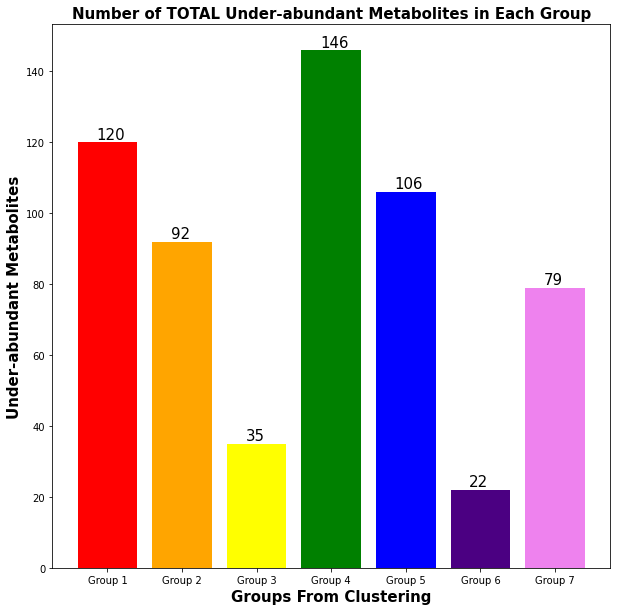

In [291]:
groups = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
significant_underexpressed_features_all = [120, 92, 35, 146, 106, 22, 79]

plt.figure(figsize = (10,10))

for i, v in enumerate(significant_underexpressed_features_all):
    plt.text(i - 0.15, v + 1, str(v), fontsize = 15)
    
plt.bar(groups, significant_underexpressed_features_all, color = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet'])
plt.title('Number of TOTAL Under-abundant Metabolites in Each Group', fontweight = 'bold', fontsize = 15)
plt.xlabel('Groups From Clustering', fontweight = 'bold', fontsize = 15)
plt.ylabel('Under-abundant Metabolites', fontweight = 'bold', fontsize = 15)
plt.show()

Below we make a bar chart for the final number of overexpressed metabolomic features in each group.

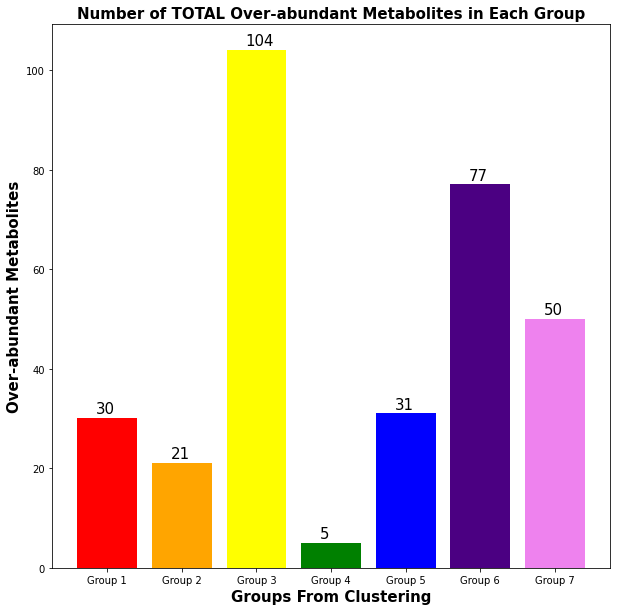

In [292]:
groups = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
significant_overexpressed_features_all = [30, 21, 104, 5, 31, 77, 50]

plt.figure(figsize = (10,10))

for i, v in enumerate(significant_overexpressed_features_all):
    plt.text(i - 0.15, v + 1, str(v), fontsize = 15)
    
plt.bar(groups, significant_overexpressed_features_all, color = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet'])
plt.title('Number of TOTAL Over-abundant Metabolites in Each Group', fontweight = 'bold', fontsize = 15)
plt.xlabel('Groups From Clustering', fontweight = 'bold', fontsize = 15)
plt.ylabel('Over-abundant Metabolites', fontweight = 'bold', fontsize = 15)
plt.show()

## Unique Cluster Overexpressed Features

Below we show the significant overexpressed features unique to every cluster. 

In [293]:
unique_overexpressed_features_c1 = np.setdiff1d(sig_metabolites_overexpressed_c1, (sig_metabolites_overexpressed_c2 + sig_metabolites_overexpressed_c3 + sig_metabolites_overexpressed_c4 + sig_metabolites_overexpressed_c5 + sig_metabolites_overexpressed_c6 + sig_metabolites_overexpressed_c7))
unique_overexpressed_features_c1

array(['Acetone', 'Glycine'], dtype='<U41')

In [294]:
unique_overexpressed_features_c2 = np.setdiff1d(sig_metabolites_overexpressed_c2, (sig_metabolites_overexpressed_c1 + sig_metabolites_overexpressed_c3 + sig_metabolites_overexpressed_c4 + sig_metabolites_overexpressed_c5 + sig_metabolites_overexpressed_c6 + sig_metabolites_overexpressed_c7))
unique_overexpressed_features_c2

array(['Albumin'], dtype='<U44')

In [295]:
unique_overexpressed_features_c3 = np.setdiff1d(sig_metabolites_overexpressed_c3, (sig_metabolites_overexpressed_c1 + sig_metabolites_overexpressed_c2 + sig_metabolites_overexpressed_c4 + sig_metabolites_overexpressed_c5 + sig_metabolites_overexpressed_c6 + sig_metabolites_overexpressed_c7))
unique_overexpressed_features_c3

array(['Docosahexaenoic Acid', 'Sphingomyelins'], dtype='<U51')

In [296]:
unique_overexpressed_features_c4 = np.setdiff1d(sig_metabolites_overexpressed_c4, (sig_metabolites_overexpressed_c1 + sig_metabolites_overexpressed_c2 + sig_metabolites_overexpressed_c3 + sig_metabolites_overexpressed_c5 + sig_metabolites_overexpressed_c6 + sig_metabolites_overexpressed_c7))
unique_overexpressed_features_c4

array([], dtype='<U81')

In [297]:
unique_overexpressed_features_c5 = np.setdiff1d(sig_metabolites_overexpressed_c5, (sig_metabolites_overexpressed_c1 + sig_metabolites_overexpressed_c2 + sig_metabolites_overexpressed_c3 + sig_metabolites_overexpressed_c4 + sig_metabolites_overexpressed_c6 + sig_metabolites_overexpressed_c7))
unique_overexpressed_features_c5

array([], dtype='<U64')

In [298]:
unique_overexpressed_features_c6 = np.setdiff1d(sig_metabolites_overexpressed_c6, (sig_metabolites_overexpressed_c1 + sig_metabolites_overexpressed_c2 + sig_metabolites_overexpressed_c3 + sig_metabolites_overexpressed_c4 + sig_metabolites_overexpressed_c5 + sig_metabolites_overexpressed_c7))
unique_overexpressed_features_c6

array(['Omega-3 Fatty Acids'], dtype='<U64')

In [299]:
unique_overexpressed_features_c7 = np.setdiff1d(sig_metabolites_overexpressed_c7, (sig_metabolites_overexpressed_c1 + sig_metabolites_overexpressed_c2 + sig_metabolites_overexpressed_c3 + sig_metabolites_overexpressed_c4 + sig_metabolites_overexpressed_c5 + sig_metabolites_overexpressed_c6))
unique_overexpressed_features_c7

array(['Glucose', 'Valine'], dtype='<U81')

## Overexpression Results: Unique overexpressed metabolomic features for each cluster

1. Cluster 1 - 23462 - Glycine, 23477 - Acetone
2. Cluster 2 - 23479 - Albumin
3. Cluster 3 - 23438 - Sphingomyelins, 23450 - Docosahexaenoic Acid
4. Cluster 4 - NA
5. Cluster 5 - NA
6. Cluster 6 - 23444 - Omega-3 Fatty Acids
7. Cluster 7 - 23467 - Valine, 23470 - Glucose

Below we make a bar chart for the final number of unique overexpressed metabolomic features in each group.

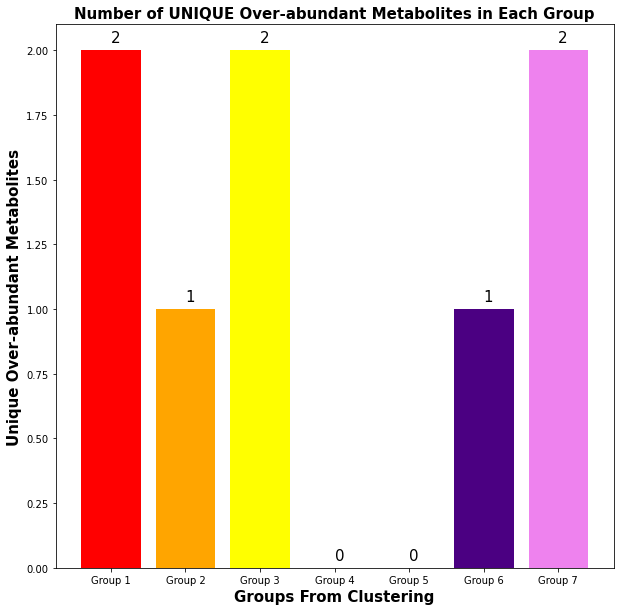

In [300]:
groups = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
significant_overexpressed_features = [2, 1, 2, 0, 0, 1, 2]

plt.figure(figsize = (10,10))

for i, v in enumerate(significant_overexpressed_features):
    plt.text(i , v + 0.03, str(v), fontsize = 15)
    
plt.bar(groups, significant_overexpressed_features, color = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet'])
plt.title('Number of UNIQUE Over-abundant Metabolites in Each Group', fontweight = 'bold', fontsize = 15)
plt.xlabel('Groups From Clustering', fontweight = 'bold', fontsize = 15)
plt.ylabel('Unique Over-abundant Metabolites', fontweight = 'bold', fontsize = 15)
plt.show()

## Unique Cluster Underexpressed Features

Below we show the significant underexpressed features unique to every cluster. 

In [301]:
unique_underexpressed_features_c1 = np.setdiff1d(sig_metabolites_underexpressed_c1, (sig_metabolites_underexpressed_c2 + sig_metabolites_underexpressed_c3 + sig_metabolites_underexpressed_c4 + sig_metabolites_underexpressed_c5 + sig_metabolites_underexpressed_c6 + sig_metabolites_underexpressed_c7))
unique_underexpressed_features_c1

array([], dtype='<U81')

In [302]:
unique_underexpressed_features_c2 = np.setdiff1d(sig_metabolites_underexpressed_c2, (sig_metabolites_underexpressed_c1 + sig_metabolites_underexpressed_c3 + sig_metabolites_underexpressed_c4 + sig_metabolites_underexpressed_c5 + sig_metabolites_underexpressed_c6 + sig_metabolites_underexpressed_c7))
unique_underexpressed_features_c2

array([], dtype='<U59')

In [303]:
unique_underexpressed_features_c3 = np.setdiff1d(sig_metabolites_underexpressed_c3, (sig_metabolites_underexpressed_c1 + sig_metabolites_underexpressed_c2 + sig_metabolites_underexpressed_c4 + sig_metabolites_underexpressed_c5 + sig_metabolites_underexpressed_c6 + sig_metabolites_underexpressed_c7))
unique_underexpressed_features_c3

array(['Alanine', 'Isoleucine', 'Leucine', 'Phenylalanine', 'Tyrosine'],
      dtype='<U81')

In [304]:
unique_underexpressed_features_c4 = np.setdiff1d(sig_metabolites_underexpressed_c4, (sig_metabolites_underexpressed_c1 + sig_metabolites_underexpressed_c2 + sig_metabolites_underexpressed_c3 + sig_metabolites_underexpressed_c5 + sig_metabolites_underexpressed_c6 + sig_metabolites_underexpressed_c7))
unique_underexpressed_features_c4

array(['Albumin', 'Triglycerides in Large HDL'], dtype='<U64')

In [305]:
unique_underexpressed_features_c5 = np.setdiff1d(sig_metabolites_underexpressed_c5, (sig_metabolites_underexpressed_c1 + sig_metabolites_underexpressed_c2 + sig_metabolites_underexpressed_c3 + sig_metabolites_underexpressed_c4 + sig_metabolites_underexpressed_c6 + sig_metabolites_underexpressed_c7))
unique_underexpressed_features_c5

array(['Acetone'], dtype='<U44')

In [306]:
unique_underexpressed_features_c6 = np.setdiff1d(sig_metabolites_underexpressed_c6, (sig_metabolites_underexpressed_c1 + sig_metabolites_underexpressed_c2 + sig_metabolites_underexpressed_c3 + sig_metabolites_underexpressed_c4 + sig_metabolites_underexpressed_c5 + sig_metabolites_underexpressed_c7))
unique_underexpressed_features_c6

array([], dtype='<U36')

In [307]:
unique_underexpressed_features_c7 = np.setdiff1d(sig_metabolites_underexpressed_c7, (sig_metabolites_underexpressed_c1 + sig_metabolites_underexpressed_c2 + sig_metabolites_underexpressed_c3 + sig_metabolites_underexpressed_c4 + sig_metabolites_underexpressed_c5 + sig_metabolites_underexpressed_c6))
unique_underexpressed_features_c7

array(['Glycine'], dtype='<U51')

## Underexpression Results: Unique underexpressed metabolomic features for each cluster

1. Cluster 1 - NA
2. Cluster 2 - NA
3. Cluster 3 - 23460 - Alanine, 23465 - Isoleucine, 23466 - Leucine, 23468 - Phenylalanine, 23469 - Tyrosine
4. Cluster 4 - 23479 - Albumin, 23564 - Triglycerides in Large HDL
5. Cluster 5 - 23477 - Acetone
6. Cluster 6 - NA
7. Cluster 7 - 23462 - Glycine

Below we make a bar chart for the final number of unique overexpressed metabolomic features in each group.

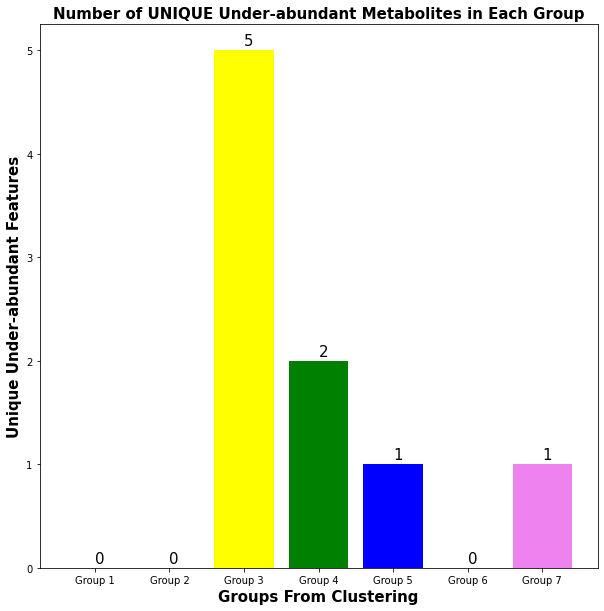

In [308]:
groups = ['Group 1', 'Group 2', 'Group 3', 'Group 4', 'Group 5', 'Group 6', 'Group 7']
significant_underexpressed_features = [0, 0, 5, 2, 1, 0, 1]

plt.figure(figsize = (10,10))

for i, v in enumerate(significant_underexpressed_features):
    plt.text(i , v + 0.05, str(v), fontsize = 15)

plt.bar(groups, significant_underexpressed_features, color = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet'])
plt.title('Number of UNIQUE Under-abundant Metabolites in Each Group', fontweight = 'bold', fontsize = 15)
plt.xlabel('Groups From Clustering', fontweight = 'bold', fontsize = 15)
plt.ylabel('Unique Under-abundant Features', fontweight = 'bold', fontsize = 15)
plt.show()

<a class="anchor" id="Percent_difference"></a>
# Finding Percentage Differences Between Unique Feature in Group And All Other Groups

In [309]:
print('------------------------------Group 1-----------------------')
print((not_cluster_1['Acetone'].mean() - cluster_1['Acetone'].mean())/not_cluster_1['Acetone'].mean()*100)
print((not_cluster_1['Glycine'].mean() - cluster_1['Glycine'].mean())/not_cluster_1['Glycine'].mean()*100)
print('------------------------------Group 2-----------------------')
print((not_cluster_2['Albumin'].mean() - cluster_2['Albumin'].mean())/not_cluster_2['Albumin'].mean()*100)
print('------------------------------Group 3-----------------------')
print((not_cluster_3['Sphingomyelins'].mean() - cluster_3['Sphingomyelins'].mean())/not_cluster_3['Sphingomyelins'].mean()*100)
print((not_cluster_3['Docosahexaenoic Acid'].mean() - cluster_3['Docosahexaenoic Acid'].mean())/not_cluster_3['Docosahexaenoic Acid'].mean()*100)
print((not_cluster_3['Alanine'].mean() - cluster_3['Alanine'].mean())/not_cluster_3['Alanine'].mean()*100)
print((not_cluster_3['Isoleucine'].mean() - cluster_3['Isoleucine'].mean())/not_cluster_3['Isoleucine'].mean()*100)
print((not_cluster_3['Leucine'].mean() - cluster_3['Leucine'].mean())/not_cluster_3['Leucine'].mean()*100)
print((not_cluster_3['Phenylalanine'].mean() - cluster_3['Phenylalanine'].mean())/not_cluster_3['Phenylalanine'].mean()*100)
print((not_cluster_3['Tyrosine'].mean() - cluster_3['Tyrosine'].mean())/not_cluster_3['Tyrosine'].mean()*100)
print('------------------------------Group 4-----------------------')
print((not_cluster_4['Albumin'].mean() - cluster_4['Albumin'].mean())/not_cluster_4['Albumin'].mean()*100)
print((not_cluster_4['Triglycerides in Large HDL'].mean() - cluster_4['Triglycerides in Large HDL'].mean())/not_cluster_4['Triglycerides in Large HDL'].mean()*100)
print('------------------------------Group 5-----------------------')
print((not_cluster_5['Acetone'].mean() - cluster_5['Acetone'].mean())/not_cluster_5['Acetone'].mean()*100)
print('------------------------------Group 6-----------------------')
print((not_cluster_6['Omega-3 Fatty Acids'].mean() - cluster_6['Omega-3 Fatty Acids'].mean())/not_cluster_6['Omega-3 Fatty Acids'].mean()*100)
print('------------------------------Group 7-----------------------')
print((not_cluster_7['Valine'].mean() - cluster_7['Valine'].mean())/not_cluster_7['Valine'].mean()*100)
print((not_cluster_7['Glucose'].mean() - cluster_7['Glucose'].mean())/not_cluster_7['Glucose'].mean()*100)
print((not_cluster_7['Glycine'].mean() - cluster_7['Glycine'].mean())/not_cluster_7['Glycine'].mean()*100)

------------------------------Group 1-----------------------
-24.56728422411647
-13.984943513457315
------------------------------Group 2-----------------------
-7.801959332148835
------------------------------Group 3-----------------------
-43.89850873302279
-19.137664346023
9.297989279080786
14.996958568037641
13.539417068216059
8.970284496092166
9.42649158244889
------------------------------Group 4-----------------------
9.044284733736871
30.591675286196484
------------------------------Group 5-----------------------
11.62719112349313
------------------------------Group 6-----------------------
-43.63392716237966
------------------------------Group 7-----------------------
-34.07059291220174
-33.04942199072425
19.84393844919042


<a class="anchor" id="Diseases"></a>

# CANCER 

Below we look into how many patients had cancer at baseline. We do this by merging the cancer diagnosed by doctor column to the dataframe. The labels with 1 represent those with cancer at baseline.

In [310]:
prediabetics_with_cancer_info = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names.merge(prediabetes_with_all[['eid', '2453-0.0']], on = 'eid')
prediabetics_with_cancer_info

,Total Cholesterol,Total Cholesterol Minus HDL-C,"Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)",VLDL Cholesterol,Clinical LDL Cholesterol,LDL Cholesterol,HDL Cholesterol,Total Triglycerides,Triglycerides in VLDL,Triglycerides in LDL,Triglycerides in HDL,Total Phospholipids in Lipoprotein Particles,Phospholipids in VLDL,Phospholipids in LDL,Phospholipids in HDL,Total Esterified Cholesterol,Cholesteryl Esters in VLDL,Cholesteryl Esters in LDL,Cholesteryl Esters in HDL,Total Free Cholesterol,Free Cholesterol in VLDL,Free Cholesterol in LDL,Free Cholesterol in HDL,Total Lipids in Lipoprotein Particles,Total Lipids in VLDL,Total Lipids in LDL,Total Lipids in HDL,Total Concentration of Lipoprotein Particles,Concentration of VLDL Particles,Concentration of LDL Particles,Concentration of HDL Particles,Average Diameter for VLDL Particles,Average Diameter for LDL Particles,Average Diameter for HDL Particles,Phosphoglycerides,Total Cholines,Phosphatidylcholines,Sphingomyelins,Apolipoprotein B,Apolipoprotein A1,Total Fatty Acids,Degree of Unsaturation,Omega-3 Fatty Acids,Omega-6 Fatty Acids,Polyunsaturated Fatty Acids,Monounsaturated Fatty Acids,Saturated Fatty Acids,Linoleic Acid,Docosahexaenoic Acid,Alanine,Glutamine,Glycine,Histidine,Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine),Isoleucine,Leucine,Valine,Phenylalanine,Tyrosine,Glucose,Lactate,Pyruvate,Citrate,3-Hydroxybutyrate,Acetate,Acetoacetate,Acetone,Creatinine,Albumin,Glycoprotein Acetyls,Concentration of Chylomicrons and Extremely Large VLDL Particles,Total Lipids in Chylomicrons and Extremely Large VLDL,Phospholipids in Chylomicrons and Extremely Large VLDL,Cholesterol in Chylomicrons and Extremely Large VLDL,Cholesteryl Esters in Chylomicrons and Extremely Large VLDL,Free Cholesterol in Chylomicrons and Extremely Large VLDL,Triglycerides in Chylomicrons and Extremely Large VLDL,Concentration of Very Large VLDL Particles,Total Lipids in Very Large VLDL,Phospholipids in Very Large VLDL,Cholesterol in Very Large VLDL,Cholesteryl Esters in Very Large VLDL,Free Cholesterol in Very Large VLDL,Triglycerides in Very Large VLDL,Concentration of Large VLDL Particles,Total Lipids in Large VLDL,Phospholipids in Large VLDL,Cholesterol in Large VLDL,Cholesteryl Esters in Large VLDL,Free Cholesterol in Large VLDL,Triglycerides in Large VLDL,Concentration of Medium VLDL Particles,Total Lipids in Medium VLDL,Phospholipids in Medium VLDL,Cholesterol in Medium VLDL,Cholesteryl Esters in Medium VLDL,Free Cholesterol in Medium VLDL,Triglycerides in Medium VLDL,Concentration of Small VLDL Particles,Total Lipids in Small VLDL,Phospholipids in Small VLDL,Cholesterol in Small VLDL,Cholesteryl Esters in Small VLDL,Free Cholesterol in Small VLDL,Triglycerides in Small VLDL,Concentration of Very Small VLDL Particles,Total Lipids in Very Small VLDL,Phospholipids in Very Small VLDL,Cholesterol in Very Small VLDL,Cholesteryl Esters in Very Small VLDL,Free Cholesterol in Very Small VLDL,Triglycerides in Very Small VLDL,Concentration of IDL Particles,Total Lipids in IDL,Phospholipids in IDL,Cholesterol in IDL,Cholesteryl Esters in IDL,Free Cholesterol in IDL,Triglycerides in IDL,Concentration of Large LDL Particles,Total Lipids in Large LDL,Phospholipids in Large LDL,Cholesterol in Large LDL,Cholesteryl Esters in Large LDL,Free Cholesterol in Large LDL,Triglycerides in Large LDL,Concentration of Medium LDL Particles,Total Lipids in Medium LDL,Phospholipids in Medium LDL,Cholesterol in Medium LDL,Cholesteryl Esters in Medium LDL,Free Cholesterol in Medium LDL,Triglycerides in Medium LDL,Concentration of Small LDL Particles,Total Lipids in Small LDL,Phospholipids in Small LDL,Cholesterol in Small LDL,Cholesteryl Esters in Small LDL,Free Cholesterol in Small LDL,Triglycerides in Small LDL,Concentration of Very Large HDL Particles,Total Lipids in Very Large HDL,Phospholipids in Very Large HDL,Cholesterol in Very Large HDL,Cholesteryl Esters in Very Large HDL,Free Cholest

Below we show the patients with cancer at baseline.

In [311]:
cancer_prediabetics = prediabetics_with_cancer_info[prediabetics_with_cancer_info['2453-0.0'] == 1]
cancer_prediabetics

,Total Cholesterol,Total Cholesterol Minus HDL-C,"Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)",VLDL Cholesterol,Clinical LDL Cholesterol,LDL Cholesterol,HDL Cholesterol,Total Triglycerides,Triglycerides in VLDL,Triglycerides in LDL,Triglycerides in HDL,Total Phospholipids in Lipoprotein Particles,Phospholipids in VLDL,Phospholipids in LDL,Phospholipids in HDL,Total Esterified Cholesterol,Cholesteryl Esters in VLDL,Cholesteryl Esters in LDL,Cholesteryl Esters in HDL,Total Free Cholesterol,Free Cholesterol in VLDL,Free Cholesterol in LDL,Free Cholesterol in HDL,Total Lipids in Lipoprotein Particles,Total Lipids in VLDL,Total Lipids in LDL,Total Lipids in HDL,Total Concentration of Lipoprotein Particles,Concentration of VLDL Particles,Concentration of LDL Particles,Concentration of HDL Particles,Average Diameter for VLDL Particles,Average Diameter for LDL Particles,Average Diameter for HDL Particles,Phosphoglycerides,Total Cholines,Phosphatidylcholines,Sphingomyelins,Apolipoprotein B,Apolipoprotein A1,Total Fatty Acids,Degree of Unsaturation,Omega-3 Fatty Acids,Omega-6 Fatty Acids,Polyunsaturated Fatty Acids,Monounsaturated Fatty Acids,Saturated Fatty Acids,Linoleic Acid,Docosahexaenoic Acid,Alanine,Glutamine,Glycine,Histidine,Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine),Isoleucine,Leucine,Valine,Phenylalanine,Tyrosine,Glucose,Lactate,Pyruvate,Citrate,3-Hydroxybutyrate,Acetate,Acetoacetate,Acetone,Creatinine,Albumin,Glycoprotein Acetyls,Concentration of Chylomicrons and Extremely Large VLDL Particles,Total Lipids in Chylomicrons and Extremely Large VLDL,Phospholipids in Chylomicrons and Extremely Large VLDL,Cholesterol in Chylomicrons and Extremely Large VLDL,Cholesteryl Esters in Chylomicrons and Extremely Large VLDL,Free Cholesterol in Chylomicrons and Extremely Large VLDL,Triglycerides in Chylomicrons and Extremely Large VLDL,Concentration of Very Large VLDL Particles,Total Lipids in Very Large VLDL,Phospholipids in Very Large VLDL,Cholesterol in Very Large VLDL,Cholesteryl Esters in Very Large VLDL,Free Cholesterol in Very Large VLDL,Triglycerides in Very Large VLDL,Concentration of Large VLDL Particles,Total Lipids in Large VLDL,Phospholipids in Large VLDL,Cholesterol in Large VLDL,Cholesteryl Esters in Large VLDL,Free Cholesterol in Large VLDL,Triglycerides in Large VLDL,Concentration of Medium VLDL Particles,Total Lipids in Medium VLDL,Phospholipids in Medium VLDL,Cholesterol in Medium VLDL,Cholesteryl Esters in Medium VLDL,Free Cholesterol in Medium VLDL,Triglycerides in Medium VLDL,Concentration of Small VLDL Particles,Total Lipids in Small VLDL,Phospholipids in Small VLDL,Cholesterol in Small VLDL,Cholesteryl Esters in Small VLDL,Free Cholesterol in Small VLDL,Triglycerides in Small VLDL,Concentration of Very Small VLDL Particles,Total Lipids in Very Small VLDL,Phospholipids in Very Small VLDL,Cholesterol in Very Small VLDL,Cholesteryl Esters in Very Small VLDL,Free Cholesterol in Very Small VLDL,Triglycerides in Very Small VLDL,Concentration of IDL Particles,Total Lipids in IDL,Phospholipids in IDL,Cholesterol in IDL,Cholesteryl Esters in IDL,Free Cholesterol in IDL,Triglycerides in IDL,Concentration of Large LDL Particles,Total Lipids in Large LDL,Phospholipids in Large LDL,Cholesterol in Large LDL,Cholesteryl Esters in Large LDL,Free Cholesterol in Large LDL,Triglycerides in Large LDL,Concentration of Medium LDL Particles,Total Lipids in Medium LDL,Phospholipids in Medium LDL,Cholesterol in Medium LDL,Cholesteryl Esters in Medium LDL,Free Cholesterol in Medium LDL,Triglycerides in Medium LDL,Concentration of Small LDL Particles,Total Lipids in Small LDL,Phospholipids in Small LDL,Cholesterol in Small LDL,Cholesteryl Esters in Small LDL,Free Cholesterol in Small LDL,Triglycerides in Small LDL,Concentration of Very Large HDL Particles,Total Lipids in Very Large HDL,Phospholipids in Very Large HDL,Cholesterol in Very Large HDL,Cholesteryl Esters in Very Large HDL,Free Cholest

Below we show how many patients in each group had cancer at baseline.

In [312]:
print('Number of patients in group 1 with cancer at baseline:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 1]))
print('Number of patients in group 2 with cancer at baseline:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 2]))
print('Number of patients in group 3 with cancer at baseline:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 3]))
print('Number of patients in group 4 with cancer at baseline:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 4]))
print('Number of patients in group 5 with cancer at baseline:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 5]))
print('Number of patients in group 6 with cancer at baseline:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 6]))
print('Number of patients in group 7 with cancer at baseline:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 7]))


Number of patients in group 1 with cancer at baseline: 28
Number of patients in group 2 with cancer at baseline: 27
Number of patients in group 3 with cancer at baseline: 62
Number of patients in group 4 with cancer at baseline: 22
Number of patients in group 5 with cancer at baseline: 52
Number of patients in group 6 with cancer at baseline: 7
Number of patients in group 7 with cancer at baseline: 4


Below we show the proportion of patients in each group with cancer.

In [313]:
print('Proportion of patients in group 1 with cancer at baseline:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with cancer at baseline:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with cancer at baseline:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with cancer at baseline:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with cancer at baseline:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with cancer at baseline:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with cancer at baseline:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with cancer at baseline: 0.08211143695014662
Proportion of patients in group 2 with cancer at baseline: 0.10150375939849623
Proportion of patients in group 3 with cancer at baseline: 0.10350584307178631
Proportion of patients in group 4 with cancer at baseline: 0.088
Proportion of patients in group 5 with cancer at baseline: 0.07202216066481995
Proportion of patients in group 6 with cancer at baseline: 0.11666666666666667
Proportion of patients in group 7 with cancer at baseline: 0.039603960396039604


Below we show the proportion of patients with cancer progressing in each group.

In [314]:
print('Proportion of patients in group 1 with cancer at baseline who progress to T2D:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 1][cancer_prediabetics['target'] == 1])/len(cancer_prediabetics[cancer_prediabetics['labels'] == 1]))
print('Proportion of patients in group 2 with cancer at baseline who progress to T2D:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 2][cancer_prediabetics['target'] == 1])/len(cancer_prediabetics[cancer_prediabetics['labels'] == 2]))
print('Proportion of patients in group 3 with cancer at baseline who progress to T2D:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 3][cancer_prediabetics['target'] == 1])/len(cancer_prediabetics[cancer_prediabetics['labels'] == 3]))
print('Proportion of patients in group 4 with cancer at baseline who progress to T2D:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 4][cancer_prediabetics['target'] == 1])/len(cancer_prediabetics[cancer_prediabetics['labels'] == 4]))
print('Proportion of patients in group 5 with cancer at baseline who progress to T2D:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 5][cancer_prediabetics['target'] == 1])/len(cancer_prediabetics[cancer_prediabetics['labels'] == 5]))
print('Proportion of patients in group 6 with cancer at baseline who progress to T2D:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 6][cancer_prediabetics['target'] == 1])/len(cancer_prediabetics[cancer_prediabetics['labels'] == 6]))
print('Proportion of patients in group 7 with cancer at baseline who progress to T2D:', len(cancer_prediabetics[cancer_prediabetics['labels'] == 7][cancer_prediabetics['target'] == 1])/len(cancer_prediabetics[cancer_prediabetics['labels'] == 7]))


Boolean Series key will be reindexed to match DataFrame index.


Proportion of patients in group 1 with cancer at baseline who progress to T2D: 0.4642857142857143


Boolean Series key will be reindexed to match DataFrame index.


Proportion of patients in group 2 with cancer at baseline who progress to T2D: 0.4074074074074074


Boolean Series key will be reindexed to match DataFrame index.


Proportion of patients in group 3 with cancer at baseline who progress to T2D: 0.3387096774193548


Boolean Series key will be reindexed to match DataFrame index.


Proportion of patients in group 4 with cancer at baseline who progress to T2D: 0.5454545454545454


Boolean Series key will be reindexed to match DataFrame index.


Proportion of patients in group 5 with cancer at baseline who progress to T2D: 0.4230769230769231


Boolean Series key will be reindexed to match DataFrame index.


Proportion of patients in group 6 with cancer at baseline who progress to T2D: 0.42857142857142855


Boolean Series key will be reindexed to match DataFrame index.


Proportion of patients in group 7 with cancer at baseline who progress to T2D: 1.0


Below we add the type of cancer column to find what were the most common types of cancer for each group.

In [315]:
cancer_prediabetics_with_types = cancer_prediabetics.merge(prediabetes_with_all[['eid', '40006-0.0']], on = 'eid')
cancer_prediabetics_with_types

,Total Cholesterol,Total Cholesterol Minus HDL-C,"Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)",VLDL Cholesterol,Clinical LDL Cholesterol,LDL Cholesterol,HDL Cholesterol,Total Triglycerides,Triglycerides in VLDL,Triglycerides in LDL,Triglycerides in HDL,Total Phospholipids in Lipoprotein Particles,Phospholipids in VLDL,Phospholipids in LDL,Phospholipids in HDL,Total Esterified Cholesterol,Cholesteryl Esters in VLDL,Cholesteryl Esters in LDL,Cholesteryl Esters in HDL,Total Free Cholesterol,Free Cholesterol in VLDL,Free Cholesterol in LDL,Free Cholesterol in HDL,Total Lipids in Lipoprotein Particles,Total Lipids in VLDL,Total Lipids in LDL,Total Lipids in HDL,Total Concentration of Lipoprotein Particles,Concentration of VLDL Particles,Concentration of LDL Particles,Concentration of HDL Particles,Average Diameter for VLDL Particles,Average Diameter for LDL Particles,Average Diameter for HDL Particles,Phosphoglycerides,Total Cholines,Phosphatidylcholines,Sphingomyelins,Apolipoprotein B,Apolipoprotein A1,Total Fatty Acids,Degree of Unsaturation,Omega-3 Fatty Acids,Omega-6 Fatty Acids,Polyunsaturated Fatty Acids,Monounsaturated Fatty Acids,Saturated Fatty Acids,Linoleic Acid,Docosahexaenoic Acid,Alanine,Glutamine,Glycine,Histidine,Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine),Isoleucine,Leucine,Valine,Phenylalanine,Tyrosine,Glucose,Lactate,Pyruvate,Citrate,3-Hydroxybutyrate,Acetate,Acetoacetate,Acetone,Creatinine,Albumin,Glycoprotein Acetyls,Concentration of Chylomicrons and Extremely Large VLDL Particles,Total Lipids in Chylomicrons and Extremely Large VLDL,Phospholipids in Chylomicrons and Extremely Large VLDL,Cholesterol in Chylomicrons and Extremely Large VLDL,Cholesteryl Esters in Chylomicrons and Extremely Large VLDL,Free Cholesterol in Chylomicrons and Extremely Large VLDL,Triglycerides in Chylomicrons and Extremely Large VLDL,Concentration of Very Large VLDL Particles,Total Lipids in Very Large VLDL,Phospholipids in Very Large VLDL,Cholesterol in Very Large VLDL,Cholesteryl Esters in Very Large VLDL,Free Cholesterol in Very Large VLDL,Triglycerides in Very Large VLDL,Concentration of Large VLDL Particles,Total Lipids in Large VLDL,Phospholipids in Large VLDL,Cholesterol in Large VLDL,Cholesteryl Esters in Large VLDL,Free Cholesterol in Large VLDL,Triglycerides in Large VLDL,Concentration of Medium VLDL Particles,Total Lipids in Medium VLDL,Phospholipids in Medium VLDL,Cholesterol in Medium VLDL,Cholesteryl Esters in Medium VLDL,Free Cholesterol in Medium VLDL,Triglycerides in Medium VLDL,Concentration of Small VLDL Particles,Total Lipids in Small VLDL,Phospholipids in Small VLDL,Cholesterol in Small VLDL,Cholesteryl Esters in Small VLDL,Free Cholesterol in Small VLDL,Triglycerides in Small VLDL,Concentration of Very Small VLDL Particles,Total Lipids in Very Small VLDL,Phospholipids in Very Small VLDL,Cholesterol in Very Small VLDL,Cholesteryl Esters in Very Small VLDL,Free Cholesterol in Very Small VLDL,Triglycerides in Very Small VLDL,Concentration of IDL Particles,Total Lipids in IDL,Phospholipids in IDL,Cholesterol in IDL,Cholesteryl Esters in IDL,Free Cholesterol in IDL,Triglycerides in IDL,Concentration of Large LDL Particles,Total Lipids in Large LDL,Phospholipids in Large LDL,Cholesterol in Large LDL,Cholesteryl Esters in Large LDL,Free Cholesterol in Large LDL,Triglycerides in Large LDL,Concentration of Medium LDL Particles,Total Lipids in Medium LDL,Phospholipids in Medium LDL,Cholesterol in Medium LDL,Cholesteryl Esters in Medium LDL,Free Cholesterol in Medium LDL,Triglycerides in Medium LDL,Concentration of Small LDL Particles,Total Lipids in Small LDL,Phospholipids in Small LDL,Cholesterol in Small LDL,Cholesteryl Esters in Small LDL,Free Cholesterol in Small LDL,Triglycerides in Small LDL,Concentration of Very Large HDL Particles,Total Lipids in Very Large HDL,Phospholipids in Very Large HDL,Cholesterol in Very Large HDL,Cholesteryl Esters in Very Large HDL,Free Cholest

Below we show how many of our patients have a cancer type designation.

In [316]:
cancer_prediabetics_with_types_not_null = cancer_prediabetics_with_types[cancer_prediabetics_with_types['40006-0.0'].notnull()]
cancer_prediabetics_with_types_not_null

,Total Cholesterol,Total Cholesterol Minus HDL-C,"Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)",VLDL Cholesterol,Clinical LDL Cholesterol,LDL Cholesterol,HDL Cholesterol,Total Triglycerides,Triglycerides in VLDL,Triglycerides in LDL,Triglycerides in HDL,Total Phospholipids in Lipoprotein Particles,Phospholipids in VLDL,Phospholipids in LDL,Phospholipids in HDL,Total Esterified Cholesterol,Cholesteryl Esters in VLDL,Cholesteryl Esters in LDL,Cholesteryl Esters in HDL,Total Free Cholesterol,Free Cholesterol in VLDL,Free Cholesterol in LDL,Free Cholesterol in HDL,Total Lipids in Lipoprotein Particles,Total Lipids in VLDL,Total Lipids in LDL,Total Lipids in HDL,Total Concentration of Lipoprotein Particles,Concentration of VLDL Particles,Concentration of LDL Particles,Concentration of HDL Particles,Average Diameter for VLDL Particles,Average Diameter for LDL Particles,Average Diameter for HDL Particles,Phosphoglycerides,Total Cholines,Phosphatidylcholines,Sphingomyelins,Apolipoprotein B,Apolipoprotein A1,Total Fatty Acids,Degree of Unsaturation,Omega-3 Fatty Acids,Omega-6 Fatty Acids,Polyunsaturated Fatty Acids,Monounsaturated Fatty Acids,Saturated Fatty Acids,Linoleic Acid,Docosahexaenoic Acid,Alanine,Glutamine,Glycine,Histidine,Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine),Isoleucine,Leucine,Valine,Phenylalanine,Tyrosine,Glucose,Lactate,Pyruvate,Citrate,3-Hydroxybutyrate,Acetate,Acetoacetate,Acetone,Creatinine,Albumin,Glycoprotein Acetyls,Concentration of Chylomicrons and Extremely Large VLDL Particles,Total Lipids in Chylomicrons and Extremely Large VLDL,Phospholipids in Chylomicrons and Extremely Large VLDL,Cholesterol in Chylomicrons and Extremely Large VLDL,Cholesteryl Esters in Chylomicrons and Extremely Large VLDL,Free Cholesterol in Chylomicrons and Extremely Large VLDL,Triglycerides in Chylomicrons and Extremely Large VLDL,Concentration of Very Large VLDL Particles,Total Lipids in Very Large VLDL,Phospholipids in Very Large VLDL,Cholesterol in Very Large VLDL,Cholesteryl Esters in Very Large VLDL,Free Cholesterol in Very Large VLDL,Triglycerides in Very Large VLDL,Concentration of Large VLDL Particles,Total Lipids in Large VLDL,Phospholipids in Large VLDL,Cholesterol in Large VLDL,Cholesteryl Esters in Large VLDL,Free Cholesterol in Large VLDL,Triglycerides in Large VLDL,Concentration of Medium VLDL Particles,Total Lipids in Medium VLDL,Phospholipids in Medium VLDL,Cholesterol in Medium VLDL,Cholesteryl Esters in Medium VLDL,Free Cholesterol in Medium VLDL,Triglycerides in Medium VLDL,Concentration of Small VLDL Particles,Total Lipids in Small VLDL,Phospholipids in Small VLDL,Cholesterol in Small VLDL,Cholesteryl Esters in Small VLDL,Free Cholesterol in Small VLDL,Triglycerides in Small VLDL,Concentration of Very Small VLDL Particles,Total Lipids in Very Small VLDL,Phospholipids in Very Small VLDL,Cholesterol in Very Small VLDL,Cholesteryl Esters in Very Small VLDL,Free Cholesterol in Very Small VLDL,Triglycerides in Very Small VLDL,Concentration of IDL Particles,Total Lipids in IDL,Phospholipids in IDL,Cholesterol in IDL,Cholesteryl Esters in IDL,Free Cholesterol in IDL,Triglycerides in IDL,Concentration of Large LDL Particles,Total Lipids in Large LDL,Phospholipids in Large LDL,Cholesterol in Large LDL,Cholesteryl Esters in Large LDL,Free Cholesterol in Large LDL,Triglycerides in Large LDL,Concentration of Medium LDL Particles,Total Lipids in Medium LDL,Phospholipids in Medium LDL,Cholesterol in Medium LDL,Cholesteryl Esters in Medium LDL,Free Cholesterol in Medium LDL,Triglycerides in Medium LDL,Concentration of Small LDL Particles,Total Lipids in Small LDL,Phospholipids in Small LDL,Cholesterol in Small LDL,Cholesteryl Esters in Small LDL,Free Cholesterol in Small LDL,Triglycerides in Small LDL,Concentration of Very Large HDL Particles,Total Lipids in Very Large HDL,Phospholipids in Very Large HDL,Cholesterol in Very Large HDL,Cholesteryl Esters in Very Large HDL,Free Cholest

Below we show the top 3 most frequent cancers for each group using the reference https://medium.com/learningdatascience/pandas-tips-tricks-return-the-3-most-frequent-values-of-field-a-for-each-field-b-value-34d7ff09708a. We see that C61 - Malignant neoplasm of prostate - is the most common cancer type. This is followed by C509 - Malignant neoplasm of breast of unspecified site. In group 3, we also have D051 - Intraductal carcinoma in situ of breast - which is just another breast cancer.

In [317]:
cancer_prediabetics_with_types_not_null.groupby(['labels', '40006-0.0']).size().reset_index(name='Count').sort_values(['labels','Count'],ascending=[1,0]).groupby('labels').head(3)

,labels,40006-0.0,Count
12,1,C61,5
7,1,C504,3
1,1,C180,2
24,2,C61,4
22,2,C509,2
...,...,...,...
103,6,C180,1
104,6,C442,1
105,6,C449,1
108,7,C442,1


Below we create separate dataframes for each group.

In [318]:
cancer_prediabetics_with_types_not_null_group1 = cancer_prediabetics_with_types_not_null[cancer_prediabetics_with_types_not_null['labels'] == 1]
cancer_prediabetics_with_types_not_null_group2 = cancer_prediabetics_with_types_not_null[cancer_prediabetics_with_types_not_null['labels'] == 2]
cancer_prediabetics_with_types_not_null_group3 = cancer_prediabetics_with_types_not_null[cancer_prediabetics_with_types_not_null['labels'] == 3]
cancer_prediabetics_with_types_not_null_group4 = cancer_prediabetics_with_types_not_null[cancer_prediabetics_with_types_not_null['labels'] == 4]
cancer_prediabetics_with_types_not_null_group5 = cancer_prediabetics_with_types_not_null[cancer_prediabetics_with_types_not_null['labels'] == 5]
cancer_prediabetics_with_types_not_null_group6 = cancer_prediabetics_with_types_not_null[cancer_prediabetics_with_types_not_null['labels'] == 6]
cancer_prediabetics_with_types_not_null_group7 = cancer_prediabetics_with_types_not_null[cancer_prediabetics_with_types_not_null['labels'] == 7]

Below we show how many patients in each group have a cancer type designation.

In [319]:
print('Number of patients in group 1 with cancer type given:', len(cancer_prediabetics_with_types_not_null_group1))
print('Number of patients in group 2 with cancer type given:', len(cancer_prediabetics_with_types_not_null_group2))
print('Number of patients in group 3 with cancer type given:', len(cancer_prediabetics_with_types_not_null_group3))
print('Number of patients in group 4 with cancer type given:', len(cancer_prediabetics_with_types_not_null_group4))
print('Number of patients in group 5 with cancer type given:', len(cancer_prediabetics_with_types_not_null_group5))
print('Number of patients in group 6 with cancer type given:', len(cancer_prediabetics_with_types_not_null_group6))
print('Number of patients in group 7 with cancer type given:', len(cancer_prediabetics_with_types_not_null_group7))


Number of patients in group 1 with cancer type given: 24
Number of patients in group 2 with cancer type given: 20
Number of patients in group 3 with cancer type given: 50
Number of patients in group 4 with cancer type given: 16
Number of patients in group 5 with cancer type given: 38
Number of patients in group 6 with cancer type given: 5
Number of patients in group 7 with cancer type given: 2


Below we use a different method of identification for cancer type to see if the results we found are consistent.

In [320]:
prediabetics_with_cancer_info_with_codes = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names.merge(prediabetes_with_all[['eid', '20001-0.0']], on = 'eid')
prediabetics_with_cancer_info_with_codes

,Total Cholesterol,Total Cholesterol Minus HDL-C,"Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)",VLDL Cholesterol,Clinical LDL Cholesterol,LDL Cholesterol,HDL Cholesterol,Total Triglycerides,Triglycerides in VLDL,Triglycerides in LDL,Triglycerides in HDL,Total Phospholipids in Lipoprotein Particles,Phospholipids in VLDL,Phospholipids in LDL,Phospholipids in HDL,Total Esterified Cholesterol,Cholesteryl Esters in VLDL,Cholesteryl Esters in LDL,Cholesteryl Esters in HDL,Total Free Cholesterol,Free Cholesterol in VLDL,Free Cholesterol in LDL,Free Cholesterol in HDL,Total Lipids in Lipoprotein Particles,Total Lipids in VLDL,Total Lipids in LDL,Total Lipids in HDL,Total Concentration of Lipoprotein Particles,Concentration of VLDL Particles,Concentration of LDL Particles,Concentration of HDL Particles,Average Diameter for VLDL Particles,Average Diameter for LDL Particles,Average Diameter for HDL Particles,Phosphoglycerides,Total Cholines,Phosphatidylcholines,Sphingomyelins,Apolipoprotein B,Apolipoprotein A1,Total Fatty Acids,Degree of Unsaturation,Omega-3 Fatty Acids,Omega-6 Fatty Acids,Polyunsaturated Fatty Acids,Monounsaturated Fatty Acids,Saturated Fatty Acids,Linoleic Acid,Docosahexaenoic Acid,Alanine,Glutamine,Glycine,Histidine,Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine),Isoleucine,Leucine,Valine,Phenylalanine,Tyrosine,Glucose,Lactate,Pyruvate,Citrate,3-Hydroxybutyrate,Acetate,Acetoacetate,Acetone,Creatinine,Albumin,Glycoprotein Acetyls,Concentration of Chylomicrons and Extremely Large VLDL Particles,Total Lipids in Chylomicrons and Extremely Large VLDL,Phospholipids in Chylomicrons and Extremely Large VLDL,Cholesterol in Chylomicrons and Extremely Large VLDL,Cholesteryl Esters in Chylomicrons and Extremely Large VLDL,Free Cholesterol in Chylomicrons and Extremely Large VLDL,Triglycerides in Chylomicrons and Extremely Large VLDL,Concentration of Very Large VLDL Particles,Total Lipids in Very Large VLDL,Phospholipids in Very Large VLDL,Cholesterol in Very Large VLDL,Cholesteryl Esters in Very Large VLDL,Free Cholesterol in Very Large VLDL,Triglycerides in Very Large VLDL,Concentration of Large VLDL Particles,Total Lipids in Large VLDL,Phospholipids in Large VLDL,Cholesterol in Large VLDL,Cholesteryl Esters in Large VLDL,Free Cholesterol in Large VLDL,Triglycerides in Large VLDL,Concentration of Medium VLDL Particles,Total Lipids in Medium VLDL,Phospholipids in Medium VLDL,Cholesterol in Medium VLDL,Cholesteryl Esters in Medium VLDL,Free Cholesterol in Medium VLDL,Triglycerides in Medium VLDL,Concentration of Small VLDL Particles,Total Lipids in Small VLDL,Phospholipids in Small VLDL,Cholesterol in Small VLDL,Cholesteryl Esters in Small VLDL,Free Cholesterol in Small VLDL,Triglycerides in Small VLDL,Concentration of Very Small VLDL Particles,Total Lipids in Very Small VLDL,Phospholipids in Very Small VLDL,Cholesterol in Very Small VLDL,Cholesteryl Esters in Very Small VLDL,Free Cholesterol in Very Small VLDL,Triglycerides in Very Small VLDL,Concentration of IDL Particles,Total Lipids in IDL,Phospholipids in IDL,Cholesterol in IDL,Cholesteryl Esters in IDL,Free Cholesterol in IDL,Triglycerides in IDL,Concentration of Large LDL Particles,Total Lipids in Large LDL,Phospholipids in Large LDL,Cholesterol in Large LDL,Cholesteryl Esters in Large LDL,Free Cholesterol in Large LDL,Triglycerides in Large LDL,Concentration of Medium LDL Particles,Total Lipids in Medium LDL,Phospholipids in Medium LDL,Cholesterol in Medium LDL,Cholesteryl Esters in Medium LDL,Free Cholesterol in Medium LDL,Triglycerides in Medium LDL,Concentration of Small LDL Particles,Total Lipids in Small LDL,Phospholipids in Small LDL,Cholesterol in Small LDL,Cholesteryl Esters in Small LDL,Free Cholesterol in Small LDL,Triglycerides in Small LDL,Concentration of Very Large HDL Particles,Total Lipids in Very Large HDL,Phospholipids in Very Large HDL,Cholesterol in Very Large HDL,Cholesteryl Esters in Very Large HDL,Free Cholest

Below we see who develops cancer later on in the study.

In [321]:
prediabetics_with_cancer_info_later = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_names.merge(prediabetes_with_all[['eid', '2453-0.0', '2453-1.0', '2453-2.0']], on = 'eid')
prediabetics_with_cancer_info_later

,Total Cholesterol,Total Cholesterol Minus HDL-C,"Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)",VLDL Cholesterol,Clinical LDL Cholesterol,LDL Cholesterol,HDL Cholesterol,Total Triglycerides,Triglycerides in VLDL,Triglycerides in LDL,Triglycerides in HDL,Total Phospholipids in Lipoprotein Particles,Phospholipids in VLDL,Phospholipids in LDL,Phospholipids in HDL,Total Esterified Cholesterol,Cholesteryl Esters in VLDL,Cholesteryl Esters in LDL,Cholesteryl Esters in HDL,Total Free Cholesterol,Free Cholesterol in VLDL,Free Cholesterol in LDL,Free Cholesterol in HDL,Total Lipids in Lipoprotein Particles,Total Lipids in VLDL,Total Lipids in LDL,Total Lipids in HDL,Total Concentration of Lipoprotein Particles,Concentration of VLDL Particles,Concentration of LDL Particles,Concentration of HDL Particles,Average Diameter for VLDL Particles,Average Diameter for LDL Particles,Average Diameter for HDL Particles,Phosphoglycerides,Total Cholines,Phosphatidylcholines,Sphingomyelins,Apolipoprotein B,Apolipoprotein A1,Total Fatty Acids,Degree of Unsaturation,Omega-3 Fatty Acids,Omega-6 Fatty Acids,Polyunsaturated Fatty Acids,Monounsaturated Fatty Acids,Saturated Fatty Acids,Linoleic Acid,Docosahexaenoic Acid,Alanine,Glutamine,Glycine,Histidine,Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine),Isoleucine,Leucine,Valine,Phenylalanine,Tyrosine,Glucose,Lactate,Pyruvate,Citrate,3-Hydroxybutyrate,Acetate,Acetoacetate,Acetone,Creatinine,Albumin,Glycoprotein Acetyls,Concentration of Chylomicrons and Extremely Large VLDL Particles,Total Lipids in Chylomicrons and Extremely Large VLDL,Phospholipids in Chylomicrons and Extremely Large VLDL,Cholesterol in Chylomicrons and Extremely Large VLDL,Cholesteryl Esters in Chylomicrons and Extremely Large VLDL,Free Cholesterol in Chylomicrons and Extremely Large VLDL,Triglycerides in Chylomicrons and Extremely Large VLDL,Concentration of Very Large VLDL Particles,Total Lipids in Very Large VLDL,Phospholipids in Very Large VLDL,Cholesterol in Very Large VLDL,Cholesteryl Esters in Very Large VLDL,Free Cholesterol in Very Large VLDL,Triglycerides in Very Large VLDL,Concentration of Large VLDL Particles,Total Lipids in Large VLDL,Phospholipids in Large VLDL,Cholesterol in Large VLDL,Cholesteryl Esters in Large VLDL,Free Cholesterol in Large VLDL,Triglycerides in Large VLDL,Concentration of Medium VLDL Particles,Total Lipids in Medium VLDL,Phospholipids in Medium VLDL,Cholesterol in Medium VLDL,Cholesteryl Esters in Medium VLDL,Free Cholesterol in Medium VLDL,Triglycerides in Medium VLDL,Concentration of Small VLDL Particles,Total Lipids in Small VLDL,Phospholipids in Small VLDL,Cholesterol in Small VLDL,Cholesteryl Esters in Small VLDL,Free Cholesterol in Small VLDL,Triglycerides in Small VLDL,Concentration of Very Small VLDL Particles,Total Lipids in Very Small VLDL,Phospholipids in Very Small VLDL,Cholesterol in Very Small VLDL,Cholesteryl Esters in Very Small VLDL,Free Cholesterol in Very Small VLDL,Triglycerides in Very Small VLDL,Concentration of IDL Particles,Total Lipids in IDL,Phospholipids in IDL,Cholesterol in IDL,Cholesteryl Esters in IDL,Free Cholesterol in IDL,Triglycerides in IDL,Concentration of Large LDL Particles,Total Lipids in Large LDL,Phospholipids in Large LDL,Cholesterol in Large LDL,Cholesteryl Esters in Large LDL,Free Cholesterol in Large LDL,Triglycerides in Large LDL,Concentration of Medium LDL Particles,Total Lipids in Medium LDL,Phospholipids in Medium LDL,Cholesterol in Medium LDL,Cholesteryl Esters in Medium LDL,Free Cholesterol in Medium LDL,Triglycerides in Medium LDL,Concentration of Small LDL Particles,Total Lipids in Small LDL,Phospholipids in Small LDL,Cholesterol in Small LDL,Cholesteryl Esters in Small LDL,Free Cholesterol in Small LDL,Triglycerides in Small LDL,Concentration of Very Large HDL Particles,Total Lipids in Very Large HDL,Phospholipids in Very Large HDL,Cholesterol in Very Large HDL,Cholesteryl Esters in Very Large HDL,Free Cholest

Below we create a dataframe to show the patients not with cancer at baseline but who are diagnosed with cancer later in the study.

In [322]:
prediabetics_with_cancer_info_later_only = prediabetics_with_cancer_info_later[~(prediabetics_with_cancer_info_later['2453-0.0'] == 1) & ((prediabetics_with_cancer_info_later['2453-1.0'] == 1) | (prediabetics_with_cancer_info_later['2453-2.0'] == 1))]
prediabetics_with_cancer_info_later_only

,Total Cholesterol,Total Cholesterol Minus HDL-C,"Remnant Cholesterol (Non-HDL, Non-LDL -Cholesterol)",VLDL Cholesterol,Clinical LDL Cholesterol,LDL Cholesterol,HDL Cholesterol,Total Triglycerides,Triglycerides in VLDL,Triglycerides in LDL,Triglycerides in HDL,Total Phospholipids in Lipoprotein Particles,Phospholipids in VLDL,Phospholipids in LDL,Phospholipids in HDL,Total Esterified Cholesterol,Cholesteryl Esters in VLDL,Cholesteryl Esters in LDL,Cholesteryl Esters in HDL,Total Free Cholesterol,Free Cholesterol in VLDL,Free Cholesterol in LDL,Free Cholesterol in HDL,Total Lipids in Lipoprotein Particles,Total Lipids in VLDL,Total Lipids in LDL,Total Lipids in HDL,Total Concentration of Lipoprotein Particles,Concentration of VLDL Particles,Concentration of LDL Particles,Concentration of HDL Particles,Average Diameter for VLDL Particles,Average Diameter for LDL Particles,Average Diameter for HDL Particles,Phosphoglycerides,Total Cholines,Phosphatidylcholines,Sphingomyelins,Apolipoprotein B,Apolipoprotein A1,Total Fatty Acids,Degree of Unsaturation,Omega-3 Fatty Acids,Omega-6 Fatty Acids,Polyunsaturated Fatty Acids,Monounsaturated Fatty Acids,Saturated Fatty Acids,Linoleic Acid,Docosahexaenoic Acid,Alanine,Glutamine,Glycine,Histidine,Total Concentration of Branched-Chain Amino Acids (Leucine + Isoleucine + Valine),Isoleucine,Leucine,Valine,Phenylalanine,Tyrosine,Glucose,Lactate,Pyruvate,Citrate,3-Hydroxybutyrate,Acetate,Acetoacetate,Acetone,Creatinine,Albumin,Glycoprotein Acetyls,Concentration of Chylomicrons and Extremely Large VLDL Particles,Total Lipids in Chylomicrons and Extremely Large VLDL,Phospholipids in Chylomicrons and Extremely Large VLDL,Cholesterol in Chylomicrons and Extremely Large VLDL,Cholesteryl Esters in Chylomicrons and Extremely Large VLDL,Free Cholesterol in Chylomicrons and Extremely Large VLDL,Triglycerides in Chylomicrons and Extremely Large VLDL,Concentration of Very Large VLDL Particles,Total Lipids in Very Large VLDL,Phospholipids in Very Large VLDL,Cholesterol in Very Large VLDL,Cholesteryl Esters in Very Large VLDL,Free Cholesterol in Very Large VLDL,Triglycerides in Very Large VLDL,Concentration of Large VLDL Particles,Total Lipids in Large VLDL,Phospholipids in Large VLDL,Cholesterol in Large VLDL,Cholesteryl Esters in Large VLDL,Free Cholesterol in Large VLDL,Triglycerides in Large VLDL,Concentration of Medium VLDL Particles,Total Lipids in Medium VLDL,Phospholipids in Medium VLDL,Cholesterol in Medium VLDL,Cholesteryl Esters in Medium VLDL,Free Cholesterol in Medium VLDL,Triglycerides in Medium VLDL,Concentration of Small VLDL Particles,Total Lipids in Small VLDL,Phospholipids in Small VLDL,Cholesterol in Small VLDL,Cholesteryl Esters in Small VLDL,Free Cholesterol in Small VLDL,Triglycerides in Small VLDL,Concentration of Very Small VLDL Particles,Total Lipids in Very Small VLDL,Phospholipids in Very Small VLDL,Cholesterol in Very Small VLDL,Cholesteryl Esters in Very Small VLDL,Free Cholesterol in Very Small VLDL,Triglycerides in Very Small VLDL,Concentration of IDL Particles,Total Lipids in IDL,Phospholipids in IDL,Cholesterol in IDL,Cholesteryl Esters in IDL,Free Cholesterol in IDL,Triglycerides in IDL,Concentration of Large LDL Particles,Total Lipids in Large LDL,Phospholipids in Large LDL,Cholesterol in Large LDL,Cholesteryl Esters in Large LDL,Free Cholesterol in Large LDL,Triglycerides in Large LDL,Concentration of Medium LDL Particles,Total Lipids in Medium LDL,Phospholipids in Medium LDL,Cholesterol in Medium LDL,Cholesteryl Esters in Medium LDL,Free Cholesterol in Medium LDL,Triglycerides in Medium LDL,Concentration of Small LDL Particles,Total Lipids in Small LDL,Phospholipids in Small LDL,Cholesterol in Small LDL,Cholesteryl Esters in Small LDL,Free Cholesterol in Small LDL,Triglycerides in Small LDL,Concentration of Very Large HDL Particles,Total Lipids in Very Large HDL,Phospholipids in Very Large HDL,Cholesterol in Very Large HDL,Cholesteryl Esters in Very Large HDL,Free Cholest

Below we group by label to show the number of patients in each group with a cancer diagnosis later in the study. There are not many, and it is not specific to any one group, so we do not further the analysis.

In [323]:
print('Number of patients in group 1 with cancer diagnosis later in study:', len(prediabetics_with_cancer_info_later_only[prediabetics_with_cancer_info_later_only['labels'] == 1]))
print('Number of patients in group 2 with cancer diagnosis later in study:', len(prediabetics_with_cancer_info_later_only[prediabetics_with_cancer_info_later_only['labels'] == 2]))
print('Number of patients in group 3 with cancer diagnosis later in study:', len(prediabetics_with_cancer_info_later_only[prediabetics_with_cancer_info_later_only['labels'] == 3]))
print('Number of patients in group 4 with cancer diagnosis later in study:', len(prediabetics_with_cancer_info_later_only[prediabetics_with_cancer_info_later_only['labels'] == 4]))
print('Number of patients in group 5 with cancer diagnosis later in study:', len(prediabetics_with_cancer_info_later_only[prediabetics_with_cancer_info_later_only['labels'] == 5]))
print('Number of patients in group 6 with cancer diagnosis later in study:', len(prediabetics_with_cancer_info_later_only[prediabetics_with_cancer_info_later_only['labels'] == 6]))
print('Number of patients in group 7 with cancer diagnosis later in study:', len(prediabetics_with_cancer_info_later_only[prediabetics_with_cancer_info_later_only['labels'] == 7]))

Number of patients in group 1 with cancer diagnosis later in study: 5
Number of patients in group 2 with cancer diagnosis later in study: 1
Number of patients in group 3 with cancer diagnosis later in study: 3
Number of patients in group 4 with cancer diagnosis later in study: 1
Number of patients in group 5 with cancer diagnosis later in study: 3
Number of patients in group 6 with cancer diagnosis later in study: 0
Number of patients in group 7 with cancer diagnosis later in study: 1


Using ICD-10 codes for cancer:

In [324]:
cancer_icd_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('C', na = False)]
cancer_icd_patients

,eid,ins_index,epistart,diag_icd10
103,1000330,24,25/08/2017,C432
225,1000330,23,19/07/2017,C434
312,1003245,0,19/03/2008,C56
324,1003245,4,06/05/2008,C56
334,1003245,5,09/04/2008,C56
...,...,...,...,...
727498,6022898,7,24/04/2014,C915
727618,6024490,22,29/01/2004,C509
727619,6024490,23,15/08/2011,C493
727636,6024490,5,25/07/2011,C493


In [325]:
cancer_icd_patients_with_labels = cancer_icd_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
cancer_icd_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1017443,4,18/12/2013,C447,7
1,1017443,7,12/03/2020,C443,7
2,1025405,0,23/08/2009,C509,2
3,1025405,2,11/08/2009,C509,2
4,1025405,2,11/08/2009,C773,2
...,...,...,...,...,...
6125,6005717,14,11/02/2014,C833,4
6126,6005717,12,06/10/2013,C833,4
6127,6005717,22,21/01/2014,C833,4
6128,6005717,21,23/10/2013,C833,4


In [326]:
cancer_icd_patients_with_labels_final = cancer_icd_patients_with_labels.drop_duplicates(subset = 'eid')
cancer_icd_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1017443,4,18/12/2013,C447,7
2,1025405,0,23/08/2009,C509,2
29,1034056,3,03/11/2020,C719,1
33,1039510,12,16/10/2020,C61,2
46,1040950,0,02/07/2008,C443,5
...,...,...,...,...,...
6074,5962168,17,19/09/2019,C61,5
6098,5978627,17,06/10/2014,C436,4
6104,5994383,7,16/02/2019,C851,5
6107,6005717,29,13/02/2020,C61,4


In [327]:
print('Number of patients in group 1 with Cancer:', len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with Cancer:', len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with Cancer:', len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with Cancer:', len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with Cancer:', len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with Cancer:', len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with Cancer:', len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with Cancer: 94
Number of patients in group 2 with Cancer: 62
Number of patients in group 3 with Cancer: 140
Number of patients in group 4 with Cancer: 65
Number of patients in group 5 with Cancer: 171
Number of patients in group 6 with Cancer: 17
Number of patients in group 7 with Cancer: 28


In [328]:
print('Number of patients in group 1 with Cancer:', len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Number of patients in group 2 with Cancer:', len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Number of patients in group 3 with Cancer:', len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Number of patients in group 4 with Cancer:', len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Number of patients in group 5 with Cancer:', len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Number of patients in group 6 with Cancer:', len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Number of patients in group 7 with Cancer:', len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Number of patients in group 1 with Cancer: 0.2756598240469208
Number of patients in group 2 with Cancer: 0.23308270676691728
Number of patients in group 3 with Cancer: 0.2337228714524207
Number of patients in group 4 with Cancer: 0.26
Number of patients in group 5 with Cancer: 0.23684210526315788
Number of patients in group 6 with Cancer: 0.2833333333333333
Number of patients in group 7 with Cancer: 0.27722772277227725


Below we compare statistically compare the distributions of patients with cancer using the chi-square test of independence. There are no statistically different groups.

In [329]:
table = [[len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 1]), len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 2]), len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 3]), len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 4]), len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 5]), len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 6]), len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(cancer_icd_patients_with_labels_final[cancer_icd_patients_with_labels_final['labels'] == 7])]]
print(table)
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p-adjusted for multiple testing = %.5f' % (alpha, p)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

[[94, 62, 140, 65, 171, 17, 28], [247, 204, 459, 185, 551, 43, 73]]
dof=6
[[ 84.12013681  65.61864044 147.76528431  61.67165455 178.10773835
   14.80119709  24.91534844]
 [256.87986319 200.38135956 451.23471569 188.32834545 543.89226165
   45.19880291  76.08465156]]
probability=0.950, critical=12.592, stat=3.903
Independent (fail to reject H0)
significance=0.050, p-adjusted for multiple testing = 0.68986
Independent (fail to reject H0)


# Alzheimer's Disease

In [330]:
alzheimers_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('G30', na = False)]
alzheimers_patients

,eid,ins_index,epistart,diag_icd10
17453,1117673,3,20/02/2020,G309
17633,1119233,2,30/03/2020,G301
17650,1119233,1,07/04/2020,G301
17968,1120810,5,19/09/2011,G309
19256,1127026,2,26/08/2014,G309
...,...,...,...,...
714336,5924336,21,19/09/2019,G309
714338,5924336,20,15/09/2019,G309
714364,5924336,19,25/06/2017,G309
714380,5924336,17,29/03/2015,G308


In [331]:
alzheimers_patients_with_labels = alzheimers_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
alzheimers_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1168769,9,27/07/2019,G309,3
1,1168769,12,01/08/2019,G309,3
2,1168769,10,29/07/2019,G309,3
3,1168769,11,05/08/2019,G309,3
4,1355710,5,11/06/2020,G309,4
...,...,...,...,...,...
84,5633396,17,08/01/2020,G309,5
85,5924336,21,19/09/2019,G309,1
86,5924336,20,15/09/2019,G309,1
87,5924336,19,25/06/2017,G309,1


In [332]:
alzheimers_patients_with_labels_final = alzheimers_patients_with_labels.drop_duplicates(subset = 'eid')
alzheimers_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1168769,9,27/07/2019,G309,3
4,1355710,5,11/06/2020,G309,4
6,1745805,1,16/09/2020,G308,3
7,1786752,7,06/10/2019,G309,2
10,1823459,21,25/11/2018,G309,2
...,...,...,...,...,...
70,5198398,22,10/01/2019,G309,4
76,5363811,3,21/08/2018,G309,5
77,5423553,19,26/02/2020,G309,7
82,5633396,15,20/09/2018,G309,5


In [333]:
print('Number of patients in group 1 with alzheimers disease:', len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with alzheimers disease:', len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with alzheimers disease:', len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with alzheimers disease:', len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with alzheimers disease:', len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with alzheimers disease:', len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with alzheimers disease:', len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with alzheimers disease: 3
Number of patients in group 2 with alzheimers disease: 5
Number of patients in group 3 with alzheimers disease: 5
Number of patients in group 4 with alzheimers disease: 2
Number of patients in group 5 with alzheimers disease: 8
Number of patients in group 6 with alzheimers disease: 0
Number of patients in group 7 with alzheimers disease: 2


In [334]:
print('Number of patients in group 1 with alzheimers disease:', len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Number of patients in group 2 with alzheimers disease:', len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Number of patients in group 3 with alzheimers disease:', len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Number of patients in group 4 with alzheimers disease:', len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Number of patients in group 5 with alzheimers disease:', len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Number of patients in group 6 with alzheimers disease:', len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Number of patients in group 7 with alzheimers disease:', len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Number of patients in group 1 with alzheimers disease: 0.008797653958944282
Number of patients in group 2 with alzheimers disease: 0.018796992481203006
Number of patients in group 3 with alzheimers disease: 0.008347245409015025
Number of patients in group 4 with alzheimers disease: 0.008
Number of patients in group 5 with alzheimers disease: 0.0110803324099723
Number of patients in group 6 with alzheimers disease: 0.0
Number of patients in group 7 with alzheimers disease: 0.019801980198019802


Since there are so few patients in each group with alzheimers we have to use Fisher's exact test. We will not add multiple testing correction because none of the groups should be significantly different in the first place.

In [335]:
print('G1 Vs G2')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 1]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 2])],
         [len(cluster_1) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 2])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G3')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 1]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 3])],
         [len(cluster_1) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 1]), len(cluster_3) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G4')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 1]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4])],
         [len(cluster_1) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 1]), len(cluster_4) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G5')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 1]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 5])],
         [len(cluster_1) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 1]), len(cluster_5) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G6')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 1]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 6])],
         [len(cluster_1) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 1]), len(cluster_6) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G7')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 1]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 1]), len(cluster_7) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G3')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 2]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 3])],
         [len(cluster_2) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G4')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 2]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4])],
         [len(cluster_2) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 2]), len(cluster_4) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G5')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 2]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 5])],
         [len(cluster_2) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 2]), len(cluster_5) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G6')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 2]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 6])],
         [len(cluster_2) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 2]), len(cluster_6) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G7')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 2]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 7])],
         [len(cluster_2) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 2]), len(cluster_7) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G4')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 3]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4])],
         [len(cluster_3) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G5')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 3]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 5])],
         [len(cluster_3) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 3]), len(cluster_5) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G6')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 3]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 6])],
         [len(cluster_3) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 3]), len(cluster_6) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G7')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 3]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 7])],
         [len(cluster_3) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 3]), len(cluster_7) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G5')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 5])],
         [len(cluster_4) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 3]), len(cluster_5) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G6')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 6])],
         [len(cluster_4) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(cluster_6) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G7')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 7])],
         [len(cluster_4) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(cluster_7) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G6')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 5]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 6])],
         [len(cluster_5) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G7')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 5]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 7])],
         [len(cluster_5) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 5]), len(cluster_7) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G6 Vs G7')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 6]), len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 7])],
         [len(cluster_6) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

G1 Vs G2
0.3074364803466795
Independent (fail to reject H0)
G1 Vs G3
1.0
Independent (fail to reject H0)
G1 Vs G4
1.0
Independent (fail to reject H0)
G1 Vs G5
1.0
Independent (fail to reject H0)
G1 Vs G6
1.0
Independent (fail to reject H0)
G1 Vs G7
0.32171904969229914
Independent (fail to reject H0)
G2 Vs G3
0.18694158165109773
Independent (fail to reject H0)
G2 Vs G4
0.4515181730680844
Independent (fail to reject H0)
G2 Vs G5
0.3522926185463529
Independent (fail to reject H0)
G2 Vs G6
0.5887517381877675
Independent (fail to reject H0)
G2 Vs G7
1.0
Independent (fail to reject H0)
G3 Vs G4
1.0
Independent (fail to reject H0)
G3 Vs G5
0.7816024154337224
Independent (fail to reject H0)
G3 Vs G6
1.0
Independent (fail to reject H0)
G3 Vs G7
0.26721186445025347
Independent (fail to reject H0)
G4 Vs G5
1.0
Independent (fail to reject H0)
G4 Vs G6
1.0
Independent (fail to reject H0)
G4 Vs G7
0.3264153317507641
Independent (fail to reject H0)
G5 Vs G6
1.0
Independent (fail to reject H0)
G5 Vs G

# ALL Fatty Liver Disease

In [336]:
all_fatty_liver_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('K760', na = False)) | (prediabetes_containing_unknowns['diag_icd10'].str.contains('K761', na = False)) | (prediabetes_containing_unknowns['diag_icd10'].str.contains('K762', na = False)) | (prediabetes_containing_unknowns['diag_icd10'].str.contains('K763', na = False)) | (prediabetes_containing_unknowns['diag_icd10'].str.contains('K764', na = False)) | (prediabetes_containing_unknowns['diag_icd10'].str.contains('K765', na = False)) | (prediabetes_containing_unknowns['diag_icd10'].str.contains('K766', na = False)) | (prediabetes_containing_unknowns['diag_icd10'].str.contains('K767', na = False))]
all_fatty_liver_patients

,eid,ins_index,epistart,diag_icd10
843,1018119,7,07/01/2020,K760
2154,1028632,6,24/09/2012,K760
2159,1028632,0,16/04/2010,K766
2173,1028632,9,29/07/2020,K760
2186,1028632,10,30/07/2020,K760
...,...,...,...,...
725492,6008680,5,15/11/2011,K760
725495,6008680,3,15/11/2011,K760
725537,6008680,13,10/10/2018,K760
725555,6008680,14,07/12/2018,K760


In [337]:
all_fatty_liver_patients_with_labels = all_fatty_liver_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
all_fatty_liver_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1018119,7,07/01/2020,K760,5
1,1045764,31,11/03/2017,K760,3
2,1045764,20,24/11/2015,K766,3
3,1045764,28,06/01/2017,K766,3
4,1045764,27,16/02/2017,K766,3
...,...,...,...,...,...
216,5899749,4,26/01/2015,K760,7
217,5899749,6,28/01/2015,K760,7
218,5899749,5,24/01/2015,K760,7
219,5938475,5,08/09/2016,K760,5


In [338]:
all_fatty_liver_patients_with_labels_final = all_fatty_liver_patients_with_labels.drop_duplicates(subset = 'eid')
all_fatty_liver_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1018119,7,07/01/2020,K760,5
1,1045764,31,11/03/2017,K760,3
6,1086687,32,22/06/2020,K760,5
15,1125079,11,08/05/2020,K760,1
17,1150077,2,05/08/2019,K760,4
...,...,...,...,...,...
208,5470596,7,05/04/2013,K760,5
209,5565095,16,07/08/2019,K760,5
213,5656635,90,26/10/2016,K760,2
214,5899749,7,08/06/2015,K760,7


In [339]:
print('Number of patients in group 1 with any Fatty Liver Disease disease:', len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with any Fatty Liver Disease disease disease:', len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with any Fatty Liver Disease disease disease:', len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with any Fatty Liver Disease disease disease:', len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with any Fatty Liver Disease disease disease:', len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with any Fatty Liver Disease disease disease:', len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with any Fatty Liver Disease disease disease:', len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with any Fatty Liver Disease disease: 10
Number of patients in group 2 with any Fatty Liver Disease disease disease: 15
Number of patients in group 3 with any Fatty Liver Disease disease disease: 17
Number of patients in group 4 with any Fatty Liver Disease disease disease: 13
Number of patients in group 5 with any Fatty Liver Disease disease disease: 29
Number of patients in group 6 with any Fatty Liver Disease disease disease: 1
Number of patients in group 7 with any Fatty Liver Disease disease disease: 5


In [340]:
print('Proportion of patients in group 1 with any Fatty Liver Disease disease disease:', len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with any Fatty Liver Disease disease disease:', len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with any Fatty Liver Disease disease disease:', len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with any Fatty Liver Disease disease disease:', len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with any Fatty Liver Disease disease disease:', len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with any Fatty Liver Disease disease disease:', len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with any Fatty Liver Disease disease disease:', len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with any Fatty Liver Disease disease disease: 0.02932551319648094
Proportion of patients in group 2 with any Fatty Liver Disease disease disease: 0.05639097744360902
Proportion of patients in group 3 with any Fatty Liver Disease disease disease: 0.028380634390651086
Proportion of patients in group 4 with any Fatty Liver Disease disease disease: 0.052
Proportion of patients in group 5 with any Fatty Liver Disease disease disease: 0.04016620498614958
Proportion of patients in group 6 with any Fatty Liver Disease disease disease: 0.016666666666666666
Proportion of patients in group 7 with any Fatty Liver Disease disease disease: 0.04950495049504951


Since there are so few patients in groups 6 and 7 with fatty liver disease we have to use Fisher's exact test. We will not add multiple testing correction. Upon inspection, the comparison between groups 4 and 5 is significant, but after multiplying the p-value by the number of tests (21) would not be significant any longer.

In [341]:
print('G1 Vs G2')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 1]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 2])],
         [len(cluster_1) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 2])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G3')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 1]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 3])],
         [len(cluster_1) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 1]), len(cluster_3) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G4')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 1]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 4])],
         [len(cluster_1) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 1]), len(cluster_4) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G5')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 1]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 5])],
         [len(cluster_1) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 1]), len(cluster_5) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G6')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 1]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 6])],
         [len(cluster_1) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 1]), len(cluster_6) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G7')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 1]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 1]), len(cluster_7) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G3')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 2]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 3])],
         [len(cluster_2) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G4')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 2]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 4])],
         [len(cluster_2) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 2]), len(cluster_4) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G5')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 2]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 5])],
         [len(cluster_2) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 2]), len(cluster_5) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G6')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 2]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 6])],
         [len(cluster_2) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 2]), len(cluster_6) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G7')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 2]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 7])],
         [len(cluster_2) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 2]), len(cluster_7) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G4')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 3]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 4])],
         [len(cluster_3) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G5')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 3]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 5])],
         [len(cluster_3) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 3]), len(cluster_5) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G6')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 3]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 6])],
         [len(cluster_3) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 3]), len(cluster_6) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G7')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 3]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 7])],
         [len(cluster_3) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 3]), len(cluster_7) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G5')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 5])],
         [len(cluster_4) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G6')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 4]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 6])],
         [len(cluster_4) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 4]), len(cluster_6) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G7')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 4]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 7])],
         [len(cluster_4) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 4]), len(cluster_7) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G6')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 5]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 6])],
         [len(cluster_5) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G7')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 5]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 7])],
         [len(cluster_5) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 5]), len(cluster_7) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G6 Vs G7')
table = [[len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 6]), len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 7])],
         [len(cluster_6) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(all_fatty_liver_patients_with_labels_final[all_fatty_liver_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

G1 Vs G2
0.1036302009975673
Independent (fail to reject H0)
G1 Vs G3
1.0
Independent (fail to reject H0)
G1 Vs G4
0.19698224804915715
Independent (fail to reject H0)
G1 Vs G5
0.48494644500450335
Independent (fail to reject H0)
G1 Vs G6
1.0
Independent (fail to reject H0)
G1 Vs G7
0.349108502958842
Independent (fail to reject H0)
G2 Vs G3
0.05138483122832637
Independent (fail to reject H0)
G2 Vs G4
0.8484949047972352
Independent (fail to reject H0)
G2 Vs G5
0.2970898347176143
Independent (fail to reject H0)
G2 Vs G6
0.3220323222256608
Independent (fail to reject H0)
G2 Vs G7
1.0
Independent (fail to reject H0)
G3 Vs G4
0.10303478359005996
Independent (fail to reject H0)
G3 Vs G5
0.2918920038369627
Independent (fail to reject H0)
G3 Vs G6
1.0
Independent (fail to reject H0)
G3 Vs G7
0.23037932105493486
Independent (fail to reject H0)
G4 Vs G5
0.01088674409653903
Dependent (reject H0)
G4 Vs G6
0.31931677994936714
Independent (fail to reject H0)
G4 Vs G7
1.0
Independent (fail to reject H0)

# CVD

In [342]:
cvd_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('I51', na = False))]
cvd_patients

,eid,ins_index,epistart,diag_icd10
41,1000072,10,20/05/2014,I517
4175,1049423,5,30/01/2014,I518
4220,1049423,10,22/04/2016,I519
6097,1053505,9,10/12/2008,I517
6120,1053505,10,15/12/2008,I517
...,...,...,...,...
725907,6010346,5,29/05/2014,I517
725917,6010346,2,11/06/2014,I517
725923,6010346,4,29/05/2014,I517
727430,6022397,27,29/03/2018,I517


In [343]:
cvd_patients_with_labels = cvd_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
cvd_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1049423,5,30/01/2014,I518,6
1,1049423,10,22/04/2016,I519,6
2,1090737,31,01/08/2019,I517,2
3,1097020,16,09/12/2013,I518,6
4,1097020,18,05/12/2013,I518,6
...,...,...,...,...,...
403,6010346,7,28/05/2014,I517,5
404,6010346,3,02/06/2014,I517,5
405,6010346,5,29/05/2014,I517,5
406,6010346,2,11/06/2014,I517,5


In [344]:
cvd_patients_with_labels_final = cvd_patients_with_labels.drop_duplicates(subset = 'eid')
cvd_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1049423,5,30/01/2014,I518,6
2,1090737,31,01/08/2019,I517,2
3,1097020,16,09/12/2013,I518,6
10,1101247,8,16/10/2017,I518,3
11,1120584,29,30/01/2020,I518,1
...,...,...,...,...,...
394,5814169,5,24/06/2020,I517,2
395,5919490,49,27/09/2006,I517,5
400,5974425,9,04/11/2020,I517,3
402,6001898,13,24/12/2018,I519,3


In [345]:
print('Number of patients in group 1 with CVD:', len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with CVD:', len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with CVD:', len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with CVD:', len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with CVD:', len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with CVD:', len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with CVD:', len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with CVD: 37
Number of patients in group 2 with CVD: 20
Number of patients in group 3 with CVD: 37
Number of patients in group 4 with CVD: 17
Number of patients in group 5 with CVD: 37
Number of patients in group 6 with CVD: 6
Number of patients in group 7 with CVD: 8


In [346]:
print('Proportion of patients in group 1 with cvd:', len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with cvd:', len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with cvd:', len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with cvd:', len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with cvd:', len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with cvd:', len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with cvd:', len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with cvd: 0.10850439882697947
Proportion of patients in group 2 with cvd: 0.07518796992481203
Proportion of patients in group 3 with cvd: 0.06176961602671119
Proportion of patients in group 4 with cvd: 0.068
Proportion of patients in group 5 with cvd: 0.05124653739612189
Proportion of patients in group 6 with cvd: 0.1
Proportion of patients in group 7 with cvd: 0.07920792079207921


In [347]:
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 1]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 2]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 3]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 4]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 5]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 6]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 7])]]
print(table)
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p-adjusted for multiple testing = %.5f' % (alpha, p)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

[[37, 20, 37, 17, 37, 6, 8], [304, 246, 562, 233, 685, 54, 93]]
dof=6
[[ 23.61778538  18.4232578   41.48696024  17.31509192  50.00598546
    4.15562206   6.99529714]
 [317.38221462 247.5767422  557.51303976 232.68490808 671.99401454
   55.84437794  94.00470286]]
probability=0.950, critical=12.592, stat=13.488
Dependent (reject H0)
significance=0.050, p-adjusted for multiple testing = 0.03590
Dependent (reject H0)


In [348]:
print('G1 Vs G2')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 1]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 2])],
         [len(cluster_1) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 2])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G3')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 1]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 3])],
         [len(cluster_1) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 1]), len(cluster_3) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 3])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G4')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 1]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 4])],
         [len(cluster_1) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 1]), len(cluster_4) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 4])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G5')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 1]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 5])],
         [len(cluster_1) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 1]), len(cluster_5) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G6')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 1]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_1) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 1]), len(cluster_6) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G2')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 1]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 1]), len(cluster_7) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G3')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 2]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 3])],
         [len(cluster_2) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 3])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G4')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 2]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 4])],
         [len(cluster_2) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 2]), len(cluster_4) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 4])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G5')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 2]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 5])],
         [len(cluster_2) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 2]), len(cluster_5) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G6')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 2]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_2) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 2]), len(cluster_6) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G7')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 2]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_2) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 2]), len(cluster_7) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G4')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 3]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 4])],
         [len(cluster_3) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 4])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G5')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 3]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 5])],
         [len(cluster_3) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 3]), len(cluster_5) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G6')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 3]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_3) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 3]), len(cluster_6) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G7')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 3]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_3) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 3]), len(cluster_7) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G5')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 4]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 5])],
         [len(cluster_4) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G6')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 4]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_4) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 4]), len(cluster_6) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G7')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 4]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_4) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 4]), len(cluster_7) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G6')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 5]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_5) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G7')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 5]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_5) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 5]), len(cluster_7) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G6 Vs G7')
table = [[len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 6]), len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_6) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(cvd_patients_with_labels_final[cvd_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

G1 Vs G2
P-adjusted: 4.391495637481226
Independent (fail to reject H0)
G1 Vs G3
P-adjusted: 0.31518636636248515
Independent (fail to reject H0)
G1 Vs G4
P-adjusted: 2.575104053964067
Independent (fail to reject H0)
G1 Vs G5
P-adjusted: 0.020675682576008717
Dependent (reject H0)
G1 Vs G6
P-adjusted: 21.0
Independent (fail to reject H0)
G1 Vs G2
P-adjusted: 10.588423844075034
Independent (fail to reject H0)
G2 Vs G3
P-adjusted: 11.721766512400993
Independent (fail to reject H0)
G2 Vs G4
P-adjusted: 18.569498967036225
Independent (fail to reject H0)
G2 Vs G5
P-adjusted: 4.227691690590481
Independent (fail to reject H0)
G2 Vs G6
P-adjusted: 14.828837882926134
Independent (fail to reject H0)
G2 Vs G7
P-adjusted: 21.0
Independent (fail to reject H0)
G3 Vs G4
P-adjusted: 17.92125142247384
Independent (fail to reject H0)
G3 Vs G5
P-adjusted: 10.060136248689908
Independent (fail to reject H0)
G3 Vs G6
P-adjusted: 8.08138167655549
Independent (fail to reject H0)
G3 Vs G7
P-adjusted: 13.832682058

# Heart Failure

In [349]:
heart_failure_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('I50', na = False))]
heart_failure_patients

,eid,ins_index,epistart,diag_icd10
44,1000072,10,20/05/2014,I501
80,1000330,22,08/05/2017,I509
279,1002239,1,15/02/2017,I500
600,1010289,11,23/01/2019,I509
1306,1021706,0,13/08/2014,I501
...,...,...,...,...
726909,6020998,23,27/08/2016,I509
726916,6020998,24,14/07/2016,I500
726940,6020998,15,02/12/2016,I500
726944,6020998,25,26/01/2017,I500


In [350]:
heart_failure_patients_with_labels = heart_failure_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
heart_failure_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1025738,12,07/06/2017,I509,2
1,1049423,9,08/05/2016,I509,6
2,1049423,8,07/10/2015,I501,6
3,1049423,11,08/05/2016,I509,6
4,1050906,0,29/06/2009,I500,2
...,...,...,...,...,...
942,5938620,12,27/08/2015,I501,5
943,5938620,9,26/08/2015,I501,5
944,5974425,10,05/06/2020,I500,3
945,5974425,7,05/06/2020,I500,3


In [351]:
heart_failure_patients_with_labels_final = heart_failure_patients_with_labels.drop_duplicates(subset = 'eid')
heart_failure_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1025738,12,07/06/2017,I509,2
1,1049423,9,08/05/2016,I509,6
4,1050906,0,29/06/2009,I500,2
5,1063856,54,05/07/2019,I501,1
8,1097020,14,14/06/2013,I500,6
...,...,...,...,...,...
919,5908130,8,15/03/2016,I501,2
925,5918551,60,26/04/2018,I509,1
935,5919490,42,20/11/2005,I501,5
940,5938620,11,26/08/2015,I501,5


In [352]:
print('Number of patients in group 1 with Heart Failure:', len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with Heart Failure:', len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with Heart Failure:', len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with Heart Failure:', len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with Heart Failure:', len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with Heart Failure:', len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with Heart Failure:', len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with Heart Failure: 41
Number of patients in group 2 with Heart Failure: 28
Number of patients in group 3 with Heart Failure: 36
Number of patients in group 4 with Heart Failure: 27
Number of patients in group 5 with Heart Failure: 53
Number of patients in group 6 with Heart Failure: 5
Number of patients in group 7 with Heart Failure: 10


In [353]:
print('Proportion of patients in group 1 with Heart Failure:', len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with Heart Failure:', len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with Heart Failure:', len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with Heart Failure:', len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with Heart Failure:', len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with Heart Failure:', len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with Heart Failure:', len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with Heart Failure: 0.12023460410557185
Proportion of patients in group 2 with Heart Failure: 0.10526315789473684
Proportion of patients in group 3 with Heart Failure: 0.06010016694490818
Proportion of patients in group 4 with Heart Failure: 0.108
Proportion of patients in group 5 with Heart Failure: 0.07340720221606649
Proportion of patients in group 6 with Heart Failure: 0.08333333333333333
Proportion of patients in group 7 with Heart Failure: 0.09900990099009901


Below we run Fisher exact tests for all groups for heart failure. There are significant differences between multiple groups after multiple testing correction.

In [354]:
print('G1 Vs G2')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 1]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 2])],
         [len(cluster_1) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 2])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G3')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 1]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 3])],
         [len(cluster_1) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 1]), len(cluster_3) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
print('P-adjusted:', p*21)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G4')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 1]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 4])],
         [len(cluster_1) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 1]), len(cluster_4) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G5')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 1]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 5])],
         [len(cluster_1) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 1]), len(cluster_5) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
print('P-adjusted:', p*21)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G6')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 1]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 6])],
         [len(cluster_1) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 1]), len(cluster_6) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G7')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 1]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 1]), len(cluster_7) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G3')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 2]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 3])],
         [len(cluster_2) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G4')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 2]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 4])],
         [len(cluster_2) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 2]), len(cluster_4) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
print('P-adjusted:', p*21)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G5')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 2]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 5])],
         [len(cluster_2) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 2]), len(cluster_5) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G6')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 2]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 6])],
         [len(cluster_2) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 2]), len(cluster_6) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G7')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 2]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 7])],
         [len(cluster_2) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 2]), len(cluster_7) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G4')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 3]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 4])],
         [len(cluster_3) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
print('P-adjusted:', p*21)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G5')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 3]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 5])],
         [len(cluster_3) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 3]), len(cluster_5) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G6')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 3]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 6])],
         [len(cluster_3) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 3]), len(cluster_6) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G7')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 3]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 7])],
         [len(cluster_3) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 3]), len(cluster_7) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G5')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 5])],
         [len(cluster_4) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
print('P-adjusted:', p*21)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G6')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 4]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 6])],
         [len(cluster_4) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 4]), len(cluster_6) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G7')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 4]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 7])],
         [len(cluster_4) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 4]), len(cluster_7) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G6')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 5]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 6])],
         [len(cluster_5) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G7')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 5]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 7])],
         [len(cluster_5) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 5]), len(cluster_7) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G6 Vs G7')
table = [[len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 6]), len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 7])],
         [len(cluster_6) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(heart_failure_patients_with_labels_final[heart_failure_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

G1 Vs G2
0.6076032866244792
Independent (fail to reject H0)
G1 Vs G3
0.0018279539629776605
P-adjusted: 0.03838703322253087
Dependent (reject H0)
G1 Vs G4
0.6965561675251368
Independent (fail to reject H0)
G1 Vs G5
0.01486746243305282
P-adjusted: 0.31221671109410926
Dependent (reject H0)
G1 Vs G6
0.5134769692684718
Independent (fail to reject H0)
G1 Vs G7
0.7228420987070403
Independent (fail to reject H0)
G2 Vs G3
0.023937754217180102
Dependent (reject H0)
G2 Vs G4
1.0
P-adjusted: 21.0
Independent (fail to reject H0)
G2 Vs G5
0.11669782419410996
Independent (fail to reject H0)
G2 Vs G6
0.8130393158405006
Independent (fail to reject H0)
G2 Vs G7
1.0
Independent (fail to reject H0)
G3 Vs G4
0.020836544653416604
P-adjusted: 0.43756743772174866
Dependent (reject H0)
G3 Vs G5
0.3782446226085374
Independent (fail to reject H0)
G3 Vs G6
0.40867929919635876
Independent (fail to reject H0)
G3 Vs G7
0.1886148181371125
Independent (fail to reject H0)
G4 Vs G5
1.976047682423648e-05
P-adjusted: 0.00

# Hypertension

In [355]:
hypertension_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('I10', na = False))]
hypertension_patients

,eid,ins_index,epistart,diag_icd10
34,1000072,9,15/01/2015,I10
67,1000330,28,03/06/2019,I10
113,1000330,21,12/01/2017,I10
132,1000330,8,13/11/2007,I10
164,1000330,0,10/03/2011,I10
...,...,...,...,...
727707,6025367,6,09/04/2015,I10
727711,6025367,3,05/06/2014,I10
727720,6025367,0,19/10/2006,I10
727724,6025367,9,27/08/2016,I10


In [356]:
hypertension_patients_with_labels = hypertension_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
hypertension_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1005686,2,04/11/2019,I10,1
1,1005686,0,18/12/2008,I10,1
2,1005936,4,10/05/2016,I10,5
3,1005936,3,31/05/2012,I10,5
4,1017443,9,16/07/2020,I10,7
...,...,...,...,...,...
8700,6017696,10,05/01/2017,I10,3
8701,6017753,0,21/07/2010,I10,4
8702,6017871,3,20/08/2019,I10,7
8703,6017871,4,16/10/2020,I10,7


In [357]:
hypertension_patients_with_labels_final = hypertension_patients_with_labels.drop_duplicates(subset = 'eid')
hypertension_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1005686,2,04/11/2019,I10,1
2,1005936,4,10/05/2016,I10,5
4,1017443,9,16/07/2020,I10,7
14,1018119,6,22/09/2016,I10,5
18,1025405,22,02/02/2018,I10,2
...,...,...,...,...,...
8693,6012267,2,20/10/2016,I10,1
8694,6017696,12,17/09/2019,I10,3
8701,6017753,0,21/07/2010,I10,4
8702,6017871,3,20/08/2019,I10,7


In [358]:
print('Number of patients in group 1 with Hypertension:', len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with Hypertension:', len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with Hypertension:', len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with Hypertension:', len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with Hypertension:', len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with Hypertension:', len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with Hypertension:', len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with Hypertension: 217
Number of patients in group 2 with Hypertension: 192
Number of patients in group 3 with Hypertension: 302
Number of patients in group 4 with Hypertension: 177
Number of patients in group 5 with Hypertension: 384
Number of patients in group 6 with Hypertension: 42
Number of patients in group 7 with Hypertension: 73


In [359]:
print('Proportion of patients in group 1 with Hypertension:', len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with Hypertension:', len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with Hypertension:', len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with Hypertension:', len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with Hypertension:', len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with Hypertension:', len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with Hypertension:', len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with Hypertension: 0.6363636363636364
Proportion of patients in group 2 with Hypertension: 0.7218045112781954
Proportion of patients in group 3 with Hypertension: 0.5041736227045075
Proportion of patients in group 4 with Hypertension: 0.708
Proportion of patients in group 5 with Hypertension: 0.5318559556786704
Proportion of patients in group 6 with Hypertension: 0.7
Proportion of patients in group 7 with Hypertension: 0.7227722772277227


Below we test for differences in hypertension between groups. There are statistical differences shown between group proportions.

In [360]:
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 1]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 2]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 3]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 4]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 5]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 6]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 7])]]
print(table)
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p-adjusted for multiple testing = %.5f' % (alpha, p)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

[[217, 192, 302, 177, 384, 42, 73], [124, 74, 297, 73, 338, 18, 28]]
dof=6
[[202.2090637  157.73492946 355.20008551 148.24711415 428.13766567
   35.5793074   59.89183412]
 [138.7909363  108.26507054 243.79991449 101.75288585 293.86233433
   24.4206926   41.10816588]]
probability=0.950, critical=12.592, stat=75.300
Dependent (reject H0)
significance=0.050, p-adjusted for multiple testing = 0.00000
Dependent (reject H0)


In [361]:
print('G1 Vs G2')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 1]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 2])],
         [len(cluster_1) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 2])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G3')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 1]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 3])],
         [len(cluster_1) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 1]), len(cluster_3) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 3])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G4')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 1]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 4])],
         [len(cluster_1) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 1]), len(cluster_4) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 4])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G5')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 1]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 5])],
         [len(cluster_1) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 1]), len(cluster_5) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G6')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 1]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 6])],
         [len(cluster_1) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 1]), len(cluster_6) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G2')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 1]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 1]), len(cluster_7) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G3')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 2]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 3])],
         [len(cluster_2) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 3])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G4')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 2]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 4])],
         [len(cluster_2) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 2]), len(cluster_4) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 4])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G5')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 2]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 5])],
         [len(cluster_2) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 2]), len(cluster_5) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G6')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 2]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 6])],
         [len(cluster_2) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 2]), len(cluster_6) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G7')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 2]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 7])],
         [len(cluster_2) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 2]), len(cluster_7) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G4')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 3]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 4])],
         [len(cluster_3) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 4])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G5')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 3]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 5])],
         [len(cluster_3) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 3]), len(cluster_5) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G6')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 3]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 6])],
         [len(cluster_3) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 3]), len(cluster_6) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G7')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 3]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 7])],
         [len(cluster_3) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 3]), len(cluster_7) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G5')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 4]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 5])],
         [len(cluster_4) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G6')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 4]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 6])],
         [len(cluster_4) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 4]), len(cluster_6) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G7')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 4]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 7])],
         [len(cluster_4) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 4]), len(cluster_7) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G6')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 5]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 6])],
         [len(cluster_5) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G7')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 5]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 7])],
         [len(cluster_5) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 5]), len(cluster_7) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G6 Vs G7')
table = [[len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 6]), len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 7])],
         [len(cluster_6) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(hypertension_patients_with_labels_final[hypertension_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

G1 Vs G2
P-adjusted: 0.6784428328378302
Independent (fail to reject H0)
G1 Vs G3
P-adjusted: 0.002476751939787819
Dependent (reject H0)
G1 Vs G4
P-adjusted: 1.7308163890811017
Independent (fail to reject H0)
G1 Vs G5
P-adjusted: 0.03521049246635846
Dependent (reject H0)
G1 Vs G6
P-adjusted: 8.848129177932226
Independent (fail to reject H0)
G1 Vs G2
P-adjusted: 2.8799113271019867
Independent (fail to reject H0)
G2 Vs G3
P-adjusted: 7.934718969808424e-08
Dependent (reject H0)
G2 Vs G4
P-adjusted: 16.86044297001155
Independent (fail to reject H0)
G2 Vs G5
P-adjusted: 2.453579759117199e-06
Dependent (reject H0)
G2 Vs G6
P-adjusted: 17.996855725592596
Independent (fail to reject H0)
G2 Vs G7
P-adjusted: 21.0
Independent (fail to reject H0)
G3 Vs G4
P-adjusted: 1.5359855695580366e-06
Dependent (reject H0)
G3 Vs G5
P-adjusted: 7.21429797880354
Independent (fail to reject H0)
G3 Vs G6
P-adjusted: 0.12153520022853315
Independent (fail to reject H0)
G3 Vs G7
P-adjusted: 0.0015282879802170535
Dep

# Obesity

In [372]:
obesity_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('E669', na = False))]
obesity_patients

,eid,ins_index,epistart,diag_icd10
524,1008987,1,11/09/2011,E669
675,1010949,6,31/05/2014,E669
815,1017443,3,17/01/2012,E669
823,1017443,1,25/01/2011,E669
970,1019343,21,12/01/2019,E669
...,...,...,...,...
726706,6020060,4,04/11/2016,E669
726709,6020060,5,05/05/2017,E669
726734,6020060,8,04/12/2018,E669
727088,6021245,5,17/08/2019,E669


In [373]:
obesity_patients_with_labels = obesity_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
obesity_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1017443,3,17/01/2012,E669,7
1,1017443,1,25/01/2011,E669,7
2,1027978,3,21/04/2018,E669,5
3,1027978,4,08/06/2018,E669,5
4,1046313,33,09/01/2014,E669,1
...,...,...,...,...,...
849,5974425,0,12/09/2010,E669,3
850,5996960,5,08/11/2018,E669,5
851,6005717,26,25/10/2017,E669,4
852,6005717,11,22/10/2012,E669,4


In [374]:
obesity_patients_with_labels_final = obesity_patients_with_labels.drop_duplicates(subset = 'eid')
obesity_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1017443,3,17/01/2012,E669,7
2,1027978,3,21/04/2018,E669,5
4,1046313,33,09/01/2014,E669,1
5,1056375,8,13/02/2015,E669,5
6,1063648,27,19/08/2020,E669,5
...,...,...,...,...,...
844,5953206,1,29/03/2016,E669,5
845,5974425,10,05/06/2020,E669,3
850,5996960,5,08/11/2018,E669,5
851,6005717,26,25/10/2017,E669,4


In [375]:
print('Number of patients in group 1 with Obesity:', len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with Obesity:', len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with Obesity:', len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with Obesity:', len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with Obesity:', len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with Obesity:', len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with Obesity:', len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with Obesity: 56
Number of patients in group 2 with Obesity: 47
Number of patients in group 3 with Obesity: 67
Number of patients in group 4 with Obesity: 61
Number of patients in group 5 with Obesity: 122
Number of patients in group 6 with Obesity: 14
Number of patients in group 7 with Obesity: 26


In [376]:
print('Proportion of patients in group 1 with Obesity:', len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with Obesity:', len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with Obesity:', len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with Obesity:', len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with Obesity:', len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with Obesity:', len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with Obesity:', len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with Obesity: 0.16422287390029325
Proportion of patients in group 2 with Obesity: 0.17669172932330826
Proportion of patients in group 3 with Obesity: 0.11185308848080133
Proportion of patients in group 4 with Obesity: 0.244
Proportion of patients in group 5 with Obesity: 0.16897506925207756
Proportion of patients in group 6 with Obesity: 0.23333333333333334
Proportion of patients in group 7 with Obesity: 0.25742574257425743


Below we test for differences in obesity between groups. There are statistical differences shown between group proportions.

In [377]:
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 1]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 2]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 3]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 4]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 5]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 6]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 7])]]
print(table)
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p-adjusted for multiple testing = %.5f' % (alpha, p)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

[[56, 47, 67, 61, 122, 14, 26], [285, 219, 532, 189, 600, 46, 75]]
dof=6
[[ 57.29499786  44.69345874 100.64429243  42.0051304  121.31081659
   10.0812313   16.97007268]
 [283.70500214 221.30654126 498.35570757 207.9948696  600.68918341
   49.9187687   84.02992732]]
probability=0.950, critical=12.592, stat=31.632
Dependent (reject H0)
significance=0.050, p-adjusted for multiple testing = 0.00002
Dependent (reject H0)


In [378]:
print('G1 Vs G2')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 1]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 2])],
         [len(cluster_1) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 2])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G3')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 1]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 3])],
         [len(cluster_1) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 1]), len(cluster_3) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 3])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G4')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 1]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 4])],
         [len(cluster_1) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 1]), len(cluster_4) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 4])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G5')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 1]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 5])],
         [len(cluster_1) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 1]), len(cluster_5) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G6')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 1]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 6])],
         [len(cluster_1) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 1]), len(cluster_6) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G2')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 1]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 1]), len(cluster_7) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G3')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 2]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 3])],
         [len(cluster_2) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 3])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G4')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 2]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 4])],
         [len(cluster_2) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 2]), len(cluster_4) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 4])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G5')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 2]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 5])],
         [len(cluster_2) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 2]), len(cluster_5) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G6')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 2]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 6])],
         [len(cluster_2) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 2]), len(cluster_6) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G7')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 2]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 7])],
         [len(cluster_2) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 2]), len(cluster_7) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G4')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 3]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 4])],
         [len(cluster_3) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 4])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G5')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 3]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 5])],
         [len(cluster_3) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 3]), len(cluster_5) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G6')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 3]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 6])],
         [len(cluster_3) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 3]), len(cluster_6) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G7')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 3]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 7])],
         [len(cluster_3) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 3]), len(cluster_7) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G5')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 4]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 5])],
         [len(cluster_4) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G6')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 4]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 6])],
         [len(cluster_4) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 4]), len(cluster_6) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G7')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 4]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 7])],
         [len(cluster_4) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 4]), len(cluster_7) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G6')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 5]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 6])],
         [len(cluster_5) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G7')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 5]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 7])],
         [len(cluster_5) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 5]), len(cluster_7) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G6 Vs G7')
table = [[len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 6]), len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 7])],
         [len(cluster_6) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(obesity_patients_with_labels_final[obesity_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

G1 Vs G2
P-adjusted: 16.09410781852152
Independent (fail to reject H0)
G1 Vs G3
P-adjusted: 0.6012090886659817
Independent (fail to reject H0)
G1 Vs G4
P-adjusted: 0.45030368927621206
Independent (fail to reject H0)
G1 Vs G5
P-adjusted: 19.232126107944605
Independent (fail to reject H0)
G1 Vs G6
P-adjusted: 5.552127035168359
Independent (fail to reject H0)
G1 Vs G2
P-adjusted: 1.0236988678933014
Independent (fail to reject H0)
G2 Vs G3
P-adjusted: 0.2663120255035203
Independent (fail to reject H0)
G2 Vs G4
P-adjusted: 1.6111932798595936
Independent (fail to reject H0)
G2 Vs G5
P-adjusted: 17.827655976491503
Independent (fail to reject H0)
G2 Vs G6
P-adjusted: 8.5022456958696
Independent (fail to reject H0)
G2 Vs G7
P-adjusted: 2.3768738343113758
Independent (fail to reject H0)
G3 Vs G4
P-adjusted: 3.338813608453869e-05
Dependent (reject H0)
G3 Vs G5
P-adjusted: 0.08542527704131249
Independent (fail to reject H0)
G3 Vs G6
P-adjusted: 0.24220029898088913
Independent (fail to reject H0)
G

coronary heart disease (CHD), chronic kidney disease (CKD), atrial fibrillation, stroke, hypertension, heart failure, peripheral vascular disease (PVD), rheumatoid arthritis, cancer, osteoporosis, depression, asthma, chronic obstructive pulmonary disease (COPD), dementia, severe mental illness (SMI), epilepsy, hypothyroidism and learning disability

# Coronary Heart Disease

In [379]:
chd_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('I251', na = False))]
chd_patients

,eid,ins_index,epistart,diag_icd10
43,1000072,10,20/05/2014,I251
265,1001783,0,07/06/2004,I251
543,1010139,2,02/05/2014,I251
1384,1023344,1,27/09/2010,I251
1393,1023344,3,09/09/2010,I251
...,...,...,...,...
727454,6022397,24,15/09/2017,I251
727465,6022397,25,17/11/2017,I251
727667,6024501,1,13/07/2000,I251
727670,6024501,3,29/07/2014,I251


In [380]:
chd_patients_with_labels = chd_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
chd_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1025738,9,20/05/2004,I251,2
1,1025738,6,19/05/2004,I251,2
2,1025738,12,07/06/2017,I251,2
3,1036940,4,17/08/2008,I251,7
4,1036940,3,22/05/2008,I251,7
...,...,...,...,...,...
1240,6010346,3,02/06/2014,I251,5
1241,6010346,5,29/05/2014,I251,5
1242,6010346,2,11/06/2014,I251,5
1243,6010346,4,29/05/2014,I251,5


In [381]:
chd_patients_with_labels_final = chd_patients_with_labels.drop_duplicates(subset = 'eid')
chd_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1025738,9,20/05/2004,I251,2
3,1036940,4,17/08/2008,I251,7
6,1049423,7,10/02/2014,I251,6
7,1049710,19,21/07/2016,I251,2
13,1050906,0,29/06/2009,I251,2
...,...,...,...,...,...
1232,5942153,5,02/11/2018,I251,3
1233,5956141,2,06/11/2012,I251,3
1234,5974425,6,25/06/2019,I251,3
1239,6010346,7,28/05/2014,I251,5


In [382]:
print('Number of patients in group 1 with CHD:', len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with CHD:', len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with CHD:', len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with CHD:', len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with CHD:', len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with CHD:', len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with CHD:', len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with CHD: 64
Number of patients in group 2 with CHD: 50
Number of patients in group 3 with CHD: 64
Number of patients in group 4 with CHD: 60
Number of patients in group 5 with CHD: 106
Number of patients in group 6 with CHD: 9
Number of patients in group 7 with CHD: 21


In [383]:
print('Proportion of patients in group 1 with CHD:', len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with CHD:', len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with CHD:', len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with CHD:', len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with CHD:', len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with CHD:', len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with CHD:', len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with CHD: 0.187683284457478
Proportion of patients in group 2 with CHD: 0.18796992481203006
Proportion of patients in group 3 with CHD: 0.10684474123539232
Proportion of patients in group 4 with CHD: 0.24
Proportion of patients in group 5 with CHD: 0.14681440443213298
Proportion of patients in group 6 with CHD: 0.15
Proportion of patients in group 7 with CHD: 0.2079207920792079


Below we test for differences in chd between groups. There are statistical differences shown between group proportions.

In [384]:
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 1]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 2]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 3]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 4]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 5]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 6]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 7])]]
print(table)
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p-adjusted for multiple testing = %.5f' % (alpha, p)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

[[64, 50, 64, 60, 106, 9, 21], [277, 216, 535, 190, 616, 51, 80]]
dof=6
[[ 54.52501069  42.53270628  95.77853784  39.97434801 115.44591706
    9.59384352  16.1496366 ]
 [286.47498931 223.46729372 503.22146216 210.02565199 606.55408294
   50.40615648  84.8503634 ]]
probability=0.950, critical=12.592, stat=30.710
Dependent (reject H0)
significance=0.050, p-adjusted for multiple testing = 0.00003
Dependent (reject H0)


In [385]:
print('G1 Vs G2')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 1]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 2])],
         [len(cluster_1) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 2])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G3')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 1]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 3])],
         [len(cluster_1) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 1]), len(cluster_3) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 3])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G4')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 1]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 4])],
         [len(cluster_1) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 1]), len(cluster_4) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 4])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G5')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 1]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 5])],
         [len(cluster_1) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 1]), len(cluster_5) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G6')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 1]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_1) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 1]), len(cluster_6) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G2')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 1]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 1]), len(cluster_7) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G3')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 2]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 3])],
         [len(cluster_2) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 3])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G4')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 2]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 4])],
         [len(cluster_2) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 2]), len(cluster_4) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 4])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G5')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 2]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 5])],
         [len(cluster_2) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 2]), len(cluster_5) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G6')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 2]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_2) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 2]), len(cluster_6) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G7')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 2]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_2) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 2]), len(cluster_7) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G4')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 3]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 4])],
         [len(cluster_3) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 4])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G5')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 3]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 5])],
         [len(cluster_3) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 3]), len(cluster_5) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G6')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 3]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_3) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 3]), len(cluster_6) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G7')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 3]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_3) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 3]), len(cluster_7) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G5')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 4]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 5])],
         [len(cluster_4) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G6')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 4]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_4) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 4]), len(cluster_6) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G7')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 4]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_4) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 4]), len(cluster_7) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G6')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 5]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_5) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G7')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 5]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_5) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 5]), len(cluster_7) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G6 Vs G7')
table = [[len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 6]), len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_6) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(chd_patients_with_labels_final[chd_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

G1 Vs G2
P-adjusted: 21.0
Independent (fail to reject H0)
G1 Vs G3
P-adjusted: 0.015468467919014099
Dependent (reject H0)
G1 Vs G4
P-adjusted: 3.141747854097663
Independent (fail to reject H0)
G1 Vs G5
P-adjusted: 2.2679407849737174
Independent (fail to reject H0)
G1 Vs G6
P-adjusted: 12.720729779877093
Independent (fail to reject H0)
G1 Vs G2
P-adjusted: 15.89490047305313
Independent (fail to reject H0)
G2 Vs G3
P-adjusted: 0.034753319072192417
Dependent (reject H0)
G2 Vs G4
P-adjusted: 3.821627579018705
Independent (fail to reject H0)
G2 Vs G5
P-adjusted: 2.9430967371908463
Independent (fail to reject H0)
G2 Vs G6
P-adjusted: 12.8929120493128
Independent (fail to reject H0)
G2 Vs G7
P-adjusted: 16.301488464112563
Independent (fail to reject H0)
G3 Vs G4
P-adjusted: 2.0040124639951414e-05
Dependent (reject H0)
G3 Vs G5
P-adjusted: 0.793411102888304
Independent (fail to reject H0)
G3 Vs G6
P-adjusted: 8.901357495824927
Independent (fail to reject H0)
G3 Vs G7
P-adjusted: 0.140345781197

# Chronic Kidney Disease

In [386]:
ckd_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('N18', na = False))]
ckd_patients

,eid,ins_index,epistart,diag_icd10
10,1000072,12,28/08/2015,N189
11,1000072,11,27/08/2015,N189
251,1000484,12,07/10/2015,N183
565,1010289,3,06/10/2009,N189
582,1010289,8,08/07/2016,N189
...,...,...,...,...
727350,6022397,34,24/04/2019,N183
727381,6022397,28,26/02/2020,N183
727414,6022397,35,26/07/2019,N183
727451,6022397,33,25/04/2019,N183


In [387]:
ckd_patients_with_labels = ckd_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
ckd_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1030454,10,25/09/2020,N183,4
1,1030454,11,28/09/2020,N183,4
2,1030454,4,06/12/2015,N183,4
3,1036940,14,20/05/2011,N189,7
4,1045764,33,23/05/2017,N183,3
...,...,...,...,...,...
1337,5962168,26,19/05/2020,N183,5
1338,5962168,29,25/06/2020,N183,5
1339,5974425,9,04/11/2020,N183,3
1340,6017148,2,08/02/2019,N182,5


In [388]:
ckd_patients_with_labels_final = ckd_patients_with_labels.drop_duplicates(subset = 'eid')
ckd_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1030454,10,25/09/2020,N183,4
3,1036940,14,20/05/2011,N189,7
4,1045764,33,23/05/2017,N183,3
10,1097020,13,31/01/2014,N189,6
15,1120584,25,04/08/2017,N183,1
...,...,...,...,...,...
1311,5918959,14,03/12/2018,N189,1
1334,5924410,0,17/12/2007,N188,5
1336,5962168,30,19/05/2020,N183,5
1339,5974425,9,04/11/2020,N183,3


In [389]:
print('Number of patients in group 1 with CKD:', len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with CKD:', len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with CKD:', len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with CKD:', len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with CKD:', len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with CKD:', len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with CKD:', len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with CKD: 43
Number of patients in group 2 with CKD: 37
Number of patients in group 3 with CKD: 40
Number of patients in group 4 with CKD: 33
Number of patients in group 5 with CKD: 57
Number of patients in group 6 with CKD: 5
Number of patients in group 7 with CKD: 13


In [390]:
print('Proportion of patients in group 1 with CKD:', len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with CKD:', len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with CKD:', len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with CKD:', len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with CKD:', len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with CKD:', len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with CKD:', len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with CKD: 0.12609970674486803
Proportion of patients in group 2 with CKD: 0.13909774436090225
Proportion of patients in group 3 with CKD: 0.0667779632721202
Proportion of patients in group 4 with CKD: 0.132
Proportion of patients in group 5 with CKD: 0.07894736842105263
Proportion of patients in group 6 with CKD: 0.08333333333333333
Proportion of patients in group 7 with CKD: 0.12871287128712872


Below we run Fisher exact tests for all groups for heart failure. There are significant differences between multiple groups after multiple testing correction.

In [391]:
print('G1 Vs G2')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 1]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 2])],
         [len(cluster_1) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 2])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G3')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 1]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 3])],
         [len(cluster_1) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 1]), len(cluster_3) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
print('P-adjusted:', p*21)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G4')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 1]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 4])],
         [len(cluster_1) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 1]), len(cluster_4) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G5')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 1]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 5])],
         [len(cluster_1) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 1]), len(cluster_5) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
print('P-adjusted:', p*21)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G6')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 1]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_1) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 1]), len(cluster_6) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G7')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 1]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 1]), len(cluster_7) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G3')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 2]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 3])],
         [len(cluster_2) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
print('P-adjusted:', p*21)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G4')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 2]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 4])],
         [len(cluster_2) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 2]), len(cluster_4) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G5')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 2]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 5])],
         [len(cluster_2) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 2]), len(cluster_5) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
print('P-adjusted:', p*21)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G6')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 2]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_2) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 2]), len(cluster_6) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G7')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 2]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_2) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 2]), len(cluster_7) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G4')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 3]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 4])],
         [len(cluster_3) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
print('P-adjusted:', p*21)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G5')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 3]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 5])],
         [len(cluster_3) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 3]), len(cluster_5) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G6')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 3]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_3) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 3]), len(cluster_6) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G7')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 3]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_3) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 3]), len(cluster_7) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
print('P-adjusted:', p*21)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G5')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 5])],
         [len(cluster_4) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
print('P-adjusted:', p*21)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G6')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 4]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_4) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 4]), len(cluster_6) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G7')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 4]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_4) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 4]), len(cluster_7) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G6')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 5]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_5) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G7')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 5]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_5) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 5]), len(cluster_7) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G6 Vs G7')
table = [[len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 6]), len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_6) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(ckd_patients_with_labels_final[ckd_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

G1 Vs G2
0.7169752308258246
Independent (fail to reject H0)
G1 Vs G3
0.002684973768962988
P-adjusted: 0.05638444914822275
Dependent (reject H0)
G1 Vs G4
0.9011303517668197
Independent (fail to reject H0)
G1 Vs G5
0.01776269890306569
P-adjusted: 0.37301667696437946
Dependent (reject H0)
G1 Vs G6
0.5164226329167414
Independent (fail to reject H0)
G1 Vs G7
1.0
Independent (fail to reject H0)
G2 Vs G3
0.0010751316207288295
P-adjusted: 0.02257776403530542
Dependent (reject H0)
G2 Vs G4
0.8977788551361026
Independent (fail to reject H0)
G2 Vs G5
0.006788677629525925
P-adjusted: 0.14256223022004444
Dependent (reject H0)
G2 Vs G6
0.2919439781498602
Independent (fail to reject H0)
G2 Vs G7
0.8660385299840587
Independent (fail to reject H0)
G3 Vs G4
0.0029558064255463838
P-adjusted: 0.06207193493647406
Dependent (reject H0)
G3 Vs G5
0.4585034310872285
Independent (fail to reject H0)
G3 Vs G6
0.5912574419536589
Independent (fail to reject H0)
G3 Vs G7
0.040202192225057644
P-adjusted: 0.8442460367

# Atrial Fibrillation

In [392]:
af_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('I48', na = False))]
af_patients

,eid,ins_index,epistart,diag_icd10
79,1000330,22,08/05/2017,I489
98,1000330,26,16/04/2019,I489
114,1000330,21,12/01/2017,I48
119,1000330,32,06/10/2019,I489
129,1000330,30,07/10/2019,I489
...,...,...,...,...
727708,6025367,6,09/04/2015,I48
727712,6025367,3,05/06/2014,I48
727717,6025367,5,31/12/2014,I48
727723,6025367,9,27/08/2016,I48


In [393]:
af_patients_with_labels = af_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
af_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1043213,9,07/09/2017,I480,5
1,1043213,8,10/06/2016,I48,5
2,1043213,11,05/08/2019,I489,5
3,1043213,6,09/02/2013,I48,5
4,1043213,10,22/12/2017,I489,5
...,...,...,...,...,...
2350,6012267,2,20/10/2016,I48,1
2351,6012674,0,20/11/2014,I48,5
2352,6024393,3,14/02/2019,I489,1
2353,6024393,4,01/02/2019,I489,1


In [394]:
af_patients_with_labels_final = af_patients_with_labels.drop_duplicates(subset = 'eid')
af_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1043213,9,07/09/2017,I480,5
6,1049423,2,09/02/2013,I48,6
17,1063856,49,19/01/2019,I489,1
27,1086687,32,22/06/2020,I489,5
60,1094263,6,02/05/2012,I48,3
...,...,...,...,...,...
2345,5977564,11,03/02/2020,I489,4
2346,6005717,29,13/02/2020,I489,4
2349,6012267,3,29/03/2018,I489,1
2351,6012674,0,20/11/2014,I48,5


In [395]:
print('Number of patients in group 1 with Atrial Fibrillation:', len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with Atrial Fibrillation:', len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with Atrial Fibrillation:', len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with Atrial Fibrillation:', len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with Atrial Fibrillation:', len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with Atrial Fibrillation:', len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with Atrial Fibrillation:', len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with Atrial Fibrillation: 71
Number of patients in group 2 with Atrial Fibrillation: 39
Number of patients in group 3 with Atrial Fibrillation: 63
Number of patients in group 4 with Atrial Fibrillation: 51
Number of patients in group 5 with Atrial Fibrillation: 81
Number of patients in group 6 with Atrial Fibrillation: 7
Number of patients in group 7 with Atrial Fibrillation: 14


In [396]:
print('Proportion of patients in group 1 with Atrial Fibrillation:', len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with Atrial Fibrillation:', len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with Atrial Fibrillation:', len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with Atrial Fibrillation:', len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with Atrial Fibrillation:', len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with Atrial Fibrillation:', len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with Atrial Fibrillation:', len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with Atrial Fibrillation: 0.20821114369501467
Proportion of patients in group 2 with Atrial Fibrillation: 0.14661654135338345
Proportion of patients in group 3 with Atrial Fibrillation: 0.10517529215358931
Proportion of patients in group 4 with Atrial Fibrillation: 0.204
Proportion of patients in group 5 with Atrial Fibrillation: 0.11218836565096953
Proportion of patients in group 6 with Atrial Fibrillation: 0.11666666666666667
Proportion of patients in group 7 with Atrial Fibrillation: 0.13861386138613863


Below we test for differences in atrial fibrillation between groups. There are statistical differences shown between group proportions.

In [397]:
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 1]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 2]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 3]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 4]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 5]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 6]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 7])]]
print(table)
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p-adjusted for multiple testing = %.5f' % (alpha, p)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

[[71, 39, 63, 51, 81, 7, 14], [270, 227, 536, 199, 641, 53, 87]]
dof=6
[[ 47.52714835  37.07396323  83.48610517  34.84395041 100.62932877
    8.3625481   14.07695596]
 [293.47285165 228.92603677 515.51389483 215.15604959 621.37067123
   51.6374519   86.92304404]]
probability=0.950, critical=12.592, stat=32.839
Dependent (reject H0)
significance=0.050, p-adjusted for multiple testing = 0.00001
Dependent (reject H0)


In [398]:
print('G1 Vs G2')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 1]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 2])],
         [len(cluster_1) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 2])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G3')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 1]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 3])],
         [len(cluster_1) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 1]), len(cluster_3) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 3])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G4')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 1]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 4])],
         [len(cluster_1) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 1]), len(cluster_4) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 4])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G5')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 1]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 5])],
         [len(cluster_1) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 1]), len(cluster_5) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G6')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 1]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 6])],
         [len(cluster_1) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 1]), len(cluster_6) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G2')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 1]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 1]), len(cluster_7) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G3')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 2]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 3])],
         [len(cluster_2) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 3])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G4')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 2]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 4])],
         [len(cluster_2) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 2]), len(cluster_4) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 4])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G5')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 2]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 5])],
         [len(cluster_2) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 2]), len(cluster_5) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G6')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 2]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 6])],
         [len(cluster_2) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 2]), len(cluster_6) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G7')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 2]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 7])],
         [len(cluster_2) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 2]), len(cluster_7) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G4')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 3]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 4])],
         [len(cluster_3) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 4])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G5')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 3]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 5])],
         [len(cluster_3) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 3]), len(cluster_5) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G6')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 3]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 6])],
         [len(cluster_3) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 3]), len(cluster_6) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G7')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 3]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 7])],
         [len(cluster_3) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 3]), len(cluster_7) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G5')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 4]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 5])],
         [len(cluster_4) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 5])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G6')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 4]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 6])],
         [len(cluster_4) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 4]), len(cluster_6) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G7')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 4]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 7])],
         [len(cluster_4) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 4]), len(cluster_7) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G6')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 5]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 6])],
         [len(cluster_5) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 6])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G7')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 5]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 7])],
         [len(cluster_5) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 5]), len(cluster_7) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G6 Vs G7')
table = [[len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 6]), len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 7])],
         [len(cluster_6) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(af_patients_with_labels_final[af_patients_with_labels_final['labels'] == 7])]]
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('P-adjusted:', p*21)
if p*21 <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

G1 Vs G2
P-adjusted: 1.355078514009591
Independent (fail to reject H0)
G1 Vs G3
P-adjusted: 0.0004543323901634198
Dependent (reject H0)
G1 Vs G4
P-adjusted: 20.629679349849383
Independent (fail to reject H0)
G1 Vs G5
P-adjusted: 0.0009430680969500676
Dependent (reject H0)
G1 Vs G6
P-adjusted: 2.943602213124771
Independent (fail to reject H0)
G1 Vs G2
P-adjusted: 3.2977937074953703
Independent (fail to reject H0)
G2 Vs G3
P-adjusted: 2.1663939392102654
Independent (fail to reject H0)
G2 Vs G4
P-adjusted: 2.2985859044530734
Independent (fail to reject H0)
G2 Vs G5
P-adjusted: 3.6527358099336857
Independent (fail to reject H0)
G2 Vs G6
P-adjusted: 14.523606334811923
Independent (fail to reject H0)
G2 Vs G7
P-adjusted: 20.521876899081104
Independent (fail to reject H0)
G3 Vs G4
P-adjusted: 0.003878285207862545
Dependent (reject H0)
G3 Vs G5
P-adjusted: 15.752258065169428
Independent (fail to reject H0)
G3 Vs G6
P-adjusted: 20.067457912024754
Independent (fail to reject H0)
G3 Vs G7
P-adjus

# Stroke

In [399]:
stroke_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('I639', na = False))]
stroke_patients

,eid,ins_index,epistart,diag_icd10
96,1000330,26,16/04/2019,I639
395,1005936,3,31/05/2012,I639
766,1016820,1,20/11/1999,I639
767,1016820,0,23/11/1999,I639
1146,1020490,0,26/03/2011,I639
...,...,...,...,...
718195,5947851,21,13/06/2020,I639
718266,5947851,20,12/06/2020,I639
720398,5966385,12,20/09/2016,I639
721503,5975815,2,12/12/2010,I639


In [400]:
stroke_patients_with_labels = stroke_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
stroke_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1005936,3,31/05/2012,I639,5
1,1069867,5,14/09/2009,I639,4
2,1094263,6,02/05/2012,I639,3
3,1407516,14,05/04/2012,I639,3
4,1459115,14,01/11/2020,I639,1
...,...,...,...,...,...
106,5713955,5,06/08/1999,I639,1
107,5829972,1,22/02/2016,I639,5
108,5829972,0,23/02/2016,I639,5
109,5924410,3,27/08/2018,I639,5


In [401]:
stroke_patients_with_labels_final = stroke_patients_with_labels.drop_duplicates(subset = 'eid')
stroke_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1005936,3,31/05/2012,I639,5
1,1069867,5,14/09/2009,I639,4
2,1094263,6,02/05/2012,I639,3
3,1407516,14,05/04/2012,I639,3
4,1459115,14,01/11/2020,I639,1
...,...,...,...,...,...
105,5621923,13,15/09/2016,I639,4
106,5713955,5,06/08/1999,I639,1
107,5829972,1,22/02/2016,I639,5
109,5924410,3,27/08/2018,I639,5


In [402]:
print('Number of patients in group 1 with Stroke:', len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with Stroke:', len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with Stroke:', len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with Stroke:', len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with Stroke:', len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with Stroke:', len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with Stroke:', len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with Stroke: 7
Number of patients in group 2 with Stroke: 4
Number of patients in group 3 with Stroke: 14
Number of patients in group 4 with Stroke: 7
Number of patients in group 5 with Stroke: 18
Number of patients in group 6 with Stroke: 1
Number of patients in group 7 with Stroke: 1


In [403]:
print('Proportion of patients in group 1 with Stroke:', len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with Stroke:', len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with Stroke:', len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with Stroke:', len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with Stroke:', len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with Stroke:', len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with Stroke:', len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with Stroke: 0.020527859237536656
Proportion of patients in group 2 with Stroke: 0.015037593984962405
Proportion of patients in group 3 with Stroke: 0.02337228714524207
Proportion of patients in group 4 with Stroke: 0.028
Proportion of patients in group 5 with Stroke: 0.024930747922437674
Proportion of patients in group 6 with Stroke: 0.016666666666666666
Proportion of patients in group 7 with Stroke: 0.009900990099009901


Below we run Fisher exact tests for all groups for stroke. There are no significant differences between multiple groups after multiple testing correction.

In [404]:
print('G1 Vs G2')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 1]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 2])],
         [len(cluster_1) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 2])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G3')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 1]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 3])],
         [len(cluster_1) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 1]), len(cluster_3) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G4')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 1]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 4])],
         [len(cluster_1) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 1]), len(cluster_4) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G5')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 1]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 5])],
         [len(cluster_1) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 1]), len(cluster_5) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G6')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 1]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 6])],
         [len(cluster_1) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 1]), len(cluster_6) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G7')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 1]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 1]), len(cluster_7) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G3')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 2]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 3])],
         [len(cluster_2) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G4')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 2]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 4])],
         [len(cluster_2) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 2]), len(cluster_4) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G5')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 2]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 5])],
         [len(cluster_2) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 2]), len(cluster_5) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G6')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 2]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 6])],
         [len(cluster_2) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 2]), len(cluster_6) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G7')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 2]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 7])],
         [len(cluster_2) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 2]), len(cluster_7) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G4')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 3]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 4])],
         [len(cluster_3) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G5')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 3]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 5])],
         [len(cluster_3) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 3]), len(cluster_5) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G6')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 3]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 6])],
         [len(cluster_3) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 3]), len(cluster_6) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G7')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 3]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 7])],
         [len(cluster_3) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 3]), len(cluster_7) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G5')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 5])],
         [len(cluster_4) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G6')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 4]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 6])],
         [len(cluster_4) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 4]), len(cluster_6) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G7')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 4]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 7])],
         [len(cluster_4) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 4]), len(cluster_7) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G6')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 5]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 6])],
         [len(cluster_5) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G7')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 5]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 7])],
         [len(cluster_5) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 5]), len(cluster_7) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G6 Vs G7')
table = [[len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 6]), len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 7])],
         [len(cluster_6) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(stroke_patients_with_labels_final[stroke_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

G1 Vs G2
0.7631606645755596
Independent (fail to reject H0)
G1 Vs G3
1.0
Independent (fail to reject H0)
G1 Vs G4
0.5922754660390506
Independent (fail to reject H0)
G1 Vs G5
0.8289786768492575
Independent (fail to reject H0)
G1 Vs G6
1.0
Independent (fail to reject H0)
G1 Vs G7
0.688764642455855
Independent (fail to reject H0)
G2 Vs G3
0.606884472243952
Independent (fail to reject H0)
G2 Vs G4
0.3700673351360687
Independent (fail to reject H0)
G2 Vs G5
0.4686371241504109
Independent (fail to reject H0)
G2 Vs G6
1.0
Independent (fail to reject H0)
G2 Vs G7
1.0
Independent (fail to reject H0)
G3 Vs G4
0.6376390817709077
Independent (fail to reject H0)
G3 Vs G5
1.0
Independent (fail to reject H0)
G3 Vs G6
1.0
Independent (fail to reject H0)
G3 Vs G7
0.7087691456151228
Independent (fail to reject H0)
G4 Vs G5
0.12475626759632348
Independent (fail to reject H0)
G4 Vs G6
1.0
Independent (fail to reject H0)
G4 Vs G7
0.44723150135286815
Independent (fail to reject H0)
G5 Vs G6
1.0
Independent 

# Peripheral Vascular Disease PVD

In [405]:
pvd_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('I739', na = False))]
pvd_patients

,eid,ins_index,epistart,diag_icd10
46,1000072,10,20/05/2014,I739
564,1010289,3,06/10/2009,I739
730,1015296,0,02/05/2019,I739
4573,1050906,5,26/07/2017,I739
4575,1050906,12,11/02/2019,I739
...,...,...,...,...
727372,6022397,28,26/02/2020,I739
727418,6022397,35,26/07/2019,I739
727424,6022397,29,07/06/2018,I739
727444,6022397,33,25/04/2019,I739


In [406]:
pvd_patients_with_labels = pvd_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
pvd_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1050906,5,26/07/2017,I739,2
1,1050906,12,11/02/2019,I739,2
2,1050906,9,22/03/2018,I739,2
3,1050906,1,29/07/2003,I739,2
4,1050906,0,29/06/2009,I739,2
...,...,...,...,...,...
387,5925816,3,21/05/2000,I739,2
388,5925816,6,01/07/1997,I739,2
389,5925816,7,20/12/2012,I739,2
390,5925816,11,25/05/2017,I739,2


In [407]:
pvd_patients_with_labels_final = pvd_patients_with_labels.drop_duplicates(subset = 'eid')
pvd_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1050906,5,26/07/2017,I739,2
5,1185015,33,09/10/2014,I739,1
6,1265430,15,06/02/2019,I739,5
12,1273790,4,29/06/2018,I739,5
13,1293683,7,10/10/2018,I739,5
...,...,...,...,...,...
377,5743169,9,NaN,I739,4
378,5838171,5,10/03/2012,I739,5
380,5875058,11,29/03/2019,I739,4
384,5904003,7,13/05/2019,I739,6


In [408]:
print('Number of patients in group 1 with PVD:', len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with PVD:', len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with PVD:', len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with PVD:', len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with PVD:', len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with PVD:', len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with PVD:', len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with PVD: 17
Number of patients in group 2 with PVD: 12
Number of patients in group 3 with PVD: 8
Number of patients in group 4 with PVD: 14
Number of patients in group 5 with PVD: 23
Number of patients in group 6 with PVD: 2
Number of patients in group 7 with PVD: 4


In [409]:
print('Proportion of patients in group 1 with PVD:', len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with PVD:', len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with PVD:', len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with PVD:', len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with PVD:', len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with PVD:', len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with PVD:', len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with PVD: 0.04985337243401759
Proportion of patients in group 2 with PVD: 0.045112781954887216
Proportion of patients in group 3 with PVD: 0.01335559265442404
Proportion of patients in group 4 with PVD: 0.056
Proportion of patients in group 5 with PVD: 0.03185595567867036
Proportion of patients in group 6 with PVD: 0.03333333333333333
Proportion of patients in group 7 with PVD: 0.039603960396039604


Below we run Fisher exact tests for all groups for pvd. There are multiple significant differences between multiple groups after multiple testing correction.

In [410]:
print('G1 Vs G2')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 1]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 2])],
         [len(cluster_1) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 2])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G3')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 1]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 3])],
         [len(cluster_1) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 1]), len(cluster_3) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G4')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 1]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 4])],
         [len(cluster_1) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 1]), len(cluster_4) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G5')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 1]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 5])],
         [len(cluster_1) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 1]), len(cluster_5) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G6')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 1]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_1) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 1]), len(cluster_6) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G7')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 1]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 1]), len(cluster_7) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G3')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 2]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 3])],
         [len(cluster_2) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G4')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 2]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 4])],
         [len(cluster_2) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 2]), len(cluster_4) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G5')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 2]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 5])],
         [len(cluster_2) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 2]), len(cluster_5) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G6')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 2]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_2) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 2]), len(cluster_6) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G7')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 2]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_2) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 2]), len(cluster_7) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G4')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 3]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 4])],
         [len(cluster_3) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G5')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 3]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 5])],
         [len(cluster_3) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 3]), len(cluster_5) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G6')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 3]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_3) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 3]), len(cluster_6) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G7')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 3]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_3) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 3]), len(cluster_7) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G5')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 5])],
         [len(cluster_4) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G6')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 4]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_4) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 4]), len(cluster_6) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G7')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 4]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_4) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 4]), len(cluster_7) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G6')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 5]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 6])],
         [len(cluster_5) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G7')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 5]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_5) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 5]), len(cluster_7) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G6 Vs G7')
table = [[len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 6]), len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_6) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

G1 Vs G2
0.8496010324548628
Independent (fail to reject H0)
G1 Vs G3
0.0012642524608055396
Dependent (reject H0)
G1 Vs G4
0.8522155943424434
Independent (fail to reject H0)
G1 Vs G5
0.16769721834594592
Independent (fail to reject H0)
G1 Vs G6
0.751117204392432
Independent (fail to reject H0)
G1 Vs G7
0.795306357620746
Independent (fail to reject H0)
G2 Vs G3
0.006451752788372192
Dependent (reject H0)
G2 Vs G4
0.6880994205268067
Independent (fail to reject H0)
G2 Vs G5
0.33352125683450173
Independent (fail to reject H0)
G2 Vs G6
1.0
Independent (fail to reject H0)
G2 Vs G7
1.0
Independent (fail to reject H0)
G3 Vs G4
0.0012010050283354531
Dependent (reject H0)
G3 Vs G5
0.028747120938095783
Dependent (reject H0)
G3 Vs G6
0.22890451067626397
Independent (fail to reject H0)
G3 Vs G7
0.080374596499517
Independent (fail to reject H0)
G4 Vs G5
0.03805998335974225
Dependent (reject H0)
G4 Vs G6
0.7457716335366498
Independent (fail to reject H0)
G4 Vs G7
0.6055406891190305
Independent (fail to 

# Rheumatoid Arthritis

In [411]:
ra_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('M069', na = False))]
ra_patients

,eid,ins_index,epistart,diag_icd10
10103,1072263,4,28/01/2015,M069
10692,1075927,4,06/06/2017,M069
11720,1083708,24,21/11/2007,M0699
11721,1083708,22,19/10/2007,M0699
11735,1083708,32,13/06/2011,M0699
...,...,...,...,...
725274,6005717,14,11/02/2014,M069
725279,6005717,12,06/10/2013,M069
725283,6005717,22,21/01/2014,M069
725293,6005717,21,23/10/2013,M069


In [412]:
ra_patients_with_labels = ra_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
ra_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1075927,4,06/06/2017,M069,5
1,1185015,31,31/05/2014,M0695,1
2,1185015,60,25/04/2018,M0699,1
3,1185015,33,09/10/2014,M069,1
4,1185015,59,26/04/2018,M0699,1
...,...,...,...,...,...
341,6005717,14,11/02/2014,M069,4
342,6005717,12,06/10/2013,M069,4
343,6005717,22,21/01/2014,M069,4
344,6005717,21,23/10/2013,M069,4


In [413]:
ra_patients_with_labels_final = ra_patients_with_labels.drop_duplicates(subset = 'eid')
ra_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1075927,4,06/06/2017,M069,5
1,1185015,31,31/05/2014,M0695,1
8,1247189,3,21/05/2018,M0699,3
9,1278727,1,29/10/2007,M0699,4
10,1288014,5,21/07/2015,M069,5
...,...,...,...,...,...
317,5804928,3,29/03/2012,M0696,2
318,5899749,18,24/02/2020,M069,7
324,5905598,3,29/10/2020,M0690,2
327,6005717,26,25/10/2017,M0699,4


In [414]:
print('Number of patients in group 1 with RA:', len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with RA:', len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with RA:', len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with RA:', len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with RA:', len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with RA:', len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with RA:', len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with RA: 10
Number of patients in group 2 with RA: 10
Number of patients in group 3 with RA: 15
Number of patients in group 4 with RA: 7
Number of patients in group 5 with RA: 21
Number of patients in group 6 with RA: 3
Number of patients in group 7 with RA: 1


In [415]:
print('Proportion of patients in group 1 with RA:', len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with RA:', len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with RA:', len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with RA:', len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with RA:', len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with RA:', len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with RA:', len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with RA: 0.02932551319648094
Proportion of patients in group 2 with RA: 0.03759398496240601
Proportion of patients in group 3 with RA: 0.025041736227045076
Proportion of patients in group 4 with RA: 0.028
Proportion of patients in group 5 with RA: 0.029085872576177285
Proportion of patients in group 6 with RA: 0.05
Proportion of patients in group 7 with RA: 0.009900990099009901


Below we run Fisher exact tests for all groups for RA. There are no significant differences between multiple groups after multiple testing correction.

In [416]:
print('G1 Vs G2')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 1]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 2])],
         [len(cluster_1) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 2])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G3')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 1]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 3])],
         [len(cluster_1) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 1]), len(cluster_3) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G4')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 1]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 4])],
         [len(cluster_1) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 1]), len(cluster_4) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G5')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 1]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 5])],
         [len(cluster_1) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 1]), len(cluster_5) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G6')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 1]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 6])],
         [len(cluster_1) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 1]), len(cluster_6) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G7')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 1]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 1]), len(cluster_7) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G3')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 2]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 3])],
         [len(cluster_2) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G4')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 2]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 4])],
         [len(cluster_2) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 2]), len(cluster_4) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G5')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 2]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 5])],
         [len(cluster_2) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 2]), len(cluster_5) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G6')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 2]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 6])],
         [len(cluster_2) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 2]), len(cluster_6) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G7')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 2]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 7])],
         [len(cluster_2) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 2]), len(cluster_7) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G4')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 3]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 4])],
         [len(cluster_3) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G5')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 3]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 5])],
         [len(cluster_3) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 3]), len(cluster_5) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G6')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 3]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 6])],
         [len(cluster_3) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 3]), len(cluster_6) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G7')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 3]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 7])],
         [len(cluster_3) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 3]), len(cluster_7) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G5')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 5])],
         [len(cluster_4) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G6')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 4]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 6])],
         [len(cluster_4) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 4]), len(cluster_6) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G7')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 4]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 7])],
         [len(cluster_4) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 4]), len(cluster_7) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G6')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 5]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 6])],
         [len(cluster_5) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G7')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 5]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 7])],
         [len(cluster_5) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 5]), len(cluster_7) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G6 Vs G7')
table = [[len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 6]), len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 7])],
         [len(cluster_6) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(ra_patients_with_labels_final[ra_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

G1 Vs G2
0.6492514337770017
Independent (fail to reject H0)
G1 Vs G3
0.6791051365399041
Independent (fail to reject H0)
G1 Vs G4
1.0
Independent (fail to reject H0)
G1 Vs G5
1.0
Independent (fail to reject H0)
G1 Vs G6
0.42301803684645994
Independent (fail to reject H0)
G1 Vs G7
0.469159514829957
Independent (fail to reject H0)
G2 Vs G3
0.3784725658144219
Independent (fail to reject H0)
G2 Vs G4
0.6261455354550045
Independent (fail to reject H0)
G2 Vs G5
0.537516412771575
Independent (fail to reject H0)
G2 Vs G6
0.7134311174387384
Independent (fail to reject H0)
G2 Vs G7
0.30187479291479147
Independent (fail to reject H0)
G3 Vs G4
0.8144441444694658
Independent (fail to reject H0)
G3 Vs G5
0.7354680175308235
Independent (fail to reject H0)
G3 Vs G6
0.22016650433920273
Independent (fail to reject H0)
G3 Vs G7
0.490786343449923
Independent (fail to reject H0)
G4 Vs G5
0.08710615746593744
Independent (fail to reject H0)
G4 Vs G6
0.4137911151739525
Independent (fail to reject H0)
G4 Vs G7


# Osteoporosis

In [417]:
osteoporosis_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('M81', na = False))]
osteoporosis_patients

,eid,ins_index,epistart,diag_icd10
2430,1032003,0,11/09/2018,M819
2434,1032003,2,19/10/2019,M819
2441,1032003,1,11/03/2019,M819
2685,1036940,14,20/05/2011,M819
3088,1041652,2,09/02/2018,M819
...,...,...,...,...
726119,6010888,13,27/05/2014,M8199
726733,6020060,8,04/12/2018,M819
726813,6020998,33,25/06/2020,M819
726891,6020998,35,20/10/2020,M819


In [418]:
osteoporosis_patients_with_labels = osteoporosis_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
osteoporosis_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1036940,14,20/05/2011,M819,7
1,1041652,2,09/02/2018,M819,1
2,1041652,3,11/07/2018,M819,1
3,1063648,13,21/04/2017,M819,5
4,1063856,1,29/10/2010,M8199,1
...,...,...,...,...,...
427,5938620,11,26/08/2015,M819,5
428,5938620,10,27/08/2015,M819,5
429,5938620,12,27/08/2015,M819,5
430,5938620,9,26/08/2015,M819,5


In [419]:
osteoporosis_patients_with_labels_final = osteoporosis_patients_with_labels.drop_duplicates(subset = 'eid')
osteoporosis_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1036940,14,20/05/2011,M819,7
1,1041652,2,09/02/2018,M819,1
3,1063648,13,21/04/2017,M819,5
4,1063856,1,29/10/2010,M8199,1
35,1128721,19,31/07/2017,M819,5
...,...,...,...,...,...
410,5766139,4,09/12/2019,M8199,1
411,5781648,20,20/02/2020,M819,1
419,5874986,1,22/06/2018,M819,3
420,5899749,24,15/05/2020,M8199,7


In [420]:
print('Number of patients in group 1 with Osteoporosis:', len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with Osteoporosis:', len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with Osteoporosis:', len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with Osteoporosis:', len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with Osteoporosis:', len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with Osteoporosis:', len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with Osteoporosis:', len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with Osteoporosis: 28
Number of patients in group 2 with Osteoporosis: 12
Number of patients in group 3 with Osteoporosis: 25
Number of patients in group 4 with Osteoporosis: 9
Number of patients in group 5 with Osteoporosis: 26
Number of patients in group 6 with Osteoporosis: 1
Number of patients in group 7 with Osteoporosis: 5


In [421]:
print('Proportion of patients in group 1 with Osteoporosis:', len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with Osteoporosis:', len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with Osteoporosis:', len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with Osteoporosis:', len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with Osteoporosis:', len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with Osteoporosis:', len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with Osteoporosis:', len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with Osteoporosis: 0.08211143695014662
Proportion of patients in group 2 with Osteoporosis: 0.045112781954887216
Proportion of patients in group 3 with Osteoporosis: 0.041736227045075125
Proportion of patients in group 4 with Osteoporosis: 0.036
Proportion of patients in group 5 with Osteoporosis: 0.036011080332409975
Proportion of patients in group 6 with Osteoporosis: 0.016666666666666666
Proportion of patients in group 7 with Osteoporosis: 0.04950495049504951


Below we run Fisher exact tests for all groups for osteoporosis. There are no significant differences between multiple groups after multiple testing correction (Multiply by 21).

In [422]:
print('G1 Vs G2')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 1]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 2])],
         [len(cluster_1) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 2])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G3')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 1]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 3])],
         [len(cluster_1) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 1]), len(cluster_3) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G4')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 1]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 4])],
         [len(cluster_1) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 1]), len(cluster_4) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G5')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 1]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 5])],
         [len(cluster_1) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 1]), len(cluster_5) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
print('p-adj:', p*21)
    
print('G1 Vs G6')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 1]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 6])],
         [len(cluster_1) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 1]), len(cluster_6) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G7')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 1]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 1]), len(cluster_7) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G3')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 2]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 3])],
         [len(cluster_2) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G4')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 2]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 4])],
         [len(cluster_2) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 2]), len(cluster_4) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G5')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 2]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 5])],
         [len(cluster_2) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 2]), len(cluster_5) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G6')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 2]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 6])],
         [len(cluster_2) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 2]), len(cluster_6) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G7')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 2]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 7])],
         [len(cluster_2) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 2]), len(cluster_7) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G4')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 3]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 4])],
         [len(cluster_3) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G5')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 3]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 5])],
         [len(cluster_3) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 3]), len(cluster_5) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G6')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 3]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 6])],
         [len(cluster_3) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 3]), len(cluster_6) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G7')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 3]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 7])],
         [len(cluster_3) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 3]), len(cluster_7) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G5')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 5])],
         [len(cluster_4) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G6')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 4]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 6])],
         [len(cluster_4) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 4]), len(cluster_6) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G7')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 4]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 7])],
         [len(cluster_4) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 4]), len(cluster_7) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G6')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 5]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 6])],
         [len(cluster_5) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G7')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 5]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 7])],
         [len(cluster_5) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 5]), len(cluster_7) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G6 Vs G7')
table = [[len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 6]), len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 7])],
         [len(cluster_6) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(osteoporosis_patients_with_labels_final[osteoporosis_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    

G1 Vs G2
0.07189013258462423
Independent (fail to reject H0)
G1 Vs G3
0.01217579209302928
Dependent (reject H0)
G1 Vs G4
0.02504407684359629
Dependent (reject H0)
G1 Vs G5
0.002431245611608398
Dependent (reject H0)
p-adj: 0.05105615784377636
G1 Vs G6
0.1004189173399615
Independent (fail to reject H0)
G1 Vs G7
0.3881473559804696
Independent (fail to reject H0)
G2 Vs G3
0.8560231100247997
Independent (fail to reject H0)
G2 Vs G4
0.6603186290888647
Independent (fail to reject H0)
G2 Vs G5
0.5756419983712673
Independent (fail to reject H0)
G2 Vs G6
0.47536998843628026
Independent (fail to reject H0)
G2 Vs G7
0.7882076331759669
Independent (fail to reject H0)
G3 Vs G4
0.848176102871099
Independent (fail to reject H0)
G3 Vs G5
0.6674491503057223
Independent (fail to reject H0)
G3 Vs G6
0.5000334474016638
Independent (fail to reject H0)
G3 Vs G7
0.7891991020237712
Independent (fail to reject H0)
G4 Vs G5
0.0257213200878001
Dependent (reject H0)
G4 Vs G6
0.693323233652518
Independent (fail to 

# Depression

In [423]:
depression_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('F32', na = False))]
depression_patients

,eid,ins_index,epistart,diag_icd10
741,1015458,1,19/08/2019,F329
1033,1020490,10,28/04/2014,F329
1129,1020490,7,23/12/2013,F329
1138,1020490,8,02/09/2013,F329
1990,1025738,12,07/06/2017,F329
...,...,...,...,...
727186,6022016,7,26/06/2019,F329
727197,6022016,8,25/09/2019,F329
727212,6022016,10,13/08/2020,F329
727228,6022016,4,10/04/2011,F329


In [424]:
depression_patients_with_labels = depression_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
depression_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1025738,12,07/06/2017,F329,2
1,1026007,9,12/01/2012,F329,3
2,1027978,3,21/04/2018,F329,5
3,1036940,23,09/05/2017,F329,7
4,1056375,34,19/01/2018,F329,5
...,...,...,...,...,...
810,6005717,25,03/08/2016,F329,4
811,6005717,29,13/02/2020,F329,4
812,6005717,28,17/02/2020,F329,4
813,6010346,6,16/05/2014,F329,5


In [425]:
depression_patients_with_labels_final = depression_patients_with_labels.drop_duplicates(subset = 'eid')
depression_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1025738,12,07/06/2017,F329,2
1,1026007,9,12/01/2012,F329,3
2,1027978,3,21/04/2018,F329,5
3,1036940,23,09/05/2017,F329,7
4,1056375,34,19/01/2018,F329,5
...,...,...,...,...,...
803,5978627,9,26/11/2013,F329,4
807,6002872,1,13/06/2012,F329,5
810,6005717,25,03/08/2016,F329,4
813,6010346,6,16/05/2014,F329,5


In [426]:
print('Number of patients in group 1 with Depression:', len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with Depression:', len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with Depression:', len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with Depression:', len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with Depression:', len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with Depression:', len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with Depression:', len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with Depression: 35
Number of patients in group 2 with Depression: 27
Number of patients in group 3 with Depression: 48
Number of patients in group 4 with Depression: 23
Number of patients in group 5 with Depression: 73
Number of patients in group 6 with Depression: 8
Number of patients in group 7 with Depression: 10


In [427]:
print('Proportion of patients in group 1 with Depression:', len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with Depression:', len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with Depression:', len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with Depression:', len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with Depression:', len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with Depression:', len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with Depression:', len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with Depression: 0.10263929618768329
Proportion of patients in group 2 with Depression: 0.10150375939849623
Proportion of patients in group 3 with Depression: 0.08013355592654424
Proportion of patients in group 4 with Depression: 0.092
Proportion of patients in group 5 with Depression: 0.10110803324099724
Proportion of patients in group 6 with Depression: 0.13333333333333333
Proportion of patients in group 7 with Depression: 0.09900990099009901


Below we test for differences in depression between groups. There are NO statistical differences shown between group proportions.

In [428]:
table = [[len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 1]), len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 2]), len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 3]), len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 4]), len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 5]), len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 6]), len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(depression_patients_with_labels_final[depression_patients_with_labels_final['labels'] == 7])]]
print(table)
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p-adjusted for multiple testing = %.5f' % (alpha, p)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

[[35, 27, 48, 23, 73, 8, 10], [306, 239, 551, 227, 649, 52, 91]]
dof=6
[[ 32.65669089  25.47413425  57.36468576  23.94185549  69.14407867
    5.74604532   9.67250962]
 [308.34330911 240.52586575 541.63531424 226.05814451 652.85592133
   54.25395468  91.32749038]]
probability=0.950, critical=12.592, stat=3.247
Independent (fail to reject H0)
significance=0.050, p-adjusted for multiple testing = 0.77733
Independent (fail to reject H0)


# Asthma

In [429]:
asthma_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('J45', na = False))]
asthma_patients

,eid,ins_index,epistart,diag_icd10
411,1006546,2,22/11/2017,J459
416,1006546,1,15/05/2017,J459
501,1007333,3,06/07/2018,J459
864,1018649,6,17/01/2015,J459
869,1018649,8,30/09/2019,J459
...,...,...,...,...
726218,6015133,5,27/08/2014,J459
726221,6015133,7,29/09/2016,J459
726225,6015133,4,09/08/2011,J459
726230,6015133,6,01/08/2015,J459


In [430]:
asthma_patients_with_labels = asthma_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
asthma_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1007333,3,06/07/2018,J459,1
1,1026007,16,25/07/2014,J459,3
2,1026007,1,12/02/2010,J459,3
3,1026007,5,16/05/2012,J459,3
4,1026007,10,21/11/2011,J459,3
...,...,...,...,...,...
1941,5998662,1,07/03/2013,J459,3
1942,5998662,7,20/05/2019,J459,3
1943,6001898,5,20/12/2011,J459,3
1944,6001898,6,11/08/2011,J459,3


In [431]:
asthma_patients_with_labels_final = asthma_patients_with_labels.drop_duplicates(subset = 'eid')
asthma_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1007333,3,06/07/2018,J459,1
1,1026007,16,25/07/2014,J459,3
9,1042924,4,29/06/2019,J459,3
11,1049710,29,25/09/2020,J459,2
31,1063648,2,12/11/2009,J459,5
...,...,...,...,...,...
1935,5953206,0,17/12/2011,J459,5
1936,5977564,10,14/07/2017,J459,4
1940,5998662,3,24/09/2014,J459,3
1943,6001898,5,20/12/2011,J459,3


In [432]:
print('Number of patients in group 1 with Asthma:', len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with Asthma:', len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with Asthma:', len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with Asthma:', len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with Asthma:', len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with Asthma:', len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with Asthma:', len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with Asthma: 58
Number of patients in group 2 with Asthma: 47
Number of patients in group 3 with Asthma: 82
Number of patients in group 4 with Asthma: 40
Number of patients in group 5 with Asthma: 92
Number of patients in group 6 with Asthma: 8
Number of patients in group 7 with Asthma: 14


In [433]:
print('Proportion of patients in group 1 with Asthma:', len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with Asthma:', len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with Asthma:', len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with Asthma:', len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with Asthma:', len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with Asthma:', len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with Asthma:', len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with Asthma: 0.17008797653958943
Proportion of patients in group 2 with Asthma: 0.17669172932330826
Proportion of patients in group 3 with Asthma: 0.13689482470784642
Proportion of patients in group 4 with Asthma: 0.16
Proportion of patients in group 5 with Asthma: 0.12742382271468145
Proportion of patients in group 6 with Asthma: 0.13333333333333333
Proportion of patients in group 7 with Asthma: 0.13861386138613863


Below we test for differences in asthma between groups. There are NO statistical differences shown between group proportions.

In [434]:
table = [[len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 1]), len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 2]), len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 3]), len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 4]), len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 5]), len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 6]), len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(asthma_patients_with_labels_final[asthma_patients_with_labels_final['labels'] == 7])]]
print(table)
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p-adjusted for multiple testing = %.5f' % (alpha, p)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

[[58, 47, 82, 40, 92, 8, 14], [283, 219, 517, 210, 630, 52, 87]]
dof=6
[[ 49.71398033  38.77982044  87.32749038  36.44719966 105.25951261
    8.74732792  14.72466866]
 [291.28601967 227.22017956 511.67250962 213.55280034 616.74048739
   51.25267208  86.27533134]]
probability=0.950, critical=12.592, stat=6.514
Independent (fail to reject H0)
significance=0.050, p-adjusted for multiple testing = 0.36810
Independent (fail to reject H0)


# Chronic Obstructive Pulmonary Disease (COPD)

In [435]:
copd_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('J44', na = False))]
copd_patients

,eid,ins_index,epistart,diag_icd10
9,1000072,12,28/08/2015,J449
15,1000072,11,27/08/2015,J449
276,1002239,1,15/02/2017,J440
500,1007333,3,06/07/2018,J449
1243,1021296,14,13/03/2018,J441
...,...,...,...,...
727181,6022016,7,26/06/2019,J449
727200,6022016,8,25/09/2019,J449
727209,6022016,11,23/09/2020,J449
727217,6022016,5,03/03/2017,J449


In [436]:
copd_patients_with_labels = copd_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
copd_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1007333,3,06/07/2018,J449,1
1,1026007,18,20/10/2016,J449,3
2,1030454,10,25/09/2020,J449,4
3,1030454,9,10/04/2020,J440,4
4,1030454,3,20/12/2012,J449,4
...,...,...,...,...,...
2002,5942153,5,02/11/2018,J449,3
2003,5942153,3,01/11/2017,J449,3
2004,5942153,2,07/08/2017,J449,3
2005,5942153,8,02/09/2019,J449,3


In [437]:
copd_patients_with_labels_final = copd_patients_with_labels.drop_duplicates(subset = 'eid')
copd_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1007333,3,06/07/2018,J449,1
1,1026007,18,20/10/2016,J449,3
2,1030454,10,25/09/2020,J449,4
8,1056980,14,29/04/2015,J440,2
15,1063856,26,09/01/2013,J449,1
...,...,...,...,...,...
1923,5919490,115,23/07/2020,J440,5
1990,5924336,21,19/09/2019,J440,1
1994,5931937,17,31/10/2014,J449,4
1996,5942153,9,02/09/2019,J449,3


In [438]:
print('Number of patients in group 1 with COPD:', len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with COPD:', len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with COPD:', len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with COPD:', len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with COPD:', len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with COPD:', len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with COPD:', len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with COPD: 40
Number of patients in group 2 with COPD: 36
Number of patients in group 3 with COPD: 62
Number of patients in group 4 with COPD: 33
Number of patients in group 5 with COPD: 74
Number of patients in group 6 with COPD: 9
Number of patients in group 7 with COPD: 12


In [439]:
print('Proportion of patients in group 1 with COPD:', len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with COPD:', len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with COPD:', len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with COPD:', len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with COPD:', len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with COPD:', len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with COPD:', len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with COPD: 0.11730205278592376
Proportion of patients in group 2 with COPD: 0.13533834586466165
Proportion of patients in group 3 with COPD: 0.10350584307178631
Proportion of patients in group 4 with COPD: 0.132
Proportion of patients in group 5 with COPD: 0.10249307479224377
Proportion of patients in group 6 with COPD: 0.15
Proportion of patients in group 7 with COPD: 0.1188118811881188


Below we test for differences in copd between groups. There are NO statistical differences shown between group proportions.

In [440]:
table = [[len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 1]), len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 2]), len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 3]), len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 4]), len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 5]), len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 6]), len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(copd_patients_with_labels_final[copd_patients_with_labels_final['labels'] == 7])]]
print(table)
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p-adjusted for multiple testing = %.5f' % (alpha, p)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

[[40, 36, 62, 33, 74, 9, 12], [301, 230, 537, 217, 648, 51, 89]]
dof=6
[[ 38.77982044  30.25053442  68.12056434  28.4309534   82.10859342
    6.82342882  11.48610517]
 [302.22017956 235.74946558 530.87943566 221.5690466  639.89140658
   53.17657118  89.51389483]]
probability=0.950, critical=12.592, stat=4.438
Independent (fail to reject H0)
significance=0.050, p-adjusted for multiple testing = 0.61761
Independent (fail to reject H0)


# Dementia - Vascular, Other, and Unspecified

In [441]:
dimentia_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('F01', na = False)) | (prediabetes_containing_unknowns['diag_icd10'].str.contains('F02', na = False)) | (prediabetes_containing_unknowns['diag_icd10'].str.contains('F03', na = False))]
dimentia_patients

,eid,ins_index,epistart,diag_icd10
306,1002458,1,03/01/2017,F03
1053,1020490,17,25/05/2016,F019
1070,1020490,16,25/05/2016,F019
1079,1020490,15,28/05/2016,F019
1105,1020490,13,19/02/2016,F019
...,...,...,...,...
725615,6008819,21,11/07/2017,F019
725632,6008819,22,13/07/2017,F019
725643,6008819,14,04/02/2017,F019
725663,6008819,18,07/02/2017,F019


In [442]:
dimentia_patients_with_labels = dimentia_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
dimentia_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1056375,60,15/12/2019,F03,5
1,1168769,9,27/07/2019,F03,3
2,1168769,12,01/08/2019,F03,3
3,1168769,10,29/07/2019,F03,3
4,1168769,11,05/08/2019,F03,3
...,...,...,...,...,...
220,5875058,17,14/10/2019,F028,4
221,5875058,23,19/08/2019,F028,4
222,5875058,12,13/06/2019,F028,4
223,5875058,13,14/10/2019,F028,4


In [443]:
dimentia_patients_with_labels_final = dimentia_patients_with_labels.drop_duplicates(subset = 'eid')
dimentia_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1056375,60,15/12/2019,F03,5
1,1168769,9,27/07/2019,F03,3
5,1355710,5,11/06/2020,F03,4
8,1362200,19,12/11/2019,F019,2
17,1461331,16,10/09/2018,F019,7
...,...,...,...,...,...
207,5633396,13,19/01/2018,F03,5
211,5710077,33,04/12/2017,F03,3
216,5714744,19,15/10/2018,F019,1
217,5875058,24,09/08/2019,F028,4


In [444]:
print('Number of patients in group 1 with Dementia:', len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with Dementia:', len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with Dementia:', len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with Dementia:', len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with Dementia:', len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with Dementia:', len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with Dementia:', len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with Dementia: 9
Number of patients in group 2 with Dementia: 11
Number of patients in group 3 with Dementia: 8
Number of patients in group 4 with Dementia: 5
Number of patients in group 5 with Dementia: 14
Number of patients in group 6 with Dementia: 2
Number of patients in group 7 with Dementia: 4


In [445]:
print('Proportion of patients in group 1 with Dementia:', len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with Dementia:', len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with Dementia:', len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with Dementia:', len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with Dementia:', len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with Dementia:', len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with Dementia:', len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with Dementia: 0.026392961876832845
Proportion of patients in group 2 with Dementia: 0.041353383458646614
Proportion of patients in group 3 with Dementia: 0.01335559265442404
Proportion of patients in group 4 with Dementia: 0.02
Proportion of patients in group 5 with Dementia: 0.019390581717451522
Proportion of patients in group 6 with Dementia: 0.03333333333333333
Proportion of patients in group 7 with Dementia: 0.039603960396039604


Below we run Fisher exact tests for all groups for dementia. There are no significant differences between multiple groups after multiple testing correction (Multiplying by 21).

In [446]:
print('G1 Vs G2')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 1]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 2])],
         [len(cluster_1) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 2])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G3')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 1]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 3])],
         [len(cluster_1) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 1]), len(cluster_3) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G4')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 1]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 4])],
         [len(cluster_1) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 1]), len(cluster_4) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G5')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 1]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 5])],
         [len(cluster_1) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 1]), len(cluster_5) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G6')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 1]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 6])],
         [len(cluster_1) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 1]), len(cluster_6) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G7')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 1]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 1]), len(cluster_7) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G3')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 2]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 3])],
         [len(cluster_2) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G4')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 2]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 4])],
         [len(cluster_2) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 2]), len(cluster_4) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G5')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 2]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 5])],
         [len(cluster_2) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 2]), len(cluster_5) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G6')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 2]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 6])],
         [len(cluster_2) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 2]), len(cluster_6) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G7')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 2]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 7])],
         [len(cluster_2) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 2]), len(cluster_7) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G4')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 3]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 4])],
         [len(cluster_3) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G5')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 3]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 5])],
         [len(cluster_3) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 3]), len(cluster_5) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G6')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 3]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 6])],
         [len(cluster_3) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 3]), len(cluster_6) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G7')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 3]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 7])],
         [len(cluster_3) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 3]), len(cluster_7) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G5')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 5])],
         [len(cluster_4) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G6')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 4]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 6])],
         [len(cluster_4) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 4]), len(cluster_6) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G7')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 4]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 7])],
         [len(cluster_4) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 4]), len(cluster_7) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G6')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 5]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 6])],
         [len(cluster_5) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G7')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 5]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 7])],
         [len(cluster_5) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 5]), len(cluster_7) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G6 Vs G7')
table = [[len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 6]), len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 7])],
         [len(cluster_6) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

G1 Vs G2
0.3621134622943583
Independent (fail to reject H0)
G1 Vs G3
0.20162774582975546
Independent (fail to reject H0)
G1 Vs G4
0.7860974072370701
Independent (fail to reject H0)
G1 Vs G5
0.5003727734788497
Independent (fail to reject H0)
G1 Vs G6
0.6728539486491496
Independent (fail to reject H0)
G1 Vs G7
0.5052891184661494
Independent (fail to reject H0)
G2 Vs G3
0.020236527890811012
Dependent (reject H0)
G2 Vs G4
0.20652138834669015
Independent (fail to reject H0)
G2 Vs G5
0.06594774889588415
Independent (fail to reject H0)
G2 Vs G6
1.0
Independent (fail to reject H0)
G2 Vs G7
1.0
Independent (fail to reject H0)
G3 Vs G4
0.541058594645051
Independent (fail to reject H0)
G3 Vs G5
0.5182065340392954
Independent (fail to reject H0)
G3 Vs G6
0.22890451067626397
Independent (fail to reject H0)
G3 Vs G7
0.080374596499517
Independent (fail to reject H0)
G4 Vs G5
0.3849916277924909
Independent (fail to reject H0)
G4 Vs G6
0.6243924121954962
Independent (fail to reject H0)
G4 Vs G7
0.28582

# Epilepsy and recurrent seizures

In [450]:
epilepsy_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('G40', na = False))]
epilepsy_patients

,eid,ins_index,epistart,diag_icd10
9725,1071685,1,11/06/2010,G409
9767,1071685,31,29/11/2019,G409
9838,1071685,20,05/11/2017,G409
9854,1071685,32,26/11/2019,G409
9868,1071685,24,10/11/2017,G409
...,...,...,...,...
714394,5924336,16,08/04/2014,G409
714411,5924336,18,15/07/2015,G409
717621,5946011,31,15/08/2019,G409
717994,5946011,3,22/08/2007,G409


In [451]:
epilepsy_patients_with_labels = epilepsy_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
epilepsy_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1086687,32,22/06/2020,G409,5
1,1086687,31,24/07/2020,G409,5
2,1086687,30,29/06/2020,G409,5
3,1086687,6,16/08/2016,G409,5
4,1086687,16,24/08/2019,G403,5
...,...,...,...,...,...
269,5875904,87,28/10/2020,G401,2
270,5875904,7,12/01/2006,G409,2
271,5875904,54,15/07/2019,G409,2
272,5924336,16,08/04/2014,G409,1


In [452]:
epilepsy_patients_with_labels_final = epilepsy_patients_with_labels.drop_duplicates(subset = 'eid')
epilepsy_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1086687,32,22/06/2020,G409,5
30,1094700,24,11/11/1998,G409,4
31,1128721,23,18/02/2019,G409,5
33,1192821,0,23/09/2010,G409,1
35,1357673,0,02/11/2009,G401,5
...,...,...,...,...,...
215,5597785,2,20/02/2017,G409,1
222,5665194,4,19/06/2007,G409,1
225,5769193,20,24/10/2011,G409,1
229,5875904,79,23/07/2020,G401,2


In [453]:
print('Number of patients in group 1 with Epilepsy:', len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with Epilepsy:', len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with Epilepsy:', len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with Epilepsy:', len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with Epilepsy:', len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with Epilepsy:', len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with Epilepsy:', len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with Epilepsy: 12
Number of patients in group 2 with Epilepsy: 4
Number of patients in group 3 with Epilepsy: 5
Number of patients in group 4 with Epilepsy: 8
Number of patients in group 5 with Epilepsy: 7
Number of patients in group 6 with Epilepsy: 0
Number of patients in group 7 with Epilepsy: 3


In [454]:
print('Proportion of patients in group 1 with Epilepsy:', len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with Epilepsy:', len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with Epilepsy:', len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with Epilepsy:', len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with Epilepsy:', len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with Epilepsy:', len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with Epilepsy:', len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with Epilepsy: 0.03519061583577713
Proportion of patients in group 2 with Epilepsy: 0.015037593984962405
Proportion of patients in group 3 with Epilepsy: 0.008347245409015025
Proportion of patients in group 4 with Epilepsy: 0.032
Proportion of patients in group 5 with Epilepsy: 0.009695290858725761
Proportion of patients in group 6 with Epilepsy: 0.0
Proportion of patients in group 7 with Epilepsy: 0.0297029702970297


Below we run Fisher exact tests for all groups for epilepsy. There are no significant differences between multiple groups after multiple testing correction (multiplying by 21).

In [455]:
print('G1 Vs G2')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 1]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 2])],
         [len(cluster_1) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 2])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G3')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 1]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 3])],
         [len(cluster_1) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 1]), len(cluster_3) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G4')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 1]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 4])],
         [len(cluster_1) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 1]), len(cluster_4) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G5')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 1]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 5])],
         [len(cluster_1) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 1]), len(cluster_5) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G6')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 1]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 6])],
         [len(cluster_1) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 1]), len(cluster_6) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G7')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 1]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 1]), len(cluster_7) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G3')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 2]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 3])],
         [len(cluster_2) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 3])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G4')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 2]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 4])],
         [len(cluster_2) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 2]), len(cluster_4) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G5')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 2]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 5])],
         [len(cluster_2) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 2]), len(cluster_5) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G6')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 2]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 6])],
         [len(cluster_2) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 2]), len(cluster_6) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G7')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 2]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 7])],
         [len(cluster_2) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 2]), len(cluster_7) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G4')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 3]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 4])],
         [len(cluster_3) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 4])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G5')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 3]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 5])],
         [len(cluster_3) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 3]), len(cluster_5) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G6')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 3]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 6])],
         [len(cluster_3) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 3]), len(cluster_6) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G7')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 3]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 7])],
         [len(cluster_3) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 3]), len(cluster_7) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G5')
table = [[len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 5])],
         [len(cluster_4) - len(alzheimers_patients_with_labels_final[alzheimers_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 5])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G6')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 4]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 6])],
         [len(cluster_4) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 4]), len(cluster_6) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G7')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 4]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 7])],
         [len(cluster_4) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 4]), len(cluster_7) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G6')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 5]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 6])],
         [len(cluster_5) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 6])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G7')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 5]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 7])],
         [len(cluster_5) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 5]), len(cluster_7) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G6 Vs G7')
table = [[len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 6]), len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 7])],
         [len(cluster_6) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(epilepsy_patients_with_labels_final[epilepsy_patients_with_labels_final['labels'] == 7])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

G1 Vs G2
0.20032821661074623
Independent (fail to reject H0)
G1 Vs G3
0.004381505495699693
Dependent (reject H0)
G1 Vs G4
1.0
Independent (fail to reject H0)
G1 Vs G5
0.005480908060810613
Dependent (reject H0)
G1 Vs G6
0.22723448187589967
Independent (fail to reject H0)
G1 Vs G7
1.0
Independent (fail to reject H0)
G2 Vs G3
0.4685070204080639
Independent (fail to reject H0)
G2 Vs G4
0.24903178482177685
Independent (fail to reject H0)
G2 Vs G5
0.4992191550022541
Independent (fail to reject H0)
G2 Vs G6
1.0
Independent (fail to reject H0)
G2 Vs G7
0.39923177144291333
Independent (fail to reject H0)
G3 Vs G4
0.025842929613471226
Dependent (reject H0)
G3 Vs G5
1.0
Independent (fail to reject H0)
G3 Vs G6
1.0
Independent (fail to reject H0)
G3 Vs G7
0.09469064838853719
Independent (fail to reject H0)
G4 Vs G5
1.0
Independent (fail to reject H0)
G4 Vs G6
0.36176815348994007
Independent (fail to reject H0)
G4 Vs G7
1.0
Independent (fail to reject H0)
G5 Vs G6
1.0
Independent (fail to reject H0

# Hypothyroidism - Subclinical iodine-deficiency hypothyroidism and Other

In [456]:
hypothyroidism_patients = prediabetes_containing_unknowns[(prediabetes_containing_unknowns['diag_icd10'].str.contains('E02', na = False)) | (prediabetes_containing_unknowns['diag_icd10'].str.contains('E03', na = False))]
hypothyroidism_patients

,eid,ins_index,epistart,diag_icd10
349,1005310,3,23/09/2019,E039
353,1005310,0,26/11/2009,E039
495,1006718,0,26/03/2019,E039
749,1016065,1,15/07/1997,E039
1399,1023747,12,18/03/2017,E039
...,...,...,...,...
726998,6021075,7,23/09/2016,E039
727008,6021075,6,18/07/2013,E039
727021,6021075,16,17/11/2020,E039
727033,6021075,9,17/10/2017,E039


In [457]:
hypothyroidism_patients_with_labels = hypothyroidism_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
hypothyroidism_patients_with_labels

,eid,ins_index,epistart,diag_icd10,labels
0,1043213,9,07/09/2017,E039,5
1,1043213,8,10/06/2016,E039,5
2,1043213,10,22/12/2017,E039,5
3,1043213,12,16/09/2020,E039,5
4,1073266,5,03/11/2014,E039,1
...,...,...,...,...,...
1028,6007555,1,13/06/2013,E039,3
1029,6007555,0,12/06/2013,E039,3
1030,6007555,4,27/05/2018,E039,3
1031,6007555,3,10/06/2013,E039,3


In [458]:
hypothyroidism_patients_with_labels_final = hypothyroidism_patients_with_labels.drop_duplicates(subset = 'eid')
hypothyroidism_patients_with_labels_final

,eid,ins_index,epistart,diag_icd10,labels
0,1043213,9,07/09/2017,E039,5
4,1073266,5,03/11/2014,E039,1
5,1077768,0,23/04/2012,E039,2
8,1102863,1,28/01/2020,E039,3
9,1104962,11,16/11/2015,E039,4
...,...,...,...,...,...
1017,5881593,4,06/06/2019,E039,5
1019,5933009,4,02/02/2016,E039,5
1021,5938475,5,08/09/2016,E039,5
1027,5952272,2,20/11/2012,E039,5


In [459]:
print('Number of patients in group 1 with Hypothyroidism:', len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 1]))
print('Number of patients in group 2 with Hypothyroidism:', len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 2]))
print('Number of patients in group 3 with Hypothyroidism:', len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 3]))
print('Number of patients in group 4 with Hypothyroidism:', len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 4]))
print('Number of patients in group 5 with Hypothyroidism:', len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 5]))
print('Number of patients in group 6 with Hypothyroidism:', len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 6]))
print('Number of patients in group 7 with Hypothyroidism:', len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 7]))


Number of patients in group 1 with Hypothyroidism: 37
Number of patients in group 2 with Hypothyroidism: 32
Number of patients in group 3 with Hypothyroidism: 63
Number of patients in group 4 with Hypothyroidism: 25
Number of patients in group 5 with Hypothyroidism: 66
Number of patients in group 6 with Hypothyroidism: 6
Number of patients in group 7 with Hypothyroidism: 12


In [460]:
print('Proportion of patients in group 1 with Hypothyroidism:', len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 1])/len(cluster_1))
print('Proportion of patients in group 2 with Hypothyroidism:', len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 2])/len(cluster_2))
print('Proportion of patients in group 3 with Hypothyroidism:', len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 3])/len(cluster_3))
print('Proportion of patients in group 4 with Hypothyroidism:', len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 4])/len(cluster_4))
print('Proportion of patients in group 5 with Hypothyroidism:', len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 5])/len(cluster_5))
print('Proportion of patients in group 6 with Hypothyroidism:', len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 6])/len(cluster_6))
print('Proportion of patients in group 7 with Hypothyroidism:', len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 7])/len(cluster_7))


Proportion of patients in group 1 with Hypothyroidism: 0.10850439882697947
Proportion of patients in group 2 with Hypothyroidism: 0.12030075187969924
Proportion of patients in group 3 with Hypothyroidism: 0.10517529215358931
Proportion of patients in group 4 with Hypothyroidism: 0.1
Proportion of patients in group 5 with Hypothyroidism: 0.09141274238227147
Proportion of patients in group 6 with Hypothyroidism: 0.1
Proportion of patients in group 7 with Hypothyroidism: 0.1188118811881188


Below we test for differences in hypothyroidism between groups. There are NO statistical differences shown between group proportions.

In [461]:
table = [[len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 1]), len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 2]), len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 3]), len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 4]), len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 5]), len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 6]), len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 7])],
         [len(cluster_1) - len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 1]), len(cluster_2) - len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 2]), len(cluster_3) - len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 3]), len(cluster_4) - len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 4]), len(cluster_5) - len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 5]), len(cluster_6) - len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 6]), len(cluster_7) - len(hypothyroidism_patients_with_labels_final[hypothyroidism_patients_with_labels_final['labels'] == 7])]]
print(table)
stat, p, dof, expected = chi2_contingency(table, correction = True)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p-adjusted for multiple testing = %.5f' % (alpha, p)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

[[37, 32, 63, 25, 66, 6, 12], [304, 234, 536, 225, 656, 54, 89]]
dof=6
[[ 35.13510047  27.40743908  61.71825566  25.75887131  74.39162035
    6.18212912  10.40658401]
 [305.86489953 238.59256092 537.28174434 224.24112869 647.60837965
   53.81787088  90.59341599]]
probability=0.950, critical=12.592, stat=2.356
Independent (fail to reject H0)
significance=0.050, p-adjusted for multiple testing = 0.88420
Independent (fail to reject H0)


<a class="anchor" id="Charlson"></a>
# Charlson Comorbidity Index

The Charlson Comorbidity Index gives a score of all comorbidities with a disease, here T2D. We want to see if there is a difference in the CCI of our pre-diabetic groups. There is an original and an updated version of CCI (which uses 12/17 of the original comorbidities with different weights). **FROM THIS ANALYSIS, WE CAN SAY THAT WE HAVE FOUND THE CCI DURING THE TIME OF THE WHOLE STUDY SINCE WE ARE NOT USING A SPECIFIC TIME PERIOD** The list of comorbidites and their ICD-10 codes can be found at https://cran.r-project.org/web/packages/comorbidity/vignettes/comorbidityscores.html and are shown below:

The ICD-10 codes used by comorbidity to compute the Charlson comorbidity index are:

Myocardial infarction: I21.x, I22.x, I25.2

Congestive heart failure: I09.9, I11.0, I13.0, I13.2, I25.5, I42.0, I42.5 - I42.9, I43.x, I50.x, P29.0

Peripheral vascular disease: I70.x, I71.x, I73.1, I73.8, I73.9, I77.1, I79.0, I79.2, K55.1, K55.8, K55.9, Z95.8, Z95.9

Cerebrovascular disease: G45.x, G46.x, H34.0, I60.x - I69.x

Dementia: F00.x - F03.x, F05.1, G30.x, G31.1

Chronic pulmonary disease: I27.8, I27.9, J40.x - J47.x, J60.x - J67.x, J68.4, J70.1, J70.3

Rheumatic disease: M05.x, M06.x, M31.5, M32.x - M34.x, M35.1, M35.3, M36.0

Peptic ulcer disease: K25.x - K28.x

Mild liver disease: B18.x, K70.0 - K70.3, K70.9, K71.3 - K71.5, K71.7, K73.x, K74.x, K76.0, K76.2 - K76.4, K76.8, K76.9, Z94.4

Diabetes without chronic complication: E10.0, E10.1, E10.6, E10.8, E10.9, E11.0, E11.1, E11.6, E11.8, E11.9, E12.0, E12.1, E12.6, E12.8, E12.9, E13.0, E13.1, E13.6, E13.8, E13.9, E14.0, E14.1, E14.6, E14.8, E14.9

Diabetes with chronic complication: E10.2 - E10.5, E10.7, E11.2 - E11.5, E11.7, E12.2 - E12.5, E12.7, E13.2 - E13.5, E13.7, E14.2 - E14.5, E14.7

Hemiplegia or paraplegia: G04.1, G11.4, G80.1, G80.2, G81.x, G82.x, G83.0 - G83.4, G83.9

Renal disease: I12.0, I13.1, N03.2 - N03.7, N05.2 - N05.7, N18.x, N19.x, N25.0, Z49.0 - Z49.2, Z94.0, Z99.2

Any malignancy, including lymphoma and leukaemia, except malignant neoplasm of skin: C00.x - C26.x, C30.x - C34.x, C37.x - C41.x, C43.x, C45.x - C58.x, C60.x - C76.x, C81.x - C85.x, C88.x, C90.x - C97.x

Moderate or severe liver disease: I85.0, I85.9, I86.4, I98.2, K70.4, K71.1, K72.1, K72.9, K76.5, K76.6, K76.7

Metastatic solid tumour: C77.x - C80.x

AIDS/HIV: B20.x - B22.x, B24.x

We begin with the original CCI from the paper https://pubmed.ncbi.nlm.nih.gov/3558716/. First, we create dataframes for all patients with the ICD-10 codes above.

In [462]:
mi_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('I21|I22|I252', na = False)]
chf_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('I099|I110|I130|I132|I255|I420|I425|I426|I427|I428|I429|I43|I50|P290', na = False)]
pvd_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('I70|I71|I731|I738|I739|I771|I790|I792|K551|K558|K559|Z958|Z959', na = False)]
crvd_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('G45|G46|H340|I60|I61|I62|I63|I64|I65|I66|I67|I68|I69', na = False)]
dimentia_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('F00|F01|F02|F03|F051|G30|G311', na = False)]
cpd_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('I278|I279|J40|J41|J42|J43|J44|J45|J46|J47|J60|J61|J62|J63|J64|J65|J66|J67|J684|J701|J703', na = False)]
rhe_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('M05|M06|M315|M32|M33|M34|M351|M353|M360', na = False)]
pud_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('K25|K26|K27|K28', na = False)]
mld_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('B18|K700|K703|K709|K713|K714|K715|K717|K73|K74|K760|K762|K763|K764|K768|K769|Z944', na = False)]
dwithc_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('E100|E101|E106|E108|E109|E110|E111|E116|E118|E119|E120|E121|E126|E128|E129|E130|E131|E136|E138|E139|E140|E141|E146|E148|E149', na = False)]
dwithoutc_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('E102|E103|E104|E105|E107|E112|E113|E114|E115|E117|E122|E123|E124|E125|E127|E132|E133|E134|E135|E137|E142|E143|E144|E145|E147', na = False)]
hop_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('G041|G114|G801|G802|G81|G82|G830|G831|G832|G833|G834|G839', na = False)]
rd_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('I120|I131|N032|N033|N034|N035|N036|N037|N052|N053|N054|N055|N056|N057|N18|N19|N250|Z490|Z491|Z492|Z940|Z992', na = False)]
skinc_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('C00|C01|C02|C03|C04|C05|C06|C07|C08|C09|C10|C11|C12|C13|C14|C15|C16|C17|C18|C19|C20|C21|C22|C23|C24|C25|C26|C30|C31|C32|C33|C34|C37|C38|C39|C40|C41|C43|C45|C46|C47|C48|C49|C50|C51|C52|C53|C54|C55|C56|C57|C58|C60|C61|C62|C63|C64|C65|C66|C67|C68|C69|C70|C71|C72|C73|C74|C75|C76|C81|C82|C83|C84|C85|C88|C90|C91|C92|C93|C94|C95|C96|C97', na = False)]
mosld_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('I850|I859|I864|I982|K704|K711|K721|K729|K765|K766|K767', na = False)]
mst_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('C77|C78|C79|C80', na = False)]
aids_patients = prediabetes_containing_unknowns[prediabetes_containing_unknowns['diag_icd10'].str.contains('B20|B21|B22|B24', na = False)]

Below we create dataframes for all comorbidities above with specified pre-diabetic group labels.

In [463]:
mi_patients_with_labels = mi_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
chf_patients_with_labels = chf_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
pvd_patients_with_labels = pvd_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
crvd_patients_with_labels = crvd_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
dimentia_patients_with_labels = dimentia_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
cpd_patients_with_labels = cpd_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
rhe_patients_with_labels = rhe_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
pud_patients_with_labels = pud_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
mld_patients_with_labels = mld_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
dwithc_patients_with_labels = dwithc_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
dwithoutc_patients_with_labels = dwithoutc_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
hop_patients_with_labels = hop_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
rd_patients_with_labels = rd_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
skinc_patients_with_labels = skinc_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
mosld_patients_with_labels = mosld_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
mst_patients_with_labels = mst_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')
aids_patients_with_labels = aids_patients.merge(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']], on = 'eid')

Below we drop duplicates such that we only have one row per patient, giving us the number of patients with the comorbidity in our population.

In [464]:
mi_patients_with_labels_final = mi_patients_with_labels.drop_duplicates(subset = 'eid')
chf_patients_with_labels_final = chf_patients_with_labels.drop_duplicates(subset = 'eid')
pvd_patients_with_labels_final = pvd_patients_with_labels.drop_duplicates(subset = 'eid')
crvd_patients_with_labels_final = crvd_patients_with_labels.drop_duplicates(subset = 'eid')
dimentia_patients_with_labels_final = dimentia_patients_with_labels.drop_duplicates(subset = 'eid')
cpd_patients_with_labels_final = cpd_patients_with_labels.drop_duplicates(subset = 'eid')
rhe_patients_with_labels_final = rhe_patients_with_labels.drop_duplicates(subset = 'eid')
pud_patients_with_labels_final = pud_patients_with_labels.drop_duplicates(subset = 'eid')
mld_patients_with_labels_final = mld_patients_with_labels.drop_duplicates(subset = 'eid')
dwithc_patients_with_labels_final = dwithc_patients_with_labels.drop_duplicates(subset = 'eid')
dwithoutc_patients_with_labels_final = dwithoutc_patients_with_labels.drop_duplicates(subset = 'eid')
hop_patients_with_labels_final = hop_patients_with_labels.drop_duplicates(subset = 'eid')
rd_patients_with_labels_final = rd_patients_with_labels.drop_duplicates(subset = 'eid')
skinc_patients_with_labels_final = skinc_patients_with_labels.drop_duplicates(subset = 'eid')
mosld_patients_with_labels_final = mosld_patients_with_labels.drop_duplicates(subset = 'eid')
mst_patients_with_labels_final = mst_patients_with_labels.drop_duplicates(subset = 'eid')
aids_patients_with_labels_final = aids_patients_with_labels.drop_duplicates(subset = 'eid')

Below we calculate the charlson comorbidity index for each group by finding the number of patients in a group with the disease and multiplying that number by the weight given for the comorbidity from https://github.com/chvlyl/Comorbidity_Index/blob/master/img/Updated_CCI_Weights.png in which we first use the Charlson Weight column (from the original paper).

In [465]:
print('Normalized Original CCI For Group 1:', (len(mi_patients_with_labels_final[mi_patients_with_labels_final['labels'] == 1]) * 1 + 
                          len(chf_patients_with_labels_final[chf_patients_with_labels_final['labels'] == 1]) * 1 + 
                          len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 1]) * 1 + 
                          len(crvd_patients_with_labels_final[crvd_patients_with_labels_final['labels'] == 1]) * 1 + 
                          len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 1]) * 1 + 
                          len(cpd_patients_with_labels_final[cpd_patients_with_labels_final['labels'] == 1]) * 1 +
                          len(rhe_patients_with_labels_final[rhe_patients_with_labels_final['labels'] == 1]) * 1 + 
                          len(pud_patients_with_labels_final[pud_patients_with_labels_final['labels'] == 1]) * 1 + 
                          len(mld_patients_with_labels_final[mld_patients_with_labels_final['labels'] == 1]) * 1 + 
                          len(dwithc_patients_with_labels_final[dwithc_patients_with_labels_final['labels'] == 1]) * 1 + 
                          len(dwithoutc_patients_with_labels_final[dwithoutc_patients_with_labels_final['labels'] == 1]) * 2 + 
                          len(hop_patients_with_labels_final[hop_patients_with_labels_final['labels'] == 1]) * 2 + 
                          len(rd_patients_with_labels_final[rd_patients_with_labels_final['labels'] == 1]) * 2 + 
                          len(skinc_patients_with_labels_final[skinc_patients_with_labels_final['labels'] == 1]) * 2 + 
                          len(mosld_patients_with_labels_final[mosld_patients_with_labels_final['labels'] == 1]) * 3 + 
                          len(mst_patients_with_labels_final[mst_patients_with_labels_final['labels'] == 1]) * 6 + 
                          len(aids_patients_with_labels_final[aids_patients_with_labels_final['labels'] == 1]) * 6)/len(cluster_1))

print('Normalized Original CCI For Group 2:', (len(mi_patients_with_labels_final[mi_patients_with_labels_final['labels'] == 2]) * 1 + 
                          len(chf_patients_with_labels_final[chf_patients_with_labels_final['labels'] == 2]) * 1 + 
                          len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 2]) * 1 + 
                          len(crvd_patients_with_labels_final[crvd_patients_with_labels_final['labels'] == 2]) * 1 + 
                          len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 2]) * 1 + 
                          len(cpd_patients_with_labels_final[cpd_patients_with_labels_final['labels'] == 2]) * 1 +
                          len(rhe_patients_with_labels_final[rhe_patients_with_labels_final['labels'] == 2]) * 1 + 
                          len(pud_patients_with_labels_final[pud_patients_with_labels_final['labels'] == 2]) * 1 + 
                          len(mld_patients_with_labels_final[mld_patients_with_labels_final['labels'] == 2]) * 1 + 
                          len(dwithc_patients_with_labels_final[dwithc_patients_with_labels_final['labels'] == 2]) * 1 + 
                          len(dwithoutc_patients_with_labels_final[dwithoutc_patients_with_labels_final['labels'] == 2]) * 2 + 
                          len(hop_patients_with_labels_final[hop_patients_with_labels_final['labels'] == 2]) * 2 + 
                          len(rd_patients_with_labels_final[rd_patients_with_labels_final['labels'] == 2]) * 2 + 
                          len(skinc_patients_with_labels_final[skinc_patients_with_labels_final['labels'] == 2]) * 2 + 
                          len(mosld_patients_with_labels_final[mosld_patients_with_labels_final['labels'] == 2]) * 3 + 
                          len(mst_patients_with_labels_final[mst_patients_with_labels_final['labels'] == 2]) * 6 + 
                          len(aids_patients_with_labels_final[aids_patients_with_labels_final['labels'] == 2]) * 6)/len(cluster_2))

print('Normalized Original CCI For Group 3:', (len(mi_patients_with_labels_final[mi_patients_with_labels_final['labels'] == 3]) * 1 + 
                          len(chf_patients_with_labels_final[chf_patients_with_labels_final['labels'] == 3]) * 1 + 
                          len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 3]) * 1 + 
                          len(crvd_patients_with_labels_final[crvd_patients_with_labels_final['labels'] == 3]) * 1 + 
                          len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 3]) * 1 + 
                          len(cpd_patients_with_labels_final[cpd_patients_with_labels_final['labels'] == 3]) * 1 +
                          len(rhe_patients_with_labels_final[rhe_patients_with_labels_final['labels'] == 3]) * 1 + 
                          len(pud_patients_with_labels_final[pud_patients_with_labels_final['labels'] == 3]) * 1 + 
                          len(mld_patients_with_labels_final[mld_patients_with_labels_final['labels'] == 3]) * 1 + 
                          len(dwithc_patients_with_labels_final[dwithc_patients_with_labels_final['labels'] == 3]) * 1 + 
                          len(dwithoutc_patients_with_labels_final[dwithoutc_patients_with_labels_final['labels'] == 3]) * 2 + 
                          len(hop_patients_with_labels_final[hop_patients_with_labels_final['labels'] == 3]) * 2 + 
                          len(rd_patients_with_labels_final[rd_patients_with_labels_final['labels'] == 3]) * 2 + 
                          len(skinc_patients_with_labels_final[skinc_patients_with_labels_final['labels'] == 3]) * 2 + 
                          len(mosld_patients_with_labels_final[mosld_patients_with_labels_final['labels'] == 3]) * 3 + 
                          len(mst_patients_with_labels_final[mst_patients_with_labels_final['labels'] == 3]) * 6 + 
                          len(aids_patients_with_labels_final[aids_patients_with_labels_final['labels'] == 3]) * 6)/len(cluster_3))

print('Normalized Original CCI For Group 4:', (len(mi_patients_with_labels_final[mi_patients_with_labels_final['labels'] == 4]) * 1 + 
                          len(chf_patients_with_labels_final[chf_patients_with_labels_final['labels'] == 4]) * 1 + 
                          len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 4]) * 1 + 
                          len(crvd_patients_with_labels_final[crvd_patients_with_labels_final['labels'] == 4]) * 1 + 
                          len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 4]) * 1 + 
                          len(cpd_patients_with_labels_final[cpd_patients_with_labels_final['labels'] == 4]) * 1 +
                          len(rhe_patients_with_labels_final[rhe_patients_with_labels_final['labels'] == 4]) * 1 + 
                          len(pud_patients_with_labels_final[pud_patients_with_labels_final['labels'] == 4]) * 1 + 
                          len(mld_patients_with_labels_final[mld_patients_with_labels_final['labels'] == 4]) * 1 + 
                          len(dwithc_patients_with_labels_final[dwithc_patients_with_labels_final['labels'] == 4]) * 1 + 
                          len(dwithoutc_patients_with_labels_final[dwithoutc_patients_with_labels_final['labels'] == 4]) * 2 + 
                          len(hop_patients_with_labels_final[hop_patients_with_labels_final['labels'] == 4]) * 2 + 
                          len(rd_patients_with_labels_final[rd_patients_with_labels_final['labels'] == 4]) * 2 + 
                          len(skinc_patients_with_labels_final[skinc_patients_with_labels_final['labels'] == 4]) * 2 + 
                          len(mosld_patients_with_labels_final[mosld_patients_with_labels_final['labels'] == 4]) * 3 + 
                          len(mst_patients_with_labels_final[mst_patients_with_labels_final['labels'] == 4]) * 6 + 
                          len(aids_patients_with_labels_final[aids_patients_with_labels_final['labels'] == 4]) * 6)/len(cluster_4))

print('Normalized Original CCI For Group 5:', (len(mi_patients_with_labels_final[mi_patients_with_labels_final['labels'] == 5]) * 1 + 
                          len(chf_patients_with_labels_final[chf_patients_with_labels_final['labels'] == 5]) * 1 + 
                          len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 5]) * 1 + 
                          len(crvd_patients_with_labels_final[crvd_patients_with_labels_final['labels'] == 5]) * 1 + 
                          len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 5]) * 1 + 
                          len(cpd_patients_with_labels_final[cpd_patients_with_labels_final['labels'] == 5]) * 1 +
                          len(rhe_patients_with_labels_final[rhe_patients_with_labels_final['labels'] == 5]) * 1 + 
                          len(pud_patients_with_labels_final[pud_patients_with_labels_final['labels'] == 5]) * 1 + 
                          len(mld_patients_with_labels_final[mld_patients_with_labels_final['labels'] == 5]) * 1 + 
                          len(dwithc_patients_with_labels_final[dwithc_patients_with_labels_final['labels'] == 5]) * 1 + 
                          len(dwithoutc_patients_with_labels_final[dwithoutc_patients_with_labels_final['labels'] == 5]) * 2 + 
                          len(hop_patients_with_labels_final[hop_patients_with_labels_final['labels'] == 5]) * 2 + 
                          len(rd_patients_with_labels_final[rd_patients_with_labels_final['labels'] == 5]) * 2 + 
                          len(skinc_patients_with_labels_final[skinc_patients_with_labels_final['labels'] == 5]) * 2 + 
                          len(mosld_patients_with_labels_final[mosld_patients_with_labels_final['labels'] == 5]) * 3 + 
                          len(mst_patients_with_labels_final[mst_patients_with_labels_final['labels'] == 5]) * 6 + 
                          len(aids_patients_with_labels_final[aids_patients_with_labels_final['labels'] == 5]) * 6)/len(cluster_5))

print('Normalized Original CCI For Group 6:', (len(mi_patients_with_labels_final[mi_patients_with_labels_final['labels'] == 6]) * 1 + 
                          len(chf_patients_with_labels_final[chf_patients_with_labels_final['labels'] == 6]) * 1 + 
                          len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 6]) * 1 + 
                          len(crvd_patients_with_labels_final[crvd_patients_with_labels_final['labels'] == 6]) * 1 + 
                          len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 6]) * 1 + 
                          len(cpd_patients_with_labels_final[cpd_patients_with_labels_final['labels'] == 6]) * 1 +
                          len(rhe_patients_with_labels_final[rhe_patients_with_labels_final['labels'] == 6]) * 1 + 
                          len(pud_patients_with_labels_final[pud_patients_with_labels_final['labels'] == 6]) * 1 + 
                          len(mld_patients_with_labels_final[mld_patients_with_labels_final['labels'] == 6]) * 1 + 
                          len(dwithc_patients_with_labels_final[dwithc_patients_with_labels_final['labels'] == 6]) * 1 + 
                          len(dwithoutc_patients_with_labels_final[dwithoutc_patients_with_labels_final['labels'] == 6]) * 2 + 
                          len(hop_patients_with_labels_final[hop_patients_with_labels_final['labels'] == 6]) * 2 + 
                          len(rd_patients_with_labels_final[rd_patients_with_labels_final['labels'] == 6]) * 2 + 
                          len(skinc_patients_with_labels_final[skinc_patients_with_labels_final['labels'] == 6]) * 2 + 
                          len(mosld_patients_with_labels_final[mosld_patients_with_labels_final['labels'] == 6]) * 3 + 
                          len(mst_patients_with_labels_final[mst_patients_with_labels_final['labels'] == 6]) * 6 + 
                          len(aids_patients_with_labels_final[aids_patients_with_labels_final['labels'] == 6]) * 6)/len(cluster_6))

print('Normalized Original CCI For Group 7:', (len(mi_patients_with_labels_final[mi_patients_with_labels_final['labels'] == 7]) * 1 + 
                          len(chf_patients_with_labels_final[chf_patients_with_labels_final['labels'] == 7]) * 1 + 
                          len(pvd_patients_with_labels_final[pvd_patients_with_labels_final['labels'] == 7]) * 1 + 
                          len(crvd_patients_with_labels_final[crvd_patients_with_labels_final['labels'] == 7]) * 1 + 
                          len(dimentia_patients_with_labels_final[dimentia_patients_with_labels_final['labels'] == 7]) * 1 + 
                          len(cpd_patients_with_labels_final[cpd_patients_with_labels_final['labels'] == 7]) * 1 +
                          len(rhe_patients_with_labels_final[rhe_patients_with_labels_final['labels'] == 7]) * 1 + 
                          len(pud_patients_with_labels_final[pud_patients_with_labels_final['labels'] == 7]) * 1 + 
                          len(mld_patients_with_labels_final[mld_patients_with_labels_final['labels'] == 7]) * 1 + 
                          len(dwithc_patients_with_labels_final[dwithc_patients_with_labels_final['labels'] == 7]) * 1 + 
                          len(dwithoutc_patients_with_labels_final[dwithoutc_patients_with_labels_final['labels'] == 7]) * 2 + 
                          len(hop_patients_with_labels_final[hop_patients_with_labels_final['labels'] == 7]) * 2 + 
                          len(rd_patients_with_labels_final[rd_patients_with_labels_final['labels'] == 7]) * 2 + 
                          len(skinc_patients_with_labels_final[skinc_patients_with_labels_final['labels'] == 7]) * 2 + 
                          len(mosld_patients_with_labels_final[mosld_patients_with_labels_final['labels'] == 7]) * 3 + 
                          len(mst_patients_with_labels_final[mst_patients_with_labels_final['labels'] == 7]) * 6 + 
                          len(aids_patients_with_labels_final[aids_patients_with_labels_final['labels'] == 7]) * 6)/len(cluster_7))

Normalized Original CCI For Group 1: 2.5718475073313782
Normalized Original CCI For Group 2: 2.7293233082706765
Normalized Original CCI For Group 3: 1.8614357262103507
Normalized Original CCI For Group 4: 2.748
Normalized Original CCI For Group 5: 2.2506925207756234
Normalized Original CCI For Group 6: 2.466666666666667
Normalized Original CCI For Group 7: 3.0495049504950495


Below we show how many people died in each group.

In [466]:
cluster_1_with_death = cluster_1.merge(prediabetes_with_features[['eid', '40000-0.0', '40000-1.0']], on = 'eid')
print('Number of deaths in group 1:', len(cluster_1_with_death[(cluster_1_with_death['40000-0.0'].notnull()) | (cluster_1_with_death['40000-1.0'].notnull())]))
print('Proportion of deaths in group 1:', len(cluster_1_with_death[(cluster_1_with_death['40000-0.0'].notnull()) | (cluster_1_with_death['40000-1.0'].notnull())])/len(cluster_1))
cluster_2_with_death = cluster_2.merge(prediabetes_with_features[['eid', '40000-0.0', '40000-1.0']], on = 'eid')
print('Number of deaths in group 2:', len(cluster_2_with_death[(cluster_2_with_death['40000-0.0'].notnull()) | (cluster_2_with_death['40000-1.0'].notnull())]))
print('Proportion of deaths in group 2:', len(cluster_2_with_death[(cluster_2_with_death['40000-0.0'].notnull()) | (cluster_2_with_death['40000-1.0'].notnull())])/len(cluster_2))
cluster_3_with_death = cluster_3.merge(prediabetes_with_features[['eid', '40000-0.0', '40000-1.0']], on = 'eid')
print('Number of deaths in group 3:', len(cluster_3_with_death[(cluster_3_with_death['40000-0.0'].notnull()) | (cluster_3_with_death['40000-1.0'].notnull())]))
print('Proportion of deaths in group 3:', len(cluster_3_with_death[(cluster_3_with_death['40000-0.0'].notnull()) | (cluster_3_with_death['40000-1.0'].notnull())])/len(cluster_3))
cluster_4_with_death = cluster_4.merge(prediabetes_with_features[['eid', '40000-0.0', '40000-1.0']], on = 'eid')
print('Number of deaths in group 4:', len(cluster_4_with_death[(cluster_4_with_death['40000-0.0'].notnull()) | (cluster_4_with_death['40000-1.0'].notnull())]))
print('Proportion of deaths in group 4:', len(cluster_4_with_death[(cluster_4_with_death['40000-0.0'].notnull()) | (cluster_4_with_death['40000-1.0'].notnull())])/len(cluster_4))
cluster_5_with_death = cluster_5.merge(prediabetes_with_features[['eid', '40000-0.0', '40000-1.0']], on = 'eid')
print('Number of deaths in group 5:', len(cluster_5_with_death[(cluster_5_with_death['40000-0.0'].notnull()) | (cluster_5_with_death['40000-1.0'].notnull())]))
print('Proportion of deaths in group 5:', len(cluster_5_with_death[(cluster_5_with_death['40000-0.0'].notnull()) | (cluster_5_with_death['40000-1.0'].notnull())])/len(cluster_5))
cluster_6_with_death = cluster_6.merge(prediabetes_with_features[['eid', '40000-0.0', '40000-1.0']], on = 'eid')
print('Number of deaths in group 6:', len(cluster_6_with_death[(cluster_6_with_death['40000-0.0'].notnull()) | (cluster_6_with_death['40000-1.0'].notnull())]))
print('Proportion of deaths in group 6:', len(cluster_6_with_death[(cluster_6_with_death['40000-0.0'].notnull()) | (cluster_6_with_death['40000-1.0'].notnull())])/len(cluster_6))
cluster_7_with_death = cluster_7.merge(prediabetes_with_features[['eid', '40000-0.0', '40000-1.0']], on = 'eid')
print('Number of deaths in group 7:', len(cluster_7_with_death[(cluster_7_with_death['40000-0.0'].notnull()) | (cluster_7_with_death['40000-1.0'].notnull())]))
print('Proportion of deaths in group 7:', len(cluster_7_with_death[(cluster_7_with_death['40000-0.0'].notnull()) | (cluster_7_with_death['40000-1.0'].notnull())])/len(cluster_7))

Number of deaths in group 1: 8
Proportion of deaths in group 1: 0.02346041055718475
Number of deaths in group 2: 7
Proportion of deaths in group 2: 0.02631578947368421
Number of deaths in group 3: 11
Proportion of deaths in group 3: 0.018363939899833055
Number of deaths in group 4: 10
Proportion of deaths in group 4: 0.04
Number of deaths in group 5: 19
Proportion of deaths in group 5: 0.02631578947368421
Number of deaths in group 6: 3
Proportion of deaths in group 6: 0.05
Number of deaths in group 7: 8
Proportion of deaths in group 7: 0.07920792079207921


Below we use Fisher's exact test to see if the proportions of patients dying are significantly different.

In [467]:
print('G1 Vs G2')
table = [[len(cluster_1_with_death[(cluster_1_with_death['40000-0.0'].notnull()) | (cluster_1_with_death['40000-1.0'].notnull())]), len(cluster_2_with_death[(cluster_2_with_death['40000-0.0'].notnull()) | (cluster_2_with_death['40000-1.0'].notnull())])],
         [len(cluster_1) - len(cluster_1_with_death[(cluster_1_with_death['40000-0.0'].notnull()) | (cluster_1_with_death['40000-1.0'].notnull())]), len(cluster_2) - len(cluster_2_with_death[(cluster_2_with_death['40000-0.0'].notnull()) | (cluster_2_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G3')
table = [[len(cluster_1_with_death[(cluster_1_with_death['40000-0.0'].notnull()) | (cluster_1_with_death['40000-1.0'].notnull())]), len(cluster_3_with_death[(cluster_3_with_death['40000-0.0'].notnull()) | (cluster_3_with_death['40000-1.0'].notnull())])],
         [len(cluster_1) - len(cluster_1_with_death[(cluster_1_with_death['40000-0.0'].notnull()) | (cluster_1_with_death['40000-1.0'].notnull())]), len(cluster_3) - len(cluster_3_with_death[(cluster_3_with_death['40000-0.0'].notnull()) | (cluster_3_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G4')
table = [[len(cluster_1_with_death[(cluster_1_with_death['40000-0.0'].notnull()) | (cluster_1_with_death['40000-1.0'].notnull())]), len(cluster_4_with_death[(cluster_4_with_death['40000-0.0'].notnull()) | (cluster_4_with_death['40000-1.0'].notnull())])],
         [len(cluster_1) - len(cluster_1_with_death[(cluster_1_with_death['40000-0.0'].notnull()) | (cluster_1_with_death['40000-1.0'].notnull())]), len(cluster_4) - len(cluster_4_with_death[(cluster_4_with_death['40000-0.0'].notnull()) | (cluster_4_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G5')
table = [[len(cluster_1_with_death[(cluster_1_with_death['40000-0.0'].notnull()) | (cluster_1_with_death['40000-1.0'].notnull())]), len(cluster_5_with_death[(cluster_5_with_death['40000-0.0'].notnull()) | (cluster_5_with_death['40000-1.0'].notnull())])],
         [len(cluster_1) - len(cluster_1_with_death[(cluster_1_with_death['40000-0.0'].notnull()) | (cluster_1_with_death['40000-1.0'].notnull())]), len(cluster_5) - len(cluster_5_with_death[(cluster_5_with_death['40000-0.0'].notnull()) | (cluster_5_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G6')
table = [[len(cluster_1_with_death[(cluster_1_with_death['40000-0.0'].notnull()) | (cluster_1_with_death['40000-1.0'].notnull())]), len(cluster_6_with_death[(cluster_6_with_death['40000-0.0'].notnull()) | (cluster_6_with_death['40000-1.0'].notnull())])],
         [len(cluster_1) - len(cluster_1_with_death[(cluster_1_with_death['40000-0.0'].notnull()) | (cluster_1_with_death['40000-1.0'].notnull())]), len(cluster_6) - len(cluster_6_with_death[(cluster_6_with_death['40000-0.0'].notnull()) | (cluster_6_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G1 Vs G7')
table = [[len(cluster_1_with_death[(cluster_1_with_death['40000-0.0'].notnull()) | (cluster_1_with_death['40000-1.0'].notnull())]), len(cluster_7_with_death[(cluster_7_with_death['40000-0.0'].notnull()) | (cluster_7_with_death['40000-1.0'].notnull())])],
         [len(cluster_1) - len(cluster_1_with_death[(cluster_1_with_death['40000-0.0'].notnull()) | (cluster_1_with_death['40000-1.0'].notnull())]), len(cluster_7) - len(cluster_7_with_death[(cluster_7_with_death['40000-0.0'].notnull()) | (cluster_7_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

print('G2 Vs G3')
table = [[len(cluster_2_with_death[(cluster_2_with_death['40000-0.0'].notnull()) | (cluster_2_with_death['40000-1.0'].notnull())]), len(cluster_3_with_death[(cluster_3_with_death['40000-0.0'].notnull()) | (cluster_3_with_death['40000-1.0'].notnull())])],
         [len(cluster_2) - len(cluster_2_with_death[(cluster_2_with_death['40000-0.0'].notnull()) | (cluster_2_with_death['40000-1.0'].notnull())]), len(cluster_3) - len(cluster_3_with_death[(cluster_3_with_death['40000-0.0'].notnull()) | (cluster_3_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G4')
table = [[len(cluster_2_with_death[(cluster_2_with_death['40000-0.0'].notnull()) | (cluster_2_with_death['40000-1.0'].notnull())]), len(cluster_4_with_death[(cluster_4_with_death['40000-0.0'].notnull()) | (cluster_4_with_death['40000-1.0'].notnull())])],
         [len(cluster_2) - len(cluster_2_with_death[(cluster_2_with_death['40000-0.0'].notnull()) | (cluster_2_with_death['40000-1.0'].notnull())]), len(cluster_4) - len(cluster_4_with_death[(cluster_4_with_death['40000-0.0'].notnull()) | (cluster_4_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G5')
table = [[len(cluster_2_with_death[(cluster_2_with_death['40000-0.0'].notnull()) | (cluster_2_with_death['40000-1.0'].notnull())]), len(cluster_5_with_death[(cluster_5_with_death['40000-0.0'].notnull()) | (cluster_5_with_death['40000-1.0'].notnull())])],
         [len(cluster_2) - len(cluster_2_with_death[(cluster_2_with_death['40000-0.0'].notnull()) | (cluster_2_with_death['40000-1.0'].notnull())]), len(cluster_5) - len(cluster_5_with_death[(cluster_5_with_death['40000-0.0'].notnull()) | (cluster_5_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G6')
table = [[len(cluster_2_with_death[(cluster_2_with_death['40000-0.0'].notnull()) | (cluster_2_with_death['40000-1.0'].notnull())]), len(cluster_6_with_death[(cluster_6_with_death['40000-0.0'].notnull()) | (cluster_6_with_death['40000-1.0'].notnull())])],
         [len(cluster_2) - len(cluster_2_with_death[(cluster_2_with_death['40000-0.0'].notnull()) | (cluster_2_with_death['40000-1.0'].notnull())]), len(cluster_6) - len(cluster_6_with_death[(cluster_6_with_death['40000-0.0'].notnull()) | (cluster_6_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G2 Vs G7')
table = [[len(cluster_2_with_death[(cluster_2_with_death['40000-0.0'].notnull()) | (cluster_2_with_death['40000-1.0'].notnull())]), len(cluster_7_with_death[(cluster_7_with_death['40000-0.0'].notnull()) | (cluster_7_with_death['40000-1.0'].notnull())])],
         [len(cluster_2) - len(cluster_2_with_death[(cluster_2_with_death['40000-0.0'].notnull()) | (cluster_2_with_death['40000-1.0'].notnull())]), len(cluster_7) - len(cluster_7_with_death[(cluster_7_with_death['40000-0.0'].notnull()) | (cluster_7_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G4')
table = [[len(cluster_3_with_death[(cluster_3_with_death['40000-0.0'].notnull()) | (cluster_3_with_death['40000-1.0'].notnull())]), len(cluster_4_with_death[(cluster_4_with_death['40000-0.0'].notnull()) | (cluster_4_with_death['40000-1.0'].notnull())])],
         [len(cluster_3) - len(cluster_3_with_death[(cluster_3_with_death['40000-0.0'].notnull()) | (cluster_3_with_death['40000-1.0'].notnull())]), len(cluster_4) - len(cluster_4_with_death[(cluster_4_with_death['40000-0.0'].notnull()) | (cluster_4_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G5')
table = [[len(cluster_3_with_death[(cluster_3_with_death['40000-0.0'].notnull()) | (cluster_3_with_death['40000-1.0'].notnull())]), len(cluster_5_with_death[(cluster_5_with_death['40000-0.0'].notnull()) | (cluster_5_with_death['40000-1.0'].notnull())])],
         [len(cluster_3) - len(cluster_3_with_death[(cluster_3_with_death['40000-0.0'].notnull()) | (cluster_3_with_death['40000-1.0'].notnull())]), len(cluster_5) - len(cluster_5_with_death[(cluster_5_with_death['40000-0.0'].notnull()) | (cluster_5_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G6')
table = [[len(cluster_3_with_death[(cluster_3_with_death['40000-0.0'].notnull()) | (cluster_3_with_death['40000-1.0'].notnull())]), len(cluster_6_with_death[(cluster_6_with_death['40000-0.0'].notnull()) | (cluster_6_with_death['40000-1.0'].notnull())])],
         [len(cluster_3) - len(cluster_3_with_death[(cluster_3_with_death['40000-0.0'].notnull()) | (cluster_3_with_death['40000-1.0'].notnull())]), len(cluster_6) - len(cluster_6_with_death[(cluster_6_with_death['40000-0.0'].notnull()) | (cluster_6_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G3 Vs G7')
table = [[len(cluster_3_with_death[(cluster_3_with_death['40000-0.0'].notnull()) | (cluster_3_with_death['40000-1.0'].notnull())]), len(cluster_7_with_death[(cluster_7_with_death['40000-0.0'].notnull()) | (cluster_7_with_death['40000-1.0'].notnull())])],
         [len(cluster_3) - len(cluster_3_with_death[(cluster_3_with_death['40000-0.0'].notnull()) | (cluster_3_with_death['40000-1.0'].notnull())]), len(cluster_7) - len(cluster_7_with_death[(cluster_7_with_death['40000-0.0'].notnull()) | (cluster_7_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G5')
table = [[len(cluster_4_with_death[(cluster_4_with_death['40000-0.0'].notnull()) | (cluster_4_with_death['40000-1.0'].notnull())]), len(cluster_5_with_death[(cluster_5_with_death['40000-0.0'].notnull()) | (cluster_5_with_death['40000-1.0'].notnull())])],
         [len(cluster_4) - len(cluster_4_with_death[(cluster_4_with_death['40000-0.0'].notnull()) | (cluster_4_with_death['40000-1.0'].notnull())]), len(cluster_5) - len(cluster_5_with_death[(cluster_5_with_death['40000-0.0'].notnull()) | (cluster_5_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G6')
table = [[len(cluster_4_with_death[(cluster_4_with_death['40000-0.0'].notnull()) | (cluster_4_with_death['40000-1.0'].notnull())]), len(cluster_6_with_death[(cluster_6_with_death['40000-0.0'].notnull()) | (cluster_6_with_death['40000-1.0'].notnull())])],
         [len(cluster_4) - len(cluster_4_with_death[(cluster_4_with_death['40000-0.0'].notnull()) | (cluster_4_with_death['40000-1.0'].notnull())]), len(cluster_6) - len(cluster_6_with_death[(cluster_6_with_death['40000-0.0'].notnull()) | (cluster_6_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G4 Vs G7')
table = [[len(cluster_4_with_death[(cluster_4_with_death['40000-0.0'].notnull()) | (cluster_4_with_death['40000-1.0'].notnull())]), len(cluster_7_with_death[(cluster_7_with_death['40000-0.0'].notnull()) | (cluster_7_with_death['40000-1.0'].notnull())])],
         [len(cluster_4) - len(cluster_4_with_death[(cluster_4_with_death['40000-0.0'].notnull()) | (cluster_4_with_death['40000-1.0'].notnull())]), len(cluster_7) - len(cluster_7_with_death[(cluster_7_with_death['40000-0.0'].notnull()) | (cluster_7_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G6')
table = [[len(cluster_5_with_death[(cluster_5_with_death['40000-0.0'].notnull()) | (cluster_5_with_death['40000-1.0'].notnull())]), len(cluster_6_with_death[(cluster_6_with_death['40000-0.0'].notnull()) | (cluster_6_with_death['40000-1.0'].notnull())])],
         [len(cluster_5) - len(cluster_5_with_death[(cluster_5_with_death['40000-0.0'].notnull()) | (cluster_5_with_death['40000-1.0'].notnull())]), len(cluster_6) - len(cluster_6_with_death[(cluster_6_with_death['40000-0.0'].notnull()) | (cluster_6_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G5 Vs G7')
table = [[len(cluster_5_with_death[(cluster_5_with_death['40000-0.0'].notnull()) | (cluster_5_with_death['40000-1.0'].notnull())]), len(cluster_7_with_death[(cluster_7_with_death['40000-0.0'].notnull()) | (cluster_7_with_death['40000-1.0'].notnull())])],
         [len(cluster_5) - len(cluster_5_with_death[(cluster_5_with_death['40000-0.0'].notnull()) | (cluster_5_with_death['40000-1.0'].notnull())]), len(cluster_7) - len(cluster_7_with_death[(cluster_7_with_death['40000-0.0'].notnull()) | (cluster_7_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
print('G6 Vs G7')
table = [[len(cluster_6_with_death[(cluster_6_with_death['40000-0.0'].notnull()) | (cluster_6_with_death['40000-1.0'].notnull())]), len(cluster_7_with_death[(cluster_7_with_death['40000-0.0'].notnull()) | (cluster_7_with_death['40000-1.0'].notnull())])],
         [len(cluster_6) - len(cluster_6_with_death[(cluster_6_with_death['40000-0.0'].notnull()) | (cluster_6_with_death['40000-1.0'].notnull())]), len(cluster_7) - len(cluster_7_with_death[(cluster_7_with_death['40000-0.0'].notnull()) | (cluster_7_with_death['40000-1.0'].notnull())])]]
stat, p = stats.fisher_exact(table)
print(p)
if p <= 0.05:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

G1 Vs G2
1.0
Independent (fail to reject H0)
G1 Vs G3
0.6332773927760651
Independent (fail to reject H0)
G1 Vs G4
0.33279793075490616
Independent (fail to reject H0)
G1 Vs G5
1.0
Independent (fail to reject H0)
G1 Vs G6
0.21809824367928637
Independent (fail to reject H0)
G1 Vs G7
0.014264366618277746
Dependent (reject H0)
G2 Vs G3
0.44694499986676967
Independent (fail to reject H0)
G2 Vs G4
0.46292713791675116
Independent (fail to reject H0)
G2 Vs G5
1.0
Independent (fail to reject H0)
G2 Vs G6
0.3997480331715969
Independent (fail to reject H0)
G2 Vs G7
0.03499434964203324
Dependent (reject H0)
G3 Vs G4
0.08699966874955525
Independent (fail to reject H0)
G3 Vs G5
0.3599121856721997
Independent (fail to reject H0)
G3 Vs G6
0.12681060163042615
Independent (fail to reject H0)
G3 Vs G7
0.0027554955031293274
Dependent (reject H0)
G4 Vs G5
0.2832511294462739
Independent (fail to reject H0)
G4 Vs G6
0.7216457174687295
Independent (fail to reject H0)
G4 Vs G7
0.1785505287167558
Independent (fa

<a class="anchor" id="Involving_cb_features"></a>

# Adding Clinical-Biological Features

Below we do the same thing as above with metabolites but using the clinical-biological features to see if there are cluster-specific features that have significantly different expression than the other clusters.

We will also import the patients from a previous model so we can cut out the patients we know to have prediabetes and not progress to diabetes.

In [468]:
prediabetes_from_model_21 = pd.read_csv('prediabetic_all_possible_to_classify_WITH_PREDIABETIC_ICD_CODES_ALSO_INCORPORATING_DATES_BEFORE_ASSESSMENT_CENTER_final')
prediabetes_from_model_21 = prediabetes_from_model_21.drop(columns = 'Unnamed: 0')
prediabetes_from_model_21

,eid,target
0,4754980,0
1,3990434,0
2,4341307,0
3,2189918,0
4,1384041,0
...,...,...
5426,3939961,1
5427,2215660,1
5428,5612713,1
5429,6022397,1


Below we make a list of these patients.

In [469]:
dfToList_prediabetes_not_for_feature_selection = prediabetes_from_model_21['eid'].tolist()
dfToList_prediabetes_not_for_feature_selection

[4754980,
 3990434,
 4341307,
 2189918,
 1384041,
 2668919,
 4731399,
 5176915,
 2546801,
 4074087,
 5610428,
 4291108,
 1087841,
 2400159,
 2651683,
 3021843,
 3741116,
 2300870,
 5300315,
 3131032,
 5054628,
 3848034,
 3814179,
 4041516,
 3244213,
 2153925,
 5275213,
 4247282,
 3005969,
 5415675,
 2666156,
 1157575,
 3787794,
 1721346,
 4125910,
 4772707,
 2629558,
 4329061,
 3593711,
 3706865,
 3468606,
 1526262,
 2315761,
 1532705,
 3762664,
 1696778,
 2238033,
 2412934,
 2802052,
 3586593,
 2883116,
 1245115,
 3993670,
 3857759,
 2994186,
 4054334,
 1656085,
 5985181,
 1099911,
 1414086,
 5495249,
 2771587,
 3615764,
 5176828,
 4968900,
 3132679,
 2319445,
 3274237,
 2935906,
 1443994,
 1931859,
 5665291,
 3387357,
 3133140,
 4065319,
 5083386,
 2979692,
 2262386,
 2024396,
 2455237,
 3631850,
 2839824,
 5273096,
 3230080,
 4893226,
 3554949,
 3245699,
 2997509,
 4757559,
 5817242,
 3422921,
 2337129,
 1204343,
 2857922,
 3406342,
 5040694,
 1642615,
 5402929,
 3000943,
 2126187,


Below we cut these patients from the dataframe with all the icd codes.

In [470]:
prediabetes_for_unknowns_only = prediabetes_containing_unknowns[~prediabetes_containing_unknowns.eid.isin(dfToList_prediabetes_not_for_feature_selection)]
prediabetes_for_unknowns_only

,eid,ins_index,epistart,diag_icd10
0,1000072,12,28/08/2015,Z885
1,1000072,12,28/08/2015,Z867
2,1000072,12,28/08/2015,Z864
3,1000072,12,28/08/2015,Z922
4,1000072,12,28/08/2015,Z966
...,...,...,...,...
727673,6024501,2,01/06/1999,I251
727674,6024501,2,01/06/1999,I209
727675,6024501,0,29/12/2000,W790
727676,6024501,0,29/12/2000,T181


Next, we change the epistart column to date time format.

In [471]:
prediabetes_for_unknowns_only['epistart'] = pd.to_datetime(prediabetes_for_unknowns_only['epistart'])
prediabetes_for_unknowns_only


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,eid,ins_index,epistart,diag_icd10
0,1000072,12,2015-08-28,Z885
1,1000072,12,2015-08-28,Z867
2,1000072,12,2015-08-28,Z864
3,1000072,12,2015-08-28,Z922
4,1000072,12,2015-08-28,Z966
...,...,...,...,...
727673,6024501,2,1999-01-06,I251
727674,6024501,2,1999-01-06,I209
727675,6024501,0,2000-12-29,W790
727676,6024501,0,2000-12-29,T181


Below we filter for all patients who had an epistart date later than 2018. This is about 10 years after most patients had their data taken at the assessment center. Therefore, if they are diagnosed with a disease from 2018 onwards, this means that they would most likely have been diagnosed with diabetes if they developed it. Therefore, we will keep these patients and classify them as those who do not progress to diabetes. First, we have to set the index as epistart.

In [472]:
prediabetes_for_unknowns_only_index_epistart = prediabetes_for_unknowns_only.set_index(['epistart'])
prediabetes_for_unknowns_only_index_epistart

,eid,ins_index,diag_icd10
epistart,,,
2015-08-28,1000072,12,Z885
2015-08-28,1000072,12,Z867
2015-08-28,1000072,12,Z864
2015-08-28,1000072,12,Z922
2015-08-28,1000072,12,Z966
...,...,...,...
1999-01-06,6024501,2,I251
1999-01-06,6024501,2,I209
2000-12-29,6024501,0,W790


Next, we can filter for all epistart dates from 2018 onwards.

In [473]:
prediabetes_for_unknowns_only_index_epistart_later_than_2018 = prediabetes_for_unknowns_only_index_epistart.loc['2018' : '2021']
prediabetes_for_unknowns_only_index_epistart_later_than_2018

,eid,ins_index,diag_icd10
epistart,,,
2019-03-06,1000330,28,I10
2019-03-06,1000330,28,D123
2019-03-06,1000330,28,M139
2019-03-06,1000330,28,M858
2019-03-06,1000330,28,N26
...,...,...,...
2020-03-20,6024501,5,Z951
2020-03-20,6024501,6,E780
2020-03-20,6024501,6,C61


Below we make a list of these patients.

In [474]:
dfToList_prediabetes_for_unknowns_only_index_epistart_later_than_2018 = prediabetes_for_unknowns_only_index_epistart_later_than_2018['eid'].tolist()
dfToList_prediabetes_for_unknowns_only_index_epistart_later_than_2018

[1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000330,
 1000789,
 1000789,
 1000789,
 1005310,
 1005310,
 1005310,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006688,
 1006718,


Below we show that there are an additional 4513 patients we can use if our assumption is correct that we can classify as not progressing to diabetes.

In [475]:
prediabetes_for_unknowns_only_index_epistart_later_than_2018_patients = prediabetes_for_unknowns_only_index_epistart_later_than_2018.drop_duplicates(subset = 'eid')
prediabetes_for_unknowns_only_index_epistart_later_than_2018_patients

,eid,ins_index,diag_icd10
epistart,,,
2019-03-06,1000330,28,I10
2018-09-04,1000789,1,D509
2019-09-23,1005310,3,M179
2020-05-13,1006688,6,N201
2019-03-26,1006718,0,E039
...,...,...,...
2020-06-25,6020998,33,C859
2019-06-26,6022016,7,Z907
2020-03-25,6024268,16,R69


Below we label these patients with a 0 and add them to the dataframe of known patients progressing to or not progressing to diabetes.

In [476]:
prediabetes_for_unknowns_only_index_epistart_later_than_2018_patients['target'] = 0
prediabetes_for_unknowns_only_index_epistart_later_than_2018_patients


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,eid,ins_index,diag_icd10,target
epistart,,,,
2019-03-06,1000330,28,I10,0
2018-09-04,1000789,1,D509,0
2019-09-23,1005310,3,M179,0
2020-05-13,1006688,6,N201,0
2019-03-26,1006718,0,E039,0
...,...,...,...,...
2020-06-25,6020998,33,C859,0
2019-06-26,6022016,7,Z907,0
2020-03-25,6024268,16,R69,0


Below we add the eid and target columns to the dataframe of patients we already classified. We also reset the index so that the epistart is no longer the index for the new patients.

In [477]:
final_classified_patients = prediabetes_from_model_21.append(prediabetes_for_unknowns_only_index_epistart_later_than_2018_patients[['eid', 'target']])
final_classified_patients = final_classified_patients.reset_index()
final_classified_patients = final_classified_patients.drop(columns = 'index')
final_classified_patients

,eid,target
0,4754980,0
1,3990434,0
2,4341307,0
3,2189918,0
4,1384041,0
...,...,...
9939,6020998,0
9940,6022016,0
9941,6024268,0
9942,6024393,0


Below we make a list of these patients.

In [478]:
dfToList_final_classified_patients = final_classified_patients['eid'].tolist()
dfToList_final_classified_patients

[4754980,
 3990434,
 4341307,
 2189918,
 1384041,
 2668919,
 4731399,
 5176915,
 2546801,
 4074087,
 5610428,
 4291108,
 1087841,
 2400159,
 2651683,
 3021843,
 3741116,
 2300870,
 5300315,
 3131032,
 5054628,
 3848034,
 3814179,
 4041516,
 3244213,
 2153925,
 5275213,
 4247282,
 3005969,
 5415675,
 2666156,
 1157575,
 3787794,
 1721346,
 4125910,
 4772707,
 2629558,
 4329061,
 3593711,
 3706865,
 3468606,
 1526262,
 2315761,
 1532705,
 3762664,
 1696778,
 2238033,
 2412934,
 2802052,
 3586593,
 2883116,
 1245115,
 3993670,
 3857759,
 2994186,
 4054334,
 1656085,
 5985181,
 1099911,
 1414086,
 5495249,
 2771587,
 3615764,
 5176828,
 4968900,
 3132679,
 2319445,
 3274237,
 2935906,
 1443994,
 1931859,
 5665291,
 3387357,
 3133140,
 4065319,
 5083386,
 2979692,
 2262386,
 2024396,
 2455237,
 3631850,
 2839824,
 5273096,
 3230080,
 4893226,
 3554949,
 3245699,
 2997509,
 4757559,
 5817242,
 3422921,
 2337129,
 1204343,
 2857922,
 3406342,
 5040694,
 1642615,
 5402929,
 3000943,
 2126187,


Below we import the dataframe with all the unknown patients.

In [479]:
all_features_unknown_patients = pd.read_csv('all_features_prediabetics_only_keeping_all_prediabetic_patients')
all_features_unknown_patients = all_features_unknown_patients.drop(columns = 'Unnamed: 0')
all_features_unknown_patients

Columns (42,43,213,317,318,319,320,321,322,323,324,325,326,327,328,329,330,2610,2611,2612,2613,2614,2615,2616,2617,2618,2619,2847,2851,2855,2859,2862,2863,2864,2865,2866,2867,2868,2869,2870,2871,2872,2873,2874,2875,2876,2877,2880,2881,2882,2883,2895,2896,2897,2898,2899,2900,2912,2913,2914,2915,2916,2964,3084,3085,3086,3087,3088,3089,3090,3091,3092,3093,3094,3095,3096,3097,3098,3099,3100,3101,3102,3103,3104,3105,3106,3107,3108,3109,3110,3111,3112,3113,3114,3115,3116,3117,3124,3125,3126,3127,3128,3129,3130,3156,3157,3158,3159,3160,3161,3162,3163,3164,3165,3166,3167,3168,3169,3170,3171,3172,3173,3174,3175,3176,3177,3178,3179,3180,3181,3182,3183,3184,3185,3186,3187,3188,3189,3190,3191,3192,3193,3211,3212,3213,3214,3215,3216,3217,3218,3219,3220,3233,3260,3261,3262,3263,3264,3265,3266,3267,3268,3269,3270,3271,3272,3273,3274,3275,3276,3277,3278,3279,3280,3281,3282,3283,3284,3285,3286,3287,3288,3289,3290,3291,3292,3293,3294,3295,3296,3297,3298,3299,3300,3301,3302,3303,3304,3305,3306,3307,3308,

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,36-1.0,36-2.0,37-0.0,37-1.0,37-2.0,39-0.0,39-1.0,39-2.0,40-0.0,40-1.0,40-2.0,41-0.0,41-1.0,41-2.0,44-0.0,44-1.0,44-2.0,48-0.0,48-1.0,48-2.0,49-0.0,49-1.0,49-2.0,50-0.0,50-1.0,50-2.0,51-0.0,51-1.0,51-2.0,52-0.0,53-0.0,53-1.0,53-2.0,68-0.0,68-1.0,68-2.0,74-0.0,74-1.0,74-2.0,84-0.0_x,84-0.1_x,84-0.2_x,84-0.3_x,84-0.4_x,84-0.5_x,84-1.0_x,84-1.1_x,84-1.2_x,84-1.3_x,84-1.4_x,84-1.5_x,84-2.0_x,84-2.1_x,84-2.2_x,84-2.3_x,84-2.4_x,84-2.5_x,87-0.0_x,87-0.1_x,87-0.2_x,87-0.3_x,87-0.4_x,87-0.5_x,87-0.6_x,87-0.7_x,87-0.8_x,87-0.9_x,87-0.10_x,87-0.11_x,87-0.12_x,87-0.13_x,87-0.14_x,87-0.15_x,87-0.16_x,87-0.17_x,87-0.18_x,87-0.19_x,87-0.20_x,87-0.21_x,87-0.22_x,87-0.23_x,87-0.24_x,87-0.25_x,87-0.26_x,87-0.27_x,87-0.28_x,87-0.29_x,87-0.30_x,87-0.31_x,87-0.32_x,...,40008-1.0_y,40008-2.0_y,40008-3.0_y,40008-4.0_y,40008-5.0_y,40008-6.0_y,40008-7.0_y,40008-8.0_y,40008-9.0_y,40008-10.0_y,40008-11.0_y,40008-12.0_y,40008-13.0_y,40008-14.0_y,40008-15.0_y,40008-16.0_y,40009-0.0_y,40011-0.0_y,40011-1.0_y,40011-2.0_y,40011-3.0_y,40011-4.0_y,40011-5.0_y,40011-6.0_y,40011-7.0_y,40011-8.0_y,40011-9.0_y,40011-10.0_y,40011-11.0_y,40011-12.0_y,40011-13.0_y,40011-14.0_y,40011-15.0_y,40011-16.0_y,40012-0.0_y,40012-1.0_y,40012-2.0_y,40012-3.0_y,40012-4.0_y,40012-5.0_y,40012-6.0_y,40012-7.0_y,40012-8.0_y,40012-9.0_y,40012-10.0_y,40012-11.0_y,40012-12.0_y,40012-13.0_y,40012-14.0_y,40012-15.0_y,40012-16.0_y,40013-0.0_y,40013-1.0_y,40013-2.0_y,40013-3.0_y,40013-4.0_y,40013-5.0_y,40013-6.0_y,40013-7.0_y,40013-8.0_y,40013-9.0_y,40013-10.0_y,40013-11.0_y,40013-12.0_y,40013-13.0_y,40013-14.0_y,40019-0.0_y,40019-1.0_y,40019-2.0_y,40019-3.0_y,40019-4.0_y,40019-5.0_y,40019-6.0_y,40019-7.0_y,40019-8.0_y,40019-9.0_y,40019-10.0_y,40019-11.0_y,40019-12.0_y,40019-13.0_y,40019-14.0_y,40019-15.0_y,40019-16.0_y,40021-0.0,40021-1.0,40021-2.0,40021-3.0,40021-4.0,40021-5.0,40021-6.0,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
0,1797967,1.0,NaN,NaN,1,1939,1.0,NaN,NaN,159.0,NaN,NaN,NaN,NaN,NaN,2889.0,NaN,NaN,1190.0,NaN,NaN,1164.0,NaN,NaN,4345.0,NaN,NaN,94.0,NaN,NaN,102.4,NaN,NaN,173.0,NaN,NaN,144.0,NaN,NaN,9,2008-09-10,NaN,NaN,6.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.0,1998.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,9050.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,E/W,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1945240,1.0,NaN,NaN,1,1944,1.0,NaN,NaN,1052.0,NaN,NaN,NaN,NaN,NaN,2890.0,NaN,NaN,1194.0,NaN,NaN,1155.0,NaN,NaN,3035.0,NaN,NaN,112.0,NaN,NaN,108.0,NaN,NaN,176.0,NaN,NaN,144.0,NaN,NaN,3,2008-02-23,NaN,NaN,6.0,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56.0,60.0,2007.0,1977.0,2007.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1589923,1.0,NaN,NaN,1,1967,1.0,NaN,NaN,2816.0,NaN,NaN,NaN,NaN,NaN,2891.0,NaN,NaN,1181.0,NaN,NaN,1161.0,NaN,NaN,6956.0,NaN,NaN,84.0,NaN,NaN,90.0,NaN,NaN,176.0,NaN,NaN,127.0,NaN,NaN,6,2010-07-01,NaN,NaN,7.0,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

Below we keep the new patients from the dataframe with all the columns who were previously unknown.

In [480]:
prediabetes_with_features = all_features_unknown_patients[all_features_unknown_patients.eid.isin(dfToList_prediabetes_for_unknowns_only_index_epistart_later_than_2018)]
prediabetes_with_features

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,36-1.0,36-2.0,37-0.0,37-1.0,37-2.0,39-0.0,39-1.0,39-2.0,40-0.0,40-1.0,40-2.0,41-0.0,41-1.0,41-2.0,44-0.0,44-1.0,44-2.0,48-0.0,48-1.0,48-2.0,49-0.0,49-1.0,49-2.0,50-0.0,50-1.0,50-2.0,51-0.0,51-1.0,51-2.0,52-0.0,53-0.0,53-1.0,53-2.0,68-0.0,68-1.0,68-2.0,74-0.0,74-1.0,74-2.0,84-0.0_x,84-0.1_x,84-0.2_x,84-0.3_x,84-0.4_x,84-0.5_x,84-1.0_x,84-1.1_x,84-1.2_x,84-1.3_x,84-1.4_x,84-1.5_x,84-2.0_x,84-2.1_x,84-2.2_x,84-2.3_x,84-2.4_x,84-2.5_x,87-0.0_x,87-0.1_x,87-0.2_x,87-0.3_x,87-0.4_x,87-0.5_x,87-0.6_x,87-0.7_x,87-0.8_x,87-0.9_x,87-0.10_x,87-0.11_x,87-0.12_x,87-0.13_x,87-0.14_x,87-0.15_x,87-0.16_x,87-0.17_x,87-0.18_x,87-0.19_x,87-0.20_x,87-0.21_x,87-0.22_x,87-0.23_x,87-0.24_x,87-0.25_x,87-0.26_x,87-0.27_x,87-0.28_x,87-0.29_x,87-0.30_x,87-0.31_x,87-0.32_x,...,40008-1.0_y,40008-2.0_y,40008-3.0_y,40008-4.0_y,40008-5.0_y,40008-6.0_y,40008-7.0_y,40008-8.0_y,40008-9.0_y,40008-10.0_y,40008-11.0_y,40008-12.0_y,40008-13.0_y,40008-14.0_y,40008-15.0_y,40008-16.0_y,40009-0.0_y,40011-0.0_y,40011-1.0_y,40011-2.0_y,40011-3.0_y,40011-4.0_y,40011-5.0_y,40011-6.0_y,40011-7.0_y,40011-8.0_y,40011-9.0_y,40011-10.0_y,40011-11.0_y,40011-12.0_y,40011-13.0_y,40011-14.0_y,40011-15.0_y,40011-16.0_y,40012-0.0_y,40012-1.0_y,40012-2.0_y,40012-3.0_y,40012-4.0_y,40012-5.0_y,40012-6.0_y,40012-7.0_y,40012-8.0_y,40012-9.0_y,40012-10.0_y,40012-11.0_y,40012-12.0_y,40012-13.0_y,40012-14.0_y,40012-15.0_y,40012-16.0_y,40013-0.0_y,40013-1.0_y,40013-2.0_y,40013-3.0_y,40013-4.0_y,40013-5.0_y,40013-6.0_y,40013-7.0_y,40013-8.0_y,40013-9.0_y,40013-10.0_y,40013-11.0_y,40013-12.0_y,40013-13.0_y,40013-14.0_y,40019-0.0_y,40019-1.0_y,40019-2.0_y,40019-3.0_y,40019-4.0_y,40019-5.0_y,40019-6.0_y,40019-7.0_y,40019-8.0_y,40019-9.0_y,40019-10.0_y,40019-11.0_y,40019-12.0_y,40019-13.0_y,40019-14.0_y,40019-15.0_y,40019-16.0_y,40021-0.0,40021-1.0,40021-2.0,40021-3.0,40021-4.0,40021-5.0,40021-6.0,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
4,4863545,1.0,NaN,NaN,1,1942,1.0,NaN,NaN,1056.0,NaN,NaN,NaN,NaN,NaN,2890.0,NaN,NaN,1185.0,NaN,NaN,1147.0,NaN,NaN,6005.0,NaN,NaN,99.0,NaN,NaN,96.0,NaN,NaN,159.0,NaN,NaN,123.0,NaN,NaN,3,2009-10-29,NaN,NaN,7.0,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2008.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,3440845,1.0,NaN,NaN,0,1950,1.0,NaN,NaN,3157.0,NaN,NaN,3157.0,NaN,NaN,2899.0,NaN,NaN,2902.0,NaN,NaN,1140.0,NaN,NaN,4220.0,NaN,NaN,101.0,NaN,NaN,108.0,NaN,NaN,161.0,NaN,NaN,137.0,NaN,NaN,2,2008-08-14,NaN,NaN,6.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.0,38.0,2003.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1191090,1.0,NaN,NaN,0,1954,1.0,NaN,NaN,1044.0,NaN,NaN,NaN,NaN,NaN,2065.0,NaN,NaN,1199.0,NaN,NaN,1161.0,NaN,NaN,2273.0,NaN,NaN,89.0,NaN,NaN,103.0,NaN,NaN,158.0,NaN,NaN,136.0,NaN,NaN,5,2007-07-31,NaN,NaN,6.0,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

Below we show that there are many columns in which duplicate data is recorded. This may be due to patients requesting not to have their data used in the study after it was originally recorded and posted for use. After these patients decided not to share their data, their information was removed in a column in a different text file. The higher the number of the csv file (e.g. whole_file_26867 < whole_file_42385) the less patients kept in the columns. We need to account for this request of removal and not use patients who decide not to share their information as ethical researchers. Since both columns are kept, they are differentiated by x (representing column from lower number of csv file) and y (representing column from higher number of csv file which we want to keep) in the pandas dataframe. Therefore, we want to get rid of all columns ending in x and keep all columns ending in y. Below we search for all columns ending in x. and print all the column names so that we can easily drop them from the dataframe.

In [481]:
spike_cols = [col for col in prediabetes_with_features.columns if 'x' in col]
print(spike_cols)
print(len(spike_cols))

['84-0.0_x', '84-0.1_x', '84-0.2_x', '84-0.3_x', '84-0.4_x', '84-0.5_x', '84-1.0_x', '84-1.1_x', '84-1.2_x', '84-1.3_x', '84-1.4_x', '84-1.5_x', '84-2.0_x', '84-2.1_x', '84-2.2_x', '84-2.3_x', '84-2.4_x', '84-2.5_x', '87-0.0_x', '87-0.1_x', '87-0.2_x', '87-0.3_x', '87-0.4_x', '87-0.5_x', '87-0.6_x', '87-0.7_x', '87-0.8_x', '87-0.9_x', '87-0.10_x', '87-0.11_x', '87-0.12_x', '87-0.13_x', '87-0.14_x', '87-0.15_x', '87-0.16_x', '87-0.17_x', '87-0.18_x', '87-0.19_x', '87-0.20_x', '87-0.21_x', '87-0.22_x', '87-0.23_x', '87-0.24_x', '87-0.25_x', '87-0.26_x', '87-0.27_x', '87-0.28_x', '87-0.29_x', '87-0.30_x', '87-0.31_x', '87-0.32_x', '87-0.33_x', '87-1.0_x', '87-1.1_x', '87-1.2_x', '87-1.3_x', '87-1.4_x', '87-1.5_x', '87-1.6_x', '87-1.7_x', '87-1.8_x', '87-1.9_x', '87-1.10_x', '87-1.11_x', '87-1.12_x', '87-1.13_x', '87-1.14_x', '87-1.15_x', '87-1.16_x', '87-1.17_x', '87-1.18_x', '87-1.19_x', '87-1.20_x', '87-1.21_x', '87-1.22_x', '87-1.23_x', '87-1.24_x', '87-1.25_x', '87-1.26_x', '87-1.27_x


1652


Now we want to delete these columns from the final dataframe, shown below.

In [482]:
prediabetes_with_features = prediabetes_with_features.drop(columns = ['84-0.0_x', '84-0.1_x', '84-0.2_x', '84-0.3_x', '84-0.4_x', '84-0.5_x', '84-1.0_x', '84-1.1_x', '84-1.2_x', '84-1.3_x', '84-1.4_x', '84-1.5_x', '84-2.0_x', '84-2.1_x', '84-2.2_x', '84-2.3_x', '84-2.4_x', '84-2.5_x', '87-0.0_x', '87-0.1_x', '87-0.2_x', '87-0.3_x', '87-0.4_x', '87-0.5_x', '87-0.6_x', '87-0.7_x', '87-0.8_x', '87-0.9_x', '87-0.10_x', '87-0.11_x', '87-0.12_x', '87-0.13_x', '87-0.14_x', '87-0.15_x', '87-0.16_x', '87-0.17_x', '87-0.18_x', '87-0.19_x', '87-0.20_x', '87-0.21_x', '87-0.22_x', '87-0.23_x', '87-0.24_x', '87-0.25_x', '87-0.26_x', '87-0.27_x', '87-0.28_x', '87-0.29_x', '87-0.30_x', '87-0.31_x', '87-0.32_x', '87-0.33_x', '87-1.0_x', '87-1.1_x', '87-1.2_x', '87-1.3_x', '87-1.4_x', '87-1.5_x', '87-1.6_x', '87-1.7_x', '87-1.8_x', '87-1.9_x', '87-1.10_x', '87-1.11_x', '87-1.12_x', '87-1.13_x', '87-1.14_x', '87-1.15_x', '87-1.16_x', '87-1.17_x', '87-1.18_x', '87-1.19_x', '87-1.20_x', '87-1.21_x', '87-1.22_x', '87-1.23_x', '87-1.24_x', '87-1.25_x', '87-1.26_x', '87-1.27_x', '87-1.28_x', '87-1.29_x', '87-1.30_x', '87-1.31_x', '87-1.32_x', '87-1.33_x', '87-2.0_x', '87-2.1_x', '87-2.2_x', '87-2.3_x', '87-2.4_x', '87-2.5_x', '87-2.6_x', '87-2.7_x', '87-2.8_x', '87-2.9_x', '87-2.10_x', '87-2.11_x', '87-2.12_x', '87-2.13_x', '87-2.14_x', '87-2.15_x', '87-2.16_x', '87-2.17_x', '87-2.18_x', '87-2.19_x', '87-2.20_x', '87-2.21_x', '87-2.22_x', '87-2.23_x', '87-2.24_x', '87-2.25_x', '87-2.26_x', '87-2.27_x', '87-2.28_x', '87-2.29_x', '87-2.30_x', '87-2.31_x', '87-2.32_x', '87-2.33_x', '134-0.0_x', '134-1.0_x', '134-2.0_x', '135-0.0_x', '135-1.0_x', '135-2.0_x', '1259-0.0_x', '1259-1.0_x', '1259-2.0_x', '1558-0.0_x', '1558-1.0_x', '1558-2.0_x', '1647-0.0_x', '1647-1.0_x', '1647-2.0_x', '1677-0.0_x', '1677-1.0_x', '1677-2.0_x', '1687-0.0_x', '1687-1.0_x', '1687-2.0_x', '1697-0.0_x', '1697-1.0_x', '1697-2.0_x', '1707-0.0_x', '1707-1.0_x', '1707-2.0_x', '1767-0.0_x', '1767-1.0_x', '1767-2.0_x', '1777-0.0_x', '1777-1.0_x', '1777-2.0_x', '1787-0.0_x', '1787-1.0_x', '1787-2.0_x', '1797-0.0_x', '1797-1.0_x', '1797-2.0_x', '1807-0.0_x', '1807-1.0_x', '1807-2.0_x', '1835-0.0_x', '1835-1.0_x', '1835-2.0_x', '1845-0.0_x', '1845-1.0_x', '1845-2.0_x', '1873-0.0_x', '1873-1.0_x', '1873-2.0_x', '1883-0.0_x', '1883-1.0_x', '1883-2.0_x', '2946-0.0_x', '2946-1.0_x', '2946-2.0_x', '3140-0.0_x', '3140-1.0_x', '3140-2.0_x', '3526-0.0_x', '3526-1.0_x', '3526-2.0_x', '3912-0.0_x', '3912-1.0_x', '3912-2.0_x', '3942-0.0_x', '3942-1.0_x', '3942-2.0_x', '3972-0.0_x', '3972-1.0_x', '3972-2.0_x', '3982-0.0_x', '3982-1.0_x', '3982-2.0_x', '4501-0.0_x', '4501-1.0_x', '4501-2.0_x', '5057-0.0_x', '5057-1.0_x', '5057-2.0_x', '5364-0.0_x', '5364-1.0_x', '5364-2.0_x', '20001-0.0_x', '20001-0.1_x', '20001-0.2_x', '20001-0.3_x', '20001-0.4_x', '20001-0.5_x', '20001-1.0_x', '20001-1.1_x', '20001-1.2_x', '20001-1.3_x', '20001-1.4_x', '20001-1.5_x', '20001-2.0_x', '20001-2.1_x', '20001-2.2_x', '20001-2.3_x', '20001-2.4_x', '20001-2.5_x', '20002-0.0_x', '20002-0.1_x', '20002-0.2_x', '20002-0.3_x', '20002-0.4_x', '20002-0.5_x', '20002-0.6_x', '20002-0.7_x', '20002-0.8_x', '20002-0.9_x', '20002-0.10_x', '20002-0.11_x', '20002-0.12_x', '20002-0.13_x', '20002-0.14_x', '20002-0.15_x', '20002-0.16_x', '20002-0.17_x', '20002-0.18_x', '20002-0.19_x', '20002-0.20_x', '20002-0.21_x', '20002-0.22_x', '20002-0.23_x', '20002-0.24_x', '20002-0.25_x', '20002-0.26_x', '20002-0.27_x', '20002-0.28_x', '20002-0.29_x', '20002-0.30_x', '20002-0.31_x', '20002-0.32_x', '20002-0.33_x', '20002-1.0_x', '20002-1.1_x', '20002-1.2_x', '20002-1.3_x', '20002-1.4_x', '20002-1.5_x', '20002-1.6_x', '20002-1.7_x', '20002-1.8_x', '20002-1.9_x', '20002-1.10_x', '20002-1.11_x', '20002-1.12_x', '20002-1.13_x', '20002-1.14_x', '20002-1.15_x', '20002-1.16_x', '20002-1.17_x', '20002-1.18_x', '20002-1.19_x', '20002-1.20_x', '20002-1.21_x', '20002-1.22_x', '20002-1.23_x', '20002-1.24_x', '20002-1.25_x', '20002-1.26_x', '20002-1.27_x', '20002-1.28_x', '20002-1.29_x', '20002-1.30_x', '20002-1.31_x', '20002-1.32_x', '20002-1.33_x', '20002-2.0_x', '20002-2.1_x', '20002-2.2_x', '20002-2.3_x', '20002-2.4_x', '20002-2.5_x', '20002-2.6_x', '20002-2.7_x', '20002-2.8_x', '20002-2.9_x', '20002-2.10_x', '20002-2.11_x', '20002-2.12_x', '20002-2.13_x', '20002-2.14_x', '20002-2.15_x', '20002-2.16_x', '20002-2.17_x', '20002-2.18_x', '20002-2.19_x', '20002-2.20_x', '20002-2.21_x', '20002-2.22_x', '20002-2.23_x', '20002-2.24_x', '20002-2.25_x', '20002-2.26_x', '20002-2.27_x', '20002-2.28_x', '20002-2.29_x', '20002-2.30_x', '20002-2.31_x', '20002-2.32_x', '20002-2.33_x', '20006-0.0_x', '20006-0.1_x', '20006-0.2_x', '20006-0.3_x', '20006-0.4_x', '20006-0.5_x', '20006-1.0_x', '20006-1.1_x', '20006-1.2_x', '20006-1.3_x', '20006-1.4_x', '20006-1.5_x', '20006-2.0_x', '20006-2.1_x', '20006-2.2_x', '20006-2.3_x', '20006-2.4_x', '20006-2.5_x', '20007-0.0_x', '20007-0.1_x', '20007-0.2_x', '20007-0.3_x', '20007-0.4_x', '20007-0.5_x', '20007-1.0_x', '20007-1.1_x', '20007-1.2_x', '20007-1.3_x', '20007-1.4_x', '20007-1.5_x', '20007-2.0_x', '20007-2.1_x', '20007-2.2_x', '20007-2.3_x', '20007-2.4_x', '20007-2.5_x', '20008-0.0_x', '20008-0.1_x', '20008-0.2_x', '20008-0.3_x', '20008-0.4_x', '20008-0.5_x', '20008-0.6_x', '20008-0.7_x', '20008-0.8_x', '20008-0.9_x', '20008-0.10_x', '20008-0.11_x', '20008-0.12_x', '20008-0.13_x', '20008-0.14_x', '20008-0.15_x', '20008-0.16_x', '20008-0.17_x', '20008-0.18_x', '20008-0.19_x', '20008-0.20_x', '20008-0.21_x', '20008-0.22_x', '20008-0.23_x', '20008-0.24_x', '20008-0.25_x', '20008-0.26_x', '20008-0.27_x', '20008-0.28_x', '20008-0.29_x', '20008-0.30_x', '20008-0.31_x', '20008-0.32_x', '20008-0.33_x', '20008-1.0_x', '20008-1.1_x', '20008-1.2_x', '20008-1.3_x', '20008-1.4_x', '20008-1.5_x', '20008-1.6_x', '20008-1.7_x', '20008-1.8_x', '20008-1.9_x', '20008-1.10_x', '20008-1.11_x', '20008-1.12_x', '20008-1.13_x', '20008-1.14_x', '20008-1.15_x', '20008-1.16_x', '20008-1.17_x', '20008-1.18_x', '20008-1.19_x', '20008-1.20_x', '20008-1.21_x', '20008-1.22_x', '20008-1.23_x', '20008-1.24_x', '20008-1.25_x', '20008-1.26_x', '20008-1.27_x', '20008-1.28_x', '20008-1.29_x', '20008-1.30_x', '20008-1.31_x', '20008-1.32_x', '20008-1.33_x', '20008-2.0_x', '20008-2.1_x', '20008-2.2_x', '20008-2.3_x', '20008-2.4_x', '20008-2.5_x', '20008-2.6_x', '20008-2.7_x', '20008-2.8_x', '20008-2.9_x', '20008-2.10_x', '20008-2.11_x', '20008-2.12_x', '20008-2.13_x', '20008-2.14_x', '20008-2.15_x', '20008-2.16_x', '20008-2.17_x', '20008-2.18_x', '20008-2.19_x', '20008-2.20_x', '20008-2.21_x', '20008-2.22_x', '20008-2.23_x', '20008-2.24_x', '20008-2.25_x', '20008-2.26_x', '20008-2.27_x', '20008-2.28_x', '20008-2.29_x', '20008-2.30_x', '20008-2.31_x', '20008-2.32_x', '20008-2.33_x', '20009-0.0_x', '20009-0.1_x', '20009-0.2_x', '20009-0.3_x', '20009-0.4_x', '20009-0.5_x', '20009-0.6_x', '20009-0.7_x', '20009-0.8_x', '20009-0.9_x', '20009-0.10_x', '20009-0.11_x', '20009-0.12_x', '20009-0.13_x', '20009-0.14_x', '20009-0.15_x', '20009-0.16_x', '20009-0.17_x', '20009-0.18_x', '20009-0.19_x', '20009-0.20_x', '20009-0.21_x', '20009-0.22_x', '20009-0.23_x', '20009-0.24_x', '20009-0.25_x', '20009-0.26_x', '20009-0.27_x', '20009-0.28_x', '20009-0.29_x', '20009-0.30_x', '20009-0.31_x', '20009-0.32_x', '20009-0.33_x', '20009-1.0_x', '20009-1.1_x', '20009-1.2_x', '20009-1.3_x', '20009-1.4_x', '20009-1.5_x', '20009-1.6_x', '20009-1.7_x', '20009-1.8_x', '20009-1.9_x', '20009-1.10_x', '20009-1.11_x', '20009-1.12_x', '20009-1.13_x', '20009-1.14_x', '20009-1.15_x', '20009-1.16_x', '20009-1.17_x', '20009-1.18_x', '20009-1.19_x', '20009-1.20_x', '20009-1.21_x', '20009-1.22_x', '20009-1.23_x', '20009-1.24_x', '20009-1.25_x', '20009-1.26_x', '20009-1.27_x', '20009-1.28_x', '20009-1.29_x', '20009-1.30_x', '20009-1.31_x', '20009-1.32_x', '20009-1.33_x', '20009-2.0_x', '20009-2.1_x', '20009-2.2_x', '20009-2.3_x', '20009-2.4_x', '20009-2.5_x', '20009-2.6_x', '20009-2.7_x', '20009-2.8_x', '20009-2.9_x', '20009-2.10_x', '20009-2.11_x', '20009-2.12_x', '20009-2.13_x', '20009-2.14_x', '20009-2.15_x', '20009-2.16_x', '20009-2.17_x', '20009-2.18_x', '20009-2.19_x', '20009-2.20_x', '20009-2.21_x', '20009-2.22_x', '20009-2.23_x', '20009-2.24_x', '20009-2.25_x', '20009-2.26_x', '20009-2.27_x', '20009-2.28_x', '20009-2.29_x', '20009-2.30_x', '20009-2.31_x', '20009-2.32_x', '20009-2.33_x', '20012-0.0_x', '20012-0.1_x', '20012-0.2_x', '20012-0.3_x', '20012-0.4_x', '20012-0.5_x', '20012-1.0_x', '20012-1.1_x', '20012-1.2_x', '20012-1.3_x', '20012-1.4_x', '20012-1.5_x', '20012-2.0_x', '20012-2.1_x', '20012-2.2_x', '20012-2.3_x', '20012-2.4_x', '20012-2.5_x', '20013-0.0_x', '20013-0.1_x', '20013-0.2_x', '20013-0.3_x', '20013-0.4_x', '20013-0.5_x', '20013-0.6_x', '20013-0.7_x', '20013-0.8_x', '20013-0.9_x', '20013-0.10_x', '20013-0.11_x', '20013-0.12_x', '20013-0.13_x', '20013-0.14_x', '20013-0.15_x', '20013-0.16_x', '20013-0.17_x', '20013-0.18_x', '20013-0.19_x', '20013-0.20_x', '20013-0.21_x', '20013-0.22_x', '20013-0.23_x', '20013-0.24_x', '20013-0.25_x', '20013-0.26_x', '20013-0.27_x', '20013-0.28_x', '20013-0.29_x', '20013-0.30_x', '20013-0.31_x', '20013-0.32_x', '20013-0.33_x', '20013-1.0_x', '20013-1.1_x', '20013-1.2_x', '20013-1.3_x', '20013-1.4_x', '20013-1.5_x', '20013-1.6_x', '20013-1.7_x', '20013-1.8_x', '20013-1.9_x', '20013-1.10_x', '20013-1.11_x', '20013-1.12_x', '20013-1.13_x', '20013-1.14_x', '20013-1.15_x', '20013-1.16_x', '20013-1.17_x', '20013-1.18_x', '20013-1.19_x', '20013-1.20_x', '20013-1.21_x', '20013-1.22_x', '20013-1.23_x', '20013-1.24_x', '20013-1.25_x', '20013-1.26_x', '20013-1.27_x', '20013-1.28_x', '20013-1.29_x', '20013-1.30_x', '20013-1.31_x', '20013-1.32_x', '20013-1.33_x', '20013-2.0_x', '20013-2.1_x', '20013-2.2_x', '20013-2.3_x', '20013-2.4_x', '20013-2.5_x', '20013-2.6_x', '20013-2.7_x', '20013-2.8_x', '20013-2.9_x', '20013-2.10_x', '20013-2.11_x', '20013-2.12_x', '20013-2.13_x', '20013-2.14_x', '20013-2.15_x', '20013-2.16_x', '20013-2.17_x', '20013-2.18_x', '20013-2.19_x', '20013-2.20_x', '20013-2.21_x', '20013-2.22_x', '20013-2.23_x', '20013-2.24_x', '20013-2.25_x', '20013-2.26_x', '20013-2.27_x', '20013-2.28_x', '20013-2.29_x', '20013-2.30_x', '20013-2.31_x', '20013-2.32_x', '20013-2.33_x', '20107-0.0_x', '20107-0.1_x', '20107-0.2_x', '20107-0.3_x', '20107-0.4_x', '20107-0.5_x', '20107-0.6_x', '20107-0.7_x', '20107-0.8_x', '20107-0.9_x', '20107-1.0_x', '20107-1.1_x', '20107-1.2_x', '20107-1.3_x', '20107-1.4_x', '20107-1.5_x', '20107-1.6_x', '20107-1.7_x', '20107-1.8_x', '20107-1.9_x', '20107-2.0_x', '20107-2.1_x', '20107-2.2_x', '20107-2.3_x', '20107-2.4_x', '20107-2.5_x', '20107-2.6_x', '20107-2.7_x', '20107-2.8_x', '20107-2.9_x', '20110-0.0_x', '20110-0.1_x', '20110-0.2_x', '20110-0.3_x', '20110-0.4_x', '20110-0.5_x', '20110-0.6_x', '20110-0.7_x', '20110-0.8_x', '20110-0.9_x', '20110-0.10_x', '20110-1.0_x', '20110-1.1_x', '20110-1.2_x', '20110-1.3_x', '20110-1.4_x', '20110-1.5_x', '20110-1.6_x', '20110-1.7_x', '20110-1.8_x', '20110-1.9_x', '20110-1.10_x', '20110-2.0_x', '20110-2.1_x', '20110-2.2_x', '20110-2.3_x', '20110-2.4_x', '20110-2.5_x', '20110-2.6_x', '20110-2.7_x', '20110-2.8_x', '20110-2.9_x', '20110-2.10_x', '20111-0.0_x', '20111-0.1_x', '20111-0.2_x', '20111-0.3_x', '20111-0.4_x', '20111-0.5_x', '20111-0.6_x', '20111-0.7_x', '20111-0.8_x', '20111-0.9_x', '20111-0.10_x', '20111-0.11_x', '20111-1.0_x', '20111-1.1_x', '20111-1.2_x', '20111-1.3_x', '20111-1.4_x', '20111-1.5_x', '20111-1.6_x', '20111-1.7_x', '20111-1.8_x', '20111-1.9_x', '20111-1.10_x', '20111-1.11_x', '20111-2.0_x', '20111-2.1_x', '20111-2.2_x', '20111-2.3_x', '20111-2.4_x', '20111-2.5_x', '20111-2.6_x', '20111-2.7_x', '20111-2.8_x', '20111-2.9_x', '20111-2.10_x', '20111-2.11_x', '20112-0.0_x', '20112-0.1_x', '20112-0.2_x', '20112-0.3_x', '20112-0.4_x', '20112-0.5_x', '20112-0.6_x', '20112-1.0_x', '20112-1.1_x', '20112-1.2_x', '20112-1.3_x', '20112-1.4_x', '20112-1.5_x', '20112-1.6_x', '20112-2.0_x', '20112-2.1_x', '20112-2.2_x', '20112-2.3_x', '20112-2.4_x', '20112-2.5_x', '20112-2.6_x', '20113-0.0_x', '20113-0.1_x', '20113-0.2_x', '20113-0.3_x', '20113-0.4_x', '20113-0.5_x', '20113-1.0_x', '20113-1.1_x', '20113-1.2_x', '20113-1.3_x', '20113-1.4_x', '20113-1.5_x', '20113-2.0_x', '20113-2.1_x', '20113-2.2_x', '20113-2.3_x', '20113-2.4_x', '20113-2.5_x', '20114-0.0_x', '20114-0.1_x', '20114-0.2_x', '20114-0.3_x', '20114-0.4_x', '20114-0.5_x', '20114-0.6_x', '20114-1.0_x', '20114-1.1_x', '20114-1.2_x', '20114-1.3_x', '20114-1.4_x', '20114-1.5_x', '20114-1.6_x', '20114-2.0_x', '20114-2.1_x', '20114-2.2_x', '20114-2.3_x', '20114-2.4_x', '20114-2.5_x', '20114-2.6_x', '20116-0.0_x', '20116-1.0_x', '20116-2.0_x', '20117-0.0_x', '20117-1.0_x', '20117-2.0_x', '20160-0.0_x', '20160-1.0_x', '20160-2.0_x', '20161-0.0_x', '20161-1.0_x', '20161-2.0_x', '30000-0.0_x', '30000-1.0_x', '30000-2.0_x', '30010-0.0_x', '30010-1.0_x', '30010-2.0_x', '30020-0.0_x', '30020-1.0_x', '30020-2.0_x', '30030-0.0_x', '30030-1.0_x', '30030-2.0_x', '30040-0.0_x', '30040-1.0_x', '30040-2.0_x', '30050-0.0_x', '30050-1.0_x', '30050-2.0_x', '30060-0.0_x', '30060-1.0_x', '30060-2.0_x', '30070-0.0_x', '30070-1.0_x', '30070-2.0_x', '30080-0.0_x', '30080-1.0_x', '30080-2.0_x', '30090-0.0_x', '30090-1.0_x', '30090-2.0_x', '30100-0.0_x', '30100-1.0_x', '30100-2.0_x', '30110-0.0_x', '30110-1.0_x', '30110-2.0_x', '30120-0.0_x', '30120-1.0_x', '30120-2.0_x', '30130-0.0_x', '30130-1.0_x', '30130-2.0_x', '30140-0.0_x', '30140-1.0_x', '30140-2.0_x', '30150-0.0_x', '30150-1.0_x', '30150-2.0_x', '30160-0.0_x', '30160-1.0_x', '30160-2.0_x', '30170-0.0_x', '30170-1.0_x', '30170-2.0_x', '30180-0.0_x', '30180-1.0_x', '30180-2.0_x', '30190-0.0_x', '30190-1.0_x', '30190-2.0_x', '30200-0.0_x', '30200-1.0_x', '30200-2.0_x', '30210-0.0_x', '30210-1.0_x', '30210-2.0_x', '30220-0.0_x', '30220-1.0_x', '30220-2.0_x', '30230-0.0_x', '30230-1.0_x', '30230-2.0_x', '30240-0.0_x', '30240-1.0_x', '30240-2.0_x', '30250-0.0_x', '30250-1.0_x', '30250-2.0_x', '30260-0.0_x', '30260-1.0_x', '30260-2.0_x', '30270-0.0_x', '30270-1.0_x', '30270-2.0_x', '30280-0.0_x', '30280-1.0_x', '30280-2.0_x', '30290-0.0_x', '30290-1.0_x', '30290-2.0_x', '30300-0.0_x', '30300-1.0_x', '30300-2.0_x', '30502-0.0_x', '30502-1.0_x', '30503-0.0_x', '30503-1.0_x', '30512-0.0_x', '30512-1.0_x', '30513-0.0_x', '30513-1.0_x', '30522-0.0_x', '30522-1.0_x', '30523-0.0_x', '30523-1.0_x', '30532-0.0_x', '30532-1.0_x', '30533-0.0_x', '30533-1.0_x', '40005-0.0_x', '40005-1.0_x', '40005-2.0_x', '40005-3.0_x', '40005-4.0_x', '40005-5.0_x', '40005-6.0_x', '40005-7.0_x', '40005-8.0_x', '40005-9.0_x', '40005-10.0_x', '40005-11.0_x', '40005-12.0_x', '40005-13.0_x', '40005-14.0_x', '40005-15.0_x', '40005-16.0_x', '40006-0.0_x', '40006-1.0_x', '40006-2.0_x', '40006-3.0_x', '40006-4.0_x', '40006-5.0_x', '40006-6.0_x', '40006-7.0_x', '40006-8.0_x', '40006-9.0_x', '40006-10.0_x', '40006-11.0_x', '40006-12.0_x', '40006-13.0_x', '40006-14.0_x', '40006-15.0_x', '40006-16.0_x', '40008-0.0_x', '40008-1.0_x', '40008-2.0_x', '40008-3.0_x', '40008-4.0_x', '40008-5.0_x', '40008-6.0_x', '40008-7.0_x', '40008-8.0_x', '40008-9.0_x', '40008-10.0_x', '40008-11.0_x', '40008-12.0_x', '40008-13.0_x', '40008-14.0_x', '40008-15.0_x', '40008-16.0_x', '40009-0.0_x', '40011-0.0_x', '40011-1.0_x', '40011-2.0_x', '40011-3.0_x', '40011-4.0_x', '40011-5.0_x', '40011-6.0_x', '40011-7.0_x', '40011-8.0_x', '40011-9.0_x', '40011-10.0_x', '40011-11.0_x', '40011-12.0_x', '40011-13.0_x', '40011-14.0_x', '40011-15.0_x', '40011-16.0_x', '40012-0.0_x', '40012-1.0_x', '40012-2.0_x', '40012-3.0_x', '40012-4.0_x', '40012-5.0_x', '40012-6.0_x', '40012-7.0_x', '40012-8.0_x', '40012-9.0_x', '40012-10.0_x', '40012-11.0_x', '40012-12.0_x', '40012-13.0_x', '40012-14.0_x', '40012-15.0_x', '40012-16.0_x', '40013-0.0_x', '40013-1.0_x', '40013-2.0_x', '40013-3.0_x', '40013-4.0_x', '40013-5.0_x', '40013-6.0_x', '40013-7.0_x', '40013-8.0_x', '40013-9.0_x', '40013-10.0_x', '40013-11.0_x', '40013-12.0_x', '40013-13.0_x', '40013-14.0_x', '40019-0.0_x', '40019-1.0_x', '40019-2.0_x', '40019-3.0_x', '40019-4.0_x', '40019-5.0_x', '40019-6.0_x', '40019-7.0_x', '40019-8.0_x', '40019-9.0_x', '40019-10.0_x', '40019-11.0_x', '40019-12.0_x', '40019-13.0_x', '40019-14.0_x', '40019-15.0_x', '40019-16.0_x', '41200-0.0_x', '41200-0.1_x', '41200-0.2_x', '41200-0.3_x', '41200-0.4_x', '41200-0.5_x', '41200-0.6_x', '41200-0.7_x', '41200-0.8_x', '41200-0.9_x', '41200-0.10_x', '41200-0.11_x', '41200-0.12_x', '41200-0.13_x', '41200-0.14_x', '41200-0.15_x', '41200-0.16_x', '41200-0.17_x', '41200-0.18_x', '41200-0.19_x', '41200-0.20_x', '41200-0.21_x', '41200-0.22_x', '41200-0.23_x', '41200-0.24_x', '41200-0.25_x', '41200-0.26_x', '41200-0.27_x', '41200-0.28_x', '41200-0.29_x', '41200-0.30_x', '41200-0.31_x', '41200-0.32_x', '41200-0.33_x', '41200-0.34_x', '41200-0.35_x', '41200-0.36_x', '41200-0.37_x', '41200-0.38_x', '41200-0.39_x', '41200-0.40_x', '41200-0.41_x', '41200-0.42_x', '41200-0.43_x', '41200-0.44_x', '41200-0.45_x', '41200-0.46_x', '41200-0.47_x', '41200-0.48_x', '41210-0.0_x', '41210-0.1_x', '41210-0.2_x', '41210-0.3_x', '41210-0.4_x', '41210-0.5_x', '41210-0.6_x', '41210-0.7_x', '41210-0.8_x', '41210-0.9_x', '41210-0.10_x', '41210-0.11_x', '41210-0.12_x', '41210-0.13_x', '41210-0.14_x', '41210-0.15_x', '41210-0.16_x', '41210-0.17_x', '41210-0.18_x', '41210-0.19_x', '41210-0.20_x', '41210-0.21_x', '41210-0.22_x', '41210-0.23_x', '41210-0.24_x', '41210-0.25_x', '41210-0.26_x', '41210-0.27_x', '41210-0.28_x', '41210-0.29_x', '41210-0.30_x', '41210-0.31_x', '41210-0.32_x', '41210-0.33_x', '41210-0.34_x', '41210-0.35_x', '41210-0.36_x', '41210-0.37_x', '41210-0.38_x', '41210-0.39_x', '41210-0.40_x', '41210-0.41_x', '41210-0.42_x', '41210-0.43_x', '41210-0.44_x', '41210-0.45_x', '41210-0.46_x', '41210-0.47_x', '41210-0.48_x', '41210-0.49_x', '41210-0.50_x', '41210-0.51_x', '41210-0.52_x', '41210-0.53_x', '41210-0.54_x', '41210-0.55_x', '41210-0.56_x', '41210-0.57_x', '41210-0.58_x', '41210-0.59_x', '41210-0.60_x', '41210-0.61_x', '41210-0.62_x', '41210-0.63_x', '41210-0.64_x', '41210-0.65_x', '41210-0.66_x', '41210-0.67_x', '41210-0.68_x', '41210-0.69_x', '41210-0.70_x', '41210-0.71_x', '41210-0.72_x', '41210-0.73_x', '41210-0.74_x', '41210-0.75_x', '41210-0.76_x', '41210-0.77_x', '41210-0.78_x', '41210-0.79_x', '41210-0.80_x', '41210-0.81_x', '41210-0.82_x', '41210-0.83_x', '41210-0.84_x', '41210-0.85_x', '864-0.0_x', '864-1.0_x', '864-2.0_x', '874-0.0_x', '874-1.0_x', '874-2.0_x', '884-0.0_x', '884-1.0_x', '884-2.0_x', '894-0.0_x', '894-1.0_x', '894-2.0_x', '904-0.0_x', '904-1.0_x', '904-2.0_x', '914-0.0_x', '914-1.0_x', '914-2.0_x', '924-0.0_x', '924-1.0_x', '924-2.0_x', '943-0.0_x', '943-1.0_x', '943-2.0_x', '971-0.0_x', '971-1.0_x', '971-2.0_x', '981-0.0_x', '981-1.0_x', '981-2.0_x', '991-0.0_x', '991-1.0_x', '991-2.0_x', '1001-0.0_x', '1001-1.0_x', '1001-2.0_x', '1011-0.0_x', '1011-1.0_x', '1011-2.0_x', '1021-0.0_x', '1021-1.0_x', '1021-2.0_x', '1050-0.0_x', '1050-1.0_x', '1050-2.0_x', '1060-0.0_x', '1060-1.0_x', '1060-2.0_x', '1070-0.0_x', '1070-1.0_x', '1070-2.0_x', '1080-0.0_x', '1080-1.0_x', '1080-2.0_x', '1090-0.0_x', '1090-1.0_x', '1090-2.0_x', '1100-0.0_x', '1100-1.0_x', '1100-2.0_x', '1160-0.0_x', '1160-1.0_x', '1160-2.0_x', '1170-0.0_x', '1170-1.0_x', '1170-2.0_x', '1180-0.0_x', '1180-1.0_x', '1180-2.0_x', '1190-0.0_x', '1190-1.0_x', '1190-2.0_x', '1200-0.0_x', '1200-1.0_x', '1200-2.0_x', '1210-0.0_x', '1210-1.0_x', '1210-2.0_x', '1220-0.0_x', '1220-1.0_x', '1220-2.0_x', '1239-0.0_x', '1239-1.0_x', '1239-2.0_x', '1249-0.0_x', '1249-1.0_x', '1249-2.0_x', '1269-0.0_x', '1269-1.0_x', '1269-2.0_x', '1279-0.0_x', '1279-1.0_x', '1279-2.0_x', '1289-0.0_x', '1289-1.0_x', '1289-2.0_x', '1299-0.0_x', '1299-1.0_x', '1299-2.0_x', '1309-0.0_x', '1309-1.0_x', '1309-2.0_x', '1319-0.0_x', '1319-1.0_x', '1319-2.0_x', '1329-0.0_x', '1329-1.0_x', '1329-2.0_x', '1339-0.0_x', '1339-1.0_x', '1339-2.0_x', '1349-0.0_x', '1349-1.0_x', '1349-2.0_x', '1359-0.0_x', '1359-1.0_x', '1359-2.0_x', '1369-0.0_x', '1369-1.0_x', '1369-2.0_x', '1379-0.0_x', '1379-1.0_x', '1379-2.0_x', '1389-0.0_x', '1389-1.0_x', '1389-2.0_x', '1408-0.0_x', '1408-1.0_x', '1408-2.0_x', '1418-0.0_x', '1418-1.0_x', '1418-2.0_x', '1428-0.0_x', '1428-1.0_x', '1428-2.0_x', '1438-0.0_x', '1438-1.0_x', '1438-2.0_x', '1448-0.0_x', '1448-1.0_x', '1448-2.0_x', '1458-0.0_x', '1458-1.0_x', '1458-2.0_x', '1468-0.0_x', '1468-1.0_x', '1468-2.0_x', '1478-0.0_x', '1478-1.0_x', '1478-2.0_x', '1488-0.0_x', '1488-1.0_x', '1488-2.0_x', '1498-0.0_x', '1498-1.0_x', '1498-2.0_x', '1508-0.0_x', '1508-1.0_x', '1508-2.0_x', '1518-0.0_x', '1518-1.0_x', '1518-2.0_x', '1528-0.0_x', '1528-1.0_x', '1528-2.0_x', '1538-0.0_x', '1538-1.0_x', '1538-2.0_x', '1548-0.0_x', '1548-1.0_x', '1548-2.0_x', '1568-0.0_x', '1568-1.0_x', '1568-2.0_x', '1578-0.0_x', '1578-1.0_x', '1578-2.0_x', '1588-0.0_x', '1588-1.0_x', '1588-2.0_x', '1598-0.0_x', '1598-1.0_x', '1598-2.0_x', '1608-0.0_x', '1608-1.0_x', '1608-2.0_x', '1618-0.0_x', '1618-1.0_x', '1618-2.0_x', '1628-0.0_x', '1628-1.0_x', '1628-2.0_x', '1717-0.0_x', '1717-1.0_x', '1717-2.0_x', '1727-0.0_x', '1727-1.0_x', '1727-2.0_x', '1737-0.0_x', '1737-1.0_x', '1737-2.0_x', '1747-0.0_x', '1747-1.0_x', '1747-2.0_x', '1757-0.0_x', '1757-1.0_x', '1757-2.0_x', '2129-0.0_x', '2129-1.0_x', '2129-2.0_x', '2139-0.0_x', '2139-1.0_x', '2139-2.0_x', '2149-0.0_x', '2149-1.0_x', '2149-2.0_x', '2159-0.0_x', '2159-1.0_x', '2159-2.0_x', '2267-0.0_x', '2267-1.0_x', '2267-2.0_x', '2277-0.0_x', '2277-1.0_x', '2277-2.0_x', '2624-0.0_x', '2624-1.0_x', '2624-2.0_x', '2634-0.0_x', '2634-1.0_x', '2634-2.0_x', '2644-0.0_x', '2644-1.0_x', '2644-2.0_x', '2654-0.0_x', '2654-1.0_x', '2654-2.0_x', '2664-0.0_x', '2664-1.0_x', '2664-2.0_x', '2714-0.0_x', '2714-1.0_x', '2714-2.0_x', '2724-0.0_x', '2724-1.0_x', '2724-2.0_x', '2867-0.0_x', '2867-1.0_x', '2867-2.0_x', '2877-0.0_x', '2877-1.0_x', '2877-2.0_x', '2887-0.0_x', '2887-1.0_x', '2887-2.0_x', '2897-0.0_x', '2897-1.0_x', '2897-2.0_x', '2907-0.0_x', '2907-1.0_x', '2907-2.0_x', '2926-0.0_x', '2926-1.0_x', '2926-2.0_x', '2936-0.0_x', '2936-1.0_x', '2936-2.0_x', '3436-0.0_x', '3436-1.0_x', '3436-2.0_x', '3446-0.0_x', '3446-1.0_x', '3446-2.0_x', '3456-0.0_x', '3456-1.0_x', '3456-2.0_x', '3466-0.0_x', '3466-1.0_x', '3466-2.0_x', '3476-0.0_x', '3476-1.0_x', '3476-2.0_x', '3486-0.0_x', '3486-1.0_x', '3486-2.0_x', '3496-0.0_x', '3496-1.0_x', '3496-2.0_x', '3506-0.0_x', '3506-1.0_x', '3506-2.0_x', '3637-0.0_x', '3637-1.0_x', '3637-2.0_x', '3647-0.0_x', '3647-1.0_x', '3647-2.0_x', '3669-0.0_x', '3669-1.0_x', '3669-2.0_x', '3680-0.0_x', '3680-1.0_x', '3680-2.0_x', '3700-0.0_x', '3700-1.0_x', '3700-2.0_x', '3710-0.0_x', '3710-1.0_x', '3710-2.0_x', '3720-0.0_x', '3720-1.0_x', '3720-2.0_x', '3731-0.0_x', '3731-1.0_x', '3731-2.0_x', '3859-0.0_x', '3859-1.0_x', '3859-2.0_x', '4407-0.0_x', '4407-1.0_x', '4407-2.0_x', '4418-0.0_x', '4418-1.0_x', '4418-2.0_x', '4429-0.0_x', '4429-1.0_x', '4429-2.0_x', '4440-0.0_x', '4440-1.0_x', '4440-2.0_x', '4451-0.0_x', '4451-1.0_x', '4451-2.0_x', '4462-0.0_x', '4462-1.0_x', '4462-2.0_x', '5959-0.0_x', '5959-1.0_x', '5959-2.0_x', '6144-0.0_x', '6144-0.1_x', '6144-0.2_x', '6144-0.3_x', '6144-1.0_x', '6144-1.1_x', '6144-1.2_x', '6144-1.3_x', '6144-2.0_x', '6144-2.1_x', '6144-2.2_x', '6144-2.3_x', '6157-0.0_x', '6157-0.1_x', '6157-0.2_x', '6157-0.3_x', '6157-1.0_x', '6157-1.1_x', '6157-1.2_x', '6157-1.3_x', '6157-2.0_x', '6157-2.1_x', '6157-2.2_x', '6157-2.3_x', '6158-0.0_x', '6158-0.1_x', '6158-0.2_x', '6158-0.3_x', '6158-1.0_x', '6158-1.1_x', '6158-1.2_x', '6158-1.3_x', '6158-2.0_x', '6158-2.1_x', '6158-2.2_x', '6158-2.3_x', '6162-0.0_x', '6162-0.1_x', '6162-0.2_x', '6162-0.3_x', '6162-1.0_x', '6162-1.1_x', '6162-1.2_x', '6162-1.3_x', '6162-2.0_x', '6162-2.1_x', '6162-2.2_x', '6162-2.3_x', '6164-0.0_x', '6164-0.1_x', '6164-0.2_x', '6164-0.3_x', '6164-0.4_x', '6164-1.0_x', '6164-1.1_x', '6164-1.2_x', '6164-1.3_x', '6164-1.4_x', '6164-2.0_x', '6164-2.1_x', '6164-2.2_x', '6164-2.3_x', '6164-2.4_x', '6183-0.0_x', '6183-1.0_x', '6183-2.0_x', '6194-0.0_x', '6194-1.0_x', '6194-2.0_x', '10115-0.0_x', '10767-0.0_x', '10776-0.0_x', '10818-0.0_x', '10827-0.0_x', '10853-0.0_x', '10855-0.0_x', '10855-0.1_x', '10855-0.2_x', '10855-0.3_x', '10895-0.0_x', '10912-0.0_x', '10953-0.0_x', '10962-0.0_x', '10971-0.0_x', '20162-0.0_x', '20162-1.0_x', '20162-2.0_x', '22032-0.0_x', '22033-0.0_x', '22034-0.0_x', '22035-0.0_x', '22036-0.0_x', '22037-0.0_x', '22038-0.0_x', '22039-0.0_x', '22040-0.0_x'])
prediabetes_with_features

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,36-1.0,36-2.0,37-0.0,37-1.0,37-2.0,39-0.0,39-1.0,39-2.0,40-0.0,40-1.0,40-2.0,41-0.0,41-1.0,41-2.0,44-0.0,44-1.0,44-2.0,48-0.0,48-1.0,48-2.0,49-0.0,49-1.0,49-2.0,50-0.0,50-1.0,50-2.0,51-0.0,51-1.0,51-2.0,52-0.0,53-0.0,53-1.0,53-2.0,68-0.0,68-1.0,68-2.0,74-0.0,74-1.0,74-2.0,93-0.0,93-0.1,93-1.0,93-1.1,93-2.0,93-2.1,94-0.0,94-0.1,94-1.0,94-1.1,94-2.0,94-2.1,95-0.0,95-0.1,95-1.0,95-1.1,95-2.0,95-2.1,96-0.0,96-0.1,96-1.0,96-1.1,96-2.0,96-2.1,102-0.0,102-0.1,102-1.0,102-1.1,102-2.0,102-2.1,132-0.0,132-1.0,132-2.0,137-0.0,137-1.0,137-2.0,189-0.0,191-0.0,2178-0.0,2178-1.0,2178-2.0,2188-0.0,2188-1.0,2188-2.0,2296-0.0,2296-1.0,2296-2.0,2306-0.0,2306-1.0,2306-2.0,2443-0.0,...,40008-1.0_y,40008-2.0_y,40008-3.0_y,40008-4.0_y,40008-5.0_y,40008-6.0_y,40008-7.0_y,40008-8.0_y,40008-9.0_y,40008-10.0_y,40008-11.0_y,40008-12.0_y,40008-13.0_y,40008-14.0_y,40008-15.0_y,40008-16.0_y,40009-0.0_y,40011-0.0_y,40011-1.0_y,40011-2.0_y,40011-3.0_y,40011-4.0_y,40011-5.0_y,40011-6.0_y,40011-7.0_y,40011-8.0_y,40011-9.0_y,40011-10.0_y,40011-11.0_y,40011-12.0_y,40011-13.0_y,40011-14.0_y,40011-15.0_y,40011-16.0_y,40012-0.0_y,40012-1.0_y,40012-2.0_y,40012-3.0_y,40012-4.0_y,40012-5.0_y,40012-6.0_y,40012-7.0_y,40012-8.0_y,40012-9.0_y,40012-10.0_y,40012-11.0_y,40012-12.0_y,40012-13.0_y,40012-14.0_y,40012-15.0_y,40012-16.0_y,40013-0.0_y,40013-1.0_y,40013-2.0_y,40013-3.0_y,40013-4.0_y,40013-5.0_y,40013-6.0_y,40013-7.0_y,40013-8.0_y,40013-9.0_y,40013-10.0_y,40013-11.0_y,40013-12.0_y,40013-13.0_y,40013-14.0_y,40019-0.0_y,40019-1.0_y,40019-2.0_y,40019-3.0_y,40019-4.0_y,40019-5.0_y,40019-6.0_y,40019-7.0_y,40019-8.0_y,40019-9.0_y,40019-10.0_y,40019-11.0_y,40019-12.0_y,40019-13.0_y,40019-14.0_y,40019-15.0_y,40019-16.0_y,40021-0.0,40021-1.0,40021-2.0,40021-3.0,40021-4.0,40021-5.0,40021-6.0,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
4,4863545,1.0,NaN,NaN,1,1942,1.0,NaN,NaN,1056.0,NaN,NaN,NaN,NaN,NaN,2890.0,NaN,NaN,1185.0,NaN,NaN,1147.0,NaN,NaN,6005.0,NaN,NaN,99.0,NaN,NaN,96.0,NaN,NaN,159.0,NaN,NaN,123.0,NaN,NaN,3,2009-10-29,NaN,NaN,7.0,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.0,349.0,NaN,NaN,NaN,NaN,68.0,64.0,NaN,NaN,NaN,NaN,5113012.0,NaN,NaN,1.0,NaN,NaN,4.567330,NaN,2.0,NaN,NaN,1.0,NaN,NaN,3.0,NaN,NaN,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,3440845,1.0,NaN,NaN,0,1950,1.0,NaN,NaN,3157.0,NaN,NaN,3157.0,NaN,NaN,2899.0,NaN,NaN,2902.0,NaN,NaN,1140.0,NaN,NaN,4220.0,NaN,NaN,101.0,NaN,NaN,108.0,NaN,NaN,161.0,NaN,NaN,137.0,NaN,NaN,2,2008-08-14,NaN,NaN,6.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,82.0,702.0,NaN,NaN,NaN,NaN,78.0,82.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,-0.283701,NaN,2.0,NaN,NaN,1.0,NaN,NaN,3.0,NaN,NaN,2.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1191090,1.0,NaN,NaN,0,1954,1.0,NaN,NaN,1044.0,NaN,NaN,NaN,NaN,NaN,2065.0,NaN,NaN,1199.0,NaN,NaN,1161.0,NaN,NaN,2273.0,NaN,NaN,89.0,NaN,NaN,103.0,NaN,NaN,158.0,NaN,NaN,136.0,NaN,NaN,5,2007-07-31,NaN,NaN,6.0,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,384.0,908.0,NaN,NaN,NaN,NaN,69.0,63.0,NaN,NaN,NaN,

Below we show that the shape has decreased by the number of columns with an x at the end (1652).

In [483]:
prediabetes_with_features.shape

(4513, 11059)

The next step is to rename all the columns ending in y such that we drop the "_y" pattern from them so that all columns are kept in the same form (UDI number, with exception of eid)

In [484]:
prediabetes_with_features.columns = prediabetes_with_features.columns.str.replace('_y','')
prediabetes_with_features

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,36-1.0,36-2.0,37-0.0,37-1.0,37-2.0,39-0.0,39-1.0,39-2.0,40-0.0,40-1.0,40-2.0,41-0.0,41-1.0,41-2.0,44-0.0,44-1.0,44-2.0,48-0.0,48-1.0,48-2.0,49-0.0,49-1.0,49-2.0,50-0.0,50-1.0,50-2.0,51-0.0,51-1.0,51-2.0,52-0.0,53-0.0,53-1.0,53-2.0,68-0.0,68-1.0,68-2.0,74-0.0,74-1.0,74-2.0,93-0.0,93-0.1,93-1.0,93-1.1,93-2.0,93-2.1,94-0.0,94-0.1,94-1.0,94-1.1,94-2.0,94-2.1,95-0.0,95-0.1,95-1.0,95-1.1,95-2.0,95-2.1,96-0.0,96-0.1,96-1.0,96-1.1,96-2.0,96-2.1,102-0.0,102-0.1,102-1.0,102-1.1,102-2.0,102-2.1,132-0.0,132-1.0,132-2.0,137-0.0,137-1.0,137-2.0,189-0.0,191-0.0,2178-0.0,2178-1.0,2178-2.0,2188-0.0,2188-1.0,2188-2.0,2296-0.0,2296-1.0,2296-2.0,2306-0.0,2306-1.0,2306-2.0,2443-0.0,...,40008-1.0,40008-2.0,40008-3.0,40008-4.0,40008-5.0,40008-6.0,40008-7.0,40008-8.0,40008-9.0,40008-10.0,40008-11.0,40008-12.0,40008-13.0,40008-14.0,40008-15.0,40008-16.0,40009-0.0,40011-0.0,40011-1.0,40011-2.0,40011-3.0,40011-4.0,40011-5.0,40011-6.0,40011-7.0,40011-8.0,40011-9.0,40011-10.0,40011-11.0,40011-12.0,40011-13.0,40011-14.0,40011-15.0,40011-16.0,40012-0.0,40012-1.0,40012-2.0,40012-3.0,40012-4.0,40012-5.0,40012-6.0,40012-7.0,40012-8.0,40012-9.0,40012-10.0,40012-11.0,40012-12.0,40012-13.0,40012-14.0,40012-15.0,40012-16.0,40013-0.0,40013-1.0,40013-2.0,40013-3.0,40013-4.0,40013-5.0,40013-6.0,40013-7.0,40013-8.0,40013-9.0,40013-10.0,40013-11.0,40013-12.0,40013-13.0,40013-14.0,40019-0.0,40019-1.0,40019-2.0,40019-3.0,40019-4.0,40019-5.0,40019-6.0,40019-7.0,40019-8.0,40019-9.0,40019-10.0,40019-11.0,40019-12.0,40019-13.0,40019-14.0,40019-15.0,40019-16.0,40021-0.0,40021-1.0,40021-2.0,40021-3.0,40021-4.0,40021-5.0,40021-6.0,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
4,4863545,1.0,NaN,NaN,1,1942,1.0,NaN,NaN,1056.0,NaN,NaN,NaN,NaN,NaN,2890.0,NaN,NaN,1185.0,NaN,NaN,1147.0,NaN,NaN,6005.0,NaN,NaN,99.0,NaN,NaN,96.0,NaN,NaN,159.0,NaN,NaN,123.0,NaN,NaN,3,2009-10-29,NaN,NaN,7.0,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.0,349.0,NaN,NaN,NaN,NaN,68.0,64.0,NaN,NaN,NaN,NaN,5113012.0,NaN,NaN,1.0,NaN,NaN,4.567330,NaN,2.0,NaN,NaN,1.0,NaN,NaN,3.0,NaN,NaN,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,3440845,1.0,NaN,NaN,0,1950,1.0,NaN,NaN,3157.0,NaN,NaN,3157.0,NaN,NaN,2899.0,NaN,NaN,2902.0,NaN,NaN,1140.0,NaN,NaN,4220.0,NaN,NaN,101.0,NaN,NaN,108.0,NaN,NaN,161.0,NaN,NaN,137.0,NaN,NaN,2,2008-08-14,NaN,NaN,6.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,82.0,702.0,NaN,NaN,NaN,NaN,78.0,82.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,-0.283701,NaN,2.0,NaN,NaN,1.0,NaN,NaN,3.0,NaN,NaN,2.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1191090,1.0,NaN,NaN,0,1954,1.0,NaN,NaN,1044.0,NaN,NaN,NaN,NaN,NaN,2065.0,NaN,NaN,1199.0,NaN,NaN,1161.0,NaN,NaN,2273.0,NaN,NaN,89.0,NaN,NaN,103.0,NaN,NaN,158.0,NaN,NaN,136.0,NaN,NaN,5,2007-07-31,NaN,NaN,6.0,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,384.0,908.0,NaN,NaN,NaN,NaN,69.0,63.0,NaN,NaN,NaN,NaN,1162002.0,NaN,NaN,4.0,NaN,NaN,0.264028,NaN,2.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,NaN,2.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

# Below are all the features we will use in the model that should be given using the Cornell EHR as well and which do not have over a 50% occurrence of NaN values (no carbohydrates, calcium, or microalbumin in urine)

1.	Glycated haemoglobin (HbA1c). UDI 30750-0.0, 30750-1.0 - ukb42385
2.	Glucose (fasting blood glucose). UDI 30740-0.0, 30740-1.0 - ukb42385
3.	Body Mass Index (BMI). UDI 21001-0.0, 21001-1.0, 21001-2.0 - ukb26867
4.	HDL Cholesterol. UDI 30760-0.0, 30760-1.0 - ukb42385
5.	Diastolic blood pressure, automated reading. UDI 4079-0.0, 4079-0.1, 4079-1.0, 4079-1.1, 2079-2.0, 4079-2.1 - ukb26867
6.	Systolic blood pressure, automated reading. UDI 4080-0.0, 4080-0.1, 4080-1.0, 4080-1.1, 4080-2.0, 4080-2.1 - ukb26867
7.	Cholesterol (There is no LDL in UKBiobank). UDI 30690-0.0, 30690-1.0 - ukb42385
8.	Red blood cell (erythrocyte) distribution width. UDI 30070-0.0 - ukb26867
9.	Sex. UDI 31-0.0 - ukb26867
10.	Red blood cell (erythrocyte) count. UDI 30010-0.0, 30010-1.0, 30010-2.0 - ukb26867
11.	Haematocrit percentage. UDI 30030-0.0, 30030-1.0, 30030-2.0 - ukb42385
12.	Mean sphered cell volume. UDI 30270-0.0, 30270-1.0, 30270-2.0 - ukb42385
13.	Mean corpuscular volume. UDI 30040-0.0, 30040-1.0, 30040-2.0 - ukb42385
14.	Mean corpuscular haemoglobin. UDI 30050-0.0, 30050-1.0, 30050-2.0 - ukb42385
15.	Mean corpuscular haemoglobin concentration. UDI 30060-0.0, 30060-1.0, 30060-2.0 - ukb42385
16.	Platelet count. UDI 30080-0.0, 30080-1.0, 30080-2.0 - ukb42385
17.	White blood cell (leukocyte) count. UDI 30000-0.0, 30000-1.0, 30000-2.0
18.	Basophill count. UDI 30160-0.0, 30160-1.0, 30160-2.0 - ukb42385
19.	Lymphocyte count. UDI 30120-0.0, 30120-1.0, 30120-2.0 - ukb42385
20.	Monocyte count. UDI 30130-0.0, 30130-1.0, 30130-2.0 - ukb42385
21.	Eosinophill count. UDI 30150-0.0, 30150-1.0, 30150-2.0 - ukb42385
22.	Potassium in urine. UDI 30520-0.0, 30520-1.0 - ukb42385
23.	Urea. UDI 30670-0.0, 30670-1.0 - ukb42385
24.	Creatinine (enzymatic) in urine. UDI 30510-0.0, 30510-1.0 - ukb42385
25.	Sodium in urine. UDI 30530-0.0, 30530-1.0 - ukb42385
26.	Triglycerides. UDI 30870-0.0, 30870-1.0 - ukb42385
27.	Albumin. UDI 30600-0.0, 30600-1.0 - ukb42385
28.	Alkaline phosphatase. UDI 30610-0.0, 30610-1.0 - ukb42385
29.	Gamma glutamyltransferase. UDI 30730-0.0, 30730-1.0 - ukb42385
30.	Total protein. UDI 30860-0.0, 30860-1.0 - ukb42385
31.	Age when attended assessment centre. This gives us the age of all patients, as opposed to the age diabetes diagnosed feature which has many NaN values. UDI 21003-0.0, 21003-1.0, 21003-2.0 - ukb26867
32.	Ethnic background. Need to look at data coding. UDI 21000-0.0 - ukb 26867

In [485]:
prediabetes_with_features_from_literature = prediabetes_with_features[['eid', '30530-0.0', '21000-0.0', '30750-0.0', '30750-1.0', '30740-0.0', '30740-1.0', '21001-0.0', '21001-1.0', '21001-2.0', '30760-0.0', '30760-1.0', '4079-0.0', '4079-0.1', '4079-1.0', '4079-1.1', '4079-2.0', '4079-2.1', '4080-0.0', '4080-0.1', '4080-1.0', '4080-1.1', '4080-2.0', '4080-2.1', '30690-0.0', '30690-1.0', '30070-0.0', '31-0.0', '30010-0.0', '30010-1.0', '30010-2.0', '30030-0.0', '30030-1.0', '30030-2.0', '30270-0.0', '30270-1.0', '30270-2.0', '30040-0.0', '30040-1.0', '30040-2.0', '30050-0.0', '30050-1.0', '30050-2.0', '30060-0.0', '30060-1.0', '30060-2.0', '30080-0.0', '30080-1.0', '30080-2.0', '30000-0.0', '30000-1.0', '30000-2.0', '30160-0.0', '30160-1.0', '30160-2.0', '30120-0.0', '30120-1.0', '30120-2.0', '30130-0.0', '30130-1.0', '30130-2.0', '30150-0.0', '30150-1.0', '30150-2.0', '30520-0.0', '30520-1.0', '30670-0.0', '30670-1.0', '30510-0.0', '30510-1.0', '30530-0.0', '30530-1.0', '30870-0.0', '30870-1.0', '30600-0.0', '30600-1.0', '30610-0.0', '30610-1.0', '30730-0.0', '30730-1.0', '30860-0.0', '30860-1.0', '21003-0.0', '21003-1.0', '21003-2.0']]
prediabetes_with_features_from_literature

,eid,30530-0.0,21000-0.0,30750-0.0,30750-1.0,30740-0.0,30740-1.0,21001-0.0,21001-1.0,21001-2.0,30760-0.0,30760-1.0,4079-0.0,4079-0.1,4079-1.0,4079-1.1,4079-2.0,4079-2.1,4080-0.0,4080-0.1,4080-1.0,4080-1.1,4080-2.0,4080-2.1,30690-0.0,30690-1.0,30070-0.0,31-0.0,30010-0.0,30010-1.0,30010-2.0,30030-0.0,30030-1.0,30030-2.0,30270-0.0,30270-1.0,30270-2.0,30040-0.0,30040-1.0,30040-2.0,30050-0.0,30050-1.0,30050-2.0,30060-0.0,30060-1.0,30060-2.0,30080-0.0,30080-1.0,30080-2.0,30000-0.0,30000-1.0,30000-2.0,30160-0.0,30160-1.0,30160-2.0,30120-0.0,30120-1.0,30120-2.0,30130-0.0,30130-1.0,30130-2.0,30150-0.0,30150-1.0,30150-2.0,30520-0.0,30520-1.0,30670-0.0,30670-1.0,30510-0.0,30510-1.0,30530-0.0,30530-1.0,30870-0.0,30870-1.0,30600-0.0,30600-1.0,30610-0.0,30610-1.0,30730-0.0,30730-1.0,30860-0.0,30860-1.0,21003-0.0,21003-1.0,21003-2.0
4,4863545,NaN,1001.0,42.7,NaN,5.151,NaN,26.0670,NaN,NaN,0.816,NaN,83.0,84.0,NaN,NaN,NaN,NaN,157.0,158.0,NaN,NaN,NaN,NaN,5.701,NaN,17.96,1,4.537,NaN,NaN,41.62,NaN,NaN,84.74,NaN,NaN,91.73,NaN,NaN,31.96,NaN,NaN,34.84,NaN,NaN,366.4,NaN,NaN,6.03,NaN,NaN,0.01,NaN,NaN,1.99,NaN,NaN,0.35,NaN,NaN,0.11,NaN,NaN,NaN,NaN,5.91,NaN,NaN,NaN,NaN,NaN,1.695,NaN,40.28,NaN,73.0,NaN,26.5,NaN,78.85,NaN,67,NaN,NaN
6,3440845,27.0,1001.0,43.1,NaN,4.415,NaN,30.7858,NaN,NaN,1.231,NaN,82.0,85.0,NaN,NaN,NaN,NaN,125.0,139.0,NaN,NaN,NaN,NaN,6.398,NaN,14.10,0,4.800,NaN,NaN,43.60,NaN,NaN,79.70,NaN,NaN,90.90,NaN,NaN,30.50,NaN,NaN,33.60,NaN,NaN,386.0,NaN,NaN,8.20,NaN,NaN,0.00,NaN,NaN,3.10,NaN,NaN,0.60,NaN,NaN,0.30,NaN,NaN,45.1,NaN,5.88,NaN,4162.0,NaN,27.0,NaN,2.143,NaN,44.59,NaN,99.4,NaN,36.9,NaN,76.62,NaN,58,NaN,NaN
7,1191090,117.8,1001.0,42.1,NaN,4.940,NaN,27.9202,NaN,NaN,1.648,NaN,79.0,81.0,NaN,NaN,NaN,NaN,133.0,137.0,NaN,NaN,NaN,NaN,7.020,NaN,13.20,0,4.480,NaN,NaN,39.50,NaN,NaN,77.90,NaN,NaN,88.20,NaN,NaN,30.10,NaN,NaN,34.20,NaN,NaN,287.0,NaN,NaN,6.00,NaN,NaN,0.00,NaN,NaN,1.50,NaN,NaN,0.40,NaN,NaN,0.10,NaN,NaN,29.0,NaN,5.43,NaN,4424.0,NaN,117.8,NaN,2.145,NaN,47.50,NaN,140.7,NaN,68.9,NaN,71.88,NaN,53,NaN,NaN
10,3087664,100.5,1001.0,42.0,NaN,5.252,NaN,28.8682,NaN,NaN,1.780,NaN,71.0,74.0,NaN,NaN,NaN,NaN,168.0,156.0,NaN,NaN,NaN,NaN,5.138,NaN,13.35,1,3.722,NaN,NaN,34.43,NaN,NaN,82.89,NaN,NaN,92.52,NaN,NaN,34.28,NaN,NaN,37.05,NaN,NaN,488.3,NaN,NaN,10.95,NaN,NaN,0.04,NaN,NaN,2.25,NaN,NaN,0.93,NaN,NaN,0.27,NaN,NaN,57.5,NaN,6.91,NaN,6836.0,NaN,100.5,NaN,2.093,NaN,41.23,NaN,69.5,NaN,96.4,NaN,75.48,NaN,65,NaN,NaN
12,2195757,150.1,1001.0,44.4,NaN,4.174,NaN,32.4234,NaN,NaN,1.411,NaN,84.0,NaN,NaN,NaN,NaN,NaN,141.0,NaN,NaN,NaN,NaN,NaN,5.832,NaN,13.40,0,4.220,NaN,NaN,39.50,NaN,NaN,85.20,NaN,NaN,93.50,NaN,NaN,31.30,NaN,NaN,33.40,NaN,NaN,362.0,NaN,NaN,8.30,NaN,NaN,0.00,NaN,NaN,2.80,NaN,NaN,0.70,NaN,NaN,0.30,NaN,NaN,97.6,NaN,4.96,NaN,11381.0,NaN,150.1,NaN,2.424,NaN,44.87,NaN,149.9,NaN,41.5,NaN,71.17,NaN,49,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17186,3412677,21.0,1001.0,46.1,NaN,4.340,NaN,26.4781,NaN,NaN,1.323,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.019,NaN,13.10,0,5.000,NaN,NaN,43.70,NaN,NaN,78.00,NaN,NaN,87.30,NaN,NaN,29.20,NaN,NaN,33.40,NaN,NaN,329.0,NaN,NaN,8.70,NaN,NaN,0.00,NaN,NaN,2.60,NaN,NaN,0.40,NaN,NaN,0.10,NaN,NaN,45.6,NaN,4.27,NaN,3498.0,NaN,21.0,NaN,3.747,NaN,44.07,NaN,84.2,NaN,23.2,NaN,69.87,NaN,55,NaN,NaN
17190,4856320,152.8,1001.0,42.9,NaN,4.922,NaN,24.2123,NaN,NaN,1.287,NaN,90.0,90.0,NaN,NaN,NaN,NaN,149.0,143.0,NaN,NaN,NaN,NaN,4.542,NaN,14.24,1,5.025,NaN,NaN,47.02,NaN,NaN,NaN,NaN,NaN,93.57,NaN,NaN,30.29,NaN,NaN,32.37,NaN,NaN,249.2,NaN,NaN,8.92,NaN,NaN,0.02,NaN,NaN,2.24,NaN,NaN,0.61,NaN,NaN,0.12,NaN,NaN,79.7,NaN,5.77,NaN,15458.0,NaN,152.8,NaN,0.878,NaN,44.71,NaN,65.8,NaN,24.7,NaN,66.19,NaN,67,NaN,NaN
17191,2835614,42.7,1001.0,4

Next we show how many NaN values are present in each column.

In [486]:
prediabetes_with_features_from_literature.isnull().sum()

eid             0
30530-0.0     159
21000-0.0      12
30750-0.0      26
30750-1.0    4513
             ... 
30860-0.0     505
30860-1.0    4513
21003-0.0       0
21003-1.0    4513
21003-2.0    4511
Length: 85, dtype: int64

Below we show all columns that contain only NaN values. They will not give us any aide in our prediction.

In [487]:
prediabetes_with_features_from_literature.columns[prediabetes_with_features_from_literature.isnull().mean() == 1]

Index(['30750-1.0', '30740-1.0', '21001-1.0', '30760-1.0', '4079-1.0',
       '4079-1.1', '4080-1.0', '4080-1.1', '30690-1.0', '30010-1.0',
       '30010-2.0', '30030-1.0', '30030-2.0', '30270-1.0', '30270-2.0',
       '30040-1.0', '30040-2.0', '30050-1.0', '30050-2.0', '30060-1.0',
       '30060-2.0', '30080-1.0', '30080-2.0', '30000-1.0', '30000-2.0',
       '30160-1.0', '30160-2.0', '30120-1.0', '30120-2.0', '30130-1.0',
       '30130-2.0', '30150-1.0', '30150-2.0', '30520-1.0', '30670-1.0',
       '30510-1.0', '30530-1.0', '30870-1.0', '30600-1.0', '30610-1.0',
       '30730-1.0', '30860-1.0', '21003-1.0'],
      dtype='object')

Since we are trying to predict prediabetic patients who either do or do not progress to a diabetic state based on their first measurements at the assessment center, we only keep columns of the form X-0.X because these values represent the first measurements taken from the patients.

In [488]:
keep_cols = [col for col in prediabetes_with_features_from_literature.columns if '-0.' in col]
print(list(keep_cols))
print(len(keep_cols))

['30530-0.0', '21000-0.0', '30750-0.0', '30740-0.0', '21001-0.0', '30760-0.0', '4079-0.0', '4079-0.1', '4080-0.0', '4080-0.1', '30690-0.0', '30070-0.0', '31-0.0', '30010-0.0', '30030-0.0', '30270-0.0', '30040-0.0', '30050-0.0', '30060-0.0', '30080-0.0', '30000-0.0', '30160-0.0', '30120-0.0', '30130-0.0', '30150-0.0', '30520-0.0', '30670-0.0', '30510-0.0', '30530-0.0', '30870-0.0', '30600-0.0', '30610-0.0', '30730-0.0', '30860-0.0', '21003-0.0']
35


Below we keep only the columns of form X-0.X. We now have 38 columns in total.

In [489]:
prediabetes_with_features_from_literature_to_keep = prediabetes_with_features_from_literature[['eid', '30070-0.0', '30530-0.0', '21000-0.0', '30750-0.0', '30740-0.0', '21001-0.0', '30760-0.0', '4079-0.0', '4079-0.1', '4080-0.0', '4080-0.1', '30690-0.0', '31-0.0', '30010-0.0', '30030-0.0', '30270-0.0', '30040-0.0', '30050-0.0', '30060-0.0', '30080-0.0', '30000-0.0', '30160-0.0', '30120-0.0', '30130-0.0', '30150-0.0', '30520-0.0', '30670-0.0', '30510-0.0', '30530-0.0', '30870-0.0', '30600-0.0', '30610-0.0', '30730-0.0', '30860-0.0', '21003-0.0']]
prediabetes_with_features_from_literature_to_keep

,eid,30070-0.0,30530-0.0,30530-0.0,21000-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30530-0.0,30530-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0
4,4863545,17.96,NaN,NaN,1001.0,42.7,5.151,26.0670,0.816,83.0,84.0,157.0,158.0,5.701,1,4.537,41.62,84.74,91.73,31.96,34.84,366.4,6.03,0.01,1.99,0.35,0.11,NaN,5.91,NaN,NaN,NaN,1.695,40.28,73.0,26.5,78.85,67
6,3440845,14.10,27.0,27.0,1001.0,43.1,4.415,30.7858,1.231,82.0,85.0,125.0,139.0,6.398,0,4.800,43.60,79.70,90.90,30.50,33.60,386.0,8.20,0.00,3.10,0.60,0.30,45.1,5.88,4162.0,27.0,27.0,2.143,44.59,99.4,36.9,76.62,58
7,1191090,13.20,117.8,117.8,1001.0,42.1,4.940,27.9202,1.648,79.0,81.0,133.0,137.0,7.020,0,4.480,39.50,77.90,88.20,30.10,34.20,287.0,6.00,0.00,1.50,0.40,0.10,29.0,5.43,4424.0,117.8,117.8,2.145,47.50,140.7,68.9,71.88,53
10,3087664,13.35,100.5,100.5,1001.0,42.0,5.252,28.8682,1.780,71.0,74.0,168.0,156.0,5.138,1,3.722,34.43,82.89,92.52,34.28,37.05,488.3,10.95,0.04,2.25,0.93,0.27,57.5,6.91,6836.0,100.5,100.5,2.093,41.23,69.5,96.4,75.48,65
12,2195757,13.40,150.1,150.1,1001.0,44.4,4.174,32.4234,1.411,84.0,NaN,141.0,NaN,5.832,0,4.220,39.50,85.20,93.50,31.30,33.40,362.0,8.30,0.00,2.80,0.70,0.30,97.6,4.96,11381.0,150.1,150.1,2.424,44.87,149.9,41.5,71.17,49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17186,3412677,13.10,21.0,21.0,1001.0,46.1,4.340,26.4781,1.323,NaN,NaN,NaN,NaN,8.019,0,5.000,43.70,78.00,87.30,29.20,33.40,329.0,8.70,0.00,2.60,0.40,0.10,45.6,4.27,3498.0,21.0,21.0,3.747,44.07,84.2,23.2,69.87,55
17190,4856320,14.24,152.8,152.8,1001.0,42.9,4.922,24.2123,1.287,90.0,90.0,149.0,143.0,4.542,1,5.025,47.02,NaN,93.57,30.29,32.37,249.2,8.92,0.02,2.24,0.61,0.12,79.7,5.77,15458.0,152.8,152.8,0.878,44.71,65.8,24.7,66.19,67
17191,2835614,14.00,42.7,42.7,1001.0,42.5,6.459,26.2622,1.265,82.0,NaN,133.0,NaN,4.876,1,3.850,32.80,72.50,85.10,29.70,35.00,272.0,7.20,0.20,1.40,0.60,0.10,58.5,4.73,9813.0,42.7,42.7,1.155,37.25,130.9,124.3,67.89,52
17198,3482443,14.20,124.3,124.3,1001.0,42.0,5.038,25.6206,1.221,NaN,NaN,NaN,NaN,5.853,1,4.350,41.80,87.70,96.20,32.90,34.20,283.0,6.50,0.00,1.60,0.50,0.10,70.2,6.42,31652.0,124.3,124.3,2.150,41.32,78.0,23.7,69.49,57


We see there are duplicate columns in the dataframe. Therefore, we drop all duplicate columns. We now have 35 columns in total.

In [490]:
prediabetes_with_features_from_literature_to_keep = prediabetes_with_features_from_literature_to_keep.loc[:,~prediabetes_with_features_from_literature_to_keep.columns.duplicated()]
prediabetes_with_features_from_literature_to_keep

,eid,30070-0.0,30530-0.0,21000-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0
4,4863545,17.96,NaN,1001.0,42.7,5.151,26.0670,0.816,83.0,84.0,157.0,158.0,5.701,1,4.537,41.62,84.74,91.73,31.96,34.84,366.4,6.03,0.01,1.99,0.35,0.11,NaN,5.91,NaN,1.695,40.28,73.0,26.5,78.85,67
6,3440845,14.10,27.0,1001.0,43.1,4.415,30.7858,1.231,82.0,85.0,125.0,139.0,6.398,0,4.800,43.60,79.70,90.90,30.50,33.60,386.0,8.20,0.00,3.10,0.60,0.30,45.1,5.88,4162.0,2.143,44.59,99.4,36.9,76.62,58
7,1191090,13.20,117.8,1001.0,42.1,4.940,27.9202,1.648,79.0,81.0,133.0,137.0,7.020,0,4.480,39.50,77.90,88.20,30.10,34.20,287.0,6.00,0.00,1.50,0.40,0.10,29.0,5.43,4424.0,2.145,47.50,140.7,68.9,71.88,53
10,3087664,13.35,100.5,1001.0,42.0,5.252,28.8682,1.780,71.0,74.0,168.0,156.0,5.138,1,3.722,34.43,82.89,92.52,34.28,37.05,488.3,10.95,0.04,2.25,0.93,0.27,57.5,6.91,6836.0,2.093,41.23,69.5,96.4,75.48,65
12,2195757,13.40,150.1,1001.0,44.4,4.174,32.4234,1.411,84.0,NaN,141.0,NaN,5.832,0,4.220,39.50,85.20,93.50,31.30,33.40,362.0,8.30,0.00,2.80,0.70,0.30,97.6,4.96,11381.0,2.424,44.87,149.9,41.5,71.17,49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17186,3412677,13.10,21.0,1001.0,46.1,4.340,26.4781,1.323,NaN,NaN,NaN,NaN,8.019,0,5.000,43.70,78.00,87.30,29.20,33.40,329.0,8.70,0.00,2.60,0.40,0.10,45.6,4.27,3498.0,3.747,44.07,84.2,23.2,69.87,55
17190,4856320,14.24,152.8,1001.0,42.9,4.922,24.2123,1.287,90.0,90.0,149.0,143.0,4.542,1,5.025,47.02,NaN,93.57,30.29,32.37,249.2,8.92,0.02,2.24,0.61,0.12,79.7,5.77,15458.0,0.878,44.71,65.8,24.7,66.19,67
17191,2835614,14.00,42.7,1001.0,42.5,6.459,26.2622,1.265,82.0,NaN,133.0,NaN,4.876,1,3.850,32.80,72.50,85.10,29.70,35.00,272.0,7.20,0.20,1.40,0.60,0.10,58.5,4.73,9813.0,1.155,37.25,130.9,124.3,67.89,52
17198,3482443,14.20,124.3,1001.0,42.0,5.038,25.6206,1.221,NaN,NaN,NaN,NaN,5.853,1,4.350,41.80,87.70,96.20,32.90,34.20,283.0,6.50,0.00,1.60,0.50,0.10,70.2,6.42,31652.0,2.150,41.32,78.0,23.7,69.49,57


Below we show information about this dataframe.

In [491]:
prediabetes_with_features_from_literature_to_keep.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4513 entries, 4 to 17199
Data columns (total 35 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   eid        4513 non-null   int64  
 1   30070-0.0  4370 non-null   float64
 2   30530-0.0  4354 non-null   float64
 3   21000-0.0  4501 non-null   float64
 4   30750-0.0  4487 non-null   float64
 5   30740-0.0  4008 non-null   float64
 6   21001-0.0  4486 non-null   float64
 7   30760-0.0  4007 non-null   float64
 8   4079-0.0   4142 non-null   float64
 9   4079-0.1   4083 non-null   float64
 10  4080-0.0   4142 non-null   float64
 11  4080-0.1   4083 non-null   float64
 12  30690-0.0  4326 non-null   float64
 13  31-0.0     4513 non-null   int64  
 14  30010-0.0  4370 non-null   float64
 15  30030-0.0  4370 non-null   float64
 16  30270-0.0  4298 non-null   float64
 17  30040-0.0  4370 non-null   float64
 18  30050-0.0  4370 non-null   float64
 19  30060-0.0  4370 non-null   float64
 20  30080-0

Below we make a list of all float columns.

In [492]:
floats = prediabetes_with_features_from_literature_to_keep.select_dtypes(include=['float64']).columns.to_list()
floats

['30070-0.0',
 '30530-0.0',
 '21000-0.0',
 '30750-0.0',
 '30740-0.0',
 '21001-0.0',
 '30760-0.0',
 '4079-0.0',
 '4079-0.1',
 '4080-0.0',
 '4080-0.1',
 '30690-0.0',
 '30010-0.0',
 '30030-0.0',
 '30270-0.0',
 '30040-0.0',
 '30050-0.0',
 '30060-0.0',
 '30080-0.0',
 '30000-0.0',
 '30160-0.0',
 '30120-0.0',
 '30130-0.0',
 '30150-0.0',
 '30520-0.0',
 '30670-0.0',
 '30510-0.0',
 '30870-0.0',
 '30600-0.0',
 '30610-0.0',
 '30730-0.0',
 '30860-0.0']

### We notice that some of the float columns contain negatives, which our model does not allow for. We therefore need to make a coding for these patients which rectifies the situation, shown below. When we set the values of -1 and -3 to NaN, these will be disregarded during one hot encoding.

The columns with negatives are shown below.

In [493]:
prediabetes_with_features_from_literature_to_keep.columns[(prediabetes_with_features_from_literature_to_keep < 0).any()].tolist()

['21000-0.0']

The values of ethnicity 21000-0.0 are coded a few cells below. 

In [494]:
prediabetes_with_features_from_literature_to_keep['21000-0.0'] = prediabetes_with_features_from_literature_to_keep['21000-0.0'].replace([-1, -3], np.nan)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Below we show our coding for Ethnicity.

In [495]:
whites = prediabetes_with_features_from_literature_to_keep[(prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 1) | (prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 1001) | (prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 2001) | (prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 3001) | (prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 4001)]
dfToList_whites = whites['eid'].tolist()
prediabetes_with_features_from_literature_to_keep_whites = prediabetes_with_features_from_literature_to_keep[prediabetes_with_features_from_literature_to_keep.eid.isin(dfToList_whites)]
prediabetes_with_features_from_literature_to_keep_whites['Ethnicity'] = '0'

mixed = prediabetes_with_features_from_literature_to_keep[(prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 2) | (prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 1002) | (prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 2002) | (prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 3002) | (prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 4002)]
dfToList_mixed = mixed['eid'].tolist()
prediabetes_with_features_from_literature_to_keep_mixed = prediabetes_with_features_from_literature_to_keep[prediabetes_with_features_from_literature_to_keep.eid.isin(dfToList_mixed)]
prediabetes_with_features_from_literature_to_keep_mixed['Ethnicity'] = '1'

asian_british = prediabetes_with_features_from_literature_to_keep[(prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 3) | (prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 1003) | (prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 2003) | (prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 3003) | (prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 4003)]
dfToList_asian_british = asian_british['eid'].tolist()
prediabetes_with_features_from_literature_to_keep_asian_british = prediabetes_with_features_from_literature_to_keep[prediabetes_with_features_from_literature_to_keep.eid.isin(dfToList_asian_british)]
prediabetes_with_features_from_literature_to_keep_asian_british['Ethnicity'] = '2'
''
black_british = prediabetes_with_features_from_literature_to_keep[(prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 4) | (prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 2004) | (prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 3004)]
dfToList_black_british = black_british['eid'].tolist()
prediabetes_with_features_from_literature_to_keep_black_british = prediabetes_with_features_from_literature_to_keep[prediabetes_with_features_from_literature_to_keep.eid.isin(dfToList_black_british)]
prediabetes_with_features_from_literature_to_keep_black_british['Ethnicity'] = '3'

chinese = prediabetes_with_features_from_literature_to_keep[prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 5]
dfToList_chinese = chinese['eid'].tolist()
prediabetes_with_features_from_literature_to_keep_chinese = prediabetes_with_features_from_literature_to_keep[prediabetes_with_features_from_literature_to_keep.eid.isin(dfToList_chinese)]
prediabetes_with_features_from_literature_to_keep_chinese['Ethnicity'] = '4'

other = prediabetes_with_features_from_literature_to_keep[prediabetes_with_features_from_literature_to_keep['21000-0.0'] == 6]
dfToList_other = other['eid'].tolist()
prediabetes_with_features_from_literature_to_keep_other = prediabetes_with_features_from_literature_to_keep[prediabetes_with_features_from_literature_to_keep.eid.isin(dfToList_other)]
prediabetes_with_features_from_literature_to_keep_other['Ethnicity'] = '5'

nan_values = prediabetes_with_features_from_literature_to_keep[prediabetes_with_features_from_literature_to_keep['21000-0.0'].isnull()]
dfToList_nan = nan_values['eid'].tolist()
prediabetes_with_features_from_literature_to_keep_nan = prediabetes_with_features_from_literature_to_keep[prediabetes_with_features_from_literature_to_keep.eid.isin(dfToList_nan)]
prediabetes_with_features_from_literature_to_keep_nan['Ethnicity'] = np.nan

prediabetes_with_features_from_literature_to_keep = pd.concat([prediabetes_with_features_from_literature_to_keep_whites, 
                                                              prediabetes_with_features_from_literature_to_keep_mixed, 
                                                              prediabetes_with_features_from_literature_to_keep_asian_british, 
                                                              prediabetes_with_features_from_literature_to_keep_black_british, 
                                                              prediabetes_with_features_from_literature_to_keep_chinese, 
                                                              prediabetes_with_features_from_literature_to_keep_other, 
                                                              prediabetes_with_features_from_literature_to_keep_nan])


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

Next we drop the column used to code ethnicity.

In [496]:
prediabetes_with_features_from_literature_to_keep = prediabetes_with_features_from_literature_to_keep.drop(columns = '21000-0.0')
prediabetes_with_features_from_literature_to_keep

,eid,30070-0.0,30530-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0,Ethnicity
4,4863545,17.96,NaN,42.7,5.151,26.0670,0.816,83.0,84.0,157.0,158.0,5.701,1,4.537,41.62,84.74,91.73,31.96,34.84,366.4,6.03,0.01,1.99,0.35,0.11,NaN,5.91,NaN,1.695,40.28,73.0,26.5,78.85,67,0
6,3440845,14.10,27.0,43.1,4.415,30.7858,1.231,82.0,85.0,125.0,139.0,6.398,0,4.800,43.60,79.70,90.90,30.50,33.60,386.0,8.20,0.00,3.10,0.60,0.30,45.1,5.88,4162.0,2.143,44.59,99.4,36.9,76.62,58,0
7,1191090,13.20,117.8,42.1,4.940,27.9202,1.648,79.0,81.0,133.0,137.0,7.020,0,4.480,39.50,77.90,88.20,30.10,34.20,287.0,6.00,0.00,1.50,0.40,0.10,29.0,5.43,4424.0,2.145,47.50,140.7,68.9,71.88,53,0
10,3087664,13.35,100.5,42.0,5.252,28.8682,1.780,71.0,74.0,168.0,156.0,5.138,1,3.722,34.43,82.89,92.52,34.28,37.05,488.3,10.95,0.04,2.25,0.93,0.27,57.5,6.91,6836.0,2.093,41.23,69.5,96.4,75.48,65,0
12,2195757,13.40,150.1,44.4,4.174,32.4234,1.411,84.0,NaN,141.0,NaN,5.832,0,4.220,39.50,85.20,93.50,31.30,33.40,362.0,8.30,0.00,2.80,0.70,0.30,97.6,4.96,11381.0,2.424,44.87,149.9,41.5,71.17,49,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15201,1661337,13.26,NaN,44.8,3.876,22.0082,1.805,65.0,65.0,121.0,126.0,6.198,0,3.849,35.51,82.28,92.25,31.96,34.65,289.1,5.90,0.04,2.00,0.35,0.05,NaN,5.92,NaN,1.789,47.22,77.4,21.9,69.48,58,NaN
15518,1559770,13.50,169.3,36.5,5.824,24.4374,1.217,84.0,82.0,137.0,136.0,5.506,1,4.730,40.40,83.80,85.40,28.90,33.90,150.0,3.60,0.00,1.10,0.50,0.10,146.3,4.40,15971.0,1.753,47.64,72.8,58.6,79.36,45,NaN
16228,1417382,14.14,82.7,42.1,3.896,26.5744,1.503,80.0,82.0,133.0,132.0,5.538,1,4.787,42.11,81.47,87.95,30.04,34.16,241.9,9.83,0.03,3.43,0.53,0.19,117.1,5.66,14681.0,1.367,44.59,49.7,26.4,67.17,67,NaN
16718,1804129,12.90,102.8,43.9,5.684,35.7051,1.021,95.0,83.0,161.0,139.0,6.407,1,3.985,36.65,80.04,91.97,32.82,35.68,231.8,5.54,0.02,1.13,0.39,0.13,121.9,6.97,16357.0,2.032,40.93,77.6,35.3,72.30,67,NaN


Next we again import the dataframe from a previous model and give it a different name.

In [497]:
prediabetes_for_feature_selection = pd.read_csv('prediabetic_all_possible_to_classify_WITH_PREDIABETIC_ICD_CODES_ALSO_INCORPORATING_DATES_BEFORE_ASSESSMENT_CENTER_final')
prediabetes_for_feature_selection = prediabetes_for_feature_selection.drop(columns = 'Unnamed: 0')
prediabetes_for_feature_selection

,eid,target
0,4754980,0
1,3990434,0
2,4341307,0
3,2189918,0
4,1384041,0
...,...,...
5426,3939961,1
5427,2215660,1
5428,5612713,1
5429,6022397,1


Below we make a list of these patients.

In [498]:
dfToList_prediabetes_for_feature_selection = prediabetes_for_feature_selection['eid'].tolist()
dfToList_prediabetes_for_feature_selection

[4754980,
 3990434,
 4341307,
 2189918,
 1384041,
 2668919,
 4731399,
 5176915,
 2546801,
 4074087,
 5610428,
 4291108,
 1087841,
 2400159,
 2651683,
 3021843,
 3741116,
 2300870,
 5300315,
 3131032,
 5054628,
 3848034,
 3814179,
 4041516,
 3244213,
 2153925,
 5275213,
 4247282,
 3005969,
 5415675,
 2666156,
 1157575,
 3787794,
 1721346,
 4125910,
 4772707,
 2629558,
 4329061,
 3593711,
 3706865,
 3468606,
 1526262,
 2315761,
 1532705,
 3762664,
 1696778,
 2238033,
 2412934,
 2802052,
 3586593,
 2883116,
 1245115,
 3993670,
 3857759,
 2994186,
 4054334,
 1656085,
 5985181,
 1099911,
 1414086,
 5495249,
 2771587,
 3615764,
 5176828,
 4968900,
 3132679,
 2319445,
 3274237,
 2935906,
 1443994,
 1931859,
 5665291,
 3387357,
 3133140,
 4065319,
 5083386,
 2979692,
 2262386,
 2024396,
 2455237,
 3631850,
 2839824,
 5273096,
 3230080,
 4893226,
 3554949,
 3245699,
 2997509,
 4757559,
 5817242,
 3422921,
 2337129,
 1204343,
 2857922,
 3406342,
 5040694,
 1642615,
 5402929,
 3000943,
 2126187,


Below we import the dataframe that has all the features from the UKBiobank with less than half of the values in the feature as NaN values. As we have seen before, we drop the first column which is just an identity column brought over from the SCU python.

In [499]:
prediabetes_with_features_to_be_taken_from = pd.read_csv('all_features_prediabetics_only_WITH_PREDIABETIC_ICD_CODES')
prediabetes_with_features_to_be_taken_from = prediabetes_with_features_to_be_taken_from.drop(columns = ['Unnamed: 0'])
prediabetes_with_features_to_be_taken_from

Columns (42,43,213,317,318,319,320,321,322,323,324,325,326,327,328,329,330,2610,2611,2612,2613,2614,2615,2616,2617,2618,2619,2847,2851,2855,2859,2862,2864,2866,2867,2868,2869,2870,2871,2872,2895,2896,2897,2898,2912,2913,2914,2915,2964,3084,3085,3086,3087,3088,3089,3090,3091,3092,3093,3094,3095,3096,3097,3098,3099,3100,3101,3102,3103,3104,3105,3106,3107,3108,3109,3110,3111,3112,3113,3114,3124,3125,3126,3127,3128,3129,3130,3131,3132,3133,3134,3135,3159,3160,3161,3162,3163,3164,3165,3166,3167,3168,3169,3170,3171,3172,3173,3174,3175,3176,3177,3178,3179,3180,3181,3182,3183,3184,3185,3186,3187,3188,3189,3190,3191,3192,3193,3194,3195,3196,3197,3198,3199,3200,3201,3202,3203,3204,3205,3206,3207,3211,3212,3213,3214,3215,3216,3217,3218,3219,3259,3260,3261,3262,3263,3264,3265,3266,3267,3268,3269,3270,3271,3272,3273,3274,3275,3276,3277,3278,3279,3280,3281,3282,3283,3284,3285,3286,3287,3288,3289,3290,3291,3292,3293,3294,3295,3296,3297,3298,3299,3300,3301,3302,3303,3304,3305,3306,3307,3308,3309,3310,

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,36-1.0,36-2.0,37-0.0,37-1.0,37-2.0,39-0.0,39-1.0,39-2.0,40-0.0,40-1.0,40-2.0,41-0.0,41-1.0,41-2.0,44-0.0,44-1.0,44-2.0,48-0.0,48-1.0,48-2.0,49-0.0,49-1.0,49-2.0,50-0.0,50-1.0,50-2.0,51-0.0,51-1.0,51-2.0,52-0.0,53-0.0,53-1.0,53-2.0,68-0.0,68-1.0,68-2.0,74-0.0,74-1.0,74-2.0,84-0.0_x,84-0.1_x,84-0.2_x,84-0.3_x,84-0.4_x,84-0.5_x,84-1.0_x,84-1.1_x,84-1.2_x,84-1.3_x,84-1.4_x,84-1.5_x,84-2.0_x,84-2.1_x,84-2.2_x,84-2.3_x,84-2.4_x,84-2.5_x,87-0.0_x,87-0.1_x,87-0.2_x,87-0.3_x,87-0.4_x,87-0.5_x,87-0.6_x,87-0.7_x,87-0.8_x,87-0.9_x,87-0.10_x,87-0.11_x,87-0.12_x,87-0.13_x,87-0.14_x,87-0.15_x,87-0.16_x,87-0.17_x,87-0.18_x,87-0.19_x,87-0.20_x,87-0.21_x,87-0.22_x,87-0.23_x,87-0.24_x,87-0.25_x,87-0.26_x,87-0.27_x,87-0.28_x,87-0.29_x,87-0.30_x,87-0.31_x,87-0.32_x,...,40008-1.0_y,40008-2.0_y,40008-3.0_y,40008-4.0_y,40008-5.0_y,40008-6.0_y,40008-7.0_y,40008-8.0_y,40008-9.0_y,40008-10.0_y,40008-11.0_y,40008-12.0_y,40008-13.0_y,40008-14.0_y,40008-15.0_y,40008-16.0_y,40009-0.0_y,40011-0.0_y,40011-1.0_y,40011-2.0_y,40011-3.0_y,40011-4.0_y,40011-5.0_y,40011-6.0_y,40011-7.0_y,40011-8.0_y,40011-9.0_y,40011-10.0_y,40011-11.0_y,40011-12.0_y,40011-13.0_y,40011-14.0_y,40011-15.0_y,40011-16.0_y,40012-0.0_y,40012-1.0_y,40012-2.0_y,40012-3.0_y,40012-4.0_y,40012-5.0_y,40012-6.0_y,40012-7.0_y,40012-8.0_y,40012-9.0_y,40012-10.0_y,40012-11.0_y,40012-12.0_y,40012-13.0_y,40012-14.0_y,40012-15.0_y,40012-16.0_y,40013-0.0_y,40013-1.0_y,40013-2.0_y,40013-3.0_y,40013-4.0_y,40013-5.0_y,40013-6.0_y,40013-7.0_y,40013-8.0_y,40013-9.0_y,40013-10.0_y,40013-11.0_y,40013-12.0_y,40013-13.0_y,40013-14.0_y,40019-0.0_y,40019-1.0_y,40019-2.0_y,40019-3.0_y,40019-4.0_y,40019-5.0_y,40019-6.0_y,40019-7.0_y,40019-8.0_y,40019-9.0_y,40019-10.0_y,40019-11.0_y,40019-12.0_y,40019-13.0_y,40019-14.0_y,40019-15.0_y,40019-16.0_y,40021-0.0,40021-1.0,40021-2.0,40021-3.0,40021-4.0,40021-5.0,40021-6.0,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
0,5100710,1.0,NaN,NaN,0,1961,1.0,NaN,NaN,3159.0,NaN,NaN,NaN,NaN,NaN,2896.0,NaN,NaN,2901.0,NaN,NaN,1144.0,NaN,NaN,4207.0,NaN,NaN,99.0,NaN,NaN,107.0,NaN,NaN,158.0,NaN,NaN,137.0,NaN,NaN,7,2009-01-20,NaN,NaN,6.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1997.0,2003.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4647495,1.0,NaN,NaN,0,1940,1.0,NaN,NaN,1055.0,NaN,NaN,NaN,NaN,NaN,2897.0,NaN,NaN,1187.0,NaN,NaN,1151.0,NaN,NaN,4779.0,NaN,NaN,83.0,NaN,NaN,108.0,NaN,NaN,159.0,NaN,NaN,136.0,NaN,NaN,4,2008-12-05,NaN,NaN,6.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5494714,1.0,NaN,NaN,0,1940,1.0,NaN,NaN,3155.0,NaN,NaN,NaN,NaN,NaN,2885.0,NaN,NaN,2903.0,NaN,NaN,1144.0,NaN,NaN,4926.0,NaN,NaN,111.0,NaN,NaN,117.0,NaN,NaN,161.0,NaN,NaN,124.0,NaN,NaN,7,2010-04-14,NaN,NaN,7.0,NaN,NaN,3.0,NaN,NaN,2004.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

Below we take only the patients from the list we made.

In [500]:
prediabetes_with_features = prediabetes_with_features_to_be_taken_from[prediabetes_with_features_to_be_taken_from.eid.isin(dfToList_prediabetes_for_feature_selection)]
prediabetes_with_features

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,36-1.0,36-2.0,37-0.0,37-1.0,37-2.0,39-0.0,39-1.0,39-2.0,40-0.0,40-1.0,40-2.0,41-0.0,41-1.0,41-2.0,44-0.0,44-1.0,44-2.0,48-0.0,48-1.0,48-2.0,49-0.0,49-1.0,49-2.0,50-0.0,50-1.0,50-2.0,51-0.0,51-1.0,51-2.0,52-0.0,53-0.0,53-1.0,53-2.0,68-0.0,68-1.0,68-2.0,74-0.0,74-1.0,74-2.0,84-0.0_x,84-0.1_x,84-0.2_x,84-0.3_x,84-0.4_x,84-0.5_x,84-1.0_x,84-1.1_x,84-1.2_x,84-1.3_x,84-1.4_x,84-1.5_x,84-2.0_x,84-2.1_x,84-2.2_x,84-2.3_x,84-2.4_x,84-2.5_x,87-0.0_x,87-0.1_x,87-0.2_x,87-0.3_x,87-0.4_x,87-0.5_x,87-0.6_x,87-0.7_x,87-0.8_x,87-0.9_x,87-0.10_x,87-0.11_x,87-0.12_x,87-0.13_x,87-0.14_x,87-0.15_x,87-0.16_x,87-0.17_x,87-0.18_x,87-0.19_x,87-0.20_x,87-0.21_x,87-0.22_x,87-0.23_x,87-0.24_x,87-0.25_x,87-0.26_x,87-0.27_x,87-0.28_x,87-0.29_x,87-0.30_x,87-0.31_x,87-0.32_x,...,40008-1.0_y,40008-2.0_y,40008-3.0_y,40008-4.0_y,40008-5.0_y,40008-6.0_y,40008-7.0_y,40008-8.0_y,40008-9.0_y,40008-10.0_y,40008-11.0_y,40008-12.0_y,40008-13.0_y,40008-14.0_y,40008-15.0_y,40008-16.0_y,40009-0.0_y,40011-0.0_y,40011-1.0_y,40011-2.0_y,40011-3.0_y,40011-4.0_y,40011-5.0_y,40011-6.0_y,40011-7.0_y,40011-8.0_y,40011-9.0_y,40011-10.0_y,40011-11.0_y,40011-12.0_y,40011-13.0_y,40011-14.0_y,40011-15.0_y,40011-16.0_y,40012-0.0_y,40012-1.0_y,40012-2.0_y,40012-3.0_y,40012-4.0_y,40012-5.0_y,40012-6.0_y,40012-7.0_y,40012-8.0_y,40012-9.0_y,40012-10.0_y,40012-11.0_y,40012-12.0_y,40012-13.0_y,40012-14.0_y,40012-15.0_y,40012-16.0_y,40013-0.0_y,40013-1.0_y,40013-2.0_y,40013-3.0_y,40013-4.0_y,40013-5.0_y,40013-6.0_y,40013-7.0_y,40013-8.0_y,40013-9.0_y,40013-10.0_y,40013-11.0_y,40013-12.0_y,40013-13.0_y,40013-14.0_y,40019-0.0_y,40019-1.0_y,40019-2.0_y,40019-3.0_y,40019-4.0_y,40019-5.0_y,40019-6.0_y,40019-7.0_y,40019-8.0_y,40019-9.0_y,40019-10.0_y,40019-11.0_y,40019-12.0_y,40019-13.0_y,40019-14.0_y,40019-15.0_y,40019-16.0_y,40021-0.0,40021-1.0,40021-2.0,40021-3.0,40021-4.0,40021-5.0,40021-6.0,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
0,5100710,1.0,NaN,NaN,0,1961,1.0,NaN,NaN,3159.0,NaN,NaN,NaN,NaN,NaN,2896.0,NaN,NaN,2901.0,NaN,NaN,1144.0,NaN,NaN,4207.0,NaN,NaN,99.0,NaN,NaN,107.0,NaN,NaN,158.0,NaN,NaN,137.0,NaN,NaN,7,2009-01-20,NaN,NaN,6.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1997.0,2003.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4647495,1.0,NaN,NaN,0,1940,1.0,NaN,NaN,1055.0,NaN,NaN,NaN,NaN,NaN,2897.0,NaN,NaN,1187.0,NaN,NaN,1151.0,NaN,NaN,4779.0,NaN,NaN,83.0,NaN,NaN,108.0,NaN,NaN,159.0,NaN,NaN,136.0,NaN,NaN,4,2008-12-05,NaN,NaN,6.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5494714,1.0,NaN,NaN,0,1940,1.0,NaN,NaN,3155.0,NaN,NaN,NaN,NaN,NaN,2885.0,NaN,NaN,2903.0,NaN,NaN,1144.0,NaN,NaN,4926.0,NaN,NaN,111.0,NaN,NaN,117.0,NaN,NaN,161.0,NaN,NaN,124.0,NaN,NaN,7,2010-04-14,NaN,NaN,7.0,NaN,NaN,3.0,NaN,NaN,2004.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

Below we show some information about the total dataframe. We find that there are mostly float data types in our dataframe, but also a few integer and a bunch of object data types.

In [501]:
prediabetes_with_features.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5431 entries, 0 to 6981
Columns: 12711 entries, eid to 40021-16.0
dtypes: float64(10850), int64(6), object(1855)
memory usage: 526.7+ MB


Below we show that there are many columns in which duplicate data is recorded. This may be due to patients requesting not to have their data used in the study after it was originally recorded and posted for use. After these patients decided not to share their data, their information was removed in a column in a different text file. The higher the number of the csv file (e.g. whole_file_26867 < whole_file_42385) the less patients kept in the columns. We need to account for this request of removal and not use patients who decide not to share their information as ethical researchers. Since both columns are kept, they are differentiated by x (representing column from lower number of csv file) and y (representing column from higher number of csv file which we want to keep) in the pandas dataframe. Therefore, we want to get rid of all columns ending in x and keep all columns ending in y. Below we search for all columns ending in x. and print all the column names so that we can easily drop them from the dataframe.

In [502]:
spike_cols = [col for col in prediabetes_with_features.columns if 'x' in col]
print(spike_cols)
print(len(spike_cols))

['84-0.0_x', '84-0.1_x', '84-0.2_x', '84-0.3_x', '84-0.4_x', '84-0.5_x', '84-1.0_x', '84-1.1_x', '84-1.2_x', '84-1.3_x', '84-1.4_x', '84-1.5_x', '84-2.0_x', '84-2.1_x', '84-2.2_x', '84-2.3_x', '84-2.4_x', '84-2.5_x', '87-0.0_x', '87-0.1_x', '87-0.2_x', '87-0.3_x', '87-0.4_x', '87-0.5_x', '87-0.6_x', '87-0.7_x', '87-0.8_x', '87-0.9_x', '87-0.10_x', '87-0.11_x', '87-0.12_x', '87-0.13_x', '87-0.14_x', '87-0.15_x', '87-0.16_x', '87-0.17_x', '87-0.18_x', '87-0.19_x', '87-0.20_x', '87-0.21_x', '87-0.22_x', '87-0.23_x', '87-0.24_x', '87-0.25_x', '87-0.26_x', '87-0.27_x', '87-0.28_x', '87-0.29_x', '87-0.30_x', '87-0.31_x', '87-0.32_x', '87-0.33_x', '87-1.0_x', '87-1.1_x', '87-1.2_x', '87-1.3_x', '87-1.4_x', '87-1.5_x', '87-1.6_x', '87-1.7_x', '87-1.8_x', '87-1.9_x', '87-1.10_x', '87-1.11_x', '87-1.12_x', '87-1.13_x', '87-1.14_x', '87-1.15_x', '87-1.16_x', '87-1.17_x', '87-1.18_x', '87-1.19_x', '87-1.20_x', '87-1.21_x', '87-1.22_x', '87-1.23_x', '87-1.24_x', '87-1.25_x', '87-1.26_x', '87-1.27_x


1652


Now we want to delete these columns from the final dataframe, shown below.

In [503]:
prediabetes_with_features = prediabetes_with_features.drop(columns = ['84-0.0_x', '84-0.1_x', '84-0.2_x', '84-0.3_x', '84-0.4_x', '84-0.5_x', '84-1.0_x', '84-1.1_x', '84-1.2_x', '84-1.3_x', '84-1.4_x', '84-1.5_x', '84-2.0_x', '84-2.1_x', '84-2.2_x', '84-2.3_x', '84-2.4_x', '84-2.5_x', '87-0.0_x', '87-0.1_x', '87-0.2_x', '87-0.3_x', '87-0.4_x', '87-0.5_x', '87-0.6_x', '87-0.7_x', '87-0.8_x', '87-0.9_x', '87-0.10_x', '87-0.11_x', '87-0.12_x', '87-0.13_x', '87-0.14_x', '87-0.15_x', '87-0.16_x', '87-0.17_x', '87-0.18_x', '87-0.19_x', '87-0.20_x', '87-0.21_x', '87-0.22_x', '87-0.23_x', '87-0.24_x', '87-0.25_x', '87-0.26_x', '87-0.27_x', '87-0.28_x', '87-0.29_x', '87-0.30_x', '87-0.31_x', '87-0.32_x', '87-0.33_x', '87-1.0_x', '87-1.1_x', '87-1.2_x', '87-1.3_x', '87-1.4_x', '87-1.5_x', '87-1.6_x', '87-1.7_x', '87-1.8_x', '87-1.9_x', '87-1.10_x', '87-1.11_x', '87-1.12_x', '87-1.13_x', '87-1.14_x', '87-1.15_x', '87-1.16_x', '87-1.17_x', '87-1.18_x', '87-1.19_x', '87-1.20_x', '87-1.21_x', '87-1.22_x', '87-1.23_x', '87-1.24_x', '87-1.25_x', '87-1.26_x', '87-1.27_x', '87-1.28_x', '87-1.29_x', '87-1.30_x', '87-1.31_x', '87-1.32_x', '87-1.33_x', '87-2.0_x', '87-2.1_x', '87-2.2_x', '87-2.3_x', '87-2.4_x', '87-2.5_x', '87-2.6_x', '87-2.7_x', '87-2.8_x', '87-2.9_x', '87-2.10_x', '87-2.11_x', '87-2.12_x', '87-2.13_x', '87-2.14_x', '87-2.15_x', '87-2.16_x', '87-2.17_x', '87-2.18_x', '87-2.19_x', '87-2.20_x', '87-2.21_x', '87-2.22_x', '87-2.23_x', '87-2.24_x', '87-2.25_x', '87-2.26_x', '87-2.27_x', '87-2.28_x', '87-2.29_x', '87-2.30_x', '87-2.31_x', '87-2.32_x', '87-2.33_x', '134-0.0_x', '134-1.0_x', '134-2.0_x', '135-0.0_x', '135-1.0_x', '135-2.0_x', '1259-0.0_x', '1259-1.0_x', '1259-2.0_x', '1558-0.0_x', '1558-1.0_x', '1558-2.0_x', '1647-0.0_x', '1647-1.0_x', '1647-2.0_x', '1677-0.0_x', '1677-1.0_x', '1677-2.0_x', '1687-0.0_x', '1687-1.0_x', '1687-2.0_x', '1697-0.0_x', '1697-1.0_x', '1697-2.0_x', '1707-0.0_x', '1707-1.0_x', '1707-2.0_x', '1767-0.0_x', '1767-1.0_x', '1767-2.0_x', '1777-0.0_x', '1777-1.0_x', '1777-2.0_x', '1787-0.0_x', '1787-1.0_x', '1787-2.0_x', '1797-0.0_x', '1797-1.0_x', '1797-2.0_x', '1807-0.0_x', '1807-1.0_x', '1807-2.0_x', '1835-0.0_x', '1835-1.0_x', '1835-2.0_x', '1845-0.0_x', '1845-1.0_x', '1845-2.0_x', '1873-0.0_x', '1873-1.0_x', '1873-2.0_x', '1883-0.0_x', '1883-1.0_x', '1883-2.0_x', '2946-0.0_x', '2946-1.0_x', '2946-2.0_x', '3140-0.0_x', '3140-1.0_x', '3140-2.0_x', '3526-0.0_x', '3526-1.0_x', '3526-2.0_x', '3912-0.0_x', '3912-1.0_x', '3912-2.0_x', '3942-0.0_x', '3942-1.0_x', '3942-2.0_x', '3972-0.0_x', '3972-1.0_x', '3972-2.0_x', '3982-0.0_x', '3982-1.0_x', '3982-2.0_x', '4501-0.0_x', '4501-1.0_x', '4501-2.0_x', '5057-0.0_x', '5057-1.0_x', '5057-2.0_x', '5364-0.0_x', '5364-1.0_x', '5364-2.0_x', '20001-0.0_x', '20001-0.1_x', '20001-0.2_x', '20001-0.3_x', '20001-0.4_x', '20001-0.5_x', '20001-1.0_x', '20001-1.1_x', '20001-1.2_x', '20001-1.3_x', '20001-1.4_x', '20001-1.5_x', '20001-2.0_x', '20001-2.1_x', '20001-2.2_x', '20001-2.3_x', '20001-2.4_x', '20001-2.5_x', '20002-0.0_x', '20002-0.1_x', '20002-0.2_x', '20002-0.3_x', '20002-0.4_x', '20002-0.5_x', '20002-0.6_x', '20002-0.7_x', '20002-0.8_x', '20002-0.9_x', '20002-0.10_x', '20002-0.11_x', '20002-0.12_x', '20002-0.13_x', '20002-0.14_x', '20002-0.15_x', '20002-0.16_x', '20002-0.17_x', '20002-0.18_x', '20002-0.19_x', '20002-0.20_x', '20002-0.21_x', '20002-0.22_x', '20002-0.23_x', '20002-0.24_x', '20002-0.25_x', '20002-0.26_x', '20002-0.27_x', '20002-0.28_x', '20002-0.29_x', '20002-0.30_x', '20002-0.31_x', '20002-0.32_x', '20002-0.33_x', '20002-1.0_x', '20002-1.1_x', '20002-1.2_x', '20002-1.3_x', '20002-1.4_x', '20002-1.5_x', '20002-1.6_x', '20002-1.7_x', '20002-1.8_x', '20002-1.9_x', '20002-1.10_x', '20002-1.11_x', '20002-1.12_x', '20002-1.13_x', '20002-1.14_x', '20002-1.15_x', '20002-1.16_x', '20002-1.17_x', '20002-1.18_x', '20002-1.19_x', '20002-1.20_x', '20002-1.21_x', '20002-1.22_x', '20002-1.23_x', '20002-1.24_x', '20002-1.25_x', '20002-1.26_x', '20002-1.27_x', '20002-1.28_x', '20002-1.29_x', '20002-1.30_x', '20002-1.31_x', '20002-1.32_x', '20002-1.33_x', '20002-2.0_x', '20002-2.1_x', '20002-2.2_x', '20002-2.3_x', '20002-2.4_x', '20002-2.5_x', '20002-2.6_x', '20002-2.7_x', '20002-2.8_x', '20002-2.9_x', '20002-2.10_x', '20002-2.11_x', '20002-2.12_x', '20002-2.13_x', '20002-2.14_x', '20002-2.15_x', '20002-2.16_x', '20002-2.17_x', '20002-2.18_x', '20002-2.19_x', '20002-2.20_x', '20002-2.21_x', '20002-2.22_x', '20002-2.23_x', '20002-2.24_x', '20002-2.25_x', '20002-2.26_x', '20002-2.27_x', '20002-2.28_x', '20002-2.29_x', '20002-2.30_x', '20002-2.31_x', '20002-2.32_x', '20002-2.33_x', '20006-0.0_x', '20006-0.1_x', '20006-0.2_x', '20006-0.3_x', '20006-0.4_x', '20006-0.5_x', '20006-1.0_x', '20006-1.1_x', '20006-1.2_x', '20006-1.3_x', '20006-1.4_x', '20006-1.5_x', '20006-2.0_x', '20006-2.1_x', '20006-2.2_x', '20006-2.3_x', '20006-2.4_x', '20006-2.5_x', '20007-0.0_x', '20007-0.1_x', '20007-0.2_x', '20007-0.3_x', '20007-0.4_x', '20007-0.5_x', '20007-1.0_x', '20007-1.1_x', '20007-1.2_x', '20007-1.3_x', '20007-1.4_x', '20007-1.5_x', '20007-2.0_x', '20007-2.1_x', '20007-2.2_x', '20007-2.3_x', '20007-2.4_x', '20007-2.5_x', '20008-0.0_x', '20008-0.1_x', '20008-0.2_x', '20008-0.3_x', '20008-0.4_x', '20008-0.5_x', '20008-0.6_x', '20008-0.7_x', '20008-0.8_x', '20008-0.9_x', '20008-0.10_x', '20008-0.11_x', '20008-0.12_x', '20008-0.13_x', '20008-0.14_x', '20008-0.15_x', '20008-0.16_x', '20008-0.17_x', '20008-0.18_x', '20008-0.19_x', '20008-0.20_x', '20008-0.21_x', '20008-0.22_x', '20008-0.23_x', '20008-0.24_x', '20008-0.25_x', '20008-0.26_x', '20008-0.27_x', '20008-0.28_x', '20008-0.29_x', '20008-0.30_x', '20008-0.31_x', '20008-0.32_x', '20008-0.33_x', '20008-1.0_x', '20008-1.1_x', '20008-1.2_x', '20008-1.3_x', '20008-1.4_x', '20008-1.5_x', '20008-1.6_x', '20008-1.7_x', '20008-1.8_x', '20008-1.9_x', '20008-1.10_x', '20008-1.11_x', '20008-1.12_x', '20008-1.13_x', '20008-1.14_x', '20008-1.15_x', '20008-1.16_x', '20008-1.17_x', '20008-1.18_x', '20008-1.19_x', '20008-1.20_x', '20008-1.21_x', '20008-1.22_x', '20008-1.23_x', '20008-1.24_x', '20008-1.25_x', '20008-1.26_x', '20008-1.27_x', '20008-1.28_x', '20008-1.29_x', '20008-1.30_x', '20008-1.31_x', '20008-1.32_x', '20008-1.33_x', '20008-2.0_x', '20008-2.1_x', '20008-2.2_x', '20008-2.3_x', '20008-2.4_x', '20008-2.5_x', '20008-2.6_x', '20008-2.7_x', '20008-2.8_x', '20008-2.9_x', '20008-2.10_x', '20008-2.11_x', '20008-2.12_x', '20008-2.13_x', '20008-2.14_x', '20008-2.15_x', '20008-2.16_x', '20008-2.17_x', '20008-2.18_x', '20008-2.19_x', '20008-2.20_x', '20008-2.21_x', '20008-2.22_x', '20008-2.23_x', '20008-2.24_x', '20008-2.25_x', '20008-2.26_x', '20008-2.27_x', '20008-2.28_x', '20008-2.29_x', '20008-2.30_x', '20008-2.31_x', '20008-2.32_x', '20008-2.33_x', '20009-0.0_x', '20009-0.1_x', '20009-0.2_x', '20009-0.3_x', '20009-0.4_x', '20009-0.5_x', '20009-0.6_x', '20009-0.7_x', '20009-0.8_x', '20009-0.9_x', '20009-0.10_x', '20009-0.11_x', '20009-0.12_x', '20009-0.13_x', '20009-0.14_x', '20009-0.15_x', '20009-0.16_x', '20009-0.17_x', '20009-0.18_x', '20009-0.19_x', '20009-0.20_x', '20009-0.21_x', '20009-0.22_x', '20009-0.23_x', '20009-0.24_x', '20009-0.25_x', '20009-0.26_x', '20009-0.27_x', '20009-0.28_x', '20009-0.29_x', '20009-0.30_x', '20009-0.31_x', '20009-0.32_x', '20009-0.33_x', '20009-1.0_x', '20009-1.1_x', '20009-1.2_x', '20009-1.3_x', '20009-1.4_x', '20009-1.5_x', '20009-1.6_x', '20009-1.7_x', '20009-1.8_x', '20009-1.9_x', '20009-1.10_x', '20009-1.11_x', '20009-1.12_x', '20009-1.13_x', '20009-1.14_x', '20009-1.15_x', '20009-1.16_x', '20009-1.17_x', '20009-1.18_x', '20009-1.19_x', '20009-1.20_x', '20009-1.21_x', '20009-1.22_x', '20009-1.23_x', '20009-1.24_x', '20009-1.25_x', '20009-1.26_x', '20009-1.27_x', '20009-1.28_x', '20009-1.29_x', '20009-1.30_x', '20009-1.31_x', '20009-1.32_x', '20009-1.33_x', '20009-2.0_x', '20009-2.1_x', '20009-2.2_x', '20009-2.3_x', '20009-2.4_x', '20009-2.5_x', '20009-2.6_x', '20009-2.7_x', '20009-2.8_x', '20009-2.9_x', '20009-2.10_x', '20009-2.11_x', '20009-2.12_x', '20009-2.13_x', '20009-2.14_x', '20009-2.15_x', '20009-2.16_x', '20009-2.17_x', '20009-2.18_x', '20009-2.19_x', '20009-2.20_x', '20009-2.21_x', '20009-2.22_x', '20009-2.23_x', '20009-2.24_x', '20009-2.25_x', '20009-2.26_x', '20009-2.27_x', '20009-2.28_x', '20009-2.29_x', '20009-2.30_x', '20009-2.31_x', '20009-2.32_x', '20009-2.33_x', '20012-0.0_x', '20012-0.1_x', '20012-0.2_x', '20012-0.3_x', '20012-0.4_x', '20012-0.5_x', '20012-1.0_x', '20012-1.1_x', '20012-1.2_x', '20012-1.3_x', '20012-1.4_x', '20012-1.5_x', '20012-2.0_x', '20012-2.1_x', '20012-2.2_x', '20012-2.3_x', '20012-2.4_x', '20012-2.5_x', '20013-0.0_x', '20013-0.1_x', '20013-0.2_x', '20013-0.3_x', '20013-0.4_x', '20013-0.5_x', '20013-0.6_x', '20013-0.7_x', '20013-0.8_x', '20013-0.9_x', '20013-0.10_x', '20013-0.11_x', '20013-0.12_x', '20013-0.13_x', '20013-0.14_x', '20013-0.15_x', '20013-0.16_x', '20013-0.17_x', '20013-0.18_x', '20013-0.19_x', '20013-0.20_x', '20013-0.21_x', '20013-0.22_x', '20013-0.23_x', '20013-0.24_x', '20013-0.25_x', '20013-0.26_x', '20013-0.27_x', '20013-0.28_x', '20013-0.29_x', '20013-0.30_x', '20013-0.31_x', '20013-0.32_x', '20013-0.33_x', '20013-1.0_x', '20013-1.1_x', '20013-1.2_x', '20013-1.3_x', '20013-1.4_x', '20013-1.5_x', '20013-1.6_x', '20013-1.7_x', '20013-1.8_x', '20013-1.9_x', '20013-1.10_x', '20013-1.11_x', '20013-1.12_x', '20013-1.13_x', '20013-1.14_x', '20013-1.15_x', '20013-1.16_x', '20013-1.17_x', '20013-1.18_x', '20013-1.19_x', '20013-1.20_x', '20013-1.21_x', '20013-1.22_x', '20013-1.23_x', '20013-1.24_x', '20013-1.25_x', '20013-1.26_x', '20013-1.27_x', '20013-1.28_x', '20013-1.29_x', '20013-1.30_x', '20013-1.31_x', '20013-1.32_x', '20013-1.33_x', '20013-2.0_x', '20013-2.1_x', '20013-2.2_x', '20013-2.3_x', '20013-2.4_x', '20013-2.5_x', '20013-2.6_x', '20013-2.7_x', '20013-2.8_x', '20013-2.9_x', '20013-2.10_x', '20013-2.11_x', '20013-2.12_x', '20013-2.13_x', '20013-2.14_x', '20013-2.15_x', '20013-2.16_x', '20013-2.17_x', '20013-2.18_x', '20013-2.19_x', '20013-2.20_x', '20013-2.21_x', '20013-2.22_x', '20013-2.23_x', '20013-2.24_x', '20013-2.25_x', '20013-2.26_x', '20013-2.27_x', '20013-2.28_x', '20013-2.29_x', '20013-2.30_x', '20013-2.31_x', '20013-2.32_x', '20013-2.33_x', '20107-0.0_x', '20107-0.1_x', '20107-0.2_x', '20107-0.3_x', '20107-0.4_x', '20107-0.5_x', '20107-0.6_x', '20107-0.7_x', '20107-0.8_x', '20107-0.9_x', '20107-1.0_x', '20107-1.1_x', '20107-1.2_x', '20107-1.3_x', '20107-1.4_x', '20107-1.5_x', '20107-1.6_x', '20107-1.7_x', '20107-1.8_x', '20107-1.9_x', '20107-2.0_x', '20107-2.1_x', '20107-2.2_x', '20107-2.3_x', '20107-2.4_x', '20107-2.5_x', '20107-2.6_x', '20107-2.7_x', '20107-2.8_x', '20107-2.9_x', '20110-0.0_x', '20110-0.1_x', '20110-0.2_x', '20110-0.3_x', '20110-0.4_x', '20110-0.5_x', '20110-0.6_x', '20110-0.7_x', '20110-0.8_x', '20110-0.9_x', '20110-0.10_x', '20110-1.0_x', '20110-1.1_x', '20110-1.2_x', '20110-1.3_x', '20110-1.4_x', '20110-1.5_x', '20110-1.6_x', '20110-1.7_x', '20110-1.8_x', '20110-1.9_x', '20110-1.10_x', '20110-2.0_x', '20110-2.1_x', '20110-2.2_x', '20110-2.3_x', '20110-2.4_x', '20110-2.5_x', '20110-2.6_x', '20110-2.7_x', '20110-2.8_x', '20110-2.9_x', '20110-2.10_x', '20111-0.0_x', '20111-0.1_x', '20111-0.2_x', '20111-0.3_x', '20111-0.4_x', '20111-0.5_x', '20111-0.6_x', '20111-0.7_x', '20111-0.8_x', '20111-0.9_x', '20111-0.10_x', '20111-0.11_x', '20111-1.0_x', '20111-1.1_x', '20111-1.2_x', '20111-1.3_x', '20111-1.4_x', '20111-1.5_x', '20111-1.6_x', '20111-1.7_x', '20111-1.8_x', '20111-1.9_x', '20111-1.10_x', '20111-1.11_x', '20111-2.0_x', '20111-2.1_x', '20111-2.2_x', '20111-2.3_x', '20111-2.4_x', '20111-2.5_x', '20111-2.6_x', '20111-2.7_x', '20111-2.8_x', '20111-2.9_x', '20111-2.10_x', '20111-2.11_x', '20112-0.0_x', '20112-0.1_x', '20112-0.2_x', '20112-0.3_x', '20112-0.4_x', '20112-0.5_x', '20112-0.6_x', '20112-1.0_x', '20112-1.1_x', '20112-1.2_x', '20112-1.3_x', '20112-1.4_x', '20112-1.5_x', '20112-1.6_x', '20112-2.0_x', '20112-2.1_x', '20112-2.2_x', '20112-2.3_x', '20112-2.4_x', '20112-2.5_x', '20112-2.6_x', '20113-0.0_x', '20113-0.1_x', '20113-0.2_x', '20113-0.3_x', '20113-0.4_x', '20113-0.5_x', '20113-1.0_x', '20113-1.1_x', '20113-1.2_x', '20113-1.3_x', '20113-1.4_x', '20113-1.5_x', '20113-2.0_x', '20113-2.1_x', '20113-2.2_x', '20113-2.3_x', '20113-2.4_x', '20113-2.5_x', '20114-0.0_x', '20114-0.1_x', '20114-0.2_x', '20114-0.3_x', '20114-0.4_x', '20114-0.5_x', '20114-0.6_x', '20114-1.0_x', '20114-1.1_x', '20114-1.2_x', '20114-1.3_x', '20114-1.4_x', '20114-1.5_x', '20114-1.6_x', '20114-2.0_x', '20114-2.1_x', '20114-2.2_x', '20114-2.3_x', '20114-2.4_x', '20114-2.5_x', '20114-2.6_x', '20116-0.0_x', '20116-1.0_x', '20116-2.0_x', '20117-0.0_x', '20117-1.0_x', '20117-2.0_x', '20160-0.0_x', '20160-1.0_x', '20160-2.0_x', '20161-0.0_x', '20161-1.0_x', '20161-2.0_x', '30000-0.0_x', '30000-1.0_x', '30000-2.0_x', '30010-0.0_x', '30010-1.0_x', '30010-2.0_x', '30020-0.0_x', '30020-1.0_x', '30020-2.0_x', '30030-0.0_x', '30030-1.0_x', '30030-2.0_x', '30040-0.0_x', '30040-1.0_x', '30040-2.0_x', '30050-0.0_x', '30050-1.0_x', '30050-2.0_x', '30060-0.0_x', '30060-1.0_x', '30060-2.0_x', '30070-0.0_x', '30070-1.0_x', '30070-2.0_x', '30080-0.0_x', '30080-1.0_x', '30080-2.0_x', '30090-0.0_x', '30090-1.0_x', '30090-2.0_x', '30100-0.0_x', '30100-1.0_x', '30100-2.0_x', '30110-0.0_x', '30110-1.0_x', '30110-2.0_x', '30120-0.0_x', '30120-1.0_x', '30120-2.0_x', '30130-0.0_x', '30130-1.0_x', '30130-2.0_x', '30140-0.0_x', '30140-1.0_x', '30140-2.0_x', '30150-0.0_x', '30150-1.0_x', '30150-2.0_x', '30160-0.0_x', '30160-1.0_x', '30160-2.0_x', '30170-0.0_x', '30170-1.0_x', '30170-2.0_x', '30180-0.0_x', '30180-1.0_x', '30180-2.0_x', '30190-0.0_x', '30190-1.0_x', '30190-2.0_x', '30200-0.0_x', '30200-1.0_x', '30200-2.0_x', '30210-0.0_x', '30210-1.0_x', '30210-2.0_x', '30220-0.0_x', '30220-1.0_x', '30220-2.0_x', '30230-0.0_x', '30230-1.0_x', '30230-2.0_x', '30240-0.0_x', '30240-1.0_x', '30240-2.0_x', '30250-0.0_x', '30250-1.0_x', '30250-2.0_x', '30260-0.0_x', '30260-1.0_x', '30260-2.0_x', '30270-0.0_x', '30270-1.0_x', '30270-2.0_x', '30280-0.0_x', '30280-1.0_x', '30280-2.0_x', '30290-0.0_x', '30290-1.0_x', '30290-2.0_x', '30300-0.0_x', '30300-1.0_x', '30300-2.0_x', '30502-0.0_x', '30502-1.0_x', '30503-0.0_x', '30503-1.0_x', '30512-0.0_x', '30512-1.0_x', '30513-0.0_x', '30513-1.0_x', '30522-0.0_x', '30522-1.0_x', '30523-0.0_x', '30523-1.0_x', '30532-0.0_x', '30532-1.0_x', '30533-0.0_x', '30533-1.0_x', '40005-0.0_x', '40005-1.0_x', '40005-2.0_x', '40005-3.0_x', '40005-4.0_x', '40005-5.0_x', '40005-6.0_x', '40005-7.0_x', '40005-8.0_x', '40005-9.0_x', '40005-10.0_x', '40005-11.0_x', '40005-12.0_x', '40005-13.0_x', '40005-14.0_x', '40005-15.0_x', '40005-16.0_x', '40006-0.0_x', '40006-1.0_x', '40006-2.0_x', '40006-3.0_x', '40006-4.0_x', '40006-5.0_x', '40006-6.0_x', '40006-7.0_x', '40006-8.0_x', '40006-9.0_x', '40006-10.0_x', '40006-11.0_x', '40006-12.0_x', '40006-13.0_x', '40006-14.0_x', '40006-15.0_x', '40006-16.0_x', '40008-0.0_x', '40008-1.0_x', '40008-2.0_x', '40008-3.0_x', '40008-4.0_x', '40008-5.0_x', '40008-6.0_x', '40008-7.0_x', '40008-8.0_x', '40008-9.0_x', '40008-10.0_x', '40008-11.0_x', '40008-12.0_x', '40008-13.0_x', '40008-14.0_x', '40008-15.0_x', '40008-16.0_x', '40009-0.0_x', '40011-0.0_x', '40011-1.0_x', '40011-2.0_x', '40011-3.0_x', '40011-4.0_x', '40011-5.0_x', '40011-6.0_x', '40011-7.0_x', '40011-8.0_x', '40011-9.0_x', '40011-10.0_x', '40011-11.0_x', '40011-12.0_x', '40011-13.0_x', '40011-14.0_x', '40011-15.0_x', '40011-16.0_x', '40012-0.0_x', '40012-1.0_x', '40012-2.0_x', '40012-3.0_x', '40012-4.0_x', '40012-5.0_x', '40012-6.0_x', '40012-7.0_x', '40012-8.0_x', '40012-9.0_x', '40012-10.0_x', '40012-11.0_x', '40012-12.0_x', '40012-13.0_x', '40012-14.0_x', '40012-15.0_x', '40012-16.0_x', '40013-0.0_x', '40013-1.0_x', '40013-2.0_x', '40013-3.0_x', '40013-4.0_x', '40013-5.0_x', '40013-6.0_x', '40013-7.0_x', '40013-8.0_x', '40013-9.0_x', '40013-10.0_x', '40013-11.0_x', '40013-12.0_x', '40013-13.0_x', '40013-14.0_x', '40019-0.0_x', '40019-1.0_x', '40019-2.0_x', '40019-3.0_x', '40019-4.0_x', '40019-5.0_x', '40019-6.0_x', '40019-7.0_x', '40019-8.0_x', '40019-9.0_x', '40019-10.0_x', '40019-11.0_x', '40019-12.0_x', '40019-13.0_x', '40019-14.0_x', '40019-15.0_x', '40019-16.0_x', '41200-0.0_x', '41200-0.1_x', '41200-0.2_x', '41200-0.3_x', '41200-0.4_x', '41200-0.5_x', '41200-0.6_x', '41200-0.7_x', '41200-0.8_x', '41200-0.9_x', '41200-0.10_x', '41200-0.11_x', '41200-0.12_x', '41200-0.13_x', '41200-0.14_x', '41200-0.15_x', '41200-0.16_x', '41200-0.17_x', '41200-0.18_x', '41200-0.19_x', '41200-0.20_x', '41200-0.21_x', '41200-0.22_x', '41200-0.23_x', '41200-0.24_x', '41200-0.25_x', '41200-0.26_x', '41200-0.27_x', '41200-0.28_x', '41200-0.29_x', '41200-0.30_x', '41200-0.31_x', '41200-0.32_x', '41200-0.33_x', '41200-0.34_x', '41200-0.35_x', '41200-0.36_x', '41200-0.37_x', '41200-0.38_x', '41200-0.39_x', '41200-0.40_x', '41200-0.41_x', '41200-0.42_x', '41200-0.43_x', '41200-0.44_x', '41200-0.45_x', '41200-0.46_x', '41200-0.47_x', '41200-0.48_x', '41210-0.0_x', '41210-0.1_x', '41210-0.2_x', '41210-0.3_x', '41210-0.4_x', '41210-0.5_x', '41210-0.6_x', '41210-0.7_x', '41210-0.8_x', '41210-0.9_x', '41210-0.10_x', '41210-0.11_x', '41210-0.12_x', '41210-0.13_x', '41210-0.14_x', '41210-0.15_x', '41210-0.16_x', '41210-0.17_x', '41210-0.18_x', '41210-0.19_x', '41210-0.20_x', '41210-0.21_x', '41210-0.22_x', '41210-0.23_x', '41210-0.24_x', '41210-0.25_x', '41210-0.26_x', '41210-0.27_x', '41210-0.28_x', '41210-0.29_x', '41210-0.30_x', '41210-0.31_x', '41210-0.32_x', '41210-0.33_x', '41210-0.34_x', '41210-0.35_x', '41210-0.36_x', '41210-0.37_x', '41210-0.38_x', '41210-0.39_x', '41210-0.40_x', '41210-0.41_x', '41210-0.42_x', '41210-0.43_x', '41210-0.44_x', '41210-0.45_x', '41210-0.46_x', '41210-0.47_x', '41210-0.48_x', '41210-0.49_x', '41210-0.50_x', '41210-0.51_x', '41210-0.52_x', '41210-0.53_x', '41210-0.54_x', '41210-0.55_x', '41210-0.56_x', '41210-0.57_x', '41210-0.58_x', '41210-0.59_x', '41210-0.60_x', '41210-0.61_x', '41210-0.62_x', '41210-0.63_x', '41210-0.64_x', '41210-0.65_x', '41210-0.66_x', '41210-0.67_x', '41210-0.68_x', '41210-0.69_x', '41210-0.70_x', '41210-0.71_x', '41210-0.72_x', '41210-0.73_x', '41210-0.74_x', '41210-0.75_x', '41210-0.76_x', '41210-0.77_x', '41210-0.78_x', '41210-0.79_x', '41210-0.80_x', '41210-0.81_x', '41210-0.82_x', '41210-0.83_x', '41210-0.84_x', '41210-0.85_x', '864-0.0_x', '864-1.0_x', '864-2.0_x', '874-0.0_x', '874-1.0_x', '874-2.0_x', '884-0.0_x', '884-1.0_x', '884-2.0_x', '894-0.0_x', '894-1.0_x', '894-2.0_x', '904-0.0_x', '904-1.0_x', '904-2.0_x', '914-0.0_x', '914-1.0_x', '914-2.0_x', '924-0.0_x', '924-1.0_x', '924-2.0_x', '943-0.0_x', '943-1.0_x', '943-2.0_x', '971-0.0_x', '971-1.0_x', '971-2.0_x', '981-0.0_x', '981-1.0_x', '981-2.0_x', '991-0.0_x', '991-1.0_x', '991-2.0_x', '1001-0.0_x', '1001-1.0_x', '1001-2.0_x', '1011-0.0_x', '1011-1.0_x', '1011-2.0_x', '1021-0.0_x', '1021-1.0_x', '1021-2.0_x', '1050-0.0_x', '1050-1.0_x', '1050-2.0_x', '1060-0.0_x', '1060-1.0_x', '1060-2.0_x', '1070-0.0_x', '1070-1.0_x', '1070-2.0_x', '1080-0.0_x', '1080-1.0_x', '1080-2.0_x', '1090-0.0_x', '1090-1.0_x', '1090-2.0_x', '1100-0.0_x', '1100-1.0_x', '1100-2.0_x', '1160-0.0_x', '1160-1.0_x', '1160-2.0_x', '1170-0.0_x', '1170-1.0_x', '1170-2.0_x', '1180-0.0_x', '1180-1.0_x', '1180-2.0_x', '1190-0.0_x', '1190-1.0_x', '1190-2.0_x', '1200-0.0_x', '1200-1.0_x', '1200-2.0_x', '1210-0.0_x', '1210-1.0_x', '1210-2.0_x', '1220-0.0_x', '1220-1.0_x', '1220-2.0_x', '1239-0.0_x', '1239-1.0_x', '1239-2.0_x', '1249-0.0_x', '1249-1.0_x', '1249-2.0_x', '1269-0.0_x', '1269-1.0_x', '1269-2.0_x', '1279-0.0_x', '1279-1.0_x', '1279-2.0_x', '1289-0.0_x', '1289-1.0_x', '1289-2.0_x', '1299-0.0_x', '1299-1.0_x', '1299-2.0_x', '1309-0.0_x', '1309-1.0_x', '1309-2.0_x', '1319-0.0_x', '1319-1.0_x', '1319-2.0_x', '1329-0.0_x', '1329-1.0_x', '1329-2.0_x', '1339-0.0_x', '1339-1.0_x', '1339-2.0_x', '1349-0.0_x', '1349-1.0_x', '1349-2.0_x', '1359-0.0_x', '1359-1.0_x', '1359-2.0_x', '1369-0.0_x', '1369-1.0_x', '1369-2.0_x', '1379-0.0_x', '1379-1.0_x', '1379-2.0_x', '1389-0.0_x', '1389-1.0_x', '1389-2.0_x', '1408-0.0_x', '1408-1.0_x', '1408-2.0_x', '1418-0.0_x', '1418-1.0_x', '1418-2.0_x', '1428-0.0_x', '1428-1.0_x', '1428-2.0_x', '1438-0.0_x', '1438-1.0_x', '1438-2.0_x', '1448-0.0_x', '1448-1.0_x', '1448-2.0_x', '1458-0.0_x', '1458-1.0_x', '1458-2.0_x', '1468-0.0_x', '1468-1.0_x', '1468-2.0_x', '1478-0.0_x', '1478-1.0_x', '1478-2.0_x', '1488-0.0_x', '1488-1.0_x', '1488-2.0_x', '1498-0.0_x', '1498-1.0_x', '1498-2.0_x', '1508-0.0_x', '1508-1.0_x', '1508-2.0_x', '1518-0.0_x', '1518-1.0_x', '1518-2.0_x', '1528-0.0_x', '1528-1.0_x', '1528-2.0_x', '1538-0.0_x', '1538-1.0_x', '1538-2.0_x', '1548-0.0_x', '1548-1.0_x', '1548-2.0_x', '1568-0.0_x', '1568-1.0_x', '1568-2.0_x', '1578-0.0_x', '1578-1.0_x', '1578-2.0_x', '1588-0.0_x', '1588-1.0_x', '1588-2.0_x', '1598-0.0_x', '1598-1.0_x', '1598-2.0_x', '1608-0.0_x', '1608-1.0_x', '1608-2.0_x', '1618-0.0_x', '1618-1.0_x', '1618-2.0_x', '1628-0.0_x', '1628-1.0_x', '1628-2.0_x', '1717-0.0_x', '1717-1.0_x', '1717-2.0_x', '1727-0.0_x', '1727-1.0_x', '1727-2.0_x', '1737-0.0_x', '1737-1.0_x', '1737-2.0_x', '1747-0.0_x', '1747-1.0_x', '1747-2.0_x', '1757-0.0_x', '1757-1.0_x', '1757-2.0_x', '2129-0.0_x', '2129-1.0_x', '2129-2.0_x', '2139-0.0_x', '2139-1.0_x', '2139-2.0_x', '2149-0.0_x', '2149-1.0_x', '2149-2.0_x', '2159-0.0_x', '2159-1.0_x', '2159-2.0_x', '2267-0.0_x', '2267-1.0_x', '2267-2.0_x', '2277-0.0_x', '2277-1.0_x', '2277-2.0_x', '2624-0.0_x', '2624-1.0_x', '2624-2.0_x', '2634-0.0_x', '2634-1.0_x', '2634-2.0_x', '2644-0.0_x', '2644-1.0_x', '2644-2.0_x', '2654-0.0_x', '2654-1.0_x', '2654-2.0_x', '2664-0.0_x', '2664-1.0_x', '2664-2.0_x', '2714-0.0_x', '2714-1.0_x', '2714-2.0_x', '2724-0.0_x', '2724-1.0_x', '2724-2.0_x', '2867-0.0_x', '2867-1.0_x', '2867-2.0_x', '2877-0.0_x', '2877-1.0_x', '2877-2.0_x', '2887-0.0_x', '2887-1.0_x', '2887-2.0_x', '2897-0.0_x', '2897-1.0_x', '2897-2.0_x', '2907-0.0_x', '2907-1.0_x', '2907-2.0_x', '2926-0.0_x', '2926-1.0_x', '2926-2.0_x', '2936-0.0_x', '2936-1.0_x', '2936-2.0_x', '3436-0.0_x', '3436-1.0_x', '3436-2.0_x', '3446-0.0_x', '3446-1.0_x', '3446-2.0_x', '3456-0.0_x', '3456-1.0_x', '3456-2.0_x', '3466-0.0_x', '3466-1.0_x', '3466-2.0_x', '3476-0.0_x', '3476-1.0_x', '3476-2.0_x', '3486-0.0_x', '3486-1.0_x', '3486-2.0_x', '3496-0.0_x', '3496-1.0_x', '3496-2.0_x', '3506-0.0_x', '3506-1.0_x', '3506-2.0_x', '3637-0.0_x', '3637-1.0_x', '3637-2.0_x', '3647-0.0_x', '3647-1.0_x', '3647-2.0_x', '3669-0.0_x', '3669-1.0_x', '3669-2.0_x', '3680-0.0_x', '3680-1.0_x', '3680-2.0_x', '3700-0.0_x', '3700-1.0_x', '3700-2.0_x', '3710-0.0_x', '3710-1.0_x', '3710-2.0_x', '3720-0.0_x', '3720-1.0_x', '3720-2.0_x', '3731-0.0_x', '3731-1.0_x', '3731-2.0_x', '3859-0.0_x', '3859-1.0_x', '3859-2.0_x', '4407-0.0_x', '4407-1.0_x', '4407-2.0_x', '4418-0.0_x', '4418-1.0_x', '4418-2.0_x', '4429-0.0_x', '4429-1.0_x', '4429-2.0_x', '4440-0.0_x', '4440-1.0_x', '4440-2.0_x', '4451-0.0_x', '4451-1.0_x', '4451-2.0_x', '4462-0.0_x', '4462-1.0_x', '4462-2.0_x', '5959-0.0_x', '5959-1.0_x', '5959-2.0_x', '6144-0.0_x', '6144-0.1_x', '6144-0.2_x', '6144-0.3_x', '6144-1.0_x', '6144-1.1_x', '6144-1.2_x', '6144-1.3_x', '6144-2.0_x', '6144-2.1_x', '6144-2.2_x', '6144-2.3_x', '6157-0.0_x', '6157-0.1_x', '6157-0.2_x', '6157-0.3_x', '6157-1.0_x', '6157-1.1_x', '6157-1.2_x', '6157-1.3_x', '6157-2.0_x', '6157-2.1_x', '6157-2.2_x', '6157-2.3_x', '6158-0.0_x', '6158-0.1_x', '6158-0.2_x', '6158-0.3_x', '6158-1.0_x', '6158-1.1_x', '6158-1.2_x', '6158-1.3_x', '6158-2.0_x', '6158-2.1_x', '6158-2.2_x', '6158-2.3_x', '6162-0.0_x', '6162-0.1_x', '6162-0.2_x', '6162-0.3_x', '6162-1.0_x', '6162-1.1_x', '6162-1.2_x', '6162-1.3_x', '6162-2.0_x', '6162-2.1_x', '6162-2.2_x', '6162-2.3_x', '6164-0.0_x', '6164-0.1_x', '6164-0.2_x', '6164-0.3_x', '6164-0.4_x', '6164-1.0_x', '6164-1.1_x', '6164-1.2_x', '6164-1.3_x', '6164-1.4_x', '6164-2.0_x', '6164-2.1_x', '6164-2.2_x', '6164-2.3_x', '6164-2.4_x', '6183-0.0_x', '6183-1.0_x', '6183-2.0_x', '6194-0.0_x', '6194-1.0_x', '6194-2.0_x', '10115-0.0_x', '10767-0.0_x', '10776-0.0_x', '10818-0.0_x', '10827-0.0_x', '10853-0.0_x', '10855-0.0_x', '10855-0.1_x', '10855-0.2_x', '10855-0.3_x', '10895-0.0_x', '10912-0.0_x', '10953-0.0_x', '10962-0.0_x', '10971-0.0_x', '20162-0.0_x', '20162-1.0_x', '20162-2.0_x', '22032-0.0_x', '22033-0.0_x', '22034-0.0_x', '22035-0.0_x', '22036-0.0_x', '22037-0.0_x', '22038-0.0_x', '22039-0.0_x', '22040-0.0_x'])
prediabetes_with_features

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,36-1.0,36-2.0,37-0.0,37-1.0,37-2.0,39-0.0,39-1.0,39-2.0,40-0.0,40-1.0,40-2.0,41-0.0,41-1.0,41-2.0,44-0.0,44-1.0,44-2.0,48-0.0,48-1.0,48-2.0,49-0.0,49-1.0,49-2.0,50-0.0,50-1.0,50-2.0,51-0.0,51-1.0,51-2.0,52-0.0,53-0.0,53-1.0,53-2.0,68-0.0,68-1.0,68-2.0,74-0.0,74-1.0,74-2.0,93-0.0,93-0.1,93-1.0,93-1.1,93-2.0,93-2.1,94-0.0,94-0.1,94-1.0,94-1.1,94-2.0,94-2.1,95-0.0,95-0.1,95-1.0,95-1.1,95-2.0,95-2.1,96-0.0,96-0.1,96-1.0,96-1.1,96-2.0,96-2.1,102-0.0,102-0.1,102-1.0,102-1.1,102-2.0,102-2.1,132-0.0,132-1.0,132-2.0,137-0.0,137-1.0,137-2.0,189-0.0,191-0.0,2178-0.0,2178-1.0,2178-2.0,2188-0.0,2188-1.0,2188-2.0,2296-0.0,2296-1.0,2296-2.0,2306-0.0,2306-1.0,2306-2.0,2443-0.0,...,40008-1.0_y,40008-2.0_y,40008-3.0_y,40008-4.0_y,40008-5.0_y,40008-6.0_y,40008-7.0_y,40008-8.0_y,40008-9.0_y,40008-10.0_y,40008-11.0_y,40008-12.0_y,40008-13.0_y,40008-14.0_y,40008-15.0_y,40008-16.0_y,40009-0.0_y,40011-0.0_y,40011-1.0_y,40011-2.0_y,40011-3.0_y,40011-4.0_y,40011-5.0_y,40011-6.0_y,40011-7.0_y,40011-8.0_y,40011-9.0_y,40011-10.0_y,40011-11.0_y,40011-12.0_y,40011-13.0_y,40011-14.0_y,40011-15.0_y,40011-16.0_y,40012-0.0_y,40012-1.0_y,40012-2.0_y,40012-3.0_y,40012-4.0_y,40012-5.0_y,40012-6.0_y,40012-7.0_y,40012-8.0_y,40012-9.0_y,40012-10.0_y,40012-11.0_y,40012-12.0_y,40012-13.0_y,40012-14.0_y,40012-15.0_y,40012-16.0_y,40013-0.0_y,40013-1.0_y,40013-2.0_y,40013-3.0_y,40013-4.0_y,40013-5.0_y,40013-6.0_y,40013-7.0_y,40013-8.0_y,40013-9.0_y,40013-10.0_y,40013-11.0_y,40013-12.0_y,40013-13.0_y,40013-14.0_y,40019-0.0_y,40019-1.0_y,40019-2.0_y,40019-3.0_y,40019-4.0_y,40019-5.0_y,40019-6.0_y,40019-7.0_y,40019-8.0_y,40019-9.0_y,40019-10.0_y,40019-11.0_y,40019-12.0_y,40019-13.0_y,40019-14.0_y,40019-15.0_y,40019-16.0_y,40021-0.0,40021-1.0,40021-2.0,40021-3.0,40021-4.0,40021-5.0,40021-6.0,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
0,5100710,1.0,NaN,NaN,0,1961,1.0,NaN,NaN,3159.0,NaN,NaN,NaN,NaN,NaN,2896.0,NaN,NaN,2901.0,NaN,NaN,1144.0,NaN,NaN,4207.0,NaN,NaN,99.0,NaN,NaN,107.0,NaN,NaN,158.0,NaN,NaN,137.0,NaN,NaN,7,2009-01-20,NaN,NaN,6.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65.0,416.0,NaN,NaN,NaN,NaN,78.0,80.0,NaN,NaN,NaN,NaN,3563011.0,NaN,NaN,2.0,NaN,NaN,-4.059210,NaN,2.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4647495,1.0,NaN,NaN,0,1940,1.0,NaN,NaN,1055.0,NaN,NaN,NaN,NaN,NaN,2897.0,NaN,NaN,1187.0,NaN,NaN,1151.0,NaN,NaN,4779.0,NaN,NaN,83.0,NaN,NaN,108.0,NaN,NaN,159.0,NaN,NaN,136.0,NaN,NaN,4,2008-12-05,NaN,NaN,6.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,112.0,302.0,NaN,NaN,NaN,NaN,71.0,69.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-1.166280,NaN,1.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,NaN,2.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5494714,1.0,NaN,NaN,0,1940,1.0,NaN,NaN,3155.0,NaN,NaN,NaN,NaN,NaN,2885.0,NaN,NaN,2903.0,NaN,NaN,1144.0,NaN,NaN,4926.0,NaN,NaN,111.0,NaN,NaN,117.0,NaN,NaN,161.0,NaN,NaN,124.0,NaN,NaN,7,2010-04-14,NaN,NaN,7.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.0,847.0,NaN,NaN,NaN,NaN,67.0,70.0,NaN,NaN,NaN,N

Below we show that the shape has decreased by the number of columns with an x at the end (1652).

In [504]:
prediabetes_with_features.shape

(5431, 11059)

The next step is to rename all the columns ending in y such that we drop the "_y" pattern from them so that all columns are kept in the same form (UDI number, with exception of eid)

In [505]:
prediabetes_with_features.columns = prediabetes_with_features.columns.str.replace('_y','')
prediabetes_with_features

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,36-1.0,36-2.0,37-0.0,37-1.0,37-2.0,39-0.0,39-1.0,39-2.0,40-0.0,40-1.0,40-2.0,41-0.0,41-1.0,41-2.0,44-0.0,44-1.0,44-2.0,48-0.0,48-1.0,48-2.0,49-0.0,49-1.0,49-2.0,50-0.0,50-1.0,50-2.0,51-0.0,51-1.0,51-2.0,52-0.0,53-0.0,53-1.0,53-2.0,68-0.0,68-1.0,68-2.0,74-0.0,74-1.0,74-2.0,93-0.0,93-0.1,93-1.0,93-1.1,93-2.0,93-2.1,94-0.0,94-0.1,94-1.0,94-1.1,94-2.0,94-2.1,95-0.0,95-0.1,95-1.0,95-1.1,95-2.0,95-2.1,96-0.0,96-0.1,96-1.0,96-1.1,96-2.0,96-2.1,102-0.0,102-0.1,102-1.0,102-1.1,102-2.0,102-2.1,132-0.0,132-1.0,132-2.0,137-0.0,137-1.0,137-2.0,189-0.0,191-0.0,2178-0.0,2178-1.0,2178-2.0,2188-0.0,2188-1.0,2188-2.0,2296-0.0,2296-1.0,2296-2.0,2306-0.0,2306-1.0,2306-2.0,2443-0.0,...,40008-1.0,40008-2.0,40008-3.0,40008-4.0,40008-5.0,40008-6.0,40008-7.0,40008-8.0,40008-9.0,40008-10.0,40008-11.0,40008-12.0,40008-13.0,40008-14.0,40008-15.0,40008-16.0,40009-0.0,40011-0.0,40011-1.0,40011-2.0,40011-3.0,40011-4.0,40011-5.0,40011-6.0,40011-7.0,40011-8.0,40011-9.0,40011-10.0,40011-11.0,40011-12.0,40011-13.0,40011-14.0,40011-15.0,40011-16.0,40012-0.0,40012-1.0,40012-2.0,40012-3.0,40012-4.0,40012-5.0,40012-6.0,40012-7.0,40012-8.0,40012-9.0,40012-10.0,40012-11.0,40012-12.0,40012-13.0,40012-14.0,40012-15.0,40012-16.0,40013-0.0,40013-1.0,40013-2.0,40013-3.0,40013-4.0,40013-5.0,40013-6.0,40013-7.0,40013-8.0,40013-9.0,40013-10.0,40013-11.0,40013-12.0,40013-13.0,40013-14.0,40019-0.0,40019-1.0,40019-2.0,40019-3.0,40019-4.0,40019-5.0,40019-6.0,40019-7.0,40019-8.0,40019-9.0,40019-10.0,40019-11.0,40019-12.0,40019-13.0,40019-14.0,40019-15.0,40019-16.0,40021-0.0,40021-1.0,40021-2.0,40021-3.0,40021-4.0,40021-5.0,40021-6.0,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
0,5100710,1.0,NaN,NaN,0,1961,1.0,NaN,NaN,3159.0,NaN,NaN,NaN,NaN,NaN,2896.0,NaN,NaN,2901.0,NaN,NaN,1144.0,NaN,NaN,4207.0,NaN,NaN,99.0,NaN,NaN,107.0,NaN,NaN,158.0,NaN,NaN,137.0,NaN,NaN,7,2009-01-20,NaN,NaN,6.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65.0,416.0,NaN,NaN,NaN,NaN,78.0,80.0,NaN,NaN,NaN,NaN,3563011.0,NaN,NaN,2.0,NaN,NaN,-4.059210,NaN,2.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4647495,1.0,NaN,NaN,0,1940,1.0,NaN,NaN,1055.0,NaN,NaN,NaN,NaN,NaN,2897.0,NaN,NaN,1187.0,NaN,NaN,1151.0,NaN,NaN,4779.0,NaN,NaN,83.0,NaN,NaN,108.0,NaN,NaN,159.0,NaN,NaN,136.0,NaN,NaN,4,2008-12-05,NaN,NaN,6.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,112.0,302.0,NaN,NaN,NaN,NaN,71.0,69.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-1.166280,NaN,1.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,NaN,2.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5494714,1.0,NaN,NaN,0,1940,1.0,NaN,NaN,3155.0,NaN,NaN,NaN,NaN,NaN,2885.0,NaN,NaN,2903.0,NaN,NaN,1144.0,NaN,NaN,4926.0,NaN,NaN,111.0,NaN,NaN,117.0,NaN,NaN,161.0,NaN,NaN,124.0,NaN,NaN,7,2010-04-14,NaN,NaN,7.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.0,847.0,NaN,NaN,NaN,NaN,67.0,70.0,NaN,NaN,NaN,NaN,1152034.0,NaN,NaN,7.0,NaN,NaN,-1.450800,NaN,3.0,NaN,NaN,1.0,NaN,NaN,3.0,NaN,NaN,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

# Below are all the features we will use in the model that should be given using the Cornell EHR as well and which do not have over a 50% occurrence of NaN values (no carbohydrates, calcium, or microalbumin in urine)

1.	Glycated haemoglobin (HbA1c). UDI 30750-0.0, 30750-1.0 - ukb42385
2.	Glucose (fasting blood glucose). UDI 30740-0.0, 30740-1.0 - ukb42385
3.	Body Mass Index (BMI). UDI 21001-0.0, 21001-1.0, 21001-2.0 - ukb26867
4.	HDL Cholesterol. UDI 30760-0.0, 30760-1.0 - ukb42385
5.	Diastolic blood pressure, automated reading. UDI 4079-0.0, 4079-0.1, 4079-1.0, 4079-1.1, 2079-2.0, 4079-2.1 - ukb26867
6.	Systolic blood pressure, automated reading. UDI 4080-0.0, 4080-0.1, 4080-1.0, 4080-1.1, 4080-2.0, 4080-2.1 - ukb26867
7.	Cholesterol (There is no LDL in UKBiobank). UDI 30690-0.0, 30690-1.0 - ukb42385
8.	Red blood cell (erythrocyte) distribution width. UDI 30070-0.0 - ukb26867
9.	Sex. UDI 31-0.0 - ukb26867
10.	Red blood cell (erythrocyte) count. UDI 30010-0.0, 30010-1.0, 30010-2.0 - ukb26867
11.	Haematocrit percentage. UDI 30030-0.0, 30030-1.0, 30030-2.0 - ukb42385
12.	Mean sphered cell volume. UDI 30270-0.0, 30270-1.0, 30270-2.0 - ukb42385
13.	Mean corpuscular volume. UDI 30040-0.0, 30040-1.0, 30040-2.0 - ukb42385
14.	Mean corpuscular haemoglobin. UDI 30050-0.0, 30050-1.0, 30050-2.0 - ukb42385
15.	Mean corpuscular haemoglobin concentration. UDI 30060-0.0, 30060-1.0, 30060-2.0 - ukb42385
16.	Platelet count. UDI 30080-0.0, 30080-1.0, 30080-2.0 - ukb42385
17.	White blood cell (leukocyte) count. UDI 30000-0.0, 30000-1.0, 30000-2.0
18.	Basophill count. UDI 30160-0.0, 30160-1.0, 30160-2.0 - ukb42385
19.	Lymphocyte count. UDI 30120-0.0, 30120-1.0, 30120-2.0 - ukb42385
20.	Monocyte count. UDI 30130-0.0, 30130-1.0, 30130-2.0 - ukb42385
21.	Eosinophill count. UDI 30150-0.0, 30150-1.0, 30150-2.0 - ukb42385
22.	Potassium in urine. UDI 30520-0.0, 30520-1.0 - ukb42385
23.	Urea. UDI 30670-0.0, 30670-1.0 - ukb42385
24.	Creatinine (enzymatic) in urine. UDI 30510-0.0, 30510-1.0 - ukb42385
25.	Sodium in urine. UDI 30530-0.0, 30530-1.0 - ukb42385
26.	Triglycerides. UDI 30870-0.0, 30870-1.0 - ukb42385
27.	Albumin. UDI 30600-0.0, 30600-1.0 - ukb42385
28.	Alkaline phosphatase. UDI 30610-0.0, 30610-1.0 - ukb42385
29.	Gamma glutamyltransferase. UDI 30730-0.0, 30730-1.0 - ukb42385
30.	Total protein. UDI 30860-0.0, 30860-1.0 - ukb42385
31.	Age when attended assessment centre. This gives us the age of all patients, as opposed to the age diabetes diagnosed feature which has many NaN values. UDI 21003-0.0, 21003-1.0, 21003-2.0 - ukb26867
32.	Ethnic background. Need to look at data coding. UDI 21000-0.0 - ukb 26867

In [506]:
prediabetes_with_features_from_literature = prediabetes_with_features[['eid', '30070-0.0', '30530-0.0', '21000-0.0', '30750-0.0', '30740-0.0', '21001-0.0', '30760-0.0', '4079-0.0', '4079-0.1', '4080-0.0', '4080-0.1', '30690-0.0', '31-0.0', '30010-0.0', '30030-0.0', '30270-0.0', '30040-0.0', '30050-0.0', '30060-0.0', '30080-0.0', '30000-0.0', '30160-0.0', '30120-0.0', '30130-0.0', '30150-0.0', '30520-0.0', '30670-0.0', '30510-0.0', '30530-0.0', '30870-0.0', '30600-0.0', '30610-0.0', '30730-0.0', '30860-0.0', '21003-0.0']]
prediabetes_with_features_from_literature

,eid,30070-0.0,30530-0.0,21000-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30530-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0
0,5100710,13.86,74.9,1001.0,43.2,5.846,34.1291,1.347,84.0,72.0,173.0,152.0,5.035,0,4.776,41.33,79.51,86.55,28.34,32.74,421.1,10.12,0.14,2.78,0.42,0.37,38.0,4.00,6113.0,74.9,1.304,39.92,88.1,28.2,70.25,47
1,4647495,14.47,45.5,1001.0,44.5,NaN,27.3723,NaN,71.0,72.0,144.0,147.0,7.066,0,4.187,38.95,83.28,93.01,31.95,34.35,232.5,7.14,0.06,1.88,0.30,0.14,82.6,8.15,12911.0,45.5,2.756,NaN,88.6,39.0,NaN,68
2,5494714,16.27,24.1,1001.0,43.1,8.032,35.7239,1.093,74.0,77.0,145.0,134.0,4.348,0,4.723,35.25,70.51,74.63,24.14,32.34,275.4,5.99,0.02,2.73,0.42,0.31,70.7,6.84,12201.0,24.1,1.970,39.97,85.2,13.1,62.39,69
4,3319119,13.00,71.0,1001.0,44.8,5.661,29.8985,1.298,76.0,77.0,169.0,166.0,4.785,0,3.710,34.50,79.80,93.20,31.90,34.20,306.0,8.50,0.00,3.30,0.50,0.50,23.2,5.62,2346.0,71.0,2.803,46.98,87.4,32.1,80.48,65
5,1814566,13.60,142.4,1001.0,44.9,4.558,32.8954,1.073,97.0,90.0,136.0,167.0,5.771,1,3.980,42.10,100.20,105.70,37.90,35.90,257.0,8.40,0.10,3.30,0.60,0.20,68.2,5.97,11208.0,142.4,4.464,44.90,95.4,76.2,72.03,56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6974,3939961,13.10,90.9,1001.0,42.7,5.145,36.1328,0.990,82.0,80.0,140.0,139.0,4.462,0,4.270,39.20,82.50,91.70,31.20,34.00,289.0,5.40,0.00,2.00,0.40,0.10,54.0,6.49,3974.0,90.9,3.717,42.28,67.1,41.3,68.74,58
6978,2215660,13.10,68.2,1001.0,42.7,5.067,34.8727,1.089,80.0,91.0,120.0,140.0,4.240,0,4.710,41.40,77.60,87.80,31.40,35.80,191.0,7.30,0.00,2.40,0.50,0.20,21.3,3.73,2919.0,68.2,2.160,43.92,83.0,22.1,70.72,64
6979,5612713,13.10,144.6,1001.0,42.4,6.107,31.2872,1.001,80.0,83.0,123.0,124.0,4.662,1,4.480,43.80,84.60,97.80,33.50,34.30,330.0,7.80,0.00,2.30,0.50,0.30,125.2,5.63,19348.0,144.6,1.185,45.08,66.3,38.7,70.59,49
6980,6022397,14.40,68.9,1001.0,44.2,5.257,26.7820,1.145,68.0,80.0,136.0,152.0,3.713,1,4.320,36.90,82.00,85.40,29.90,35.00,357.0,9.80,0.00,3.50,0.60,0.10,57.0,5.51,6403.0,68.9,1.595,46.01,92.9,76.0,84.64,62


Next we show how many NaN values are present in each column.

In [507]:
prediabetes_with_features_from_literature.isnull().sum()

eid            0
30070-0.0    204
30530-0.0    204
21000-0.0     11
30750-0.0     76
            ... 
30600-0.0    681
30610-0.0    261
30730-0.0    264
30860-0.0    687
21003-0.0      0
Length: 36, dtype: int64

Below we show all columns that contain only NaN values. They will not give us any aide in our prediction.

In [508]:
prediabetes_with_features_from_literature.columns[prediabetes_with_features_from_literature.isnull().mean() == 1]

Index([], dtype='object')

Since we are trying to predict prediabetic patients who either do or do not progress to a diabetic state based on their first measurements at the assessment center, we only keep columns of the form X-0.X because these values represent the first measurements taken from the patients.

In [509]:
keep_cols = [col for col in prediabetes_with_features_from_literature.columns if '-0.' in col]
print(list(keep_cols))
print(len(keep_cols))

['30070-0.0', '30530-0.0', '21000-0.0', '30750-0.0', '30740-0.0', '21001-0.0', '30760-0.0', '4079-0.0', '4079-0.1', '4080-0.0', '4080-0.1', '30690-0.0', '31-0.0', '30010-0.0', '30030-0.0', '30270-0.0', '30040-0.0', '30050-0.0', '30060-0.0', '30080-0.0', '30000-0.0', '30160-0.0', '30120-0.0', '30130-0.0', '30150-0.0', '30520-0.0', '30670-0.0', '30510-0.0', '30530-0.0', '30870-0.0', '30600-0.0', '30610-0.0', '30730-0.0', '30860-0.0', '21003-0.0']
35


Below we keep only the columns of form X-0.X. We now have 38 columns in total.

In [510]:
prediabetes_with_features_from_literature_to_keep_known_patients = prediabetes_with_features_from_literature[['eid', '30070-0.0', '30530-0.0', '21000-0.0', '30750-0.0', '30740-0.0', '21001-0.0', '30760-0.0', '4079-0.0', '4079-0.1', '4080-0.0', '4080-0.1', '30690-0.0', '31-0.0', '30010-0.0', '30030-0.0', '30270-0.0', '30040-0.0', '30050-0.0', '30060-0.0', '30080-0.0', '30000-0.0', '30160-0.0', '30120-0.0', '30130-0.0', '30150-0.0', '30520-0.0', '30670-0.0', '30510-0.0', '30530-0.0', '30870-0.0', '30600-0.0', '30610-0.0', '30730-0.0', '30860-0.0', '21003-0.0']]
prediabetes_with_features_from_literature_to_keep_known_patients

,eid,30070-0.0,30530-0.0,30530-0.0,21000-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30530-0.0,30530-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0
0,5100710,13.86,74.9,74.9,1001.0,43.2,5.846,34.1291,1.347,84.0,72.0,173.0,152.0,5.035,0,4.776,41.33,79.51,86.55,28.34,32.74,421.1,10.12,0.14,2.78,0.42,0.37,38.0,4.00,6113.0,74.9,74.9,1.304,39.92,88.1,28.2,70.25,47
1,4647495,14.47,45.5,45.5,1001.0,44.5,NaN,27.3723,NaN,71.0,72.0,144.0,147.0,7.066,0,4.187,38.95,83.28,93.01,31.95,34.35,232.5,7.14,0.06,1.88,0.30,0.14,82.6,8.15,12911.0,45.5,45.5,2.756,NaN,88.6,39.0,NaN,68
2,5494714,16.27,24.1,24.1,1001.0,43.1,8.032,35.7239,1.093,74.0,77.0,145.0,134.0,4.348,0,4.723,35.25,70.51,74.63,24.14,32.34,275.4,5.99,0.02,2.73,0.42,0.31,70.7,6.84,12201.0,24.1,24.1,1.970,39.97,85.2,13.1,62.39,69
4,3319119,13.00,71.0,71.0,1001.0,44.8,5.661,29.8985,1.298,76.0,77.0,169.0,166.0,4.785,0,3.710,34.50,79.80,93.20,31.90,34.20,306.0,8.50,0.00,3.30,0.50,0.50,23.2,5.62,2346.0,71.0,71.0,2.803,46.98,87.4,32.1,80.48,65
5,1814566,13.60,142.4,142.4,1001.0,44.9,4.558,32.8954,1.073,97.0,90.0,136.0,167.0,5.771,1,3.980,42.10,100.20,105.70,37.90,35.90,257.0,8.40,0.10,3.30,0.60,0.20,68.2,5.97,11208.0,142.4,142.4,4.464,44.90,95.4,76.2,72.03,56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6974,3939961,13.10,90.9,90.9,1001.0,42.7,5.145,36.1328,0.990,82.0,80.0,140.0,139.0,4.462,0,4.270,39.20,82.50,91.70,31.20,34.00,289.0,5.40,0.00,2.00,0.40,0.10,54.0,6.49,3974.0,90.9,90.9,3.717,42.28,67.1,41.3,68.74,58
6978,2215660,13.10,68.2,68.2,1001.0,42.7,5.067,34.8727,1.089,80.0,91.0,120.0,140.0,4.240,0,4.710,41.40,77.60,87.80,31.40,35.80,191.0,7.30,0.00,2.40,0.50,0.20,21.3,3.73,2919.0,68.2,68.2,2.160,43.92,83.0,22.1,70.72,64
6979,5612713,13.10,144.6,144.6,1001.0,42.4,6.107,31.2872,1.001,80.0,83.0,123.0,124.0,4.662,1,4.480,43.80,84.60,97.80,33.50,34.30,330.0,7.80,0.00,2.30,0.50,0.30,125.2,5.63,19348.0,144.6,144.6,1.185,45.08,66.3,38.7,70.59,49
6980,6022397,14.40,68.9,68.9,1001.0,44.2,5.257,26.7820,1.145,68.0,80.0,136.0,152.0,3.713,1,4.320,36.90,82.00,85.40,29.90,35.00,357.0,9.80,0.00,3.50,0.60,0.10,57.0,5.51,6403.0,68.9,68.9,1.595,46.01,92.9,76.0,84.64,62


We see there are duplicate columns in the dataframe. Therefore, we drop all duplicate columns. We now have 35 columns in total.

In [511]:
prediabetes_with_features_from_literature_to_keep_known_patients = prediabetes_with_features_from_literature_to_keep_known_patients.loc[:,~prediabetes_with_features_from_literature_to_keep_known_patients.columns.duplicated()]
prediabetes_with_features_from_literature_to_keep_known_patients

,eid,30070-0.0,30530-0.0,21000-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0
0,5100710,13.86,74.9,1001.0,43.2,5.846,34.1291,1.347,84.0,72.0,173.0,152.0,5.035,0,4.776,41.33,79.51,86.55,28.34,32.74,421.1,10.12,0.14,2.78,0.42,0.37,38.0,4.00,6113.0,1.304,39.92,88.1,28.2,70.25,47
1,4647495,14.47,45.5,1001.0,44.5,NaN,27.3723,NaN,71.0,72.0,144.0,147.0,7.066,0,4.187,38.95,83.28,93.01,31.95,34.35,232.5,7.14,0.06,1.88,0.30,0.14,82.6,8.15,12911.0,2.756,NaN,88.6,39.0,NaN,68
2,5494714,16.27,24.1,1001.0,43.1,8.032,35.7239,1.093,74.0,77.0,145.0,134.0,4.348,0,4.723,35.25,70.51,74.63,24.14,32.34,275.4,5.99,0.02,2.73,0.42,0.31,70.7,6.84,12201.0,1.970,39.97,85.2,13.1,62.39,69
4,3319119,13.00,71.0,1001.0,44.8,5.661,29.8985,1.298,76.0,77.0,169.0,166.0,4.785,0,3.710,34.50,79.80,93.20,31.90,34.20,306.0,8.50,0.00,3.30,0.50,0.50,23.2,5.62,2346.0,2.803,46.98,87.4,32.1,80.48,65
5,1814566,13.60,142.4,1001.0,44.9,4.558,32.8954,1.073,97.0,90.0,136.0,167.0,5.771,1,3.980,42.10,100.20,105.70,37.90,35.90,257.0,8.40,0.10,3.30,0.60,0.20,68.2,5.97,11208.0,4.464,44.90,95.4,76.2,72.03,56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6974,3939961,13.10,90.9,1001.0,42.7,5.145,36.1328,0.990,82.0,80.0,140.0,139.0,4.462,0,4.270,39.20,82.50,91.70,31.20,34.00,289.0,5.40,0.00,2.00,0.40,0.10,54.0,6.49,3974.0,3.717,42.28,67.1,41.3,68.74,58
6978,2215660,13.10,68.2,1001.0,42.7,5.067,34.8727,1.089,80.0,91.0,120.0,140.0,4.240,0,4.710,41.40,77.60,87.80,31.40,35.80,191.0,7.30,0.00,2.40,0.50,0.20,21.3,3.73,2919.0,2.160,43.92,83.0,22.1,70.72,64
6979,5612713,13.10,144.6,1001.0,42.4,6.107,31.2872,1.001,80.0,83.0,123.0,124.0,4.662,1,4.480,43.80,84.60,97.80,33.50,34.30,330.0,7.80,0.00,2.30,0.50,0.30,125.2,5.63,19348.0,1.185,45.08,66.3,38.7,70.59,49
6980,6022397,14.40,68.9,1001.0,44.2,5.257,26.7820,1.145,68.0,80.0,136.0,152.0,3.713,1,4.320,36.90,82.00,85.40,29.90,35.00,357.0,9.80,0.00,3.50,0.60,0.10,57.0,5.51,6403.0,1.595,46.01,92.9,76.0,84.64,62


Below we show information about this dataframe.

In [512]:
prediabetes_with_features_from_literature_to_keep_known_patients.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5431 entries, 0 to 6981
Data columns (total 35 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   eid        5431 non-null   int64  
 1   30070-0.0  5227 non-null   float64
 2   30530-0.0  5227 non-null   float64
 3   21000-0.0  5420 non-null   float64
 4   30750-0.0  5355 non-null   float64
 5   30740-0.0  4744 non-null   float64
 6   21001-0.0  5392 non-null   float64
 7   30760-0.0  4746 non-null   float64
 8   4079-0.0   5178 non-null   float64
 9   4079-0.1   5073 non-null   float64
 10  4080-0.0   5177 non-null   float64
 11  4080-0.1   5073 non-null   float64
 12  30690-0.0  5170 non-null   float64
 13  31-0.0     5431 non-null   int64  
 14  30010-0.0  5227 non-null   float64
 15  30030-0.0  5227 non-null   float64
 16  30270-0.0  5143 non-null   float64
 17  30040-0.0  5227 non-null   float64
 18  30050-0.0  5227 non-null   float64
 19  30060-0.0  5226 non-null   float64
 20  30080-0.

Below we make a list of all float columns.

In [513]:
floats = prediabetes_with_features_from_literature_to_keep_known_patients.select_dtypes(include=['float64']).columns.to_list()
floats

['30070-0.0',
 '30530-0.0',
 '21000-0.0',
 '30750-0.0',
 '30740-0.0',
 '21001-0.0',
 '30760-0.0',
 '4079-0.0',
 '4079-0.1',
 '4080-0.0',
 '4080-0.1',
 '30690-0.0',
 '30010-0.0',
 '30030-0.0',
 '30270-0.0',
 '30040-0.0',
 '30050-0.0',
 '30060-0.0',
 '30080-0.0',
 '30000-0.0',
 '30160-0.0',
 '30120-0.0',
 '30130-0.0',
 '30150-0.0',
 '30520-0.0',
 '30670-0.0',
 '30510-0.0',
 '30870-0.0',
 '30600-0.0',
 '30610-0.0',
 '30730-0.0',
 '30860-0.0']

### We notice that some of the float columns contain negatives, which our model does not allow for. We therefore need to make a coding for these patients which rectifies the situation, shown below. When we set the values of -1 and -3 to NaN, these will be disregarded when one hot encoding.

The columns with negatives are shown below.

In [514]:
prediabetes_with_features_from_literature_to_keep_known_patients.columns[(prediabetes_with_features_from_literature_to_keep_known_patients < 0).any()].tolist()

['21000-0.0']

The values of ethnicity 21000-0.0 are coded a few cells below. 

In [515]:
prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] = prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'].replace([-1, -3], np.nan)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [516]:
prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0']

0       1001.0
1       1001.0
2       1001.0
4       1001.0
5       1001.0
         ...  
6974    1001.0
6978    1001.0
6979    1001.0
6980    1001.0
6981    1001.0
Name: 21000-0.0, Length: 5431, dtype: float64

Below we show our coding for Ethnicity.

In [517]:
whites = prediabetes_with_features_from_literature_to_keep_known_patients[(prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 1) | (prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 1001) | (prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 2001) | (prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 3001) | (prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 4001)]
dfToList_whites = whites['eid'].tolist()
prediabetes_with_features_from_literature_to_keep_whites = prediabetes_with_features_from_literature_to_keep_known_patients[prediabetes_with_features_from_literature_to_keep_known_patients.eid.isin(dfToList_whites)]
prediabetes_with_features_from_literature_to_keep_whites['Ethnicity'] = '0'

mixed = prediabetes_with_features_from_literature_to_keep_known_patients[(prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 1002) | (prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 2002) | (prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 3002) | (prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 4002)]
dfToList_mixed = mixed['eid'].tolist()
prediabetes_with_features_from_literature_to_keep_mixed = prediabetes_with_features_from_literature_to_keep_known_patients[prediabetes_with_features_from_literature_to_keep_known_patients.eid.isin(dfToList_mixed)]
prediabetes_with_features_from_literature_to_keep_mixed['Ethnicity'] = '1'

asian_british = prediabetes_with_features_from_literature_to_keep_known_patients[(prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 1003) | (prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 2003) | (prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 3003) | (prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 4003)]
dfToList_asian_british = asian_british['eid'].tolist()
prediabetes_with_features_from_literature_to_keep_asian_british = prediabetes_with_features_from_literature_to_keep_known_patients[prediabetes_with_features_from_literature_to_keep_known_patients.eid.isin(dfToList_asian_british)]
prediabetes_with_features_from_literature_to_keep_asian_british['Ethnicity'] = '2'
''
black_british = prediabetes_with_features_from_literature_to_keep_known_patients[(prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 2004) | (prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 3004)]
dfToList_black_british = black_british['eid'].tolist()
prediabetes_with_features_from_literature_to_keep_black_british = prediabetes_with_features_from_literature_to_keep_known_patients[prediabetes_with_features_from_literature_to_keep_known_patients.eid.isin(dfToList_black_british)]
prediabetes_with_features_from_literature_to_keep_black_british['Ethnicity'] = '3'

chinese = prediabetes_with_features_from_literature_to_keep_known_patients[prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 5]
dfToList_chinese = chinese['eid'].tolist()
prediabetes_with_features_from_literature_to_keep_chinese = prediabetes_with_features_from_literature_to_keep_known_patients[prediabetes_with_features_from_literature_to_keep_known_patients.eid.isin(dfToList_chinese)]
prediabetes_with_features_from_literature_to_keep_chinese['Ethnicity'] = '4'

other = prediabetes_with_features_from_literature_to_keep_known_patients[prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'] == 6]
dfToList_other = other['eid'].tolist()
prediabetes_with_features_from_literature_to_keep_other = prediabetes_with_features_from_literature_to_keep_known_patients[prediabetes_with_features_from_literature_to_keep_known_patients.eid.isin(dfToList_other)]
prediabetes_with_features_from_literature_to_keep_other['Ethnicity'] = '5'

nan_values = prediabetes_with_features_from_literature_to_keep_known_patients[prediabetes_with_features_from_literature_to_keep_known_patients['21000-0.0'].isnull()]
dfToList_nan = nan_values['eid'].tolist()
prediabetes_with_features_from_literature_to_keep_nan = prediabetes_with_features_from_literature_to_keep_known_patients[prediabetes_with_features_from_literature_to_keep_known_patients.eid.isin(dfToList_nan)]
prediabetes_with_features_from_literature_to_keep_nan['Ethnicity'] = np.nan

prediabetes_with_features_from_literature_to_keep_known_patients = pd.concat([prediabetes_with_features_from_literature_to_keep_whites, 
                                                              prediabetes_with_features_from_literature_to_keep_mixed, 
                                                              prediabetes_with_features_from_literature_to_keep_asian_british, 
                                                              prediabetes_with_features_from_literature_to_keep_black_british, 
                                                              prediabetes_with_features_from_literature_to_keep_chinese, 
                                                              prediabetes_with_features_from_literature_to_keep_other, 
                                                              prediabetes_with_features_from_literature_to_keep_nan])


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

Next we drop the column used to code ethnicity.

In [518]:
prediabetes_with_features_from_literature_to_keep_known_patients = prediabetes_with_features_from_literature_to_keep_known_patients.drop(columns = '21000-0.0')
prediabetes_with_features_from_literature_to_keep_known_patients

,eid,30070-0.0,30530-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0,Ethnicity
0,5100710,13.86,74.9,43.2,5.846,34.1291,1.347,84.0,72.0,173.0,152.0,5.035,0,4.776,41.33,79.51,86.55,28.34,32.74,421.1,10.12,0.14,2.78,0.42,0.37,38.0,4.00,6113.0,1.304,39.92,88.1,28.2,70.25,47,0
1,4647495,14.47,45.5,44.5,NaN,27.3723,NaN,71.0,72.0,144.0,147.0,7.066,0,4.187,38.95,83.28,93.01,31.95,34.35,232.5,7.14,0.06,1.88,0.30,0.14,82.6,8.15,12911.0,2.756,NaN,88.6,39.0,NaN,68,0
2,5494714,16.27,24.1,43.1,8.032,35.7239,1.093,74.0,77.0,145.0,134.0,4.348,0,4.723,35.25,70.51,74.63,24.14,32.34,275.4,5.99,0.02,2.73,0.42,0.31,70.7,6.84,12201.0,1.970,39.97,85.2,13.1,62.39,69,0
4,3319119,13.00,71.0,44.8,5.661,29.8985,1.298,76.0,77.0,169.0,166.0,4.785,0,3.710,34.50,79.80,93.20,31.90,34.20,306.0,8.50,0.00,3.30,0.50,0.50,23.2,5.62,2346.0,2.803,46.98,87.4,32.1,80.48,65,0
5,1814566,13.60,142.4,44.9,4.558,32.8954,1.073,97.0,90.0,136.0,167.0,5.771,1,3.980,42.10,100.20,105.70,37.90,35.90,257.0,8.40,0.10,3.30,0.60,0.20,68.2,5.97,11208.0,4.464,44.90,95.4,76.2,72.03,56,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6157,3356494,13.95,83.7,46.4,5.259,32.2316,1.271,81.0,78.0,122.0,124.0,6.251,0,4.685,38.96,77.75,83.17,28.02,33.69,248.2,6.40,0.02,2.50,0.38,0.03,45.8,4.43,5280.0,1.736,46.34,119.4,27.0,74.77,67,NaN
6220,5219908,13.42,116.2,45.9,5.746,40.7584,0.954,83.0,100.0,147.0,151.0,3.492,1,4.869,42.44,75.49,87.18,30.16,34.59,219.5,7.25,0.02,2.14,0.64,0.10,91.8,5.27,13057.0,1.974,44.28,68.0,30.0,68.90,62,NaN
6419,2190594,13.47,121.9,45.0,4.924,35.0335,1.047,94.0,96.0,157.0,136.0,3.493,1,5.185,42.47,79.53,81.90,27.39,33.44,202.7,8.22,0.10,1.87,0.50,0.06,51.9,6.42,11232.0,0.798,44.33,120.5,38.7,80.60,64,NaN
6658,1292247,14.13,72.0,42.7,NaN,21.5065,NaN,83.0,83.0,157.0,156.0,5.206,1,5.462,47.11,83.81,86.26,30.59,35.46,259.5,7.34,0.03,1.97,0.49,0.20,37.0,4.52,5845.0,0.901,NaN,63.0,44.2,NaN,64,NaN


Below we combine our two dataframes together so that we can normalize everything.

In [519]:
prediabetes_with_features_from_literature_to_keep = prediabetes_with_features_from_literature_to_keep.append(prediabetes_with_features_from_literature_to_keep_known_patients)
prediabetes_with_features_from_literature_to_keep

,eid,30070-0.0,30530-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0,Ethnicity
4,4863545,17.96,NaN,42.7,5.151,26.0670,0.816,83.0,84.0,157.0,158.0,5.701,1,4.537,41.62,84.74,91.73,31.96,34.84,366.4,6.03,0.01,1.99,0.35,0.11,NaN,5.91,NaN,1.695,40.28,73.0,26.5,78.85,67,0
6,3440845,14.10,27.0,43.1,4.415,30.7858,1.231,82.0,85.0,125.0,139.0,6.398,0,4.800,43.60,79.70,90.90,30.50,33.60,386.0,8.20,0.00,3.10,0.60,0.30,45.1,5.88,4162.0,2.143,44.59,99.4,36.9,76.62,58,0
7,1191090,13.20,117.8,42.1,4.940,27.9202,1.648,79.0,81.0,133.0,137.0,7.020,0,4.480,39.50,77.90,88.20,30.10,34.20,287.0,6.00,0.00,1.50,0.40,0.10,29.0,5.43,4424.0,2.145,47.50,140.7,68.9,71.88,53,0
10,3087664,13.35,100.5,42.0,5.252,28.8682,1.780,71.0,74.0,168.0,156.0,5.138,1,3.722,34.43,82.89,92.52,34.28,37.05,488.3,10.95,0.04,2.25,0.93,0.27,57.5,6.91,6836.0,2.093,41.23,69.5,96.4,75.48,65,0
12,2195757,13.40,150.1,44.4,4.174,32.4234,1.411,84.0,NaN,141.0,NaN,5.832,0,4.220,39.50,85.20,93.50,31.30,33.40,362.0,8.30,0.00,2.80,0.70,0.30,97.6,4.96,11381.0,2.424,44.87,149.9,41.5,71.17,49,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6157,3356494,13.95,83.7,46.4,5.259,32.2316,1.271,81.0,78.0,122.0,124.0,6.251,0,4.685,38.96,77.75,83.17,28.02,33.69,248.2,6.40,0.02,2.50,0.38,0.03,45.8,4.43,5280.0,1.736,46.34,119.4,27.0,74.77,67,NaN
6220,5219908,13.42,116.2,45.9,5.746,40.7584,0.954,83.0,100.0,147.0,151.0,3.492,1,4.869,42.44,75.49,87.18,30.16,34.59,219.5,7.25,0.02,2.14,0.64,0.10,91.8,5.27,13057.0,1.974,44.28,68.0,30.0,68.90,62,NaN
6419,2190594,13.47,121.9,45.0,4.924,35.0335,1.047,94.0,96.0,157.0,136.0,3.493,1,5.185,42.47,79.53,81.90,27.39,33.44,202.7,8.22,0.10,1.87,0.50,0.06,51.9,6.42,11232.0,0.798,44.33,120.5,38.7,80.60,64,NaN
6658,1292247,14.13,72.0,42.7,NaN,21.5065,NaN,83.0,83.0,157.0,156.0,5.206,1,5.462,47.11,83.81,86.26,30.59,35.46,259.5,7.34,0.03,1.97,0.49,0.20,37.0,4.52,5845.0,0.901,NaN,63.0,44.2,NaN,64,NaN


# We know that there are 190 patients in the above dataframe with diabetes at recruitment who we still need to cut out. This process is shown below.

First, we import our dataframe of all patients we will use in our model which we created in Model 34 and 34.1

In [520]:
all_prediabetes_for_model = pd.read_csv('prediabetic_patients_with_additional_4513_patients_from_unknown_patients_who_have_ICD_code_since_2018')
all_prediabetes_for_model = all_prediabetes_for_model.drop(columns = ['Unnamed: 0'])
all_prediabetes_for_model

,eid,target
0,4754980,0
1,3990434,0
2,4341307,0
3,2189918,0
4,1384041,0
...,...,...
9939,6020998,0
9940,6022016,0
9941,6024268,0
9942,6024393,0


Below we import the dataframe that has all the features from the UKBiobank with less than half of the values in the feature as NaN values. As we have seen before, we drop the first column which is just an identity column brought over from the SCU python.

In [521]:
prediabetes_with_features = pd.read_csv('all_features_prediabetic_patients_with_additional_4513_patients_from_unknown_patients_who_have_ICD_code_since_2018')
prediabetes_with_features = prediabetes_with_features.drop(columns = ['Unnamed: 0'])
prediabetes_with_features

Columns (42,43,213,317,318,319,320,321,322,323,324,325,326,327,328,329,330,2610,2611,2612,2613,2614,2615,2616,2617,2618,2619,2847,2851,2855,2859,2862,2864,2866,2867,2868,2869,2870,2871,2872,2895,2896,2897,2898,2912,2913,2914,2915,2964,3085,3086,3087,3088,3089,3090,3091,3092,3093,3094,3095,3096,3097,3098,3099,3100,3101,3102,3103,3104,3105,3106,3107,3108,3109,3110,3111,3112,3113,3114,3115,3116,3117,3124,3125,3126,3127,3128,3129,3130,3157,3158,3159,3160,3161,3162,3163,3164,3165,3166,3167,3168,3169,3170,3171,3172,3173,3174,3175,3176,3177,3178,3179,3180,3181,3182,3183,3184,3185,3186,3187,3188,3189,3190,3191,3192,3193,3211,3212,3213,3214,3215,3216,3217,3218,3219,3220,3233,3263,3264,3265,3266,3267,3268,3269,3270,3271,3272,3273,3274,3275,3276,3277,3278,3279,3280,3281,3282,3283,3284,3285,3286,3287,3288,3289,3290,3291,3292,3293,3294,3295,3296,3297,3298,3299,3300,3301,3302,3303,3304,3305,3306,3307,3308,3309,3310,3311,3312,3313,3314,3315,3316,3317,3318,3319,3320,3321,3322,3323,3324,3325,3326,3327,

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,36-1.0,36-2.0,37-0.0,37-1.0,37-2.0,39-0.0,39-1.0,39-2.0,40-0.0,40-1.0,40-2.0,41-0.0,41-1.0,41-2.0,44-0.0,44-1.0,44-2.0,48-0.0,48-1.0,48-2.0,49-0.0,49-1.0,49-2.0,50-0.0,50-1.0,50-2.0,51-0.0,51-1.0,51-2.0,52-0.0,53-0.0,53-1.0,53-2.0,68-0.0,68-1.0,68-2.0,74-0.0,74-1.0,74-2.0,84-0.0_x,84-0.1_x,84-0.2_x,84-0.3_x,84-0.4_x,84-0.5_x,84-1.0_x,84-1.1_x,84-1.2_x,84-1.3_x,84-1.4_x,84-1.5_x,84-2.0_x,84-2.1_x,84-2.2_x,84-2.3_x,84-2.4_x,84-2.5_x,87-0.0_x,87-0.1_x,87-0.2_x,87-0.3_x,87-0.4_x,87-0.5_x,87-0.6_x,87-0.7_x,87-0.8_x,87-0.9_x,87-0.10_x,87-0.11_x,87-0.12_x,87-0.13_x,87-0.14_x,87-0.15_x,87-0.16_x,87-0.17_x,87-0.18_x,87-0.19_x,87-0.20_x,87-0.21_x,87-0.22_x,87-0.23_x,87-0.24_x,87-0.25_x,87-0.26_x,87-0.27_x,87-0.28_x,87-0.29_x,87-0.30_x,87-0.31_x,87-0.32_x,...,40008-1.0_y,40008-2.0_y,40008-3.0_y,40008-4.0_y,40008-5.0_y,40008-6.0_y,40008-7.0_y,40008-8.0_y,40008-9.0_y,40008-10.0_y,40008-11.0_y,40008-12.0_y,40008-13.0_y,40008-14.0_y,40008-15.0_y,40008-16.0_y,40009-0.0_y,40011-0.0_y,40011-1.0_y,40011-2.0_y,40011-3.0_y,40011-4.0_y,40011-5.0_y,40011-6.0_y,40011-7.0_y,40011-8.0_y,40011-9.0_y,40011-10.0_y,40011-11.0_y,40011-12.0_y,40011-13.0_y,40011-14.0_y,40011-15.0_y,40011-16.0_y,40012-0.0_y,40012-1.0_y,40012-2.0_y,40012-3.0_y,40012-4.0_y,40012-5.0_y,40012-6.0_y,40012-7.0_y,40012-8.0_y,40012-9.0_y,40012-10.0_y,40012-11.0_y,40012-12.0_y,40012-13.0_y,40012-14.0_y,40012-15.0_y,40012-16.0_y,40013-0.0_y,40013-1.0_y,40013-2.0_y,40013-3.0_y,40013-4.0_y,40013-5.0_y,40013-6.0_y,40013-7.0_y,40013-8.0_y,40013-9.0_y,40013-10.0_y,40013-11.0_y,40013-12.0_y,40013-13.0_y,40013-14.0_y,40019-0.0_y,40019-1.0_y,40019-2.0_y,40019-3.0_y,40019-4.0_y,40019-5.0_y,40019-6.0_y,40019-7.0_y,40019-8.0_y,40019-9.0_y,40019-10.0_y,40019-11.0_y,40019-12.0_y,40019-13.0_y,40019-14.0_y,40019-15.0_y,40019-16.0_y,40021-0.0,40021-1.0,40021-2.0,40021-3.0,40021-4.0,40021-5.0,40021-6.0,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
0,4863545,1.0,NaN,NaN,1,1942,1.0,NaN,NaN,1056.0,NaN,NaN,NaN,NaN,NaN,2890.0,NaN,NaN,1185.0,NaN,NaN,1147.0,NaN,NaN,6005.0,NaN,NaN,99.0,NaN,NaN,96.0,NaN,NaN,159.0,NaN,NaN,123.0,NaN,NaN,3,2009-10-29,NaN,NaN,7.0,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2008.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3440845,1.0,NaN,NaN,0,1950,1.0,NaN,NaN,3157.0,NaN,NaN,3157.0,NaN,NaN,2899.0,NaN,NaN,2902.0,NaN,NaN,1140.0,NaN,NaN,4220.0,NaN,NaN,101.0,NaN,NaN,108.0,NaN,NaN,161.0,NaN,NaN,137.0,NaN,NaN,2,2008-08-14,NaN,NaN,6.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.0,38.0,2003.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1191090,1.0,NaN,NaN,0,1954,1.0,NaN,NaN,1044.0,NaN,NaN,NaN,NaN,NaN,2065.0,NaN,NaN,1199.0,NaN,NaN,1161.0,NaN,NaN,2273.0,NaN,NaN,89.0,NaN,NaN,103.0,NaN,NaN,158.0,NaN,NaN,136.0,NaN,NaN,5,2007-07-31,NaN,NaN,6.0,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

Below we show some information about the total dataframe. We find that there are mostly float data types in our dataframe, but also a few integer and a bunch of object data types.

In [522]:
prediabetes_with_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9944 entries, 0 to 9943
Columns: 12711 entries, eid to 40021-16.0
dtypes: float64(10792), int64(6), object(1913)
memory usage: 964.3+ MB


Below we show that there are many columns in which duplicate data is recorded. This may be due to patients requesting not to have their data used in the study after it was originally recorded and posted for use. After these patients decided not to share their data, their information was removed in a column in a different text file. The higher the number of the csv file (e.g. whole_file_26867 < whole_file_42385) the less patients kept in the columns. We need to account for this request of removal and not use patients who decide not to share their information as ethical researchers. Since both columns are kept, they are differentiated by x (representing column from lower number of csv file) and y (representing column from higher number of csv file which we want to keep) in the pandas dataframe. Therefore, we want to get rid of all columns ending in x and keep all columns ending in y. Below we search for all columns ending in x. and print all the column names so that we can easily drop them from the dataframe.

In [523]:
spike_cols = [col for col in prediabetes_with_features.columns if 'x' in col]
print(spike_cols)
print(len(spike_cols))

['84-0.0_x', '84-0.1_x', '84-0.2_x', '84-0.3_x', '84-0.4_x', '84-0.5_x', '84-1.0_x', '84-1.1_x', '84-1.2_x', '84-1.3_x', '84-1.4_x', '84-1.5_x', '84-2.0_x', '84-2.1_x', '84-2.2_x', '84-2.3_x', '84-2.4_x', '84-2.5_x', '87-0.0_x', '87-0.1_x', '87-0.2_x', '87-0.3_x', '87-0.4_x', '87-0.5_x', '87-0.6_x', '87-0.7_x', '87-0.8_x', '87-0.9_x', '87-0.10_x', '87-0.11_x', '87-0.12_x', '87-0.13_x', '87-0.14_x', '87-0.15_x', '87-0.16_x', '87-0.17_x', '87-0.18_x', '87-0.19_x', '87-0.20_x', '87-0.21_x', '87-0.22_x', '87-0.23_x', '87-0.24_x', '87-0.25_x', '87-0.26_x', '87-0.27_x', '87-0.28_x', '87-0.29_x', '87-0.30_x', '87-0.31_x', '87-0.32_x', '87-0.33_x', '87-1.0_x', '87-1.1_x', '87-1.2_x', '87-1.3_x', '87-1.4_x', '87-1.5_x', '87-1.6_x', '87-1.7_x', '87-1.8_x', '87-1.9_x', '87-1.10_x', '87-1.11_x', '87-1.12_x', '87-1.13_x', '87-1.14_x', '87-1.15_x', '87-1.16_x', '87-1.17_x', '87-1.18_x', '87-1.19_x', '87-1.20_x', '87-1.21_x', '87-1.22_x', '87-1.23_x', '87-1.24_x', '87-1.25_x', '87-1.26_x', '87-1.27_x


1652


Now we want to delete these columns from the final dataframe, shown below.

In [524]:
prediabetes_with_features = prediabetes_with_features.drop(columns = ['84-0.0_x', '84-0.1_x', '84-0.2_x', '84-0.3_x', '84-0.4_x', '84-0.5_x', '84-1.0_x', '84-1.1_x', '84-1.2_x', '84-1.3_x', '84-1.4_x', '84-1.5_x', '84-2.0_x', '84-2.1_x', '84-2.2_x', '84-2.3_x', '84-2.4_x', '84-2.5_x', '87-0.0_x', '87-0.1_x', '87-0.2_x', '87-0.3_x', '87-0.4_x', '87-0.5_x', '87-0.6_x', '87-0.7_x', '87-0.8_x', '87-0.9_x', '87-0.10_x', '87-0.11_x', '87-0.12_x', '87-0.13_x', '87-0.14_x', '87-0.15_x', '87-0.16_x', '87-0.17_x', '87-0.18_x', '87-0.19_x', '87-0.20_x', '87-0.21_x', '87-0.22_x', '87-0.23_x', '87-0.24_x', '87-0.25_x', '87-0.26_x', '87-0.27_x', '87-0.28_x', '87-0.29_x', '87-0.30_x', '87-0.31_x', '87-0.32_x', '87-0.33_x', '87-1.0_x', '87-1.1_x', '87-1.2_x', '87-1.3_x', '87-1.4_x', '87-1.5_x', '87-1.6_x', '87-1.7_x', '87-1.8_x', '87-1.9_x', '87-1.10_x', '87-1.11_x', '87-1.12_x', '87-1.13_x', '87-1.14_x', '87-1.15_x', '87-1.16_x', '87-1.17_x', '87-1.18_x', '87-1.19_x', '87-1.20_x', '87-1.21_x', '87-1.22_x', '87-1.23_x', '87-1.24_x', '87-1.25_x', '87-1.26_x', '87-1.27_x', '87-1.28_x', '87-1.29_x', '87-1.30_x', '87-1.31_x', '87-1.32_x', '87-1.33_x', '87-2.0_x', '87-2.1_x', '87-2.2_x', '87-2.3_x', '87-2.4_x', '87-2.5_x', '87-2.6_x', '87-2.7_x', '87-2.8_x', '87-2.9_x', '87-2.10_x', '87-2.11_x', '87-2.12_x', '87-2.13_x', '87-2.14_x', '87-2.15_x', '87-2.16_x', '87-2.17_x', '87-2.18_x', '87-2.19_x', '87-2.20_x', '87-2.21_x', '87-2.22_x', '87-2.23_x', '87-2.24_x', '87-2.25_x', '87-2.26_x', '87-2.27_x', '87-2.28_x', '87-2.29_x', '87-2.30_x', '87-2.31_x', '87-2.32_x', '87-2.33_x', '134-0.0_x', '134-1.0_x', '134-2.0_x', '135-0.0_x', '135-1.0_x', '135-2.0_x', '1259-0.0_x', '1259-1.0_x', '1259-2.0_x', '1558-0.0_x', '1558-1.0_x', '1558-2.0_x', '1647-0.0_x', '1647-1.0_x', '1647-2.0_x', '1677-0.0_x', '1677-1.0_x', '1677-2.0_x', '1687-0.0_x', '1687-1.0_x', '1687-2.0_x', '1697-0.0_x', '1697-1.0_x', '1697-2.0_x', '1707-0.0_x', '1707-1.0_x', '1707-2.0_x', '1767-0.0_x', '1767-1.0_x', '1767-2.0_x', '1777-0.0_x', '1777-1.0_x', '1777-2.0_x', '1787-0.0_x', '1787-1.0_x', '1787-2.0_x', '1797-0.0_x', '1797-1.0_x', '1797-2.0_x', '1807-0.0_x', '1807-1.0_x', '1807-2.0_x', '1835-0.0_x', '1835-1.0_x', '1835-2.0_x', '1845-0.0_x', '1845-1.0_x', '1845-2.0_x', '1873-0.0_x', '1873-1.0_x', '1873-2.0_x', '1883-0.0_x', '1883-1.0_x', '1883-2.0_x', '2946-0.0_x', '2946-1.0_x', '2946-2.0_x', '3140-0.0_x', '3140-1.0_x', '3140-2.0_x', '3526-0.0_x', '3526-1.0_x', '3526-2.0_x', '3912-0.0_x', '3912-1.0_x', '3912-2.0_x', '3942-0.0_x', '3942-1.0_x', '3942-2.0_x', '3972-0.0_x', '3972-1.0_x', '3972-2.0_x', '3982-0.0_x', '3982-1.0_x', '3982-2.0_x', '4501-0.0_x', '4501-1.0_x', '4501-2.0_x', '5057-0.0_x', '5057-1.0_x', '5057-2.0_x', '5364-0.0_x', '5364-1.0_x', '5364-2.0_x', '20001-0.0_x', '20001-0.1_x', '20001-0.2_x', '20001-0.3_x', '20001-0.4_x', '20001-0.5_x', '20001-1.0_x', '20001-1.1_x', '20001-1.2_x', '20001-1.3_x', '20001-1.4_x', '20001-1.5_x', '20001-2.0_x', '20001-2.1_x', '20001-2.2_x', '20001-2.3_x', '20001-2.4_x', '20001-2.5_x', '20002-0.0_x', '20002-0.1_x', '20002-0.2_x', '20002-0.3_x', '20002-0.4_x', '20002-0.5_x', '20002-0.6_x', '20002-0.7_x', '20002-0.8_x', '20002-0.9_x', '20002-0.10_x', '20002-0.11_x', '20002-0.12_x', '20002-0.13_x', '20002-0.14_x', '20002-0.15_x', '20002-0.16_x', '20002-0.17_x', '20002-0.18_x', '20002-0.19_x', '20002-0.20_x', '20002-0.21_x', '20002-0.22_x', '20002-0.23_x', '20002-0.24_x', '20002-0.25_x', '20002-0.26_x', '20002-0.27_x', '20002-0.28_x', '20002-0.29_x', '20002-0.30_x', '20002-0.31_x', '20002-0.32_x', '20002-0.33_x', '20002-1.0_x', '20002-1.1_x', '20002-1.2_x', '20002-1.3_x', '20002-1.4_x', '20002-1.5_x', '20002-1.6_x', '20002-1.7_x', '20002-1.8_x', '20002-1.9_x', '20002-1.10_x', '20002-1.11_x', '20002-1.12_x', '20002-1.13_x', '20002-1.14_x', '20002-1.15_x', '20002-1.16_x', '20002-1.17_x', '20002-1.18_x', '20002-1.19_x', '20002-1.20_x', '20002-1.21_x', '20002-1.22_x', '20002-1.23_x', '20002-1.24_x', '20002-1.25_x', '20002-1.26_x', '20002-1.27_x', '20002-1.28_x', '20002-1.29_x', '20002-1.30_x', '20002-1.31_x', '20002-1.32_x', '20002-1.33_x', '20002-2.0_x', '20002-2.1_x', '20002-2.2_x', '20002-2.3_x', '20002-2.4_x', '20002-2.5_x', '20002-2.6_x', '20002-2.7_x', '20002-2.8_x', '20002-2.9_x', '20002-2.10_x', '20002-2.11_x', '20002-2.12_x', '20002-2.13_x', '20002-2.14_x', '20002-2.15_x', '20002-2.16_x', '20002-2.17_x', '20002-2.18_x', '20002-2.19_x', '20002-2.20_x', '20002-2.21_x', '20002-2.22_x', '20002-2.23_x', '20002-2.24_x', '20002-2.25_x', '20002-2.26_x', '20002-2.27_x', '20002-2.28_x', '20002-2.29_x', '20002-2.30_x', '20002-2.31_x', '20002-2.32_x', '20002-2.33_x', '20006-0.0_x', '20006-0.1_x', '20006-0.2_x', '20006-0.3_x', '20006-0.4_x', '20006-0.5_x', '20006-1.0_x', '20006-1.1_x', '20006-1.2_x', '20006-1.3_x', '20006-1.4_x', '20006-1.5_x', '20006-2.0_x', '20006-2.1_x', '20006-2.2_x', '20006-2.3_x', '20006-2.4_x', '20006-2.5_x', '20007-0.0_x', '20007-0.1_x', '20007-0.2_x', '20007-0.3_x', '20007-0.4_x', '20007-0.5_x', '20007-1.0_x', '20007-1.1_x', '20007-1.2_x', '20007-1.3_x', '20007-1.4_x', '20007-1.5_x', '20007-2.0_x', '20007-2.1_x', '20007-2.2_x', '20007-2.3_x', '20007-2.4_x', '20007-2.5_x', '20008-0.0_x', '20008-0.1_x', '20008-0.2_x', '20008-0.3_x', '20008-0.4_x', '20008-0.5_x', '20008-0.6_x', '20008-0.7_x', '20008-0.8_x', '20008-0.9_x', '20008-0.10_x', '20008-0.11_x', '20008-0.12_x', '20008-0.13_x', '20008-0.14_x', '20008-0.15_x', '20008-0.16_x', '20008-0.17_x', '20008-0.18_x', '20008-0.19_x', '20008-0.20_x', '20008-0.21_x', '20008-0.22_x', '20008-0.23_x', '20008-0.24_x', '20008-0.25_x', '20008-0.26_x', '20008-0.27_x', '20008-0.28_x', '20008-0.29_x', '20008-0.30_x', '20008-0.31_x', '20008-0.32_x', '20008-0.33_x', '20008-1.0_x', '20008-1.1_x', '20008-1.2_x', '20008-1.3_x', '20008-1.4_x', '20008-1.5_x', '20008-1.6_x', '20008-1.7_x', '20008-1.8_x', '20008-1.9_x', '20008-1.10_x', '20008-1.11_x', '20008-1.12_x', '20008-1.13_x', '20008-1.14_x', '20008-1.15_x', '20008-1.16_x', '20008-1.17_x', '20008-1.18_x', '20008-1.19_x', '20008-1.20_x', '20008-1.21_x', '20008-1.22_x', '20008-1.23_x', '20008-1.24_x', '20008-1.25_x', '20008-1.26_x', '20008-1.27_x', '20008-1.28_x', '20008-1.29_x', '20008-1.30_x', '20008-1.31_x', '20008-1.32_x', '20008-1.33_x', '20008-2.0_x', '20008-2.1_x', '20008-2.2_x', '20008-2.3_x', '20008-2.4_x', '20008-2.5_x', '20008-2.6_x', '20008-2.7_x', '20008-2.8_x', '20008-2.9_x', '20008-2.10_x', '20008-2.11_x', '20008-2.12_x', '20008-2.13_x', '20008-2.14_x', '20008-2.15_x', '20008-2.16_x', '20008-2.17_x', '20008-2.18_x', '20008-2.19_x', '20008-2.20_x', '20008-2.21_x', '20008-2.22_x', '20008-2.23_x', '20008-2.24_x', '20008-2.25_x', '20008-2.26_x', '20008-2.27_x', '20008-2.28_x', '20008-2.29_x', '20008-2.30_x', '20008-2.31_x', '20008-2.32_x', '20008-2.33_x', '20009-0.0_x', '20009-0.1_x', '20009-0.2_x', '20009-0.3_x', '20009-0.4_x', '20009-0.5_x', '20009-0.6_x', '20009-0.7_x', '20009-0.8_x', '20009-0.9_x', '20009-0.10_x', '20009-0.11_x', '20009-0.12_x', '20009-0.13_x', '20009-0.14_x', '20009-0.15_x', '20009-0.16_x', '20009-0.17_x', '20009-0.18_x', '20009-0.19_x', '20009-0.20_x', '20009-0.21_x', '20009-0.22_x', '20009-0.23_x', '20009-0.24_x', '20009-0.25_x', '20009-0.26_x', '20009-0.27_x', '20009-0.28_x', '20009-0.29_x', '20009-0.30_x', '20009-0.31_x', '20009-0.32_x', '20009-0.33_x', '20009-1.0_x', '20009-1.1_x', '20009-1.2_x', '20009-1.3_x', '20009-1.4_x', '20009-1.5_x', '20009-1.6_x', '20009-1.7_x', '20009-1.8_x', '20009-1.9_x', '20009-1.10_x', '20009-1.11_x', '20009-1.12_x', '20009-1.13_x', '20009-1.14_x', '20009-1.15_x', '20009-1.16_x', '20009-1.17_x', '20009-1.18_x', '20009-1.19_x', '20009-1.20_x', '20009-1.21_x', '20009-1.22_x', '20009-1.23_x', '20009-1.24_x', '20009-1.25_x', '20009-1.26_x', '20009-1.27_x', '20009-1.28_x', '20009-1.29_x', '20009-1.30_x', '20009-1.31_x', '20009-1.32_x', '20009-1.33_x', '20009-2.0_x', '20009-2.1_x', '20009-2.2_x', '20009-2.3_x', '20009-2.4_x', '20009-2.5_x', '20009-2.6_x', '20009-2.7_x', '20009-2.8_x', '20009-2.9_x', '20009-2.10_x', '20009-2.11_x', '20009-2.12_x', '20009-2.13_x', '20009-2.14_x', '20009-2.15_x', '20009-2.16_x', '20009-2.17_x', '20009-2.18_x', '20009-2.19_x', '20009-2.20_x', '20009-2.21_x', '20009-2.22_x', '20009-2.23_x', '20009-2.24_x', '20009-2.25_x', '20009-2.26_x', '20009-2.27_x', '20009-2.28_x', '20009-2.29_x', '20009-2.30_x', '20009-2.31_x', '20009-2.32_x', '20009-2.33_x', '20012-0.0_x', '20012-0.1_x', '20012-0.2_x', '20012-0.3_x', '20012-0.4_x', '20012-0.5_x', '20012-1.0_x', '20012-1.1_x', '20012-1.2_x', '20012-1.3_x', '20012-1.4_x', '20012-1.5_x', '20012-2.0_x', '20012-2.1_x', '20012-2.2_x', '20012-2.3_x', '20012-2.4_x', '20012-2.5_x', '20013-0.0_x', '20013-0.1_x', '20013-0.2_x', '20013-0.3_x', '20013-0.4_x', '20013-0.5_x', '20013-0.6_x', '20013-0.7_x', '20013-0.8_x', '20013-0.9_x', '20013-0.10_x', '20013-0.11_x', '20013-0.12_x', '20013-0.13_x', '20013-0.14_x', '20013-0.15_x', '20013-0.16_x', '20013-0.17_x', '20013-0.18_x', '20013-0.19_x', '20013-0.20_x', '20013-0.21_x', '20013-0.22_x', '20013-0.23_x', '20013-0.24_x', '20013-0.25_x', '20013-0.26_x', '20013-0.27_x', '20013-0.28_x', '20013-0.29_x', '20013-0.30_x', '20013-0.31_x', '20013-0.32_x', '20013-0.33_x', '20013-1.0_x', '20013-1.1_x', '20013-1.2_x', '20013-1.3_x', '20013-1.4_x', '20013-1.5_x', '20013-1.6_x', '20013-1.7_x', '20013-1.8_x', '20013-1.9_x', '20013-1.10_x', '20013-1.11_x', '20013-1.12_x', '20013-1.13_x', '20013-1.14_x', '20013-1.15_x', '20013-1.16_x', '20013-1.17_x', '20013-1.18_x', '20013-1.19_x', '20013-1.20_x', '20013-1.21_x', '20013-1.22_x', '20013-1.23_x', '20013-1.24_x', '20013-1.25_x', '20013-1.26_x', '20013-1.27_x', '20013-1.28_x', '20013-1.29_x', '20013-1.30_x', '20013-1.31_x', '20013-1.32_x', '20013-1.33_x', '20013-2.0_x', '20013-2.1_x', '20013-2.2_x', '20013-2.3_x', '20013-2.4_x', '20013-2.5_x', '20013-2.6_x', '20013-2.7_x', '20013-2.8_x', '20013-2.9_x', '20013-2.10_x', '20013-2.11_x', '20013-2.12_x', '20013-2.13_x', '20013-2.14_x', '20013-2.15_x', '20013-2.16_x', '20013-2.17_x', '20013-2.18_x', '20013-2.19_x', '20013-2.20_x', '20013-2.21_x', '20013-2.22_x', '20013-2.23_x', '20013-2.24_x', '20013-2.25_x', '20013-2.26_x', '20013-2.27_x', '20013-2.28_x', '20013-2.29_x', '20013-2.30_x', '20013-2.31_x', '20013-2.32_x', '20013-2.33_x', '20107-0.0_x', '20107-0.1_x', '20107-0.2_x', '20107-0.3_x', '20107-0.4_x', '20107-0.5_x', '20107-0.6_x', '20107-0.7_x', '20107-0.8_x', '20107-0.9_x', '20107-1.0_x', '20107-1.1_x', '20107-1.2_x', '20107-1.3_x', '20107-1.4_x', '20107-1.5_x', '20107-1.6_x', '20107-1.7_x', '20107-1.8_x', '20107-1.9_x', '20107-2.0_x', '20107-2.1_x', '20107-2.2_x', '20107-2.3_x', '20107-2.4_x', '20107-2.5_x', '20107-2.6_x', '20107-2.7_x', '20107-2.8_x', '20107-2.9_x', '20110-0.0_x', '20110-0.1_x', '20110-0.2_x', '20110-0.3_x', '20110-0.4_x', '20110-0.5_x', '20110-0.6_x', '20110-0.7_x', '20110-0.8_x', '20110-0.9_x', '20110-0.10_x', '20110-1.0_x', '20110-1.1_x', '20110-1.2_x', '20110-1.3_x', '20110-1.4_x', '20110-1.5_x', '20110-1.6_x', '20110-1.7_x', '20110-1.8_x', '20110-1.9_x', '20110-1.10_x', '20110-2.0_x', '20110-2.1_x', '20110-2.2_x', '20110-2.3_x', '20110-2.4_x', '20110-2.5_x', '20110-2.6_x', '20110-2.7_x', '20110-2.8_x', '20110-2.9_x', '20110-2.10_x', '20111-0.0_x', '20111-0.1_x', '20111-0.2_x', '20111-0.3_x', '20111-0.4_x', '20111-0.5_x', '20111-0.6_x', '20111-0.7_x', '20111-0.8_x', '20111-0.9_x', '20111-0.10_x', '20111-0.11_x', '20111-1.0_x', '20111-1.1_x', '20111-1.2_x', '20111-1.3_x', '20111-1.4_x', '20111-1.5_x', '20111-1.6_x', '20111-1.7_x', '20111-1.8_x', '20111-1.9_x', '20111-1.10_x', '20111-1.11_x', '20111-2.0_x', '20111-2.1_x', '20111-2.2_x', '20111-2.3_x', '20111-2.4_x', '20111-2.5_x', '20111-2.6_x', '20111-2.7_x', '20111-2.8_x', '20111-2.9_x', '20111-2.10_x', '20111-2.11_x', '20112-0.0_x', '20112-0.1_x', '20112-0.2_x', '20112-0.3_x', '20112-0.4_x', '20112-0.5_x', '20112-0.6_x', '20112-1.0_x', '20112-1.1_x', '20112-1.2_x', '20112-1.3_x', '20112-1.4_x', '20112-1.5_x', '20112-1.6_x', '20112-2.0_x', '20112-2.1_x', '20112-2.2_x', '20112-2.3_x', '20112-2.4_x', '20112-2.5_x', '20112-2.6_x', '20113-0.0_x', '20113-0.1_x', '20113-0.2_x', '20113-0.3_x', '20113-0.4_x', '20113-0.5_x', '20113-1.0_x', '20113-1.1_x', '20113-1.2_x', '20113-1.3_x', '20113-1.4_x', '20113-1.5_x', '20113-2.0_x', '20113-2.1_x', '20113-2.2_x', '20113-2.3_x', '20113-2.4_x', '20113-2.5_x', '20114-0.0_x', '20114-0.1_x', '20114-0.2_x', '20114-0.3_x', '20114-0.4_x', '20114-0.5_x', '20114-0.6_x', '20114-1.0_x', '20114-1.1_x', '20114-1.2_x', '20114-1.3_x', '20114-1.4_x', '20114-1.5_x', '20114-1.6_x', '20114-2.0_x', '20114-2.1_x', '20114-2.2_x', '20114-2.3_x', '20114-2.4_x', '20114-2.5_x', '20114-2.6_x', '20116-0.0_x', '20116-1.0_x', '20116-2.0_x', '20117-0.0_x', '20117-1.0_x', '20117-2.0_x', '20160-0.0_x', '20160-1.0_x', '20160-2.0_x', '20161-0.0_x', '20161-1.0_x', '20161-2.0_x', '30000-0.0_x', '30000-1.0_x', '30000-2.0_x', '30010-0.0_x', '30010-1.0_x', '30010-2.0_x', '30020-0.0_x', '30020-1.0_x', '30020-2.0_x', '30030-0.0_x', '30030-1.0_x', '30030-2.0_x', '30040-0.0_x', '30040-1.0_x', '30040-2.0_x', '30050-0.0_x', '30050-1.0_x', '30050-2.0_x', '30060-0.0_x', '30060-1.0_x', '30060-2.0_x', '30070-0.0_x', '30070-1.0_x', '30070-2.0_x', '30080-0.0_x', '30080-1.0_x', '30080-2.0_x', '30090-0.0_x', '30090-1.0_x', '30090-2.0_x', '30100-0.0_x', '30100-1.0_x', '30100-2.0_x', '30110-0.0_x', '30110-1.0_x', '30110-2.0_x', '30120-0.0_x', '30120-1.0_x', '30120-2.0_x', '30130-0.0_x', '30130-1.0_x', '30130-2.0_x', '30140-0.0_x', '30140-1.0_x', '30140-2.0_x', '30150-0.0_x', '30150-1.0_x', '30150-2.0_x', '30160-0.0_x', '30160-1.0_x', '30160-2.0_x', '30170-0.0_x', '30170-1.0_x', '30170-2.0_x', '30180-0.0_x', '30180-1.0_x', '30180-2.0_x', '30190-0.0_x', '30190-1.0_x', '30190-2.0_x', '30200-0.0_x', '30200-1.0_x', '30200-2.0_x', '30210-0.0_x', '30210-1.0_x', '30210-2.0_x', '30220-0.0_x', '30220-1.0_x', '30220-2.0_x', '30230-0.0_x', '30230-1.0_x', '30230-2.0_x', '30240-0.0_x', '30240-1.0_x', '30240-2.0_x', '30250-0.0_x', '30250-1.0_x', '30250-2.0_x', '30260-0.0_x', '30260-1.0_x', '30260-2.0_x', '30270-0.0_x', '30270-1.0_x', '30270-2.0_x', '30280-0.0_x', '30280-1.0_x', '30280-2.0_x', '30290-0.0_x', '30290-1.0_x', '30290-2.0_x', '30300-0.0_x', '30300-1.0_x', '30300-2.0_x', '30502-0.0_x', '30502-1.0_x', '30503-0.0_x', '30503-1.0_x', '30512-0.0_x', '30512-1.0_x', '30513-0.0_x', '30513-1.0_x', '30522-0.0_x', '30522-1.0_x', '30523-0.0_x', '30523-1.0_x', '30532-0.0_x', '30532-1.0_x', '30533-0.0_x', '30533-1.0_x', '40005-0.0_x', '40005-1.0_x', '40005-2.0_x', '40005-3.0_x', '40005-4.0_x', '40005-5.0_x', '40005-6.0_x', '40005-7.0_x', '40005-8.0_x', '40005-9.0_x', '40005-10.0_x', '40005-11.0_x', '40005-12.0_x', '40005-13.0_x', '40005-14.0_x', '40005-15.0_x', '40005-16.0_x', '40006-0.0_x', '40006-1.0_x', '40006-2.0_x', '40006-3.0_x', '40006-4.0_x', '40006-5.0_x', '40006-6.0_x', '40006-7.0_x', '40006-8.0_x', '40006-9.0_x', '40006-10.0_x', '40006-11.0_x', '40006-12.0_x', '40006-13.0_x', '40006-14.0_x', '40006-15.0_x', '40006-16.0_x', '40008-0.0_x', '40008-1.0_x', '40008-2.0_x', '40008-3.0_x', '40008-4.0_x', '40008-5.0_x', '40008-6.0_x', '40008-7.0_x', '40008-8.0_x', '40008-9.0_x', '40008-10.0_x', '40008-11.0_x', '40008-12.0_x', '40008-13.0_x', '40008-14.0_x', '40008-15.0_x', '40008-16.0_x', '40009-0.0_x', '40011-0.0_x', '40011-1.0_x', '40011-2.0_x', '40011-3.0_x', '40011-4.0_x', '40011-5.0_x', '40011-6.0_x', '40011-7.0_x', '40011-8.0_x', '40011-9.0_x', '40011-10.0_x', '40011-11.0_x', '40011-12.0_x', '40011-13.0_x', '40011-14.0_x', '40011-15.0_x', '40011-16.0_x', '40012-0.0_x', '40012-1.0_x', '40012-2.0_x', '40012-3.0_x', '40012-4.0_x', '40012-5.0_x', '40012-6.0_x', '40012-7.0_x', '40012-8.0_x', '40012-9.0_x', '40012-10.0_x', '40012-11.0_x', '40012-12.0_x', '40012-13.0_x', '40012-14.0_x', '40012-15.0_x', '40012-16.0_x', '40013-0.0_x', '40013-1.0_x', '40013-2.0_x', '40013-3.0_x', '40013-4.0_x', '40013-5.0_x', '40013-6.0_x', '40013-7.0_x', '40013-8.0_x', '40013-9.0_x', '40013-10.0_x', '40013-11.0_x', '40013-12.0_x', '40013-13.0_x', '40013-14.0_x', '40019-0.0_x', '40019-1.0_x', '40019-2.0_x', '40019-3.0_x', '40019-4.0_x', '40019-5.0_x', '40019-6.0_x', '40019-7.0_x', '40019-8.0_x', '40019-9.0_x', '40019-10.0_x', '40019-11.0_x', '40019-12.0_x', '40019-13.0_x', '40019-14.0_x', '40019-15.0_x', '40019-16.0_x', '41200-0.0_x', '41200-0.1_x', '41200-0.2_x', '41200-0.3_x', '41200-0.4_x', '41200-0.5_x', '41200-0.6_x', '41200-0.7_x', '41200-0.8_x', '41200-0.9_x', '41200-0.10_x', '41200-0.11_x', '41200-0.12_x', '41200-0.13_x', '41200-0.14_x', '41200-0.15_x', '41200-0.16_x', '41200-0.17_x', '41200-0.18_x', '41200-0.19_x', '41200-0.20_x', '41200-0.21_x', '41200-0.22_x', '41200-0.23_x', '41200-0.24_x', '41200-0.25_x', '41200-0.26_x', '41200-0.27_x', '41200-0.28_x', '41200-0.29_x', '41200-0.30_x', '41200-0.31_x', '41200-0.32_x', '41200-0.33_x', '41200-0.34_x', '41200-0.35_x', '41200-0.36_x', '41200-0.37_x', '41200-0.38_x', '41200-0.39_x', '41200-0.40_x', '41200-0.41_x', '41200-0.42_x', '41200-0.43_x', '41200-0.44_x', '41200-0.45_x', '41200-0.46_x', '41200-0.47_x', '41200-0.48_x', '41210-0.0_x', '41210-0.1_x', '41210-0.2_x', '41210-0.3_x', '41210-0.4_x', '41210-0.5_x', '41210-0.6_x', '41210-0.7_x', '41210-0.8_x', '41210-0.9_x', '41210-0.10_x', '41210-0.11_x', '41210-0.12_x', '41210-0.13_x', '41210-0.14_x', '41210-0.15_x', '41210-0.16_x', '41210-0.17_x', '41210-0.18_x', '41210-0.19_x', '41210-0.20_x', '41210-0.21_x', '41210-0.22_x', '41210-0.23_x', '41210-0.24_x', '41210-0.25_x', '41210-0.26_x', '41210-0.27_x', '41210-0.28_x', '41210-0.29_x', '41210-0.30_x', '41210-0.31_x', '41210-0.32_x', '41210-0.33_x', '41210-0.34_x', '41210-0.35_x', '41210-0.36_x', '41210-0.37_x', '41210-0.38_x', '41210-0.39_x', '41210-0.40_x', '41210-0.41_x', '41210-0.42_x', '41210-0.43_x', '41210-0.44_x', '41210-0.45_x', '41210-0.46_x', '41210-0.47_x', '41210-0.48_x', '41210-0.49_x', '41210-0.50_x', '41210-0.51_x', '41210-0.52_x', '41210-0.53_x', '41210-0.54_x', '41210-0.55_x', '41210-0.56_x', '41210-0.57_x', '41210-0.58_x', '41210-0.59_x', '41210-0.60_x', '41210-0.61_x', '41210-0.62_x', '41210-0.63_x', '41210-0.64_x', '41210-0.65_x', '41210-0.66_x', '41210-0.67_x', '41210-0.68_x', '41210-0.69_x', '41210-0.70_x', '41210-0.71_x', '41210-0.72_x', '41210-0.73_x', '41210-0.74_x', '41210-0.75_x', '41210-0.76_x', '41210-0.77_x', '41210-0.78_x', '41210-0.79_x', '41210-0.80_x', '41210-0.81_x', '41210-0.82_x', '41210-0.83_x', '41210-0.84_x', '41210-0.85_x', '864-0.0_x', '864-1.0_x', '864-2.0_x', '874-0.0_x', '874-1.0_x', '874-2.0_x', '884-0.0_x', '884-1.0_x', '884-2.0_x', '894-0.0_x', '894-1.0_x', '894-2.0_x', '904-0.0_x', '904-1.0_x', '904-2.0_x', '914-0.0_x', '914-1.0_x', '914-2.0_x', '924-0.0_x', '924-1.0_x', '924-2.0_x', '943-0.0_x', '943-1.0_x', '943-2.0_x', '971-0.0_x', '971-1.0_x', '971-2.0_x', '981-0.0_x', '981-1.0_x', '981-2.0_x', '991-0.0_x', '991-1.0_x', '991-2.0_x', '1001-0.0_x', '1001-1.0_x', '1001-2.0_x', '1011-0.0_x', '1011-1.0_x', '1011-2.0_x', '1021-0.0_x', '1021-1.0_x', '1021-2.0_x', '1050-0.0_x', '1050-1.0_x', '1050-2.0_x', '1060-0.0_x', '1060-1.0_x', '1060-2.0_x', '1070-0.0_x', '1070-1.0_x', '1070-2.0_x', '1080-0.0_x', '1080-1.0_x', '1080-2.0_x', '1090-0.0_x', '1090-1.0_x', '1090-2.0_x', '1100-0.0_x', '1100-1.0_x', '1100-2.0_x', '1160-0.0_x', '1160-1.0_x', '1160-2.0_x', '1170-0.0_x', '1170-1.0_x', '1170-2.0_x', '1180-0.0_x', '1180-1.0_x', '1180-2.0_x', '1190-0.0_x', '1190-1.0_x', '1190-2.0_x', '1200-0.0_x', '1200-1.0_x', '1200-2.0_x', '1210-0.0_x', '1210-1.0_x', '1210-2.0_x', '1220-0.0_x', '1220-1.0_x', '1220-2.0_x', '1239-0.0_x', '1239-1.0_x', '1239-2.0_x', '1249-0.0_x', '1249-1.0_x', '1249-2.0_x', '1269-0.0_x', '1269-1.0_x', '1269-2.0_x', '1279-0.0_x', '1279-1.0_x', '1279-2.0_x', '1289-0.0_x', '1289-1.0_x', '1289-2.0_x', '1299-0.0_x', '1299-1.0_x', '1299-2.0_x', '1309-0.0_x', '1309-1.0_x', '1309-2.0_x', '1319-0.0_x', '1319-1.0_x', '1319-2.0_x', '1329-0.0_x', '1329-1.0_x', '1329-2.0_x', '1339-0.0_x', '1339-1.0_x', '1339-2.0_x', '1349-0.0_x', '1349-1.0_x', '1349-2.0_x', '1359-0.0_x', '1359-1.0_x', '1359-2.0_x', '1369-0.0_x', '1369-1.0_x', '1369-2.0_x', '1379-0.0_x', '1379-1.0_x', '1379-2.0_x', '1389-0.0_x', '1389-1.0_x', '1389-2.0_x', '1408-0.0_x', '1408-1.0_x', '1408-2.0_x', '1418-0.0_x', '1418-1.0_x', '1418-2.0_x', '1428-0.0_x', '1428-1.0_x', '1428-2.0_x', '1438-0.0_x', '1438-1.0_x', '1438-2.0_x', '1448-0.0_x', '1448-1.0_x', '1448-2.0_x', '1458-0.0_x', '1458-1.0_x', '1458-2.0_x', '1468-0.0_x', '1468-1.0_x', '1468-2.0_x', '1478-0.0_x', '1478-1.0_x', '1478-2.0_x', '1488-0.0_x', '1488-1.0_x', '1488-2.0_x', '1498-0.0_x', '1498-1.0_x', '1498-2.0_x', '1508-0.0_x', '1508-1.0_x', '1508-2.0_x', '1518-0.0_x', '1518-1.0_x', '1518-2.0_x', '1528-0.0_x', '1528-1.0_x', '1528-2.0_x', '1538-0.0_x', '1538-1.0_x', '1538-2.0_x', '1548-0.0_x', '1548-1.0_x', '1548-2.0_x', '1568-0.0_x', '1568-1.0_x', '1568-2.0_x', '1578-0.0_x', '1578-1.0_x', '1578-2.0_x', '1588-0.0_x', '1588-1.0_x', '1588-2.0_x', '1598-0.0_x', '1598-1.0_x', '1598-2.0_x', '1608-0.0_x', '1608-1.0_x', '1608-2.0_x', '1618-0.0_x', '1618-1.0_x', '1618-2.0_x', '1628-0.0_x', '1628-1.0_x', '1628-2.0_x', '1717-0.0_x', '1717-1.0_x', '1717-2.0_x', '1727-0.0_x', '1727-1.0_x', '1727-2.0_x', '1737-0.0_x', '1737-1.0_x', '1737-2.0_x', '1747-0.0_x', '1747-1.0_x', '1747-2.0_x', '1757-0.0_x', '1757-1.0_x', '1757-2.0_x', '2129-0.0_x', '2129-1.0_x', '2129-2.0_x', '2139-0.0_x', '2139-1.0_x', '2139-2.0_x', '2149-0.0_x', '2149-1.0_x', '2149-2.0_x', '2159-0.0_x', '2159-1.0_x', '2159-2.0_x', '2267-0.0_x', '2267-1.0_x', '2267-2.0_x', '2277-0.0_x', '2277-1.0_x', '2277-2.0_x', '2624-0.0_x', '2624-1.0_x', '2624-2.0_x', '2634-0.0_x', '2634-1.0_x', '2634-2.0_x', '2644-0.0_x', '2644-1.0_x', '2644-2.0_x', '2654-0.0_x', '2654-1.0_x', '2654-2.0_x', '2664-0.0_x', '2664-1.0_x', '2664-2.0_x', '2714-0.0_x', '2714-1.0_x', '2714-2.0_x', '2724-0.0_x', '2724-1.0_x', '2724-2.0_x', '2867-0.0_x', '2867-1.0_x', '2867-2.0_x', '2877-0.0_x', '2877-1.0_x', '2877-2.0_x', '2887-0.0_x', '2887-1.0_x', '2887-2.0_x', '2897-0.0_x', '2897-1.0_x', '2897-2.0_x', '2907-0.0_x', '2907-1.0_x', '2907-2.0_x', '2926-0.0_x', '2926-1.0_x', '2926-2.0_x', '2936-0.0_x', '2936-1.0_x', '2936-2.0_x', '3436-0.0_x', '3436-1.0_x', '3436-2.0_x', '3446-0.0_x', '3446-1.0_x', '3446-2.0_x', '3456-0.0_x', '3456-1.0_x', '3456-2.0_x', '3466-0.0_x', '3466-1.0_x', '3466-2.0_x', '3476-0.0_x', '3476-1.0_x', '3476-2.0_x', '3486-0.0_x', '3486-1.0_x', '3486-2.0_x', '3496-0.0_x', '3496-1.0_x', '3496-2.0_x', '3506-0.0_x', '3506-1.0_x', '3506-2.0_x', '3637-0.0_x', '3637-1.0_x', '3637-2.0_x', '3647-0.0_x', '3647-1.0_x', '3647-2.0_x', '3669-0.0_x', '3669-1.0_x', '3669-2.0_x', '3680-0.0_x', '3680-1.0_x', '3680-2.0_x', '3700-0.0_x', '3700-1.0_x', '3700-2.0_x', '3710-0.0_x', '3710-1.0_x', '3710-2.0_x', '3720-0.0_x', '3720-1.0_x', '3720-2.0_x', '3731-0.0_x', '3731-1.0_x', '3731-2.0_x', '3859-0.0_x', '3859-1.0_x', '3859-2.0_x', '4407-0.0_x', '4407-1.0_x', '4407-2.0_x', '4418-0.0_x', '4418-1.0_x', '4418-2.0_x', '4429-0.0_x', '4429-1.0_x', '4429-2.0_x', '4440-0.0_x', '4440-1.0_x', '4440-2.0_x', '4451-0.0_x', '4451-1.0_x', '4451-2.0_x', '4462-0.0_x', '4462-1.0_x', '4462-2.0_x', '5959-0.0_x', '5959-1.0_x', '5959-2.0_x', '6144-0.0_x', '6144-0.1_x', '6144-0.2_x', '6144-0.3_x', '6144-1.0_x', '6144-1.1_x', '6144-1.2_x', '6144-1.3_x', '6144-2.0_x', '6144-2.1_x', '6144-2.2_x', '6144-2.3_x', '6157-0.0_x', '6157-0.1_x', '6157-0.2_x', '6157-0.3_x', '6157-1.0_x', '6157-1.1_x', '6157-1.2_x', '6157-1.3_x', '6157-2.0_x', '6157-2.1_x', '6157-2.2_x', '6157-2.3_x', '6158-0.0_x', '6158-0.1_x', '6158-0.2_x', '6158-0.3_x', '6158-1.0_x', '6158-1.1_x', '6158-1.2_x', '6158-1.3_x', '6158-2.0_x', '6158-2.1_x', '6158-2.2_x', '6158-2.3_x', '6162-0.0_x', '6162-0.1_x', '6162-0.2_x', '6162-0.3_x', '6162-1.0_x', '6162-1.1_x', '6162-1.2_x', '6162-1.3_x', '6162-2.0_x', '6162-2.1_x', '6162-2.2_x', '6162-2.3_x', '6164-0.0_x', '6164-0.1_x', '6164-0.2_x', '6164-0.3_x', '6164-0.4_x', '6164-1.0_x', '6164-1.1_x', '6164-1.2_x', '6164-1.3_x', '6164-1.4_x', '6164-2.0_x', '6164-2.1_x', '6164-2.2_x', '6164-2.3_x', '6164-2.4_x', '6183-0.0_x', '6183-1.0_x', '6183-2.0_x', '6194-0.0_x', '6194-1.0_x', '6194-2.0_x', '10115-0.0_x', '10767-0.0_x', '10776-0.0_x', '10818-0.0_x', '10827-0.0_x', '10853-0.0_x', '10855-0.0_x', '10855-0.1_x', '10855-0.2_x', '10855-0.3_x', '10895-0.0_x', '10912-0.0_x', '10953-0.0_x', '10962-0.0_x', '10971-0.0_x', '20162-0.0_x', '20162-1.0_x', '20162-2.0_x', '22032-0.0_x', '22033-0.0_x', '22034-0.0_x', '22035-0.0_x', '22036-0.0_x', '22037-0.0_x', '22038-0.0_x', '22039-0.0_x', '22040-0.0_x'])
prediabetes_with_features

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,36-1.0,36-2.0,37-0.0,37-1.0,37-2.0,39-0.0,39-1.0,39-2.0,40-0.0,40-1.0,40-2.0,41-0.0,41-1.0,41-2.0,44-0.0,44-1.0,44-2.0,48-0.0,48-1.0,48-2.0,49-0.0,49-1.0,49-2.0,50-0.0,50-1.0,50-2.0,51-0.0,51-1.0,51-2.0,52-0.0,53-0.0,53-1.0,53-2.0,68-0.0,68-1.0,68-2.0,74-0.0,74-1.0,74-2.0,93-0.0,93-0.1,93-1.0,93-1.1,93-2.0,93-2.1,94-0.0,94-0.1,94-1.0,94-1.1,94-2.0,94-2.1,95-0.0,95-0.1,95-1.0,95-1.1,95-2.0,95-2.1,96-0.0,96-0.1,96-1.0,96-1.1,96-2.0,96-2.1,102-0.0,102-0.1,102-1.0,102-1.1,102-2.0,102-2.1,132-0.0,132-1.0,132-2.0,137-0.0,137-1.0,137-2.0,189-0.0,191-0.0,2178-0.0,2178-1.0,2178-2.0,2188-0.0,2188-1.0,2188-2.0,2296-0.0,2296-1.0,2296-2.0,2306-0.0,2306-1.0,2306-2.0,2443-0.0,...,40008-1.0_y,40008-2.0_y,40008-3.0_y,40008-4.0_y,40008-5.0_y,40008-6.0_y,40008-7.0_y,40008-8.0_y,40008-9.0_y,40008-10.0_y,40008-11.0_y,40008-12.0_y,40008-13.0_y,40008-14.0_y,40008-15.0_y,40008-16.0_y,40009-0.0_y,40011-0.0_y,40011-1.0_y,40011-2.0_y,40011-3.0_y,40011-4.0_y,40011-5.0_y,40011-6.0_y,40011-7.0_y,40011-8.0_y,40011-9.0_y,40011-10.0_y,40011-11.0_y,40011-12.0_y,40011-13.0_y,40011-14.0_y,40011-15.0_y,40011-16.0_y,40012-0.0_y,40012-1.0_y,40012-2.0_y,40012-3.0_y,40012-4.0_y,40012-5.0_y,40012-6.0_y,40012-7.0_y,40012-8.0_y,40012-9.0_y,40012-10.0_y,40012-11.0_y,40012-12.0_y,40012-13.0_y,40012-14.0_y,40012-15.0_y,40012-16.0_y,40013-0.0_y,40013-1.0_y,40013-2.0_y,40013-3.0_y,40013-4.0_y,40013-5.0_y,40013-6.0_y,40013-7.0_y,40013-8.0_y,40013-9.0_y,40013-10.0_y,40013-11.0_y,40013-12.0_y,40013-13.0_y,40013-14.0_y,40019-0.0_y,40019-1.0_y,40019-2.0_y,40019-3.0_y,40019-4.0_y,40019-5.0_y,40019-6.0_y,40019-7.0_y,40019-8.0_y,40019-9.0_y,40019-10.0_y,40019-11.0_y,40019-12.0_y,40019-13.0_y,40019-14.0_y,40019-15.0_y,40019-16.0_y,40021-0.0,40021-1.0,40021-2.0,40021-3.0,40021-4.0,40021-5.0,40021-6.0,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
0,4863545,1.0,NaN,NaN,1,1942,1.0,NaN,NaN,1056.0,NaN,NaN,NaN,NaN,NaN,2890.0,NaN,NaN,1185.0,NaN,NaN,1147.0,NaN,NaN,6005.0,NaN,NaN,99.0,NaN,NaN,96.0,NaN,NaN,159.0,NaN,NaN,123.0,NaN,NaN,3,2009-10-29,NaN,NaN,7.0,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.0,349.0,NaN,NaN,NaN,NaN,68.0,64.0,NaN,NaN,NaN,NaN,5113012.0,NaN,NaN,1.0,NaN,NaN,4.567330,NaN,2.0,NaN,NaN,1.0,NaN,NaN,3.0,NaN,NaN,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3440845,1.0,NaN,NaN,0,1950,1.0,NaN,NaN,3157.0,NaN,NaN,3157.0,NaN,NaN,2899.0,NaN,NaN,2902.0,NaN,NaN,1140.0,NaN,NaN,4220.0,NaN,NaN,101.0,NaN,NaN,108.0,NaN,NaN,161.0,NaN,NaN,137.0,NaN,NaN,2,2008-08-14,NaN,NaN,6.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,82.0,702.0,NaN,NaN,NaN,NaN,78.0,82.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,-0.283701,NaN,2.0,NaN,NaN,1.0,NaN,NaN,3.0,NaN,NaN,2.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1191090,1.0,NaN,NaN,0,1954,1.0,NaN,NaN,1044.0,NaN,NaN,NaN,NaN,NaN,2065.0,NaN,NaN,1199.0,NaN,NaN,1161.0,NaN,NaN,2273.0,NaN,NaN,89.0,NaN,NaN,103.0,NaN,NaN,158.0,NaN,NaN,136.0,NaN,NaN,5,2007-07-31,NaN,NaN,6.0,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,384.0,908.0,NaN,NaN,NaN,NaN,69.0,63.0,NaN,NaN,NaN,

Below we show that the shape has decreased by the number of columns with an x at the end (1652).

In [525]:
prediabetes_with_features.shape

(9944, 11059)

The next step is to rename all the columns ending in y such that we drop the "_y" pattern from them so that all columns are kept in the same form (UDI number, with exception of eid)

In [526]:
prediabetes_with_features.columns = prediabetes_with_features.columns.str.replace('_y','')
prediabetes_with_features

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,36-1.0,36-2.0,37-0.0,37-1.0,37-2.0,39-0.0,39-1.0,39-2.0,40-0.0,40-1.0,40-2.0,41-0.0,41-1.0,41-2.0,44-0.0,44-1.0,44-2.0,48-0.0,48-1.0,48-2.0,49-0.0,49-1.0,49-2.0,50-0.0,50-1.0,50-2.0,51-0.0,51-1.0,51-2.0,52-0.0,53-0.0,53-1.0,53-2.0,68-0.0,68-1.0,68-2.0,74-0.0,74-1.0,74-2.0,93-0.0,93-0.1,93-1.0,93-1.1,93-2.0,93-2.1,94-0.0,94-0.1,94-1.0,94-1.1,94-2.0,94-2.1,95-0.0,95-0.1,95-1.0,95-1.1,95-2.0,95-2.1,96-0.0,96-0.1,96-1.0,96-1.1,96-2.0,96-2.1,102-0.0,102-0.1,102-1.0,102-1.1,102-2.0,102-2.1,132-0.0,132-1.0,132-2.0,137-0.0,137-1.0,137-2.0,189-0.0,191-0.0,2178-0.0,2178-1.0,2178-2.0,2188-0.0,2188-1.0,2188-2.0,2296-0.0,2296-1.0,2296-2.0,2306-0.0,2306-1.0,2306-2.0,2443-0.0,...,40008-1.0,40008-2.0,40008-3.0,40008-4.0,40008-5.0,40008-6.0,40008-7.0,40008-8.0,40008-9.0,40008-10.0,40008-11.0,40008-12.0,40008-13.0,40008-14.0,40008-15.0,40008-16.0,40009-0.0,40011-0.0,40011-1.0,40011-2.0,40011-3.0,40011-4.0,40011-5.0,40011-6.0,40011-7.0,40011-8.0,40011-9.0,40011-10.0,40011-11.0,40011-12.0,40011-13.0,40011-14.0,40011-15.0,40011-16.0,40012-0.0,40012-1.0,40012-2.0,40012-3.0,40012-4.0,40012-5.0,40012-6.0,40012-7.0,40012-8.0,40012-9.0,40012-10.0,40012-11.0,40012-12.0,40012-13.0,40012-14.0,40012-15.0,40012-16.0,40013-0.0,40013-1.0,40013-2.0,40013-3.0,40013-4.0,40013-5.0,40013-6.0,40013-7.0,40013-8.0,40013-9.0,40013-10.0,40013-11.0,40013-12.0,40013-13.0,40013-14.0,40019-0.0,40019-1.0,40019-2.0,40019-3.0,40019-4.0,40019-5.0,40019-6.0,40019-7.0,40019-8.0,40019-9.0,40019-10.0,40019-11.0,40019-12.0,40019-13.0,40019-14.0,40019-15.0,40019-16.0,40021-0.0,40021-1.0,40021-2.0,40021-3.0,40021-4.0,40021-5.0,40021-6.0,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
0,4863545,1.0,NaN,NaN,1,1942,1.0,NaN,NaN,1056.0,NaN,NaN,NaN,NaN,NaN,2890.0,NaN,NaN,1185.0,NaN,NaN,1147.0,NaN,NaN,6005.0,NaN,NaN,99.0,NaN,NaN,96.0,NaN,NaN,159.0,NaN,NaN,123.0,NaN,NaN,3,2009-10-29,NaN,NaN,7.0,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.0,349.0,NaN,NaN,NaN,NaN,68.0,64.0,NaN,NaN,NaN,NaN,5113012.0,NaN,NaN,1.0,NaN,NaN,4.567330,NaN,2.0,NaN,NaN,1.0,NaN,NaN,3.0,NaN,NaN,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3440845,1.0,NaN,NaN,0,1950,1.0,NaN,NaN,3157.0,NaN,NaN,3157.0,NaN,NaN,2899.0,NaN,NaN,2902.0,NaN,NaN,1140.0,NaN,NaN,4220.0,NaN,NaN,101.0,NaN,NaN,108.0,NaN,NaN,161.0,NaN,NaN,137.0,NaN,NaN,2,2008-08-14,NaN,NaN,6.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,82.0,702.0,NaN,NaN,NaN,NaN,78.0,82.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,-0.283701,NaN,2.0,NaN,NaN,1.0,NaN,NaN,3.0,NaN,NaN,2.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1191090,1.0,NaN,NaN,0,1954,1.0,NaN,NaN,1044.0,NaN,NaN,NaN,NaN,NaN,2065.0,NaN,NaN,1199.0,NaN,NaN,1161.0,NaN,NaN,2273.0,NaN,NaN,89.0,NaN,NaN,103.0,NaN,NaN,158.0,NaN,NaN,136.0,NaN,NaN,5,2007-07-31,NaN,NaN,6.0,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,384.0,908.0,NaN,NaN,NaN,NaN,69.0,63.0,NaN,NaN,NaN,NaN,1162002.0,NaN,NaN,4.0,NaN,NaN,0.264028,NaN,2.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,NaN,2.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

Below we show all patients who are diagnosed with diabetes when their measurements are taken and we need to cut them out of the dataframe.

In [527]:
already_diabetic_patients_at_measurement = prediabetes_with_features[prediabetes_with_features['2443-0.0'] == 1]
already_diabetic_patients_at_measurement

,eid,21-0.0,21-1.0,21-2.0,31-0.0,34-0.0,35-0.0,35-1.0,35-2.0,36-0.0,36-1.0,36-2.0,37-0.0,37-1.0,37-2.0,39-0.0,39-1.0,39-2.0,40-0.0,40-1.0,40-2.0,41-0.0,41-1.0,41-2.0,44-0.0,44-1.0,44-2.0,48-0.0,48-1.0,48-2.0,49-0.0,49-1.0,49-2.0,50-0.0,50-1.0,50-2.0,51-0.0,51-1.0,51-2.0,52-0.0,53-0.0,53-1.0,53-2.0,68-0.0,68-1.0,68-2.0,74-0.0,74-1.0,74-2.0,93-0.0,93-0.1,93-1.0,93-1.1,93-2.0,93-2.1,94-0.0,94-0.1,94-1.0,94-1.1,94-2.0,94-2.1,95-0.0,95-0.1,95-1.0,95-1.1,95-2.0,95-2.1,96-0.0,96-0.1,96-1.0,96-1.1,96-2.0,96-2.1,102-0.0,102-0.1,102-1.0,102-1.1,102-2.0,102-2.1,132-0.0,132-1.0,132-2.0,137-0.0,137-1.0,137-2.0,189-0.0,191-0.0,2178-0.0,2178-1.0,2178-2.0,2188-0.0,2188-1.0,2188-2.0,2296-0.0,2296-1.0,2296-2.0,2306-0.0,2306-1.0,2306-2.0,2443-0.0,...,40008-1.0,40008-2.0,40008-3.0,40008-4.0,40008-5.0,40008-6.0,40008-7.0,40008-8.0,40008-9.0,40008-10.0,40008-11.0,40008-12.0,40008-13.0,40008-14.0,40008-15.0,40008-16.0,40009-0.0,40011-0.0,40011-1.0,40011-2.0,40011-3.0,40011-4.0,40011-5.0,40011-6.0,40011-7.0,40011-8.0,40011-9.0,40011-10.0,40011-11.0,40011-12.0,40011-13.0,40011-14.0,40011-15.0,40011-16.0,40012-0.0,40012-1.0,40012-2.0,40012-3.0,40012-4.0,40012-5.0,40012-6.0,40012-7.0,40012-8.0,40012-9.0,40012-10.0,40012-11.0,40012-12.0,40012-13.0,40012-14.0,40012-15.0,40012-16.0,40013-0.0,40013-1.0,40013-2.0,40013-3.0,40013-4.0,40013-5.0,40013-6.0,40013-7.0,40013-8.0,40013-9.0,40013-10.0,40013-11.0,40013-12.0,40013-13.0,40013-14.0,40019-0.0,40019-1.0,40019-2.0,40019-3.0,40019-4.0,40019-5.0,40019-6.0,40019-7.0,40019-8.0,40019-9.0,40019-10.0,40019-11.0,40019-12.0,40019-13.0,40019-14.0,40019-15.0,40019-16.0,40021-0.0,40021-1.0,40021-2.0,40021-3.0,40021-4.0,40021-5.0,40021-6.0,40021-7.0,40021-8.0,40021-9.0,40021-10.0,40021-11.0,40021-12.0,40021-13.0,40021-14.0,40021-15.0,40021-16.0
14,2425377,1.0,NaN,NaN,0,1946,1.0,NaN,NaN,2818.0,NaN,NaN,NaN,NaN,NaN,2883.0,NaN,NaN,1199.0,NaN,NaN,1165.0,NaN,NaN,3714.0,NaN,NaN,97.0,NaN,NaN,109.0,NaN,NaN,161.0,NaN,NaN,135.0,NaN,NaN,8,2008-07-19,NaN,NaN,6.0,NaN,NaN,2.0,NaN,NaN,112.0,NaN,NaN,NaN,NaN,NaN,69.0,NaN,NaN,NaN,NaN,NaN,88.0,NaN,NaN,NaN,NaN,NaN,75.0,451.0,NaN,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,-3.122770,NaN,-1.0,NaN,NaN,-1.0,NaN,NaN,1.0,NaN,NaN,3.0,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,8070.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,E/W,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
56,5512282,3.0,NaN,NaN,1,1940,1.0,NaN,NaN,1044.0,NaN,NaN,NaN,NaN,NaN,2877.0,NaN,NaN,1184.0,NaN,NaN,1153.0,NaN,NaN,4300.0,NaN,NaN,107.0,NaN,NaN,109.0,NaN,NaN,172.0,NaN,NaN,136.0,NaN,NaN,3,2008-09-16,NaN,NaN,6.0,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,86.0,1248.0,NaN,NaN,NaN,NaN,70.0,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.0,NaN,NaN,-5.440920,NaN,4.0,NaN,NaN,1.0,NaN,NaN,2.0,NaN,NaN,0.0,NaN,NaN,1.0,...,70.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,8090.0,9440.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.0,23.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,E/W,E/W,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61,5724786,1.0,NaN,NaN,1,1940,1.0,NaN,NaN,1057.0,NaN,NaN,NaN,NaN,NaN,2077.0,NaN,NaN,1184.0,NaN,NaN,1141.0,NaN,NaN,2868.0,NaN,NaN,108.0,NaN,NaN,106.0,NaN,NaN,171.0,NaN,NaN,138.0,NaN,NaN,1,2008-01-07,NaN,NaN,6.0,NaN,NaN,4.0,NaN,NaN,128.0,127.0,NaN,NaN,NaN,NaN,81.0,79.0,NaN,NaN,NaN,NaN,66.0,65.0,NaN,NaN,NaN,NaN,82.0,318.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,-3.247510,NaN,2.0,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,3.0,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

Below we make a list of the eid numbers.

In [528]:
dfToList_already_diabetic_at_start = already_diabetic_patients_at_measurement['eid'].tolist()
dfToList_already_diabetic_at_start

[2425377,
 5512282,
 5724786,
 4256846,
 2189918,
 2546801,
 1706511,
 4387781,
 3462831,
 2817041,
 1072495,
 2268893,
 4683307,
 2748729,
 4623980,
 5605075,
 5275213,
 1146097,
 4821929,
 5415675,
 2429507,
 3265844,
 4578103,
 1202644,
 2586223,
 2763479,
 3593711,
 2480161,
 1526262,
 2268137,
 4861030,
 2238033,
 4496514,
 1731265,
 3829166,
 2883116,
 5708973,
 2693446,
 4246045,
 3857759,
 2484797,
 2994186,
 4745503,
 1338136,
 5905564,
 1336221,
 4270479,
 3342350,
 2225944,
 1328378,
 2500901,
 2850077,
 2219400,
 2203109,
 4690101,
 3264433,
 1637230,
 1457680,
 5083386,
 5011490,
 2591687,
 1404125,
 1936742,
 4779249,
 2839824,
 3230080,
 3669628,
 4983552,
 1067255,
 1895718,
 2648322,
 1424752,
 2693862,
 1117612,
 4157944,
 3836870,
 5402929,
 5903604,
 3415657,
 3676477,
 1105902,
 2650506,
 4791134,
 2862531,
 4876864,
 3348953,
 3392380,
 2233450,
 4729030,
 2191774,
 5311017,
 4641634,
 5878402,
 2031987,
 4366316,
 1340066,
 2344091,
 1568527,
 2997821,
 5665933,


Below we cut out all patients who are already diabetic.

In [529]:
prediabetes_with_features_from_literature_to_keep = prediabetes_with_features_from_literature_to_keep[~prediabetes_with_features_from_literature_to_keep.eid.isin(dfToList_already_diabetic_at_start)]
prediabetes_with_features_from_literature_to_keep

,eid,30070-0.0,30530-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0,Ethnicity
4,4863545,17.96,NaN,42.7,5.151,26.0670,0.816,83.0,84.0,157.0,158.0,5.701,1,4.537,41.62,84.74,91.73,31.96,34.84,366.4,6.03,0.01,1.99,0.35,0.11,NaN,5.91,NaN,1.695,40.28,73.0,26.5,78.85,67,0
6,3440845,14.10,27.0,43.1,4.415,30.7858,1.231,82.0,85.0,125.0,139.0,6.398,0,4.800,43.60,79.70,90.90,30.50,33.60,386.0,8.20,0.00,3.10,0.60,0.30,45.1,5.88,4162.0,2.143,44.59,99.4,36.9,76.62,58,0
7,1191090,13.20,117.8,42.1,4.940,27.9202,1.648,79.0,81.0,133.0,137.0,7.020,0,4.480,39.50,77.90,88.20,30.10,34.20,287.0,6.00,0.00,1.50,0.40,0.10,29.0,5.43,4424.0,2.145,47.50,140.7,68.9,71.88,53,0
10,3087664,13.35,100.5,42.0,5.252,28.8682,1.780,71.0,74.0,168.0,156.0,5.138,1,3.722,34.43,82.89,92.52,34.28,37.05,488.3,10.95,0.04,2.25,0.93,0.27,57.5,6.91,6836.0,2.093,41.23,69.5,96.4,75.48,65,0
12,2195757,13.40,150.1,44.4,4.174,32.4234,1.411,84.0,NaN,141.0,NaN,5.832,0,4.220,39.50,85.20,93.50,31.30,33.40,362.0,8.30,0.00,2.80,0.70,0.30,97.6,4.96,11381.0,2.424,44.87,149.9,41.5,71.17,49,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6157,3356494,13.95,83.7,46.4,5.259,32.2316,1.271,81.0,78.0,122.0,124.0,6.251,0,4.685,38.96,77.75,83.17,28.02,33.69,248.2,6.40,0.02,2.50,0.38,0.03,45.8,4.43,5280.0,1.736,46.34,119.4,27.0,74.77,67,NaN
6220,5219908,13.42,116.2,45.9,5.746,40.7584,0.954,83.0,100.0,147.0,151.0,3.492,1,4.869,42.44,75.49,87.18,30.16,34.59,219.5,7.25,0.02,2.14,0.64,0.10,91.8,5.27,13057.0,1.974,44.28,68.0,30.0,68.90,62,NaN
6419,2190594,13.47,121.9,45.0,4.924,35.0335,1.047,94.0,96.0,157.0,136.0,3.493,1,5.185,42.47,79.53,81.90,27.39,33.44,202.7,8.22,0.10,1.87,0.50,0.06,51.9,6.42,11232.0,0.798,44.33,120.5,38.7,80.60,64,NaN
6658,1292247,14.13,72.0,42.7,NaN,21.5065,NaN,83.0,83.0,157.0,156.0,5.206,1,5.462,47.11,83.81,86.26,30.59,35.46,259.5,7.34,0.03,1.97,0.49,0.20,37.0,4.52,5845.0,0.901,NaN,63.0,44.2,NaN,64,NaN


Below we show the number of nan values in each feature. 

In [530]:
pd.options.display.max_rows = 45
prediabetes_with_features_from_literature_to_keep.isnull().sum()

eid             0
30070-0.0     334
30530-0.0     356
30750-0.0      82
30740-0.0    1164
21001-0.0      63
30760-0.0    1163
4079-0.0      609
4079-0.1      767
4080-0.0      610
4080-0.1      767
30690-0.0     435
31-0.0          0
30010-0.0     334
30030-0.0     334
30270-0.0     488
30040-0.0     334
30050-0.0     334
30060-0.0     335
30080-0.0     334
30000-0.0     334
30160-0.0     352
30120-0.0     352
30130-0.0     352
30150-0.0     352
30520-0.0     362
30670-0.0     436
30510-0.0     342
30870-0.0     441
30600-0.0    1156
30610-0.0     434
30730-0.0     440
30860-0.0    1163
21003-0.0       0
Ethnicity      75
dtype: int64

Below we show the percentage of nan values for each column.

In [531]:
for col in prediabetes_with_features_from_literature_to_keep.columns:
    print('Percentage of Nan For ', col, ':', len(prediabetes_with_features_from_literature_to_keep[prediabetes_with_features_from_literature_to_keep[col].isnull()])/len(prediabetes_with_features_from_literature_to_keep))


Percentage of Nan For  eid : 0.0
Percentage of Nan For  30070-0.0 : 0.03424236210785319
Percentage of Nan For  30530-0.0 : 0.03649784703711298
Percentage of Nan For  30750-0.0 : 0.008406807463604674
Percentage of Nan For  30740-0.0 : 0.11933565716629076
Percentage of Nan For  21001-0.0 : 0.006458888661062128
Percentage of Nan For  30760-0.0 : 0.11923313512405168
Percentage of Nan For  4079-0.0 : 0.06243592372360057
Percentage of Nan For  4079-0.1 : 0.07863440639737544
Percentage of Nan For  4080-0.0 : 0.06253844576583965
Percentage of Nan For  4080-0.1 : 0.07863440639737544
Percentage of Nan For  30690-0.0 : 0.04459708837400041
Percentage of Nan For  31-0.0 : 0.0
Percentage of Nan For  30010-0.0 : 0.03424236210785319
Percentage of Nan For  30030-0.0 : 0.03424236210785319
Percentage of Nan For  30270-0.0 : 0.05003075661267172
Percentage of Nan For  30040-0.0 : 0.03424236210785319
Percentage of Nan For  30050-0.0 : 0.03424236210785319
Percentage of Nan For  30060-0.0 : 0.0343448841500922

We next have to one hot encode our object columns so that they are represented in a numerical way. Now we have 40 columns.

In [532]:
prediabetes_with_features_from_literature_to_keep = pd.get_dummies(prediabetes_with_features_from_literature_to_keep)
prediabetes_with_features_from_literature_to_keep

,eid,30070-0.0,30530-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5
4,4863545,17.96,NaN,42.7,5.151,26.0670,0.816,83.0,84.0,157.0,158.0,5.701,1,4.537,41.62,84.74,91.73,31.96,34.84,366.4,6.03,0.01,1.99,0.35,0.11,NaN,5.91,NaN,1.695,40.28,73.0,26.5,78.85,67,1,0,0,0,0,0
6,3440845,14.10,27.0,43.1,4.415,30.7858,1.231,82.0,85.0,125.0,139.0,6.398,0,4.800,43.60,79.70,90.90,30.50,33.60,386.0,8.20,0.00,3.10,0.60,0.30,45.1,5.88,4162.0,2.143,44.59,99.4,36.9,76.62,58,1,0,0,0,0,0
7,1191090,13.20,117.8,42.1,4.940,27.9202,1.648,79.0,81.0,133.0,137.0,7.020,0,4.480,39.50,77.90,88.20,30.10,34.20,287.0,6.00,0.00,1.50,0.40,0.10,29.0,5.43,4424.0,2.145,47.50,140.7,68.9,71.88,53,1,0,0,0,0,0
10,3087664,13.35,100.5,42.0,5.252,28.8682,1.780,71.0,74.0,168.0,156.0,5.138,1,3.722,34.43,82.89,92.52,34.28,37.05,488.3,10.95,0.04,2.25,0.93,0.27,57.5,6.91,6836.0,2.093,41.23,69.5,96.4,75.48,65,1,0,0,0,0,0
12,2195757,13.40,150.1,44.4,4.174,32.4234,1.411,84.0,NaN,141.0,NaN,5.832,0,4.220,39.50,85.20,93.50,31.30,33.40,362.0,8.30,0.00,2.80,0.70,0.30,97.6,4.96,11381.0,2.424,44.87,149.9,41.5,71.17,49,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6157,3356494,13.95,83.7,46.4,5.259,32.2316,1.271,81.0,78.0,122.0,124.0,6.251,0,4.685,38.96,77.75,83.17,28.02,33.69,248.2,6.40,0.02,2.50,0.38,0.03,45.8,4.43,5280.0,1.736,46.34,119.4,27.0,74.77,67,0,0,0,0,0,0
6220,5219908,13.42,116.2,45.9,5.746,40.7584,0.954,83.0,100.0,147.0,151.0,3.492,1,4.869,42.44,75.49,87.18,30.16,34.59,219.5,7.25,0.02,2.14,0.64,0.10,91.8,5.27,13057.0,1.974,44.28,68.0,30.0,68.90,62,0,0,0,0,0,0
6419,2190594,13.47,121.9,45.0,4.924,35.0335,1.047,94.0,96.0,157.0,136.0,3.493,1,5.185,42.47,79.53,81.90,27.39,33.44,202.7,8.22,0.10,1.87,0.50,0.06,51.9,6.42,11232.0,0.798,44.33,120.5,38.7,80.60,64,0,0,0,0,0,0
6658,1292247,14.13,72.0,42.7,NaN,21.5065,NaN,83.0,83.0,157.0,156.0,5.206,1,5.462,47.11,83.81,86.26,30.59,35.46,259.5,7.34,0.03,1.97,0.49,0.20,37.0,4.52,5845.0,0.901,NaN,63.0,44.2,NaN,64,0,0,0,0,0,0


Below we drop the eid column so that we only have the data left.

In [533]:
prediabetes_with_features_from_literature_to_keep_without_eid = prediabetes_with_features_from_literature_to_keep.drop(columns = 'eid')
prediabetes_with_features_from_literature_to_keep_without_eid

,30070-0.0,30530-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5
4,17.96,NaN,42.7,5.151,26.0670,0.816,83.0,84.0,157.0,158.0,5.701,1,4.537,41.62,84.74,91.73,31.96,34.84,366.4,6.03,0.01,1.99,0.35,0.11,NaN,5.91,NaN,1.695,40.28,73.0,26.5,78.85,67,1,0,0,0,0,0
6,14.10,27.0,43.1,4.415,30.7858,1.231,82.0,85.0,125.0,139.0,6.398,0,4.800,43.60,79.70,90.90,30.50,33.60,386.0,8.20,0.00,3.10,0.60,0.30,45.1,5.88,4162.0,2.143,44.59,99.4,36.9,76.62,58,1,0,0,0,0,0
7,13.20,117.8,42.1,4.940,27.9202,1.648,79.0,81.0,133.0,137.0,7.020,0,4.480,39.50,77.90,88.20,30.10,34.20,287.0,6.00,0.00,1.50,0.40,0.10,29.0,5.43,4424.0,2.145,47.50,140.7,68.9,71.88,53,1,0,0,0,0,0
10,13.35,100.5,42.0,5.252,28.8682,1.780,71.0,74.0,168.0,156.0,5.138,1,3.722,34.43,82.89,92.52,34.28,37.05,488.3,10.95,0.04,2.25,0.93,0.27,57.5,6.91,6836.0,2.093,41.23,69.5,96.4,75.48,65,1,0,0,0,0,0
12,13.40,150.1,44.4,4.174,32.4234,1.411,84.0,NaN,141.0,NaN,5.832,0,4.220,39.50,85.20,93.50,31.30,33.40,362.0,8.30,0.00,2.80,0.70,0.30,97.6,4.96,11381.0,2.424,44.87,149.9,41.5,71.17,49,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6157,13.95,83.7,46.4,5.259,32.2316,1.271,81.0,78.0,122.0,124.0,6.251,0,4.685,38.96,77.75,83.17,28.02,33.69,248.2,6.40,0.02,2.50,0.38,0.03,45.8,4.43,5280.0,1.736,46.34,119.4,27.0,74.77,67,0,0,0,0,0,0
6220,13.42,116.2,45.9,5.746,40.7584,0.954,83.0,100.0,147.0,151.0,3.492,1,4.869,42.44,75.49,87.18,30.16,34.59,219.5,7.25,0.02,2.14,0.64,0.10,91.8,5.27,13057.0,1.974,44.28,68.0,30.0,68.90,62,0,0,0,0,0,0
6419,13.47,121.9,45.0,4.924,35.0335,1.047,94.0,96.0,157.0,136.0,3.493,1,5.185,42.47,79.53,81.90,27.39,33.44,202.7,8.22,0.10,1.87,0.50,0.06,51.9,6.42,11232.0,0.798,44.33,120.5,38.7,80.60,64,0,0,0,0,0,0
6658,14.13,72.0,42.7,NaN,21.5065,NaN,83.0,83.0,157.0,156.0,5.206,1,5.462,47.11,83.81,86.26,30.59,35.46,259.5,7.34,0.03,1.97,0.49,0.20,37.0,4.52,5845.0,0.901,NaN,63.0,44.2,NaN,64,0,0,0,0,0,0


Below we show which clinical-biological data distributions are normal and which are not normal using the Shapiro-Wilk test. This is important for our statistical testing further on.

In [534]:
import scipy.stats as stats

normal_cb = []
not_normal_cb = []

for col in prediabetes_with_features_from_literature_to_keep_without_eid.drop(columns = ['31-0.0', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']).columns:
    w, pvalue = stats.shapiro(prediabetes_with_features_from_literature_to_keep_without_eid[prediabetes_with_features_from_literature_to_keep_without_eid[col].notnull()][col])
    print('For feature:', col, 'Shapiro test statistic is:', w, 'With padjusted (pval*32):', pvalue)
    if pvalue*32 < 0.05:
        not_normal_cb.append(col)
        print('-------------------NOT NORMAL-----------------')
    else:
        normal_cb.append(col)
        print('-------------------NORMAL-----------------')

p-value may not be accurate for N > 5000.


For feature: 30070-0.0 Shapiro test statistic is: 0.8042659759521484 With padjusted (pval*32): 0.0
-------------------NOT NORMAL-----------------
For feature: 30530-0.0 Shapiro test statistic is: 0.954815685749054 With padjusted (pval*32): 0.0
-------------------NOT NORMAL-----------------
For feature: 30750-0.0 Shapiro test statistic is: 0.7905571460723877 With padjusted (pval*32): 0.0
-------------------NOT NORMAL-----------------
For feature: 30740-0.0 Shapiro test statistic is: 0.8508145809173584 With padjusted (pval*32): 0.0
-------------------NOT NORMAL-----------------
For feature: 21001-0.0 Shapiro test statistic is: 0.958203911781311 With padjusted (pval*32): 0.0
-------------------NOT NORMAL-----------------
For feature: 30760-0.0 Shapiro test statistic is: 0.9511024951934814 With padjusted (pval*32): 0.0
-------------------NOT NORMAL-----------------
For feature: 4079-0.0 Shapiro test statistic is: 0.9972931742668152 With padjusted (pval*32): 7.936724194523848e-12
----------

Below we merge the clinical-biological features with the metabolite patients with the cluster labels.

In [535]:
cb_features_with_metabolomic_labels = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled[['eid', 'labels']].merge(prediabetes_with_features_from_literature_to_keep, on = 'eid')
cb_features_with_metabolomic_labels

,eid,labels,30070-0.0,30530-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5
0,1281323,5,13.80,150.9,44.9,5.648,28.3937,1.055,90.0,93.0,149.0,144.0,6.617,1,4.874,45.33,80.25,93.01,31.35,33.71,240.7,7.04,0.01,1.61,0.82,0.26,94.7,5.66,15004.0,7.473,49.36,84.0,36.6,77.58,46,1,0,0,0,0,0
1,3612804,7,14.45,37.6,43.4,5.191,32.6071,0.687,67.0,68.0,105.0,102.0,4.730,1,4.706,42.35,80.28,89.99,29.69,32.99,223.0,5.95,0.04,1.42,0.55,0.27,61.1,9.16,8846.0,5.651,44.58,136.1,376.5,72.56,68,1,0,0,0,0,0
2,4595616,3,13.43,39.3,42.7,5.650,27.5062,1.469,87.0,84.0,195.0,165.0,7.152,0,4.291,39.30,82.02,91.59,32.29,35.25,244.9,2.96,0.01,0.99,0.29,0.07,43.3,4.31,3015.0,2.599,43.81,129.6,107.5,76.52,65,1,0,0,0,0,0
3,1908972,5,13.77,94.6,45.8,5.193,42.0205,1.275,79.0,79.0,124.0,123.0,5.554,0,4.767,42.81,80.99,89.80,31.53,35.11,213.8,8.85,0.08,2.48,0.83,0.28,31.0,5.78,3432.0,2.173,43.08,78.6,35.8,73.30,63,1,0,0,0,0,0
4,2200802,3,15.24,51.2,44.7,6.233,29.0564,2.382,92.0,95.0,153.0,157.0,6.873,0,4.307,39.25,91.48,91.11,29.25,32.10,296.4,5.64,0.01,2.48,0.28,0.17,22.2,5.44,3582.0,1.250,49.31,76.2,92.6,82.48,55,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2334,1742251,5,13.82,85.1,44.3,NaN,29.6048,NaN,95.0,92.0,150.0,150.0,NaN,1,4.566,40.61,81.82,88.94,31.08,34.94,323.4,10.26,0.03,2.31,0.45,0.06,58.7,NaN,8927.0,NaN,NaN,NaN,NaN,NaN,65,1,0,0,0,0,0
2335,5757336,3,13.99,90.4,43.0,5.907,32.5494,1.461,86.0,84.0,158.0,135.0,5.228,0,4.780,42.12,82.00,88.12,29.18,33.12,217.2,8.37,0.04,2.22,0.79,0.38,79.1,4.81,11710.0,1.419,45.09,122.3,77.8,77.87,65,1,0,0,0,0,0
2336,1177141,7,13.01,99.7,42.1,NaN,29.0346,NaN,81.0,82.0,193.0,183.0,4.034,1,4.872,43.93,84.70,90.17,30.96,34.34,215.5,6.75,0.01,2.02,0.49,0.10,108.6,5.33,15563.0,2.340,NaN,80.2,32.3,NaN,65,1,0,0,0,0,0
2337,5599911,5,14.63,116.7,46.1,6.354,51.8943,0.932,87.0,86.0,153.0,153.0,4.725,1,4.221,40.47,82.83,95.89,32.12,33.50,298.4,12.12,0.11,1.30,0.85,0.22,81.1,2.82,9214.0,2.339,40.91,87.1,72.4,70.40,61,1,0,0,0,0,0


Below we find the mean of all columns.

In [536]:
for col in cb_features_with_metabolomic_labels.columns:
    print('Mean for', col, 'is', cb_features_with_metabolomic_labels[col].mean())

Mean for eid is 3481021.8071825565
Mean for labels is 3.5686190679777683
Mean for 30070-0.0 is 13.81951165860097
Mean for 30530-0.0 is 87.33760532150777
Mean for 30750-0.0 is 43.06746987951819
Mean for 30740-0.0 is 5.524157357940752
Mean for 21001-0.0 is 30.43902451696008
Mean for 30760-0.0 is 1.3067571636716853
Mean for 4079-0.0 is 83.8383152173913
Mean for 4079-0.1 is 83.72639336711192
Mean for 4080-0.0 is 144.7078804347826
Mean for 4080-0.1 is 140.3813910640258
Mean for 30690-0.0 is 5.572274754683325
Mean for 31-0.0 is 0.5044890979050877
Mean for 30010-0.0 is 4.602627364716233
Mean for 30030-0.0 is 41.40049274087109
Mean for 30270-0.0 is 82.31358228980332
Mean for 30040-0.0 is 90.10258688957323
Mean for 30050-0.0 is 30.923638363396453
Mean for 30060-0.0 is 34.32064260563387
Mean for 30080-0.0 is 263.25279366475996
Mean for 30000-0.0 is 7.567712274527056
Mean for 30160-0.0 is 0.03671214788732401
Mean for 30120-0.0 is 2.15643045774648
Mean for 30130-0.0 is 0.5329137323943652
Mean for 

Below we split the patients into those who progress and do not progress to diabetes.

In [537]:
cb_features_with_metabolomic_labels_with_target = cb_features_with_metabolomic_labels.merge(final_classified_patients, on = 'eid', how = 'left')
cb_features_with_metabolomic_labels_with_target_who_do_not_progress = cb_features_with_metabolomic_labels_with_target[cb_features_with_metabolomic_labels_with_target['target'] == 0]
cb_features_with_metabolomic_labels_with_target_who_progress = cb_features_with_metabolomic_labels_with_target[cb_features_with_metabolomic_labels_with_target['target'] == 1]

Below we find the mean of all features for non-progressors.

In [538]:
for col in cb_features_with_metabolomic_labels_with_target_who_do_not_progress.columns:
    print('Mean for', col, 'is', cb_features_with_metabolomic_labels_with_target_who_do_not_progress[col].mean())

Mean for eid is 3450440.719230769
Mean for labels is 3.374615384615385
Mean for 30070-0.0 is 13.8808557844691
Mean for 30530-0.0 is 84.31648089171979
Mean for 30750-0.0 is 42.210457010069625
Mean for 30740-0.0 is 5.407646341463422
Mean for 21001-0.0 is 29.36095969111971
Mean for 30760-0.0 is 1.3760827526132413
Mean for 4079-0.0 is 83.35157545605307
Mean for 4079-0.1 is 83.19983136593592
Mean for 4080-0.0 is 144.36152570480928
Mean for 4080-0.1 is 140.09359190556492
Mean for 30690-0.0 is 5.661633971291873
Mean for 31-0.0 is 0.4592307692307692
Mean for 30010-0.0 is 4.554372424722667
Mean for 30030-0.0 is 41.030467511885874
Mean for 30270-0.0 is 82.73589660743127
Mean for 30040-0.0 is 90.23577654516644
Mean for 30050-0.0 is 30.92142630744855
Mean for 30060-0.0 is 34.253621236133164
Mean for 30080-0.0 is 266.3939778129951
Mean for 30000-0.0 is 7.445729001584794
Mean for 30160-0.0 is 0.0356145915939732
Mean for 30120-0.0 is 2.1287946074544015
Mean for 30130-0.0 is 0.5217129262490082
Mean fo

Below we find the mean of all features for progressors.

In [539]:
for col in cb_features_with_metabolomic_labels_with_target_who_progress.columns:
    print('Mean for', col, 'is', cb_features_with_metabolomic_labels_with_target_who_progress[col].mean())

Mean for eid is 3519284.958614052
Mean for labels is 3.8113570741097207
Mean for 30070-0.0 is 13.742937685459939
Mean for 30530-0.0 is 91.13593593593588
Mean for 30750-0.0 is 44.13852855759922
Mean for 30740-0.0 is 5.670979143798025
Mean for 21001-0.0 is 31.789212088974853
Mean for 30760-0.0 is 1.2193962678375418
Mean for 4079-0.0 is 84.42415169660678
Mean for 4079-0.1 is 84.36040609137056
Mean for 4080-0.0 is 145.124750499002
Mean for 4080-0.1 is 140.7279187817259
Mean for 30690-0.0 is 5.458857287449388
Mean for 31-0.0 is 0.5611164581328201
Mean for 30010-0.0 is 4.6628625123639935
Mean for 30030-0.0 is 41.86238377843722
Mean for 30270-0.0 is 81.78970941883775
Mean for 30040-0.0 is 89.93633036597446
Mean for 30050-0.0 is 30.926399604352106
Mean for 30060-0.0 is 34.404386138613916
Mean for 30080-0.0 is 259.3317507418399
Mean for 30000-0.0 is 7.719980217606321
Mean for 30160-0.0 is 0.0380811078140456
Mean for 30120-0.0 is 2.190900098911969
Mean for 30130-0.0 is 0.5468842729970322
Mean fo

Below we run Levene's test on all standard deviations. Notice that we need to add notnull() for this to work since Levene's test assumes all values are full. We create two lists which contain the values which are or are not statistically significant as a reuslt of Levene's test. We need to do this so that we can run different types of independent t tests depending on the results.

In [540]:
from scipy.stats import levene

equal_variance = []
unequal_variance = []

for i in cb_features_with_metabolomic_labels_with_target_who_do_not_progress.drop(columns = ['eid', '31-0.0', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']):
    filtered_df = cb_features_with_metabolomic_labels_with_target_who_do_not_progress[cb_features_with_metabolomic_labels_with_target_who_do_not_progress[i].notnull()]
    filtered_df2 = cb_features_with_metabolomic_labels_with_target_who_progress[cb_features_with_metabolomic_labels_with_target_who_progress[i].notnull()]
    stat, pval = levene(filtered_df[i], filtered_df2[i])
    if pval < 0.05:
        unequal_variance.append(i)
    else:
        equal_variance.append(i)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (stat, pval))


Statistic and pval for Column labels: stat=16.650 pval=0.000
Statistic and pval for Column 30070-0.0: stat=2.184 pval=0.140
Statistic and pval for Column 30530-0.0: stat=11.871 pval=0.001
Statistic and pval for Column 30750-0.0: stat=14.042 pval=0.000
Statistic and pval for Column 30740-0.0: stat=37.119 pval=0.000
Statistic and pval for Column 21001-0.0: stat=7.709 pval=0.006
Statistic and pval for Column 30760-0.0: stat=27.739 pval=0.000
Statistic and pval for Column 4079-0.0: stat=0.089 pval=0.766
Statistic and pval for Column 4079-0.1: stat=0.645 pval=0.422
Statistic and pval for Column 4080-0.0: stat=0.384 pval=0.536
Statistic and pval for Column 4080-0.1: stat=0.825 pval=0.364
Statistic and pval for Column 30690-0.0: stat=0.048 pval=0.827
Statistic and pval for Column 30010-0.0: stat=0.013 pval=0.909
Statistic and pval for Column 30030-0.0: stat=0.581 pval=0.446
Statistic and pval for Column 30270-0.0: stat=0.211 pval=0.646
Statistic and pval for Column 30040-0.0: stat=0.014 pval=

Below we run our statistical tests for all columns that have been shown to not have unequal variances (statistically speaking).

In [541]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cb_features_with_metabolomic_labels_with_target_who_do_not_progress[i], cb_features_with_metabolomic_labels_with_target_who_progress[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*32))

Statistic and pval for Column 30070-0.0: stat=2.836 pval=0.147
Statistic and pval for Column 4079-0.0: stat=-2.322 pval=0.650
Statistic and pval for Column 4079-0.1: stat=-2.575 pval=0.323
Statistic and pval for Column 4080-0.0: stat=-0.924 pval=11.382
Statistic and pval for Column 4080-0.1: stat=-0.819 pval=13.217
Statistic and pval for Column 30690-0.0: stat=3.816 pval=0.004
Statistic and pval for Column 30010-0.0: stat=-6.009 pval=0.000
Statistic and pval for Column 30030-0.0: stat=-5.171 pval=0.000
Statistic and pval for Column 30270-0.0: stat=4.172 pval=0.001
Statistic and pval for Column 30040-0.0: stat=1.358 pval=5.588
Statistic and pval for Column 30050-0.0: stat=-0.053 pval=30.657
Statistic and pval for Column 30060-0.0: stat=-3.649 pval=0.009
Statistic and pval for Column 30080-0.0: stat=2.576 pval=0.322
Statistic and pval for Column 30000-0.0: stat=-3.210 pval=0.043
Statistic and pval for Column 30160-0.0: stat=-1.283 pval=6.388
Statistic and pval for Column 30120-0.0: stat=

Below we run our statistical independent t tests for all columns that have been shown to have statistically unequal variances.

In [542]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cb_features_with_metabolomic_labels_with_target_who_do_not_progress[i], cb_features_with_metabolomic_labels_with_target_who_progress[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*32))

Statistic and pval for Column labels: stat=-6.454 pval=0.000
Statistic and pval for Column 30530-0.0: stat=-3.367 pval=0.025
Statistic and pval for Column 30750-0.0: stat=-17.380 pval=0.000
Statistic and pval for Column 30740-0.0: stat=-5.724 pval=0.000
Statistic and pval for Column 21001-0.0: stat=-10.681 pval=0.000
Statistic and pval for Column 30760-0.0: stat=10.883 pval=0.000
Statistic and pval for Column 30510-0.0: stat=-5.234 pval=0.000
Statistic and pval for Column 30870-0.0: stat=-9.164 pval=0.000
Statistic and pval for Column 30730-0.0: stat=-5.955 pval=0.000


Below we normalize the numerical columns.

In [543]:
cb_features_with_metabolomic_labels_normalized = cb_features_with_metabolomic_labels.drop_duplicates()

for col in cb_features_with_metabolomic_labels_normalized.drop(columns = ['eid', 'labels', '31-0.0', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']):
    cb_features_with_metabolomic_labels_normalized[col] = (cb_features_with_metabolomic_labels_normalized[col] - cb_features_with_metabolomic_labels_normalized[col].min()) / (cb_features_with_metabolomic_labels_normalized[col].max() - cb_features_with_metabolomic_labels_normalized[col].min())
cb_features_with_metabolomic_labels_normalized

,eid,labels,30070-0.0,30530-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5
0,1281323,5,0.540591,0.421983,0.534535,0.256377,0.315457,0.175045,0.527027,0.519481,0.487805,0.451327,0.501690,1,0.777139,0.815856,0.368267,0.580705,0.751979,0.580581,0.272500,0.222114,0.016667,0.065424,0.167010,0.136842,0.478238,0.297260,0.278159,0.695763,0.702566,0.149890,0.054590,0.512716,0.200000,1,0,0,0,0,0
1,3612804,7,0.571093,0.082659,0.489489,0.210841,0.425509,0.041953,0.216216,0.194805,0.130081,0.079646,0.281734,1,0.750319,0.762162,0.368816,0.530034,0.712161,0.508509,0.252386,0.186667,0.066667,0.057557,0.111340,0.142105,0.299894,0.536986,0.160877,0.516662,0.501472,0.293179,0.690036,0.365975,0.933333,1,0,0,0,0,0
2,4595616,3,0.523229,0.087751,0.468468,0.256576,0.292276,0.324774,0.486486,0.402597,0.861789,0.637168,0.564052,0,0.684068,0.707207,0.400696,0.556879,0.774526,0.734735,0.277273,0.089431,0.016667,0.039752,0.057732,0.036842,0.205414,0.204795,0.049823,0.216652,0.469079,0.275303,0.187138,0.481730,0.833333,1,0,0,0,0,0
3,1908972,5,0.539183,0.253369,0.561562,0.211040,0.671384,0.254611,0.378378,0.337662,0.284553,0.265487,0.377783,0,0.760057,0.770450,0.381825,0.526846,0.756296,0.720721,0.241932,0.280976,0.133333,0.101449,0.169072,0.147368,0.140127,0.305479,0.057765,0.174776,0.438368,0.135039,0.053094,0.387606,0.766667,1,0,0,0,0,0
4,2200802,3,0.608165,0.123390,0.528529,0.314667,0.332767,0.654973,0.554054,0.545455,0.520325,0.566372,0.531530,0,0.686622,0.706306,0.574020,0.548826,0.701607,0.419419,0.335795,0.176585,0.016667,0.101449,0.055670,0.089474,0.093418,0.282192,0.060622,0.084046,0.700463,0.128438,0.159282,0.655949,0.500000,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2334,1742251,5,0.541530,0.224918,0.516517,NaN,0.347091,NaN,0.594595,0.506494,0.495935,0.504425,NaN,1,0.727969,0.730811,0.397032,0.512416,0.745503,0.703704,0.366477,0.326829,0.050000,0.094410,0.090722,0.031579,0.287155,NaN,0.162420,NaN,NaN,NaN,NaN,NaN,0.833333,1,0,0,0,0,0
2335,5757336,3,0.549507,0.240791,0.477477,0.282184,0.424002,0.321881,0.472973,0.402597,0.560976,0.371681,0.339783,0,0.762133,0.758018,0.400330,0.498658,0.699928,0.521522,0.245795,0.265366,0.066667,0.090683,0.160825,0.200000,0.395435,0.239041,0.215423,0.100659,0.522928,0.255226,0.131613,0.521193,0.833333,1,0,0,0,0,0
2336,1177141,7,0.503519,0.268643,0.450450,NaN,0.332197,NaN,0.405405,0.376623,0.845528,0.796460,0.200606,1,0.776820,0.790631,0.449798,0.533054,0.742624,0.643644,0.243864,0.212683,0.016667,0.082402,0.098969,0.052632,0.552017,0.274658,0.288805,0.191192,NaN,0.139439,0.046551,NaN,0.833333,1,0,0,0,0,0
2337,5599911,5,0.579540,0.319557,0.570571,0.326724,0.929284,0.130561,0.486486,0.428571,0.520325,0.530973,0.281152,1,0.672893,0.728288,0.415537,0.629027,0.770449,0.559560,0.338068,0.387317,0.183333,0.052588,0.173196,0.115789,0.406051,0.102740,0.167886,0.191094,0.347076,0.158416,0.121518,0.302835,0.700000,1,0,0,0,0,0


Below we show the percentage of nan values for each column after keeping only patients with metabolomics data.

In [544]:
for col in cb_features_with_metabolomic_labels_normalized.columns:
    print('Percentage of Nan For ', col, ':', len(cb_features_with_metabolomic_labels_normalized[cb_features_with_metabolomic_labels_normalized[col].isnull()])/len(cb_features_with_metabolomic_labels_normalized))


Percentage of Nan For  eid : 0.0
Percentage of Nan For  labels : 0.0
Percentage of Nan For  30070-0.0 : 0.02821718683197948
Percentage of Nan For  30530-0.0 : 0.03591278324070116
Percentage of Nan For  30750-0.0 : 0.006412997007268063
Percentage of Nan For  30740-0.0 : 0.11970927746900385
Percentage of Nan For  21001-0.0 : 0.004275331338178709
Percentage of Nan For  30760-0.0 : 0.11970927746900385
Percentage of Nan For  4079-0.0 : 0.056006840530141086
Percentage of Nan For  4079-0.1 : 0.07182556648140231
Percentage of Nan For  4080-0.0 : 0.056006840530141086
Percentage of Nan For  4080-0.1 : 0.07182556648140231
Percentage of Nan For  30690-0.0 : 0.04147071398033347
Percentage of Nan For  31-0.0 : 0.0
Percentage of Nan For  30010-0.0 : 0.02821718683197948
Percentage of Nan For  30030-0.0 : 0.02821718683197948
Percentage of Nan For  30270-0.0 : 0.0440359127832407
Percentage of Nan For  30040-0.0 : 0.02821718683197948
Percentage of Nan For  30050-0.0 : 0.02821718683197948
Percentage of Na

Below we make a bar chart for the percent of missing clinical-biological variables.

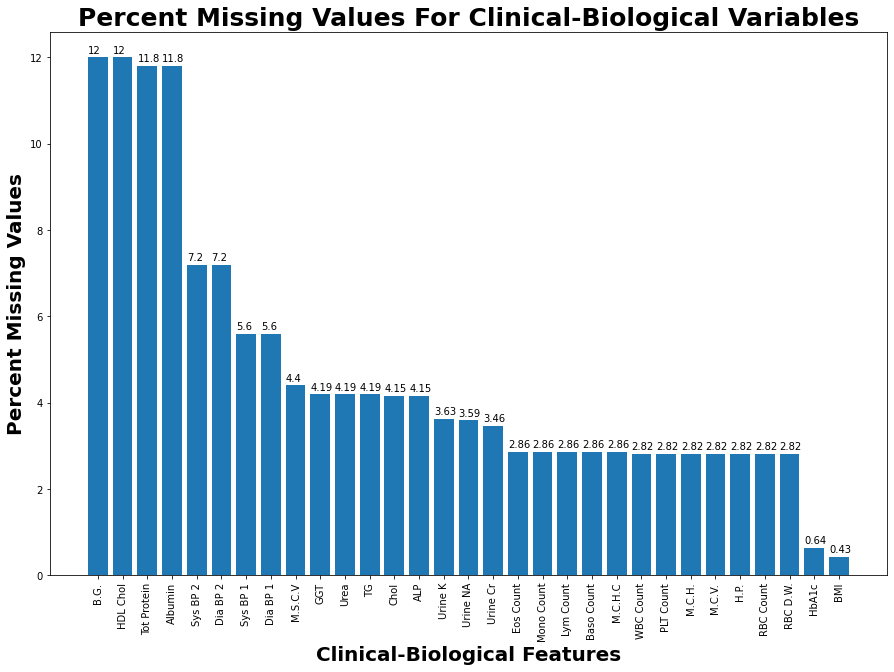

In [545]:
cb_features = ['B.G.', 'HDL Chol', 'Tot Protein', 'Albumin', 'Sys BP 2', 'Dia BP 2', 'Sys BP 1', 'Dia BP 1', 'M.S.C.V', 'GGT', 'Urea', 'TG', 'Chol', 'ALP', 'Urine K', 'Urine NA', 'Urine Cr', 'Eos Count', 'Mono Count', 'Lym Count', 'Baso Count', 'M.C.H.C', 'WBC Count', 'PLT Count', 'M.C.H.', 'M.C.V.', 'H.P.', 'RBC Count', 'RBC D.W.', 'HbA1c', 'BMI']
nan_values = [12, 12, 11.8, 11.8, 7.20, 7.20, 5.60, 5.60, 4.40, 4.19, 4.19, 4.19, 4.15, 4.15, 3.63, 3.59, 3.46, 2.86, 2.86, 2.86, 2.86, 2.86, 2.82, 2.82, 2.82, 2.82, 2.82, 2.82, 2.82, 0.64, 0.43]


plt.figure(figsize=(15,10))
for i, v in enumerate(nan_values):
    plt.text(i - 0.4, v + 0.1, str(v), fontsize = 10)
plt.bar(cb_features, nan_values)
plt.title('Percent Missing Values For Clinical-Biological Variables', fontsize = 25, fontweight = 'bold')
plt.xlabel('Clinical-Biological Features', fontsize = 20, fontweight = 'bold')
plt.xticks(rotation = 90)
plt.ylabel('Percent Missing Values', fontsize = 20, fontweight = 'bold')

plt.show()
# Sex, Age, and Race are all filled

Below we change the name to traditional risk factors.

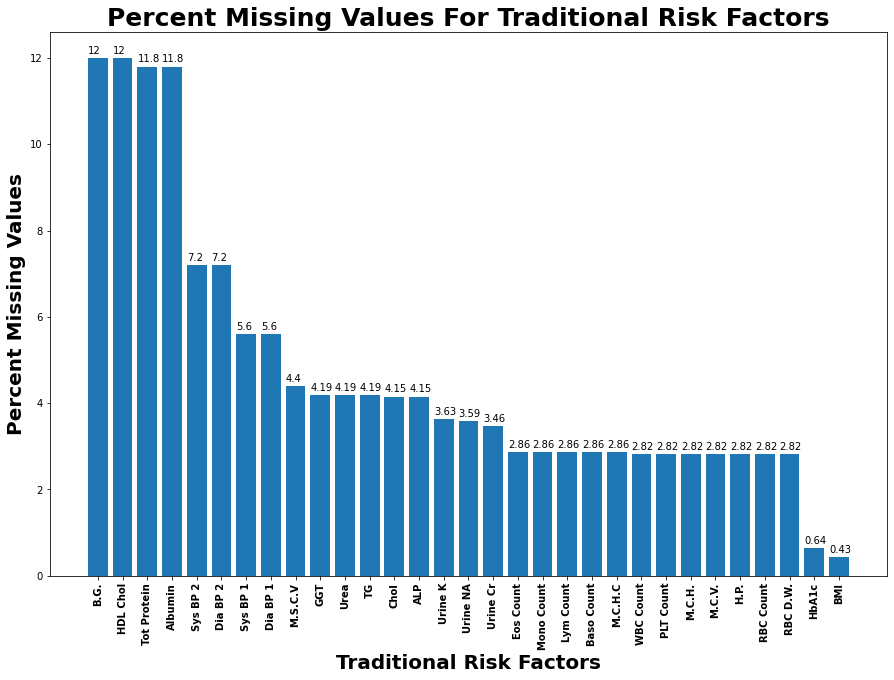

In [546]:
cb_features = ['B.G.', 'HDL Chol', 'Tot Protein', 'Albumin', 'Sys BP 2', 'Dia BP 2', 'Sys BP 1', 'Dia BP 1', 'M.S.C.V', 'GGT', 'Urea', 'TG', 'Chol', 'ALP', 'Urine K', 'Urine NA', 'Urine Cr', 'Eos Count', 'Mono Count', 'Lym Count', 'Baso Count', 'M.C.H.C', 'WBC Count', 'PLT Count', 'M.C.H.', 'M.C.V.', 'H.P.', 'RBC Count', 'RBC D.W.', 'HbA1c', 'BMI']
nan_values = [12, 12, 11.8, 11.8, 7.20, 7.20, 5.60, 5.60, 4.40, 4.19, 4.19, 4.19, 4.15, 4.15, 3.63, 3.59, 3.46, 2.86, 2.86, 2.86, 2.86, 2.86, 2.82, 2.82, 2.82, 2.82, 2.82, 2.82, 2.82, 0.64, 0.43]


plt.figure(figsize=(15,10))
for i, v in enumerate(nan_values):
    plt.text(i - 0.4, v + 0.1, str(v), fontsize = 10)
plt.bar(cb_features, nan_values)
plt.title('Percent Missing Values For Traditional Risk Factors', fontsize = 25, fontweight = 'bold')
plt.xlabel('Traditional Risk Factors', fontsize = 20, fontweight = 'bold')
plt.xticks(rotation = 90, fontweight = 'bold')
plt.ylabel('Percent Missing Values', fontsize = 20, fontweight = 'bold')

plt.show()
# Sex, Age, and Race are all filled

Below we make a heatmap for the numerical features sorted by the labels on the lefthand side.

<AxesSubplot:>

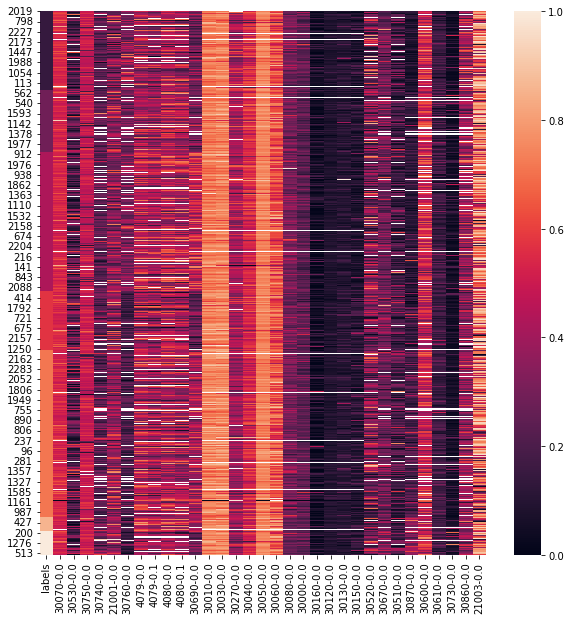

In [547]:
plt.figure(figsize=(10,10))
cb_features_with_metabolomic_labels_normalized_with_labels_normalized = cb_features_with_metabolomic_labels_normalized.drop_duplicates()
cb_features_with_metabolomic_labels_normalized_with_labels_normalized['labels'] = cb_features_with_metabolomic_labels_normalized_with_labels_normalized['labels']/7
sns.heatmap(cb_features_with_metabolomic_labels_normalized_with_labels_normalized.sort_values(by = 'labels').drop(columns = ['eid', '31-0.0', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']))

Below we make the same heatmap as above but with the target column as well.

<AxesSubplot:>

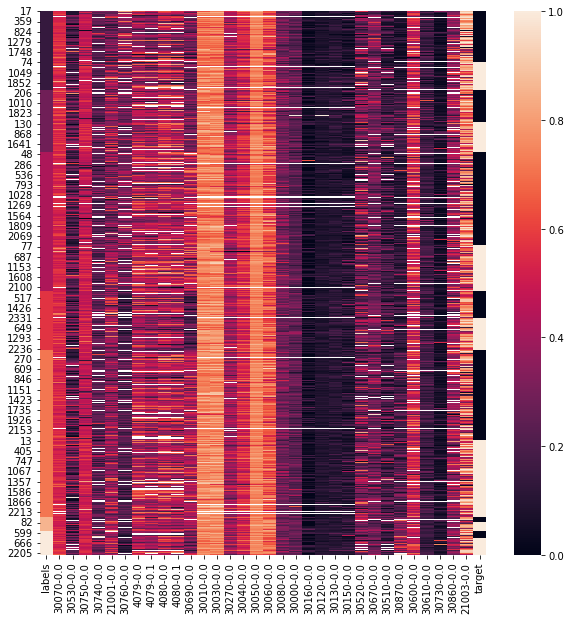

In [548]:
plt.figure(figsize=(10,10))
cb_features_with_metabolomic_labels_normalized_with_labels_normalized_with_target = cb_features_with_metabolomic_labels_normalized_with_labels_normalized.merge(final_classified_patients, on = 'eid', how = 'left')

sns.heatmap(cb_features_with_metabolomic_labels_normalized_with_labels_normalized_with_target.sort_values(by = ['labels', 'target']).drop(columns = ['eid', '31-0.0', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']))

Below we merge the clinical-biological features with the clusters.

In [549]:
cluster_1_cb_features = cluster_1[['eid']].merge(prediabetes_with_features_from_literature_to_keep, on = 'eid')
cluster_2_cb_features = cluster_2[['eid']].merge(prediabetes_with_features_from_literature_to_keep, on = 'eid')
cluster_3_cb_features = cluster_3[['eid']].merge(prediabetes_with_features_from_literature_to_keep, on = 'eid')
cluster_4_cb_features = cluster_4[['eid']].merge(prediabetes_with_features_from_literature_to_keep, on = 'eid')
cluster_5_cb_features = cluster_5[['eid']].merge(prediabetes_with_features_from_literature_to_keep, on = 'eid')
cluster_6_cb_features = cluster_6[['eid']].merge(prediabetes_with_features_from_literature_to_keep, on = 'eid')
cluster_7_cb_features = cluster_7[['eid']].merge(prediabetes_with_features_from_literature_to_keep, on = 'eid')

Below we find the means of all clinical-biological features for all groups. 

In [550]:
for col in cluster_1_cb_features.columns:
    print('Mean for group 1', col, 'is:', cluster_1_cb_features[col].mean())
    print('Mean for group 2', col, 'is:', cluster_2_cb_features[col].mean())
    print('Mean for group 3', col, 'is:', cluster_3_cb_features[col].mean())
    print('Mean for group 4', col, 'is:', cluster_4_cb_features[col].mean())
    print('Mean for group 5', col, 'is:', cluster_5_cb_features[col].mean())
    print('Mean for group 6', col, 'is:', cluster_6_cb_features[col].mean())
    print('Mean for group 7', col, 'is:', cluster_7_cb_features[col].mean())

Mean for group 1 eid is: 3528965.1173020527
Mean for group 2 eid is: 3407979.545112782
Mean for group 3 eid is: 3494673.797996661
Mean for group 4 eid is: 3376429.756
Mean for group 5 eid is: 3498905.7271468146
Mean for group 6 eid is: 3180803.7666666666
Mean for group 7 eid is: 3739951.8613861385
Mean for group 1 30070-0.0 is: 13.941752265861025
Mean for group 2 30070-0.0 is: 13.820581395348839
Mean for group 3 30070-0.0 is: 13.881421232876715
Mean for group 4 30070-0.0 is: 13.8904938271605
Mean for group 5 30070-0.0 is: 13.739512893982788
Mean for group 6 30070-0.0 is: 13.45327586206896
Mean for group 7 30070-0.0 is: 13.650594059405933
Mean for group 1 30530-0.0 is: 76.56422018348623
Mean for group 2 30530-0.0 is: 92.49302325581398
Mean for group 3 30530-0.0 is: 82.40313043478258
Mean for group 4 30530-0.0 is: 94.21265306122447
Mean for group 5 30530-0.0 is: 91.6296402877698
Mean for group 6 30530-0.0 is: 80.00862068965519
Mean for group 7 30530-0.0 is: 95.45979381443301
Mean for gro

Mean for group 2 30150-0.0 is: 0.2008527131782947
Mean for group 3 30150-0.0 is: 0.17669520547945197
Mean for group 4 30150-0.0 is: 0.2108641975308644
Mean for group 5 30150-0.0 is: 0.19721664275466258
Mean for group 6 30150-0.0 is: 0.22120689655172415
Mean for group 7 30150-0.0 is: 0.22970297029702968
Mean for group 1 30520-0.0 is: 62.07392638036815
Mean for group 2 30520-0.0 is: 67.32432432432432
Mean for group 3 30520-0.0 is: 63.83008726003493
Mean for group 4 30520-0.0 is: 69.72816326530612
Mean for group 5 30520-0.0 is: 64.90402298850567
Mean for group 6 30520-0.0 is: 62.50172413793103
Mean for group 7 30520-0.0 is: 67.27113402061856
Mean for group 1 30670-0.0 is: 5.6734954407294875
Mean for group 2 30670-0.0 is: 5.821111111111105
Mean for group 3 30670-0.0 is: 5.425470383275265
Mean for group 4 30670-0.0 is: 5.762098765432096
Mean for group 5 30670-0.0 is: 5.532125181950509
Mean for group 6 30670-0.0 is: 5.291071428571426
Mean for group 7 30670-0.0 is: 5.791400000000002
Mean for 

Below we find the standard deviation of ages for all groups.

In [551]:
for col in cluster_1_cb_features.columns:
    print('Mean for group 1', col, 'is:', np.std(cluster_1_cb_features[col]))
    print('Mean for group 2', col, 'is:', np.std(cluster_2_cb_features[col]))
    print('Mean for group 3', col, 'is:', np.std(cluster_3_cb_features[col]))
    print('Mean for group 4', col, 'is:', np.std(cluster_4_cb_features[col]))
    print('Mean for group 5', col, 'is:', np.std(cluster_5_cb_features[col]))
    print('Mean for group 6', col, 'is:', np.std(cluster_6_cb_features[col]))
    print('Mean for group 7', col, 'is:', np.std(cluster_7_cb_features[col]))

Mean for group 1 eid is: 1489251.0074550868
Mean for group 2 eid is: 1471422.65957767
Mean for group 3 eid is: 1442753.0975353324
Mean for group 4 eid is: 1526469.6171715227
Mean for group 5 eid is: 1489796.9070521137
Mean for group 6 eid is: 1456671.0747282805
Mean for group 7 eid is: 1409786.5860029955
Mean for group 1 30070-0.0 is: 1.0903398728495994
Mean for group 2 30070-0.0 is: 1.1946833332019873
Mean for group 3 30070-0.0 is: 1.217838670777996
Mean for group 4 30070-0.0 is: 1.1102436256957797
Mean for group 5 30070-0.0 is: 1.1518551340484375
Mean for group 6 30070-0.0 is: 0.8809172099560045
Mean for group 7 30070-0.0 is: 1.0085533427207627
Mean for group 1 30530-0.0 is: 42.3955240906867
Mean for group 2 30530-0.0 is: 50.599934408828574
Mean for group 3 30530-0.0 is: 44.877631774400044
Mean for group 4 30530-0.0 is: 49.26355074227575
Mean for group 5 30530-0.0 is: 47.372480695111776
Mean for group 6 30530-0.0 is: 45.41407302953552
Mean for group 7 30530-0.0 is: 52.38617835299418


Mean for group 3 30860-0.0 is: 4.453981055144609
Mean for group 4 30860-0.0 is: 4.251957376088284
Mean for group 5 30860-0.0 is: 4.279619065999606
Mean for group 6 30860-0.0 is: 4.015972689150168
Mean for group 7 30860-0.0 is: 4.031115920197035
Mean for group 1 21003-0.0 is: 6.539525005271474
Mean for group 2 21003-0.0 is: 5.887766565253332
Mean for group 3 21003-0.0 is: 6.937352220677222
Mean for group 4 21003-0.0 is: 6.790294249883432
Mean for group 5 21003-0.0 is: 7.417057735491588
Mean for group 6 21003-0.0 is: 7.570318502032938
Mean for group 7 21003-0.0 is: 6.694211631383377
Mean for group 1 Ethnicity_0 is: 0.32177986450076723
Mean for group 2 Ethnicity_0 is: 0.29180779504248167
Mean for group 3 Ethnicity_0 is: 0.3328364016895676
Mean for group 4 Ethnicity_0 is: 0.30526054445342266
Mean for group 5 Ethnicity_0 is: 0.30510236526192086
Mean for group 6 Ethnicity_0 is: 0.2179449471770337
Mean for group 7 Ethnicity_0 is: 0.33488187178787643
Mean for group 1 Ethnicity_1 is: 0.22360583

<a class="anchor" id="Stat_testing_cb"></a>

# Statistical Testing Using Clinical-Biological Features

# Cluster 1

Below we look at a one-vs-all t-test comparison between cluster 1 and the rest of the data. To do this, we create a dataframe for all patients not in cluster 1 for comparison.

In [552]:
not_cluster_1_cb_features = cluster_2_cb_features.append([cluster_3_cb_features, cluster_4_cb_features, cluster_5_cb_features, cluster_6_cb_features, cluster_7_cb_features])
not_cluster_1_cb_features

Below we run Levene's test on all standard deviations. Notice that we need to add notnull() for this to work since Levene's test assumes all values are full. We create two lists which contain the values which are or are not statistically significant as a reuslt of Levene's test. We need to do this so that we can run different types of independent t tests depending on the results.

In [553]:
from scipy.stats import levene

equal_variance = []
unequal_variance = []

for i in cluster_1_cb_features.drop(columns = ['eid', '31-0.0', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']):
    filtered_df = cluster_1_cb_features[cluster_1_cb_features[i].notnull()]
    filtered_df2 = not_cluster_1_cb_features[not_cluster_1_cb_features[i].notnull()]
    stat, pval = levene(filtered_df[i], filtered_df2[i])
    if pval < 0.05:
        unequal_variance.append(i)
    else:
        equal_variance.append(i)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (stat, pval))


Statistic and pval for Column 30750-0.0: stat=0.464 pval=0.496
Statistic and pval for Column 30740-0.0: stat=0.819 pval=0.365
Statistic and pval for Column 21001-0.0: stat=0.607 pval=0.436
Statistic and pval for Column 30760-0.0: stat=48.933 pval=0.000
Statistic and pval for Column 4079-0.0: stat=0.666 pval=0.415
Statistic and pval for Column 4079-0.1: stat=0.023 pval=0.880
Statistic and pval for Column 4080-0.0: stat=3.585 pval=0.058
Statistic and pval for Column 4080-0.1: stat=4.283 pval=0.039
Statistic and pval for Column 30690-0.0: stat=46.063 pval=0.000
Statistic and pval for Column 30010-0.0: stat=0.335 pval=0.563
Statistic and pval for Column 30030-0.0: stat=1.046 pval=0.307
Statistic and pval for Column 30270-0.0: stat=2.496 pval=0.114
Statistic and pval for Column 30040-0.0: stat=0.158 pval=0.691
Statistic and pval for Column 30050-0.0: stat=0.000 pval=0.990
Statistic and pval for Column 30060-0.0: stat=0.568 pval=0.451
Statistic and pval for Column 30080-0.0: stat=2.840 pval=

Below we run our statistical tests for all columns that have been shown to not have unequal variances (statistically speaking).

In [554]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_1_cb_features[i], not_cluster_1_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column 30070-0.0: stat=2.087 pval=0.037
Statistic and pval for Column 30750-0.0: stat=-3.687 pval=0.000
Statistic and pval for Column 30740-0.0: stat=-0.453 pval=0.651
Statistic and pval for Column 21001-0.0: stat=-5.839 pval=0.000
Statistic and pval for Column 4079-0.0: stat=-6.548 pval=0.000
Statistic and pval for Column 4079-0.1: stat=-6.448 pval=0.000
Statistic and pval for Column 4080-0.0: stat=-2.063 pval=0.039
Statistic and pval for Column 30010-0.0: stat=-6.042 pval=0.000
Statistic and pval for Column 30030-0.0: stat=-5.352 pval=0.000
Statistic and pval for Column 30270-0.0: stat=3.749 pval=0.000
Statistic and pval for Column 30040-0.0: stat=1.264 pval=0.206
Statistic and pval for Column 30050-0.0: stat=-0.142 pval=0.887
Statistic and pval for Column 30060-0.0: stat=-3.206 pval=0.001
Statistic and pval for Column 30080-0.0: stat=-1.695 pval=0.090
Statistic and pval for Column 30000-0.0: stat=-0.868 pval=0.385
Statistic and pval for Column 30160-0.0: stat=

Below we run our statistical independent t tests for all columns that have been shown to have statistically unequal variances.

In [555]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_1_cb_features[i], not_cluster_1_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column 30530-0.0: stat=-4.868 pval=0.000
Statistic and pval for Column 30760-0.0: stat=14.529 pval=0.000
Statistic and pval for Column 4080-0.1: stat=-3.203 pval=0.001
Statistic and pval for Column 30690-0.0: stat=-17.174 pval=0.000
Statistic and pval for Column 30870-0.0: stat=-25.844 pval=0.000
Statistic and pval for Column 21003-0.0: stat=5.957 pval=0.000


Below we account for multiple testing correction by multiplying the p-values by the number of numerical features (32)

In [556]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_1_cb_features[i], not_cluster_1_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*32))

Statistic and pval for Column 30070-0.0: stat=2.087 pval=1.185
Statistic and pval for Column 30750-0.0: stat=-3.687 pval=0.007
Statistic and pval for Column 30740-0.0: stat=-0.453 pval=20.821
Statistic and pval for Column 21001-0.0: stat=-5.839 pval=0.000
Statistic and pval for Column 4079-0.0: stat=-6.548 pval=0.000
Statistic and pval for Column 4079-0.1: stat=-6.448 pval=0.000
Statistic and pval for Column 4080-0.0: stat=-2.063 pval=1.256
Statistic and pval for Column 30010-0.0: stat=-6.042 pval=0.000
Statistic and pval for Column 30030-0.0: stat=-5.352 pval=0.000
Statistic and pval for Column 30270-0.0: stat=3.749 pval=0.006
Statistic and pval for Column 30040-0.0: stat=1.264 pval=6.600
Statistic and pval for Column 30050-0.0: stat=-0.142 pval=28.381
Statistic and pval for Column 30060-0.0: stat=-3.206 pval=0.044
Statistic and pval for Column 30080-0.0: stat=-1.695 pval=2.888
Statistic and pval for Column 30000-0.0: stat=-0.868 pval=12.327
Statistic and pval for Column 30160-0.0: st

In [557]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_1_cb_features[i], not_cluster_1_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*32))

Statistic and pval for Column 30530-0.0: stat=-4.868 pval=0.000
Statistic and pval for Column 30760-0.0: stat=14.529 pval=0.000
Statistic and pval for Column 4080-0.1: stat=-3.203 pval=0.047
Statistic and pval for Column 30690-0.0: stat=-17.174 pval=0.000
Statistic and pval for Column 30870-0.0: stat=-25.844 pval=0.000
Statistic and pval for Column 21003-0.0: stat=5.957 pval=0.000


Below we account for multiple testing correction FOR ALL T-TESTS IN TOTAL ACROSS ALL CLUSTER TESTING by multiplying the p-values by the number of features*number of tests = 7 (224)

In [558]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_1_cb_features[i], not_cluster_1_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))

Statistic and pval for Column 30070-0.0: stat=2.087 pval=8.292
Statistic and pval for Column 30750-0.0: stat=-3.687 pval=0.052
Statistic and pval for Column 30740-0.0: stat=-0.453 pval=145.747
Statistic and pval for Column 21001-0.0: stat=-5.839 pval=0.000
Statistic and pval for Column 4079-0.0: stat=-6.548 pval=0.000
Statistic and pval for Column 4079-0.1: stat=-6.448 pval=0.000
Statistic and pval for Column 4080-0.0: stat=-2.063 pval=8.793
Statistic and pval for Column 30010-0.0: stat=-6.042 pval=0.000
Statistic and pval for Column 30030-0.0: stat=-5.352 pval=0.000
Statistic and pval for Column 30270-0.0: stat=3.749 pval=0.041
Statistic and pval for Column 30040-0.0: stat=1.264 pval=46.202
Statistic and pval for Column 30050-0.0: stat=-0.142 pval=198.670
Statistic and pval for Column 30060-0.0: stat=-3.206 pval=0.306
Statistic and pval for Column 30080-0.0: stat=-1.695 pval=20.219
Statistic and pval for Column 30000-0.0: stat=-0.868 pval=86.292
Statistic and pval for Column 30160-0.0

In [559]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_1_cb_features[i], not_cluster_1_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))

Statistic and pval for Column 30530-0.0: stat=-4.868 pval=0.000
Statistic and pval for Column 30760-0.0: stat=14.529 pval=0.000
Statistic and pval for Column 4080-0.1: stat=-3.203 pval=0.328
Statistic and pval for Column 30690-0.0: stat=-17.174 pval=0.000
Statistic and pval for Column 30870-0.0: stat=-25.844 pval=0.000
Statistic and pval for Column 21003-0.0: stat=5.957 pval=0.000


## Below we show the significant features for Cluster 1 (using the 224 test Bonferroni corection) and indicate if the expression is higher or lower than the rest of the data:

1. 21001 - BMI - Lower
2. 4079 (both reading 1 and reading 2) - Diastolic Blood Pressure - Lower
3. 30010 - Red blood cell (erythrocyte) count - Lower
4. 30030 - Haematocrit percentage - Lower
5. 30270 - Mean sphered cell volume - Higher
6. 30530 - Sodium in urine - Lower
7. 30760 - HDL Cholesterol - Higher
8. 30690 - Cholesterol - Lower
9. 30870 - Triglycerides - Lower
10. 21003 - Age - Higher

## Below we account for the direction of differentiation as well as the significance of the p-values. We create a list of significantly overexpressed and underexpressed clinical-biological features for cluster 1.

In [560]:
from scipy.stats import ttest_ind

significant_features_equal_c1_cb = []
underexpressed_features_equal_c1_cb  = []
overexpressed_features_equal_c1_cb  = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_1_cb_features[i], not_cluster_1_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))
    if t_pval*224 < 0.05:
        significant_features_equal_c1_cb.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_equal_c1_cb.append(i)
        else:
            overexpressed_features_equal_c1_cb.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column 30070-0.0: stat=2.087 pval=8.292
NOT SIGNIFICANT
Statistic and pval for Column 30750-0.0: stat=-3.687 pval=0.052
NOT SIGNIFICANT
Statistic and pval for Column 30740-0.0: stat=-0.453 pval=145.747
NOT SIGNIFICANT
Statistic and pval for Column 21001-0.0: stat=-5.839 pval=0.000
SIGNIFICANT
Statistic and pval for Column 4079-0.0: stat=-6.548 pval=0.000
SIGNIFICANT
Statistic and pval for Column 4079-0.1: stat=-6.448 pval=0.000
SIGNIFICANT
Statistic and pval for Column 4080-0.0: stat=-2.063 pval=8.793
NOT SIGNIFICANT
Statistic and pval for Column 30010-0.0: stat=-6.042 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30030-0.0: stat=-5.352 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30270-0.0: stat=3.749 pval=0.041
SIGNIFICANT
Statistic and pval for Column 30040-0.0: stat=1.264 pval=46.202
NOT SIGNIFICANT
Statistic and pval for Column 30050-0.0: stat=-0.142 pval=198.670
NOT SIGNIFICANT
Statistic and pval for Column 30060-0.0: stat=-3.206 pval=0.306
N

In [561]:
from scipy.stats import ttest_ind

significant_features_unequal_c1_cb = []
underexpressed_features_unequal_c1_cb = []
overexpressed_features_unequal_c1_cb = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_1_cb_features[i], not_cluster_1_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))
    if t_pval*224 < 0.05:
        significant_features_unequal_c1_cb.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_unequal_c1_cb.append(i)
        else:
            overexpressed_features_unequal_c1_cb.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column 30530-0.0: stat=-4.868 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30760-0.0: stat=14.529 pval=0.000
SIGNIFICANT
Statistic and pval for Column 4080-0.1: stat=-3.203 pval=0.328
NOT SIGNIFICANT
Statistic and pval for Column 30690-0.0: stat=-17.174 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30870-0.0: stat=-25.844 pval=0.000
SIGNIFICANT
Statistic and pval for Column 21003-0.0: stat=5.957 pval=0.000
SIGNIFICANT


Below we create a list of significant features for cluster 1 underexpressed and overexpressed features.

In [562]:
sig_metabolites_underexpressed_c1_cb = underexpressed_features_equal_c1_cb + underexpressed_features_unequal_c1_cb
print(len(sig_metabolites_underexpressed_c1_cb))
sig_metabolites_overexpressed_c1_cb = overexpressed_features_equal_c1_cb + overexpressed_features_unequal_c1_cb
print(len(sig_metabolites_overexpressed_c1_cb))

8
3


Below we combine these to find the total number of significant clinical-biological features.

In [563]:
total_significant_cb_features_c1 = sig_metabolites_underexpressed_c1_cb + sig_metabolites_overexpressed_c1_cb
total_significant_cb_features_c1

['21001-0.0',
 '4079-0.0',
 '4079-0.1',
 '30010-0.0',
 '30030-0.0',
 '30530-0.0',
 '30690-0.0',
 '30870-0.0',
 '30270-0.0',
 '30760-0.0',
 '21003-0.0']

Below we test if sex is different between group 1 and all other groups. The code is implemented from https://machinelearningmastery.com/chi-squared-test-for-machine-learning/

In [564]:
# Make contigency table comparing group 1 and other group number of males and females
table = [[len(cluster_1_cb_features[cluster_1_cb_features['31-0.0'] == 0]), len(not_cluster_1_cb_features[not_cluster_1_cb_features['31-0.0'] == 0])],
         [len(cluster_1_cb_features[cluster_1_cb_features['31-0.0'] == 1]),  len(not_cluster_1_cb_features[not_cluster_1_cb_features['31-0.0'] == 1])]]
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.5f' % (alpha, p*7)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p*7 <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')


[[208, 951], [133, 1047]]
dof=1
[[ 168.96921761  990.03078239]
 [ 172.03078239 1007.96921761]]
probability=0.950, critical=3.841, stat=20.389
Dependent (reject H0)
significance=0.050, p=0.00004
Dependent (reject H0)


# Cluster 2

Below we look at a one-vs-all t-test comparison between cluster 2 and the rest of the data. To do this, we create a dataframe for all patients not in cluster 2 for comparison.

In [565]:
not_cluster_2_cb_features = cluster_1_cb_features.append([cluster_3_cb_features, cluster_4_cb_features, cluster_5_cb_features, cluster_6_cb_features, cluster_7_cb_features])
not_cluster_2_cb_features

,eid,30070-0.0,30530-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5
0,3758501,14.99,57.8,45.3,5.222,40.7632,1.847,74.0,74.0,126.0,128.0,6.116,0,4.300,35.80,80.36,83.25,27.48,33.01,254.0,8.02,0.05,1.44,0.26,0.05,33.4,4.00,2947.0,1.185,41.62,93.7,24.9,72.14,52,1,0,0,0,0,0
1,1151556,14.80,158.6,43.6,4.775,32.4557,1.946,NaN,NaN,NaN,NaN,5.975,0,4.000,36.10,87.00,90.20,29.60,32.80,269.0,6.80,0.20,2.80,0.40,0.30,79.4,6.40,14651.0,1.669,43.39,120.8,51.3,74.87,69,1,0,0,0,0,0
2,3175850,12.70,58.7,45.0,NaN,26.8459,NaN,77.0,82.0,139.0,131.0,NaN,1,4.611,41.94,83.79,90.96,31.33,34.44,286.4,5.57,0.07,2.31,0.42,0.20,22.0,NaN,2769.0,NaN,NaN,NaN,NaN,NaN,53,0,1,0,0,0,0
3,1454587,13.39,38.1,38.2,6.344,27.6545,2.834,95.0,92.0,168.0,154.0,5.732,0,3.964,40.69,89.29,102.60,35.06,34.16,242.6,8.49,0.03,0.98,0.68,0.24,106.5,5.11,9423.0,1.253,45.33,72.0,190.4,68.83,67,1,0,0,0,0,0
4,3142636,12.22,97.9,32.6,5.626,29.4810,1.668,93.0,88.0,171.0,172.0,6.033,1,4.600,44.49,83.40,96.72,33.90,35.05,253.2,9.22,0.07,1.71,0.58,0.13,51.3,7.04,5885.0,2.216,47.02,393.1,147.8,74.29,60,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,5563083,13.60,27.6,42.9,5.279,28.9807,1.067,73.0,72.0,134.0,134.0,4.841,0,4.410,37.80,83.00,85.80,29.90,34.80,287.0,8.00,0.10,2.30,0.40,0.30,43.7,6.08,3066.0,3.372,41.29,103.2,30.8,71.77,69,1,0,0,0,0,0
97,3734514,12.60,111.5,42.4,5.475,30.2663,0.995,93.0,87.0,183.0,170.0,4.043,1,4.821,43.84,76.91,90.92,31.66,34.82,230.2,9.63,0.02,3.00,0.86,0.13,47.1,6.45,7870.0,2.901,47.34,99.7,57.3,76.84,66,1,0,0,0,0,0
98,4435584,14.10,NaN,42.1,6.118,30.8471,0.865,66.0,63.0,138.0,142.0,4.165,1,4.900,42.90,74.40,87.70,29.90,34.10,177.0,8.30,0.00,2.40,0.40,0.20,NaN,5.52,NaN,4.877,41.80,152.7,54.7,66.71,69,1,0,0,0,0,0
99,2397790,16.07,62.4,43.4,5.875,32.6938,1.019,91.0,88.0,147.0,125.0,7.149,0,4.621,35.73,71.57,77.33,26.03,33.66,228.7,7.86,0.03,3.12,0.48,0.11,39.1,7.54,6398.0,10.392,44.96,100.1,58.1,69.36,53,1,0,0,0,0,0


Below we run Levene's test on all standard deviations. Notice that we need to add notnull() for this to work since Levene's test assumes all values are full. We create two lists which contain the values which are or are not statistically significant as a reuslt of Levene's test. We need to do this so that we can run different types of independent t tests depending on the results.

In [566]:
from scipy.stats import levene

equal_variance = []
unequal_variance = []

for i in cluster_2_cb_features.drop(columns = ['eid', '31-0.0', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']):
    filtered_df = cluster_2_cb_features[cluster_2_cb_features[i].notnull()]
    filtered_df2 = not_cluster_2_cb_features[not_cluster_2_cb_features[i].notnull()]
    stat, pval = levene(filtered_df[i], filtered_df2[i])
    if pval < 0.05:
        unequal_variance.append(i)
    else:
        equal_variance.append(i)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (stat, pval))


Statistic and pval for Column 30070-0.0: stat=0.285 pval=0.594
Statistic and pval for Column 30530-0.0: stat=0.291 pval=0.590
Statistic and pval for Column 30750-0.0: stat=0.053 pval=0.819
Statistic and pval for Column 30740-0.0: stat=1.363 pval=0.243
Statistic and pval for Column 21001-0.0: stat=0.479 pval=0.489
Statistic and pval for Column 30760-0.0: stat=26.854 pval=0.000
Statistic and pval for Column 4079-0.0: stat=1.330 pval=0.249
Statistic and pval for Column 4079-0.1: stat=0.392 pval=0.532
Statistic and pval for Column 4080-0.0: stat=0.951 pval=0.330
Statistic and pval for Column 4080-0.1: stat=0.579 pval=0.447
Statistic and pval for Column 30690-0.0: stat=85.229 pval=0.000
Statistic and pval for Column 30010-0.0: stat=0.390 pval=0.532
Statistic and pval for Column 30030-0.0: stat=2.234 pval=0.135
Statistic and pval for Column 30270-0.0: stat=0.032 pval=0.857
Statistic and pval for Column 30040-0.0: stat=0.897 pval=0.344
Statistic and pval for Column 30050-0.0: stat=0.683 pval=

Below we run our statistical tests for all columns that have been shown to not have unequal variances (statistically speaking).

In [567]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_2_cb_features[i], not_cluster_2_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column 30070-0.0: stat=0.016 pval=0.987
Statistic and pval for Column 30530-0.0: stat=1.862 pval=0.063
Statistic and pval for Column 30750-0.0: stat=2.063 pval=0.039
Statistic and pval for Column 30740-0.0: stat=-0.738 pval=0.461
Statistic and pval for Column 21001-0.0: stat=1.430 pval=0.153
Statistic and pval for Column 4079-0.0: stat=-0.940 pval=0.347
Statistic and pval for Column 4079-0.1: stat=-0.939 pval=0.348
Statistic and pval for Column 4080-0.0: stat=1.332 pval=0.183
Statistic and pval for Column 4080-0.1: stat=0.481 pval=0.631
Statistic and pval for Column 30010-0.0: stat=-1.809 pval=0.071
Statistic and pval for Column 30030-0.0: stat=-1.470 pval=0.142
Statistic and pval for Column 30270-0.0: stat=-0.280 pval=0.779
Statistic and pval for Column 30040-0.0: stat=0.742 pval=0.458
Statistic and pval for Column 30050-0.0: stat=0.876 pval=0.381
Statistic and pval for Column 30060-0.0: stat=0.336 pval=0.737
Statistic and pval for Column 30080-0.0: stat=0.465 p

Below we run our statistical independent t tests for all columns that have been shown to have statistically unequal variances.

In [568]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_2_cb_features[i], not_cluster_2_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column 30760-0.0: stat=3.402 pval=0.001
Statistic and pval for Column 30690-0.0: stat=-15.066 pval=0.000
Statistic and pval for Column 30870-0.0: stat=-0.018 pval=0.986
Statistic and pval for Column 30610-0.0: stat=0.345 pval=0.730
Statistic and pval for Column 21003-0.0: stat=4.491 pval=0.000


Below we account for multiple testing correction by multiplying the p-values by the number of numerical features (32)

In [569]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_2_cb_features[i], not_cluster_2_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*32))

Statistic and pval for Column 30070-0.0: stat=0.016 pval=31.596
Statistic and pval for Column 30530-0.0: stat=1.862 pval=2.007
Statistic and pval for Column 30750-0.0: stat=2.063 pval=1.256
Statistic and pval for Column 30740-0.0: stat=-0.738 pval=14.749
Statistic and pval for Column 21001-0.0: stat=1.430 pval=4.887
Statistic and pval for Column 4079-0.0: stat=-0.940 pval=11.108
Statistic and pval for Column 4079-0.1: stat=-0.939 pval=11.131
Statistic and pval for Column 4080-0.0: stat=1.332 pval=5.858
Statistic and pval for Column 4080-0.1: stat=0.481 pval=20.188
Statistic and pval for Column 30010-0.0: stat=-1.809 pval=2.259
Statistic and pval for Column 30030-0.0: stat=-1.470 pval=4.538
Statistic and pval for Column 30270-0.0: stat=-0.280 pval=24.936
Statistic and pval for Column 30040-0.0: stat=0.742 pval=14.654
Statistic and pval for Column 30050-0.0: stat=0.876 pval=12.192
Statistic and pval for Column 30060-0.0: stat=0.336 pval=23.587
Statistic and pval for Column 30080-0.0: sta

In [570]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_2_cb_features[i], not_cluster_2_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*32))

Statistic and pval for Column 30760-0.0: stat=3.402 pval=0.024
Statistic and pval for Column 30690-0.0: stat=-15.066 pval=0.000
Statistic and pval for Column 30870-0.0: stat=-0.018 pval=31.550
Statistic and pval for Column 30610-0.0: stat=0.345 pval=23.370
Statistic and pval for Column 21003-0.0: stat=4.491 pval=0.000


Below we account for multiple testing correction FOR ALL T-TESTS IN TOTAL ACROSS ALL CLUSTER TESTING by multiplying the p-values by the number of features*number of tests = 7 (224)

In [571]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_2_cb_features[i], not_cluster_2_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))

Statistic and pval for Column 30070-0.0: stat=0.016 pval=221.174
Statistic and pval for Column 30530-0.0: stat=1.862 pval=14.050
Statistic and pval for Column 30750-0.0: stat=2.063 pval=8.794
Statistic and pval for Column 30740-0.0: stat=-0.738 pval=103.242
Statistic and pval for Column 21001-0.0: stat=1.430 pval=34.208
Statistic and pval for Column 4079-0.0: stat=-0.940 pval=77.754
Statistic and pval for Column 4079-0.1: stat=-0.939 pval=77.916
Statistic and pval for Column 4080-0.0: stat=1.332 pval=41.007
Statistic and pval for Column 4080-0.1: stat=0.481 pval=141.315
Statistic and pval for Column 30010-0.0: stat=-1.809 pval=15.815
Statistic and pval for Column 30030-0.0: stat=-1.470 pval=31.764
Statistic and pval for Column 30270-0.0: stat=-0.280 pval=174.553
Statistic and pval for Column 30040-0.0: stat=0.742 pval=102.579
Statistic and pval for Column 30050-0.0: stat=0.876 pval=85.345
Statistic and pval for Column 30060-0.0: stat=0.336 pval=165.106
Statistic and pval for Column 300

In [572]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_2_cb_features[i], not_cluster_2_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))

Statistic and pval for Column 30760-0.0: stat=3.402 pval=0.167
Statistic and pval for Column 30690-0.0: stat=-15.066 pval=0.000
Statistic and pval for Column 30870-0.0: stat=-0.018 pval=220.849
Statistic and pval for Column 30610-0.0: stat=0.345 pval=163.587
Statistic and pval for Column 21003-0.0: stat=4.491 pval=0.002


## Below we show the significant features for Cluster 2 (using the 224 test Bonferroni corection) and indicate if the expression is higher or lower than the rest of the data:

1. 30690 - Cholesterol - Lower
2. 21003 - Age - Higher

## Below we account for the direction of differentiation as well as the significance of the p-values. We create a list of significantly overexpressed and underexpressed clinical-biological features for cluster 2.

In [573]:
from scipy.stats import ttest_ind

significant_features_equal_c2_cb = []
underexpressed_features_equal_c2_cb  = []
overexpressed_features_equal_c2_cb  = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_2_cb_features[i], not_cluster_2_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))
    if t_pval*224 < 0.05:
        significant_features_equal_c2_cb.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_equal_c2_cb.append(i)
        else:
            overexpressed_features_equal_c2_cb.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column 30070-0.0: stat=0.016 pval=221.174
NOT SIGNIFICANT
Statistic and pval for Column 30530-0.0: stat=1.862 pval=14.050
NOT SIGNIFICANT
Statistic and pval for Column 30750-0.0: stat=2.063 pval=8.794
NOT SIGNIFICANT
Statistic and pval for Column 30740-0.0: stat=-0.738 pval=103.242
NOT SIGNIFICANT
Statistic and pval for Column 21001-0.0: stat=1.430 pval=34.208
NOT SIGNIFICANT
Statistic and pval for Column 4079-0.0: stat=-0.940 pval=77.754
NOT SIGNIFICANT
Statistic and pval for Column 4079-0.1: stat=-0.939 pval=77.916
NOT SIGNIFICANT
Statistic and pval for Column 4080-0.0: stat=1.332 pval=41.007
NOT SIGNIFICANT
Statistic and pval for Column 4080-0.1: stat=0.481 pval=141.315
NOT SIGNIFICANT
Statistic and pval for Column 30010-0.0: stat=-1.809 pval=15.815
NOT SIGNIFICANT
Statistic and pval for Column 30030-0.0: stat=-1.470 pval=31.764
NOT SIGNIFICANT
Statistic and pval for Column 30270-0.0: stat=-0.280 pval=174.553
NOT SIGNIFICANT
Statistic and pval for Column 30040

In [574]:
from scipy.stats import ttest_ind

significant_features_unequal_c2_cb = []
underexpressed_features_unequal_c2_cb = []
overexpressed_features_unequal_c2_cb = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_2_cb_features[i], not_cluster_2_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))
    if t_pval*224 < 0.05:
        significant_features_unequal_c2_cb.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_unequal_c2_cb.append(i)
        else:
            overexpressed_features_unequal_c2_cb.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column 30760-0.0: stat=3.402 pval=0.167
NOT SIGNIFICANT
Statistic and pval for Column 30690-0.0: stat=-15.066 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30870-0.0: stat=-0.018 pval=220.849
NOT SIGNIFICANT
Statistic and pval for Column 30610-0.0: stat=0.345 pval=163.587
NOT SIGNIFICANT
Statistic and pval for Column 21003-0.0: stat=4.491 pval=0.002
SIGNIFICANT


Below we create a list of significant features for cluster 2 underexpressed and overexpressed features.

In [575]:
sig_metabolites_underexpressed_c2_cb = underexpressed_features_equal_c2_cb + underexpressed_features_unequal_c2_cb
print(len(sig_metabolites_underexpressed_c2_cb))
sig_metabolites_overexpressed_c2_cb = overexpressed_features_equal_c2_cb + overexpressed_features_unequal_c2_cb
print(len(sig_metabolites_overexpressed_c2_cb))

1
1


Below we combine these to find the total number of significant clinical-biological features.

In [576]:
total_significant_cb_features_c2 = sig_metabolites_underexpressed_c2_cb + sig_metabolites_overexpressed_c2_cb
total_significant_cb_features_c2

['30690-0.0', '21003-0.0']

Below we test if sex is different between group 2 and all other groups.

In [577]:
# Make contigency table comparing group 2 and other group number of males and females
table = [[len(cluster_2_cb_features[cluster_2_cb_features['31-0.0'] == 0]), len(not_cluster_2_cb_features[not_cluster_2_cb_features['31-0.0'] == 0])],
         [len(cluster_2_cb_features[cluster_2_cb_features['31-0.0'] == 1]),  len(not_cluster_2_cb_features[not_cluster_2_cb_features['31-0.0'] == 1])]]
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.5f' % (alpha, p*7)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p*7 <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')


[[134, 1025], [132, 1048]]
dof=1
[[ 131.80589996 1027.19410004]
 [ 134.19410004 1045.80589996]]
probability=0.950, critical=3.841, stat=0.049
Independent (fail to reject H0)
significance=0.050, p=5.77740
Independent (fail to reject H0)


# Cluster 3

Below we look at a one-vs-all t-test comparison between cluster 3 and the rest of the data. To do this, we create a dataframe for all patients not in cluster 3 for comparison.

In [578]:
not_cluster_3_cb_features = cluster_1_cb_features.append([cluster_2_cb_features, cluster_4_cb_features, cluster_5_cb_features, cluster_6_cb_features, cluster_7_cb_features])
not_cluster_3_cb_features

,eid,30070-0.0,30530-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5
0,3758501,14.99,57.8,45.3,5.222,40.7632,1.847,74.0,74.0,126.0,128.0,6.116,0,4.300,35.80,80.36,83.25,27.48,33.01,254.0,8.02,0.05,1.44,0.26,0.05,33.4,4.00,2947.0,1.185,41.62,93.7,24.9,72.14,52,1,0,0,0,0,0
1,1151556,14.80,158.6,43.6,4.775,32.4557,1.946,NaN,NaN,NaN,NaN,5.975,0,4.000,36.10,87.00,90.20,29.60,32.80,269.0,6.80,0.20,2.80,0.40,0.30,79.4,6.40,14651.0,1.669,43.39,120.8,51.3,74.87,69,1,0,0,0,0,0
2,3175850,12.70,58.7,45.0,NaN,26.8459,NaN,77.0,82.0,139.0,131.0,NaN,1,4.611,41.94,83.79,90.96,31.33,34.44,286.4,5.57,0.07,2.31,0.42,0.20,22.0,NaN,2769.0,NaN,NaN,NaN,NaN,NaN,53,0,1,0,0,0,0
3,1454587,13.39,38.1,38.2,6.344,27.6545,2.834,95.0,92.0,168.0,154.0,5.732,0,3.964,40.69,89.29,102.60,35.06,34.16,242.6,8.49,0.03,0.98,0.68,0.24,106.5,5.11,9423.0,1.253,45.33,72.0,190.4,68.83,67,1,0,0,0,0,0
4,3142636,12.22,97.9,32.6,5.626,29.4810,1.668,93.0,88.0,171.0,172.0,6.033,1,4.600,44.49,83.40,96.72,33.90,35.05,253.2,9.22,0.07,1.71,0.58,0.13,51.3,7.04,5885.0,2.216,47.02,393.1,147.8,74.29,60,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,5563083,13.60,27.6,42.9,5.279,28.9807,1.067,73.0,72.0,134.0,134.0,4.841,0,4.410,37.80,83.00,85.80,29.90,34.80,287.0,8.00,0.10,2.30,0.40,0.30,43.7,6.08,3066.0,3.372,41.29,103.2,30.8,71.77,69,1,0,0,0,0,0
97,3734514,12.60,111.5,42.4,5.475,30.2663,0.995,93.0,87.0,183.0,170.0,4.043,1,4.821,43.84,76.91,90.92,31.66,34.82,230.2,9.63,0.02,3.00,0.86,0.13,47.1,6.45,7870.0,2.901,47.34,99.7,57.3,76.84,66,1,0,0,0,0,0
98,4435584,14.10,NaN,42.1,6.118,30.8471,0.865,66.0,63.0,138.0,142.0,4.165,1,4.900,42.90,74.40,87.70,29.90,34.10,177.0,8.30,0.00,2.40,0.40,0.20,NaN,5.52,NaN,4.877,41.80,152.7,54.7,66.71,69,1,0,0,0,0,0
99,2397790,16.07,62.4,43.4,5.875,32.6938,1.019,91.0,88.0,147.0,125.0,7.149,0,4.621,35.73,71.57,77.33,26.03,33.66,228.7,7.86,0.03,3.12,0.48,0.11,39.1,7.54,6398.0,10.392,44.96,100.1,58.1,69.36,53,1,0,0,0,0,0


Below we run Levene's test on all standard deviations. Notice that we need to add notnull() for this to work since Levene's test assumes all values are full. We create two lists which contain the values which are or are not statistically significant as a reuslt of Levene's test. We need to do this so that we can run different types of independent t tests depending on the results.

In [579]:
from scipy.stats import levene

equal_variance = []
unequal_variance = []

for i in cluster_3_cb_features.drop(columns = ['eid', '31-0.0', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']):
    filtered_df = cluster_3_cb_features[cluster_3_cb_features[i].notnull()]
    filtered_df2 = not_cluster_3_cb_features[not_cluster_3_cb_features[i].notnull()]
    stat, pval = levene(filtered_df[i], filtered_df2[i])
    if pval < 0.05:
        unequal_variance.append(i)
    else:
        equal_variance.append(i)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (stat, pval))


Statistic and pval for Column 30070-0.0: stat=1.641 pval=0.200
Statistic and pval for Column 30530-0.0: stat=3.486 pval=0.062
Statistic and pval for Column 30750-0.0: stat=2.559 pval=0.110
Statistic and pval for Column 30740-0.0: stat=8.350 pval=0.004
Statistic and pval for Column 21001-0.0: stat=1.720 pval=0.190
Statistic and pval for Column 30760-0.0: stat=4.803 pval=0.029
Statistic and pval for Column 4079-0.0: stat=0.174 pval=0.677
Statistic and pval for Column 4079-0.1: stat=1.658 pval=0.198
Statistic and pval for Column 4080-0.0: stat=0.190 pval=0.663
Statistic and pval for Column 4080-0.1: stat=0.232 pval=0.630
Statistic and pval for Column 30690-0.0: stat=1.266 pval=0.261
Statistic and pval for Column 30010-0.0: stat=4.496 pval=0.034
Statistic and pval for Column 30030-0.0: stat=0.457 pval=0.499
Statistic and pval for Column 30270-0.0: stat=0.003 pval=0.959
Statistic and pval for Column 30040-0.0: stat=0.014 pval=0.907
Statistic and pval for Column 30050-0.0: stat=0.203 pval=0.

Below we run our statistical tests for all columns that have been shown to not have unequal variances (statistically speaking).

In [580]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_3_cb_features[i], not_cluster_3_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column 30070-0.0: stat=1.505 pval=0.133
Statistic and pval for Column 30530-0.0: stat=-2.904 pval=0.004
Statistic and pval for Column 30750-0.0: stat=-3.686 pval=0.000
Statistic and pval for Column 21001-0.0: stat=-4.344 pval=0.000
Statistic and pval for Column 4079-0.0: stat=3.930 pval=0.000
Statistic and pval for Column 4079-0.1: stat=4.138 pval=0.000
Statistic and pval for Column 4080-0.0: stat=2.344 pval=0.019
Statistic and pval for Column 4080-0.1: stat=3.095 pval=0.002
Statistic and pval for Column 30690-0.0: stat=22.670 pval=0.000
Statistic and pval for Column 30030-0.0: stat=-3.971 pval=0.000
Statistic and pval for Column 30270-0.0: stat=3.013 pval=0.003
Statistic and pval for Column 30040-0.0: stat=-0.617 pval=0.538
Statistic and pval for Column 30050-0.0: stat=-2.130 pval=0.033
Statistic and pval for Column 30060-0.0: stat=-4.696 pval=0.000
Statistic and pval for Column 30080-0.0: stat=4.091 pval=0.000
Statistic and pval for Column 30160-0.0: stat=-2.77

Below we run our statistical independent t tests for all columns that have been shown to have statistically unequal variances.

In [581]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_3_cb_features[i], not_cluster_3_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column 30740-0.0: stat=-3.450 pval=0.001
Statistic and pval for Column 30760-0.0: stat=16.544 pval=0.000
Statistic and pval for Column 30010-0.0: stat=-3.833 pval=0.000
Statistic and pval for Column 30000-0.0: stat=-5.473 pval=0.000
Statistic and pval for Column 30670-0.0: stat=-3.329 pval=0.001
Statistic and pval for Column 30510-0.0: stat=-5.199 pval=0.000
Statistic and pval for Column 30870-0.0: stat=-15.235 pval=0.000


Below we account for multiple testing correction by multiplying the p-values by the number of numerical features (32)

In [582]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_3_cb_features[i], not_cluster_3_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*32))

Statistic and pval for Column 30070-0.0: stat=1.505 pval=4.242
Statistic and pval for Column 30530-0.0: stat=-2.904 pval=0.119
Statistic and pval for Column 30750-0.0: stat=-3.686 pval=0.007
Statistic and pval for Column 21001-0.0: stat=-4.344 pval=0.000
Statistic and pval for Column 4079-0.0: stat=3.930 pval=0.003
Statistic and pval for Column 4079-0.1: stat=4.138 pval=0.001
Statistic and pval for Column 4080-0.0: stat=2.344 pval=0.613
Statistic and pval for Column 4080-0.1: stat=3.095 pval=0.064
Statistic and pval for Column 30690-0.0: stat=22.670 pval=0.000
Statistic and pval for Column 30030-0.0: stat=-3.971 pval=0.002
Statistic and pval for Column 30270-0.0: stat=3.013 pval=0.084
Statistic and pval for Column 30040-0.0: stat=-0.617 pval=17.204
Statistic and pval for Column 30050-0.0: stat=-2.130 pval=1.064
Statistic and pval for Column 30060-0.0: stat=-4.696 pval=0.000
Statistic and pval for Column 30080-0.0: stat=4.091 pval=0.001
Statistic and pval for Column 30160-0.0: stat=-2.7

In [583]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_3_cb_features[i], not_cluster_3_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*32))

Statistic and pval for Column 30740-0.0: stat=-3.450 pval=0.019
Statistic and pval for Column 30760-0.0: stat=16.544 pval=0.000
Statistic and pval for Column 30010-0.0: stat=-3.833 pval=0.004
Statistic and pval for Column 30000-0.0: stat=-5.473 pval=0.000
Statistic and pval for Column 30670-0.0: stat=-3.329 pval=0.029
Statistic and pval for Column 30510-0.0: stat=-5.199 pval=0.000
Statistic and pval for Column 30870-0.0: stat=-15.235 pval=0.000


Below we account for multiple testing correction FOR ALL T-TESTS IN TOTAL ACROSS ALL CLUSTER TESTING by multiplying the p-values by the number of features*number of tests = 7 (224)

In [584]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_3_cb_features[i], not_cluster_3_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))

Statistic and pval for Column 30070-0.0: stat=1.505 pval=29.694
Statistic and pval for Column 30530-0.0: stat=-2.904 pval=0.833
Statistic and pval for Column 30750-0.0: stat=-3.686 pval=0.052
Statistic and pval for Column 21001-0.0: stat=-4.344 pval=0.003
Statistic and pval for Column 4079-0.0: stat=3.930 pval=0.020
Statistic and pval for Column 4079-0.1: stat=4.138 pval=0.008
Statistic and pval for Column 4080-0.0: stat=2.344 pval=4.290
Statistic and pval for Column 4080-0.1: stat=3.095 pval=0.446
Statistic and pval for Column 30690-0.0: stat=22.670 pval=0.000
Statistic and pval for Column 30030-0.0: stat=-3.971 pval=0.017
Statistic and pval for Column 30270-0.0: stat=3.013 pval=0.586
Statistic and pval for Column 30040-0.0: stat=-0.617 pval=120.425
Statistic and pval for Column 30050-0.0: stat=-2.130 pval=7.447
Statistic and pval for Column 30060-0.0: stat=-4.696 pval=0.001
Statistic and pval for Column 30080-0.0: stat=4.091 pval=0.010
Statistic and pval for Column 30160-0.0: stat=-2

In [585]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_3_cb_features[i], not_cluster_3_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))

Statistic and pval for Column 30740-0.0: stat=-3.450 pval=0.130
Statistic and pval for Column 30760-0.0: stat=16.544 pval=0.000
Statistic and pval for Column 30010-0.0: stat=-3.833 pval=0.030
Statistic and pval for Column 30000-0.0: stat=-5.473 pval=0.000
Statistic and pval for Column 30670-0.0: stat=-3.329 pval=0.201
Statistic and pval for Column 30510-0.0: stat=-5.199 pval=0.000
Statistic and pval for Column 30870-0.0: stat=-15.235 pval=0.000


## Below we show the significant features for Cluster 3 (using the 224 test Bonferroni corection) and indicate if the expression is higher or lower than the rest of the data:

1. 21001 - BMI - Lower
2. 4079 - Diastolic Blood Pressure - Higher
3. 30690 - Cholesterol - Higher
4. 30030 - Haematocrit percentage - Lower
5. 30060 - Mean corpuscular haemoglobin concentration - Lower
6. 30080 - Platelet count - Higher
7. 30130 - Monocyte count - Lower
8. 30760 - HDL Cholesterol - Higher
9. 30010 - Red blood cell (erythrocyte) count - Lower
10. 30000 - White blood cell (leukocyte) count - Lower
11. 30510 - Creatinine (enzymatic) in urine - Lower
12. 30870 - Triglycerides - Lower

## Below we account for the direction of differentiation as well as the significance of the p-values. We create a list of significantly overexpressed and underexpressed clinical-biological features for cluster 3.

In [586]:
from scipy.stats import ttest_ind

significant_features_equal_c3_cb = []
underexpressed_features_equal_c3_cb  = []
overexpressed_features_equal_c3_cb  = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_3_cb_features[i], not_cluster_3_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))
    if t_pval*224 < 0.05:
        significant_features_equal_c3_cb.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_equal_c3_cb.append(i)
        else:
            overexpressed_features_equal_c3_cb.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column 30070-0.0: stat=1.505 pval=29.694
NOT SIGNIFICANT
Statistic and pval for Column 30530-0.0: stat=-2.904 pval=0.833
NOT SIGNIFICANT
Statistic and pval for Column 30750-0.0: stat=-3.686 pval=0.052
NOT SIGNIFICANT
Statistic and pval for Column 21001-0.0: stat=-4.344 pval=0.003
SIGNIFICANT
Statistic and pval for Column 4079-0.0: stat=3.930 pval=0.020
SIGNIFICANT
Statistic and pval for Column 4079-0.1: stat=4.138 pval=0.008
SIGNIFICANT
Statistic and pval for Column 4080-0.0: stat=2.344 pval=4.290
NOT SIGNIFICANT
Statistic and pval for Column 4080-0.1: stat=3.095 pval=0.446
NOT SIGNIFICANT
Statistic and pval for Column 30690-0.0: stat=22.670 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30030-0.0: stat=-3.971 pval=0.017
SIGNIFICANT
Statistic and pval for Column 30270-0.0: stat=3.013 pval=0.586
NOT SIGNIFICANT
Statistic and pval for Column 30040-0.0: stat=-0.617 pval=120.425
NOT SIGNIFICANT
Statistic and pval for Column 30050-0.0: stat=-2.130 pval=7.447
NOT

In [587]:
from scipy.stats import ttest_ind

significant_features_unequal_c3_cb = []
underexpressed_features_unequal_c3_cb = []
overexpressed_features_unequal_c3_cb = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_3_cb_features[i], not_cluster_3_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))
    if t_pval*224 < 0.05:
        significant_features_unequal_c3_cb.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_unequal_c3_cb.append(i)
        else:
            overexpressed_features_unequal_c3_cb.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column 30740-0.0: stat=-3.450 pval=0.130
NOT SIGNIFICANT
Statistic and pval for Column 30760-0.0: stat=16.544 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30010-0.0: stat=-3.833 pval=0.030
SIGNIFICANT
Statistic and pval for Column 30000-0.0: stat=-5.473 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30670-0.0: stat=-3.329 pval=0.201
NOT SIGNIFICANT
Statistic and pval for Column 30510-0.0: stat=-5.199 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30870-0.0: stat=-15.235 pval=0.000
SIGNIFICANT


Below we create a list of significant features for cluster 3 underexpressed and overexpressed features.

In [588]:
sig_metabolites_underexpressed_c3_cb = underexpressed_features_equal_c3_cb + underexpressed_features_unequal_c3_cb
print(len(sig_metabolites_underexpressed_c3_cb))
sig_metabolites_overexpressed_c3_cb = overexpressed_features_equal_c3_cb + overexpressed_features_unequal_c3_cb
print(len(sig_metabolites_overexpressed_c3_cb))

8
5


Below we combine these to find the total number of significant clinical-biological features.

In [589]:
total_significant_cb_features_c3 = sig_metabolites_underexpressed_c3_cb + sig_metabolites_overexpressed_c3_cb
total_significant_cb_features_c3

['21001-0.0',
 '30030-0.0',
 '30060-0.0',
 '30130-0.0',
 '30010-0.0',
 '30000-0.0',
 '30510-0.0',
 '30870-0.0',
 '4079-0.0',
 '4079-0.1',
 '30690-0.0',
 '30080-0.0',
 '30760-0.0']

Below we test if sex is different between group 3 and all other groups.

In [590]:
# Make contigency table comparing group 3 and other group number of males and females
table = [[len(cluster_3_cb_features[cluster_3_cb_features['31-0.0'] == 0]), len(not_cluster_3_cb_features[not_cluster_3_cb_features['31-0.0'] == 0])],
         [len(cluster_3_cb_features[cluster_3_cb_features['31-0.0'] == 1]),  len(not_cluster_3_cb_features[not_cluster_3_cb_features['31-0.0'] == 1])]]
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.5f' % (alpha, p*7)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p*7 <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')


[[387, 772], [212, 968]]
dof=1
[[296.81103035 862.18896965]
 [302.18896965 877.81103035]]
probability=0.950, critical=3.841, stat=72.215
Dependent (reject H0)
significance=0.050, p=0.00000
Dependent (reject H0)


# Cluster 4

Below we look at a one-vs-all t-test comparison between cluster 4 and the rest of the data. To do this, we create a dataframe for all patients not in cluster 4 for comparison.

In [591]:
not_cluster_4_cb_features = cluster_1_cb_features.append([cluster_2_cb_features, cluster_3_cb_features, cluster_5_cb_features, cluster_6_cb_features, cluster_7_cb_features])
not_cluster_4_cb_features

,eid,30070-0.0,30530-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5
0,3758501,14.99,57.8,45.3,5.222,40.7632,1.847,74.0,74.0,126.0,128.0,6.116,0,4.300,35.80,80.36,83.25,27.48,33.01,254.0,8.02,0.05,1.44,0.26,0.05,33.4,4.00,2947.0,1.185,41.62,93.7,24.9,72.14,52,1,0,0,0,0,0
1,1151556,14.80,158.6,43.6,4.775,32.4557,1.946,NaN,NaN,NaN,NaN,5.975,0,4.000,36.10,87.00,90.20,29.60,32.80,269.0,6.80,0.20,2.80,0.40,0.30,79.4,6.40,14651.0,1.669,43.39,120.8,51.3,74.87,69,1,0,0,0,0,0
2,3175850,12.70,58.7,45.0,NaN,26.8459,NaN,77.0,82.0,139.0,131.0,NaN,1,4.611,41.94,83.79,90.96,31.33,34.44,286.4,5.57,0.07,2.31,0.42,0.20,22.0,NaN,2769.0,NaN,NaN,NaN,NaN,NaN,53,0,1,0,0,0,0
3,1454587,13.39,38.1,38.2,6.344,27.6545,2.834,95.0,92.0,168.0,154.0,5.732,0,3.964,40.69,89.29,102.60,35.06,34.16,242.6,8.49,0.03,0.98,0.68,0.24,106.5,5.11,9423.0,1.253,45.33,72.0,190.4,68.83,67,1,0,0,0,0,0
4,3142636,12.22,97.9,32.6,5.626,29.4810,1.668,93.0,88.0,171.0,172.0,6.033,1,4.600,44.49,83.40,96.72,33.90,35.05,253.2,9.22,0.07,1.71,0.58,0.13,51.3,7.04,5885.0,2.216,47.02,393.1,147.8,74.29,60,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,5563083,13.60,27.6,42.9,5.279,28.9807,1.067,73.0,72.0,134.0,134.0,4.841,0,4.410,37.80,83.00,85.80,29.90,34.80,287.0,8.00,0.10,2.30,0.40,0.30,43.7,6.08,3066.0,3.372,41.29,103.2,30.8,71.77,69,1,0,0,0,0,0
97,3734514,12.60,111.5,42.4,5.475,30.2663,0.995,93.0,87.0,183.0,170.0,4.043,1,4.821,43.84,76.91,90.92,31.66,34.82,230.2,9.63,0.02,3.00,0.86,0.13,47.1,6.45,7870.0,2.901,47.34,99.7,57.3,76.84,66,1,0,0,0,0,0
98,4435584,14.10,NaN,42.1,6.118,30.8471,0.865,66.0,63.0,138.0,142.0,4.165,1,4.900,42.90,74.40,87.70,29.90,34.10,177.0,8.30,0.00,2.40,0.40,0.20,NaN,5.52,NaN,4.877,41.80,152.7,54.7,66.71,69,1,0,0,0,0,0
99,2397790,16.07,62.4,43.4,5.875,32.6938,1.019,91.0,88.0,147.0,125.0,7.149,0,4.621,35.73,71.57,77.33,26.03,33.66,228.7,7.86,0.03,3.12,0.48,0.11,39.1,7.54,6398.0,10.392,44.96,100.1,58.1,69.36,53,1,0,0,0,0,0


Below we run Levene's test on all standard deviations. Notice that we need to add notnull() for this to work since Levene's test assumes all values are full. We create two lists which contain the values which are or are not statistically significant as a reuslt of Levene's test. We need to do this so that we can run different types of independent t tests depending on the results.

In [592]:
from scipy.stats import levene

equal_variance = []
unequal_variance = []

for i in cluster_4_cb_features.drop(columns = ['eid', '31-0.0', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']):
    filtered_df = cluster_4_cb_features[cluster_4_cb_features[i].notnull()]
    filtered_df2 = not_cluster_4_cb_features[not_cluster_4_cb_features[i].notnull()]
    stat, pval = levene(filtered_df[i], filtered_df2[i])
    if pval < 0.05:
        unequal_variance.append(i)
    else:
        equal_variance.append(i)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (stat, pval))


Statistic and pval for Column 30070-0.0: stat=0.274 pval=0.601
Statistic and pval for Column 30530-0.0: stat=1.959 pval=0.162
Statistic and pval for Column 30750-0.0: stat=1.027 pval=0.311
Statistic and pval for Column 30740-0.0: stat=1.054 pval=0.305
Statistic and pval for Column 21001-0.0: stat=12.941 pval=0.000
Statistic and pval for Column 30760-0.0: stat=55.821 pval=0.000
Statistic and pval for Column 4079-0.0: stat=0.000 pval=0.983
Statistic and pval for Column 4079-0.1: stat=0.131 pval=0.717
Statistic and pval for Column 4080-0.0: stat=0.031 pval=0.861
Statistic and pval for Column 4080-0.1: stat=0.032 pval=0.858
Statistic and pval for Column 30690-0.0: stat=58.533 pval=0.000
Statistic and pval for Column 30010-0.0: stat=0.593 pval=0.441
Statistic and pval for Column 30030-0.0: stat=0.015 pval=0.903
Statistic and pval for Column 30270-0.0: stat=1.397 pval=0.237
Statistic and pval for Column 30040-0.0: stat=0.288 pval=0.591
Statistic and pval for Column 30050-0.0: stat=0.138 pval

Below we run our statistical tests for all columns that have been shown to not have unequal variances (statistically speaking).

In [593]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_4_cb_features[i], not_cluster_4_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column 30070-0.0: stat=1.015 pval=0.310
Statistic and pval for Column 30530-0.0: stat=2.413 pval=0.016
Statistic and pval for Column 30750-0.0: stat=3.591 pval=0.000
Statistic and pval for Column 30740-0.0: stat=2.187 pval=0.029
Statistic and pval for Column 4079-0.0: stat=-3.889 pval=0.000
Statistic and pval for Column 4079-0.1: stat=-3.769 pval=0.000
Statistic and pval for Column 4080-0.0: stat=-2.960 pval=0.003
Statistic and pval for Column 4080-0.1: stat=-2.150 pval=0.032
Statistic and pval for Column 30010-0.0: stat=2.772 pval=0.006
Statistic and pval for Column 30030-0.0: stat=2.525 pval=0.012
Statistic and pval for Column 30270-0.0: stat=-1.605 pval=0.109
Statistic and pval for Column 30040-0.0: stat=-0.284 pval=0.777
Statistic and pval for Column 30050-0.0: stat=-0.190 pval=0.850
Statistic and pval for Column 30060-0.0: stat=-0.164 pval=0.869
Statistic and pval for Column 30000-0.0: stat=1.175 pval=0.240
Statistic and pval for Column 30160-0.0: stat=-0.12

Below we run our statistical independent t tests for all columns that have been shown to have statistically unequal variances.

In [594]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_4_cb_features[i], not_cluster_4_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column 21001-0.0: stat=4.425 pval=0.000
Statistic and pval for Column 30760-0.0: stat=-22.634 pval=0.000
Statistic and pval for Column 30690-0.0: stat=-26.656 pval=0.000
Statistic and pval for Column 30080-0.0: stat=-3.092 pval=0.002
Statistic and pval for Column 30730-0.0: stat=-4.716 pval=0.000


Below we account for multiple testing correction by multiplying the p-values by the number of numerical features (32)

In [595]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_4_cb_features[i], not_cluster_4_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*32))

Statistic and pval for Column 30070-0.0: stat=1.015 pval=9.930
Statistic and pval for Column 30530-0.0: stat=2.413 pval=0.509
Statistic and pval for Column 30750-0.0: stat=3.591 pval=0.011
Statistic and pval for Column 30740-0.0: stat=2.187 pval=0.922
Statistic and pval for Column 4079-0.0: stat=-3.889 pval=0.003
Statistic and pval for Column 4079-0.1: stat=-3.769 pval=0.005
Statistic and pval for Column 4080-0.0: stat=-2.960 pval=0.100
Statistic and pval for Column 4080-0.1: stat=-2.150 pval=1.012
Statistic and pval for Column 30010-0.0: stat=2.772 pval=0.180
Statistic and pval for Column 30030-0.0: stat=2.525 pval=0.373
Statistic and pval for Column 30270-0.0: stat=-1.605 pval=3.476
Statistic and pval for Column 30040-0.0: stat=-0.284 pval=24.858
Statistic and pval for Column 30050-0.0: stat=-0.190 pval=27.188
Statistic and pval for Column 30060-0.0: stat=-0.164 pval=27.824
Statistic and pval for Column 30000-0.0: stat=1.175 pval=7.687
Statistic and pval for Column 30160-0.0: stat=-0

In [596]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_4_cb_features[i], not_cluster_4_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*32))

Statistic and pval for Column 21001-0.0: stat=4.425 pval=0.000
Statistic and pval for Column 30760-0.0: stat=-22.634 pval=0.000
Statistic and pval for Column 30690-0.0: stat=-26.656 pval=0.000
Statistic and pval for Column 30080-0.0: stat=-3.092 pval=0.069
Statistic and pval for Column 30730-0.0: stat=-4.716 pval=0.000


Below we account for multiple testing correction FOR ALL T-TESTS IN TOTAL ACROSS ALL CLUSTER TESTING by multiplying the p-values by the number of features*number of tests = 7 (224)

In [597]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_4_cb_features[i], not_cluster_4_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))

Statistic and pval for Column 30070-0.0: stat=1.015 pval=69.513
Statistic and pval for Column 30530-0.0: stat=2.413 pval=3.560
Statistic and pval for Column 30750-0.0: stat=3.591 pval=0.075
Statistic and pval for Column 30740-0.0: stat=2.187 pval=6.456
Statistic and pval for Column 4079-0.0: stat=-3.889 pval=0.023
Statistic and pval for Column 4079-0.1: stat=-3.769 pval=0.038
Statistic and pval for Column 4080-0.0: stat=-2.960 pval=0.697
Statistic and pval for Column 4080-0.1: stat=-2.150 pval=7.086
Statistic and pval for Column 30010-0.0: stat=2.772 pval=1.258
Statistic and pval for Column 30030-0.0: stat=2.525 pval=2.610
Statistic and pval for Column 30270-0.0: stat=-1.605 pval=24.330
Statistic and pval for Column 30040-0.0: stat=-0.284 pval=174.007
Statistic and pval for Column 30050-0.0: stat=-0.190 pval=190.314
Statistic and pval for Column 30060-0.0: stat=-0.164 pval=194.766
Statistic and pval for Column 30000-0.0: stat=1.175 pval=53.812
Statistic and pval for Column 30160-0.0: s

In [598]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_4_cb_features[i], not_cluster_4_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))

Statistic and pval for Column 21001-0.0: stat=4.425 pval=0.003
Statistic and pval for Column 30760-0.0: stat=-22.634 pval=0.000
Statistic and pval for Column 30690-0.0: stat=-26.656 pval=0.000
Statistic and pval for Column 30080-0.0: stat=-3.092 pval=0.484
Statistic and pval for Column 30730-0.0: stat=-4.716 pval=0.001


## Below we show the significant features for Cluster 4 (using the 224 test Bonferroni corection) and indicate if the expression is higher or lower than the rest of the data:

1. 4079 - Diastolic blood pressure - Lower
2. 30510 - Creatinine (enzymatic) in urine - Higher
3. 30600 - Albumin - Lower
4. 21001 - BMI - Higher
5. 30760 - HDL Cholesterol - Lower
6. 30690 - Cholesterol - Lower
7. 30730 - GGT - Lower

## Below we account for the direction of differentiation as well as the significance of the p-values. We create a list of significantly overexpressed and underexpressed clinical-biological features for cluster 4.

In [599]:
from scipy.stats import ttest_ind

significant_features_equal_c4_cb = []
underexpressed_features_equal_c4_cb  = []
overexpressed_features_equal_c4_cb  = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_4_cb_features[i], not_cluster_4_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))
    if t_pval*224 < 0.05:
        significant_features_equal_c4_cb.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_equal_c4_cb.append(i)
        else:
            overexpressed_features_equal_c4_cb.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column 30070-0.0: stat=1.015 pval=69.513
NOT SIGNIFICANT
Statistic and pval for Column 30530-0.0: stat=2.413 pval=3.560
NOT SIGNIFICANT
Statistic and pval for Column 30750-0.0: stat=3.591 pval=0.075
NOT SIGNIFICANT
Statistic and pval for Column 30740-0.0: stat=2.187 pval=6.456
NOT SIGNIFICANT
Statistic and pval for Column 4079-0.0: stat=-3.889 pval=0.023
SIGNIFICANT
Statistic and pval for Column 4079-0.1: stat=-3.769 pval=0.038
SIGNIFICANT
Statistic and pval for Column 4080-0.0: stat=-2.960 pval=0.697
NOT SIGNIFICANT
Statistic and pval for Column 4080-0.1: stat=-2.150 pval=7.086
NOT SIGNIFICANT
Statistic and pval for Column 30010-0.0: stat=2.772 pval=1.258
NOT SIGNIFICANT
Statistic and pval for Column 30030-0.0: stat=2.525 pval=2.610
NOT SIGNIFICANT
Statistic and pval for Column 30270-0.0: stat=-1.605 pval=24.330
NOT SIGNIFICANT
Statistic and pval for Column 30040-0.0: stat=-0.284 pval=174.007
NOT SIGNIFICANT
Statistic and pval for Column 30050-0.0: stat=-0.190 p

In [600]:
from scipy.stats import ttest_ind

significant_features_unequal_c4_cb = []
underexpressed_features_unequal_c4_cb = []
overexpressed_features_unequal_c4_cb = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_4_cb_features[i], not_cluster_4_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))
    if t_pval*224 < 0.05:
        significant_features_unequal_c4_cb.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_unequal_c4_cb.append(i)
        else:
            overexpressed_features_unequal_c4_cb.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column 21001-0.0: stat=4.425 pval=0.003
SIGNIFICANT
Statistic and pval for Column 30760-0.0: stat=-22.634 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30690-0.0: stat=-26.656 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30080-0.0: stat=-3.092 pval=0.484
NOT SIGNIFICANT
Statistic and pval for Column 30730-0.0: stat=-4.716 pval=0.001
SIGNIFICANT


Below we create a list of significant features for cluster 4 underexpressed and overexpressed features.

In [601]:
sig_metabolites_underexpressed_c4_cb = underexpressed_features_equal_c4_cb + underexpressed_features_unequal_c4_cb
print(len(sig_metabolites_underexpressed_c4_cb))
sig_metabolites_overexpressed_c4_cb = overexpressed_features_equal_c4_cb + overexpressed_features_unequal_c4_cb
print(len(sig_metabolites_overexpressed_c4_cb))

6
2


Below we combine these to find the total number of significant clinical-biological features.

In [602]:
total_significant_cb_features_c4 = sig_metabolites_underexpressed_c4_cb + sig_metabolites_overexpressed_c4_cb
total_significant_cb_features_c4

['4079-0.0',
 '4079-0.1',
 '30600-0.0',
 '30760-0.0',
 '30690-0.0',
 '30730-0.0',
 '30510-0.0',
 '21001-0.0']

Below we test if sex is different between group 4 and all other groups.

In [603]:
# Make contigency table comparing group 4 and other group number of males and females
table = [[len(cluster_4_cb_features[cluster_4_cb_features['31-0.0'] == 0]), len(not_cluster_4_cb_features[not_cluster_4_cb_features['31-0.0'] == 0])],
         [len(cluster_4_cb_features[cluster_4_cb_features['31-0.0'] == 1]),  len(not_cluster_4_cb_features[not_cluster_4_cb_features['31-0.0'] == 1])]]
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.5f' % (alpha, p*7)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p*7 <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')


[[76, 1083], [174, 1006]]
dof=1
[[ 123.87772552 1035.12227448]
 [ 126.12227448 1053.87772552]]
probability=0.950, critical=3.841, stat=40.216
Dependent (reject H0)
significance=0.050, p=0.00000
Dependent (reject H0)


# Cluster 5

Below we look at a one-vs-all t-test comparison between cluster 5 and the rest of the data. To do this, we create a dataframe for all patients not in cluster 5 for comparison.

In [604]:
not_cluster_5_cb_features = cluster_1_cb_features.append([cluster_2_cb_features, cluster_3_cb_features, cluster_4_cb_features, cluster_6_cb_features, cluster_7_cb_features])
not_cluster_5_cb_features

,eid,30070-0.0,30530-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5
0,3758501,14.99,57.8,45.3,5.222,40.7632,1.847,74.0,74.0,126.0,128.0,6.116,0,4.300,35.80,80.36,83.25,27.48,33.01,254.0,8.02,0.05,1.44,0.26,0.05,33.4,4.00,2947.0,1.185,41.62,93.7,24.9,72.14,52,1,0,0,0,0,0
1,1151556,14.80,158.6,43.6,4.775,32.4557,1.946,NaN,NaN,NaN,NaN,5.975,0,4.000,36.10,87.00,90.20,29.60,32.80,269.0,6.80,0.20,2.80,0.40,0.30,79.4,6.40,14651.0,1.669,43.39,120.8,51.3,74.87,69,1,0,0,0,0,0
2,3175850,12.70,58.7,45.0,NaN,26.8459,NaN,77.0,82.0,139.0,131.0,NaN,1,4.611,41.94,83.79,90.96,31.33,34.44,286.4,5.57,0.07,2.31,0.42,0.20,22.0,NaN,2769.0,NaN,NaN,NaN,NaN,NaN,53,0,1,0,0,0,0
3,1454587,13.39,38.1,38.2,6.344,27.6545,2.834,95.0,92.0,168.0,154.0,5.732,0,3.964,40.69,89.29,102.60,35.06,34.16,242.6,8.49,0.03,0.98,0.68,0.24,106.5,5.11,9423.0,1.253,45.33,72.0,190.4,68.83,67,1,0,0,0,0,0
4,3142636,12.22,97.9,32.6,5.626,29.4810,1.668,93.0,88.0,171.0,172.0,6.033,1,4.600,44.49,83.40,96.72,33.90,35.05,253.2,9.22,0.07,1.71,0.58,0.13,51.3,7.04,5885.0,2.216,47.02,393.1,147.8,74.29,60,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,5563083,13.60,27.6,42.9,5.279,28.9807,1.067,73.0,72.0,134.0,134.0,4.841,0,4.410,37.80,83.00,85.80,29.90,34.80,287.0,8.00,0.10,2.30,0.40,0.30,43.7,6.08,3066.0,3.372,41.29,103.2,30.8,71.77,69,1,0,0,0,0,0
97,3734514,12.60,111.5,42.4,5.475,30.2663,0.995,93.0,87.0,183.0,170.0,4.043,1,4.821,43.84,76.91,90.92,31.66,34.82,230.2,9.63,0.02,3.00,0.86,0.13,47.1,6.45,7870.0,2.901,47.34,99.7,57.3,76.84,66,1,0,0,0,0,0
98,4435584,14.10,NaN,42.1,6.118,30.8471,0.865,66.0,63.0,138.0,142.0,4.165,1,4.900,42.90,74.40,87.70,29.90,34.10,177.0,8.30,0.00,2.40,0.40,0.20,NaN,5.52,NaN,4.877,41.80,152.7,54.7,66.71,69,1,0,0,0,0,0
99,2397790,16.07,62.4,43.4,5.875,32.6938,1.019,91.0,88.0,147.0,125.0,7.149,0,4.621,35.73,71.57,77.33,26.03,33.66,228.7,7.86,0.03,3.12,0.48,0.11,39.1,7.54,6398.0,10.392,44.96,100.1,58.1,69.36,53,1,0,0,0,0,0


Below we run Levene's test on all standard deviations. Notice that we need to add notnull() for this to work since Levene's test assumes all values are full. We create two lists which contain the values which are or are not statistically significant as a reuslt of Levene's test. We need to do this so that we can run different types of independent t tests depending on the results.

In [605]:
from scipy.stats import levene

equal_variance = []
unequal_variance = []

for i in cluster_5_cb_features.drop(columns = ['eid', '31-0.0', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']):
    filtered_df = cluster_5_cb_features[cluster_5_cb_features[i].notnull()]
    filtered_df2 = not_cluster_5_cb_features[not_cluster_5_cb_features[i].notnull()]
    stat, pval = levene(filtered_df[i], filtered_df2[i])
    if pval < 0.05:
        unequal_variance.append(i)
    else:
        equal_variance.append(i)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (stat, pval))


Statistic and pval for Column 30070-0.0: stat=1.605 pval=0.205
Statistic and pval for Column 30530-0.0: stat=0.236 pval=0.627
Statistic and pval for Column 30750-0.0: stat=1.798 pval=0.180
Statistic and pval for Column 30740-0.0: stat=0.417 pval=0.518
Statistic and pval for Column 21001-0.0: stat=4.928 pval=0.027
Statistic and pval for Column 30760-0.0: stat=120.941 pval=0.000
Statistic and pval for Column 4079-0.0: stat=2.628 pval=0.105
Statistic and pval for Column 4079-0.1: stat=1.102 pval=0.294
Statistic and pval for Column 4080-0.0: stat=3.363 pval=0.067
Statistic and pval for Column 4080-0.1: stat=0.844 pval=0.358
Statistic and pval for Column 30690-0.0: stat=33.983 pval=0.000
Statistic and pval for Column 30010-0.0: stat=0.960 pval=0.327
Statistic and pval for Column 30030-0.0: stat=2.300 pval=0.130
Statistic and pval for Column 30270-0.0: stat=2.083 pval=0.149
Statistic and pval for Column 30040-0.0: stat=0.133 pval=0.715
Statistic and pval for Column 30050-0.0: stat=0.157 pval

Below we run our statistical tests for all columns that have been shown to not have unequal variances (statistically speaking).

In [606]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_5_cb_features[i], not_cluster_5_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column 30070-0.0: stat=-2.202 pval=0.028
Statistic and pval for Column 30530-0.0: stat=2.882 pval=0.004
Statistic and pval for Column 30750-0.0: stat=0.477 pval=0.633
Statistic and pval for Column 30740-0.0: stat=-1.816 pval=0.069
Statistic and pval for Column 4079-0.0: stat=4.221 pval=0.000
Statistic and pval for Column 4079-0.1: stat=4.207 pval=0.000
Statistic and pval for Column 4080-0.0: stat=-0.401 pval=0.689
Statistic and pval for Column 4080-0.1: stat=0.142 pval=0.887
Statistic and pval for Column 30010-0.0: stat=6.976 pval=0.000
Statistic and pval for Column 30030-0.0: stat=6.543 pval=0.000
Statistic and pval for Column 30270-0.0: stat=-3.814 pval=0.000
Statistic and pval for Column 30040-0.0: stat=-0.870 pval=0.384
Statistic and pval for Column 30050-0.0: stat=-0.199 pval=0.842
Statistic and pval for Column 30060-0.0: stat=2.455 pval=0.014
Statistic and pval for Column 30080-0.0: stat=0.274 pval=0.784
Statistic and pval for Column 30000-0.0: stat=2.335 p

Below we run our statistical independent t tests for all columns that have been shown to have statistically unequal variances.

In [607]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_5_cb_features[i], not_cluster_5_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column 21001-0.0: stat=1.717 pval=0.086
Statistic and pval for Column 30760-0.0: stat=-17.537 pval=0.000
Statistic and pval for Column 30690-0.0: stat=12.796 pval=0.000
Statistic and pval for Column 30520-0.0: stat=-0.161 pval=0.872
Statistic and pval for Column 30870-0.0: stat=11.068 pval=0.000
Statistic and pval for Column 30610-0.0: stat=1.291 pval=0.197
Statistic and pval for Column 30730-0.0: stat=-0.757 pval=0.449
Statistic and pval for Column 21003-0.0: stat=-4.855 pval=0.000


Below we account for multiple testing correction by multiplying the p-values by the number of numerical features (32)

In [608]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_5_cb_features[i], not_cluster_5_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*32))

Statistic and pval for Column 30070-0.0: stat=-2.202 pval=0.888
Statistic and pval for Column 30530-0.0: stat=2.882 pval=0.128
Statistic and pval for Column 30750-0.0: stat=0.477 pval=20.269
Statistic and pval for Column 30740-0.0: stat=-1.816 pval=2.224
Statistic and pval for Column 4079-0.0: stat=4.221 pval=0.001
Statistic and pval for Column 4079-0.1: stat=4.207 pval=0.001
Statistic and pval for Column 4080-0.0: stat=-0.401 pval=22.039
Statistic and pval for Column 4080-0.1: stat=0.142 pval=28.379
Statistic and pval for Column 30010-0.0: stat=6.976 pval=0.000
Statistic and pval for Column 30030-0.0: stat=6.543 pval=0.000
Statistic and pval for Column 30270-0.0: stat=-3.814 pval=0.005
Statistic and pval for Column 30040-0.0: stat=-0.870 pval=12.294
Statistic and pval for Column 30050-0.0: stat=-0.199 pval=26.952
Statistic and pval for Column 30060-0.0: stat=2.455 pval=0.454
Statistic and pval for Column 30080-0.0: stat=0.274 pval=25.080
Statistic and pval for Column 30000-0.0: stat=2

In [609]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_5_cb_features[i], not_cluster_5_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*32))

Statistic and pval for Column 21001-0.0: stat=1.717 pval=2.761
Statistic and pval for Column 30760-0.0: stat=-17.537 pval=0.000
Statistic and pval for Column 30690-0.0: stat=12.796 pval=0.000
Statistic and pval for Column 30520-0.0: stat=-0.161 pval=27.905
Statistic and pval for Column 30870-0.0: stat=11.068 pval=0.000
Statistic and pval for Column 30610-0.0: stat=1.291 pval=6.297
Statistic and pval for Column 30730-0.0: stat=-0.757 pval=14.368
Statistic and pval for Column 21003-0.0: stat=-4.855 pval=0.000


Below we account for multiple testing correction FOR ALL T-TESTS IN TOTAL ACROSS ALL CLUSTER TESTING by multiplying the p-values by the number of features*number of tests = 7 (224)

In [610]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_5_cb_features[i], not_cluster_5_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))

Statistic and pval for Column 30070-0.0: stat=-2.202 pval=6.213
Statistic and pval for Column 30530-0.0: stat=2.882 pval=0.894
Statistic and pval for Column 30750-0.0: stat=0.477 pval=141.886
Statistic and pval for Column 30740-0.0: stat=-1.816 pval=15.566
Statistic and pval for Column 4079-0.0: stat=4.221 pval=0.006
Statistic and pval for Column 4079-0.1: stat=4.207 pval=0.006
Statistic and pval for Column 4080-0.0: stat=-0.401 pval=154.275
Statistic and pval for Column 4080-0.1: stat=0.142 pval=198.650
Statistic and pval for Column 30010-0.0: stat=6.976 pval=0.000
Statistic and pval for Column 30030-0.0: stat=6.543 pval=0.000
Statistic and pval for Column 30270-0.0: stat=-3.814 pval=0.032
Statistic and pval for Column 30040-0.0: stat=-0.870 pval=86.061
Statistic and pval for Column 30050-0.0: stat=-0.199 pval=188.664
Statistic and pval for Column 30060-0.0: stat=2.455 pval=3.176
Statistic and pval for Column 30080-0.0: stat=0.274 pval=175.561
Statistic and pval for Column 30000-0.0: 

In [611]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_5_cb_features[i], not_cluster_5_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))

Statistic and pval for Column 21001-0.0: stat=1.717 pval=19.326
Statistic and pval for Column 30760-0.0: stat=-17.537 pval=0.000
Statistic and pval for Column 30690-0.0: stat=12.796 pval=0.000
Statistic and pval for Column 30520-0.0: stat=-0.161 pval=195.338
Statistic and pval for Column 30870-0.0: stat=11.068 pval=0.000
Statistic and pval for Column 30610-0.0: stat=1.291 pval=44.076
Statistic and pval for Column 30730-0.0: stat=-0.757 pval=100.578
Statistic and pval for Column 21003-0.0: stat=-4.855 pval=0.000


## Below we show the significant features for Cluster 5 (using the 224 test Bonferroni corection) and indicate if the expression is higher or lower than the rest of the data:

1. 4079 - Diastolic blood pressure - Higher
2. 30010 - Red blood cell (erythrocyte) count - Higher
3. 30030 - Haematocrit percentage - Higher
4. 30270 - Mean sphered cell volume - Lower
5. 30760 - HDL Cholesterol - Lower
6. 30690 - Cholesterol - Higher
7. 30870 - Triglycerides - Higher
8. 21003 - Age - Lower

## Below we account for the direction of differentiation as well as the significance of the p-values. We create a list of significantly overexpressed and underexpressed clinical-biological features for cluster 5.

In [612]:
from scipy.stats import ttest_ind

significant_features_equal_c5_cb = []
underexpressed_features_equal_c5_cb  = []
overexpressed_features_equal_c5_cb  = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_5_cb_features[i], not_cluster_5_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))
    if t_pval*224 < 0.05:
        significant_features_equal_c5_cb.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_equal_c5_cb.append(i)
        else:
            overexpressed_features_equal_c5_cb.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column 30070-0.0: stat=-2.202 pval=6.213
NOT SIGNIFICANT
Statistic and pval for Column 30530-0.0: stat=2.882 pval=0.894
NOT SIGNIFICANT
Statistic and pval for Column 30750-0.0: stat=0.477 pval=141.886
NOT SIGNIFICANT
Statistic and pval for Column 30740-0.0: stat=-1.816 pval=15.566
NOT SIGNIFICANT
Statistic and pval for Column 4079-0.0: stat=4.221 pval=0.006
SIGNIFICANT
Statistic and pval for Column 4079-0.1: stat=4.207 pval=0.006
SIGNIFICANT
Statistic and pval for Column 4080-0.0: stat=-0.401 pval=154.275
NOT SIGNIFICANT
Statistic and pval for Column 4080-0.1: stat=0.142 pval=198.650
NOT SIGNIFICANT
Statistic and pval for Column 30010-0.0: stat=6.976 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30030-0.0: stat=6.543 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30270-0.0: stat=-3.814 pval=0.032
SIGNIFICANT
Statistic and pval for Column 30040-0.0: stat=-0.870 pval=86.061
NOT SIGNIFICANT
Statistic and pval for Column 30050-0.0: stat=-0.199 pval=188.6

In [613]:
from scipy.stats import ttest_ind

significant_features_unequal_c5_cb = []
underexpressed_features_unequal_c5_cb = []
overexpressed_features_unequal_c5_cb = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_5_cb_features[i], not_cluster_5_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))
    if t_pval*224 < 0.05:
        significant_features_unequal_c5_cb.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_unequal_c5_cb.append(i)
        else:
            overexpressed_features_unequal_c5_cb.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column 21001-0.0: stat=1.717 pval=19.326
NOT SIGNIFICANT
Statistic and pval for Column 30760-0.0: stat=-17.537 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30690-0.0: stat=12.796 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30520-0.0: stat=-0.161 pval=195.338
NOT SIGNIFICANT
Statistic and pval for Column 30870-0.0: stat=11.068 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30610-0.0: stat=1.291 pval=44.076
NOT SIGNIFICANT
Statistic and pval for Column 30730-0.0: stat=-0.757 pval=100.578
NOT SIGNIFICANT
Statistic and pval for Column 21003-0.0: stat=-4.855 pval=0.000
SIGNIFICANT


Below we create a list of significant features for cluster 5 underexpressed and overexpressed features.

In [614]:
sig_metabolites_underexpressed_c5_cb = underexpressed_features_equal_c5_cb + underexpressed_features_unequal_c5_cb
print(len(sig_metabolites_underexpressed_c5_cb))
sig_metabolites_overexpressed_c5_cb = overexpressed_features_equal_c5_cb + overexpressed_features_unequal_c5_cb
print(len(sig_metabolites_overexpressed_c5_cb))

3
6


Below we combine these to find the total number of significant clinical-biological features.

In [615]:
total_significant_cb_features_c5 = sig_metabolites_underexpressed_c5_cb + sig_metabolites_overexpressed_c5_cb
total_significant_cb_features_c5

['30270-0.0',
 '30760-0.0',
 '21003-0.0',
 '4079-0.0',
 '4079-0.1',
 '30010-0.0',
 '30030-0.0',
 '30690-0.0',
 '30870-0.0']

Below we test if sex is different between group 5 and all other groups.

In [616]:
# Make contigency table comparing group 5 and other group number of males and females
table = [[len(cluster_5_cb_features[cluster_5_cb_features['31-0.0'] == 0]), len(not_cluster_5_cb_features[not_cluster_5_cb_features['31-0.0'] == 0])],
         [len(cluster_5_cb_features[cluster_5_cb_features['31-0.0'] == 1]),  len(not_cluster_5_cb_features[not_cluster_5_cb_features['31-0.0'] == 1])]]
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.5f' % (alpha, p*7)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p*7 <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')


[[298, 861], [424, 756]]
dof=1
[[357.75887131 801.24112869]
 [364.24112869 815.75887131]]
probability=0.950, critical=3.841, stat=28.144
Dependent (reject H0)
significance=0.050, p=0.00000
Dependent (reject H0)


# Cluster 6

Below we look at a one-vs-all t-test comparison between cluster 6 and the rest of the data. To do this, we create a dataframe for all patients not in cluster 6 for comparison.

In [617]:
not_cluster_6_cb_features = cluster_1_cb_features.append([cluster_2_cb_features, cluster_3_cb_features, cluster_4_cb_features, cluster_5_cb_features, cluster_7_cb_features])
not_cluster_6_cb_features

,eid,30070-0.0,30530-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5
0,3758501,14.99,57.8,45.3,5.222,40.7632,1.847,74.0,74.0,126.0,128.0,6.116,0,4.300,35.80,80.36,83.25,27.48,33.01,254.0,8.02,0.05,1.44,0.26,0.05,33.4,4.00,2947.0,1.185,41.62,93.7,24.9,72.14,52,1,0,0,0,0,0
1,1151556,14.80,158.6,43.6,4.775,32.4557,1.946,NaN,NaN,NaN,NaN,5.975,0,4.000,36.10,87.00,90.20,29.60,32.80,269.0,6.80,0.20,2.80,0.40,0.30,79.4,6.40,14651.0,1.669,43.39,120.8,51.3,74.87,69,1,0,0,0,0,0
2,3175850,12.70,58.7,45.0,NaN,26.8459,NaN,77.0,82.0,139.0,131.0,NaN,1,4.611,41.94,83.79,90.96,31.33,34.44,286.4,5.57,0.07,2.31,0.42,0.20,22.0,NaN,2769.0,NaN,NaN,NaN,NaN,NaN,53,0,1,0,0,0,0
3,1454587,13.39,38.1,38.2,6.344,27.6545,2.834,95.0,92.0,168.0,154.0,5.732,0,3.964,40.69,89.29,102.60,35.06,34.16,242.6,8.49,0.03,0.98,0.68,0.24,106.5,5.11,9423.0,1.253,45.33,72.0,190.4,68.83,67,1,0,0,0,0,0
4,3142636,12.22,97.9,32.6,5.626,29.4810,1.668,93.0,88.0,171.0,172.0,6.033,1,4.600,44.49,83.40,96.72,33.90,35.05,253.2,9.22,0.07,1.71,0.58,0.13,51.3,7.04,5885.0,2.216,47.02,393.1,147.8,74.29,60,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,5563083,13.60,27.6,42.9,5.279,28.9807,1.067,73.0,72.0,134.0,134.0,4.841,0,4.410,37.80,83.00,85.80,29.90,34.80,287.0,8.00,0.10,2.30,0.40,0.30,43.7,6.08,3066.0,3.372,41.29,103.2,30.8,71.77,69,1,0,0,0,0,0
97,3734514,12.60,111.5,42.4,5.475,30.2663,0.995,93.0,87.0,183.0,170.0,4.043,1,4.821,43.84,76.91,90.92,31.66,34.82,230.2,9.63,0.02,3.00,0.86,0.13,47.1,6.45,7870.0,2.901,47.34,99.7,57.3,76.84,66,1,0,0,0,0,0
98,4435584,14.10,NaN,42.1,6.118,30.8471,0.865,66.0,63.0,138.0,142.0,4.165,1,4.900,42.90,74.40,87.70,29.90,34.10,177.0,8.30,0.00,2.40,0.40,0.20,NaN,5.52,NaN,4.877,41.80,152.7,54.7,66.71,69,1,0,0,0,0,0
99,2397790,16.07,62.4,43.4,5.875,32.6938,1.019,91.0,88.0,147.0,125.0,7.149,0,4.621,35.73,71.57,77.33,26.03,33.66,228.7,7.86,0.03,3.12,0.48,0.11,39.1,7.54,6398.0,10.392,44.96,100.1,58.1,69.36,53,1,0,0,0,0,0


Below we run Levene's test on all standard deviations. Notice that we need to add notnull() for this to work since Levene's test assumes all values are full. We create two lists which contain the values which are or are not statistically significant as a reuslt of Levene's test. We need to do this so that we can run different types of independent t tests depending on the results.

In [618]:
from scipy.stats import levene

equal_variance = []
unequal_variance = []

for i in cluster_6_cb_features.drop(columns = ['eid', '31-0.0', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']):
    filtered_df = cluster_6_cb_features[cluster_6_cb_features[i].notnull()]
    filtered_df2 = not_cluster_6_cb_features[not_cluster_6_cb_features[i].notnull()]
    stat, pval = levene(filtered_df[i], filtered_df2[i])
    if pval < 0.05:
        unequal_variance.append(i)
    else:
        equal_variance.append(i)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (stat, pval))


Statistic and pval for Column 30070-0.0: stat=1.313 pval=0.252
Statistic and pval for Column 30530-0.0: stat=0.002 pval=0.962
Statistic and pval for Column 30750-0.0: stat=0.045 pval=0.832
Statistic and pval for Column 30740-0.0: stat=10.143 pval=0.001
Statistic and pval for Column 21001-0.0: stat=1.863 pval=0.172
Statistic and pval for Column 30760-0.0: stat=15.273 pval=0.000
Statistic and pval for Column 4079-0.0: stat=1.414 pval=0.234
Statistic and pval for Column 4079-0.1: stat=0.676 pval=0.411
Statistic and pval for Column 4080-0.0: stat=0.498 pval=0.480
Statistic and pval for Column 4080-0.1: stat=0.057 pval=0.811
Statistic and pval for Column 30690-0.0: stat=7.932 pval=0.005
Statistic and pval for Column 30010-0.0: stat=1.366 pval=0.243
Statistic and pval for Column 30030-0.0: stat=0.250 pval=0.617
Statistic and pval for Column 30270-0.0: stat=0.001 pval=0.973
Statistic and pval for Column 30040-0.0: stat=0.969 pval=0.325
Statistic and pval for Column 30050-0.0: stat=0.346 pval=

Below we run our statistical tests for all columns that have been shown to not have unequal variances (statistically speaking).

In [619]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_6_cb_features[i], not_cluster_6_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column 30070-0.0: stat=-2.451 pval=0.014
Statistic and pval for Column 30530-0.0: stat=-1.196 pval=0.232
Statistic and pval for Column 30750-0.0: stat=1.843 pval=0.065
Statistic and pval for Column 21001-0.0: stat=3.371 pval=0.001
Statistic and pval for Column 4079-0.0: stat=2.131 pval=0.033
Statistic and pval for Column 4079-0.1: stat=1.259 pval=0.208
Statistic and pval for Column 4080-0.0: stat=1.894 pval=0.058
Statistic and pval for Column 4080-0.1: stat=2.101 pval=0.036
Statistic and pval for Column 30010-0.0: stat=-0.277 pval=0.782
Statistic and pval for Column 30030-0.0: stat=-0.026 pval=0.980
Statistic and pval for Column 30270-0.0: stat=1.175 pval=0.240
Statistic and pval for Column 30040-0.0: stat=0.343 pval=0.731
Statistic and pval for Column 30050-0.0: stat=2.879 pval=0.004
Statistic and pval for Column 30060-0.0: stat=6.589 pval=0.000
Statistic and pval for Column 30080-0.0: stat=-0.258 pval=0.796
Statistic and pval for Column 30000-0.0: stat=1.699 pv

Below we run our statistical independent t tests for all columns that have been shown to have statistically unequal variances.

In [620]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_6_cb_features[i], not_cluster_6_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column 30740-0.0: stat=1.373 pval=0.176
Statistic and pval for Column 30760-0.0: stat=-8.637 pval=0.000
Statistic and pval for Column 30690-0.0: stat=2.535 pval=0.014
Statistic and pval for Column 30160-0.0: stat=1.230 pval=0.223


Below we account for multiple testing correction by multiplying the p-values by the number of numerical features (32)

In [621]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_6_cb_features[i], not_cluster_6_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*32))

Statistic and pval for Column 30070-0.0: stat=-2.451 pval=0.458
Statistic and pval for Column 30530-0.0: stat=-1.196 pval=7.417
Statistic and pval for Column 30750-0.0: stat=1.843 pval=2.096
Statistic and pval for Column 21001-0.0: stat=3.371 pval=0.024
Statistic and pval for Column 4079-0.0: stat=2.131 pval=1.062
Statistic and pval for Column 4079-0.1: stat=1.259 pval=6.661
Statistic and pval for Column 4080-0.0: stat=1.894 pval=1.867
Statistic and pval for Column 4080-0.1: stat=2.101 pval=1.145
Statistic and pval for Column 30010-0.0: stat=-0.277 pval=25.013
Statistic and pval for Column 30030-0.0: stat=-0.026 pval=31.346
Statistic and pval for Column 30270-0.0: stat=1.175 pval=7.686
Statistic and pval for Column 30040-0.0: stat=0.343 pval=23.404
Statistic and pval for Column 30050-0.0: stat=2.879 pval=0.129
Statistic and pval for Column 30060-0.0: stat=6.589 pval=0.000
Statistic and pval for Column 30080-0.0: stat=-0.258 pval=25.486
Statistic and pval for Column 30000-0.0: stat=1.69

In [622]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_6_cb_features[i], not_cluster_6_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*32))

Statistic and pval for Column 30740-0.0: stat=1.373 pval=5.630
Statistic and pval for Column 30760-0.0: stat=-8.637 pval=0.000
Statistic and pval for Column 30690-0.0: stat=2.535 pval=0.443
Statistic and pval for Column 30160-0.0: stat=1.230 pval=7.150


Below we account for multiple testing correction FOR ALL T-TESTS IN TOTAL ACROSS ALL CLUSTER TESTING by multiplying the p-values by the number of features*number of tests = 7 (224)

In [623]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_6_cb_features[i], not_cluster_6_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))

Statistic and pval for Column 30070-0.0: stat=-2.451 pval=3.204
Statistic and pval for Column 30530-0.0: stat=-1.196 pval=51.922
Statistic and pval for Column 30750-0.0: stat=1.843 pval=14.672
Statistic and pval for Column 21001-0.0: stat=3.371 pval=0.171
Statistic and pval for Column 4079-0.0: stat=2.131 pval=7.435
Statistic and pval for Column 4079-0.1: stat=1.259 pval=46.630
Statistic and pval for Column 4080-0.0: stat=1.894 pval=13.069
Statistic and pval for Column 4080-0.1: stat=2.101 pval=8.012
Statistic and pval for Column 30010-0.0: stat=-0.277 pval=175.094
Statistic and pval for Column 30030-0.0: stat=-0.026 pval=219.421
Statistic and pval for Column 30270-0.0: stat=1.175 pval=53.804
Statistic and pval for Column 30040-0.0: stat=0.343 pval=163.831
Statistic and pval for Column 30050-0.0: stat=2.879 pval=0.902
Statistic and pval for Column 30060-0.0: stat=6.589 pval=0.000
Statistic and pval for Column 30080-0.0: stat=-0.258 pval=178.405
Statistic and pval for Column 30000-0.0: 

In [624]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_6_cb_features[i], not_cluster_6_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))

Statistic and pval for Column 30740-0.0: stat=1.373 pval=39.407
Statistic and pval for Column 30760-0.0: stat=-8.637 pval=0.000
Statistic and pval for Column 30690-0.0: stat=2.535 pval=3.104
Statistic and pval for Column 30160-0.0: stat=1.230 pval=50.050


## Below we show the significant features for Cluster 6 (using the 224 test Bonferroni corection) and indicate if the expression is higher or lower than the rest of the data:

1. 30060 : Mean corpuscular haemoglobin concentration - Higher
2. 30870 : Triglycerides - Higher
3. 30730 : GGT - Higher
4. 30760 : HDL Cholesterol - Lower

## Below we account for the direction of differentiation as well as the significance of the p-values. We create a list of significantly overexpressed and underexpressed clinical-biological features for cluster 6.

In [625]:
from scipy.stats import ttest_ind

significant_features_equal_c6_cb = []
underexpressed_features_equal_c6_cb  = []
overexpressed_features_equal_c6_cb  = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_6_cb_features[i], not_cluster_6_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))
    if t_pval*224 < 0.05:
        significant_features_equal_c6_cb.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_equal_c6_cb.append(i)
        else:
            overexpressed_features_equal_c6_cb.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column 30070-0.0: stat=-2.451 pval=3.204
NOT SIGNIFICANT
Statistic and pval for Column 30530-0.0: stat=-1.196 pval=51.922
NOT SIGNIFICANT
Statistic and pval for Column 30750-0.0: stat=1.843 pval=14.672
NOT SIGNIFICANT
Statistic and pval for Column 21001-0.0: stat=3.371 pval=0.171
NOT SIGNIFICANT
Statistic and pval for Column 4079-0.0: stat=2.131 pval=7.435
NOT SIGNIFICANT
Statistic and pval for Column 4079-0.1: stat=1.259 pval=46.630
NOT SIGNIFICANT
Statistic and pval for Column 4080-0.0: stat=1.894 pval=13.069
NOT SIGNIFICANT
Statistic and pval for Column 4080-0.1: stat=2.101 pval=8.012
NOT SIGNIFICANT
Statistic and pval for Column 30010-0.0: stat=-0.277 pval=175.094
NOT SIGNIFICANT
Statistic and pval for Column 30030-0.0: stat=-0.026 pval=219.421
NOT SIGNIFICANT
Statistic and pval for Column 30270-0.0: stat=1.175 pval=53.804
NOT SIGNIFICANT
Statistic and pval for Column 30040-0.0: stat=0.343 pval=163.831
NOT SIGNIFICANT
Statistic and pval for Column 30050-0.0: 

In [626]:
from scipy.stats import ttest_ind

significant_features_unequal_c6_cb = []
underexpressed_features_unequal_c6_cb = []
overexpressed_features_unequal_c6_cb = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_6_cb_features[i], not_cluster_6_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))
    if t_pval*224 < 0.05:
        significant_features_unequal_c6_cb.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_unequal_c6_cb.append(i)
        else:
            overexpressed_features_unequal_c6_cb.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column 30740-0.0: stat=1.373 pval=39.407
NOT SIGNIFICANT
Statistic and pval for Column 30760-0.0: stat=-8.637 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30690-0.0: stat=2.535 pval=3.104
NOT SIGNIFICANT
Statistic and pval for Column 30160-0.0: stat=1.230 pval=50.050
NOT SIGNIFICANT


Below we create a list of significant features for cluster 6 underexpressed and overexpressed features.

In [627]:
sig_metabolites_underexpressed_c6_cb = underexpressed_features_equal_c6_cb + underexpressed_features_unequal_c6_cb
print(len(sig_metabolites_underexpressed_c6_cb))
sig_metabolites_overexpressed_c6_cb = overexpressed_features_equal_c6_cb + overexpressed_features_unequal_c6_cb
print(len(sig_metabolites_overexpressed_c6_cb))

1
3


Below we combine these to find the total number of significant clinical-biological features.

In [628]:
total_significant_cb_features_c6 = sig_metabolites_underexpressed_c6_cb + sig_metabolites_overexpressed_c6_cb
total_significant_cb_features_c6

['30760-0.0', '30060-0.0', '30870-0.0', '30730-0.0']

Below we test if sex is different between group 6 and all other groups.

In [629]:
# Make contigency table comparing group 6 and other group number of males and females
table = [[len(cluster_6_cb_features[cluster_6_cb_features['31-0.0'] == 0]), len(not_cluster_6_cb_features[not_cluster_6_cb_features['31-0.0'] == 0])],
         [len(cluster_6_cb_features[cluster_6_cb_features['31-0.0'] == 1]),  len(not_cluster_6_cb_features[not_cluster_6_cb_features['31-0.0'] == 1])]]
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.5f' % (alpha, p*7)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p*7 <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')


[[30, 1129], [30, 1150]]
dof=1
[[  29.73065413 1129.26934587]
 [  30.26934587 1149.73065413]]
probability=0.950, critical=3.841, stat=0.000
Independent (fail to reject H0)
significance=0.050, p=7.00000
Independent (fail to reject H0)


# Cluster 7

Below we look at a one-vs-all t-test comparison between cluster 7 and the rest of the data. To do this, we create a dataframe for all patients not in cluster 7 for comparison.

In [630]:
not_cluster_7_cb_features = cluster_1_cb_features.append([cluster_2_cb_features, cluster_3_cb_features, cluster_4_cb_features, cluster_5_cb_features, cluster_6_cb_features])
not_cluster_7_cb_features

,eid,30070-0.0,30530-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5
0,3758501,14.99,57.8,45.3,5.222,40.7632,1.847,74.0,74.0,126.0,128.0,6.116,0,4.300,35.80,80.36,83.25,27.48,33.01,254.0,8.02,0.05,1.44,0.26,0.05,33.4,4.00,2947.0,1.185,41.62,93.7,24.9,72.14,52,1,0,0,0,0,0
1,1151556,14.80,158.6,43.6,4.775,32.4557,1.946,NaN,NaN,NaN,NaN,5.975,0,4.000,36.10,87.00,90.20,29.60,32.80,269.0,6.80,0.20,2.80,0.40,0.30,79.4,6.40,14651.0,1.669,43.39,120.8,51.3,74.87,69,1,0,0,0,0,0
2,3175850,12.70,58.7,45.0,NaN,26.8459,NaN,77.0,82.0,139.0,131.0,NaN,1,4.611,41.94,83.79,90.96,31.33,34.44,286.4,5.57,0.07,2.31,0.42,0.20,22.0,NaN,2769.0,NaN,NaN,NaN,NaN,NaN,53,0,1,0,0,0,0
3,1454587,13.39,38.1,38.2,6.344,27.6545,2.834,95.0,92.0,168.0,154.0,5.732,0,3.964,40.69,89.29,102.60,35.06,34.16,242.6,8.49,0.03,0.98,0.68,0.24,106.5,5.11,9423.0,1.253,45.33,72.0,190.4,68.83,67,1,0,0,0,0,0
4,3142636,12.22,97.9,32.6,5.626,29.4810,1.668,93.0,88.0,171.0,172.0,6.033,1,4.600,44.49,83.40,96.72,33.90,35.05,253.2,9.22,0.07,1.71,0.58,0.13,51.3,7.04,5885.0,2.216,47.02,393.1,147.8,74.29,60,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55,1434498,13.44,46.1,46.6,4.702,31.0928,1.496,61.0,62.0,148.0,132.0,6.740,0,4.183,39.46,91.17,94.33,32.93,34.91,311.7,6.90,0.06,1.92,0.49,0.08,92.1,5.01,6982.0,4.558,43.48,85.8,30.3,76.97,67,1,0,0,0,0,0
56,3700108,12.50,62.3,29.4,6.243,29.5106,1.562,87.0,91.0,139.0,147.0,7.249,1,4.560,41.10,80.60,90.10,32.90,36.50,268.0,7.60,0.00,2.60,0.70,0.10,27.8,6.69,5209.0,4.013,56.43,96.7,49.0,85.51,41,1,0,0,0,0,0
57,2899150,12.93,153.5,43.9,6.633,35.1027,1.014,79.0,81.0,189.0,182.0,5.138,1,4.980,44.13,84.10,88.60,29.67,33.49,244.1,10.28,0.15,3.47,0.71,0.44,37.4,5.07,13601.0,3.581,44.83,88.0,86.7,70.00,60,1,0,0,0,0,0
58,2750035,14.40,37.0,42.6,4.900,29.7268,1.145,62.0,NaN,101.0,NaN,6.876,0,4.270,39.20,83.40,91.80,32.60,35.50,189.0,7.50,0.10,1.80,0.60,0.10,51.2,10.57,4451.0,8.175,44.36,76.3,31.8,70.29,64,1,0,0,0,0,0


Below we run Levene's test on all standard deviations. Notice that we need to add notnull() for this to work since Levene's test assumes all values are full. We create two lists which contain the values which are or are not statistically significant as a reuslt of Levene's test. We need to do this so that we can run different types of independent t tests depending on the results.

In [631]:
from scipy.stats import levene

equal_variance = []
unequal_variance = []

for i in cluster_7_cb_features.drop(columns = ['eid', '31-0.0', 'Ethnicity_0', 'Ethnicity_1', 'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5']):
    filtered_df = cluster_7_cb_features[cluster_7_cb_features[i].notnull()]
    filtered_df2 = not_cluster_7_cb_features[not_cluster_7_cb_features[i].notnull()]
    stat, pval = levene(filtered_df[i], filtered_df2[i])
    if pval < 0.05:
        unequal_variance.append(i)
    else:
        equal_variance.append(i)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (stat, pval))


Statistic and pval for Column 30070-0.0: stat=0.004 pval=0.948
Statistic and pval for Column 30530-0.0: stat=3.183 pval=0.075
Statistic and pval for Column 30750-0.0: stat=3.919 pval=0.048
Statistic and pval for Column 30740-0.0: stat=39.175 pval=0.000
Statistic and pval for Column 21001-0.0: stat=1.435 pval=0.231
Statistic and pval for Column 30760-0.0: stat=22.998 pval=0.000
Statistic and pval for Column 4079-0.0: stat=0.153 pval=0.696
Statistic and pval for Column 4079-0.1: stat=0.150 pval=0.699
Statistic and pval for Column 4080-0.0: stat=0.066 pval=0.798
Statistic and pval for Column 4080-0.1: stat=0.000 pval=0.990
Statistic and pval for Column 30690-0.0: stat=24.436 pval=0.000
Statistic and pval for Column 30010-0.0: stat=0.616 pval=0.433
Statistic and pval for Column 30030-0.0: stat=0.429 pval=0.512
Statistic and pval for Column 30270-0.0: stat=0.013 pval=0.908
Statistic and pval for Column 30040-0.0: stat=0.255 pval=0.613
Statistic and pval for Column 30050-0.0: stat=1.224 pval

Below we run our statistical tests for all columns that have been shown to not have unequal variances (statistically speaking).

In [632]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_7_cb_features[i], not_cluster_7_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column 30070-0.0: stat=-1.506 pval=0.132
Statistic and pval for Column 30530-0.0: stat=1.730 pval=0.084
Statistic and pval for Column 21001-0.0: stat=3.091 pval=0.002
Statistic and pval for Column 4079-0.0: stat=-0.986 pval=0.324
Statistic and pval for Column 4079-0.1: stat=-1.053 pval=0.292
Statistic and pval for Column 4080-0.0: stat=0.385 pval=0.700
Statistic and pval for Column 4080-0.1: stat=-0.224 pval=0.823
Statistic and pval for Column 30010-0.0: stat=1.385 pval=0.166
Statistic and pval for Column 30030-0.0: stat=1.487 pval=0.137
Statistic and pval for Column 30270-0.0: stat=-2.294 pval=0.022
Statistic and pval for Column 30040-0.0: stat=0.112 pval=0.911
Statistic and pval for Column 30050-0.0: stat=1.940 pval=0.053
Statistic and pval for Column 30060-0.0: stat=4.658 pval=0.000
Statistic and pval for Column 30080-0.0: stat=-2.630 pval=0.009
Statistic and pval for Column 30000-0.0: stat=2.045 pval=0.041
Statistic and pval for Column 30160-0.0: stat=1.883 p

Below we run our statistical independent t tests for all columns that have been shown to have statistically unequal variances.

In [633]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_7_cb_features[i], not_cluster_7_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval))

Statistic and pval for Column 30750-0.0: stat=5.226 pval=0.000
Statistic and pval for Column 30740-0.0: stat=4.250 pval=0.000
Statistic and pval for Column 30760-0.0: stat=-17.603 pval=0.000
Statistic and pval for Column 30690-0.0: stat=-10.574 pval=0.000
Statistic and pval for Column 30870-0.0: stat=12.849 pval=0.000
Statistic and pval for Column 30730-0.0: stat=4.229 pval=0.000


Below we account for multiple testing correction by multiplying the p-values by the number of numerical features (32)

In [634]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_7_cb_features[i], not_cluster_7_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*32))

Statistic and pval for Column 30070-0.0: stat=-1.506 pval=4.235
Statistic and pval for Column 30530-0.0: stat=1.730 pval=2.679
Statistic and pval for Column 21001-0.0: stat=3.091 pval=0.065
Statistic and pval for Column 4079-0.0: stat=-0.986 pval=10.379
Statistic and pval for Column 4079-0.1: stat=-1.053 pval=9.358
Statistic and pval for Column 4080-0.0: stat=0.385 pval=22.409
Statistic and pval for Column 4080-0.1: stat=-0.224 pval=26.340
Statistic and pval for Column 30010-0.0: stat=1.385 pval=5.321
Statistic and pval for Column 30030-0.0: stat=1.487 pval=4.393
Statistic and pval for Column 30270-0.0: stat=-2.294 pval=0.699
Statistic and pval for Column 30040-0.0: stat=0.112 pval=29.158
Statistic and pval for Column 30050-0.0: stat=1.940 pval=1.680
Statistic and pval for Column 30060-0.0: stat=4.658 pval=0.000
Statistic and pval for Column 30080-0.0: stat=-2.630 pval=0.275
Statistic and pval for Column 30000-0.0: stat=2.045 pval=1.312
Statistic and pval for Column 30160-0.0: stat=1.8

In [635]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_7_cb_features[i], not_cluster_7_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*32))

Statistic and pval for Column 30750-0.0: stat=5.226 pval=0.000
Statistic and pval for Column 30740-0.0: stat=4.250 pval=0.002
Statistic and pval for Column 30760-0.0: stat=-17.603 pval=0.000
Statistic and pval for Column 30690-0.0: stat=-10.574 pval=0.000
Statistic and pval for Column 30870-0.0: stat=12.849 pval=0.000
Statistic and pval for Column 30730-0.0: stat=4.229 pval=0.002


Below we account for multiple testing correction FOR ALL T-TESTS IN TOTAL ACROSS ALL CLUSTER TESTING by multiplying the p-values by the number of features*number of tests = 7 (224)

In [636]:
from scipy.stats import ttest_ind

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_7_cb_features[i], not_cluster_7_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))

Statistic and pval for Column 30070-0.0: stat=-1.506 pval=29.643
Statistic and pval for Column 30530-0.0: stat=1.730 pval=18.756
Statistic and pval for Column 21001-0.0: stat=3.091 pval=0.452
Statistic and pval for Column 4079-0.0: stat=-0.986 pval=72.651
Statistic and pval for Column 4079-0.1: stat=-1.053 pval=65.505
Statistic and pval for Column 4080-0.0: stat=0.385 pval=156.866
Statistic and pval for Column 4080-0.1: stat=-0.224 pval=184.377
Statistic and pval for Column 30010-0.0: stat=1.385 pval=37.244
Statistic and pval for Column 30030-0.0: stat=1.487 pval=30.750
Statistic and pval for Column 30270-0.0: stat=-2.294 pval=4.896
Statistic and pval for Column 30040-0.0: stat=0.112 pval=204.103
Statistic and pval for Column 30050-0.0: stat=1.940 pval=11.760
Statistic and pval for Column 30060-0.0: stat=4.658 pval=0.001
Statistic and pval for Column 30080-0.0: stat=-2.630 pval=1.924
Statistic and pval for Column 30000-0.0: stat=2.045 pval=9.185
Statistic and pval for Column 30160-0.0:

In [637]:
from scipy.stats import ttest_ind

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_7_cb_features[i], not_cluster_7_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))

Statistic and pval for Column 30750-0.0: stat=5.226 pval=0.000
Statistic and pval for Column 30740-0.0: stat=4.250 pval=0.011
Statistic and pval for Column 30760-0.0: stat=-17.603 pval=0.000
Statistic and pval for Column 30690-0.0: stat=-10.574 pval=0.000
Statistic and pval for Column 30870-0.0: stat=12.849 pval=0.000
Statistic and pval for Column 30730-0.0: stat=4.229 pval=0.012


## Below we show the significant features for Cluster 7 (using the 224 test Bonferroni corection) and indicate if the expression is higher or lower than the rest of the data:

1. 30060 : Mean corpuscular haemoglobin concentration - Higher
2. 30750 : HbA1c - Higher
3. 30740 : Blood Glucose - Higher
4. 30760 : HDL Cholesterol - Lower
5. 30690 : Cholesterol - Lower
6. 30870 : Triglycerides - Higher
7. 30730 : GGT - Higher

## Below we account for the direction of differentiation as well as the significance of the p-values. We create a list of significantly overexpressed and underexpressed clinical-biological features for cluster 7.

In [638]:
from scipy.stats import ttest_ind

significant_features_equal_c7_cb = []
underexpressed_features_equal_c7_cb  = []
overexpressed_features_equal_c7_cb  = []

for i in equal_variance:
    t_stat, t_pval = ttest_ind(cluster_7_cb_features[i], not_cluster_7_cb_features[i], nan_policy = 'omit')
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))
    if t_pval*224 < 0.05:
        significant_features_equal_c7_cb.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_equal_c7_cb.append(i)
        else:
            overexpressed_features_equal_c7_cb.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column 30070-0.0: stat=-1.506 pval=29.643
NOT SIGNIFICANT
Statistic and pval for Column 30530-0.0: stat=1.730 pval=18.756
NOT SIGNIFICANT
Statistic and pval for Column 21001-0.0: stat=3.091 pval=0.452
NOT SIGNIFICANT
Statistic and pval for Column 4079-0.0: stat=-0.986 pval=72.651
NOT SIGNIFICANT
Statistic and pval for Column 4079-0.1: stat=-1.053 pval=65.505
NOT SIGNIFICANT
Statistic and pval for Column 4080-0.0: stat=0.385 pval=156.866
NOT SIGNIFICANT
Statistic and pval for Column 4080-0.1: stat=-0.224 pval=184.377
NOT SIGNIFICANT
Statistic and pval for Column 30010-0.0: stat=1.385 pval=37.244
NOT SIGNIFICANT
Statistic and pval for Column 30030-0.0: stat=1.487 pval=30.750
NOT SIGNIFICANT
Statistic and pval for Column 30270-0.0: stat=-2.294 pval=4.896
NOT SIGNIFICANT
Statistic and pval for Column 30040-0.0: stat=0.112 pval=204.103
NOT SIGNIFICANT
Statistic and pval for Column 30050-0.0: stat=1.940 pval=11.760
NOT SIGNIFICANT
Statistic and pval for Column 30060-0.

In [639]:
from scipy.stats import ttest_ind

significant_features_unequal_c7_cb = []
underexpressed_features_unequal_c7_cb = []
overexpressed_features_unequal_c7_cb = []

for i in unequal_variance:
    t_stat, t_pval = ttest_ind(cluster_7_cb_features[i], not_cluster_7_cb_features[i], nan_policy = 'omit', equal_var = False)
    print('Statistic and pval for Column ' + str(i) + ': stat=%.3f pval=%.3f' % (t_stat, t_pval*224))
    if t_pval*224 < 0.05:
        significant_features_unequal_c7_cb.append(i)
        print('SIGNIFICANT')
        if t_stat < 0:
            underexpressed_features_unequal_c7_cb.append(i)
        else:
            overexpressed_features_unequal_c7_cb.append(i)
    else:
        print('NOT SIGNIFICANT')

Statistic and pval for Column 30750-0.0: stat=5.226 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30740-0.0: stat=4.250 pval=0.011
SIGNIFICANT
Statistic and pval for Column 30760-0.0: stat=-17.603 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30690-0.0: stat=-10.574 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30870-0.0: stat=12.849 pval=0.000
SIGNIFICANT
Statistic and pval for Column 30730-0.0: stat=4.229 pval=0.012
SIGNIFICANT


Below we create a list of significant features for cluster 7 underexpressed and overexpressed features.

In [640]:
sig_metabolites_underexpressed_c7_cb = underexpressed_features_equal_c7_cb + underexpressed_features_unequal_c7_cb
print(len(sig_metabolites_underexpressed_c7_cb))
sig_metabolites_overexpressed_c7_cb = overexpressed_features_equal_c7_cb + overexpressed_features_unequal_c7_cb
print(len(sig_metabolites_overexpressed_c7_cb))

2
5


Below we combine these to find the total number of significant clinical-biological features.

In [641]:
total_significant_cb_features_c7 = sig_metabolites_underexpressed_c7_cb + sig_metabolites_overexpressed_c7_cb
total_significant_cb_features_c7

['30760-0.0',
 '30690-0.0',
 '30060-0.0',
 '30750-0.0',
 '30740-0.0',
 '30870-0.0',
 '30730-0.0']

Below we test if sex is different between group 7 and all other groups.

In [642]:
# Make contigency table comparing group 6 and other group number of males and females
table = [[len(cluster_7_cb_features[cluster_7_cb_features['31-0.0'] == 0]), len(not_cluster_7_cb_features[not_cluster_7_cb_features['31-0.0'] == 0])],
         [len(cluster_7_cb_features[cluster_7_cb_features['31-0.0'] == 1]),  len(not_cluster_7_cb_features[not_cluster_7_cb_features['31-0.0'] == 1])]]
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.5f' % (alpha, p*7)) # Bonferroni correction with categorical testing = 7 * 1 (sex only)
if p*7 <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')


[[26, 1133], [75, 1105]]
dof=1
[[  50.04660111 1108.95339889]
 [  50.95339889 1129.04660111]]
probability=0.950, critical=3.841, stat=22.951
Dependent (reject H0)
significance=0.050, p=0.00001
Dependent (reject H0)


## Unique Cluster Overexpressed Features

Below we show the significant overexpressed features unique to every cluster. 

In [643]:
unique_overexpressed_features_c1_cb = np.setdiff1d(sig_metabolites_overexpressed_c1_cb, (sig_metabolites_overexpressed_c2_cb + sig_metabolites_overexpressed_c3_cb + sig_metabolites_overexpressed_c4_cb + sig_metabolites_overexpressed_c5_cb + sig_metabolites_overexpressed_c6_cb + sig_metabolites_overexpressed_c7_cb))
unique_overexpressed_features_c1_cb

array(['30270-0.0'], dtype='<U9')

In [644]:
unique_overexpressed_features_c2_cb = np.setdiff1d(sig_metabolites_overexpressed_c2_cb, (sig_metabolites_overexpressed_c1_cb + sig_metabolites_overexpressed_c3_cb + sig_metabolites_overexpressed_c4_cb + sig_metabolites_overexpressed_c5_cb + sig_metabolites_overexpressed_c6_cb + sig_metabolites_overexpressed_c7_cb))
unique_overexpressed_features_c2_cb

array([], dtype='<U9')

In [645]:
unique_overexpressed_features_c3_cb = np.setdiff1d(sig_metabolites_overexpressed_c3_cb, (sig_metabolites_overexpressed_c1_cb + sig_metabolites_overexpressed_c2_cb + sig_metabolites_overexpressed_c4_cb + sig_metabolites_overexpressed_c5_cb + sig_metabolites_overexpressed_c6_cb + sig_metabolites_overexpressed_c7_cb))
unique_overexpressed_features_c3_cb

array(['30080-0.0'], dtype='<U9')

In [646]:
unique_overexpressed_features_c4_cb = np.setdiff1d(sig_metabolites_overexpressed_c4_cb, (sig_metabolites_overexpressed_c1_cb + sig_metabolites_overexpressed_c2_cb + sig_metabolites_overexpressed_c3_cb + sig_metabolites_overexpressed_c5_cb + sig_metabolites_overexpressed_c6_cb + sig_metabolites_overexpressed_c7_cb))
unique_overexpressed_features_c4_cb

array(['21001-0.0', '30510-0.0'], dtype='<U9')

In [647]:
unique_overexpressed_features_c5_cb = np.setdiff1d(sig_metabolites_overexpressed_c5_cb, (sig_metabolites_overexpressed_c1_cb + sig_metabolites_overexpressed_c2_cb + sig_metabolites_overexpressed_c3_cb + sig_metabolites_overexpressed_c4_cb + sig_metabolites_overexpressed_c6_cb + sig_metabolites_overexpressed_c7_cb))
unique_overexpressed_features_c5_cb

array(['30010-0.0', '30030-0.0'], dtype='<U9')

In [648]:
unique_overexpressed_features_c6_cb = np.setdiff1d(sig_metabolites_overexpressed_c6_cb, (sig_metabolites_overexpressed_c1_cb + sig_metabolites_overexpressed_c2_cb + sig_metabolites_overexpressed_c3_cb + sig_metabolites_overexpressed_c4_cb + sig_metabolites_overexpressed_c5_cb + sig_metabolites_overexpressed_c7_cb))
unique_overexpressed_features_c6_cb

array([], dtype='<U9')

In [649]:
unique_overexpressed_features_c7_cb = np.setdiff1d(sig_metabolites_overexpressed_c7_cb, (sig_metabolites_overexpressed_c1_cb + sig_metabolites_overexpressed_c2_cb + sig_metabolites_overexpressed_c3_cb + sig_metabolites_overexpressed_c4_cb + sig_metabolites_overexpressed_c5_cb + sig_metabolites_overexpressed_c6_cb))
unique_overexpressed_features_c7_cb

array(['30740-0.0', '30750-0.0'], dtype='<U9')

## Overexpression Results: Unique overexpressed clinical-biological features for each cluster

1. Cluster 1 - 30270 - Mean sphered cell volume
2. Cluster 2 - NA
3. Cluster 3 - 30080 - Platelet count
4. Cluster 4 - 21001 - BMI, 30510 - Creatinine (enzymatic) in urine
5. Cluster 5 - 30010 - Red blood cell (erythrocyte) count, 30030 - Haematocrit percentage
6. Cluster 6 - NA
7. Cluster 7 - 30740 - Blood Glucose, 30750 - HbA1c

## Unique Cluster Underexpressed Features

Below we show the significant underexpressed features unique to every cluster. 

In [650]:
unique_underexpressed_features_c1_cb = np.setdiff1d(sig_metabolites_underexpressed_c1_cb, (sig_metabolites_underexpressed_c2_cb + sig_metabolites_underexpressed_c3_cb + sig_metabolites_underexpressed_c4_cb + sig_metabolites_underexpressed_c5_cb + sig_metabolites_underexpressed_c6_cb + sig_metabolites_underexpressed_c7_cb))
unique_underexpressed_features_c1_cb

array(['30530-0.0'], dtype='<U9')

In [651]:
unique_underexpressed_features_c2_cb = np.setdiff1d(sig_metabolites_underexpressed_c2_cb, (sig_metabolites_underexpressed_c1_cb + sig_metabolites_underexpressed_c3_cb + sig_metabolites_underexpressed_c4_cb + sig_metabolites_underexpressed_c5_cb + sig_metabolites_underexpressed_c6_cb + sig_metabolites_underexpressed_c7_cb))
unique_underexpressed_features_c2_cb

array([], dtype='<U9')

In [652]:
unique_underexpressed_features_c3_cb = np.setdiff1d(sig_metabolites_underexpressed_c3_cb, (sig_metabolites_underexpressed_c1_cb + sig_metabolites_underexpressed_c2_cb + sig_metabolites_underexpressed_c4_cb + sig_metabolites_underexpressed_c5_cb + sig_metabolites_underexpressed_c6_cb + sig_metabolites_underexpressed_c7_cb))
unique_underexpressed_features_c3_cb

array(['30000-0.0', '30060-0.0', '30130-0.0', '30510-0.0'], dtype='<U9')

In [653]:
unique_underexpressed_features_c4_cb = np.setdiff1d(sig_metabolites_underexpressed_c4_cb, (sig_metabolites_underexpressed_c1_cb + sig_metabolites_underexpressed_c2_cb + sig_metabolites_underexpressed_c3_cb + sig_metabolites_underexpressed_c5_cb + sig_metabolites_underexpressed_c6_cb + sig_metabolites_underexpressed_c7_cb))
unique_underexpressed_features_c4_cb

array(['30600-0.0', '30730-0.0'], dtype='<U9')

In [654]:
unique_underexpressed_features_c5_cb = np.setdiff1d(sig_metabolites_underexpressed_c5_cb, (sig_metabolites_underexpressed_c1_cb + sig_metabolites_underexpressed_c2_cb + sig_metabolites_underexpressed_c3_cb + sig_metabolites_underexpressed_c4_cb + sig_metabolites_underexpressed_c6_cb + sig_metabolites_underexpressed_c7_cb))
unique_underexpressed_features_c5_cb

array(['21003-0.0', '30270-0.0'], dtype='<U9')

In [655]:
unique_underexpressed_features_c6_cb = np.setdiff1d(sig_metabolites_underexpressed_c6_cb, (sig_metabolites_underexpressed_c1_cb + sig_metabolites_underexpressed_c2_cb + sig_metabolites_underexpressed_c3_cb + sig_metabolites_underexpressed_c4_cb + sig_metabolites_underexpressed_c5_cb + sig_metabolites_underexpressed_c7_cb))
unique_underexpressed_features_c6_cb

array([], dtype='<U9')

In [656]:
unique_underexpressed_features_c7_cb = np.setdiff1d(sig_metabolites_underexpressed_c7_cb, (sig_metabolites_underexpressed_c1_cb + sig_metabolites_underexpressed_c2_cb + sig_metabolites_underexpressed_c3_cb + sig_metabolites_underexpressed_c4_cb + sig_metabolites_underexpressed_c5_cb + sig_metabolites_underexpressed_c6_cb))
unique_underexpressed_features_c7_cb

array([], dtype='<U9')

## Underexpression Results: Unique underexpressed metabolomic features for each cluster

1. Cluster 1 - 30010 - Red blood cell (erythrocyte) count, 30530 - Sodium in urine
2. Cluster 2 - NA
3. Cluster 3 - 30000 - White blood cell (leukocyte) count, 30060 - Mean corpuscular haemoglobin concentration, 30130 - Monocyte count, 30510 - Creatinine (enzymatic) in urine
4. Cluster 4 - 30600 - Albumin, 30730 - GGT
5. Cluster 5 - 21003 - Age, 30270 - Mean sphered cell volume
6. Cluster 6 - NA
7. Cluster 7 - NA

 <a class="anchor" id="Categorization"></a>

# Unique and shared cluster features

Cluster 1:
1. Mean sphered cell volume - Higher
2. Sodium in urine - Lower

Cluster 2:
1. NA

Cluster 3:
1. Mean corpuscular haemoglobin concentration - Lower
2. Platelet count - Higher
3. Monocyte count - Lower
4. White blood cell (leukocyte) count - Lower
5. Creatinine (enzymatic) in urine - Lower

Cluster 4:
1. Creatinine (enzymatic) in urine - Higher
2. Albumin - Lower
3. BMI - Higher
4. GGT - Lower

Cluster 5: 
1. Red blood cell (erythrocyte) count - Higher
2. Haematocrit percentage - Higher
3. Mean sphered cell volume - Lower
4. Age - Lower

Cluster 6:
1. NA

Cluster 7:
1. HbA1c - Higher
2. Blood Glucose - Higher


Cluster 1 and Cluster 2:
1. Age - Higher

Cluster 1 and Cluster 3: 
1. BMI - Lower
2. Red blood cell (erythrocyte) count - Lower
3. Haematocrit Percentage - Lower
4. HDL Cholesterol - Higher
5. Triglycerides - Lower

Cluster 1 and Cluster 4: 
1. Diastolic Blood Pressure - Lower

Cluster 3 and Cluster 5:
1. Diastolic Blood Pressure - Higher
2. Cholesterol - Higher

Cluster 6 and Cluster 7:
1. Mean corpuscular haemoglobin concentration - Higher
2. GGT - Higher

Cluster 5, Cluster 6, and Cluter 7:
1. Triglycerides - Higher

Cluster 4, Cluster 5, Cluster 6, and Cluster 7
1. HDL Cholesterol - Lower

Cluster 1, Cluster 2, Cluster 4, and Cluster 7:
1. Cholesterol - Lower

Below we visualize the features that stand out and are shared by each cluster using the reference https://www.geeksforgeeks.org/directed-graphs-multigraphs-and-visualization-in-networkx/. We use abbreviations for each cluster so that they are readable on the graph.

EdgeView([('M-Gly', 'MSCV'), ('M-Gly', 'SIU'), ('M-Gly', 'AGE'), ('M-Gly', 'BMI'), ('M-Gly', 'RBCC'), ('M-Gly', 'HP'), ('M-Gly', 'HDLC'), ('M-Gly', 'TRI'), ('M-Gly', 'DBP'), ('M-Gly', 'C'), ('L-Iso', 'MCHC,MC,WBCC,CIU'), ('L-Iso', 'PC'), ('L-Iso', 'BMI'), ('L-Iso', 'RBCC'), ('L-Iso', 'HP'), ('L-Iso', 'HDLC'), ('L-Iso', 'TRI'), ('L-Iso', 'DBP'), ('L-Iso', 'C'), ('L-Alb', 'ALB,GGT'), ('L-Alb', 'CIU,BMI'), ('L-Alb', 'DBP'), ('L-Alb', 'HDLC'), ('L-Alb', 'C'), ('L-Ace', 'MSCV,AGE'), ('L-Ace', 'RBCC,HP'), ('L-Ace', 'DBP'), ('L-Ace', 'C'), ('L-Ace', 'TRI'), ('L-Ace', 'HDLC'), ('M-Glu', 'A1C,BG'), ('M-Glu', 'MCHC'), ('M-Glu', 'GGT'), ('M-Glu', 'TRI'), ('M-Glu', 'HDLC'), ('M-Glu', 'C'), ('AGE', 'M-Alb'), ('M-Alb', 'C'), ('HDLC', 'M-Ome'), ('TRI', 'M-Ome'), ('M-Ome', 'MCHC'), ('M-Ome', 'GGT')])

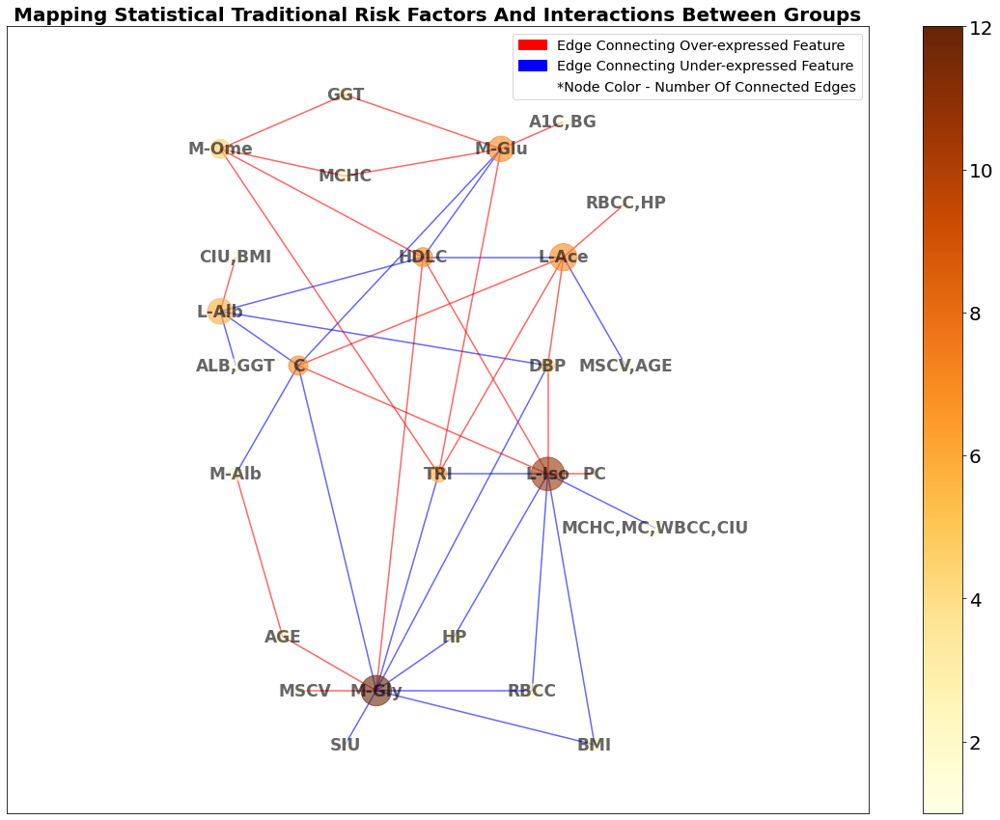

In [657]:
import networkx as nx

plt.figure(figsize = (20, 15))
G = nx.read_weighted_edgelist('graph_final_only_cb_features_with_new_labels.txt', delimiter =" ")
#nx.draw_networkx(G, with_label = True)

connections = {
        'M-Gly' : 10,
        'M-Alb' : 2,
        'L-Iso' : 12,
        'L-Alb' : 7,
        'L-Ace' : 8,
        'M-Ome' : 4,
        'M-Glu' : 7,
        'MSCV' : 1,
        'SIU' : 1,
        'MCHC,MC,WBCC,CIU' : 4,
        'PC' : 1,
        'ALB,GGT' : 2,
        'CIU,BMI' : 2,
        'MSCV,AGE' : 2,
        'RBCC,HP' : 2,
        'A1C,BG' : 2,
        'AGE' : 2,
        'BMI' : 2,
        'RBCC' : 2,
        'HP' : 2,
        'HDLC' : 2,
        'TRI' : 2,
        'DBP' : 2,
        'DBP' : 2,
        'C' : 2,
        'MCHC' : 2,
        'GGT' : 2,
        'TRI' : 3,
        'C' : 4,
        'HDLC' : 4}

pos = {
        'M-Gly' : (1,2),
        'M-Alb' : (-3.5,4),
        'L-Iso' : (6.5,4),
        'L-Alb' : (-4,5.5),
        'L-Ace' : (7,6),
        'M-Ome' : (-4,7),
        'M-Glu' : (5,7),
        'MSCV' : (-1.3,2),
        'SIU' : (0,1.5),
        'MCHC,MC,WBCC,CIU' : (9.95,3.5),
        'PC' : (8,4),
        'ALB,GGT' : (-3.5,5),
        'CIU,BMI' : (-3.5,6),
        'MSCV,AGE' : (9,5),
        'RBCC,HP' : (9,6.5),
        'A1C,BG' : (7,7.25),
        'AGE' : (-2,2.5),
        'BMI' : (8,1.5),
        'RBCC' : (6,2),
        'HP' : (3.5,2.5),
        'HDLC' : (2.5,6),
        'TRI' : (2,4.5),
        'DBP' : (6.5,5),
        'DBP' : (6.5,5),
        'C' : (-1.5,5),
        'MCHC' : (0,6.75),
        'GGT' : (0,7.5),
        'TRI' : (3,4),
        'C' : (-1.5,5),
        'HDLC' : (2.5,6)
}
  
# We have to set the population attribute for each of the 14 nodes
for i in list(G.nodes()):
    G.nodes[i]['connections'] = connections[i]
    

node_color = [G.degree(v) for v in G]
# node colour is a list of degrees of nodes
  
node_size = [100 * nx.get_node_attributes(G, 'connections')[v] for v in G]
# size of node is a list of population of cities
  
edge_width = [0.3 * G[u][v]['weight'] for u, v in G.edges()]
# width of edge is a list of weight of edges
plt.margins(x=0.4)
plt.title('Mapping Statistical Traditional Risk Factors And Interactions Between Groups', fontsize = 20, fontweight = 'bold')
  
    
#color_map = []
#cmap = [G.degree(v) for v in G]

#rgba = cmap(dict_1[node])
#color_map.append(convert_to_hex(rgba))

#for node in G.nodes:
#    if node == 'C1':
#        color_map.append('red')
#    elif node == 'C2':
#        color_map.append('orange')
#    elif node == 'C3':
#        color_map.append('yellow')
#    elif node == 'C4':
#        color_map.append('green')
#    elif node == 'C5':
#        color_map.append('blue')
#    elif node == 'C6':
#        color_map.append('indigo')
#    elif node == 'C7':
#        color_map.append('violet')
#    else:
#        color_map = [G.degree(v) for v in G]
        



#color_map = ['red' if node == 'C2' else 'green' for node in G]
#graph = nx.draw_networkx(G,pos, node_color=color_map) # node lables

nx.draw_networkx(G, node_size = node_size, pos = pos,
                 node_color = node_color, alpha = 0.6,
                 with_labels = True, width = edge_width,
                 edge_color = ['red', 'blue', 'red', 'blue', 'blue', 'blue', 'red', 'blue', 'blue', 'blue', 'blue', 'red', 'blue', 
                              'blue', 'blue', 'red', 'blue', 'red', 'red', 'blue', 'red', 'blue', 'blue', 'blue', 'blue', 'red', 
                              'red', 'red', 'red', 'blue', 'red', 'red', 'red', 'red', 'blue', 'blue', 'red', 'blue', 
                              'red', 'red', 'red', 'red'], cmap = 'YlOrBr', font_size = 17, font_weight = 'bold', arrows = False)

# Create legend
overexpressed = mpatches.Patch(color='red', label='Edge Connecting Over-expressed Feature')
underexpressed = mpatches.Patch(color='blue', label='Edge Connecting Under-expressed Feature')
node_color_label = mpatches.Patch(color = 'white', label = '*Node Color - Number Of Connected Edges')

legend = plt.legend(handles=[overexpressed, underexpressed, node_color_label], fontsize = 'x-large')

sm = plt.cm.ScalarMappable(cmap='YlOrBr', norm=plt.Normalize(vmin=1, vmax=12))
sm.set_array([])
cbar = plt.colorbar(sm)
# Set ticks on color bar larger
cbar.ax.tick_params(labelsize= 20)
G.edges

Below we look into the ethnic background of patients in each group.

In [658]:
cluster_1_ethnicity = cb_features_with_metabolomic_labels[cb_features_with_metabolomic_labels['labels'] == 1]
cluster_2_ethnicity = cb_features_with_metabolomic_labels[cb_features_with_metabolomic_labels['labels'] == 2]
cluster_3_ethnicity = cb_features_with_metabolomic_labels[cb_features_with_metabolomic_labels['labels'] == 3]
cluster_4_ethnicity = cb_features_with_metabolomic_labels[cb_features_with_metabolomic_labels['labels'] == 4]
cluster_5_ethnicity = cb_features_with_metabolomic_labels[cb_features_with_metabolomic_labels['labels'] == 5]
cluster_6_ethnicity = cb_features_with_metabolomic_labels[cb_features_with_metabolomic_labels['labels'] == 6]
cluster_7_ethnicity = cb_features_with_metabolomic_labels[cb_features_with_metabolomic_labels['labels'] == 7]

Below we show the ethnic makeup of each of the resulting clusters.

In [659]:
print('Proportion of whites in group 1:', len(cluster_1_ethnicity[cluster_1_ethnicity['Ethnicity_0'] == 1])/len(cluster_1_ethnicity))
print('Proportion of Mixed in group 1:', len(cluster_1_ethnicity[cluster_1_ethnicity['Ethnicity_1'] == 1])/len(cluster_1_ethnicity))
print('Proportion of Asian or Asian British in group 1:', len(cluster_1_ethnicity[cluster_1_ethnicity['Ethnicity_2'] == 1])/len(cluster_1_ethnicity))
print('Proportion of Black or Black British in group 1:', len(cluster_1_ethnicity[cluster_1_ethnicity['Ethnicity_3'] == 1])/len(cluster_1_ethnicity))
print('Proportion of Chinese in group 1:', len(cluster_1_ethnicity[cluster_1_ethnicity['Ethnicity_4'] == 1])/len(cluster_1_ethnicity))
print('Proportion of Other in group 1:', len(cluster_1_ethnicity[cluster_1_ethnicity['Ethnicity_5'] == 1])/len(cluster_1_ethnicity))
print('---------------------------------------------------------------------------------------------------')
print('Proportion of whites in group 2:', len(cluster_2_ethnicity[cluster_2_ethnicity['Ethnicity_0'] == 1])/len(cluster_2_ethnicity))
print('Proportion of Mixed in group 2:', len(cluster_2_ethnicity[cluster_2_ethnicity['Ethnicity_1'] == 1])/len(cluster_2_ethnicity))
print('Proportion of Asian or Asian British in group 2:', len(cluster_2_ethnicity[cluster_2_ethnicity['Ethnicity_2'] == 1])/len(cluster_2_ethnicity))
print('Proportion of Black or Black British in group 2:', len(cluster_2_ethnicity[cluster_2_ethnicity['Ethnicity_3'] == 1])/len(cluster_2_ethnicity))
print('Proportion of Chinese in group 2:', len(cluster_2_ethnicity[cluster_2_ethnicity['Ethnicity_4'] == 1])/len(cluster_2_ethnicity))
print('Proportion of Other in group 2:', len(cluster_2_ethnicity[cluster_2_ethnicity['Ethnicity_5'] == 1])/len(cluster_2_ethnicity))
print('---------------------------------------------------------------------------------------------------')
print('Proportion of whites in group 3:', len(cluster_3_ethnicity[cluster_3_ethnicity['Ethnicity_0'] == 1])/len(cluster_3_ethnicity))
print('Proportion of Mixed in group 3:', len(cluster_3_ethnicity[cluster_3_ethnicity['Ethnicity_1'] == 1])/len(cluster_3_ethnicity))
print('Proportion of Asian or Asian British in group 3:', len(cluster_3_ethnicity[cluster_3_ethnicity['Ethnicity_2'] == 1])/len(cluster_3_ethnicity))
print('Proportion of Black or Black British in group 3:', len(cluster_3_ethnicity[cluster_3_ethnicity['Ethnicity_3'] == 1])/len(cluster_3_ethnicity))
print('Proportion of Chinese in group 3:', len(cluster_3_ethnicity[cluster_3_ethnicity['Ethnicity_4'] == 1])/len(cluster_3_ethnicity))
print('Proportion of Other in group 3:', len(cluster_3_ethnicity[cluster_3_ethnicity['Ethnicity_5'] == 1])/len(cluster_3_ethnicity))
print('---------------------------------------------------------------------------------------------------')
print('Proportion of whites in group 4:', len(cluster_4_ethnicity[cluster_4_ethnicity['Ethnicity_0'] == 1])/len(cluster_4_ethnicity))
print('Proportion of Mixed in group 4:', len(cluster_4_ethnicity[cluster_4_ethnicity['Ethnicity_1'] == 1])/len(cluster_4_ethnicity))
print('Proportion of Asian or Asian British in group 4:', len(cluster_4_ethnicity[cluster_4_ethnicity['Ethnicity_2'] == 1])/len(cluster_4_ethnicity))
print('Proportion of Black or Black British in group 4:', len(cluster_4_ethnicity[cluster_4_ethnicity['Ethnicity_3'] == 1])/len(cluster_4_ethnicity))
print('Proportion of Chinese in group 4:', len(cluster_4_ethnicity[cluster_4_ethnicity['Ethnicity_4'] == 1])/len(cluster_4_ethnicity))
print('Proportion of Other in group 4:', len(cluster_4_ethnicity[cluster_4_ethnicity['Ethnicity_5'] == 1])/len(cluster_4_ethnicity))
print('---------------------------------------------------------------------------------------------------')
print('Proportion of whites in group 5:', len(cluster_5_ethnicity[cluster_5_ethnicity['Ethnicity_0'] == 1])/len(cluster_5_ethnicity))
print('Proportion of Mixed in group 5:', len(cluster_5_ethnicity[cluster_5_ethnicity['Ethnicity_1'] == 1])/len(cluster_5_ethnicity))
print('Proportion of Asian or Asian British in group 5:', len(cluster_5_ethnicity[cluster_5_ethnicity['Ethnicity_2'] == 1])/len(cluster_5_ethnicity))
print('Proportion of Black or Black British in group 5:', len(cluster_5_ethnicity[cluster_5_ethnicity['Ethnicity_3'] == 1])/len(cluster_5_ethnicity))
print('Proportion of Chinese in group 5:', len(cluster_5_ethnicity[cluster_5_ethnicity['Ethnicity_4'] == 1])/len(cluster_5_ethnicity))
print('Proportion of Other in group 5:', len(cluster_5_ethnicity[cluster_5_ethnicity['Ethnicity_5'] == 1])/len(cluster_5_ethnicity))
print('---------------------------------------------------------------------------------------------------')
print('Proportion of whites in group 6:', len(cluster_6_ethnicity[cluster_6_ethnicity['Ethnicity_0'] == 1])/len(cluster_6_ethnicity))
print('Proportion of Mixed in group 6:', len(cluster_6_ethnicity[cluster_6_ethnicity['Ethnicity_1'] == 1])/len(cluster_6_ethnicity))
print('Proportion of Asian or Asian British in group 6:', len(cluster_6_ethnicity[cluster_6_ethnicity['Ethnicity_2'] == 1])/len(cluster_6_ethnicity))
print('Proportion of Black or Black British in group 6:', len(cluster_6_ethnicity[cluster_6_ethnicity['Ethnicity_3'] == 1])/len(cluster_6_ethnicity))
print('Proportion of Chinese in group 6:', len(cluster_6_ethnicity[cluster_6_ethnicity['Ethnicity_4'] == 1])/len(cluster_6_ethnicity))
print('Proportion of Other in group 6:', len(cluster_6_ethnicity[cluster_6_ethnicity['Ethnicity_5'] == 1])/len(cluster_6_ethnicity))
print('---------------------------------------------------------------------------------------------------')
print('Proportion of whites in group 7:', len(cluster_7_ethnicity[cluster_7_ethnicity['Ethnicity_0'] == 1])/len(cluster_7_ethnicity))
print('Proportion of Mixed in group 7:', len(cluster_7_ethnicity[cluster_7_ethnicity['Ethnicity_1'] == 1])/len(cluster_7_ethnicity))
print('Proportion of Asian or Asian British in group 7:', len(cluster_7_ethnicity[cluster_7_ethnicity['Ethnicity_2'] == 1])/len(cluster_7_ethnicity))
print('Proportion of Black or Black British in group 7:', len(cluster_7_ethnicity[cluster_7_ethnicity['Ethnicity_3'] == 1])/len(cluster_7_ethnicity))
print('Proportion of Chinese in group 7:', len(cluster_7_ethnicity[cluster_7_ethnicity['Ethnicity_4'] == 1])/len(cluster_7_ethnicity))
print('Proportion of Other in group 7:', len(cluster_7_ethnicity[cluster_7_ethnicity['Ethnicity_5'] == 1])/len(cluster_7_ethnicity))
print('---------------------------------------------------------------------------------------------------')

Proportion of whites in group 1: 0.8826979472140762
Proportion of Mixed in group 1: 0.05278592375366569
Proportion of Asian or Asian British in group 1: 0.026392961876832845
Proportion of Black or Black British in group 1: 0.01466275659824047
Proportion of Chinese in group 1: 0.005865102639296188
Proportion of Other in group 1: 0.011730205278592375
---------------------------------------------------------------------------------------------------
Proportion of whites in group 2: 0.9060150375939849
Proportion of Mixed in group 2: 0.03383458646616541
Proportion of Asian or Asian British in group 2: 0.03007518796992481
Proportion of Black or Black British in group 2: 0.007518796992481203
Proportion of Chinese in group 2: 0.0
Proportion of Other in group 2: 0.011278195488721804
---------------------------------------------------------------------------------------------------
Proportion of whites in group 3: 0.8731218697829716
Proportion of Mixed in group 3: 0.05509181969949917
Proportion 

In [660]:
cb_features_with_metabolomic_data_and_labels = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled.drop(columns = ['31-0.0', 'Ethnicity_0', 'Ethnicity_1', 
                               'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5', 'labels']).merge(cb_features_with_metabolomic_labels_normalized, on = 'eid')
cb_features_with_metabolomic_data_and_labels

,23400-0.0,23401-0.0,23402-0.0,23403-0.0,23404-0.0,23405-0.0,23406-0.0,23407-0.0,23408-0.0,23409-0.0,23410-0.0,23411-0.0,23412-0.0,23413-0.0,23414-0.0,23415-0.0,23416-0.0,23417-0.0,23418-0.0,23419-0.0,23420-0.0,23421-0.0,23422-0.0,23423-0.0,23424-0.0,23425-0.0,23426-0.0,23427-0.0,23428-0.0,23429-0.0,23430-0.0,23431-0.0,23432-0.0,23433-0.0,23434-0.0,23436-0.0,23437-0.0,23438-0.0,23439-0.0,23440-0.0,23442-0.0,23443-0.0,23444-0.0,23445-0.0,23446-0.0,23447-0.0,23448-0.0,23449-0.0,23450-0.0,23460-0.0,23461-0.0,23462-0.0,23463-0.0,23464-0.0,23465-0.0,23466-0.0,23467-0.0,23468-0.0,23469-0.0,23470-0.0,23471-0.0,23472-0.0,23473-0.0,23474-0.0,23475-0.0,23476-0.0,23477-0.0,23478-0.0,23479-0.0,23480-0.0,23481-0.0,23482-0.0,23483-0.0,23484-0.0,23485-0.0,23486-0.0,23487-0.0,23488-0.0,23489-0.0,23490-0.0,23491-0.0,23492-0.0,23493-0.0,23494-0.0,23495-0.0,23496-0.0,23497-0.0,23498-0.0,23499-0.0,23500-0.0,23501-0.0,23502-0.0,23503-0.0,23504-0.0,23505-0.0,23506-0.0,23507-0.0,23508-0.0,23509-0.0,23510-0.0,...,23522-0.0,23523-0.0,23524-0.0,23525-0.0,23526-0.0,23527-0.0,23528-0.0,23529-0.0,23530-0.0,23531-0.0,23532-0.0,23533-0.0,23534-0.0,23535-0.0,23536-0.0,23537-0.0,23538-0.0,23539-0.0,23540-0.0,23541-0.0,23542-0.0,23543-0.0,23544-0.0,23545-0.0,23546-0.0,23547-0.0,23548-0.0,23549-0.0,23550-0.0,23551-0.0,23552-0.0,23553-0.0,23554-0.0,23555-0.0,23556-0.0,23557-0.0,23558-0.0,23559-0.0,23560-0.0,23561-0.0,23562-0.0,23563-0.0,23564-0.0,23565-0.0,23566-0.0,23567-0.0,23568-0.0,23569-0.0,23570-0.0,23571-0.0,23572-0.0,23573-0.0,23574-0.0,23575-0.0,23576-0.0,23577-0.0,23578-0.0,eid,Age Covariate,target,labels,30070-0.0,30530-0.0,30750-0.0,30740-0.0,21001-0.0,30760-0.0,4079-0.0,4079-0.1,4080-0.0,4080-0.1,30690-0.0,31-0.0,30010-0.0,30030-0.0,30270-0.0,30040-0.0,30050-0.0,30060-0.0,30080-0.0,30000-0.0,30160-0.0,30120-0.0,30130-0.0,30150-0.0,30520-0.0,30670-0.0,30510-0.0,30870-0.0,30600-0.0,30610-0.0,30730-0.0,30860-0.0,21003-0.0,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5
0,0.368701,0.354952,0.317711,0.313315,0.410439,0.456313,0.268151,0.266144,0.243557,0.245425,0.315430,0.394864,0.312824,0.418066,0.313724,0.382306,0.297808,0.458563,0.270218,0.346241,0.334714,0.441777,0.281082,0.412833,0.294255,0.438546,0.303070,0.374196,0.306375,0.359323,0.354066,0.594097,0.514768,0.252620,0.424273,0.405722,0.398464,0.370449,0.343565,0.350676,0.401601,0.236663,0.110076,0.439911,0.398304,0.397986,0.327213,0.458351,0.087213,0.509124,0.277649,0.180301,0.139004,0.456161,0.454849,0.422721,0.483395,0.307950,0.407818,0.338532,0.171790,0.472980,0.251778,0.165708,0.007771,0.370925,0.125331,0.238770,0.512415,0.453112,0.204849,0.177417,0.236048,0.276279,0.290603,0.255563,0.145315,0.249778,0.247544,0.245572,0.320372,0.337052,0.271980,0.230269,0.295494,0.284115,0.292567,0.340444,0.318100,0.323122,0.256136,0.302470,0.334965,0.302077,0.239086,0.223959,0.271346,0.378295,0.287990,0.304885,...,0.257915,0.311744,0.328565,0.314682,0.320602,0.322419,0.295950,0.255303,0.314597,0.444437,0.411460,0.463437,0.464175,0.432166,0.241297,0.440277,0.454580,0.448537,0.463878,0.466883,0.455369,0.247369,0.410346,0.451239,0.448166,0.460868,0.465036,0.437574,0.265484,0.177209,0.141406,0.119449,0.169988,0.143723,0.259015,0.222847,0.147790,0.156271,0.178951,0.124804,0.124130,0.144105,0.273122,0.333321,0.330474,0.333185,0.319387,0.312627,0.332673,0.354162,0.363637,0.361680,0.350108,0.366873,0.363161,0.421896,0.375972,1281323,0,1,5,0.540591,0.421983,0.534535,0.256377,0.315457,0.175045,0.527027,0.519481,0.487805,0.451327,0.501690,1,0.777139,0.815856,0.368267,0.580705,0.751979,0.580581,0.272500,0.222114,0.016667,0.065424,0.167010,0.136842,0.478238,0.297260,0.278159,0.695763,0.702566,0.149890,0.054590,0.512716,0.200000,1,0,0,0,0,0
1,0.178951,0.183385,0.195076,0.286471,0.185227,0.260847,0.147217,0.412621,0.395243,0.290853,0.398622,0.307475,0.373785,0.208497,0.267723,0.179196,0.227133,0.280558,0.134827,0.194673,0.369904,0.206452,0.210978,0.344439,0.398900,0.251751,0.231886,0.224642,0.329701,


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


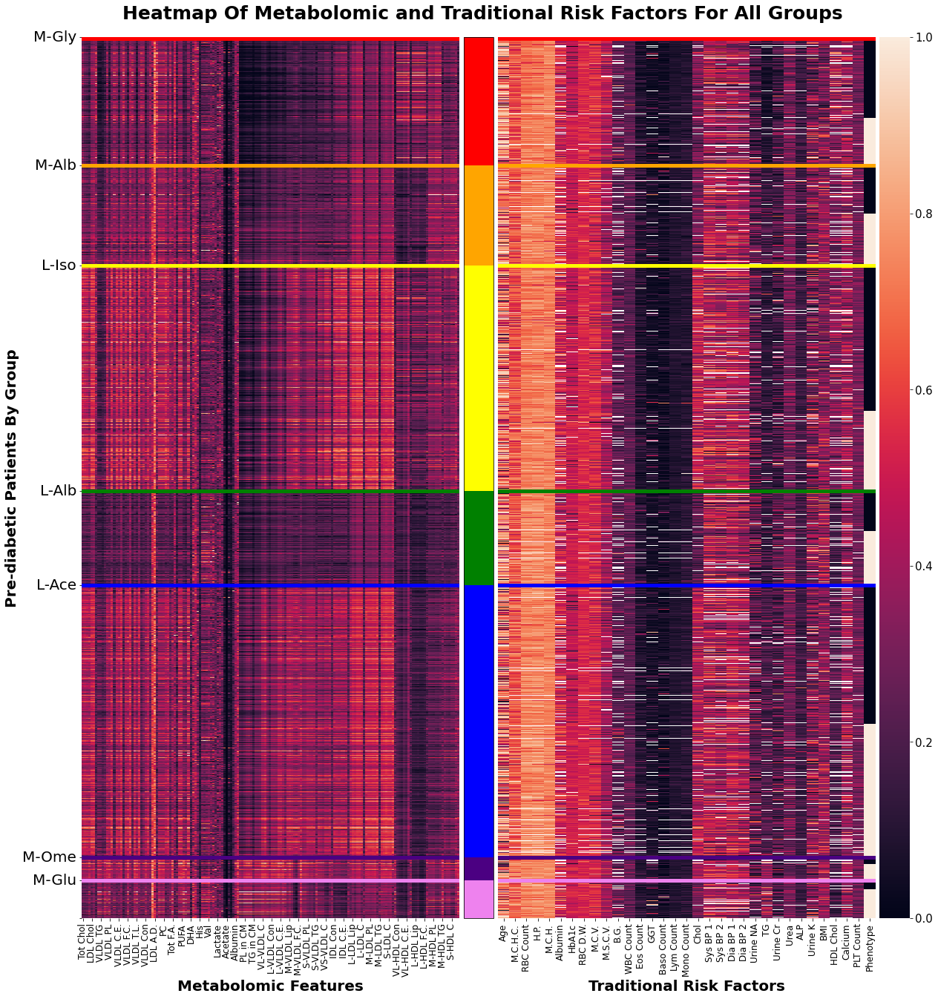

In [661]:
import matplotlib as mpl

f,(ax1, axcb1, ax2, axcb2) = plt.subplots(1,4, 
            gridspec_kw={'width_ratios':[1, 0.08, 1, 0.08], 'wspace': 0.02}, figsize = (20,20))
ax1.get_shared_y_axes().join(ax2)

prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_with_normalized_labels = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled.drop_duplicates()
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_with_normalized_labels['labels'] = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_with_normalized_labels['labels']/7
prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_with_normalized_labels_with_names = prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_with_normalized_labels.rename(
    columns = {'23400-0.0' : 'Tot Chol', '23404-0.0' : 'LDL Chol', '23408-0.0' : 'VLDL TG', '23412-0.0' : 'VLDL PL', 
               '23416-0.0' : 'VLDL C.E.', '23420-0.0' : 'VLDL F.C.', '23424-0.0' : 'VLDL T.L.', '23428-0.0' : 'VLDL Con', 
               '23432-0.0' : 'LDL A.D.', '23437-0.0' : 'PC', '23442-0.0' : 'Tot F.A.', '23446-0.0' : 'PUFA', 
               '23450-0.0' : 'DHA', '23463-0.0' : 'His', '23467-0.0' : 'Val', '23471-0.0' : 'Lactate', 
               '23475-0.0' : 'Acetate', '23479-0.0' : 'Albumin', '23483-0.0' : 'PL in CM', '23487-0.0' : 'TG in CM', 
               '23491-0.0' : 'VL-VLDL C', '23495-0.0' : 'L-VLDL Con', '23499-0.0' : 'L-VLDL C.E.', 
               '23503-0.0' : 'M-VLDL Lip', '23507-0.0' : 'M-VLDL F.C.', '23511-0.0' : 'S-VLDL PL', 
               '23515-0.0' : 'S-VLDL TG', '23519-0.0' : 'VS-VLDL C', '23523-0.0' : 'IDL Con', '23527-0.0' : 'IDL C.E.', 
               '23531-0.0' : 'L-LDL Lip', '23535-0.0' : 'L-LDL C', '23539-0.0' : 'M-LDL PL', '23543-0.0' : 'M-LDL TG', 
               '23547-0.0' : 'S-LDL C', '23551-0.0' : 'VL-HDL Con', '23555-0.0' : 'VL-HDL C.E.', 
               '23559-0.0' : 'L-HDL Lip', '23563-0.0' : 'L-HDL F.C.', '23567-0.0' : 'M-HDL PL', 
               '23571-0.0' : 'M-HDL TG', '23575-0.0' : 'S-HDL C'})

heatmap_by_clusters = sns.heatmap(prediabetes_with_metabolomics_continuous_only_to_keep_filtered_with_covariates_with_target_incorrectly_labeled_without_duplicates_final_shuffled_with_normalized_labels_with_names.sort_values(by = ['labels', 'target']).drop(columns = ['eid', '31-0.0', 'Age Covariate', 'Ethnicity_0', 'Ethnicity_1', 
                               'Ethnicity_2', 'Ethnicity_3', 'Ethnicity_4', 'Ethnicity_5', 'labels', 'target']), ax = ax1, cbar = False)

ax = heatmap_by_clusters  # this is the important part

ax.plot([0, 168], [0, 0], ls = '-', color = 'red', lw = 10)
ax.plot([0, 168], [341, 341], ls = '-', color = 'orange', lw = 5)
ax.plot([0, 168], [607, 607], ls = '-', color = 'yellow', lw = 5)
ax.plot([0, 168], [1206, 1206], ls = '-', color = 'green', lw = 5)
ax.plot([0, 168], [1456, 1456], ls = '-', color = 'blue', lw = 5)
ax.plot([0, 168], [2178, 2178], ls = '-', color = 'indigo', lw = 5)
ax.plot([0, 168], [2238, 2238], ls = '-', color = 'violet', lw = 5)
ax.set_xlabel('Metabolomic Features', fontsize = 20, fontweight = 'bold')
ax.set_ylabel('Pre-diabetic Patients By Group', fontsize = 20, fontweight = 'bold')

cluster_labels = ['M-Gly', 'M-Alb', 'L-Iso', 'L-Alb', 'L-Ace', 'M-Ome', 'M-Glu', '']
length = [0, 341, 607, 1206, 1456, 2178, 2238, 2339]

ax.set_yticks(length)
ax.set_yticklabels(cluster_labels)
ax.tick_params(axis='y', which='major', labelsize=20)
ax.tick_params(axis='y', which='minor', labelsize=20)
ax.tick_params(axis = 'x', labelsize= 12)

cmap = mpl.colors.ListedColormap(['violet', 'indigo', 'blue', 'green', 'yellow', 'orange', 'red'])
bounds = [0, 101, 161, 883, 1133, 1732, 1998, 2339]  
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
cb1 = mpl.colorbar.ColorbarBase(axcb1, cmap=cmap,
                                norm=norm,
                                spacing = 'proportional',
                                orientation='vertical')
cb1.set_ticks([])

cb_features_with_metabolomic_labels_normalized_with_labels_normalized = cb_features_with_metabolomic_labels_normalized[['eid', '21003-0.0', '30060-0.0', '30010-0.0', '30030-0.0', '30050-0.0', '30600-0.0', '30750-0.0',  '30070-0.0', '30040-0.0', '30270-0.0', '30740-0.0', '30000-0.0', '30150-0.0', '30730-0.0', '30160-0.0', '30120-0.0', '30130-0.0', '30690-0.0', '4080-0.0', '4080-0.1', '4079-0.0', '4079-0.1', '30530-0.0', '30870-0.0', '30510-0.0', '30670-0.0', '30610-0.0', '30520-0.0', '21001-0.0', '30760-0.0', '30860-0.0', '30080-0.0']]
cb_features_with_metabolomic_labels_normalized_with_labels_normalized['target'] = cb_features_with_metabolomic_data_and_labels['target']
cb_features_with_metabolomic_labels_normalized_with_labels_normalized['labels'] = cb_features_with_metabolomic_data_and_labels['labels']/7
cb_features_with_metabolomic_labels_normalized_with_labels_normalized_with_names = cb_features_with_metabolomic_labels_normalized_with_labels_normalized.rename(
    columns = {'21003-0.0' : 'Age', '30060-0.0' : 'M.C.H.C.', '30010-0.0' : 'RBC Count', '30030-0.0' : 'H.P.', 
               '30050-0.0' : 'M.C.H.', '30600-0.0' : 'Albumin', '30750-0.0' : 'HbA1c', '30070-0.0' : 'RBC D.W.', 
               '30040-0.0' : 'M.C.V.', '30270-0.0' : 'M.S.C.V.', '30740-0.0' : 'B.G.', '30000-0.0' : 'WBC Count', 
               '30150-0.0' : 'Eos Count', '30730-0.0' : 'GGT', '30160-0.0' : 'Baso Count', '30120-0.0' : 'Lym Count', 
               '30130-0.0' : 'Mono Count', '30690-0.0' : 'Chol', '4080-0.0' : 'Sys BP 1', '4080-0.1' : 'Sys BP 2', 
               '4079-0.0' : 'Dia BP 1', '4079-0.1' : 'Dia BP 2', '30530-0.0' : 'Urine NA', '30870-0.0' : 'TG', 
               '30510-0.0' : 'Urine Cr', '30670-0.0' : 'Urea', '30610-0.0' : 'ALP', '30520-0.0' : 'Urine K', 
               '21001-0.0' : 'BMI', '30760-0.0' : 'HDL Chol', '30860-0.0' : 'Calcium', '30080-0.0' : 'PLT Count', 
               'target' : 'Phenotype', 'labels' : 'Group'})

heatmap_for_cb_features = sns.heatmap(cb_features_with_metabolomic_labels_normalized_with_labels_normalized_with_names.sort_values(by = ['Group', 'Phenotype']).drop(columns = ['eid', 'Group']), yticklabels = False, ax = ax2, cbar_ax = axcb2)

ax2.tick_params(labelsize= 12)

ax2.plot([0, 220], [0, 0], ls = '-', color = 'red', lw = 10)
ax2.plot([0, 220], [341, 341], ls = '-', color = 'orange', lw = 5)
ax2.plot([0, 220], [607, 607], ls = '-', color = 'yellow', lw = 5)
ax2.plot([0, 220], [1206, 1206], ls = '-', color = 'green', lw = 5)
ax2.plot([0, 220], [1456, 1456], ls = '-', color = 'blue', lw = 5)
ax2.plot([0, 220], [2178, 2178], ls = '-', color = 'indigo', lw = 5)
ax2.plot([0, 220], [2238, 2238], ls = '-', color = 'violet', lw = 5)
ax2.set_xlabel('Traditional Risk Factors', fontsize = 20, fontweight = 'bold')

# Set ticks on color bar larger
axcb2.tick_params(labelsize= 15)

plt.suptitle('Heatmap Of Metabolomic and Traditional Risk Factors For All Groups', fontsize = 25, fontweight = 'bold')
plt.tight_layout()
plt.subplots_adjust(top=0.95)
